# Rappi proyecto tengo miedo
¿Cómo unir Power Bi con Rappi con SQL con wtf?
Puesto que los datos recopilados los obtendremos luego para tener un modelo Star en PowerBi, estaremos trabajando desde esta perspectiva.

Importamos las librerías scrapper

In [3]:
from bs4 import BeautifulSoup
import concurrent.futures
import pandas as pd
import numpy as np
import seaborn as sns
import requests
import csv
import re

In [4]:
url_main = "https://www.rappi.com"
url_main_r = requests.get(url_main)

Revisamos la url status

In [5]:
def r_url_status(url_request_response):
    if url_request_response.status_code == 200:
       print('No problem')
    else:
       print('Uh. There is something wrong here')

In [4]:
r_url_status(url_main_r)

No problem


Y creamos nuestra sopa:

In [185]:
soup = BeautifulSoup(url_main_r.text, 'lxml')

Para este paso listaremos todos los países que usa Rappi actualmente. Para esto:
1) Usaremos un elemento con tag ul y id 1 dentro de su página que lista justo lo que necesitamos, este es nuestro elemento clave.
2) Luego obtendremos todos los elementos con etiqueta a.
2) Para al final tenerlo obtener los href de cada uno.
3) Imprimimos resultados

In [186]:
elemento_clave = soup.find_all('ul', id="1")[0] # Primer paso
elementos_a = elemento_clave.find_all('a') # Segundo paso
paises_url = [elementos_a[i].get('href') for i in range(len(elementos_a))] # Tercer paso
paises_nombres = [elementos_a[i].text for i in range(len(elementos_a))] # Sus nombres
paises_url # Ya adivinaste jaajaj

['https://www.rappi.com.ar/',
 'https://www.rappi.com.br/',
 'https://www.rappi.cl/',
 'https://www.rappi.com.co/',
 'https://www.rappi.co.cr/',
 'https://www.rappi.com.ec/',
 'https://www.rappi.com.mx/',
 'https://www.rappi.com.pe/',
 'https://www.rappi.com.uy/']

Guardamos estos datos como si fueran una tabla aparte

In [211]:
# Creamos el DF
paises_df = pd.DataFrame({"url_paises": paises_url, "nombre_pais": paises_nombres})

In [212]:
# Creamos la columna de intercambio. Esto para usarlo una vez tengamos los precios
equivalente_10000_dolares = [
    1676508,# Argentina
    52195,# Brasil
    8835000,# Chile
    47680700,# Colombia
    5981305, # Costa rica
    10000, # Ecuador
    193914,# Mexico
    38223.49,# Perú
    394049.80 # Uruguay
]
paises_df["1000_dollars_exchange"] = equivalente_10000_dolares

In [213]:
paises_df.to_csv("paises_rappi.csv", index_label="id_pais")

Bien para el siguiente paso necesitaremos de obtener todas las cadenas de restaurantes de cada país. Para nuestra suerte, Rappi ya hizo este trabajo indexandolo como "https://www.rappi.com.ec/catalogo/restaurants/a-1".
Lo bueno es que, aparte de cambiar el país de origen, misma url base se mantiene para todos los países.

# Cadenas: Obteniendo todas las cadenas de todos los países

In [38]:
catalogo_restaurantes_url = "/catalogo/restaurants/a-1"
pais_elegido = paises[5]
catalogo_requests_r = requests.get(pais_elegido + catalogo_restaurantes_url)
### Revisamos su status
r_url_status(catalogo_requests_r)

No problem


In [39]:
catalogo_soup = BeautifulSoup(catalogo_requests_r.text, 'lxml')

Chequeamos que con requests podamos obtener las urls y nombres de los restaurantes. Esto lo logramos haciendo hincapié en los elementos con clase "sc-bdfBQB eXopiF sc-iqHYmW gcZftM secondary"

In [53]:
cadena_resturantes_paginas = catalogo_soup.find_all(class_="sc-bdfBQB eXopiF sc-iqHYmW gcZftM secondary")
url_cadena_resturantes_paginas = [cadena_resturantes_paginas[i].get("href") for i in range(len(cadena_resturantes_paginas))]
nombre_cadena_resturantes_paginas = [cadena_resturantes_paginas[i].find_all("span")[0].text for i in range(len(cadena_resturantes_paginas))]
url_cadena_resturantes_paginas

['https://www.rappi.com.ec/restaurantes/delivery/17-alitas-benditas',
 'https://www.rappi.com.ec/restaurantes/delivery/41-alitas-del-cadillac',
 'https://www.rappi.com.ec/restaurantes/delivery/85-ananke',
 'https://www.rappi.com.ec/restaurantes/delivery/171-arepa-cafe-y-algo-mas',
 'https://www.rappi.com.ec/restaurantes/delivery/393-alitas-cumbaya-legendary-road',
 'https://www.rappi.com.ec/restaurantes/delivery/634-akai-sushi',
 'https://www.rappi.com.ec/restaurantes/delivery/701-arenas',
 'https://www.rappi.com.ec/restaurantes/delivery/923-ambrosia',
 'https://www.rappi.com.ec/restaurantes/delivery/1039-arabisc',
 'https://www.rappi.com.ec/restaurantes/delivery/1134-ala-estacion',
 'https://www.rappi.com.ec/restaurantes/delivery/1309-adriana-pasteleria-panaderia',
 'https://www.rappi.com.ec/restaurantes/delivery/1396-arabito',
 'https://www.rappi.com.ec/restaurantes/delivery/1626-asadero-y-pollos-la-esquina-de-ales',
 'https://www.rappi.com.ec/restaurantes/delivery/1675-andes-de-fueg

Ponemos los datos en un DataFrame para visualizarlos mejor

In [92]:
pd.DataFrame({"Nombre cadena":nombre_cadena_resturantes_paginas, "Url":url_cadena_resturantes_paginas}).head(3)

,Nombre cadena,Url
0,Alitas Benditas,https://www.rappi.com.ec/restaurantes/delivery...
1,Alitas del Cadillac,https://www.rappi.com.ec/restaurantes/delivery...
2,Ananké,https://www.rappi.com.ec/restaurantes/delivery...


Conseguido. Pero esto solo es de la primera página dentro del catálogo, tendremos que conseguir listas las demás páginas para tener acceso a los demás restaurantes. Por suerte también estos elementos están catalogados con una clase en concreto: "sc-39328323-1 jiuMaW"

In [40]:
paginas_catalogo = catalogo_soup.find_all(class_="sc-39328323-1 jiuMaW")
# En este caso debemos de agregar la url del pais base ya que no esta escrita por default
url_otras_paginas_catalogo = [pais_elegido[:-1] + paginas_catalogo[i].get("href") for i in range(len(paginas_catalogo))]

In [49]:
url_otras_paginas_catalogo[0]


'https://www.rappi.com.ar/catalogo/restaurants/b-1'

Con esto logrado procedemos a crear nuestra tabla de cadenas de restaurantes.

In [36]:
paises_df.url_paises[0]

'https://www.rappi.com.ar/'

In [82]:
url_cadena_resturantes = []
nombre_cadena_resturantes = []
id_pais = []
for i in paises_df.index:
    pais_elegido = paises_df.url_paises[i][:-1]
    url_inicial_catalogo = "/catalogo/restaurants/a-1"
    try:
        catalogo_requests_r = requests.get(pais_elegido + url_inicial_catalogo)
        # Revisamos su status
        r_url_status(catalogo_requests_r)
    except:
        print(f"No se pudo obtener los catalogos de la url {pais_elegido}")
        continue
    catalogo_soup = BeautifulSoup(catalogo_requests_r.text, 'lxml')
    # Obtenemos todas las paginas de todos los catalogos
    paginas_catalogo = catalogo_soup.find_all(class_="sc-39328323-1 jiuMaW")
    url_otras_paginas_catalogo = [pais_elegido + paginas_catalogo[i].get("href")
                                  for i in range(len(paginas_catalogo))]
    # Porque la url de la url inicial no aparece listada.
    url_otras_paginas_catalogo.append(pais_elegido + url_inicial_catalogo)
    #
    longitud_lista_anterior = len(url_cadena_resturantes)
    # Donde guardaremos nuestra información
    for url in url_otras_paginas_catalogo:
        # Obtenemos todas las cadenas de esta pagina
        catalogo_requests_r = requests.get(url)
        catalogo_soup = BeautifulSoup(catalogo_requests_r.text, 'lxml')
        # Obtenemos los atributos de las cadenas
        elemento_cadena_resturantes = catalogo_soup.find_all(class_="sc-bdfBQB eXopiF sc-iqHYmW gcZftM secondary")
        url_cadena_resturantes = url_cadena_resturantes + [elemento_cadena_resturantes[i].get("href")
                                     for i in range(len(elemento_cadena_resturantes))]
        print(f"Len restau: {len(url_cadena_resturantes)}")
        nombre_cadena_resturantes = nombre_cadena_resturantes + [elemento_cadena_resturantes[i].find_all("span")[0].text
                                     for i in range(len(elemento_cadena_resturantes))]
    # Longitud lista nueva
    longitud_lista_nueva = len(url_cadena_resturantes)
    #
    id_pais = id_pais + [i for j in range((longitud_lista_nueva - longitud_lista_anterior))]
    print(f"Len id: {len(id_pais)}")
    print("Terminado este país")

No problem
Len restau: 120
Len restau: 240
Len restau: 355
Len restau: 475
Len restau: 529
Len restau: 595
Len restau: 698
Len restau: 730
Len restau: 760
Len restau: 813
Len restau: 933
Len restau: 1053
Len restau: 1094
Len restau: 1134
Len restau: 1254
Len restau: 1266
Len restau: 1328
Len restau: 1448
Len restau: 1568
Len restau: 1578
Len restau: 1630
Len restau: 1655
Len restau: 1657
Len restau: 1659
Len restau: 1673
Len restau: 1681
Len restau: 1777
Len id: 1777
Terminado este país
No problem
Len restau: 1897
Len restau: 2017
Len restau: 2137
Len restau: 2242
Len restau: 2353
Len restau: 2473
Len restau: 2556
Len restau: 2611
Len restau: 2690
Len restau: 2777
Len restau: 2897
Len restau: 3017
Len restau: 3120
Len restau: 3216
Len restau: 3336
Len restau: 3364
Len restau: 3484
Len restau: 3604
Len restau: 3724
Len restau: 3744
Len restau: 3808
Len restau: 3830
Len restau: 3835
Len restau: 3889
Len restau: 3921
Len restau: 3946
Len restau: 4066
Len id: 4066
Terminado este país
No pr

In [37]:
cadenas_restaurantes_df = pd.DataFrame({"nombre_cadena": nombre_cadena_resturantes,
                                       "url_cadena": url_cadena_resturantes,
                                       "id_pais": id_pais})
cadenas_restaurantes_df

NameError: name 'nombre_cadena_resturantes' is not defined

Y lo guardamos en un .csv. Definimos su índice como sus PK id

In [49]:
cadenas_restaurantes_df.to_csv("lista_cadenas_restaurantes.csv",index_label="id_cadena")

Cool. Con esto logrado ya estamos más cerca. Pero en cada cadena de restaurantes existen diferentes sucursales y cada una de ellas tiene diferentes opiniones (Hasta en algunos casos no tienen opiniones de nada).
Ahora tocaría:
1) Poder guardar en una tabla cada cadena de restaurantes con su url (Para futuros análisis)
2) Poder listar las urls de cada sucursal con su respectivo nombre.
3) Poder encontrar cada opinion de cada sucursal.

# Sucurlales: Obteniendo todas las sucursales de cada cadena

In [50]:
cadenas_restaurantes_df = pd.read_csv("lista_cadenas_restaurantes.csv")

In [9]:
# Elegimos la primera cadena
parsear_cadena_url = "https://www.rappi.com.pe/restaurantes/delivery/21937-d-carla-pizzeria"
cadena_requests_r = requests.get(parsear_cadena_url)
### Revisamos el status de la respuesta
r_url_status(cadena_requests_r)

No problem


In [10]:
cadena_soup = BeautifulSoup(cadena_requests_r.text, 'lxml')

In [11]:
# Para evitar tener que hacer joins, usaremos una regex para obtener nuestra url_base del pais
re.split("/restaurantes" ,parsear_cadena_url)[0]

'https://www.rappi.com.pe'

Bueno, como podrás imaginarte, para este proposito también hay una clase y una etiqueta específica que revisar jaja

In [12]:
# Obtenemos las sucursales
div_sucursales = cadena_soup.find("div",
                                  {'data-testid': 'topRestCard'},
                                  class_="sc-9fb51c13-6 fIgfiC"
                                  )
sucursales = div_sucursales.find_all("a")

In [13]:
url_sucursal = [sucursales[i].get("href")
                     for i in range(len(sucursales))]
nombre_sucursales = [sucursales[i].find_all("h3")[0].text
                        for i in range(len(sucursales))]
direccion_sucursales = [sucursales[i].find_all("div", class_="sc-bxivhb fFeDyp sc-d9669f19-7 iOdleX")[0].text
                               for i in range(len(sucursales))]

Bien ahora lo obtenemos de todas las sucursales

In [14]:
len(cadenas_restaurantes_df)

13772

In [ ]:
cadenas_restaurantes_df.url_cadena[0]

In [ ]:
# Vamos con todo
url_sucursales = []
nombre_sucursales = []
direccion_sucursales = []
id_cadena = []
problema_obtener_url = []
no_hay_sucursales_url = []
total_cadenas = len(cadenas_restaurantes_df)
for i in cadenas_restaurantes_df.id_cadena:
    url_cadena_elegida = cadenas_restaurantes_df.url_cadena[i]
    try:
        cadena_requests_r = requests.get(url_cadena_elegida)
        # Revisamos su status
        r_url_status(cadena_requests_r)
    except:
        try:
            #Intentemos denuevo
            cadena_requests_r = requests.get(url_cadena_elegida)
            # Revisamos su status
            r_url_status(cadena_requests_r)
        except:
            print(f"Hubo un problema al obtener las sucursales de la url {url_cadena_elegida}")
            problema_obtener_url.append(url_cadena_elegida)
            continue
    cadena_soup = BeautifulSoup(cadena_requests_r.text, 'lxml')
    # Obtenemos todas las sucursales en bruto
    div_sucursales = cadena_soup.find("div",
                                  {'data-testid': 'topRestCard'},
                                  class_="sc-9fb51c13-6 fIgfiC"
                                  )
    try:
        sucursales = div_sucursales.find_all("a")
    except:
        print(f"No hay sucursales en la url {url_cadena_elegida}")
        no_hay_sucursales_url.append(url_cadena_elegida)
        continue
    #
    longitud_lista_anterior = len(url_sucursales)
    # Usamos regex para poder obtener la url base, si no estaría incompleta la url de sucursales
    url_pais_base = re.split("/restaurantes" , url_cadena_elegida)[0]
    # Obtenemos los atributos de cada sucursal
    url_sucursales = url_sucursales + [url_pais_base + sucursales[i].get("href")
                         for i in range(len(sucursales))]
    nombre_sucursales = nombre_sucursales + [sucursales[i].find_all("h3")[0].text
                            for i in range(len(sucursales))]
    direccion_sucursales = direccion_sucursales + [sucursales[i].find_all("div", class_="sc-bxivhb fFeDyp sc-d9669f19-7 iOdleX")[0].text
                                   for i in range(len(sucursales))]
    # Longitud lista nueva
    longitud_lista_nueva = len(url_sucursales)
    #
    id_cadena = id_cadena + [i for j in range((longitud_lista_nueva - longitud_lista_anterior))]
    print(f"Porcentaje completado: {round(i*100 / total_cadenas, 2)}")
print(f"Terminado")

In [32]:
sucursales_df = pd.DataFrame({"url_sucursal": url_sucursales,
                "nombre_sucursal": nombre_sucursales,
                "direccion_sucursal": direccion_sucursales,
                "id_cadena": id_cadena})

Guardemos esto por si acaso

In [59]:
sucursales_df.to_csv("sucursales_df.csv",index_label="id_sucursal")

Cool, todo bien. La única nota ha dejar es que existen algunas cadenas de comida a las que no se pudieron sacar sus sucursales. Esto se debe a que SÍ están indexadas en el directorio de Rappi pero NO tienen sucursales disponibles, se han dado de baja o por x razón no aparecen sus sucursales.

In [78]:
# Contamos cuantos de estos casos existen
len(cadenas_restaurantes_df.index) - len(sucursales_df.id_cadena.unique())

262

262 no es un gran número por suerte, pero a la hora de hacer JOINs si tendremos estos nulos. Con esto dicho ahora podemos ingresar al jugo del trabajo: Obtener datos de las sucursales

# Sucursales: Opiniones, comida y precios

Con esto ingresaremos a cada sucursal y obtendremos la siguiente información:
- Average score
- Number of reviews
- Common opinions.
----
En algunas no se tienen estos datos, así que tendremos que poner "No abierto al público / No calificado".

In [5]:
# Esta es una mausequeramienta que nos servira más tarde
str = prices[0]
match = re.search(r'[0-9](.*)', str)
if match:
    print(match.group())

NameError: name 'prices' is not defined

In [13]:
sucursales_df = pd.read_csv("sucursales_df.csv")
sucursales_df.head(3)

,id_sucursal,url_sucursal,nombre_sucursal,direccion_sucursal,id_cadena
0,0,https://www.rappi.com.ar/restaurantes/117822-b...,Burgertify - DK Belgrano,"La Pampa 2513, C1428 CABA, Argentina",0
1,1,https://www.rappi.com.ar/restaurantes/114252-b...,Burgertify - Honduras,Honduras 5265,0
2,2,https://www.rappi.com.ar/restaurantes/117823-b...,Burgertify - DK Caballito,Ambrosetti 334,0


Ahora obtenemos los datos que nos interesan

In [8]:
# Obtenemos la url de la sucursal a revisar
#revision_sucursal_url = url_sucursales_cadena[0]
sucursal_url = sucursales_df.url_sucursal[3]
# Obtenemos el request_response de la url
sucursal_r = requests.get(sucursal_url)
# Revisamos el status de la respuesta
r_url_status(sucursal_r)

No problem


In [9]:
# Creamos la sopa
catalogo_soup = BeautifulSoup(sucursal_r.text, 'lxml')

In [10]:
# Usaremos una lambda para retornar "None" si no hay opiniones o las opiniones si sí las hay.
revisador_de_nonetypes = lambda element: np.nan if element == None else element.text
def get_overall_attr(soup_sucursal):
    try:
        # Obtenemos las estrellas y el número de opiniones
        overral_stars = revisador_de_nonetypes(soup_sucursal.find("span", class_="sc-bxivhb gJCKbU"))
        number_opinions = revisador_de_nonetypes(soup_sucursal.find("span", class_="sc-bxivhb dVvqfA")) # Le quitamos los parentesis
        tiempo_delivery = revisador_de_nonetypes(soup_sucursal.find("span", class_="sc-bxivhb ecrUmJ"))
        tipo_envio = revisador_de_nonetypes(soup_sucursal.find("div", class_="chakra-skeleton css-1vjr0v9"))
        if not pd.isna(number_opinions):
            number_opinions = int(number_opinions[1:-1]) # Para quitar los parentesis y obtener el número
        return [overral_stars, number_opinions, tiempo_delivery, tipo_envio]
    except:
        print("03 Problema al obtener atributos globales. Retornando error")
        error = "Problema atributos"
        return error
get_overall_attr(catalogo_soup)

['4.1', 625, '57 - 72 min', 'Gratis(nuevos usuarios)']

In [38]:
def get_prices_all_products(soup_sucursal):
    try:
        # Encontrar lista de precios de productos
        div_prices_unparsed = soup_sucursal.find_all("span", class_="chakra-text css-kowr8")
        prices = [div_prices_unparsed[i].text
                        for i in range(len(div_prices_unparsed))]
        return prices
    except:
        print("02 Problema al obtener precios. Retornando error")
        prices = "Problema precios"
        return prices
get_prices_all_products(catalogo_soup)

NameError: name 'catalogo_soup' is not defined

In [12]:
# Encontramos el elemento madre de todas las opiniones
def get_all_opinions_attr(soup_sucursal):
    try:
        div_opinions_unparsed = soup_sucursal.find_all("div", class_="css-z7mtfw")
        # Nos quedamos con los spans de cada opinion para tener su texto y porcentajes
        opinions_unparsed = [div_opinions_unparsed[i].find_all("span")
                        for i in range(len(div_opinions_unparsed))]
        # Agarramos el texto Y porcentajes
        opinions = [(opinions_unparsed[i][0].text, opinions_unparsed[i][1].text)
                    for i in range(len(opinions_unparsed))]
        return opinions
    except:
        print("01 Problema al obtener opiniones. Retornando error")
        opinions = "Error opiniones"
        return opinions
get_all_opinions_attr(catalogo_soup)

[('Calidad de la comida', '34%'),
 ('No fue lo que pedí', '10%'),
 ('Pésima calidad', '7%'),
 ('Mala calidad', '7%'),
 ('Justo lo que pedí', '6%'),
 ('Faltaron algunos items', '6%'),
 ('Tal como lo pedí', '6%'),
 ('No fue lo que pedí', '3%'),
 ('Falto un item', '3%'),
 ('Mala presentación', '3%'),
 ('Buena presentación', '3%'),
 ('Otras razones', '12%')]

Con estos datos podemos empezar a obtener todos los metadatos de cada sucursal

In [13]:
problema_obtener_url = []
# Definición de nuestra función base
def process_sucursal(index_sucursal):
    url_sucursal_elegida = sucursales_df.url_sucursal[index_sucursal]
    # Obtenemos el ID de la sucursal
    id_sucursal = sucursales_df.id_sucursal[index_sucursal] 
    try:
        sucursal_requests_r = requests.get(url_sucursal_elegida)
        # Revisamos su status
        r_url_status(sucursal_requests_r)
    except:
        try:
            #Intentemos denuevo
            sucursal_requests_r = requests.get(url_sucursal_elegida)
            # Revisamos su status
            r_url_status(sucursal_requests_r)
        except:
            print(f"Hubo un problema al ingresar a la url {url_sucursal_elegida}")
            print(id_sucursal)
            return id_sucursal, "Problema url", "Problema url", "Problema url"
    # Obtenemos la sopa
    sucursal_soup = BeautifulSoup(sucursal_requests_r.text, 'lxml')
    # Obtenemos todos los datos
    attributes = get_overall_attr(sucursal_soup)
    prices = get_prices_all_products(sucursal_soup)
    opinions = get_all_opinions_attr(sucursal_soup)
    print(id_sucursal)
    return id_sucursal, attributes, prices, opinions

In [35]:
# Aquí usamos concurrent y multiproccesing para acelerar nuestro tiempo
all_index_sucursales = sucursales_df.index

with concurrent.futures.ProcessPoolExecutor() as executor:
    results = executor.map(process_sucursal, all_index_sucursales)

No problem
No problem
No problem
3
1
0
No problem

4No problem
6
No problem
5
No problem
2
No problem
9
No problem
7
No problem
12
No problem
10
No problem
8
No problem
No problem
11
13
No problem
15
No problem
17
No problem
18
No problem
14
No problem
21
No problem
No problem
20
16
No problem
22
No problem
No problem
25
No problem
19
26
No problemNo problem

No problem
23
No problem24

28
27
No problem
29
No problem
No problem
3231

No problem
39
No problem
30
No problem
38
No problem
No problem
33
36
No problem
37
No problem
40
No problem
41
No problem
No problem
No problem
42
43
34
No problem
35
No problem
No problem
51
50
No problem
49
No problem
45
No problem
No problem
47
46
No problem
44
No problem
No problem
53
52
No problem
57
No problem
No problem
56
55
No problem
59
No problem
58
No problem
60
No problem
61
No problem
48
No problem
No problem
62
54
No problem
66
No problem
65
No problem
63
No problem
No problem
67
64
No problem
69
No problem
71
No problem
73
No problem
68
No

No problem
1094
No problem
1095
No problem
No problem
1083
1097
No problem
No problem
No problem
1099
1098
1100
No problem
1084
No problem
No problem
No problem
1101
No problem
1102
1103
1104
No problem
No problem
1105
1107
No problem
No problem
1106
1108
No problem
No problem
1110
1109
No problem
1111
No problem
1112
No problem
1113
No problem
1114
No problem
1115
No problem
1116
No problem
1117
No problem
No problem
1118
1119
No problem
1121
No problem
1122
No problem
1123
No problem
1124
No problem
1125
No problem
1120
No problem
1144
No problem
1141
No problem
1145
No problem
No problem
1142
1149
No problem
1143
No problem
1148
No problem
1150
No problem
1151
No problem
1146
No problem
No problem
1140
1134
No problem
1147
No problem
1136
No problem
1135
No problem
1133
No problem
1132
No problem
1139
No problem
1130
No problem
1131
No problem
1138
No problem
1137
No problem
1129
No problem
1128
No problem
1152
No problem
1153
No problem
1154
No problem
1155
No problem
1156
No probl

1747
1749
1748
No problem
1750
No problem
No problem
1753
No problem
1752
1751
No problem
1742
No problem
No problem
17561656

No problem
1757
No problem
1758
No problem
1760
No problem
1761
No problem
1759
No problem
1762
No problem
1763
No problem
1764
No problem
1765
No problem
1755
No problem
1741
No problem
1740
No problem
1739
No problem
1714
No problem
1715
No problem
1716
No problem
No problem
17171718

No problem
1719
No problem
No problem
No problem
1721
1766
1720
No problem
1722
No problem
No problem
No problem
1725
1724
1723
No problem
1726
No problem
1728
No problem
No problem
1727
1729
No problem
1730
No problem
1731
No problem
1732
No problem
1733
No problem
1734
No problem
1735
No problem
1736
No problem
1737
No problem
1738
No problem
No problem
1712
1655
No problem
1564
No problem
1653
No problem
No problem
1572
No problem
15731574

No problem
No problem
1576
1575
No problem
1577
No problem
1578
No problem
1579
No problem
1580
No problem
1582
No problem
1581
No proble

No problem
2627
No problem
No problem
2634
2631
No problem
2630
No problem
2632
No problem
No problem
26352633

No problem
2651
No problem
2636
No problem
2637
No problem
No problem
2646
No problem
2648
2650
No problem
2649
No problem
2647
No problem
2642
No problem
2645
No problem
2644
No problem
2643
No problem
2638
No problem
2641
No problem
2640
No problem
2639
No problem
2652
No problem
2653
No problem
2664
No problem
2661
No problem
2660
No problem
2662
No problem
2663
No problem
2658
No problem
2665
No problem
2656
No problem
2657
No problem
No problem
2654
2655
No problem
2666
No problem
2668
No problem
2659
No problem
2667
No problem
No problem
No problem
2670
26712669

No problem
2672
No problem
2679
No problem
2673
No problem
2681
No problem
2680
No problem
2676
No problem
2675
No problem
2674
No problem
2677
No problem
2678
No problem
2682
No problem
2694
No problem
2693
No problem
2695
No problem
2692
No problem
2696
No problem
2697
No problem
2684
No problem
2698
No probl

3651
No problem
3652
No problem
3653
No problem
3637
No problem
3654
No problem
3649
No problem
3655
No problem
3656
No problem
3657
No problem
3658
No problem
3661
No problem
No problem
3660
3662
No problem
3659
No problem
3664
No problem
3663
No problem
No problem
3666
3665
No problem
3667
No problem
No problem
3669
3668
No problem
3644
No problem
3670
No problem
3671
No problem
3673
No problem
3679
No problem
3672
No problem
No problem
3681
3680
No problem
3678
No problem
3676
No problem
No problem
3675
3674
No problem
3677
No problem
3683
No problem
3684
No problem
3682
No problem
No problem
3690
3688
No problem
3685
No problem
3689
No problem
3691
No problem
3686
No problem
3687
No problem
No problem
3692
3694
No problem
No problem
3695
3693
No problem
3696
No problem
3697
No problem
3698
No problem
3703
No problem
No problem
3701
3702
No problem
3700
No problem
3699
No problem
3704
No problem
No problem
No problem3709

3710
3711
No problem
No problem
37073706

No problem
No probl

4692
No problem
4702
No problem
4694
No problem
4703
No problem
No problem
4696
4691
No problem
No problem
4705
4706
No problem
No problem
4708
4707
No problem
No problem
4710
4709
No problem
4712
No problem
4711
No problem
No problem
4716
4714
No problem
4704
No problem
No problem
4715
4713
No problem
No problem
4690
4689
No problem
4688
No problem
4662
No problem
4664
No problem
4663
No problem
4666
No problem
4665
No problem
4668
No problem
4671
No problem
4667
No problem
4672
No problem
4669
No problem
4673
No problem
4670
No problem
4674
No problem
4676
No problem
4687
No problem
4675
No problem
4685
No problem
4682
No problem
4684
No problem
4683
No problem
4680
No problem
4686
No problem
4679
No problem
4677
No problem
4678
No problem
4717
No problem
4681
No problem
4718
No problem
4719
No problem
4723
No problem
4720
No problem
4721
No problem
4725
No problem
No problem
4726
4722
No problem
4724
No problem
4727
No problem
4731
No problem
4728
No problem
4729
No problem
4730
No 

5234
No problemNo problem

5236
5232
No problem
5231
No problem
5228
No problem
5230
No problem
5233
No problem
5227
No problem
5226
No problem
5225
No problem
5224
No problem
5238
No problem
No problem
5222
5223
No problem
5229
No problem
5239
No problem
5221
No problem
5259
No problem
5242
No problem
5241
No problem
5220
No problem
5258
No problem
5255
No problem
No problem
5256
5257
No problem
5254
No problem
5249
No problem
5253
No problem
5251
No problem
5252
No problem
5247
No problem
5248
No problem
5245
No problem
5243
No problem
5246
No problem
5244
No problem
5219
No problem
No problem
5250
5240
No problem
5217
No problem
5194
No problem
5193
No problem
5192
No problem
5191
No problem
5189
No problem
5190
No problem
No problem
5218
5188
No problem
5187
No problem
5183
No problem
5181
No problem
5186
No problem
No problem
5180
5184
No problem
5182
No problem
5179
No problem
5196
No problem
5195
No problem
5185
No problem
5178
No problem
5215
No problem
5198
No problem
5214
No 

No problem
6307
No problem
6337
No problem
No problem
6338
6336
No problem
6340
No problem
6339
No problem
6342
No problem
6343
No problem
6341
No problem
6334
No problem
6344
No problem
6349
No problem
6347
No problem
No problem
6345
6348
No problem
6351
No problem
No problem
6350
6352
No problem
6353
No problem
6355
No problem
6333
No problem
6356
No problem
6332
No problem
6346
No problem
6331
No problem
6309
No problem
6308
No problem
6310
No problem
No problem
6357
6312
No problem
No problem
6311
6313
No problem
6315
No problem
6317
No problem
6316
No problem
6318
No problem
6321
No problem
6320
No problem
6322
No problem
6319
No problem
6314
No problem
6323
No problem
6325
No problem
6324
No problem
6328
No problem
6326
No problem
6329
No problem
6327
No problem
6306
No problem
6330
No problem
6255
No problem
6253
No problem
6178
No problem
No problem
No problem
6249
6176
6177
No problem
6181
No problem
6179
No problem
6182
No problem
6180
No problem
No problem
6184
6183
No probl

No problem
7225
No problem
7226
No problem
7227
No problem
7229
No problem
No problem
7228
No problem
7231
7230
No problem
7232
No problem
No problem
7235
7234
No problem
7238
No problem
7233
No problem
7236
No problem
7239
No problem
7240
No problem
7241
No problem
7237
No problem
7244
No problem
7242
No problem
7245
No problem
7243
No problem
7246
No problem
7247
No problem
7250
No problem
7248
No problem
7249
No problem
7257
No problem
7251
No problem
7252
No problem
7256
No problem
7255
No problem
7258
No problem
7254
No problem
7259
No problem
No problem
7260
7253
No problem
No problem
7263
7264
No problem
7262
No problem
7265
No problem
7266
No problem
7261
No problem
7271
No problem
7267
No problem
7268
No problem
7269
No problem
No problem
7272
7270
No problem
7273
No problem
7276
No problem
7275
No problem
7274
No problem
7277
No problem
7281
No problem
7278
No problem
No problem
7279
7280
No problem
7282
No problem
7283
No problem
7287
No problem
7284
No problem
7286
No probl

No problem
7692
No problem
7693
No problem
7674
No problem
7695
No problem
7712
No problem
No problem
7694
7713
No problem
7714
No problem
7711
No problem
7709
No problem
7707
No problem
7710
No problem
7708
No problem
7704
No problem
No problem
7673
7706
No problem
7696
No problem
7699
No problem
7698
No problem
7697
No problem
7701
No problem
No problem
7705
7702
No problem
7762
No problem
7763
No problem
7761
No problem
7703
No problem
7764
No problem
No problem
7700
7765
Uh. There is something wrong here
7769
No problem
7767
No problem
7768
No problem
7766
No problem
No problem
7771
7772
No problem
No problem
7770
7773
No problem
7774
No problem
7775
No problem
No problem
7776
7778
No problem
No problem
7779
7777
No problem
7781
No problem
7780
No problem
7783
No problem
7782
No problem
7784
No problem
7785
No problem
7790
No problem
7786
No problem
7787
No problem
7789
No problem
7791
No problem
7788
No problem
7793
No problem
7794
No problem
No problem
No problem
7796
7795
7792
N

No problem
8684
No problem
8681
No problem
8735
No problem
8680
No problem
No problem
8677
8679
No problem
8676
No problem
8706
No problem
8678
No problem
No problem8703

8704
No problem
8705
No problem
8733
No problem
8731
No problem
8730
No problem
8732
No problem
8729
No problem
8727
No problem
8728
No problem
8726
No problem
8724
No problem
8723
No problem
8725
No problem
8722
No problem
8721
No problem
8675
No problem
8719
No problem
No problem
8709
8708
No problem
8710
No problem
8712
No problem
8707
No problem
No problem
No problem
8714
8711
8715
No problem
8720
No problem
8713
No problem
8717
No problem
8716
No problem
8718
No problem
8798
No problem
8795
No problem
8797
No problem
8796
No problem
8801
No problem
8799
No problem
8800
No problem
8802
No problem
No problem
8803
8804
No problem
8806
No problem
8805
No problem
8807
No problem
8808
No problem
8811
No problem
8812
No problem
8809
No problem
8810
No problem
8816
No problem
8813
No problem
8815
No problem
8814
No probl

No problem
9803
No problem
9802
No problem
9800
No problem
9794
No problem
9801
No problem
No problem
9799
9797
No problem
9798
No problem
9795
No problem
9796
No problem
9791
No problem
9792
No problem
9787
No problem
9779
No problem
9793
No problem
9781
No problem
No problem
9782
9783
No problem
9784
No problem
9789
No problem
9786
No problem
9790
No problem
9788
No problem
9780
No problem
9785
No problem
9804
No problem
9805
No problem
9806
No problem
9807
No problem
9809
No problem
9808
No problem
9812
No problem
No problem
9811
9814
No problem
9813
No problem
9815
No problem
9810
No problem
No problem
9930
9927
No problem
9928
No problem
9932
No problem
9929
No problem
9931
No problem
9933
No problem
9935
No problem
9934
No problem
9926
No problem
9937
No problem
9938
No problem
9941
No problem
9939
No problem
9940
No problem
9942
No problem
9943
No problem
9936
No problem
9944
No problem
9925
No problem
9923
No problem
9906
No problem
9905
No problem
9907
No problem
9908
No probl

No problem
10753
No problem
10750
No problem
10752
No problem
10754
No problem
10755
No problem
10759
No problem
10758
No problem
10760
No problem
10757
No problem
10756
No problem
10764
No problem
10763
No problem
No problem
10762
10761
No problem
10767
No problem
10765
No problem
10766
No problem
10769
No problem
10768
No problem
10770
No problem
10771
No problem
10773
No problem
10772
No problem
10775
No problem
No problem
10777
10774
No problem
No problem
10778
10776
No problem
10780
No problem
10782
No problem
10783
No problem
10779
No problem
10781
No problem
10786
No problem
No problem
10784
10785
No problem
10790
No problem
10789
No problem
No problem
10787
10788
No problem
10792
Uh. There is something wrong here
10795
No problem
10794
No problem
10791
No problem
10796
No problem
10797
No problem
10793
No problem
10799
No problem
10801
No problem
10798
No problem
10800
No problem
10802
No problem
10805
No problem
10806
No problem
10804
No problem
10803
No problem
10809
No probl

No problem
11769
11704
No problem
11768
No problem
No problem
11765
11766
No problem
11763
No problem
11762
No problem
11758
No problem
No problem
11759
No problem
11760
11755
Uh. There is something wrong here
11756
No problem
11753
No problem
No problem
11754
11757
No problem
11782
No problem
11770
No problem
11761
No problem
11773
No problem
No problem
11771
11791
No problem
11751
No problem
11790
No problem
11787
No problem
11788
No problem
11789
No problem
11785
No problem
11786
No problem
11780
No problem
11772
No problem
No problem
11784
11781
No problem
11779
No problem
11778
No problem
No problem
11777
11776
No problem
11775
No problem
No problem
11783
11750
No problem
11723
No problem
11774
No problem
No problem
11748
11767
No problem
11721
No problem
No problem
No problem
11722
11720
11718
No problem
11719
No problem
11715
No problem
11716
No problem
11717
No problem
11714
No problem
No problem
11724
11712
No problem
11710
No problem
11711
No problem
11749
No problem
11709
No

No problem
No problem
12618
12651
12620
No problem
12616
No problem
12614
No problem
12629
No problem
No problem
12613
12628
No problem
12615
No problem
No problem
12648
12631
No problem
12621
No problem
12646
No problem
No problem
12647
12649
No problem
12630
No problem
No problem
12644
12632
No problem
12645
No problem
12643
No problem
12641
No problem
12639
No problem
12640
No problem
No problem
12634
12633
No problem
12635
No problem
12642
No problem
12638
No problem
12637
No problem
12699
No problem
12698
No problem
12701
No problem
12697
No problem
12694
No problem
No problem
12700
12695
No problem
12693
No problem
12689
No problem
12688
No problem
12692
No problem
12686
No problem
12685
No problem
12696
No problem
No problem
12691
12687
No problem
12690
No problem
12703
No problem
No problem
1271012702

No problem
12704
No problem
12709
No problem
12706
No problem
No problem
12705
12708
No problem
12707
No problem
12712
No problem
12711
No problem
12713
No problem
No problem
No 

No problem
13641
No problem
13643
No problem
No problem
No problem
13624
13644
13645
No problem
13623
No problem
13646
No problem
13648
No problem
13636
No problem
13622
No problem
13621
No problem
13595
No problem
13594
No problem
No problem
13591
13592
No problem
13590
No problem
13596
No problem
13598
No problem
13599
No problem
13597
No problem
13601
No problem
13600
No problem
13602
No problem
13604
No problem
13603
No problem
13593
No problem
13606
No problem
13605
No problem
13620
No problem
13616
No problem
No problem
13617
13619
No problem
13615
No problem
No problem
13618
13613
No problem
No problem
13614
13612
No problem
13611
No problem
13608
No problem
13607
No problem
13610
No problem
13649
No problem
13609
No problem
13699
No problem
13696
No problem
13698
No problem
13697
No problem
13695
No problem
13691
No problem
13692
No problem
13693
No problem
13690
No problem
13689
No problem
13700
No problem
13694
No problem
13701
No problem
13709
No problem
13703
No problem
137

No problem
14524
No problem
14522
No problem
No problem
14521
14525
No problem
14520
No problem
14523
No problem
14519
No problem
14548
No problem
14517
No problem
14518
No problem
14514
No problem
14516
No problem
14515
No problem
No problem
No problem
14528
14549
14529
No problem
14531
No problem
No problem
No problem
14544
No problem
14545
14543
14542
No problem
No problem
14530
14541
No problem
14540
No problem
No problem
No problem
14546
14539
No problem
14535
14537
No problem
14532
No problem
14533
No problem
14534
No problem
14538
No problem
14579
No problem
14536
No problem
14580
No problem
14581
No problem
14635
No problem
14588
No problem
No problem
14636
14634
No problem
14632
No problem
14631
No problem
14630
No problem
14587
No problem
14633
No problem
14628
No problem
14627
No problem
14626
No problem
14586
No problem
14638
No problem
14624
No problem
14637
No problem
No problem
14642
No problem
14641
14640
No problem
14643
No problem
14647
No problem
14644
No problemNo p

15485
No problem
15484
No problem
No problem
15487
15486
No problem
15483
No problem
15489
No problem
15496
No problem
15497
No problem
15494
No problem
15495
No problem
No problem
15493
15498
No problem
15492
No problem
15488
No problem
15518
No problem
15491
No problem
15490
No problem
15519
No problem
15520
No problem
15521
No problem
15522
No problem
15524
No problem
15523
No problem
15525
No problem
15527
No problem
15534
No problem
15526
No problem
15535
No problem
15536
No problem
No problem
15531
15538
No problem
No problem
No problem
15537
15528
No problem
15530
15529
No problem
15533
No problem
15532
No problem
15540
No problem
15543
No problem
No problem
15541
15539
No problem
15546
No problem
15542
No problem
No problem
15544
15545
No problem
15547
No problem
15548
No problem
No problem
15552
15549
No problem
15550
No problem
15551
No problem
15555
No problem
15553
No problem
15558
No problem
15554
No problem
15557
No problem
No problem
15559
15556
No problem
No problem
155

16457
No problem
16458
No problem
No problem
16456
16460
No problem
16462
No problem
16461
No problem
No problem
16473
16463
No problem
16464
No problem
16465
No problem
16466
No problem
16469
No problem
16467
No problem
No problem
16470
16471
No problem
16474
No problem
16483
No problem
16484
No problem
16472
No problem
No problem
16468
16482
No problem
16481
No problem
16479
No problem
16480
No problem
16477
No problem
16476
No problem
16478
No problem
16475
No problem
16487
No problem
16485
No problem
16488
No problem
16486
No problem
16490
No problem
16492
No problem
16489
No problem
No problem
16494
16491
No problem
16493
No problem
16495
No problem
16502
No problem
16498
No problem
16497
No problem
16499No problem

16496
No problem
16504
No problem
16500
No problem
16501
No problem
No problem
16505
16503No problem

16507
No problem
No problem
16506
16510
No problem
No problem
No problem
16514
16509
16508
No problem
16513
No problem
No problem
16518
16519
No problem
16517
No probl

17421
No problem
17420
No problem
17424
No problem
No problem
17425
17422
No problem
17423
No problem
17426
No problem
17428
No problem
17427
No problem
17429
No problem
17431
No problem
17430
No problem
17433
No problem
17432
No problem
17434
No problem
17435
No problem
17436
No problem
17437
No problem
17438
No problem
17440
No problem
17439
No problem
17441
No problem
17446
No problem
17443
No problem
17445
No problem
17442
No problem
17444
No problem
17455
No problem
17449
No problem
17450
No problem
17454
No problem
17447
No problem
17448
No problem
17453
No problem
17452
No problem
17451
No problem
17458
No problem
17457
No problem
17456
No problem
17462
No problem
17460
No problem
17459
No problem
17461
No problem
17463
No problem
17465
No problem
17466
No problem
17464
No problem
17467
No problem
17470
No problem
17472
No problem
17468
No problem
17473
No problem
17469
No problem
17474
No problem
17471
No problem
17477
No problem
17475
No problem
17476
No problem
17479
No probl

No problem
18383
No problem
18385
No problem
18380
No problem
18386
No problem
18384
No problem
18392
No problem
18388
No problem
18389
No problem
18387
No problem
18390
No problem
18394
No problemNo problem

18391
18393
No problem
18395
No problem
18398
No problem
18397
No problem
18405
No problem
18396
No problem
18404
No problem
18403
No problem
18401
No problem
18399
No problem
18400
No problem
18402
No problem
18406
No problem
18408
No problem
No problem
18409
18407
No problem
18410
No problem
18411
No problem
18413
No problem
18412
No problem
18415
No problem
18414
No problem
18416
No problem
18420
No problem
18417
No problem
18418
No problem
18419
No problem
No problem
18422
18421
No problem
18423
No problem
18425
No problem
18424
No problem
18426
No problem
18427
No problem
18428
No problem
18429
No problem
18431
No problem
18436
No problem
18430
No problem
18435
No problem
18433
No problem
18432
No problem
18434
No problem
18437
No problem
18439
No problem
18438
No problem
184

19435
19416
No problem
19389
No problem
19438
No problem
19439
No problem
19434
No problem
No problem
19437
19433
No problem
19440
No problem
19436
No problem
19431
No problem
19430
No problem
19432
No problem
19427
No problem
19415
No problem
19429
No problem
19426
No problem
19424
No problem
No problem
19422
19423
No problem
19425
No problem
19419
No problem
19421
No problem
19418
No problem
19417
No problem
19420
No problem
19388
No problem
19349
No problem
19386
No problem
No problem
19372
19428
No problem
19347
No problem
No problem
19346
19345
No problem
19348
No problem
19387
No problem
19342
No problem
19341
No problem
19340
No problem
19338
No problem
19337
No problem
19336
No problem
19335
No problem
19344
No problem
19339
No problem
19333
No problem
19320
No problem
19334
No problem
19321
No problem
19322
No problem
19319
No problem
19325
No problem
No problem
19324
19323
No problem
19327
No problem
19329
No problem
19350
No problem
No problem
19328
19330
No problem
19331
No

No problem
20268
No problem
No problem
20269
20270
No problem
20266
No problem
20286
No problem
20283
No problem
20284
No problem
20293
No problem
20296
No problem
20292
No problem
20285
No problem
20295
No problem
20298
No problem
20297
No problem
20300
No problem
20299
No problem
20302
No problem
20304
No problem
20301
No problem
20303
No problem
20291
No problem
No problem
20290
20289
No problem
20287
No problem
20332
No problem
20333
No problem
20288
No problem
20334
No problem
20335
No problem
20337
No problem
20336
No problem
20338
No problem
20341
No problem
20339
No problem
No problem
20342
20344
No problem
20340
No problem
20345
No problem
20343
No problem
20346
No problem
20349
No problem
20347
No problem
20348
No problem
20350
No problem
20353
No problem
20359
No problem
20351
No problem
20356
No problem
20355
No problem
20352
No problem
20354
No problem
20357
No problem
20358
No problem
20360
No problem
20361
No problem
20362
No problem
20369
No problem
20370
No problem
203

No problem
21355
No problem
21353
No problem
21354
No problem
21342
No problem
21351
No problem
21349
No problem
21350
No problem
21348
No problem
21346
No problem
No problem
21345
21347
No problem
21343
No problem
21366
No problem
21340
No problem
21339
No problem
21338
No problem
21344
No problem
No problem
21367
21352
No problem
21399
No problem
21337
No problem
21398
No problem
21369
No problem
21396
No problem
21394
No problem
21397
No problem
21395
No problem
21391
No problem
21392
No problem
21388
No problem
No problem
21390
21393
No problem
21389
No problem
21368
No problem
21387
No problem
No problem
21383
21386
No problem
21380
No problem
21382
No problem
No problem
No problem
21379
21385
21381
No problem
21378
No problem
21377
No problem
21374
No problem
No problem
21376
21375
No problem
No problem
21373
21372
No problem
21370
No problem
21371
No problem
21334
No problem
21341
No problem
21384
No problem
21336
No problem
No problem
21276
21275
No problem
21278
No problem
212

No problem
22384
No problem
22341
No problem
22343
No problem
22369
No problem
22370
No problem
No problem
22372
22371
No problem
22374
No problem
22377
No problem
No problem
22373
22376
No problem
22375
No problem
22380
No problem
22378
No problem
22382
No problem
22368
No problem
22381
No problem
22386
No problem
22385
No problem
22383
No problem
22297
No problem
22387
No problem
22388
No problem
22379
No problem
22367
No problem
22365
No problem
22366
No problem
22344
No problem
22345
No problem
22347
No problem
22349
No problem
22346
No problem
22348
No problem
22352
No problem
22350
No problem
22351
No problem
22354
No problem
No problem
22353
22356
No problem
22359
No problem
22355
No problem
22358
No problem
22357
No problem
22360
No problem
22362
No problem
22361
No problem
22363
No problem
22364
No problem
22289
No problem
22342
No problem
22296
No problem
22294
No problem
22213
No problem
No problem
22212
22215
No problem
22216
No problem
22214
No problem
22219
No problem
No 

No problem23188

23190
No problem
23189
No problem
23191
No problem
23193
No problem
23194
No problem
23196
No problem
23200
No problem
23195
No problem
23192
No problem
23201
No problem
23199
No problem
23198
No problem
23202
No problem
23197
No problem
23204
No problem
23205
No problem
No problem
23203
23206
No problem
23210
No problem
23208
No problem
23209
No problem
23207
No problem
23212
No problem
23211
No problem
23214
No problem
23217
No problem
23213
No problem
No problem23216

23215
No problem
23218
No problem
23355
No problem
23350
No problem
23349
No problem
23351
No problem
23348
No problem
23352
No problem
23353
No problem
23225
No problem
23356
No problem
23354
No problem
23358
No problem
23359
No problem
23347
No problem
23362
No problem
No problem
23361
23360
No problem
23357
No problem
23363
No problem
23339
No problem
23346
No problem
23326
No problem
23364
No problem
23344
No problem
23328
No problem
23329
No problem
23327
No problem
23330
No problem
23332
No probl

No problem
24144
24147
No problem
No problem
24154
24153
No problem
24156
No problem
24158
No problem
24155
No problem
24157
No problem
24159
No problem
24160
No problem
24161
No problem
24163
No problem
No problem
24171
24162
No problem
24166
No problem
24169
No problem
No problem
No problem
24167
24170
24168
No problemNo problem

24164
24165
No problem
24173
No problem
24172
No problem
24181
No problem
24174
No problem
No problem
24175
24177
No problem
24176
No problem
24178
No problem
No problem
24180
24179
No problem
24188
No problem
24182
No problem
24185
No problem
24184
No problem
24183
No problem
24187
No problem
24190
No problem
24191
No problem
24186
No problem
24192
No problem
No problem
24198
24189
No problem
24193
No problem
24196
No problem
24195
No problem
24197
No problem
24194
No problem
No problem
24201
24202
No problem
No problem
24199
24200
No problem
24203
No problem
No problem
No problem
24204
24209
24205
No problem
24206
No problem
24207
No problem
24234
No probl

No problem
25101
No problem
25100
No problem
25099
No problem
25113
No problem
25098
No problem
25097
No problem
25115
No problem
25096
No problem
25102
No problem
25118
No problem
25125
No problem
25126
No problem
25124
No problem
25123
No problem
25122
No problem
25121
No problem
25117
No problem
25120
No problem
25119
No problem
25116
No problem
25127
No problem
25129
No problem
25128
No problem
25130
No problem
25132
No problem
25131
No problem
25134
No problem
25133
No problem
25135
No problem
25136
No problem
25138
No problem
25139
No problem
25137
No problem
25140
No problem
25143
No problem
25142
No problem
25145
No problem
25141
No problem
25144
No problem
25146
No problem
25147
No problem
25149
No problem
25150
Uh. There is something wrong here
25152
No problem
25148
No problem
25151
No problem
No problem
25153
25166
No problem
25165
No problem
25161
No problem
No problem
25164
25162
No problem
25163
No problem
25158
No problem
25160
No problem
No problem
25159
25157
No probl

No problem
No problem
26128
26127
No problem
26126
No problem
26125
No problem
26111
No problem
26124
No problem
26121
No problem
26118
No problem
26123
No problem
26119
No problem
No problem
2611526117

No problem
26122
No problem
26116
No problem
26114
No problem
No problem
26113
26130
No problem
26055
No problem
26090
No problem
26056
No problem
26054
No problem
26088
No problem
26052
No problem
26051
No problem
26053
No problem
26030
No problem
26049
No problem
26046
No problem
26050
No problem
No problem
26048
26089
No problem
26033
No problem
26032
Uh. There is something wrong here
26035
No problem
26034
No problem
26031
No problem
26037
No problem
26036
No problem
26038
No problem
26040
No problem
26039
No problem
26041
No problem
26042
No problem
26043
No problem
No problem
26057
26044
No problem
26058
No problem
26045
No problem
26060
No problem
26047
No problem
26086
No problem
26085
No problem
26084
No problem
26071
No problem
26083
No problem
26082
No problem
26080
No probl

No problem
27015
No problem
27014
No problem
27013
No problem
27021
No problem
27012
No problem
27011
No problem
27008
No problem
27010
No problem
27009
No problem
27020
No problem
No problem
27022
27029
No problem
27007
No problem
27023
No problem
27024
No problem
27025
No problem
No problem27018

27026
No problem
27028
No problem
27027
No problem
27019
No problem
27031
No problem
27032
No problem
27034
No problem
27035
No problem
No problem
27033
27036
No problem
27030
No problem
27037
No problem
27039
No problem
27041
No problem
27040
No problem
No problem
27042
27044
No problem
27038
No problem
27043
No problem
27046
No problem
27047
No problem
27045
No problem
27048
No problem
27050
No problem
27051
No problem
No problem
27053
27052
No problem
27056
No problem
No problem
27049
27055
No problem
27054
No problem
27059
No problem
27058
No problem
27057
No problem
27060
No problem
27062
No problem
27061
No problem
27063
No problem
27064
No problem
27065
No problem
27068
No problem
270

No problem
27897
No problem
27872
No problem
27871
No problem
27868
No problem
No problem
27866
27869
No problem
27863
No problem
27867
No problem
27865
No problem
27864
No problem
27878
No problem
27880
No problem
27879
No problem
27894
No problem
27881
No problem
27896
No problem
27895
No problem
27892
No problem
27891
No problem
27893
No problem
27889
No problem
27890
No problem
27862
No problem
27885
No problem
27887
No problem
27886
No problem
27883
No problem
27884
No problem
27822
No problem
27873
No problem
27882
No problem
27888
No problem
27861
No problem
27859
No problem
27839
No problem
27837
No problem
27836
No problem
27838
No problem
No problem
27834
27835
No problem
27833
No problem
27860
No problem
27832
No problem
27830
No problem
27828
No problem
No problem
27827
27829
No problem
27831
No problem
27826
No problem
No problem
27825
27840
No problem
27824
No problem
27851
No problem
27845
No problem
27846
No problem
27847
No problem
27898
No problem
27841
No problem
278

28881
No problem
28869
No problem
28870
No problem
28868
No problem
28849
No problem
28850
No problem
28852
No problem
28853
No problem
28854
No problem
28851
No problem
28857
No problem
28856
No problem
28855
No problem
No problem
28858
28859
No problem
28860
No problem
28862
No problem
28863
No problem
28861
No problem
28864
No problem
No problem
28890
28867
No problem
28865
No problem
28866
No problem
28904
No problem
28912
No problem
28928
No problem
28905
No problem
28903
No problem
28902
No problem
28901
No problem
28900
No problem
28907
No problem
28899
No problem
28898
No problem
28896No problem

No problem
28895
28894
No problem
28893
No problem
No problem
28908
28897
No problem
28891
No problem
No problem
28910
28892
No problem
No problem
28924
28926
No problem
28925
No problem
28906
No problem
28923
No problem
28922
No problem
28921
No problem
28920
No problem
28917
No problem
No problem
28915
28909
No problem
28919
No problem
28913
No problem
No problem
28916
28911
No probl

29858
No problem
29842
No problem
29843
No problem
29847
No problem
29846
No problem
29845
No problem
29849
No problem
29852
No problem
29850
No problem
29853
No problem
29854
No problem
29844
No problem
29855
No problem
29856
No problem
29882
No problem
29881
No problem
29879
No problem
29848
No problem
29880
No problem
29883
No problem
29884
No problem
29887
No problem
29886
No problem
29888
No problem
29890
No problem
29892
No problem
29885
No problem
29889
No problem
29891
No problem
29894
No problem
29893
No problem
29910
No problem
29895
No problem
29911
No problem
29909
No problem
29896
No problem
29912
No problem
29913
No problem
29915
No problem
29914
No problem
29907
No problem
29903
No problem
29916
No problem
29908
No problem
No problem
29905
29904
No problem
No problem
29902
29900
No problem
29901
No problem
29899
No problem
No problem
29898
29917
No problem
29906
No problem
No problem
29918
29897
No problem
29919
No problem
29920
No problem
29921
No problem
30342
No probl

No problem
30805
30816
No problem
30813
No problem
30812
No problem
30815
No problem
30809
No problem
30808
No problem
30814
No problem
30806
No problem
30811
No problem
30807No problem

30810
No problem
30818
No problem
30908
No problem
30909
No problem
30830
No problem
30817
No problem
30828
No problem
30910
No problem
30911
No problem
30831
No problem
30824
No problem
30826
No problem
30825
No problem
30823
No problem
30821
No problem
30822
No problem
30907
No problem
30827
No problem
30819
No problem
30820
No problem
30906
No problem
30855
No problem
No problem
30904
30881
No problem
30856
No problem
30857
No problem
30860
No problem
30859
No problem
30858
No problem
30861
No problem
30863
No problem
30864
No problem
30862
No problem
30867
No problem
30865
No problem
30866
No problem
30868
No problem
30869
No problem
30871
No problem
30870
No problem
30872
No problem
30874
No problem
30851
No problem
30853
No problem
No problem
3085430832

No problem
30873
No problem
30834
No probl

No problem
31700
No problem
31702
Uh. There is something wrong here
31703
Uh. There is something wrong here
31701
No problem
31704
No problem
31696
No problem
31705
No problem
31707
No problem
31706
No problem
31708
No problem
31710
No problem
31709
No problem
31712
No problem
31711
No problem
46141
No problem
31713
No problem
31716
No problem
31718
No problem
31715
No problem
31714
No problem
31717
No problem
31720
No problem
31721
No problem
31729
No problem
31728
No problem
31730
No problem
31719
No problem
31727
No problem
31725
No problem
31722
No problem
31731
No problem
31724
No problem
31726
No problem
No problem
31734
31723
No problem
No problem
31737
31733
No problem
31732
No problem
31736
No problem
31735
No problem
31740
No problem
31741
No problem
31738
No problem
31742
No problem
31739
No problem
31743
No problem
31744
No problem
31745
No problem
31746
No problem
31748
No problem
31749
No problem
31747
No problem
31750
No problem
31751
No problem
31752
No problem
31754
No

No problem
32638
No problem
32636
No problem
32640
No problem
32644
No problem
32645
No problem
32641
No problem
32642
No problem
32643
No problem
No problem
32648
32649
No problem
32646
No problem
32647
No problem
46163
No problem
46162
No problem
32650
No problem
32652
No problem
32651
No problem
46161
No problem
32655
No problem
32656
No problem
32657
No problem
32659
No problem
32653
No problem
32660
No problem
32654
No problem
32658
No problem
32662
No problem
32664
No problem
32661
No problem
32666
No problem
32663
No problem
32665
No problem
32667
No problem
32669
No problem
32671
No problem
32668
No problem
32672
No problem
32670
No problem
32674
No problem
32673
No problem
32675
No problem
32677
No problem
32678
No problem
32676
No problem
32679
No problem
32682
No problem
32680
No problem
32681
No problem
32683
No problem
32684
No problem
32686
No problem
32685
No problem
32687
No problem
32688
No problem
32690
No problem
32689
No problem
32692
No problem
32691
No problem
326

No problem
33580
No problem
33583
No problem
33586
No problem
33587
No problem
33598
No problem
33599
No problem
No problem
33597
33594
No problem
33596
No problem
No problem
33592
33591
No problem
33595
No problem
33593
No problem
33600
No problem
33601
No problem
33603
No problem
33590
No problem
33602
No problem
33604
No problem
33588
No problem
33589
No problem
33605
No problem
33606
No problem
33607
No problem
33608
No problem
33609
No problem
33648
No problem
33649
No problem
33610
No problem
33612
No problem
33645
No problem
No problem
33674
33647
No problem
33646
No problem
33672
No problem
33671
No problem
33670
No problem
33673
No problem
33667
No problem
33669
No problem
33668
No problem
33666
No problem
33665
No problem
33644
No problem
33659
No problem
33664
No problem
33657
No problem
No problem
33660
33661
No problem
33656
No problem
33658
No problem
33655
No problem
33652
No problem
33650
No problem
33654
No problem
33651
No problem
33653
No problem
33663
No problem
No 

No problem
46183
No problem
34541
No problem
34538
No problem
34539
No problem
34551
No problem
No problem
34540
34548
No problem
34537
No problem
34549
No problem
No problem
34542
34550
No problem
34552
No problem
34545
No problem
34546
No problem
34547
No problem
34544
No problem
34543
No problem
34554
No problem
34555
No problem
34553
No problem
34556
No problem
No problem
34917
34921
No problem
34920
No problem
34916
No problemNo problem

34911
34918
No problem
34919
No problem
34913
No problem
34922
No problem
34912
No problem
34914
No problem
34910
No problem
34915
No problem
34923
No problem
34925
No problem
34939
No problem
34929
No problem
34935
No problem
34937
No problem
No problem
34936
34938
No problem
34933
No problem
34924
No problem
34934
No problem
34930
No problem
34931
No problem
34909
No problem
34927
No problem
34926
No problem
34908
No problem
34932
No problem
34928
No problem
34906
No problem
34902
No problem
34876
No problem
34940
No problem
34878
No problem
348

No problem
35568
No problem
No problem
35570
35571
No problem
No problem
35574
35575
No problem
35573
No problem
35572
No problem
35563
No problem
35579
No problem
35576
No problem
35580
No problem
35578
No problem
35581
No problem
35583
No problem
35584
No problem
35582
No problem
35585
No problem
35587
No problem
35588
No problem
35586
No problem
35562
No problem
35589
No problem
35590
No problem
35577
No problem
35560
No problem
35535
No problem
35534
No problem
35538
No problem
35536
No problem
35537
No problem
35539
No problem
35540
No problem
35542
No problem
35541
No problem
35545
No problem
35543
No problem
35544
No problem
35561
No problem
35548
No problem
35546
No problem
35549
No problem
35550
No problem
35551
No problem
35553
No problem
35552
No problem
35554
No problem
35557
No problem
35555
No problem
35556
No problem
35558
No problem
35559
No problem
35547
No problem
35591
No problem
35592
No problem
35593
No problem
35625
No problem
35627
No problem
35626
No problem
356

36521
No problem
36519
No problem
No problem
36520
36523
No problem
No problem
36527
36526
No problem
36529
No problem
No problem
36524
36525
No problem
36530
No problem
36528
No problem
36531
No problem
36535
No problem
36533
No problem
36532
No problem
No problem
36534
36537
No problem
36539
No problem
36536
No problem
36540
No problem
36513
No problem
36538
No problem
36483
No problem
36541
No problem
36512
No problem
36510
No problem
36484
No problem
No problem
36487
36488
No problem
36485
No problem
36486
No problem
36491No problem

36492
No problem
No problem
36490
36489
No problem
36496
No problem
36493
No problem
36494
No problem
36495
No problem
36499
No problem
36500
No problem
36497
No problem
36498
No problem
36504
No problem
36501
No problem
36505
No problem
36502
No problem
36503
No problem
36508
No problem
36509
No problem
36507
No problem
36506
No problem
36511
No problem
36482
No problem
36542
No problem
36544
No problem
36577
No problem
36579
No problem
36578
No probl

37352
No problem
37362
No problem
37353
No problem
37351
No problem
37354
No problem
No problem37356

37355
No problem
37357
No problem
37361
No problem
No problem
37358
37364
No problem
37360
No problem
37363
No problem
37383
No problem
37365
No problem
37381
No problem
37382
No problem
No problem
37385
37386
No problem
37388
No problem
37384
No problem
37390
No problem
37389
No problem
37391
No problem
37380
No problem
37378
No problem
37379
No problem
37387
No problem
37366
No problem
37376
No problem
37374
No problem
37375
No problem
37371
No problem
37372
No problem
37370
No problem
37373
No problem
37369
No problem
37368
No problem
37367
No problem
37394
No problem
37377
No problem
37396
No problem
37393
No problem
37395
No problem
37398
No problem
37400
No problem
37392
No problem
37397
No problem
37399
No problem
37403
No problem
37402
No problem
37401
No problem
37406
No problem
37405
No problem
37404
No problem
37407
No problem
37410
No problem
37408
No problem
37412
No probl

No problem
38341
No problem
38340
38339
38342
No problem
No problem
No problem
38343
38344
38338
No problem
38308
No problem
38328
No problem
38345
No problem
38310
No problem
38312
No problem
38326
No problem
38314
No problem
No problem
38311
38313
No problem
38327
No problem
38317
No problem
No problem
38319
38315
No problem
38316
No problem
38320
No problem
38321
No problem
38323
No problem
38324
No problem
38318
No problem
38322
No problem
38325
No problem
38211
No problem
38268
No problem
38669
No problem
No problem
38266
38214
No problem
No problem
38213
No problem
38212
38216
No problem
No problem
38218
38217
No problem
No problem
38221
38220
No problem
38215
No problem
38210
No problem
No problem
No problem
38223
38225
38222
No problem
38224
No problem
38219
No problem
38226
No problem
38207
No problem
No problem
38227
38191
No problem
38209
No problem
38192
No problem
No problem
38193
38196
No problem
38194
No problem
No problem
38197
38208
No problem
38195
No problem
38200
No

No problem
39085
No problem
39089
No problem
No problem
39078
No problem
39081
39080
No problem
39079
No problem
39082
No problem
39297
No problem
39077
No problem
39298
No problem
No problem
39300
39301
No problem
39296
No problem
39299
No problem
39306
No problem
No problem
No problem
39302
39305
39304
No problem
No problem
39310
39275
No problem
39303
No problem
39307
No problem
39308
No problem
39295
No problem
39278
No problem
39293
No problem
39311
No problem
39279
No problem
No problem
39281
39280
No problem
39284
No problem
39282
No problem
No problem
No problem
39285
39283
39286
No problem
39289
No problem
39288
No problem
39290
No problem
39287
No problem
39291
No problem
39294
No problem
No problem
39292
39312
No problem
No problem
39334
39335
No problem
39309
No problem
39314
No problem
39336
No problem
39338
No problem
39333
No problem
39337
No problem
39342
No problem
39339
No problem
No problem
39343
39340
No problem
39273
No problem
39344
No problem
39332
No problem
No 

40217
No problem
40216
No problem
40215
No problem
40211
No problem
40213
No problem
40212
No problem
40220
No problem
40210
No problem
40214
No problem
40223
No problem
40209
No problem
40221
No problem
40225
No problem
40224
No problem
40208
No problem
40226
No problem
40227
No problem
40228
No problem
40229
No problem
40232
No problem
40230
No problem
40231
No problem
40233
No problem
40236
No problem
40234
No problem
40235
No problem
40222
No problem
No problem
40203
40207
No problem
40205
No problem
40175
No problem
40176
No problem
40179
No problem
40177
No problem
40178
No problem
40183
No problem
40181
No problem
40180
No problem
40182
No problem
40185
No problem
40184
No problem
No problem
40186
40206
No problem
40187
No problem
40190
No problem
40191
No problem
No problem
40193
40188
No problem
40192
No problem
40196
No problem
40195
No problemNo problem

40197
40194
No problem
40198
No problem
40199
No problem
40189
No problem
No problem
40200
40204
No problem
40202
No probl

No problem
41119
No problem
41118
No problem
41123
No problem
41121
No problem
41120
No problem
41122
No problem
46332
No problem
46330
No problem
41124
No problem
41125
No problem
46331
No problem
41127
No problem
41130
No problem
41126
No problem
41129
No problem
41128
No problem
41133
No problem
41131
No problem
46333
No problem
41132
No problem
41135
No problem
41136
No problem
41134
No problem
41138
No problem
41142
No problem
41141
No problem
41164
No problem
41137
No problem
41162
No problem
41163
No problem
41161
No problem
41159
No problem
41160
No problem
41158
No problem
41157
No problem
41139
No problem
41154
No problem
41156
No problem
41145
No problem
41155
No problem
41144
No problem
41143
No problem
41150
No problem
41149
No problem
41152
No problem
No problem
41147
41153
No problem
41146
No problem
41151
No problem
41165
No problem
41167
No problem
41166
No problem
41140
No problem
41148
No problem
41169
No problem
41171
No problem
41168
No problem
41172
No problem
411

42047
No problem
42046
No problem
42044
No problem
42057
No problem
42058
No problem
No problem
42042
42043
No problem
42059
No problem
42061
No problem
42064
No problem
46356
No problem
No problem
42062
42060
No problem
42063
No problem
42065
No problem
42067
No problem
42066
No problem
42068
No problem
42069
No problem
No problem
42070
42079
No problem
42074
No problem
42072
No problem
42076
No problem
42073
No problem
42078
No problem
42075
No problem
42077
No problem
42082
No problem
42071
No problem
42080
No problem
42081
No problem
42083
No problem
42085
No problem
42086
No problem
42092
No problem
42096
No problem
42095
No problem
42084
No problem
42091
No problem
42090
No problem
42089
No problem
42088
No problem
42087
No problem
42094
No problem
42097
No problem
42093
No problem
42099
No problem
42098
No problem
46357
No problem
42100
No problem
42102
No problem
42101
No problem
42112
No problem
42129
No problem
42127
No problem
42125
No problem
No problem
4212842126

No probl

43014
No problem
43017
No problem
43013
No problem
43018
No problem
43012
No problem
43019
No problem
43020
No problem
43022
No problem
43016
No problem
43024
No problem
43025
No problem
43023
No problem
43026
No problem
43027
No problem
43021
No problem
43029
No problem
43032
No problem
43033
No problem
43028
No problem
43034
No problem
43031
No problem
43036
No problem
43035
No problem
No problem
4303843037

No problem
43030
No problem
43039
No problem
43040
No problem
43044
No problem
43041
No problem
43042
No problem
43043
No problem
43046
No problem
43047
No problem
43050
No problem
43048
No problem
43049
No problem
43051
No problem
43052
No problem
43053
No problem
43045
No problem
43054
No problem
43058
No problem
43056
No problem
No problem43057

43055
No problem
43062
No problem
43060
No problem
43061
No problem
43059
No problem
43065
No problem
No problem
43063
43064
No problem
43069
No problem
43066
No problem
43067
No problem
43072
No problem
43071
No problem
43070
No probl

No problem
43972
No problem
43973
No problem
No problem
43970
43974
No problem
43985
No problem
43975
No problem
43976
No problem
43971
No problem
43978
No problem
43977
No problem
43979
No problem
No problem
43982
43980
No problem
43981
No problem
43983
No problem
No problem
43984
43986
No problem
No problem
4399843988

No problem
44002
No problem
No problem
43999
No problem
No problem
44000
44001
43987
No problem
43993
No problem
43995
No problem
43996
No problem
43997
No problem
43990
No problem
43991
No problem
43992
No problem
43994No problem

No problem
43989
44003
No problem
44004
No problem
No problem
44006
44007
No problem
44009
No problem
No problem
No problem
44010
44005
44008
No problem
44019
No problem
No problem
44013
44012
No problem
44011
No problem
44016
No problem
44015
No problem
44014
No problem
44020
No problem
44017
No problem
44022
No problem
44023
No problem
44021
No problem
No problem
44018
44025
No problem
44026
No problem
44027
No problem
44028
No problem
No 

No problem
44930
No problem
44934
No problem
44937
No problem
44938
No problem
No problem
44939
44935
No problem
44932
No problem
44936
No problem
44940
No problem
44944
No problem
44941
No problem
44945
No problem
44942
No problem
44946
No problem
44943
No problem
44947
No problem
44949
No problem
44952
No problem
44950
No problem
44948
No problem
44953
No problem
44951
No problem
44976
No problem
44978
No problem
44977
No problem
44979
No problem
44980
No problem
44981
No problem
44982
No problem
44983
No problem
44984
No problem
44986
No problem
44985
No problem
44987
No problem
44988
No problem
44989
No problem
44991
No problem
44990
No problem
44992
No problem
44975
No problem
44974
No problem
44993
No problem
44972
No problem
44957
No problem
44958
No problem
44955
No problem
44956
No problem
44959
No problem
No problem
44961
44960
No problem
44962
No problem
44963
No problem
44965
No problem
44966
No problem
44964
No problem
44968
No problem
44967
No problem
No problem
44969
449

45871
No problem
45885
No problem
No problem
45889
45886
No problem
45887
No problem
45890
No problem
No problem
45888
45892
No problem
45893
No problem
45891
No problem
45894
No problem
45900
No problem
45898
No problem
No problem
45897
45899
No problem
No problem
45895
45896
No problem
45901
No problem
45904
No problem
45903
No problem
No problem
45906
45902
No problem
45907
No problem
45905
No problem
No problem
45909
45908
No problem
45911
No problem
45912
No problem
45910
No problem
45915
No problem
No problem
No problem
45914
45913
45916
No problem
45918
No problem
45917
No problem
45919
No problem
45920
No problem
45922
No problem
45924
No problem
45923
No problem
45925
No problem
45926
No problem
No problem
45927
45921
No problem
45928
No problem
45943
No problem
45945
No problem
45942
No problem
45944
No problem
45946
No problem
45939
No problem
45940
No problem
45935
No problem
No problem
45937
45934
No problem
45933
No problem
45932
No problem
45931
No problem
45930
No probl

In [36]:
data = list(results)

In [96]:
atributos_sucursales_df = pd.DataFrame.from_records(data,
                                                    columns = ["id_sucursal",
                                                               "attributes",
                                                               "prices",
                                                               "opinions"])

In [68]:
atributos_sucursales_df.drop("id_atributos_sucursales_overrall", axis= 1, inplace=True)

In [73]:
atributos_sucursales_df.sort_values("id_sucursal")
atributos_sucursales_df.to_csv("atributos_sucursales_df.csv", index=False)

# Solo es EXTREMADAMENTE jodido

In [12]:
atributos_sucursales_df = pd.read_csv("atributos_sucursales_df.csv")

In [82]:
atributos_sucursales_df["opinions"] = atributos_sucursales_df["opinions"].apply(eval)
atributos_sucursales_df["prices"] = atributos_sucursales_df["prices"].apply(eval)

In [83]:
# Para parsear la columna de atributos como lista. Codigo gracias a Max Hilsdorf 
def clean_alt_list(list_):
    list_ = list_.replace('nan', '"nan"')
    return list_

In [84]:
atributos_sucursales_df["attributes"] = atributos_sucursales_df["attributes"].apply(clean_alt_list)
atributos_sucursales_df["attributes"] = atributos_sucursales_adf["attributes"].apply(eval)

In [86]:
atributos_sucursales_df

,id_atributos_sucursales_overrall,id_sucursal,attributes,prices,opinions
0,0,0,"[4.1, 332, 42 - 57 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 33%), (Justo lo que pe..."
1,1,1,"[4, 237, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 31%), (Faltaron alguno..."
2,2,2,"[3.8, 201, nan, Gratis(nuevos usuarios)]","[$ 700,00, $ 1.980,00, $ 1.980,00, $ 2.250,00,...",[]
3,3,3,"[4.1, 625, 57 - 72 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 34%), (No fue lo que p..."
4,4,4,"[4.1, 66, 48 - 63 min, Gratis(nuevos usuarios)]","[$ 2.420,00, $ 1.650,00, $ 1.700,00, $ 1.760,0...","[(Calidad de la comida, 38%), (Justo lo que pe..."
...,...,...,...,...,...
46353,46353,46000,"[4.3, 49, nan, Gratis(nuevos usuarios)]","[$ 380,00, $ 330,00, $ 400,00, $ 1.799,00, $ 3...",[]
46354,46354,46001,"[nan, nan, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 320,00, $ 380,00, $ 330,00, $ 400,00, $ 1.7...",[]
46355,46355,46002,"[4.9, 283, nan, Gratis(nuevos usuarios)]","[$ 400,00, $ 480,00, $ 400,00, $ 480,00, $ 420...",[]
46356,46356,46003,"[nan, nan, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 389,00, $ 459,00, $ 119,00, $ 399,00, $ 479...",[]


Chequeamos si se produjo un error en alguna de las columnas. Esto identificando que si hubiera un error, estaría como tipo str en vez de list

In [88]:
for column in atributos_sucursales_df.columns:
    df_con_errores = atributos_sucursales_df[atributos_sucursales_df[column].apply(
                                                                                    lambda x: isinstance(x, str)
                                                                                        )]
    if len(df_con_errores) == 0:
        print(f"En la columna '{column}' NO hubo errores")
    else:
        print(f"En la columna '{column}' SÍ hubo errores")

En la columna 'id_atributos_sucursales_overrall' NO hubo errores
En la columna 'id_sucursal' NO hubo errores
En la columna 'attributes' NO hubo errores
En la columna 'prices' NO hubo errores
En la columna 'opinions' NO hubo errores


Ahora debemos de reemplazar las listas vacías por NaNs para poder visualizar mejor estos datos

In [90]:
for column in atributos_sucursales_df.columns:
    atributos_sucursales_df[column] = atributos_sucursales_df[column].apply(
                                        lambda x: np.nan if x == []
                                                else x)

In [91]:
atributos_sucursales_df

,id_atributos_sucursales_overrall,id_sucursal,attributes,prices,opinions
0,0,0,"[4.1, 332, 42 - 57 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 33%), (Justo lo que pe..."
1,1,1,"[4, 237, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 31%), (Faltaron alguno..."
2,2,2,"[3.8, 201, nan, Gratis(nuevos usuarios)]","[$ 700,00, $ 1.980,00, $ 1.980,00, $ 2.250,00,...",NaN
3,3,3,"[4.1, 625, 57 - 72 min, Gratis(nuevos usuarios)]","[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 34%), (No fue lo que p..."
4,4,4,"[4.1, 66, 48 - 63 min, Gratis(nuevos usuarios)]","[$ 2.420,00, $ 1.650,00, $ 1.700,00, $ 1.760,0...","[(Calidad de la comida, 38%), (Justo lo que pe..."
...,...,...,...,...,...
46353,46353,46000,"[4.3, 49, nan, Gratis(nuevos usuarios)]","[$ 380,00, $ 330,00, $ 400,00, $ 1.799,00, $ 3...",NaN
46354,46354,46001,"[nan, nan, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 320,00, $ 380,00, $ 330,00, $ 400,00, $ 1.7...",NaN
46355,46355,46002,"[4.9, 283, nan, Gratis(nuevos usuarios)]","[$ 400,00, $ 480,00, $ 400,00, $ 480,00, $ 420...",NaN
46356,46356,46003,"[nan, nan, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 389,00, $ 459,00, $ 119,00, $ 399,00, $ 479...",NaN


Veamos los valores nulos en nuestro dataset

<AxesSubplot: >

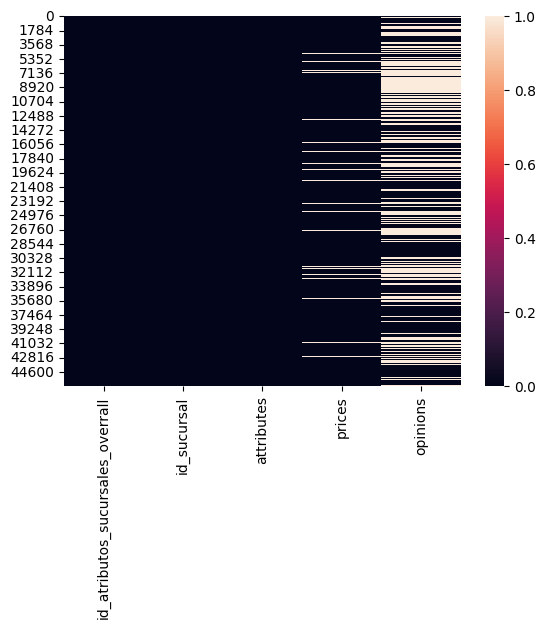

In [92]:
sns.heatmap(atributos_sucursales_df.isnull())

Podemos notar que hay incluso sucursales que NO tiene precios. Revisemos más a profundidad

In [93]:
# Obtenemos los IDs de estas sucursales
id_sucursales_no_precios =atributos_sucursales_df[atributos_sucursales_df["prices"].isnull()].id_sucursal
# Ahora revisamos sus urls con la ayuda del sucursales_df
sucursales_df.loc[id_sucursales_no_precios,:].url_sucursal

Revisando los links me pude llegar a notar que SÍ tienen precios. Debe a ver sido por un error de sistema. Procedemos a reemplazarlos

In [39]:
def just_prices(url_sucursal):
    try:
        sucursal_requests_r = requests.get(url_sucursal)
        # Revisamos su status
        r_url_status(sucursal_requests_r)
    except:
        try:
            #Intentemos denuevo
            sucursal_requests_r = requests.get(url_sucursal)
            # Revisamos su status
            r_url_status(sucursal_requests_r)
        except:
            print(f"Hubo un problema al ingresar a la url {url_sucursal_elegida}")
            print(id_sucursal)
    # Obtenemos la sopa
    sucursal_soup = BeautifulSoup(sucursal_requests_r.text, 'lxml')
    prices = get_prices_all_products(sucursal_soup)
    print("Precio obtenido")
    return prices

In [111]:
# Aplicamos multiprocessing para acelerar el proceso
sucursales_no_precios = sucursales_df.loc[id_sucursales_no_precios,:].url_sucursal

with concurrent.futures.ProcessPoolExecutor() as executor:
    results = executor.map(just_prices, sucursales_no_precios)

No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
No problem
No problem
Precio obtenidoPrecio obtenido

Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
N

Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obten

No problem
No problem
Precio obtenido
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
P

No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenidoPrecio obtenido

No problem
Precio obtenido
No problem
Precio obtenido
N

Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
Precio obtenido
No problem
No problemPrecio obtenido

Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
No problem
Precio obtenido
No problem
Precio obtenido
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
P

Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
Precio obtenido
No problem
P

In [117]:
# Ahora enlistamos estos precios
p = list(results)
# Chequamos que las longitudes de ambas listas esten okey
len(p)

2876

In [146]:
# Arremos un replace rapido de las sucursales sin precios con los precios encontrado
# Nota: Cuidado. Esto esta deprecated
atributos_sucursales_df.loc[id_sucursales_no_precios.index,"prices"] = p

/home/aguerta/Desktop/portfolio/rappi_tengo_miedo/venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3156: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


<AxesSubplot: >

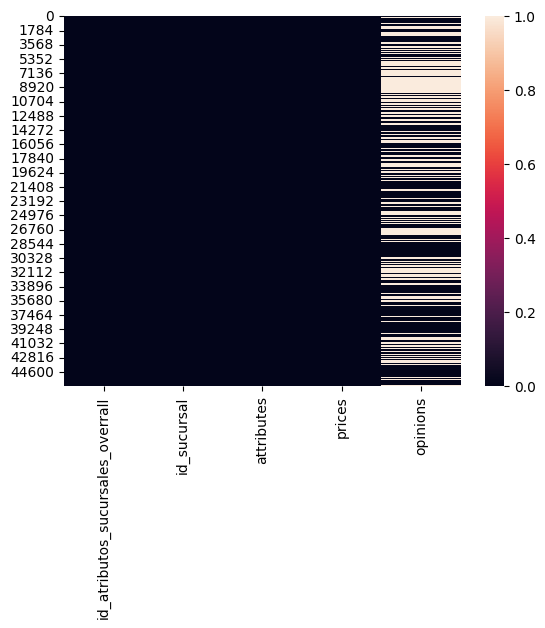

In [148]:
# Volvamos a revisar nuestro gráfico de nulos
sns.heatmap(atributos_sucursales_df.isnull())

Perfecto. Los precios faltantes están rellenados. Ahora hay que resolver estos nulos en opinions.
.
En este caso en concreto decidí cambiar los NaNs por "[("Sin opiniones", "100%")]". Ya que de esta forma mantiene la misma estructura que los otros restaurantes. Aparte creo una nueva columna que indica si este restaurante mostraba opiniones o no

In [162]:
atributos_sucursales_df["mostraba_opiniones"] = atributos_sucursales_df["opinions"].apply(
                                        lambda x: 1 if type(x) is list
                                                else 0)

In [164]:
atributos_sucursales_df["opinions"] = atributos_sucursales_df["opinions"].apply(
                                        lambda x: x if type(x) is list
                                                else [("Sin opiniones", "100%")])

<AxesSubplot: >

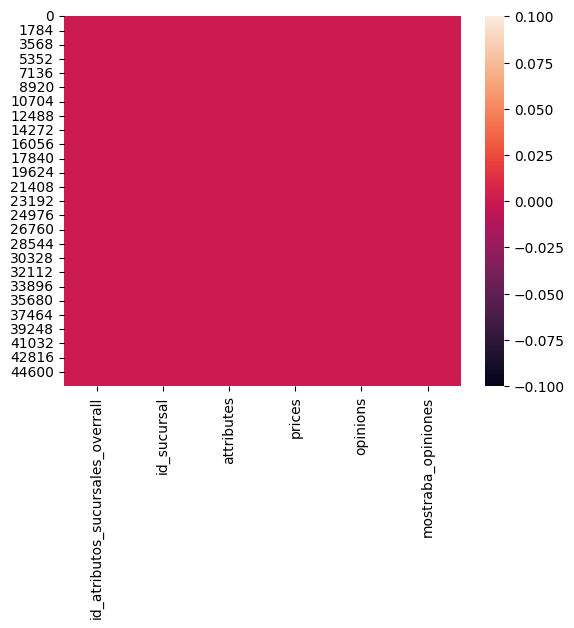

In [166]:
# Chequeamos por última vez
sns.heatmap(atributos_sucursales_df.isnull())

In [167]:
# Guardamos este DF hermoso
atributos_sucursales_df.to_csv("atributos_sucursales_df.csv", index=False)

# La última batalla. Parseando atributos y normalizando opiniones

Esta es la parte donde más craneo debes meter si no estás acostumbrado a crear tablas relacionales desde Python. Pero tranquilo, respira, y di conmigo: "Amaré a Python aunque aparezcan 1000 excepciones".
Este es el plan:
1) A la columna atributos la separaremos en 4 columnas: overral_stars, number_opinions, delivery_time, tipo_de_envio.
2) A la columna prices la reduciremos a overall_price_usd. Para esto deberemos convertir cada moneda de cada país a doláres.
3) A la columna opinions la normalizaremos en 3 tablas: pivot_tb, text_opinion_tb y percent_tb.
---
Esta más decir que limpiaremos y reemplazaremos muchos NaNs en el camino. Así que: "THIS IS PYTHON"

### 1. Parseando attributes

In [175]:
# Creamos las columnas en base al índice de los attributes
nuevas_columnas = ["overral_stars", "number_opinions", "tiempo_delivery", "tipo_envio"]

for i, column in enumerate(nuevas_columnas):
    atributos_sucursales_df[column] = atributos_sucursales_df["attributes"].apply(
                                                                                lambda x: x[i]
                                                                                )
# Eliminamos la vieja columna
atributos_sucursales_df.drop(["attributes"], axis=1, inplace=True)

In [180]:
# Ahora reemplazamos los NaNs por valores con más sentido para cada caso
valores_reemplazo_nans = [0.0, # Como en Rappi la mínima calificación es 1. Es intuitivo decir que 0 significa sin opinión 
                          0, # Sin opiniones o 0 opiniones
                         "No específicado",
                         "No específicado"]
for i, column in enumerate(nuevas_columnas):
    atributos_sucursales_df[column] = atributos_sucursales_df[column].replace(
                                                                                {'nan': valores_reemplazo_nans[i]}
                                                                                )

In [ ]:
# Chequeamos que valores tiene esta columna
atributos_sucursales_df["tipo_envio"].unique()

In [ ]:
# Reemplazamos los valores en portugués por español
atributos_sucursales_df["tipo_envio"] = atributos_sucursales_df["tipo_envio"].apply(lambda x:
                                                                                'Gratis(nuevos usuarios)'
                                                                                   if x == "Grátis(novos usuários)"
                                                                                   else x)

In [186]:
# Guardamos este DF hermoso
atributos_sucursales_df.to_csv("atributos_sucursales_df.csv", index=False)

Serían interesante ver si podríamos crear columnas de tiempo_mínimo_delivery y tiempo_máximo_delivery. Pero lo no lo haré, por ahora.

### 2. Reduciendo prices

Cada país tiene una manera única de representar centavos. En Perú los centavos son después del punto, en México es después de las ",". Las mismas diferencias se ven en los demás países

In [55]:
atributos_sucursales_df = pd.read_csv("atributos_sucursales_df.csv")

In [56]:
atributos_sucursales_df["opinions"] = atributos_sucursales_df["opinions"].apply(eval)
atributos_sucursales_df["prices"] = atributos_sucursales_df["prices"].apply(eval)

In [57]:
# Chequeamos como son los valores de la columna "prices"
atributos_sucursales_df["prices"] 

0        [$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...
1        [$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...
2        [$ 700,00, $ 1.980,00, $ 1.980,00, $ 2.250,00,...
3        [$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...
4        [$ 2.420,00, $ 1.650,00, $ 1.700,00, $ 1.760,0...
                               ...                        
46353    [$ 123.50, $ 169.00, $ 143.00, $ 123.50, $ 123...
46354    [$ 35.00, $ 46.00, $ 46.00, $ 23.00, $ 20.00, ...
46355    [$ 146.15, $ 159.10, $ 146.15, $ 146.15, $ 140...
46356    [$ 228.00, $ 198.00, $ 202.00, $ 202.00, $ 192...
46357    [$ 160.00, $ 170.00, $ 212.00, $ 165.00, $ 240...
Name: prices, Length: 46358, dtype: object

Anteriormente ejecutaría el siguiente código de frente. Pero como (Aunque pareza extraño) existen valores en prices que son nulos, debemos de averiguar mejor eso ya que podría ser que algunas tiendas desactivaron y volvieron a activar sus precios

In [58]:
# Revisamos cuantas sucursales sus precios son NaNs
sucursales_id_precios_null = atributos_sucursales_df[atributos_sucursales_df["prices"].isnull()].id_sucursal
len(sucursales_id_precios_null)

0

In [59]:
# Ahora revisamos sus urls con la ayuda del sucursales_df
sucursales_no_precios = sucursales_df.loc[sucursales_id_precios_null,:].url_sucursal
sucursales_no_precios

Series([], Name: url_sucursal, dtype: object)

Aquí me doy cuenta de 3 casos:
1) De pronto o no se obtuvieron sus precios o la sucursal los desactivó momentaneamente.
2) La sucursal ya no aparece disponible en Rappi.
3) La sucursal no tiene productos disponibles en ese momento.

Con esto en mente encontraré la mayor cantidad de precios para el caso 1. Para los otros casos se catalogaran como nulos defrente.

In [60]:
# Aplicamos multiprocessing para acelerar el proceso
with concurrent.futures.ProcessPoolExecutor() as executor:
    results = executor.map(just_prices, sucursales_no_precios)

In [41]:
# Ahora enlistamos estos precios
p = list(results)
# Arremos un replace rapido de las sucursales sin precios con los precios encontrado
# Nota: Cuidado. Esto esta deprecated
atributos_sucursales_df.loc[sucursales_id_precios_null.index,"prices"] = p

/home/aguerta/Desktop/portfolio/rappi_tengo_miedo/venv/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3156: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


In [61]:
# Chequeamos si quedan nulos
sucursales_id_precios_null = atributos_sucursales_df[atributos_sucursales_df["prices"].isnull()].id_sucursal
sucursales_id_precios_null

Series([], Name: id_sucursal, dtype: int64)

Al parecer ninguno.

In [62]:
# Ahora si reemplazamos las listas vacías por 0 (Hací evitamos problemas con Power Bi)
# NO debería de arrojar ninguna excepción.
atributos_sucursales_df["prices"] = atributos_sucursales_df["prices"].apply(
                                        lambda x: [0] if x == []
                                                else x)

In [63]:
# Ahora si reemplazamos las listas vacías por 0 (Hací evitamos problemas con Power Bi)
# NO debería de arrojar ninguna excepción.
atributos_sucursales_df["first_price"] = atributos_sucursales_df["prices"].apply(
                                        lambda x: x[0])

In [64]:
atributos_sucursales_df[atributos_sucursales_df["first_price"] == 0]

,id_atributos_sucursales_overrall,id_sucursal,prices,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,first_price
1803,1803,1803,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Gratis(nuevos usuarios),0
1819,1819,1819,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Gratis(nuevos usuarios),0
1828,1828,1828,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Gratis(nuevos usuarios),0
2197,2197,2197,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Gratis(nuevos usuarios),0
4085,4085,4085,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Gratis(nuevos usuarios),0
4463,4463,4463,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,No específicado,0
4875,4875,4875,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,No específicado,0
4969,4969,4969,[0],"[(Sin opiniones, 100%)]",0,4.7,64,No específicado,Gratis(nuevos usuarios),0
5280,5301,5280,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,No específicado,0
7414,7415,7414,[0],"[(Sin opiniones, 100%)]",0,0.0,0,No específicado,Grátis(novos usuários),0


In [189]:
sucursales_df.head(3)

,id_sucursal,url_sucursal,nombre_sucursal,direccion_sucursal,id_cadena
0,0,https://www.rappi.com.ar/restaurantes/117822-b...,Burgertify - DK Belgrano,"La Pampa 2513, C1428 CABA, Argentina",0
1,1,https://www.rappi.com.ar/restaurantes/114252-b...,Burgertify - Honduras,Honduras 5265,0
2,2,https://www.rappi.com.ar/restaurantes/117823-b...,Burgertify - DK Caballito,Ambrosetti 334,0


In [ ]:
{
    0:#8.999,00 son 8999.00 #1
    1:#R$ 39,90 son 39.90 #1
    2:#7.000 son 7000.00 pesos # son pesos chilenos #2
    3:#$ 10.500 son 10500.00 pesos colombianos #2
    4: # ₡ 5 490,00 son 5490.00 costa rica #1
    5:# Ecuador son dolares. 17,99 = 17,99 #1
    6:# 125.00 son 125.00 pesos mexicanos #1
    7:# S/12.5 son 12.5 #1
    8: # 329,00 son 329.00 pesos #1
}

In [248]:
atributos_sucursales_df.loc[0,:]

id_sucursal                                                              0
prices                   [$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...
opinions                 [(Calidad de la comida, 33%), (Justo lo que pe...
mostraba_opiniones                                                       1
overral_stars                                                          4.1
number_opinions                                                        332
tiempo_delivery                                                42 - 57 min
tipo_envio                                         Gratis(nuevos usuarios)
first_price                                                     $ 1.980,00
id_pais                                                                  0
1000_dollars_exchange                                            1676508.0
Name: 0, dtype: object

In [235]:
atributos_sucursales_df.head(1)

,id_sucursal,prices,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,first_price,id_pais,1000_dollars_exchange
0,0,"[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 33%), (Justo lo que pe...",1,4.1,332,42 - 57 min,Gratis(nuevos usuarios),"$ 1.980,00",0,1676508.0


In [289]:
def currency_parser(list_currency_as_string, id_pais):
    new_parsed_list = []
    for currency in list_currency_as_string:
        if currency == 0:
            result = float(currency)
            #print(f'{currency} convertido a {result}')
            new_parsed_list.append(result)
        # x is in this form '$ 1.980,00'
        else:
            p = re.sub('[$] |[A-Z]|[₡]|[S/]|', '', currency) # '1.980,00'
            y = re.split("[.]|[,]|[\s]", p) # ['1', '980', '00']
            z = ''.join(y[:-1]) # '1980'
            z = z + '.' + y[-1] # '1980.00'
            result = float(z) # 1980.0
            if id_pais in [2,3]: #Osea sea Chile o Colombia 
                z = ''.join(y)
                z = z + '.00'
                result = float(z)
                #print(f'{currency} convertido a {result}')
                new_parsed_list.append(result)
            else:
                #print(f'{currency} convertido a {result}')
                new_parsed_list.append(result)
    return new_parsed_list

In [309]:
def price_to_dollar_for_df(row_dataframe):
    pais = row_dataframe.id_pais
    list_prices = row_dataframe.prices
    dollar_change = row_dataframe["1000_dollars_exchange"] / 10000
    
    list_prices_parsed = currency_parser(list_prices, pais)
    
    x = np.array(list_prices_parsed)
    
    #print(list_prices_parsed)
    promedio_precios = x.mean()
    
    y = (promedio_precios / dollar_change)

    z = round(y,2)
    print(f'{dollar_change} --- {promedio_precios} ---- {z}')
    
    return z

In [310]:
atributos_sucursales_df["dollar_mean_price"] = atributos_sucursales_df.apply(lambda x: price_to_dollar_for_df(x), axis=1)

167.6508 --- 1441.433962264151 ---- 8.6
167.6508 --- 1414.7222222222222 ---- 8.44
167.6508 --- 1360.75 ---- 8.12
167.6508 --- 1443.3653846153845 ---- 8.61
167.6508 --- 1592.5 ---- 9.5
167.6508 --- 1275.4878048780488 ---- 7.61
167.6508 --- 1275.4878048780488 ---- 7.61
167.6508 --- 1273.375 ---- 7.6
167.6508 --- 1027.2972972972973 ---- 6.13
167.6508 --- 1203.75 ---- 7.18
167.6508 --- 1506.611111111111 ---- 8.99
167.6508 --- 1268.3292682926829 ---- 7.57
167.6508 --- 1268.3292682926829 ---- 7.57
167.6508 --- 1268.3292682926829 ---- 7.57
167.6508 --- 1257.1666666666667 ---- 7.5
167.6508 --- 1243.0348837209303 ---- 7.41
167.6508 --- 1218.030303030303 ---- 7.27
167.6508 --- 1141.7241379310344 ---- 6.81
167.6508 --- 1156.5116279069769 ---- 6.9
167.6508 --- 1337.0 ---- 7.97
167.6508 --- 2108.75 ---- 12.58
167.6508 --- 1118.4375 ---- 6.67
167.6508 --- 1505.0 ---- 8.98
167.6508 --- 2266.521739130435 ---- 13.52
167.6508 --- 2246.5384615384614 ---- 13.4
167.6508 --- 2246.5384615384614 ---- 13.4
167

167.6508 --- 2224.1935483870966 ---- 13.27
167.6508 --- 1836.40625 ---- 10.95
167.6508 --- 1461.40625 ---- 8.72
167.6508 --- 1111.25 ---- 6.63
167.6508 --- 719.7619047619048 ---- 4.29
167.6508 --- 358.3333333333333 ---- 2.14
167.6508 --- 374.54545454545456 ---- 2.23
167.6508 --- 2022.4137931034484 ---- 12.06
167.6508 --- 730.3225806451613 ---- 4.36
167.6508 --- 524.0909090909091 ---- 3.13
167.6508 --- 601.8181818181819 ---- 3.59
167.6508 --- 2413.815789473684 ---- 14.4
167.6508 --- 1951.90625 ---- 11.64
167.6508 --- 2162.2413793103447 ---- 12.9
167.6508 --- 725.1851851851852 ---- 4.33
167.6508 --- 2768.9814814814813 ---- 16.52
167.6508 --- 1939.1304347826087 ---- 11.57
167.6508 --- 1507.0 ---- 8.99
167.6508 --- 861.1111111111111 ---- 5.14
167.6508 --- 1290.597014925373 ---- 7.7
167.6508 --- 1162.0806451612902 ---- 6.93
167.6508 --- 1197.6785714285713 ---- 7.14
167.6508 --- 1118.3333333333333 ---- 6.67
167.6508 --- 823.3333333333334 ---- 4.91
167.6508 --- 1526.530612244898 ---- 9.11
167

167.6508 --- 994.6511627906976 ---- 5.93
167.6508 --- 1499.0 ---- 8.94
167.6508 --- 1315.144927536232 ---- 7.84
167.6508 --- 1480.8450704225352 ---- 8.83
167.6508 --- 1496.231884057971 ---- 8.92
167.6508 --- 1471.060606060606 ---- 8.77
167.6508 --- 1408.4415584415585 ---- 8.4
167.6508 --- 1375.0 ---- 8.2
167.6508 --- 1527.3508771929824 ---- 9.11
167.6508 --- 1420.3333333333333 ---- 8.47
167.6508 --- 1404.375 ---- 8.38
167.6508 --- 1315.144927536232 ---- 7.84
167.6508 --- 1632.7777777777778 ---- 9.74
167.6508 --- 2580.576923076923 ---- 15.39
167.6508 --- 2490.740740740741 ---- 14.86
167.6508 --- 2511.7741935483873 ---- 14.98
167.6508 --- 2378.6206896551726 ---- 14.19
167.6508 --- 2521.730769230769 ---- 15.04
167.6508 --- 2378.6206896551726 ---- 14.19
167.6508 --- 2454.4117647058824 ---- 14.64
167.6508 --- 2396.1428571428573 ---- 14.29
167.6508 --- 2378.6206896551726 ---- 14.19
167.6508 --- 2078.75 ---- 12.4
167.6508 --- 670.989010989011 ---- 4.0
167.6508 --- 662.4691358024692 ---- 3.95


167.6508 --- 1723.865671641791 ---- 10.28
167.6508 --- 1976.3207547169811 ---- 11.79
167.6508 --- 2035.8085106382978 ---- 12.14
167.6508 --- 1728.835616438356 ---- 10.31
167.6508 --- 1731.7532467532467 ---- 10.33
167.6508 --- 1745.6666666666667 ---- 10.41
167.6508 --- 1954.8103448275863 ---- 11.66
167.6508 --- 1709.7272727272727 ---- 10.2
167.6508 --- 1918.4920634920634 ---- 11.44
167.6508 --- 1925.537037037037 ---- 11.49
167.6508 --- 1779.453125 ---- 10.61
167.6508 --- 1893.1 ---- 11.29
167.6508 --- 1699.9868421052631 ---- 10.14
167.6508 --- 2301.457142857143 ---- 13.73
167.6508 --- 1731.7532467532467 ---- 10.33
167.6508 --- 1778.5714285714287 ---- 10.61
167.6508 --- 1366.1904761904761 ---- 8.15
167.6508 --- 1536.6666666666667 ---- 9.17
167.6508 --- 1994.7706422018348 ---- 11.9
167.6508 --- 1851.0 ---- 11.04
167.6508 --- 2305.0 ---- 13.75
167.6508 --- 9658.551724137931 ---- 57.61
167.6508 --- 6961.325581395349 ---- 41.52
167.6508 --- 1289.3333333333333 ---- 7.69
167.6508 --- 1387.6 --

167.6508 --- 966.0 ---- 5.76
167.6508 --- 475.42857142857144 ---- 2.84
167.6508 --- 603.3333333333334 ---- 3.6
167.6508 --- 825.0 ---- 4.92
167.6508 --- 604.9229411764707 ---- 3.61
167.6508 --- 235.45454545454547 ---- 1.4
167.6508 --- 948.421052631579 ---- 5.66
167.6508 --- 1042.837837837838 ---- 6.22
167.6508 --- 1367.8204081632655 ---- 8.16
167.6508 --- 1314.4982758620688 ---- 7.84
167.6508 --- 1038.5043478260868 ---- 6.19
167.6508 --- 1080.4145833333334 ---- 6.44
167.6508 --- 1735.2708333333333 ---- 10.35
167.6508 --- 2828.904761904762 ---- 16.87
167.6508 --- 832.6470588235294 ---- 4.97
167.6508 --- 1032.8735632183907 ---- 6.16
167.6508 --- 1032.8735632183907 ---- 6.16
167.6508 --- 1071.1267605633802 ---- 6.39
167.6508 --- 1051.5584415584415 ---- 6.27
167.6508 --- 1056.849315068493 ---- 6.3
167.6508 --- 1160.0 ---- 6.92
167.6508 --- 1115.15625 ---- 6.65
167.6508 --- 1017.945205479452 ---- 6.07
167.6508 --- 1032.8735632183907 ---- 6.16
167.6508 --- 1041.6279069767443 ---- 6.21
167.65

5.2195 --- 61.33985074626867 ---- 11.75
5.2195 --- 18.365238095238094 ---- 3.52
5.2195 --- 26.475 ---- 5.07
5.2195 --- 38.43454545454546 ---- 7.36
5.2195 --- 37.15 ---- 7.12
5.2195 --- 34.83606557377049 ---- 6.67
5.2195 --- 28.85 ---- 5.53
5.2195 --- 28.551190476190474 ---- 5.47
5.2195 --- 45.84285714285714 ---- 8.78
5.2195 --- 62.18095238095238 ---- 11.91
5.2195 --- 35.455833333333324 ---- 6.79
5.2195 --- 26.256875 ---- 5.03
5.2195 --- 23.52769230769231 ---- 4.51
5.2195 --- 103.52380952380952 ---- 19.83
5.2195 --- 42.528301886792455 ---- 8.15
5.2195 --- 38.01677083333333 ---- 7.28
5.2195 --- 41.8603125 ---- 8.02
5.2195 --- 43.56835616438356 ---- 8.35
5.2195 --- 41.35180722891566 ---- 7.92
5.2195 --- 16.324257425742573 ---- 3.13
5.2195 --- 16.324257425742573 ---- 3.13
5.2195 --- 50.637846153846155 ---- 9.7
5.2195 --- 66.11824175824174 ---- 12.67
5.2195 --- 64.90628865979379 ---- 12.44
5.2195 --- 45.25 ---- 8.67
5.2195 --- 14.592647058823529 ---- 2.8
5.2195 --- 22.583333333333332 ---- 4

5.2195 --- 33.69512195121951 ---- 6.46
5.2195 --- 37.73376623376623 ---- 7.23
5.2195 --- 31.69220779220779 ---- 6.07
5.2195 --- 37.60933333333333 ---- 7.21
5.2195 --- 35.68578313253012 ---- 6.84
5.2195 --- 35.06388888888889 ---- 6.72
5.2195 --- 31.228571428571428 ---- 5.98
5.2195 --- 37.87704918032787 ---- 7.26
5.2195 --- 35.24366197183099 ---- 6.75
5.2195 --- 33.62753623188406 ---- 6.44
5.2195 --- 33.30933333333333 ---- 6.38
5.2195 --- 32.328378378378375 ---- 6.19
5.2195 --- 34.160000000000004 ---- 6.54
5.2195 --- 30.415384615384614 ---- 5.83
5.2195 --- 32.22040816326531 ---- 6.17
5.2195 --- 33.09178082191781 ---- 6.34
5.2195 --- 31.278333333333332 ---- 5.99
5.2195 --- 36.72944444444445 ---- 7.04
5.2195 --- 37.15374999999999 ---- 7.12
5.2195 --- 33.464705882352945 ---- 6.41
5.2195 --- 32.7830985915493 ---- 6.28
5.2195 --- 33.16385542168675 ---- 6.35
5.2195 --- 35.34069767441861 ---- 6.77
5.2195 --- 36.15949367088607 ---- 6.93
5.2195 --- 33.485416666666666 ---- 6.42
5.2195 --- 33.80151

5.2195 --- 31.475806451612904 ---- 6.03
5.2195 --- 35.11749999999999 ---- 6.73
5.2195 --- 36.92142857142857 ---- 7.07
5.2195 --- 28.964285714285715 ---- 5.55
5.2195 --- 32.93214285714285 ---- 6.31
5.2195 --- 32.15 ---- 6.16
5.2195 --- 32.93214285714285 ---- 6.31
5.2195 --- 22.690140845070424 ---- 4.35
5.2195 --- 30.867857142857137 ---- 5.91
5.2195 --- 48.871725490196084 ---- 9.36
5.2195 --- 23.462244897959184 ---- 4.5
5.2195 --- 21.128235294117655 ---- 4.05
5.2195 --- 6.656666666666667 ---- 1.28
5.2195 --- 34.751041666666666 ---- 6.66
5.2195 --- 22.164622641509432 ---- 4.25
5.2195 --- 11.508333333333333 ---- 2.2
5.2195 --- 17.21875 ---- 3.3
5.2195 --- 15.630508474576272 ---- 2.99
5.2195 --- 24.861160714285713 ---- 4.76
5.2195 --- 59.797872340425535 ---- 11.46
5.2195 --- 11.508333333333333 ---- 2.2
5.2195 --- 59.797872340425535 ---- 11.46
5.2195 --- 32.30211267605634 ---- 6.19
5.2195 --- 47.81976744186046 ---- 9.16
5.2195 --- 9.685714285714287 ---- 1.86
5.2195 --- 49.192105263157885 ---

5.2195 --- 21.514642857142857 ---- 4.12
5.2195 --- 17.99909090909091 ---- 3.45
5.2195 --- 58.46153846153846 ---- 11.2
5.2195 --- 54.38709677419355 ---- 10.42
5.2195 --- 69.144 ---- 13.25
5.2195 --- 15.874499999999996 ---- 3.04
5.2195 --- 30.19333333333333 ---- 5.78
5.2195 --- 41.28030303030303 ---- 7.91
5.2195 --- 19.93548387096774 ---- 3.82
5.2195 --- 38.72202898550726 ---- 7.42
5.2195 --- 40.88225 ---- 7.83
5.2195 --- 25.816190476190474 ---- 4.95
5.2195 --- 20.59444444444444 ---- 3.95
5.2195 --- 25.816190476190474 ---- 4.95
5.2195 --- 46.989411764705885 ---- 9.0
5.2195 --- 28.58928571428572 ---- 5.48
5.2195 --- 35.5 ---- 6.8
5.2195 --- 21.237777777777776 ---- 4.07
5.2195 --- 60.416666666666664 ---- 11.58
5.2195 --- 9.808823529411763 ---- 1.88
5.2195 --- 26.966046511627912 ---- 5.17
5.2195 --- 36.92972972972973 ---- 7.08
5.2195 --- 30.886363636363637 ---- 5.92
5.2195 --- 53.24439655172414 ---- 10.2
5.2195 --- 52.03762886597937 ---- 9.97
5.2195 --- 50.44249999999999 ---- 9.66
5.2195 --

5.2195 --- 34.82422222222221 ---- 6.67
5.2195 --- 53.44057971014494 ---- 10.24
5.2195 --- 28.14257894736842 ---- 5.39
5.2195 --- 31.218604651162792 ---- 5.98
5.2195 --- 63.38924999999999 ---- 12.14
5.2195 --- 16.054545454545455 ---- 3.08
5.2195 --- 53.44057971014494 ---- 10.24
5.2195 --- 24.223809523809525 ---- 4.64
5.2195 --- 20.396190476190476 ---- 3.91
5.2195 --- 63.38924999999999 ---- 12.14
5.2195 --- 24.066666666666663 ---- 4.61
5.2195 --- 52.34827160493827 ---- 10.03
5.2195 --- 22.204705882352943 ---- 4.25
5.2195 --- 24.749375 ---- 4.74
5.2195 --- 16.697777777777777 ---- 3.2
5.2195 --- 21.459999999999994 ---- 4.11
5.2195 --- 30.65945945945947 ---- 5.87
5.2195 --- 28.227941176470587 ---- 5.41
5.2195 --- 24.749375 ---- 4.74
5.2195 --- 28.227941176470587 ---- 5.41
5.2195 --- 28.8734375 ---- 5.53
5.2195 --- 29.227419354838705 ---- 5.6
5.2195 --- 27.93285714285714 ---- 5.35
5.2195 --- 29.387931034482754 ---- 5.63
5.2195 --- 32.1025 ---- 6.15
5.2195 --- 29.508928571428566 ---- 5.65
5.2

883.5 --- 6723.207792207792 ---- 7.61
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 7585.909090909091 ---- 8.59
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6531.115942028986 ---- 7.39
883.5 --- 6632.876712328767 ---- 7.51
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6732.391891891892 ---- 7.62
883.5 --- 6871.910714285715 ---- 7.78
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6558.152777777777 ---- 7.42
883.5 --- 7418.716216216216 ---- 8.4
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 7850.34 ---- 8.89
883.5 --- 7736.283783783784 ---- 8.76
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6317.706896551724 ---- 7.15
883.5 --- 6347.9324324324325 ---- 7.18
883.5 --- 6298.626666666667 ---- 7.13
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 6690.7307692307695 ---- 7.57
883.5 --- 5564.0625 ---- 6.3
883.5 --- 11047.213114754099 ---- 12.5
883.5 --- 11036.516

883.5 --- 6842.0 ---- 7.74
883.5 --- 7174.933333333333 ---- 8.12
883.5 --- 8262.765957446809 ---- 9.35
883.5 --- 4015.9333333333334 ---- 4.55
883.5 --- 5368.275862068966 ---- 6.08
883.5 --- 7174.933333333333 ---- 8.12
883.5 --- 8674.25 ---- 9.82
883.5 --- 7755.185185185185 ---- 8.78
883.5 --- 14622.864583333334 ---- 16.55
883.5 --- 14308.64705882353 ---- 16.2
883.5 --- 5967.5 ---- 6.75
883.5 --- 5967.5 ---- 6.75
883.5 --- 5967.5 ---- 6.75
883.5 --- 5967.5 ---- 6.75
883.5 --- 6375.0 ---- 7.22
883.5 --- 6375.0 ---- 7.22
883.5 --- 5877.0 ---- 6.65
883.5 --- 5877.0 ---- 6.65
883.5 --- 5735.5 ---- 6.49
883.5 --- 5877.0 ---- 6.65
883.5 --- 6197.130434782609 ---- 7.01
883.5 --- 6197.130434782609 ---- 7.01
883.5 --- 3587.4757281553398 ---- 4.06
883.5 --- 3099.1139240506327 ---- 3.51
883.5 --- 14838.461538461539 ---- 16.8
883.5 --- 5500.0 ---- 6.23
883.5 --- 7183.846153846154 ---- 8.13
883.5 --- 7240.434782608696 ---- 8.2
883.5 --- 10377.551020408164 ---- 11.75
883.5 --- 10377.551020408164 ----

883.5 --- 7590.598290598291 ---- 8.59
883.5 --- 7101.869158878505 ---- 8.04
883.5 --- 7735.897435897436 ---- 8.76
883.5 --- 7678.0373831775705 ---- 8.69
883.5 --- 7735.897435897436 ---- 8.76
883.5 --- 7735.897435897436 ---- 8.76
883.5 --- 7472.641509433963 ---- 8.46
883.5 --- 7472.641509433963 ---- 8.46
883.5 --- 7507.142857142857 ---- 8.5
883.5 --- 7590.598290598291 ---- 8.59
883.5 --- 7840.0 ---- 8.87
883.5 --- 7472.641509433963 ---- 8.46
883.5 --- 5833.854166666667 ---- 6.6
883.5 --- 7592.424242424242 ---- 8.59
883.5 --- 7671.568627450981 ---- 8.68
883.5 --- 7735.897435897436 ---- 8.76
883.5 --- 7892.543859649123 ---- 8.93
883.5 --- 7793.333333333333 ---- 8.82
883.5 --- 7829.166666666667 ---- 8.86
883.5 --- 7980.0 ---- 9.03
883.5 --- 7792.672413793103 ---- 8.82
883.5 --- 7678.0373831775705 ---- 8.69
883.5 --- 7523.333333333333 ---- 8.52
883.5 --- 7712.735849056604 ---- 8.73
883.5 --- 7837.878787878788 ---- 8.87
883.5 --- 7472.641509433963 ---- 8.46
883.5 --- 7805.392156862745 ---- 8

4768.07 --- 20914.634146341465 ---- 4.39
4768.07 --- 23000.0 ---- 4.82
4768.07 --- 27349.20634920635 ---- 5.74
4768.07 --- 25523.4375 ---- 5.35
4768.07 --- 11000.0 ---- 2.31
4768.07 --- 14415.217391304348 ---- 3.02
4768.07 --- 15174.0 ---- 3.18
4768.07 --- 14668.888888888889 ---- 3.08
4768.07 --- 16360.63829787234 ---- 3.43
4768.07 --- 16360.63829787234 ---- 3.43
4768.07 --- 13443.181818181818 ---- 2.82
4768.07 --- 13309.302325581395 ---- 2.79
4768.07 --- 22130.76923076923 ---- 4.64
4768.07 --- 15174.0 ---- 3.18
4768.07 --- 11836.538461538461 ---- 2.48
4768.07 --- 14758.727272727272 ---- 3.1
4768.07 --- 20968.571428571428 ---- 4.4
4768.07 --- 19340.277777777777 ---- 4.06
4768.07 --- 26327.58620689655 ---- 5.52
4768.07 --- 26183.333333333332 ---- 5.49
4768.07 --- 14826.785714285714 ---- 3.11
4768.07 --- 9972.222222222223 ---- 2.09
4768.07 --- 15509.23076923077 ---- 3.25
4768.07 --- 15948.095238095239 ---- 3.34
4768.07 --- 16254.426229508197 ---- 3.41
4768.07 --- 15450.75 ---- 3.24
4768.

4768.07 --- 12336.928057553956 ---- 2.59
4768.07 --- 11556.5 ---- 2.42
4768.07 --- 10572.363636363636 ---- 2.22
4768.07 --- 9659.987951807228 ---- 2.03
4768.07 --- 17332.14285714286 ---- 3.64
4768.07 --- 20541.02564102564 ---- 4.31
4768.07 --- 12660.625 ---- 2.66
4768.07 --- 41688.88888888889 ---- 8.74
4768.07 --- 38720.0 ---- 8.12
4768.07 --- 38720.0 ---- 8.12
4768.07 --- 12975.879310344828 ---- 2.72
4768.07 --- 24716.666666666668 ---- 5.18
4768.07 --- 24582.38888888889 ---- 5.16
4768.07 --- 27831.36842105263 ---- 5.84
4768.07 --- 24797.058823529413 ---- 5.2
4768.07 --- 14418.253968253968 ---- 3.02
4768.07 --- 17368.42105263158 ---- 3.64
4768.07 --- 32462.85714285714 ---- 6.81
4768.07 --- 12725.714285714286 ---- 2.67
4768.07 --- 10406.25 ---- 2.18
4768.07 --- 13332.5 ---- 2.8
4768.07 --- 19029.090909090908 ---- 3.99
4768.07 --- 13121.875 ---- 2.75
4768.07 --- 13779.48717948718 ---- 2.89
4768.07 --- 18271.428571428572 ---- 3.83
4768.07 --- 18271.428571428572 ---- 3.83
4768.07 --- 16993

4768.07 --- 26750.384615384617 ---- 5.61
4768.07 --- 23297.36842105263 ---- 4.89
4768.07 --- 17070.27027027027 ---- 3.58
4768.07 --- 16388.88888888889 ---- 3.44
4768.07 --- 21104.761904761905 ---- 4.43
4768.07 --- 36789.47368421053 ---- 7.72
4768.07 --- 16778.18181818182 ---- 3.52
4768.07 --- 25509.090909090908 ---- 5.35
4768.07 --- 25688.88888888889 ---- 5.39
4768.07 --- 14162.790697674418 ---- 2.97
4768.07 --- 36181.818181818184 ---- 7.59
4768.07 --- 14627.586206896553 ---- 3.07
4768.07 --- 15525.714285714286 ---- 3.26
4768.07 --- 16874.285714285714 ---- 3.54
4768.07 --- 9115.272727272728 ---- 1.91
4768.07 --- 9193.333333333334 ---- 1.93
4768.07 --- 9541.052631578947 ---- 2.0
4768.07 --- 9190.612244897959 ---- 1.93
4768.07 --- 9350.74074074074 ---- 1.96
4768.07 --- 9540.727272727272 ---- 2.0
4768.07 --- 9115.272727272728 ---- 1.91
4768.07 --- 8969.25925925926 ---- 1.88
4768.07 --- 9294.0 ---- 1.95
4768.07 --- 9159.245283018869 ---- 1.92
4768.07 --- 9429.032258064517 ---- 1.98
4768.07

4768.07 --- 31072.340425531915 ---- 6.52
4768.07 --- 30315.816326530614 ---- 6.36
4768.07 --- 29949.479166666668 ---- 6.28
4768.07 --- 30747.872340425532 ---- 6.45
4768.07 --- 30158.947368421053 ---- 6.33
4768.07 --- 30216.751269035532 ---- 6.34
4768.07 --- 30189.005235602093 ---- 6.33
4768.07 --- 30216.751269035532 ---- 6.34
4768.07 --- 30216.751269035532 ---- 6.34
4768.07 --- 30658.549222797927 ---- 6.43
4768.07 --- 30610.98901098901 ---- 6.42
4768.07 --- 30725.520833333332 ---- 6.44
4768.07 --- 30779.166666666668 ---- 6.46
4768.07 --- 31173.79679144385 ---- 6.54
4768.07 --- 30354.358974358973 ---- 6.37
4768.07 --- 30319.38775510204 ---- 6.36
4768.07 --- 30419.48717948718 ---- 6.38
4768.07 --- 31072.340425531915 ---- 6.52
4768.07 --- 30330.61224489796 ---- 6.36
4768.07 --- 30315.816326530614 ---- 6.36
4768.07 --- 29960.51282051282 ---- 6.28
4768.07 --- 30138.095238095237 ---- 6.32
4768.07 --- 30324.48979591837 ---- 6.36
4768.07 --- 30319.38775510204 ---- 6.36
4768.07 --- 33144.680851

4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 14641.666666666666 ---- 3.07
4768.07 --- 15833.333333333334 ---- 3.32
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 12116.666666666666 ---- 2.54
4768.07 --- 12116.666666666666 ---- 2.54
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 12116.666666666666 ---- 2.54
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 11791.666666666666 ---- 2.47
4768.07 --- 12116.666666666666 ---- 2.54
4768.07 --- 14641.666666666666 ---- 3.07
4768.07 --- 10187.80487804878 ---- 2.14
4768.07 --- 24155.6338028169 ---- 5.07
4768.07 --- 24155.6338028169 ---- 5.07
4768.07 --- 24534.351145038167 ---- 5.15
4768.07 --- 15852.083333333334 ---- 3.32
4768.07 --- 24900.0 ---- 5.22
4768.07 --- 18893.103448275862 ---- 3.96
4768.07 --- 24439.444444444445 ---- 5.13
4768.07 --- 33101.69491525424 ---- 6.94
4768.07 --- 32922.22222222222 ---- 6.9
4768.07 --- 11791.666666666666 ----

4768.07 --- 16066.990291262136 ---- 3.37
4768.07 --- 16251.37614678899 ---- 3.41
4768.07 --- 15251.041666666666 ---- 3.2
4768.07 --- 16070.588235294117 ---- 3.37
4768.07 --- 14558.252427184467 ---- 3.05
4768.07 --- 15622.429906542056 ---- 3.28
4768.07 --- 15449.35064935065 ---- 3.24
4768.07 --- 15660.194174757282 ---- 3.28
4768.07 --- 16132.758620689656 ---- 3.38
4768.07 --- 16279.310344827587 ---- 3.41
4768.07 --- 15257.798165137614 ---- 3.2
4768.07 --- 15077.884615384615 ---- 3.16
4768.07 --- 16172.566371681416 ---- 3.39
4768.07 --- 18857.14285714286 ---- 3.95
4768.07 --- 16418.88888888889 ---- 3.44
4768.07 --- 18907.14285714286 ---- 3.97
4768.07 --- 19690.47619047619 ---- 4.13
4768.07 --- 19111.11111111111 ---- 4.01
4768.07 --- 39506.55737704918 ---- 8.29
4768.07 --- 4288.235294117647 ---- 0.9
4768.07 --- 19069.444444444445 ---- 4.0
4768.07 --- 18733.333333333332 ---- 3.93
4768.07 --- 27970.6993006993 ---- 5.87
4768.07 --- 27829.571428571428 ---- 5.84
4768.07 --- 26931.64 ---- 5.65


4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22732.743362831858 ---- 4.77
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 23400.869565217392 ---- 4.91
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22908.035714285714 ---- 4.8
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 23324.57627118644 ---- 4.89
4768.07 --- 23251.28205128205 ---- 4.88
4768.07 --- 22908.035714285714 ---- 4.8
4768.07 --- 22931.9587628866 ---- 4.81
4768.07 --- 22866.666666666668 ---- 4.8
4768.07 --- 22732.743362831858 ---- 4.77
4768.07 --- 22784.166666666668 ---- 4.78
4768.07 --- 23175.757575757576 ---- 4.86
4768.07 --- 22846.728971962617 ---- 4.79
4768.07 --- 23426.724137931036 ---- 4.91
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22784.166666666668 ---- 4.78
4768.07 --- 22732.743362831858 ---- 4.77
4768.07 --- 22842.97520661157 ---- 4.79
4768.07 --- 22748.305084745763 ---- 4.77
4768.07 --- 22985.833333333332 

4768.07 --- 15326.08695652174 ---- 3.21
4768.07 --- 31717.126436781607 ---- 6.65
4768.07 --- 35253.770491803276 ---- 7.39
4768.07 --- 24431.25 ---- 5.12
4768.07 --- 10980.0 ---- 2.3
4768.07 --- 18300.0 ---- 3.84
4768.07 --- 21956.140350877195 ---- 4.6
4768.07 --- 22412.0 ---- 4.7
4768.07 --- 22073.737373737375 ---- 4.63
4768.07 --- 10663.461538461539 ---- 2.24
4768.07 --- 31870.731707317074 ---- 6.68
4768.07 --- 12039.473684210527 ---- 2.53
4768.07 --- 16875.0 ---- 3.54
4768.07 --- 14833.333333333334 ---- 3.11
4768.07 --- 22357.14285714286 ---- 4.69
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 21937.5 ---- 4.6
4768.07 --- 23315.78947368421 ---- 4.89
4768.07 --- 27183.333333333332 ---- 5.7
4768.07 --- 9412.765957446809 ---- 1.97
4768.07 --- 12856.666666666666 ---- 2.7
4768.07 --- 15350.847457627118 ---- 3.22
4768.07 ---

4768.07 --- 30889.87012987013 ---- 6.48
4768.07 --- 31425.238095238095 ---- 6.59
4768.07 --- 45342.35294117647 ---- 9.51
4768.07 --- 31307.12328767123 ---- 6.57
4768.07 --- 31281.301775147927 ---- 6.56
4768.07 --- 31162.75 ---- 6.54
4768.07 --- 30889.87012987013 ---- 6.48
4768.07 --- 31143.22147651007 ---- 6.53
4768.07 --- 30974.771241830065 ---- 6.5
4768.07 --- 30889.87012987013 ---- 6.48
4768.07 --- 30889.87012987013 ---- 6.48
4768.07 --- 27688.187919463086 ---- 5.81
4768.07 --- 31193.01204819277 ---- 6.54
4768.07 --- 32951.12781954887 ---- 6.91
4768.07 --- 30908.622754491018 ---- 6.48
4768.07 --- 30809.6 ---- 6.46
4768.07 --- 31170.46357615894 ---- 6.54
4768.07 --- 31162.75 ---- 6.54
4768.07 --- 31193.01204819277 ---- 6.54
4768.07 --- 17085.714285714286 ---- 3.58
4768.07 --- 27197.882352941175 ---- 5.7
4768.07 --- 27197.882352941175 ---- 5.7
4768.07 --- 25993.79487179487 ---- 5.45
4768.07 --- 10945.652173913044 ---- 2.3
4768.07 --- 17583.333333333332 ---- 3.69
4768.07 --- 18684.6153

1.0 --- 9.323125 ---- 9.32
1.0 --- 6.838772727272726 ---- 6.84
1.0 --- 6.787031963470319 ---- 6.79
1.0 --- 6.821756756756756 ---- 6.82
1.0 --- 6.789278846153845 ---- 6.79
1.0 --- 6.789278846153845 ---- 6.79
1.0 --- 6.862845528455283 ---- 6.86
1.0 --- 6.830882352941177 ---- 6.83
1.0 --- 6.757004830917874 ---- 6.76
1.0 --- 9.913617021276597 ---- 9.91
1.0 --- 4.57475 ---- 4.57
1.0 --- 7.567710843373495 ---- 7.57
1.0 --- 7.638082191780821 ---- 7.64
1.0 --- 7.638082191780821 ---- 7.64
1.0 --- 4.658518518518519 ---- 4.66
1.0 --- 4.831200000000001 ---- 4.83
1.0 --- 5.045588235294117 ---- 5.05
1.0 --- 5.045588235294117 ---- 5.05
1.0 --- 5.045588235294117 ---- 5.05
1.0 --- 5.045588235294117 ---- 5.05
1.0 --- 5.045588235294117 ---- 5.05
1.0 --- 4.534375 ---- 4.53
1.0 --- 6.789278846153845 ---- 6.79
1.0 --- 4.997727272727272 ---- 5.0
1.0 --- 4.6840677966101705 ---- 4.68
1.0 --- 4.508979591836734 ---- 4.51
1.0 --- 7.638435374149659 ---- 7.64
1.0 --- 7.677179487179487 ---- 7.68
1.0 --- 3.6494642857

1.0 --- 19.104761904761904 ---- 19.1
1.0 --- 19.19326086956522 ---- 19.19
1.0 --- 19.422978723404253 ---- 19.42
1.0 --- 18.884318181818184 ---- 18.88
1.0 --- 17.309642857142858 ---- 17.31
1.0 --- 21.60056603773585 ---- 21.6
1.0 --- 21.964230769230767 ---- 21.96
1.0 --- 17.755 ---- 17.76
1.0 --- 17.755 ---- 17.76
1.0 --- 21.60056603773585 ---- 21.6
1.0 --- 21.60056603773585 ---- 21.6
1.0 --- 19.19326086956522 ---- 19.19
1.0 --- 21.63869565217391 ---- 21.64
1.0 --- 21.63869565217391 ---- 21.64
1.0 --- 23.269811320754716 ---- 23.27
1.0 --- 21.63869565217391 ---- 21.64
1.0 --- 23.269811320754716 ---- 23.27
1.0 --- 23.49586206896552 ---- 23.5
1.0 --- 9.440819672131148 ---- 9.44
1.0 --- 9.440819672131148 ---- 9.44
1.0 --- 9.193703703703704 ---- 9.19
1.0 --- 9.440819672131148 ---- 9.44
1.0 --- 9.193703703703704 ---- 9.19
1.0 --- 9.193703703703704 ---- 9.19
1.0 --- 9.440819672131148 ---- 9.44
1.0 --- 9.440819672131148 ---- 9.44
1.0 --- 9.193703703703704 ---- 9.19
1.0 --- 9.193703703703704 ----

19.3914 --- 118.8360655737705 ---- 6.13
19.3914 --- 111.703125 ---- 5.76
19.3914 --- 112.04761904761905 ---- 5.78
19.3914 --- 113.09756097560975 ---- 5.83
19.3914 --- 124.2156862745098 ---- 6.41
19.3914 --- 124.02651515151516 ---- 6.4
19.3914 --- 111.25444444444445 ---- 5.74
19.3914 --- 111.25444444444445 ---- 5.74
19.3914 --- 101.65277777777777 ---- 5.24
19.3914 --- 127.87301587301587 ---- 6.59
19.3914 --- 102.65277777777777 ---- 5.29
19.3914 --- 114.46307692307693 ---- 5.9
19.3914 --- 67.60714285714286 ---- 3.49
19.3914 --- 63.375 ---- 3.27
19.3914 --- 65.33333333333333 ---- 3.37
19.3914 --- 63.26315789473684 ---- 3.26
19.3914 --- 66.25490196078431 ---- 3.42
19.3914 --- 68.89583333333333 ---- 3.55
19.3914 --- 67.2280701754386 ---- 3.47
19.3914 --- 66.6 ---- 3.43
19.3914 --- 65.82222222222222 ---- 3.39
19.3914 --- 66.84482758620689 ---- 3.45
19.3914 --- 66.15384615384616 ---- 3.41
19.3914 --- 67.77358490566037 ---- 3.5
19.3914 --- 66.39583333333333 ---- 3.42
19.3914 --- 93.46484375 --

19.3914 --- 169.96774193548387 ---- 8.77
19.3914 --- 64.19047619047619 ---- 3.31
19.3914 --- 115.25 ---- 5.94
19.3914 --- 60.3 ---- 3.11
19.3914 --- 115.25 ---- 5.94
19.3914 --- 115.25 ---- 5.94
19.3914 --- 103.30434782608695 ---- 5.33
19.3914 --- 105.625 ---- 5.45
19.3914 --- 240.96 ---- 12.43
19.3914 --- 115.25 ---- 5.94
19.3914 --- 236.5 ---- 12.2
19.3914 --- 129.2058823529412 ---- 6.66
19.3914 --- 137.31428571428572 ---- 7.08
19.3914 --- 139.77142857142857 ---- 7.21
19.3914 --- 137.31428571428572 ---- 7.08
19.3914 --- 129.2058823529412 ---- 6.66
19.3914 --- 129.2058823529412 ---- 6.66
19.3914 --- 146.3125 ---- 7.55
19.3914 --- 129.2058823529412 ---- 6.66
19.3914 --- 137.31428571428572 ---- 7.08
19.3914 --- 137.31428571428572 ---- 7.08
19.3914 --- 138.53333333333333 ---- 7.14
19.3914 --- 236.5 ---- 12.2
19.3914 --- 169.96774193548387 ---- 8.77
19.3914 --- 169.96774193548387 ---- 8.77
19.3914 --- 115.83870967741936 ---- 5.97
19.3914 --- 133.1818181818182 ---- 6.87
19.3914 --- 133.181

19.3914 --- 118.83018867924528 ---- 6.13
19.3914 --- 120.37037037037037 ---- 6.21
19.3914 --- 126.45454545454545 ---- 6.52
19.3914 --- 120.37037037037037 ---- 6.21
19.3914 --- 122.0377358490566 ---- 6.29
19.3914 --- 120.37037037037037 ---- 6.21
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 126.45454545454545 ---- 6.52
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 126.45454545454545 ---- 6.52
19.3914 --- 105.44444444444444 ---- 5.44
19.3914 --- 130.66666666666666 ---- 6.74
19.3914 --- 105.14285714285714 ---- 5.42
19.3914 --- 105.14285714285714 ---- 5.42
19.3914 --- 102.69444444444444 ---- 5.3
19.3914 --- 105.14285714285714 ---- 5.42
19.3914 --- 105.14285714285714 ---- 5.42
19.3914 --- 99.425 ---- 5.13
19.3914 --- 71.70967741935483 ---- 3.7
19.3914 --- 85.08823529411765 ---- 4.39
19.3914 --- 87.04494382022472 ---

19.3914 --- 141.225 ---- 7.28
19.3914 --- 165.6290322580645 ---- 8.54
19.3914 --- 150.7047619047619 ---- 7.77
19.3914 --- 168.31884057971016 ---- 8.68
19.3914 --- 161.98648648648648 ---- 8.35
19.3914 --- 163.671875 ---- 8.44
19.3914 --- 133.11764705882354 ---- 6.86
19.3914 --- 87.06153846153846 ---- 4.49
19.3914 --- 173.93939393939394 ---- 8.97
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 142.45238095238096 ---- 7.35
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 169.79333333333335 ---- 8.76
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 174.37241379310345 ---- 8.99
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 131.97826086956522 ---- 6.81
19.3914 --- 53.63482758620689 ---- 2.77
19.3914 --- 149.13333333333333 ---- 7.69
19.3914 --- 56.26229508196721 ---- 2.9
19.3914 --- 123.03571428571429 ---- 6.34
19.3914 --- 119.48275862068965 ---- 6.16
19.3914 --- 127.5 ---- 6.58
19.3914 --- 1

19.3914 --- 147.7186842105263 ---- 7.62
19.3914 --- 158.76923076923077 ---- 8.19
19.3914 --- 151.3684210526316 ---- 7.81
19.3914 --- 148.77717948717947 ---- 7.67
19.3914 --- 148.77717948717947 ---- 7.67
19.3914 --- 149.89457142857142 ---- 7.73
19.3914 --- 160.67567567567568 ---- 8.29
19.3914 --- 129.29032258064515 ---- 6.67
19.3914 --- 111.23529411764706 ---- 5.74
19.3914 --- 111.23529411764706 ---- 5.74
19.3914 --- 122.17857142857143 ---- 6.3
19.3914 --- 79.75675675675676 ---- 4.11
19.3914 --- 79.75675675675676 ---- 4.11
19.3914 --- 84.45454545454545 ---- 4.36
19.3914 --- 80.34285714285714 ---- 4.14
19.3914 --- 79.75675675675676 ---- 4.11
19.3914 --- 121.00625000000001 ---- 6.24
19.3914 --- 158.78947368421052 ---- 8.19
19.3914 --- 107.06742424242424 ---- 5.52
19.3914 --- 118.25307692307692 ---- 6.1
19.3914 --- 165.72727272727272 ---- 8.55
19.3914 --- 164.27450980392157 ---- 8.47
19.3914 --- 112.62393162393163 ---- 5.81
19.3914 --- 102.26865671641791 ---- 5.27
19.3914 --- 65.5581395348

19.3914 --- 168.9608695652174 ---- 8.71
19.3914 --- 50.375 ---- 2.6
19.3914 --- 44.0 ---- 2.27
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.608695652173914 ---- 2.61
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 155.0 ---- 7.99
19.3914 --- 50.608695652173914 ---- 2.61
19.3914 --- 48.869565217391305 ---- 2.52
19.3914 --- 0.0 ---- 0.0
19.3914 --- 49.72727272727273 ---- 2.56
19.3914 --- 51.13333333333333 ---- 2.64
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.86363636363637 ---- 2.62
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.86363636363637 ---- 2.62
19.3914 --- 50.375 ---- 2.6
19.3914 --- 45.23529411764706 ---- 2.33
19.3914 --- 50.608695652173914 ---- 2.61
19.3914 --- 50.608695652173914 ---- 2.61
19.3914 --- 130.70833333333334 ---- 6.74
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.375 ---- 2.6
19.3914 --- 50.86363636363637 ---- 2.62
19.3914 --- 115.36340425531915

19.3914 --- 210.45098039215685 ---- 10.85
19.3914 --- 144.4 ---- 7.45
19.3914 --- 139.02702702702703 ---- 7.17
19.3914 --- 141.51000000000002 ---- 7.3
19.3914 --- 141.51000000000002 ---- 7.3
19.3914 --- 141.51000000000002 ---- 7.3
19.3914 --- 122.83333333333333 ---- 6.33
19.3914 --- 127.26470588235294 ---- 6.56
19.3914 --- 146.89583333333334 ---- 7.58
19.3914 --- 141.0344827586207 ---- 7.27
19.3914 --- 145.91304347826087 ---- 7.52
19.3914 --- 93.05128205128206 ---- 4.8
19.3914 --- 100.0909090909091 ---- 5.16
19.3914 --- 87.51428571428572 ---- 4.51
19.3914 --- 101.0 ---- 5.21
19.3914 --- 141.6153846153846 ---- 7.3
19.3914 --- 89.10526315789474 ---- 4.6
19.3914 --- 96.7 ---- 4.99
19.3914 --- 97.33548387096774 ---- 5.02
19.3914 --- 94.07096774193548 ---- 4.85
19.3914 --- 174.25343137254902 ---- 8.99
19.3914 --- 173.0641414141414 ---- 8.92
19.3914 --- 197.48591549295776 ---- 10.18
19.3914 --- 96.37254901960785 ---- 4.97
19.3914 --- 126.24193548387096 ---- 6.51
19.3914 --- 127.3 ---- 6.56
1

19.3914 --- 143.58955223880596 ---- 7.4
19.3914 --- 138.75396825396825 ---- 7.16
19.3914 --- 138.82905982905982 ---- 7.16
19.3914 --- 135.17241379310346 ---- 6.97
19.3914 --- 142.38888888888889 ---- 7.34
19.3914 --- 138.52459016393442 ---- 7.14
19.3914 --- 134.2741935483871 ---- 6.92
19.3914 --- 97.11274193548387 ---- 5.01
19.3914 --- 101.89637931034483 ---- 5.25
19.3914 --- 97.52261363636363 ---- 5.03
19.3914 --- 95.32292307692308 ---- 4.92
19.3914 --- 90.99986486486486 ---- 4.69
19.3914 --- 94.12484375 ---- 4.85
19.3914 --- 94.56701492537313 ---- 4.88
19.3914 --- 92.34768115942029 ---- 4.76
19.3914 --- 121.16645833333332 ---- 6.25
19.3914 --- 118.6398 ---- 6.12
19.3914 --- 90.25844827586207 ---- 4.65
19.3914 --- 89.79349206349205 ---- 4.63
19.3914 --- 92.06410256410257 ---- 4.75
19.3914 --- 97.55539682539683 ---- 5.03
19.3914 --- 98.8411111111111 ---- 5.1
19.3914 --- 91.71 ---- 4.73
19.3914 --- 98.6777966101695 ---- 5.09
19.3914 --- 89.54653333333333 ---- 4.62
19.3914 --- 108.6571428

19.3914 --- 113.64262295081967 ---- 5.86
19.3914 --- 89.66467065868264 ---- 4.62
19.3914 --- 111.84044943820224 ---- 5.77
19.3914 --- 104.6768 ---- 5.4
19.3914 --- 113.32837837837837 ---- 5.84
19.3914 --- 90.16842105263157 ---- 4.65
19.3914 --- 89.06395348837209 ---- 4.59
19.3914 --- 97.73413173652695 ---- 5.04
19.3914 --- 116.81893491124261 ---- 6.02
19.3914 --- 96.68767123287671 ---- 4.99
19.3914 --- 116.06666666666668 ---- 5.99
19.3914 --- 115.06333333333335 ---- 5.93
19.3914 --- 95.89491525423729 ---- 4.95
19.3914 --- 114.56502732240438 ---- 5.91
19.3914 --- 117.048 ---- 6.04
19.3914 --- 116.54252873563219 ---- 6.01
19.3914 --- 115.80114942528736 ---- 5.97
19.3914 --- 115.10454545454546 ---- 5.94
19.3914 --- 115.4496894409938 ---- 5.95
19.3914 --- 114.56502732240438 ---- 5.91
19.3914 --- 89.37569060773481 ---- 4.61
19.3914 --- 116.408 ---- 6.0
19.3914 --- 117.90235294117647 ---- 6.08
19.3914 --- 114.74395604395605 ---- 5.92
19.3914 --- 119.17710843373494 ---- 6.15
19.3914 --- 97.58

19.3914 --- 139.77793427230046 ---- 7.21
19.3914 --- 139.8009708737864 ---- 7.21
19.3914 --- 147.36755208333332 ---- 7.6
19.3914 --- 120.18959999999998 ---- 6.2
19.3914 --- 137.80945945945945 ---- 7.11
19.3914 --- 138.89690265486723 ---- 7.16
19.3914 --- 120.40708661417322 ---- 6.21
19.3914 --- 125.94673267326732 ---- 6.49
19.3914 --- 139.47866666666664 ---- 7.19
19.3914 --- 136.75861751152073 ---- 7.05
19.3914 --- 119.94206349206348 ---- 6.19
19.3914 --- 126.23584905660377 ---- 6.51
19.3914 --- 119.8151515151515 ---- 6.18
19.3914 --- 137.0855601659751 ---- 7.07
19.3914 --- 127.17199999999998 ---- 6.56
19.3914 --- 138.60394736842105 ---- 7.15
19.3914 --- 129.7711111111111 ---- 6.69
19.3914 --- 126.6938202247191 ---- 6.53
19.3914 --- 130.51842105263157 ---- 6.73
19.3914 --- 131.1137566137566 ---- 6.76
19.3914 --- 134.1705263157895 ---- 6.92
19.3914 --- 140.00768421052632 ---- 7.22
19.3914 --- 139.01755555555556 ---- 7.17
19.3914 --- 142.46391752577318 ---- 7.35
19.3914 --- 130.518421052

19.3914 --- 121.15625 ---- 6.25
19.3914 --- 96.64948453608247 ---- 4.98
19.3914 --- 58.35294117647059 ---- 3.01
19.3914 --- 116.66666666666667 ---- 6.02
19.3914 --- 111.26865671641791 ---- 5.74
19.3914 --- 98.72378048780489 ---- 5.09
19.3914 --- 41.19444444444444 ---- 2.12
19.3914 --- 44.48076923076923 ---- 2.29
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 0.0 ---- 0.0
19.3914 --- 38.766666666666666 ---- 2.0
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 81.06923076923077 ---- 4.18
19.3914 --- 29.4375 ---- 1.52
19.3914 --- 36.44230769230769 ---- 1.88
19.3914 --- 29.068181818181817 ---- 1.5
19.3914 --- 37.01923076923077 ---- 1.91
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 45.59090909090909 ---- 2.35
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 128.13333333333333 ---- 6.61
19.3914 --- 131.55172413793105 ---- 6.78
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 35.77777777777778 ---- 1.85
19.3914 --- 37.6578947368421 ---- 1.94
19.3914 --- 41.30357142857143 

19.3914 --- 148.92899408284023 ---- 7.68
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 200.22857142857143 ---- 10.33
19.3914 --- 198.75 ---- 10.25
19.3914 --- 200.45714285714286 ---- 10.34
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.75 ---- 10.25
19.3914 --- 202.56521739130434 ---- 10.45
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 200.45714285714286 ---- 10.34
19.3914 --- 202.45714285714286 ---- 10.44
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 199.6060606060606 ---- 10.29
19.3914 --- 200.22857142857143 ---- 10.33
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 198.18309859154928 ---- 10.22
19.3914 --- 202.79710144927537 ---- 10.46
19.3914 --- 197.8 

3.822349 --- 10.440384615384614 ---- 2.73
3.822349 --- 6.681818181818182 ---- 1.75
3.822349 --- 6.75 ---- 1.77
3.822349 --- 6.6923076923076925 ---- 1.75
3.822349 --- 31.304819277108436 ---- 8.19
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 30.61463414634146 ---- 8.01
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 30.548148148148144 ---- 7.99
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 30.84634146341463 ---- 8.07
3.822349 --- 31.700000000000003 ---- 8.29
3.822349 --- 31.238271604938273 ---- 8.17
3.822349 --- 30.548148148148144 ---- 7.99
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 31.302531645569616 ---- 8.19
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 31.22317073170732 ---- 8.17
3.822349 --- 30.52345679012345 ---- 7.99
3.822349 --- 31.528048780487808 ---- 8.25
3.822349 --- 30.631325301204814 ---- 8.01
3.822349 --- 22.717391304347824 ---- 5.94
3.822349 --

3.822349 --- 13.417241379310342 ---- 3.51
3.822349 --- 15.380555555555551 ---- 4.02
3.822349 --- 14.41212121212121 ---- 3.77
3.822349 --- 14.117142857142854 ---- 3.69
3.822349 --- 14.805882352941175 ---- 3.87
3.822349 --- 13.703448275862064 ---- 3.59
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 --- 14.120588235294115 ---- 3.69
3.822349 --- 14.388571428571426 ---- 3.76
3.822349 --- 15.263888888888886 ---- 3.99
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 --- 13.267647058823528 ---- 3.47
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 --- 51.1204 ---- 13.37
3.822349 --- 13.836111111111109 ---- 3.62
3.822349 --- 14.066666666666665 ---- 3.68
3.822349 --- 14.120588235294115 ---- 3.69
3.822349 --- 12.824137931034478 ---- 3.36
3.822349 --- 2.871428571428571 ---- 0.75
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 --- 15.073529411764707 ---- 3.94
3.822349 --- 12.724999999999996 ---- 3.33
3.822349 --- 13.766666666666664 ---- 3.6
3.822349 -

3.822349 --- 26.22698412698414 ---- 6.86
3.822349 --- 30.188372093023254 ---- 7.9
3.822349 --- 28.280851063829793 ---- 7.4
3.822349 --- 25.5875 ---- 6.69
3.822349 --- 28.699999999999996 ---- 7.51
3.822349 --- 28.699999999999996 ---- 7.51
3.822349 --- 30.03529411764706 ---- 7.86
3.822349 --- 35.25178571428571 ---- 9.22
3.822349 --- 35.03387096774193 ---- 9.17
3.822349 --- 35.04385964912281 ---- 9.17
3.822349 --- 26.621746031746028 ---- 6.96
3.822349 --- 28.444444444444443 ---- 7.44
3.822349 --- 28.666666666666668 ---- 7.5
3.822349 --- 21.491891891891893 ---- 5.62
3.822349 --- 23.221052631578946 ---- 6.08
3.822349 --- 21.491891891891893 ---- 5.62
3.822349 --- 21.33421052631579 ---- 5.58
3.822349 --- 21.846875 ---- 5.72
3.822349 --- 21.33421052631579 ---- 5.58
3.822349 --- 22.30322580645161 ---- 5.83
3.822349 --- 21.491891891891893 ---- 5.62
3.822349 --- 21.33421052631579 ---- 5.58
3.822349 --- 23.172340425531917 ---- 6.06
3.822349 --- 23.221052631578946 ---- 6.08
3.822349 --- 23.22105263

39.40498 --- 411.7469879518072 ---- 10.45
39.40498 --- 357.24827586206897 ---- 9.07
39.40498 --- 235.55555555555554 ---- 5.98
39.40498 --- 244.70967741935485 ---- 6.21
39.40498 --- 240.39402985074625 ---- 6.1
39.40498 --- 212.28548387096777 ---- 5.39
39.40498 --- 244.70967741935485 ---- 6.21
39.40498 --- 209.40727272727273 ---- 5.31
39.40498 --- 212.28548387096777 ---- 5.39
39.40498 --- 581.91552 ---- 14.77
39.40498 --- 476.991935483871 ---- 12.1
39.40498 --- 215.2 ---- 5.46
39.40498 --- 501.7215384615384 ---- 12.73
39.40498 --- 466.1111111111111 ---- 11.83
39.40498 --- 370.5 ---- 9.4
39.40498 --- 636.9519444444445 ---- 16.16
39.40498 --- 578.5753424657535 ---- 14.68
39.40498 --- 357.9 ---- 9.08
39.40498 --- 386.97222222222223 ---- 9.82
39.40498 --- 358.4375 ---- 9.1
39.40498 --- 384.27741935483874 ---- 9.75
39.40498 --- 399.82978723404256 ---- 10.15
39.40498 --- 408.1327272727273 ---- 10.36
39.40498 --- 355.7665254237288 ---- 9.03
39.40498 --- 317.96666666666664 ---- 8.07
39.40498 ---

In [313]:
atributos_sucursales_df.dollar_mean_price

0         8.60
1         8.44
2         8.12
3         8.61
4         9.50
         ...  
46353     5.08
46354     4.23
46355     7.58
46356    12.12
46357    11.85
Name: dollar_mean_price, Length: 46358, dtype: float64

In [377]:
parsed_atrib_df = atributos_sucursales_df.copy()

In [378]:
parsed_atrib_df.columns

Index(['id_sucursal', 'prices', 'opinions', 'mostraba_opiniones',
       'overral_stars', 'number_opinions', 'tiempo_delivery', 'tipo_envio',
       'first_price', 'id_pais', '1000_dollars_exchange', 'first_price_parsed',
       'dollar_mean_price'],
      dtype='object')

In [379]:
# Solo nos quedamos con las columnas que desde aquí nos interesan
parsed_atrib_df = parsed_atrib_df[['id_sucursal', 'opinions', 'mostraba_opiniones',
       'overral_stars', 'number_opinions', 'tiempo_delivery', 'tipo_envio',
       'dollar_mean_price',"id_pais"]]

In [380]:
parsed_atrib_df.to_csv("parsed_atrib_df.csv", index=False)

### 3. Normalizando opinions

Todo este proyecto ha demorado tiempo. Y va a llevar más, para que engañarnos xD. Ahora nos toca normalizar el tema de las opiniones en 3 tablas. Con fé en que Alemania gana el mundial

In [381]:
parsed_atrib_df.head(3)

,id_sucursal,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,dollar_mean_price,id_pais
0,0,"[(Calidad de la comida, 33%), (Justo lo que pe...",1,4.1,332,42 - 57 min,Gratis(nuevos usuarios),8.60,0
1,1,"[(Calidad de la comida, 31%), (Faltaron alguno...",1,4.0,237,35 - 50 min,Gratis(nuevos usuarios),8.44,0
2,2,"[(Sin opiniones, 100%)]",0,3.8,201,No específicado,Gratis(nuevos usuarios),8.12,0


In [382]:
# Esto porque las opiniones y las todos los datos no númericos se dividirían en 2 idiomas
parsed_atrib_df_español = parsed_atrib_df[parsed_atrib_df["id_pais"] != 1]
parsed_atrib_df_brazil = parsed_atrib_df[parsed_atrib_df["id_pais"] == 1]

Con el tema de Brazil tendremos que traducir las opiniones de portugués a español y ver como relacionarlo todo en 1 Dataframe. Esto lo haremos después de ver los otros países

In [388]:
# Creamos un empty DataFrame
df = pd.DataFrame()
# Probamos que tal
longitud_total = len(parsed_atrib_df_español.index)
contador = 0
for i in parsed_atrib_df_español.index:
        id_sucursal1 = parsed_atrib_df_español.loc[i,:].id_sucursal
        opinions1 = parsed_atrib_df_español.loc[i,:].opinions
        dict_opinions1 = {tuplita_opinion[0]: float(int(tuplita_opinion[1][:-1]) /100)
                  for tuplita_opinion in opinions1}
        row = pd.Series(dict_opinions1,name=id_sucursal1)
        df = df.append(row)
        contador +=1
        print(f'Porcentaje realizado {contador*100/longitud_total}')

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 0.0024729826643915226
Porcentaje realizado 0.004945965328783045
Porcentaje realizado 0.007418947993174568
Porcentaje realizado 0.00989193065756609
Porcentaje realizado 0.012364913321957613
Porcentaje realizado 0.014837895986349136
Porcentaje realizado 0.017310878650740658
Porcentaje realizado 0.01978386131513218
Porcentaje realizado 0.022256843979523704
Porcentaje realizado 0.024729826643915227
Porcentaje realizado 0.02720280930830675
Porcentaje realizado 0.029675791972698273
Porcentaje realizado 0.032148774637089796
Porcentaje realizado 0.034621757301481315
Porcentaje realizado 0.03709473996587284
Porcentaje realizado 0.03956772263026436
Porcentaje realizado 0.04204070529465589
Porcentaje realizado 0.04451368795904741
Porcentaje realizado 0.04698667062343893
Porcentaje realizado 0.04945965328783045
Porcentaje realizado 0.05193263595222197
Porcentaje realizado 0.0544056186166135
Porcentaje realizado 0.05687860128100502
Porcentaje realizado 0.059351583945396545
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 0.4698667062343893
Porcentaje realizado 0.4723396888987808
Porcentaje realizado 0.47481267156317236
Porcentaje realizado 0.47728565422756386
Porcentaje realizado 0.4797586368919554
Porcentaje realizado 0.4822316195563469
Porcentaje realizado 0.4847046022207384
Porcentaje realizado 0.48717758488512997
Porcentaje realizado 0.48965056754952146
Porcentaje realizado 0.492123550213913
Porcentaje realizado 0.4945965328783045
Porcentaje realizado 0.49706951554269607
Porcentaje realizado 0.49954249820708757
Porcentaje realizado 0.5020154808714791
Porcentaje realizado 0.5044884635358706
Porcentaje realizado 0.5069614462002622
Porcentaje realizado 0.5094344288646536
Porcentaje realizado 0.5119074115290452
Porcentaje realizado 0.5143803941934367
Porcentaje realizado 0.5168533768578282
Porcentaje realizado 0.5193263595222197
Porcentaje realizado 0.5217993421866113
Porcentaje realizado 0.5242723248510028
Porcentaje realizado 0.5267453075153943
Porcentaje realizado 0.529218290179

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 1.31562677745629
Porcentaje realizado 1.3180997601206816
Porcentaje realizado 1.320572742785073
Porcentaje realizado 1.3230457254494645
Porcentaje realizado 1.3255187081138562
Porcentaje realizado 1.3279916907782476
Porcentaje realizado 1.330464673442639
Porcentaje realizado 1.3329376561070307
Porcentaje realizado 1.3354106387714222
Porcentaje realizado 1.3378836214358136
Porcentaje realizado 1.3403566041002053
Porcentaje realizado 1.3428295867645967
Porcentaje realizado 1.3453025694289884
Porcentaje realizado 1.3477755520933798
Porcentaje realizado 1.3502485347577713
Porcentaje realizado 1.352721517422163
Porcentaje realizado 1.3551945000865544
Porcentaje realizado 1.3576674827509458
Porcentaje realizado 1.3601404654153375
Porcentaje realizado 1.362613448079729
Porcentaje realizado 1.3650864307441204
Porcentaje realizado 1.367559413408512
Porcentaje realizado 1.3700323960729035
Porcentaje realizado 1.372505378737295
Porcentaje realizado 1.3749783614016866
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 1.5703439918886168
Porcentaje realizado 1.5728169745530083
Porcentaje realizado 1.5752899572174
Porcentaje realizado 1.5777629398817914
Porcentaje realizado 1.580235922546183
Porcentaje realizado 1.5827089052105745
Porcentaje realizado 1.585181887874966
Porcentaje realizado 1.5876548705393576
Porcentaje realizado 1.590127853203749
Porcentaje realizado 1.5926008358681405
Porcentaje realizado 1.5950738185325322
Porcentaje realizado 1.5975468011969236
Porcentaje realizado 1.600019783861315
Porcentaje realizado 1.6024927665257067
Porcentaje realizado 1.6049657491900982
Porcentaje realizado 1.6074387318544896
Porcentaje realizado 1.6099117145188813
Porcentaje realizado 1.6123846971832727
Porcentaje realizado 1.6148576798476644
Porcentaje realizado 1.6173306625120558
Porcentaje realizado 1.6198036451764473
Porcentaje realizado 1.622276627840839
Porcentaje realizado 1.6247496105052304
Porcentaje realizado 1.6272225931696218
Porcentaje realizado 1.6296955758340135
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 1.7632366397111556
Porcentaje realizado 1.765709622375547
Porcentaje realizado 1.7681826050399387
Porcentaje realizado 1.7706555877043302
Porcentaje realizado 1.7731285703687216
Porcentaje realizado 1.7756015530331133
Porcentaje realizado 1.7780745356975047
Porcentaje realizado 1.7805475183618962
Porcentaje realizado 1.7830205010262878
Porcentaje realizado 1.7854934836906793
Porcentaje realizado 1.787966466355071
Porcentaje realizado 1.7904394490194624
Porcentaje realizado 1.7929124316838538
Porcentaje realizado 1.7953854143482455
Porcentaje realizado 1.797858397012637
Porcentaje realizado 1.8003313796770284
Porcentaje realizado 1.80280436234142
Porcentaje realizado 1.8052773450058115
Porcentaje realizado 1.807750327670203
Porcentaje realizado 1.8102233103345946
Porcentaje realizado 1.812696292998986
Porcentaje realizado 1.8151692756633775
Porcentaje realizado 1.8176422583277692
Porcentaje realizado 1.8201152409921606
Porcentaje realizado 1.8225882236565523
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 2.0179538541434825
Porcentaje realizado 2.020426836807874
Porcentaje realizado 2.0228998194722654
Porcentaje realizado 2.025372802136657
Porcentaje realizado 2.0278457848010487
Porcentaje realizado 2.03031876746544
Porcentaje realizado 2.0327917501298316
Porcentaje realizado 2.0352647327942233
Porcentaje realizado 2.0377377154586145
Porcentaje realizado 2.040210698123006
Porcentaje realizado 2.042683680787398
Porcentaje realizado 2.045156663451789
Porcentaje realizado 2.0476296461161807
Porcentaje realizado 2.0501026287805724
Porcentaje realizado 2.0525756114449636
Porcentaje realizado 2.0550485941093553
Porcentaje realizado 2.057521576773747
Porcentaje realizado 2.059994559438138
Porcentaje realizado 2.06246754210253
Porcentaje realizado 2.0649405247669215
Porcentaje realizado 2.0674135074313127
Porcentaje realizado 2.0698864900957044
Porcentaje realizado 2.072359472760096
Porcentaje realizado 2.0748324554244877
Porcentaje realizado 2.077305438088879
Porcentaje re

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 2.2306303632811533
Porcentaje realizado 2.233103345945545
Porcentaje realizado 2.2355763286099366
Porcentaje realizado 2.238049311274328
Porcentaje realizado 2.2405222939387195
Porcentaje realizado 2.242995276603111
Porcentaje realizado 2.2454682592675024
Porcentaje realizado 2.247941241931894
Porcentaje realizado 2.2504142245962857
Porcentaje realizado 2.252887207260677
Porcentaje realizado 2.2553601899250686
Porcentaje realizado 2.2578331725894603
Porcentaje realizado 2.2603061552538515
Porcentaje realizado 2.262779137918243
Porcentaje realizado 2.265252120582635
Porcentaje realizado 2.267725103247026
Porcentaje realizado 2.2701980859114177
Porcentaje realizado 2.2726710685758094
Porcentaje realizado 2.275144051240201
Porcentaje realizado 2.2776170339045922
Porcentaje realizado 2.280090016568984
Porcentaje realizado 2.2825629992333756
Porcentaje realizado 2.285035981897767
Porcentaje realizado 2.2875089645621585
Porcentaje realizado 2.28998194722655
Porcentaje re

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 2.4457798550832157
Porcentaje realizado 2.4482528377476074
Porcentaje realizado 2.450725820411999
Porcentaje realizado 2.4531988030763903
Porcentaje realizado 2.455671785740782
Porcentaje realizado 2.4581447684051736
Porcentaje realizado 2.460617751069565
Porcentaje realizado 2.4630907337339565
Porcentaje realizado 2.465563716398348
Porcentaje realizado 2.4680366990627394
Porcentaje realizado 2.470509681727131
Porcentaje realizado 2.4729826643915227
Porcentaje realizado 2.475455647055914
Porcentaje realizado 2.4779286297203056
Porcentaje realizado 2.4804016123846973
Porcentaje realizado 2.482874595049089
Porcentaje realizado 2.48534757771348
Porcentaje realizado 2.487820560377872
Porcentaje realizado 2.4902935430422635
Porcentaje realizado 2.4927665257066547
Porcentaje realizado 2.4952395083710464
Porcentaje realizado 2.497712491035438
Porcentaje realizado 2.5001854736998292
Porcentaje realizado 2.502658456364221
Porcentaje realizado 2.5051314390286126
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 2.6708212775428444
Porcentaje realizado 2.673294260207236
Porcentaje realizado 2.6757672428716273
Porcentaje realizado 2.678240225536019
Porcentaje realizado 2.6807132082004106
Porcentaje realizado 2.6831861908648023
Porcentaje realizado 2.6856591735291935
Porcentaje realizado 2.688132156193585
Porcentaje realizado 2.690605138857977
Porcentaje realizado 2.693078121522368
Porcentaje realizado 2.6955511041867597
Porcentaje realizado 2.6980240868511514
Porcentaje realizado 2.7004970695155426
Porcentaje realizado 2.7029700521799342
Porcentaje realizado 2.705443034844326
Porcentaje realizado 2.707916017508717
Porcentaje realizado 2.710389000173109
Porcentaje realizado 2.7128619828375005
Porcentaje realizado 2.7153349655018917
Porcentaje realizado 2.7178079481662833
Porcentaje realizado 2.720280930830675
Porcentaje realizado 2.7227539134950662
Porcentaje realizado 2.725226896159458
Porcentaje realizado 2.7276998788238496
Porcentaje realizado 2.730172861488241
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 2.883497786680515
Porcentaje realizado 2.885970769344907
Porcentaje realizado 2.8884437520092985
Porcentaje realizado 2.89091673467369
Porcentaje realizado 2.8933897173380814
Porcentaje realizado 2.895862700002473
Porcentaje realizado 2.8983356826668647
Porcentaje realizado 2.900808665331256
Porcentaje realizado 2.9032816479956476
Porcentaje realizado 2.9057546306600393
Porcentaje realizado 2.9082276133244305
Porcentaje realizado 2.910700595988822
Porcentaje realizado 2.913173578653214
Porcentaje realizado 2.915646561317605
Porcentaje realizado 2.9181195439819967
Porcentaje realizado 2.9205925266463884
Porcentaje realizado 2.9230655093107796
Porcentaje realizado 2.9255384919751712
Porcentaje realizado 2.928011474639563
Porcentaje realizado 2.930484457303954
Porcentaje realizado 2.932957439968346
Porcentaje realizado 2.9354304226327375
Porcentaje realizado 2.9379034052971287
Porcentaje realizado 2.9403763879615203
Porcentaje realizado 2.942849370625912
Porcentaje re

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 3.0937013131537947
Porcentaje realizado 3.0961742958181864
Porcentaje realizado 3.098647278482578
Porcentaje realizado 3.1011202611469693
Porcentaje realizado 3.103593243811361
Porcentaje realizado 3.1060662264757526
Porcentaje realizado 3.108539209140144
Porcentaje realizado 3.1110121918045355
Porcentaje realizado 3.113485174468927
Porcentaje realizado 3.1159581571333184
Porcentaje realizado 3.11843113979771
Porcentaje realizado 3.1209041224621017
Porcentaje realizado 3.123377105126493
Porcentaje realizado 3.1258500877908846
Porcentaje realizado 3.1283230704552762
Porcentaje realizado 3.1307960531196675
Porcentaje realizado 3.133269035784059
Porcentaje realizado 3.135742018448451
Porcentaje realizado 3.138215001112842
Porcentaje realizado 3.1406879837772337
Porcentaje realizado 3.1431609664416253
Porcentaje realizado 3.1456339491060166
Porcentaje realizado 3.1481069317704082
Porcentaje realizado 3.1505799144348
Porcentaje realizado 3.153052897099191
Porcentaje rea

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 3.289066943640725
Porcentaje realizado 3.2915399263051164
Porcentaje realizado 3.294012908969508
Porcentaje realizado 3.2964858916338997
Porcentaje realizado 3.2989588742982914
Porcentaje realizado 3.3014318569626826
Porcentaje realizado 3.3039048396270743
Porcentaje realizado 3.306377822291466
Porcentaje realizado 3.308850804955857
Porcentaje realizado 3.311323787620249
Porcentaje realizado 3.3137967702846405
Porcentaje realizado 3.3162697529490317
Porcentaje realizado 3.3187427356134234
Porcentaje realizado 3.321215718277815
Porcentaje realizado 3.3236887009422063
Porcentaje realizado 3.326161683606598
Porcentaje realizado 3.3286346662709896
Porcentaje realizado 3.331107648935381
Porcentaje realizado 3.3335806315997725
Porcentaje realizado 3.336053614264164
Porcentaje realizado 3.3385265969285554
Porcentaje realizado 3.340999579592947
Porcentaje realizado 3.3434725622573387
Porcentaje realizado 3.34594554492173
Porcentaje realizado 3.3484185275861216
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 3.5042164354427876
Porcentaje realizado 3.5066894181071793
Porcentaje realizado 3.5091624007715705
Porcentaje realizado 3.511635383435962
Porcentaje realizado 3.514108366100354
Porcentaje realizado 3.516581348764745
Porcentaje realizado 3.5190543314291367
Porcentaje realizado 3.5215273140935284
Porcentaje realizado 3.5240002967579196
Porcentaje realizado 3.5264732794223113
Porcentaje realizado 3.528946262086703
Porcentaje realizado 3.531419244751094
Porcentaje realizado 3.533892227415486
Porcentaje realizado 3.5363652100798775
Porcentaje realizado 3.5388381927442687
Porcentaje realizado 3.5413111754086604
Porcentaje realizado 3.543784158073052
Porcentaje realizado 3.5462571407374432
Porcentaje realizado 3.548730123401835
Porcentaje realizado 3.5512031060662266
Porcentaje realizado 3.553676088730618
Porcentaje realizado 3.5561490713950095
Porcentaje realizado 3.558622054059401
Porcentaje realizado 3.5610950367237924
Porcentaje realizado 3.563568019388184
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 3.7119469792516755
Porcentaje realizado 3.714419961916067
Porcentaje realizado 3.7168929445804584
Porcentaje realizado 3.71936592724485
Porcentaje realizado 3.7218389099092417
Porcentaje realizado 3.724311892573633
Porcentaje realizado 3.7267848752380246
Porcentaje realizado 3.7292578579024163
Porcentaje realizado 3.7317308405668075
Porcentaje realizado 3.734203823231199
Porcentaje realizado 3.736676805895591
Porcentaje realizado 3.739149788559982
Porcentaje realizado 3.7416227712243737
Porcentaje realizado 3.7440957538887654
Porcentaje realizado 3.7465687365531566
Porcentaje realizado 3.7490417192175483
Porcentaje realizado 3.75151470188194
Porcentaje realizado 3.753987684546331
Porcentaje realizado 3.756460667210723
Porcentaje realizado 3.7589336498751145
Porcentaje realizado 3.7614066325395057
Porcentaje realizado 3.7638796152038974
Porcentaje realizado 3.766352597868289
Porcentaje realizado 3.7688255805326807
Porcentaje realizado 3.771298563197072
Porcentaje re

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 3.9295694537181296
Porcentaje realizado 3.932042436382521
Porcentaje realizado 3.9345154190469125
Porcentaje realizado 3.936988401711304
Porcentaje realizado 3.9394613843756954
Porcentaje realizado 3.941934367040087
Porcentaje realizado 3.9444073497044787
Porcentaje realizado 3.94688033236887
Porcentaje realizado 3.9493533150332616
Porcentaje realizado 3.9518262976976533
Porcentaje realizado 3.9542992803620445
Porcentaje realizado 3.956772263026436
Porcentaje realizado 3.959245245690828
Porcentaje realizado 3.961718228355219
Porcentaje realizado 3.9641912110196107
Porcentaje realizado 3.9666641936840024
Porcentaje realizado 3.9691371763483936
Porcentaje realizado 3.9716101590127852
Porcentaje realizado 3.974083141677177
Porcentaje realizado 3.9765561243415686
Porcentaje realizado 3.97902910700596
Porcentaje realizado 3.9815020896703515
Porcentaje realizado 3.983975072334743
Porcentaje realizado 3.9864480549991343
Porcentaje realizado 3.988921037663526
Porcentaje re

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 4.12493508420506
Porcentaje realizado 4.127408066869451
Porcentaje realizado 4.129881049533843
Porcentaje realizado 4.132354032198235
Porcentaje realizado 4.134827014862625
Porcentaje realizado 4.137299997527017
Porcentaje realizado 4.139772980191409
Porcentaje realizado 4.1422459628558
Porcentaje realizado 4.144718945520192
Porcentaje realizado 4.147191928184584
Porcentaje realizado 4.149664910848975
Porcentaje realizado 4.152137893513366
Porcentaje realizado 4.154610876177758
Porcentaje realizado 4.1570838588421495
Porcentaje realizado 4.159556841506541
Porcentaje realizado 4.162029824170933
Porcentaje realizado 4.1645028068353245
Porcentaje realizado 4.166975789499715
Porcentaje realizado 4.169448772164107
Porcentaje realizado 4.171921754828499
Porcentaje realizado 4.17439473749289
Porcentaje realizado 4.176867720157282
Porcentaje realizado 4.179340702821674
Porcentaje realizado 4.181813685486064
Porcentaje realizado 4.184286668150456
Porcentaje realizado 4.1867

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 4.32030071469199
Porcentaje realizado 4.322773697356381
Porcentaje realizado 4.325246680020773
Porcentaje realizado 4.327719662685165
Porcentaje realizado 4.330192645349556
Porcentaje realizado 4.332665628013948
Porcentaje realizado 4.335138610678339
Porcentaje realizado 4.33761159334273
Porcentaje realizado 4.340084576007122
Porcentaje realizado 4.342557558671514
Porcentaje realizado 4.345030541335905
Porcentaje realizado 4.347503524000297
Porcentaje realizado 4.349976506664689
Porcentaje realizado 4.3524494893290795
Porcentaje realizado 4.354922471993471
Porcentaje realizado 4.357395454657863
Porcentaje realizado 4.3598684373222545
Porcentaje realizado 4.362341419986646
Porcentaje realizado 4.364814402651038
Porcentaje realizado 4.367287385315429
Porcentaje realizado 4.36976036797982
Porcentaje realizado 4.372233350644212
Porcentaje realizado 4.374706333308604
Porcentaje realizado 4.377179315972995
Porcentaje realizado 4.379652298637387
Porcentaje realizado 4.382

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 4.5082473971857455
Porcentaje realizado 4.510720379850137
Porcentaje realizado 4.513193362514529
Porcentaje realizado 4.5156663451789205
Porcentaje realizado 4.518139327843312
Porcentaje realizado 4.520612310507703
Porcentaje realizado 4.523085293172095
Porcentaje realizado 4.525558275836486
Porcentaje realizado 4.528031258500878
Porcentaje realizado 4.53050424116527
Porcentaje realizado 4.532977223829661
Porcentaje realizado 4.535450206494052
Porcentaje realizado 4.537923189158444
Porcentaje realizado 4.540396171822835
Porcentaje realizado 4.542869154487227
Porcentaje realizado 4.545342137151619
Porcentaje realizado 4.54781511981601
Porcentaje realizado 4.550288102480402
Porcentaje realizado 4.552761085144793
Porcentaje realizado 4.5552340678091845
Porcentaje realizado 4.557707050473576
Porcentaje realizado 4.560180033137968
Porcentaje realizado 4.5626530158023595
Porcentaje realizado 4.565125998466751
Porcentaje realizado 4.567598981131142
Porcentaje realizado 4.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 4.708558993001459
Porcentaje realizado 4.7110319756658505
Porcentaje realizado 4.713504958330242
Porcentaje realizado 4.715977940994634
Porcentaje realizado 4.7184509236590255
Porcentaje realizado 4.720923906323416
Porcentaje realizado 4.723396888987808
Porcentaje realizado 4.7258698716522
Porcentaje realizado 4.728342854316591
Porcentaje realizado 4.730815836980983
Porcentaje realizado 4.733288819645375
Porcentaje realizado 4.735761802309765
Porcentaje realizado 4.738234784974157
Porcentaje realizado 4.740707767638549
Porcentaje realizado 4.74318075030294
Porcentaje realizado 4.745653732967332
Porcentaje realizado 4.748126715631724
Porcentaje realizado 4.7505996982961145
Porcentaje realizado 4.753072680960506
Porcentaje realizado 4.755545663624898
Porcentaje realizado 4.7580186462892895
Porcentaje realizado 4.760491628953681
Porcentaje realizado 4.762964611618073
Porcentaje realizado 4.7654375942824645
Porcentaje realizado 4.767910576946855
Porcentaje realizado 4.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 4.901451640823998
Porcentaje realizado 4.90392462348839
Porcentaje realizado 4.9063976061527805
Porcentaje realizado 4.908870588817172
Porcentaje realizado 4.911343571481564
Porcentaje realizado 4.9138165541459555
Porcentaje realizado 4.916289536810347
Porcentaje realizado 4.918762519474739
Porcentaje realizado 4.92123550213913
Porcentaje realizado 4.923708484803521
Porcentaje realizado 4.926181467467913
Porcentaje realizado 4.928654450132305
Porcentaje realizado 4.931127432796696
Porcentaje realizado 4.933600415461088
Porcentaje realizado 4.936073398125479
Porcentaje realizado 4.93854638078987
Porcentaje realizado 4.941019363454262
Porcentaje realizado 4.943492346118654
Porcentaje realizado 4.945965328783045
Porcentaje realizado 4.948438311447437
Porcentaje realizado 4.950911294111828
Porcentaje realizado 4.9533842767762195
Porcentaje realizado 4.955857259440611
Porcentaje realizado 4.958330242105003
Porcentaje realizado 4.9608032247693945
Porcentaje realizado 4.9

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 5.091871305982145
Porcentaje realizado 5.094344288646536
Porcentaje realizado 5.096817271310928
Porcentaje realizado 5.09929025397532
Porcentaje realizado 5.101763236639711
Porcentaje realizado 5.104236219304103
Porcentaje realizado 5.106709201968494
Porcentaje realizado 5.1091821846328855
Porcentaje realizado 5.111655167297277
Porcentaje realizado 5.114128149961669
Porcentaje realizado 5.1166011326260605
Porcentaje realizado 5.119074115290452
Porcentaje realizado 5.121547097954843
Porcentaje realizado 5.124020080619235
Porcentaje realizado 5.126493063283626
Porcentaje realizado 5.128966045948018
Porcentaje realizado 5.13143902861241
Porcentaje realizado 5.133912011276801
Porcentaje realizado 5.136384993941192
Porcentaje realizado 5.138857976605584
Porcentaje realizado 5.141330959269975
Porcentaje realizado 5.143803941934367
Porcentaje realizado 5.146276924598759
Porcentaje realizado 5.14874990726315
Porcentaje realizado 5.151222889927541
Porcentaje realizado 5.153

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 5.279817988475901
Porcentaje realizado 5.282290971140292
Porcentaje realizado 5.284763953804684
Porcentaje realizado 5.287236936469076
Porcentaje realizado 5.289709919133466
Porcentaje realizado 5.292182901797858
Porcentaje realizado 5.29465588446225
Porcentaje realizado 5.297128867126641
Porcentaje realizado 5.299601849791033
Porcentaje realizado 5.302074832455425
Porcentaje realizado 5.304547815119816
Porcentaje realizado 5.307020797784207
Porcentaje realizado 5.309493780448599
Porcentaje realizado 5.3119667631129905
Porcentaje realizado 5.314439745777382
Porcentaje realizado 5.316912728441774
Porcentaje realizado 5.3193857111061655
Porcentaje realizado 5.321858693770556
Porcentaje realizado 5.324331676434948
Porcentaje realizado 5.32680465909934
Porcentaje realizado 5.329277641763731
Porcentaje realizado 5.331750624428123
Porcentaje realizado 5.334223607092515
Porcentaje realizado 5.336696589756905
Porcentaje realizado 5.339169572421297
Porcentaje realizado 5.34

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 5.47271063629844
Porcentaje realizado 5.475183618962831
Porcentaje realizado 5.477656601627222
Porcentaje realizado 5.480129584291614
Porcentaje realizado 5.482602566956006
Porcentaje realizado 5.485075549620397
Porcentaje realizado 5.487548532284789
Porcentaje realizado 5.49002151494918
Porcentaje realizado 5.4924944976135714
Porcentaje realizado 5.494967480277963
Porcentaje realizado 5.497440462942355
Porcentaje realizado 5.499913445606746
Porcentaje realizado 5.502386428271138
Porcentaje realizado 5.50485941093553
Porcentaje realizado 5.5073323935999206
Porcentaje realizado 5.509805376264312
Porcentaje realizado 5.512278358928704
Porcentaje realizado 5.5147513415930955
Porcentaje realizado 5.517224324257487
Porcentaje realizado 5.519697306921879
Porcentaje realizado 5.52217028958627
Porcentaje realizado 5.524643272250661
Porcentaje realizado 5.527116254915053
Porcentaje realizado 5.529589237579445
Porcentaje realizado 5.532062220243836
Porcentaje realizado 5.534

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 5.658184336127804
Porcentaje realizado 5.660657318792195
Porcentaje realizado 5.663130301456587
Porcentaje realizado 5.665603284120978
Porcentaje realizado 5.66807626678537
Porcentaje realizado 5.670549249449762
Porcentaje realizado 5.673022232114153
Porcentaje realizado 5.675495214778544
Porcentaje realizado 5.677968197442936
Porcentaje realizado 5.680441180107327
Porcentaje realizado 5.682914162771719
Porcentaje realizado 5.685387145436111
Porcentaje realizado 5.687860128100502
Porcentaje realizado 5.690333110764893
Porcentaje realizado 5.692806093429285
Porcentaje realizado 5.6952790760936765
Porcentaje realizado 5.697752058758068
Porcentaje realizado 5.70022504142246
Porcentaje realizado 5.7026980240868514
Porcentaje realizado 5.705171006751243
Porcentaje realizado 5.707643989415634
Porcentaje realizado 5.7101169720800256
Porcentaje realizado 5.712589954744417
Porcentaje realizado 5.715062937408809
Porcentaje realizado 5.7175359200732006
Porcentaje realizado 5.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 5.8584959319435175
Porcentaje realizado 5.860968914607908
Porcentaje realizado 5.8634418972723
Porcentaje realizado 5.865914879936692
Porcentaje realizado 5.868387862601083
Porcentaje realizado 5.870860845265475
Porcentaje realizado 5.873333827929867
Porcentaje realizado 5.875806810594257
Porcentaje realizado 5.878279793258649
Porcentaje realizado 5.880752775923041
Porcentaje realizado 5.883225758587432
Porcentaje realizado 5.885698741251824
Porcentaje realizado 5.888171723916216
Porcentaje realizado 5.8906447065806065
Porcentaje realizado 5.893117689244998
Porcentaje realizado 5.89559067190939
Porcentaje realizado 5.8980636545737815
Porcentaje realizado 5.900536637238173
Porcentaje realizado 5.903009619902565
Porcentaje realizado 5.905482602566956
Porcentaje realizado 5.907955585231347
Porcentaje realizado 5.910428567895739
Porcentaje realizado 5.912901550560131
Porcentaje realizado 5.915374533224522
Porcentaje realizado 5.917847515888914
Porcentaje realizado 5.92

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.051388579766056
Porcentaje realizado 6.0538615624304475
Porcentaje realizado 6.056334545094839
Porcentaje realizado 6.058807527759231
Porcentaje realizado 6.061280510423622
Porcentaje realizado 6.063753493088013
Porcentaje realizado 6.066226475752405
Porcentaje realizado 6.068699458416797
Porcentaje realizado 6.071172441081188
Porcentaje realizado 6.07364542374558
Porcentaje realizado 6.076118406409971
Porcentaje realizado 6.078591389074362
Porcentaje realizado 6.081064371738754
Porcentaje realizado 6.083537354403146
Porcentaje realizado 6.086010337067537
Porcentaje realizado 6.088483319731929
Porcentaje realizado 6.09095630239632
Porcentaje realizado 6.0934292850607115
Porcentaje realizado 6.095902267725103
Porcentaje realizado 6.098375250389495
Porcentaje realizado 6.1008482330538865
Porcentaje realizado 6.103321215718278
Porcentaje realizado 6.105794198382669
Porcentaje realizado 6.108267181047061
Porcentaje realizado 6.110740163711452
Porcentaje realizado 6.1

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.244281227588594
Porcentaje realizado 6.246754210252986
Porcentaje realizado 6.2492271929173775
Porcentaje realizado 6.251700175581769
Porcentaje realizado 6.254173158246161
Porcentaje realizado 6.2566461409105525
Porcentaje realizado 6.259119123574944
Porcentaje realizado 6.261592106239335
Porcentaje realizado 6.264065088903727
Porcentaje realizado 6.266538071568118
Porcentaje realizado 6.26901105423251
Porcentaje realizado 6.271484036896902
Porcentaje realizado 6.273957019561293
Porcentaje realizado 6.276430002225684
Porcentaje realizado 6.278902984890076
Porcentaje realizado 6.281375967554467
Porcentaje realizado 6.283848950218859
Porcentaje realizado 6.286321932883251
Porcentaje realizado 6.288794915547642
Porcentaje realizado 6.291267898212033
Porcentaje realizado 6.293740880876425
Porcentaje realizado 6.2962138635408165
Porcentaje realizado 6.298686846205208
Porcentaje realizado 6.3011598288696
Porcentaje realizado 6.3036328115339915
Porcentaje realizado 6.3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.429754927417958
Porcentaje realizado 6.43222791008235
Porcentaje realizado 6.434700892746742
Porcentaje realizado 6.437173875411133
Porcentaje realizado 6.439646858075525
Porcentaje realizado 6.442119840739917
Porcentaje realizado 6.4445928234043075
Porcentaje realizado 6.447065806068699
Porcentaje realizado 6.449538788733091
Porcentaje realizado 6.4520117713974825
Porcentaje realizado 6.454484754061874
Porcentaje realizado 6.456957736726266
Porcentaje realizado 6.4594307193906575
Porcentaje realizado 6.461903702055048
Porcentaje realizado 6.46437668471944
Porcentaje realizado 6.466849667383832
Porcentaje realizado 6.469322650048223
Porcentaje realizado 6.471795632712615
Porcentaje realizado 6.474268615377007
Porcentaje realizado 6.476741598041397
Porcentaje realizado 6.479214580705789
Porcentaje realizado 6.481687563370181
Porcentaje realizado 6.484160546034572
Porcentaje realizado 6.486633528698964
Porcentaje realizado 6.489106511363356
Porcentaje realizado 6.4

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.620174592576106
Porcentaje realizado 6.622647575240498
Porcentaje realizado 6.625120557904889
Porcentaje realizado 6.627593540569281
Porcentaje realizado 6.630066523233672
Porcentaje realizado 6.632539505898063
Porcentaje realizado 6.635012488562455
Porcentaje realizado 6.637485471226847
Porcentaje realizado 6.639958453891238
Porcentaje realizado 6.64243143655563
Porcentaje realizado 6.644904419220021
Porcentaje realizado 6.6473774018844125
Porcentaje realizado 6.649850384548804
Porcentaje realizado 6.652323367213196
Porcentaje realizado 6.6547963498775875
Porcentaje realizado 6.657269332541979
Porcentaje realizado 6.659742315206371
Porcentaje realizado 6.662215297870762
Porcentaje realizado 6.664688280535153
Porcentaje realizado 6.667161263199545
Porcentaje realizado 6.669634245863937
Porcentaje realizado 6.672107228528328
Porcentaje realizado 6.67458021119272
Porcentaje realizado 6.677053193857111
Porcentaje realizado 6.679526176521502
Porcentaje realizado 6.68

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.80564829240547
Porcentaje realizado 6.808121275069862
Porcentaje realizado 6.8105942577342535
Porcentaje realizado 6.813067240398645
Porcentaje realizado 6.815540223063036
Porcentaje realizado 6.818013205727428
Porcentaje realizado 6.820486188391819
Porcentaje realizado 6.822959171056211
Porcentaje realizado 6.825432153720603
Porcentaje realizado 6.827905136384994
Porcentaje realizado 6.830378119049385
Porcentaje realizado 6.832851101713777
Porcentaje realizado 6.835324084378168
Porcentaje realizado 6.83779706704256
Porcentaje realizado 6.840270049706952
Porcentaje realizado 6.842743032371343
Porcentaje realizado 6.845216015035734
Porcentaje realizado 6.847688997700126
Porcentaje realizado 6.8501619803645175
Porcentaje realizado 6.852634963028909
Porcentaje realizado 6.855107945693301
Porcentaje realizado 6.8575809283576925
Porcentaje realizado 6.860053911022084
Porcentaje realizado 6.862526893686475
Porcentaje realizado 6.864999876350867
Porcentaje realizado 6.8

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 6.981230061577269
Porcentaje realizado 6.983703044241659
Porcentaje realizado 6.986176026906051
Porcentaje realizado 6.988649009570443
Porcentaje realizado 6.991121992234834
Porcentaje realizado 6.993594974899226
Porcentaje realizado 6.996067957563618
Porcentaje realizado 6.998540940228009
Porcentaje realizado 7.0010139228924
Porcentaje realizado 7.003486905556792
Porcentaje realizado 7.0059598882211835
Porcentaje realizado 7.008432870885575
Porcentaje realizado 7.010905853549967
Porcentaje realizado 7.0133788362143585
Porcentaje realizado 7.015851818878749
Porcentaje realizado 7.018324801543141
Porcentaje realizado 7.020797784207533
Porcentaje realizado 7.023270766871924
Porcentaje realizado 7.025743749536316
Porcentaje realizado 7.028216732200708
Porcentaje realizado 7.030689714865098
Porcentaje realizado 7.03316269752949
Porcentaje realizado 7.035635680193882
Porcentaje realizado 7.038108662858273
Porcentaje realizado 7.040581645522665
Porcentaje realizado 7.043

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 7.174122709399807
Porcentaje realizado 7.176595692064199
Porcentaje realizado 7.17906867472859
Porcentaje realizado 7.181541657392982
Porcentaje realizado 7.184014640057373
Porcentaje realizado 7.1864876227217644
Porcentaje realizado 7.188960605386156
Porcentaje realizado 7.191433588050548
Porcentaje realizado 7.193906570714939
Porcentaje realizado 7.196379553379331
Porcentaje realizado 7.198852536043723
Porcentaje realizado 7.2013255187081135
Porcentaje realizado 7.203798501372505
Porcentaje realizado 7.206271484036897
Porcentaje realizado 7.2087444667012885
Porcentaje realizado 7.21121744936568
Porcentaje realizado 7.213690432030072
Porcentaje realizado 7.216163414694463
Porcentaje realizado 7.218636397358854
Porcentaje realizado 7.221109380023246
Porcentaje realizado 7.223582362687638
Porcentaje realizado 7.226055345352029
Porcentaje realizado 7.228528328016421
Porcentaje realizado 7.231001310680812
Porcentaje realizado 7.233474293345203
Porcentaje realizado 7.2

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 7.364542374557955
Porcentaje realizado 7.367015357222346
Porcentaje realizado 7.369488339886737
Porcentaje realizado 7.371961322551129
Porcentaje realizado 7.37443430521552
Porcentaje realizado 7.376907287879912
Porcentaje realizado 7.379380270544304
Porcentaje realizado 7.381853253208695
Porcentaje realizado 7.384326235873086
Porcentaje realizado 7.386799218537478
Porcentaje realizado 7.3892722012018694
Porcentaje realizado 7.391745183866261
Porcentaje realizado 7.394218166530653
Porcentaje realizado 7.3966911491950444
Porcentaje realizado 7.399164131859435
Porcentaje realizado 7.401637114523827
Porcentaje realizado 7.4041100971882186
Porcentaje realizado 7.40658307985261
Porcentaje realizado 7.409056062517002
Porcentaje realizado 7.4115290451813935
Porcentaje realizado 7.414002027845785
Porcentaje realizado 7.416475010510176
Porcentaje realizado 7.418947993174568
Porcentaje realizado 7.421420975838959
Porcentaje realizado 7.423893958503351
Porcentaje realizado 7.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 7.557435022380493
Porcentaje realizado 7.559908005044885
Porcentaje realizado 7.562380987709276
Porcentaje realizado 7.564853970373668
Porcentaje realizado 7.56732695303806
Porcentaje realizado 7.56979993570245
Porcentaje realizado 7.572272918366842
Porcentaje realizado 7.574745901031234
Porcentaje realizado 7.577218883695625
Porcentaje realizado 7.579691866360017
Porcentaje realizado 7.582164849024409
Porcentaje realizado 7.5846378316887995
Porcentaje realizado 7.587110814353191
Porcentaje realizado 7.589583797017583
Porcentaje realizado 7.5920567796819745
Porcentaje realizado 7.594529762346366
Porcentaje realizado 7.597002745010758
Porcentaje realizado 7.599475727675149
Porcentaje realizado 7.60194871033954
Porcentaje realizado 7.604421693003932
Porcentaje realizado 7.606894675668324
Porcentaje realizado 7.609367658332715
Porcentaje realizado 7.611840640997107
Porcentaje realizado 7.6143136236614986
Porcentaje realizado 7.616786606325889
Porcentaje realizado 7.61

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 7.737962756881074
Porcentaje realizado 7.7404357395454655
Porcentaje realizado 7.742908722209857
Porcentaje realizado 7.745381704874249
Porcentaje realizado 7.7478546875386405
Porcentaje realizado 7.750327670203032
Porcentaje realizado 7.752800652867424
Porcentaje realizado 7.755273635531815
Porcentaje realizado 7.757746618196206
Porcentaje realizado 7.760219600860598
Porcentaje realizado 7.76269258352499
Porcentaje realizado 7.765165566189381
Porcentaje realizado 7.767638548853773
Porcentaje realizado 7.770111531518164
Porcentaje realizado 7.772584514182555
Porcentaje realizado 7.775057496846947
Porcentaje realizado 7.777530479511339
Porcentaje realizado 7.78000346217573
Porcentaje realizado 7.782476444840122
Porcentaje realizado 7.784949427504513
Porcentaje realizado 7.7874224101689045
Porcentaje realizado 7.789895392833296
Porcentaje realizado 7.792368375497688
Porcentaje realizado 7.7948413581620795
Porcentaje realizado 7.797314340826471
Porcentaje realizado 7.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 7.920963474046047
Porcentaje realizado 7.923436456710438
Porcentaje realizado 7.92590943937483
Porcentaje realizado 7.928382422039221
Porcentaje realizado 7.930855404703613
Porcentaje realizado 7.933328387368005
Porcentaje realizado 7.935801370032396
Porcentaje realizado 7.938274352696787
Porcentaje realizado 7.940747335361179
Porcentaje realizado 7.9432203180255705
Porcentaje realizado 7.945693300689962
Porcentaje realizado 7.948166283354354
Porcentaje realizado 7.9506392660187455
Porcentaje realizado 7.953112248683137
Porcentaje realizado 7.955585231347528
Porcentaje realizado 7.95805821401192
Porcentaje realizado 7.960531196676311
Porcentaje realizado 7.963004179340703
Porcentaje realizado 7.965477162005095
Porcentaje realizado 7.967950144669486
Porcentaje realizado 7.970423127333877
Porcentaje realizado 7.972896109998269
Porcentaje realizado 7.97536909266266
Porcentaje realizado 7.977842075327052
Porcentaje realizado 7.980315057991444
Porcentaje realizado 7.982

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.08912629522467
Porcentaje realizado 8.091599277889062
Porcentaje realizado 8.094072260553453
Porcentaje realizado 8.096545243217845
Porcentaje realizado 8.099018225882237
Porcentaje realizado 8.101491208546628
Porcentaje realizado 8.10396419121102
Porcentaje realizado 8.106437173875412
Porcentaje realizado 8.108910156539803
Porcentaje realizado 8.111383139204195
Porcentaje realizado 8.113856121868587
Porcentaje realizado 8.116329104532976
Porcentaje realizado 8.118802087197368
Porcentaje realizado 8.12127506986176
Porcentaje realizado 8.123748052526151
Porcentaje realizado 8.126221035190543
Porcentaje realizado 8.128694017854935
Porcentaje realizado 8.131167000519326
Porcentaje realizado 8.133639983183718
Porcentaje realizado 8.13611296584811
Porcentaje realizado 8.138585948512501
Porcentaje realizado 8.141058931176893
Porcentaje realizado 8.143531913841285
Porcentaje realizado 8.146004896505675
Porcentaje realizado 8.148477879170066
Porcentaje realizado 8.150950

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.244924203081336
Porcentaje realizado 8.247397185745728
Porcentaje realizado 8.24987016841012
Porcentaje realizado 8.25234315107451
Porcentaje realizado 8.254816133738903
Porcentaje realizado 8.257289116403294
Porcentaje realizado 8.259762099067686
Porcentaje realizado 8.262235081732078
Porcentaje realizado 8.26470806439647
Porcentaje realizado 8.26718104706086
Porcentaje realizado 8.26965402972525
Porcentaje realizado 8.272127012389642
Porcentaje realizado 8.274599995054034
Porcentaje realizado 8.277072977718426
Porcentaje realizado 8.279545960382817
Porcentaje realizado 8.282018943047209
Porcentaje realizado 8.2844919257116
Porcentaje realizado 8.286964908375992
Porcentaje realizado 8.289437891040384
Porcentaje realizado 8.291910873704776
Porcentaje realizado 8.294383856369167
Porcentaje realizado 8.296856839033559
Porcentaje realizado 8.29932982169795
Porcentaje realizado 8.30180280436234
Porcentaje realizado 8.304275787026732
Porcentaje realizado 8.30674876969

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.408141058931177
Porcentaje realizado 8.410614041595569
Porcentaje realizado 8.41308702425996
Porcentaje realizado 8.415560006924352
Porcentaje realizado 8.418032989588744
Porcentaje realizado 8.420505972253135
Porcentaje realizado 8.422978954917527
Porcentaje realizado 8.425451937581917
Porcentaje realizado 8.427924920246308
Porcentaje realizado 8.4303979029107
Porcentaje realizado 8.432870885575092
Porcentaje realizado 8.435343868239483
Porcentaje realizado 8.437816850903875
Porcentaje realizado 8.440289833568267
Porcentaje realizado 8.442762816232658
Porcentaje realizado 8.44523579889705
Porcentaje realizado 8.447708781561442
Porcentaje realizado 8.450181764225833
Porcentaje realizado 8.452654746890225
Porcentaje realizado 8.455127729554615
Porcentaje realizado 8.457600712219007
Porcentaje realizado 8.460073694883398
Porcentaje realizado 8.46254667754779
Porcentaje realizado 8.465019660212182
Porcentaje realizado 8.467492642876573
Porcentaje realizado 8.4699656

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.581249845438583
Porcentaje realizado 8.583722828102974
Porcentaje realizado 8.586195810767366
Porcentaje realizado 8.588668793431758
Porcentaje realizado 8.59114177609615
Porcentaje realizado 8.593614758760541
Porcentaje realizado 8.596087741424933
Porcentaje realizado 8.598560724089324
Porcentaje realizado 8.601033706753716
Porcentaje realizado 8.603506689418108
Porcentaje realizado 8.6059796720825
Porcentaje realizado 8.60845265474689
Porcentaje realizado 8.610925637411281
Porcentaje realizado 8.613398620075673
Porcentaje realizado 8.615871602740064
Porcentaje realizado 8.618344585404456
Porcentaje realizado 8.620817568068848
Porcentaje realizado 8.62329055073324
Porcentaje realizado 8.625763533397631
Porcentaje realizado 8.628236516062023
Porcentaje realizado 8.630709498726414
Porcentaje realizado 8.633182481390806
Porcentaje realizado 8.635655464055198
Porcentaje realizado 8.63812844671959
Porcentaje realizado 8.64060142938398
Porcentaje realizado 8.643074412

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.761777579939166
Porcentaje realizado 8.764250562603555
Porcentaje realizado 8.766723545267947
Porcentaje realizado 8.769196527932339
Porcentaje realizado 8.77166951059673
Porcentaje realizado 8.774142493261122
Porcentaje realizado 8.776615475925514
Porcentaje realizado 8.779088458589905
Porcentaje realizado 8.781561441254297
Porcentaje realizado 8.784034423918689
Porcentaje realizado 8.78650740658308
Porcentaje realizado 8.788980389247472
Porcentaje realizado 8.791453371911864
Porcentaje realizado 8.793926354576254
Porcentaje realizado 8.796399337240645
Porcentaje realizado 8.798872319905037
Porcentaje realizado 8.801345302569429
Porcentaje realizado 8.80381828523382
Porcentaje realizado 8.806291267898212
Porcentaje realizado 8.808764250562604
Porcentaje realizado 8.811237233226995
Porcentaje realizado 8.813710215891387
Porcentaje realizado 8.816183198555779
Porcentaje realizado 8.81865618122017
Porcentaje realizado 8.821129163884562
Porcentaje realizado 8.823602

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 8.939832331775355
Porcentaje realizado 8.942305314439746
Porcentaje realizado 8.944778297104138
Porcentaje realizado 8.947251279768528
Porcentaje realizado 8.94972426243292
Porcentaje realizado 8.952197245097311
Porcentaje realizado 8.954670227761703
Porcentaje realizado 8.957143210426095
Porcentaje realizado 8.959616193090486
Porcentaje realizado 8.962089175754878
Porcentaje realizado 8.96456215841927
Porcentaje realizado 8.967035141083661
Porcentaje realizado 8.969508123748053
Porcentaje realizado 8.971981106412445
Porcentaje realizado 8.974454089076836
Porcentaje realizado 8.976927071741228
Porcentaje realizado 8.979400054405618
Porcentaje realizado 8.98187303707001
Porcentaje realizado 8.984346019734401
Porcentaje realizado 8.986819002398793
Porcentaje realizado 8.989291985063184
Porcentaje realizado 8.991764967727576
Porcentaje realizado 8.994237950391968
Porcentaje realizado 8.99671093305636
Porcentaje realizado 8.999183915720751
Porcentaje realizado 9.001656

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 9.115414100947152
Porcentaje realizado 9.117887083611544
Porcentaje realizado 9.120360066275936
Porcentaje realizado 9.122833048940327
Porcentaje realizado 9.125306031604719
Porcentaje realizado 9.12777901426911
Porcentaje realizado 9.130251996933502
Porcentaje realizado 9.132724979597892
Porcentaje realizado 9.135197962262284
Porcentaje realizado 9.137670944926676
Porcentaje realizado 9.140143927591067
Porcentaje realizado 9.142616910255459
Porcentaje realizado 9.14508989291985
Porcentaje realizado 9.147562875584242
Porcentaje realizado 9.150035858248634
Porcentaje realizado 9.152508840913026
Porcentaje realizado 9.154981823577417
Porcentaje realizado 9.157454806241809
Porcentaje realizado 9.1599277889062
Porcentaje realizado 9.16240077157059
Porcentaje realizado 9.164873754234982
Porcentaje realizado 9.167346736899374
Porcentaje realizado 9.169819719563765
Porcentaje realizado 9.172292702228157
Porcentaje realizado 9.174765684892549
Porcentaje realizado 9.1772386

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 9.300887800776517
Porcentaje realizado 9.303360783440908
Porcentaje realizado 9.3058337661053
Porcentaje realizado 9.308306748769692
Porcentaje realizado 9.310779731434083
Porcentaje realizado 9.313252714098475
Porcentaje realizado 9.315725696762867
Porcentaje realizado 9.318198679427256
Porcentaje realizado 9.320671662091648
Porcentaje realizado 9.32314464475604
Porcentaje realizado 9.325617627420431
Porcentaje realizado 9.328090610084823
Porcentaje realizado 9.330563592749215
Porcentaje realizado 9.333036575413606
Porcentaje realizado 9.335509558077998
Porcentaje realizado 9.33798254074239
Porcentaje realizado 9.340455523406781
Porcentaje realizado 9.342928506071173
Porcentaje realizado 9.345401488735565
Porcentaje realizado 9.347874471399955
Porcentaje realizado 9.350347454064346
Porcentaje realizado 9.352820436728738
Porcentaje realizado 9.35529341939313
Porcentaje realizado 9.357766402057521
Porcentaje realizado 9.360239384721913
Porcentaje realizado 9.3627123

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 9.481415535277097
Porcentaje realizado 9.48388851794149
Porcentaje realizado 9.48636150060588
Porcentaje realizado 9.488834483270272
Porcentaje realizado 9.491307465934664
Porcentaje realizado 9.493780448599056
Porcentaje realizado 9.496253431263447
Porcentaje realizado 9.49872641392784
Porcentaje realizado 9.501199396592229
Porcentaje realizado 9.50367237925662
Porcentaje realizado 9.506145361921012
Porcentaje realizado 9.508618344585404
Porcentaje realizado 9.511091327249796
Porcentaje realizado 9.513564309914187
Porcentaje realizado 9.516037292578579
Porcentaje realizado 9.51851027524297
Porcentaje realizado 9.520983257907362
Porcentaje realizado 9.523456240571754
Porcentaje realizado 9.525929223236146
Porcentaje realizado 9.528402205900537
Porcentaje realizado 9.530875188564929
Porcentaje realizado 9.533348171229319
Porcentaje realizado 9.53582115389371
Porcentaje realizado 9.538294136558102
Porcentaje realizado 9.540767119222494
Porcentaje realizado 9.54324010

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 9.666889235106462
Porcentaje realizado 9.669362217770853
Porcentaje realizado 9.671835200435245
Porcentaje realizado 9.674308183099637
Porcentaje realizado 9.676781165764028
Porcentaje realizado 9.67925414842842
Porcentaje realizado 9.681727131092812
Porcentaje realizado 9.684200113757203
Porcentaje realizado 9.686673096421593
Porcentaje realizado 9.689146079085985
Porcentaje realizado 9.691619061750377
Porcentaje realizado 9.694092044414768
Porcentaje realizado 9.69656502707916
Porcentaje realizado 9.699038009743552
Porcentaje realizado 9.701510992407943
Porcentaje realizado 9.703983975072335
Porcentaje realizado 9.706456957736727
Porcentaje realizado 9.708929940401118
Porcentaje realizado 9.71140292306551
Porcentaje realizado 9.713875905729902
Porcentaje realizado 9.716348888394293
Porcentaje realizado 9.718821871058683
Porcentaje realizado 9.721294853723075
Porcentaje realizado 9.723767836387466
Porcentaje realizado 9.726240819051858
Porcentaje realizado 9.72871

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 9.847416969607043
Porcentaje realizado 9.849889952271434
Porcentaje realizado 9.852362934935826
Porcentaje realizado 9.854835917600218
Porcentaje realizado 9.85730890026461
Porcentaje realizado 9.859781882929001
Porcentaje realizado 9.862254865593393
Porcentaje realizado 9.864727848257784
Porcentaje realizado 9.867200830922176
Porcentaje realizado 9.869673813586568
Porcentaje realizado 9.872146796250957
Porcentaje realizado 9.87461977891535
Porcentaje realizado 9.87709276157974
Porcentaje realizado 9.879565744244132
Porcentaje realizado 9.882038726908524
Porcentaje realizado 9.884511709572916
Porcentaje realizado 9.886984692237307
Porcentaje realizado 9.8894576749017
Porcentaje realizado 9.89193065756609
Porcentaje realizado 9.894403640230482
Porcentaje realizado 9.896876622894874
Porcentaje realizado 9.899349605559266
Porcentaje realizado 9.901822588223656
Porcentaje realizado 9.904295570888047
Porcentaje realizado 9.906768553552439
Porcentaje realizado 9.90924153

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.013106808121275
Porcentaje realizado 10.015579790785667
Porcentaje realizado 10.018052773450059
Porcentaje realizado 10.02052575611445
Porcentaje realizado 10.022998738778842
Porcentaje realizado 10.025471721443232
Porcentaje realizado 10.027944704107624
Porcentaje realizado 10.030417686772015
Porcentaje realizado 10.032890669436407
Porcentaje realizado 10.035363652100799
Porcentaje realizado 10.03783663476519
Porcentaje realizado 10.040309617429582
Porcentaje realizado 10.042782600093973
Porcentaje realizado 10.045255582758365
Porcentaje realizado 10.047728565422757
Porcentaje realizado 10.050201548087148
Porcentaje realizado 10.05267453075154
Porcentaje realizado 10.055147513415932
Porcentaje realizado 10.057620496080322
Porcentaje realizado 10.060093478744713
Porcentaje realizado 10.062566461409105
Porcentaje realizado 10.065039444073497
Porcentaje realizado 10.067512426737888
Porcentaje realizado 10.06998540940228
Porcentaje realizado 10.072458392066672
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.186215594628681
Porcentaje realizado 10.188688577293073
Porcentaje realizado 10.191161559957465
Porcentaje realizado 10.193634542621856
Porcentaje realizado 10.196107525286248
Porcentaje realizado 10.19858050795064
Porcentaje realizado 10.201053490615031
Porcentaje realizado 10.203526473279423
Porcentaje realizado 10.205999455943815
Porcentaje realizado 10.208472438608206
Porcentaje realizado 10.210945421272596
Porcentaje realizado 10.213418403936988
Porcentaje realizado 10.21589138660138
Porcentaje realizado 10.218364369265771
Porcentaje realizado 10.220837351930163
Porcentaje realizado 10.223310334594554
Porcentaje realizado 10.225783317258946
Porcentaje realizado 10.228256299923338
Porcentaje realizado 10.23072928258773
Porcentaje realizado 10.233202265252121
Porcentaje realizado 10.235675247916513
Porcentaje realizado 10.238148230580904
Porcentaje realizado 10.240621213245294
Porcentaje realizado 10.243094195909686
Porcentaje realizado 10.245567178574078
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.359324381136089
Porcentaje realizado 10.36179736380048
Porcentaje realizado 10.36427034646487
Porcentaje realizado 10.366743329129262
Porcentaje realizado 10.369216311793654
Porcentaje realizado 10.371689294458045
Porcentaje realizado 10.374162277122437
Porcentaje realizado 10.376635259786829
Porcentaje realizado 10.37910824245122
Porcentaje realizado 10.381581225115612
Porcentaje realizado 10.384054207780004
Porcentaje realizado 10.386527190444395
Porcentaje realizado 10.389000173108787
Porcentaje realizado 10.391473155773179
Porcentaje realizado 10.39394613843757
Porcentaje realizado 10.39641912110196
Porcentaje realizado 10.398892103766352
Porcentaje realizado 10.401365086430744
Porcentaje realizado 10.403838069095135
Porcentaje realizado 10.406311051759527
Porcentaje realizado 10.408784034423919
Porcentaje realizado 10.41125701708831
Porcentaje realizado 10.413729999752702
Porcentaje realizado 10.416202982417094
Porcentaje realizado 10.418675965081485
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.529960184979103
Porcentaje realizado 10.532433167643495
Porcentaje realizado 10.534906150307886
Porcentaje realizado 10.537379132972278
Porcentaje realizado 10.53985211563667
Porcentaje realizado 10.542325098301061
Porcentaje realizado 10.544798080965453
Porcentaje realizado 10.547271063629845
Porcentaje realizado 10.549744046294235
Porcentaje realizado 10.552217028958626
Porcentaje realizado 10.554690011623018
Porcentaje realizado 10.55716299428741
Porcentaje realizado 10.559635976951801
Porcentaje realizado 10.562108959616193
Porcentaje realizado 10.564581942280585
Porcentaje realizado 10.567054924944976
Porcentaje realizado 10.569527907609368
Porcentaje realizado 10.57200089027376
Porcentaje realizado 10.574473872938151
Porcentaje realizado 10.576946855602543
Porcentaje realizado 10.579419838266933
Porcentaje realizado 10.581892820931325
Porcentaje realizado 10.584365803595716
Porcentaje realizado 10.586838786260108
Porcentaje realizado 10.5893117689245
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.695650023493336
Porcentaje realizado 10.698123006157727
Porcentaje realizado 10.70059598882212
Porcentaje realizado 10.703068971486509
Porcentaje realizado 10.7055419541509
Porcentaje realizado 10.708014936815292
Porcentaje realizado 10.710487919479684
Porcentaje realizado 10.712960902144076
Porcentaje realizado 10.715433884808467
Porcentaje realizado 10.717906867472859
Porcentaje realizado 10.72037985013725
Porcentaje realizado 10.722852832801642
Porcentaje realizado 10.725325815466034
Porcentaje realizado 10.727798798130426
Porcentaje realizado 10.730271780794817
Porcentaje realizado 10.732744763459209
Porcentaje realizado 10.735217746123599
Porcentaje realizado 10.73769072878799
Porcentaje realizado 10.740163711452382
Porcentaje realizado 10.742636694116774
Porcentaje realizado 10.745109676781166
Porcentaje realizado 10.747582659445557
Porcentaje realizado 10.750055642109949
Porcentaje realizado 10.75252862477434
Porcentaje realizado 10.755001607438732
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 10.858866879343175
Porcentaje realizado 10.861339862007567
Porcentaje realizado 10.863812844671958
Porcentaje realizado 10.86628582733635
Porcentaje realizado 10.868758810000742
Porcentaje realizado 10.871231792665133
Porcentaje realizado 10.873704775329525
Porcentaje realizado 10.876177757993917
Porcentaje realizado 10.878650740658308
Porcentaje realizado 10.8811237233227
Porcentaje realizado 10.883596705987092
Porcentaje realizado 10.886069688651483
Porcentaje realizado 10.888542671315873
Porcentaje realizado 10.891015653980265
Porcentaje realizado 10.893488636644657
Porcentaje realizado 10.895961619309048
Porcentaje realizado 10.89843460197344
Porcentaje realizado 10.900907584637832
Porcentaje realizado 10.903380567302223
Porcentaje realizado 10.905853549966615
Porcentaje realizado 10.908326532631007
Porcentaje realizado 10.910799515295398
Porcentaje realizado 10.91327249795979
Porcentaje realizado 10.915745480624182
Porcentaje realizado 10.918218463288571
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.00971882187106
Porcentaje realizado 11.01219180453545
Porcentaje realizado 11.014664787199841
Porcentaje realizado 11.017137769864233
Porcentaje realizado 11.019610752528624
Porcentaje realizado 11.022083735193016
Porcentaje realizado 11.024556717857408
Porcentaje realizado 11.0270297005218
Porcentaje realizado 11.029502683186191
Porcentaje realizado 11.031975665850583
Porcentaje realizado 11.034448648514974
Porcentaje realizado 11.036921631179366
Porcentaje realizado 11.039394613843758
Porcentaje realizado 11.041867596508148
Porcentaje realizado 11.04434057917254
Porcentaje realizado 11.046813561836931
Porcentaje realizado 11.049286544501323
Porcentaje realizado 11.051759527165714
Porcentaje realizado 11.054232509830106
Porcentaje realizado 11.056705492494498
Porcentaje realizado 11.05917847515889
Porcentaje realizado 11.061651457823281
Porcentaje realizado 11.064124440487673
Porcentaje realizado 11.066597423152064
Porcentaje realizado 11.069070405816456
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.187773573707249
Porcentaje realizado 11.19024655637164
Porcentaje realizado 11.192719539036032
Porcentaje realizado 11.195192521700422
Porcentaje realizado 11.197665504364814
Porcentaje realizado 11.200138487029205
Porcentaje realizado 11.202611469693597
Porcentaje realizado 11.205084452357989
Porcentaje realizado 11.20755743502238
Porcentaje realizado 11.210030417686772
Porcentaje realizado 11.212503400351164
Porcentaje realizado 11.214976383015555
Porcentaje realizado 11.217449365679947
Porcentaje realizado 11.219922348344339
Porcentaje realizado 11.22239533100873
Porcentaje realizado 11.224868313673122
Porcentaje realizado 11.227341296337512
Porcentaje realizado 11.229814279001904
Porcentaje realizado 11.232287261666295
Porcentaje realizado 11.234760244330687
Porcentaje realizado 11.237233226995079
Porcentaje realizado 11.23970620965947
Porcentaje realizado 11.242179192323862
Porcentaje realizado 11.244652174988254
Porcentaje realizado 11.247125157652645
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.355936394885871
Porcentaje realizado 11.358409377550263
Porcentaje realizado 11.360882360214655
Porcentaje realizado 11.363355342879046
Porcentaje realizado 11.365828325543438
Porcentaje realizado 11.36830130820783
Porcentaje realizado 11.370774290872221
Porcentaje realizado 11.373247273536613
Porcentaje realizado 11.375720256201005
Porcentaje realizado 11.378193238865396
Porcentaje realizado 11.380666221529786
Porcentaje realizado 11.383139204194178
Porcentaje realizado 11.38561218685857
Porcentaje realizado 11.388085169522961
Porcentaje realizado 11.390558152187353
Porcentaje realizado 11.393031134851745
Porcentaje realizado 11.395504117516136
Porcentaje realizado 11.397977100180528
Porcentaje realizado 11.40045008284492
Porcentaje realizado 11.402923065509311
Porcentaje realizado 11.405396048173703
Porcentaje realizado 11.407869030838095
Porcentaje realizado 11.410342013502486
Porcentaje realizado 11.412814996166876
Porcentaje realizado 11.415287978831268
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.53151816405767
Porcentaje realizado 11.53399114672206
Porcentaje realizado 11.536464129386452
Porcentaje realizado 11.538937112050844
Porcentaje realizado 11.541410094715236
Porcentaje realizado 11.543883077379627
Porcentaje realizado 11.546356060044019
Porcentaje realizado 11.54882904270841
Porcentaje realizado 11.551302025372802
Porcentaje realizado 11.553775008037194
Porcentaje realizado 11.556247990701586
Porcentaje realizado 11.558720973365977
Porcentaje realizado 11.561193956030369
Porcentaje realizado 11.56366693869476
Porcentaje realizado 11.56613992135915
Porcentaje realizado 11.568612904023542
Porcentaje realizado 11.571085886687934
Porcentaje realizado 11.573558869352325
Porcentaje realizado 11.576031852016717
Porcentaje realizado 11.578504834681109
Porcentaje realizado 11.5809778173455
Porcentaje realizado 11.583450800009892
Porcentaje realizado 11.585923782674284
Porcentaje realizado 11.588396765338675
Porcentaje realizado 11.590869748003067
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.704626950565077
Porcentaje realizado 11.707099933229468
Porcentaje realizado 11.70957291589386
Porcentaje realizado 11.712045898558252
Porcentaje realizado 11.714518881222643
Porcentaje realizado 11.716991863887035
Porcentaje realizado 11.719464846551425
Porcentaje realizado 11.721937829215817
Porcentaje realizado 11.724410811880208
Porcentaje realizado 11.7268837945446
Porcentaje realizado 11.729356777208992
Porcentaje realizado 11.731829759873383
Porcentaje realizado 11.734302742537775
Porcentaje realizado 11.736775725202166
Porcentaje realizado 11.739248707866558
Porcentaje realizado 11.74172169053095
Porcentaje realizado 11.744194673195341
Porcentaje realizado 11.746667655859733
Porcentaje realizado 11.749140638524125
Porcentaje realizado 11.751613621188515
Porcentaje realizado 11.754086603852906
Porcentaje realizado 11.756559586517298
Porcentaje realizado 11.75903256918169
Porcentaje realizado 11.761505551846081
Porcentaje realizado 11.763978534510473
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 11.880208719736874
Porcentaje realizado 11.882681702401266
Porcentaje realizado 11.885154685065658
Porcentaje realizado 11.88762766773005
Porcentaje realizado 11.89010065039444
Porcentaje realizado 11.892573633058833
Porcentaje realizado 11.895046615723224
Porcentaje realizado 11.897519598387616
Porcentaje realizado 11.899992581052008
Porcentaje realizado 11.9024655637164
Porcentaje realizado 11.904938546380789
Porcentaje realizado 11.90741152904518
Porcentaje realizado 11.909884511709572
Porcentaje realizado 11.912357494373964
Porcentaje realizado 11.914830477038356
Porcentaje realizado 11.917303459702747
Porcentaje realizado 11.919776442367139
Porcentaje realizado 11.92224942503153
Porcentaje realizado 11.924722407695922
Porcentaje realizado 11.927195390360314
Porcentaje realizado 11.929668373024706
Porcentaje realizado 11.932141355689097
Porcentaje realizado 11.934614338353487
Porcentaje realizado 11.937087321017879
Porcentaje realizado 11.93956030368227
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.053317506244282
Porcentaje realizado 12.055790488908674
Porcentaje realizado 12.058263471573063
Porcentaje realizado 12.060736454237455
Porcentaje realizado 12.063209436901847
Porcentaje realizado 12.065682419566238
Porcentaje realizado 12.06815540223063
Porcentaje realizado 12.070628384895022
Porcentaje realizado 12.073101367559413
Porcentaje realizado 12.075574350223805
Porcentaje realizado 12.078047332888197
Porcentaje realizado 12.080520315552588
Porcentaje realizado 12.08299329821698
Porcentaje realizado 12.085466280881372
Porcentaje realizado 12.087939263545763
Porcentaje realizado 12.090412246210153
Porcentaje realizado 12.092885228874545
Porcentaje realizado 12.095358211538937
Porcentaje realizado 12.097831194203328
Porcentaje realizado 12.10030417686772
Porcentaje realizado 12.102777159532112
Porcentaje realizado 12.105250142196503
Porcentaje realizado 12.107723124860895
Porcentaje realizado 12.110196107525287
Porcentaje realizado 12.112669090189678
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.21406137942973
Porcentaje realizado 12.216534362094121
Porcentaje realizado 12.219007344758513
Porcentaje realizado 12.221480327422904
Porcentaje realizado 12.223953310087296
Porcentaje realizado 12.226426292751688
Porcentaje realizado 12.22889927541608
Porcentaje realizado 12.231372258080471
Porcentaje realizado 12.233845240744863
Porcentaje realizado 12.236318223409254
Porcentaje realizado 12.238791206073646
Porcentaje realizado 12.241264188738038
Porcentaje realizado 12.243737171402428
Porcentaje realizado 12.24621015406682
Porcentaje realizado 12.248683136731211
Porcentaje realizado 12.251156119395603
Porcentaje realizado 12.253629102059994
Porcentaje realizado 12.256102084724386
Porcentaje realizado 12.258575067388778
Porcentaje realizado 12.26104805005317
Porcentaje realizado 12.263521032717561
Porcentaje realizado 12.265994015381953
Porcentaje realizado 12.268466998046344
Porcentaje realizado 12.270939980710736
Porcentaje realizado 12.273412963375126
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.374805252615179
Porcentaje realizado 12.37727823527957
Porcentaje realizado 12.379751217943962
Porcentaje realizado 12.382224200608354
Porcentaje realizado 12.384697183272745
Porcentaje realizado 12.387170165937137
Porcentaje realizado 12.389643148601529
Porcentaje realizado 12.39211613126592
Porcentaje realizado 12.394589113930312
Porcentaje realizado 12.397062096594702
Porcentaje realizado 12.399535079259094
Porcentaje realizado 12.402008061923485
Porcentaje realizado 12.404481044587877
Porcentaje realizado 12.406954027252269
Porcentaje realizado 12.40942700991666
Porcentaje realizado 12.411899992581052
Porcentaje realizado 12.414372975245444
Porcentaje realizado 12.416845957909835
Porcentaje realizado 12.419318940574227
Porcentaje realizado 12.421791923238619
Porcentaje realizado 12.42426490590301
Porcentaje realizado 12.426737888567402
Porcentaje realizado 12.429210871231792
Porcentaje realizado 12.431683853896184
Porcentaje realizado 12.434156836560575
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.535549125800628
Porcentaje realizado 12.53802210846502
Porcentaje realizado 12.540495091129412
Porcentaje realizado 12.542968073793803
Porcentaje realizado 12.545441056458195
Porcentaje realizado 12.547914039122587
Porcentaje realizado 12.550387021786976
Porcentaje realizado 12.552860004451368
Porcentaje realizado 12.55533298711576
Porcentaje realizado 12.557805969780151
Porcentaje realizado 12.560278952444543
Porcentaje realizado 12.562751935108935
Porcentaje realizado 12.565224917773326
Porcentaje realizado 12.567697900437718
Porcentaje realizado 12.57017088310211
Porcentaje realizado 12.572643865766501
Porcentaje realizado 12.575116848430893
Porcentaje realizado 12.577589831095285
Porcentaje realizado 12.580062813759676
Porcentaje realizado 12.582535796424066
Porcentaje realizado 12.585008779088458
Porcentaje realizado 12.58748176175285
Porcentaje realizado 12.589954744417241
Porcentaje realizado 12.592427727081633
Porcentaje realizado 12.594900709746025
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.708657912308034
Porcentaje realizado 12.711130894972426
Porcentaje realizado 12.713603877636817
Porcentaje realizado 12.716076860301209
Porcentaje realizado 12.7185498429656
Porcentaje realizado 12.721022825629992
Porcentaje realizado 12.723495808294384
Porcentaje realizado 12.725968790958776
Porcentaje realizado 12.728441773623167
Porcentaje realizado 12.730914756287559
Porcentaje realizado 12.73338773895195
Porcentaje realizado 12.73586072161634
Porcentaje realizado 12.738333704280732
Porcentaje realizado 12.740806686945124
Porcentaje realizado 12.743279669609516
Porcentaje realizado 12.745752652273907
Porcentaje realizado 12.748225634938299
Porcentaje realizado 12.75069861760269
Porcentaje realizado 12.753171600267082
Porcentaje realizado 12.755644582931474
Porcentaje realizado 12.758117565595866
Porcentaje realizado 12.760590548260257
Porcentaje realizado 12.763063530924649
Porcentaje realizado 12.76553651358904
Porcentaje realizado 12.76800949625343
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 12.866928802829092
Porcentaje realizado 12.869401785493483
Porcentaje realizado 12.871874768157875
Porcentaje realizado 12.874347750822267
Porcentaje realizado 12.876820733486658
Porcentaje realizado 12.87929371615105
Porcentaje realizado 12.881766698815442
Porcentaje realizado 12.884239681479833
Porcentaje realizado 12.886712664144225
Porcentaje realizado 12.889185646808615
Porcentaje realizado 12.891658629473007
Porcentaje realizado 12.894131612137398
Porcentaje realizado 12.89660459480179
Porcentaje realizado 12.899077577466182
Porcentaje realizado 12.901550560130573
Porcentaje realizado 12.904023542794965
Porcentaje realizado 12.906496525459357
Porcentaje realizado 12.908969508123748
Porcentaje realizado 12.91144249078814
Porcentaje realizado 12.913915473452532
Porcentaje realizado 12.916388456116923
Porcentaje realizado 12.918861438781315
Porcentaje realizado 12.921334421445705
Porcentaje realizado 12.923807404110097
Porcentaje realizado 12.926280386774488
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.035091624007716
Porcentaje realizado 13.037564606672108
Porcentaje realizado 13.0400375893365
Porcentaje realizado 13.042510572000891
Porcentaje realizado 13.044983554665281
Porcentaje realizado 13.047456537329673
Porcentaje realizado 13.049929519994064
Porcentaje realizado 13.052402502658456
Porcentaje realizado 13.054875485322848
Porcentaje realizado 13.05734846798724
Porcentaje realizado 13.059821450651631
Porcentaje realizado 13.062294433316023
Porcentaje realizado 13.064767415980414
Porcentaje realizado 13.067240398644806
Porcentaje realizado 13.069713381309198
Porcentaje realizado 13.07218636397359
Porcentaje realizado 13.07465934663798
Porcentaje realizado 13.077132329302371
Porcentaje realizado 13.079605311966763
Porcentaje realizado 13.082078294631154
Porcentaje realizado 13.084551277295546
Porcentaje realizado 13.087024259959938
Porcentaje realizado 13.08949724262433
Porcentaje realizado 13.091970225288721
Porcentaje realizado 13.094443207953113
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.208200410515122
Porcentaje realizado 13.210673393179514
Porcentaje realizado 13.213146375843905
Porcentaje realizado 13.215619358508297
Porcentaje realizado 13.218092341172689
Porcentaje realizado 13.22056532383708
Porcentaje realizado 13.223038306501472
Porcentaje realizado 13.225511289165864
Porcentaje realizado 13.227984271830254
Porcentaje realizado 13.230457254494645
Porcentaje realizado 13.232930237159037
Porcentaje realizado 13.235403219823429
Porcentaje realizado 13.23787620248782
Porcentaje realizado 13.240349185152212
Porcentaje realizado 13.242822167816604
Porcentaje realizado 13.245295150480995
Porcentaje realizado 13.247768133145387
Porcentaje realizado 13.250241115809779
Porcentaje realizado 13.25271409847417
Porcentaje realizado 13.255187081138562
Porcentaje realizado 13.257660063802954
Porcentaje realizado 13.260133046467343
Porcentaje realizado 13.262606029131735
Porcentaje realizado 13.265079011796127
Porcentaje realizado 13.267551994460518
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.38378217968692
Porcentaje realizado 13.386255162351311
Porcentaje realizado 13.388728145015703
Porcentaje realizado 13.391201127680095
Porcentaje realizado 13.393674110344486
Porcentaje realizado 13.396147093008878
Porcentaje realizado 13.39862007567327
Porcentaje realizado 13.401093058337661
Porcentaje realizado 13.403566041002053
Porcentaje realizado 13.406039023666445
Porcentaje realizado 13.408512006330836
Porcentaje realizado 13.410984988995228
Porcentaje realizado 13.413457971659618
Porcentaje realizado 13.41593095432401
Porcentaje realizado 13.418403936988401
Porcentaje realizado 13.420876919652793
Porcentaje realizado 13.423349902317185
Porcentaje realizado 13.425822884981576
Porcentaje realizado 13.428295867645968
Porcentaje realizado 13.43076885031036
Porcentaje realizado 13.433241832974751
Porcentaje realizado 13.435714815639143
Porcentaje realizado 13.438187798303534
Porcentaje realizado 13.440660780967926
Porcentaje realizado 13.443133763632318
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.554417983529936
Porcentaje realizado 13.556890966194327
Porcentaje realizado 13.559363948858719
Porcentaje realizado 13.56183693152311
Porcentaje realizado 13.564309914187502
Porcentaje realizado 13.566782896851892
Porcentaje realizado 13.569255879516284
Porcentaje realizado 13.571728862180676
Porcentaje realizado 13.574201844845067
Porcentaje realizado 13.576674827509459
Porcentaje realizado 13.57914781017385
Porcentaje realizado 13.581620792838242
Porcentaje realizado 13.584093775502634
Porcentaje realizado 13.586566758167026
Porcentaje realizado 13.589039740831417
Porcentaje realizado 13.591512723495809
Porcentaje realizado 13.5939857061602
Porcentaje realizado 13.596458688824592
Porcentaje realizado 13.598931671488982
Porcentaje realizado 13.601404654153374
Porcentaje realizado 13.603877636817765
Porcentaje realizado 13.606350619482157
Porcentaje realizado 13.608823602146549
Porcentaje realizado 13.61129658481094
Porcentaje realizado 13.613769567475332
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.732472735366125
Porcentaje realizado 13.734945718030517
Porcentaje realizado 13.737418700694908
Porcentaje realizado 13.7398916833593
Porcentaje realizado 13.742364666023692
Porcentaje realizado 13.744837648688083
Porcentaje realizado 13.747310631352475
Porcentaje realizado 13.749783614016867
Porcentaje realizado 13.752256596681256
Porcentaje realizado 13.754729579345648
Porcentaje realizado 13.75720256201004
Porcentaje realizado 13.759675544674431
Porcentaje realizado 13.762148527338823
Porcentaje realizado 13.764621510003215
Porcentaje realizado 13.767094492667606
Porcentaje realizado 13.769567475331998
Porcentaje realizado 13.77204045799639
Porcentaje realizado 13.774513440660781
Porcentaje realizado 13.776986423325173
Porcentaje realizado 13.779459405989565
Porcentaje realizado 13.781932388653956
Porcentaje realizado 13.784405371318346
Porcentaje realizado 13.786878353982738
Porcentaje realizado 13.78935133664713
Porcentaje realizado 13.791824319311521
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 13.90063555654475
Porcentaje realizado 13.903108539209141
Porcentaje realizado 13.90558152187353
Porcentaje realizado 13.908054504537922
Porcentaje realizado 13.910527487202314
Porcentaje realizado 13.913000469866706
Porcentaje realizado 13.915473452531097
Porcentaje realizado 13.91794643519549
Porcentaje realizado 13.92041941785988
Porcentaje realizado 13.922892400524272
Porcentaje realizado 13.925365383188664
Porcentaje realizado 13.927838365853056
Porcentaje realizado 13.930311348517447
Porcentaje realizado 13.93278433118184
Porcentaje realizado 13.93525731384623
Porcentaje realizado 13.93773029651062
Porcentaje realizado 13.940203279175012
Porcentaje realizado 13.942676261839404
Porcentaje realizado 13.945149244503796
Porcentaje realizado 13.947622227168187
Porcentaje realizado 13.950095209832579
Porcentaje realizado 13.95256819249697
Porcentaje realizado 13.955041175161362
Porcentaje realizado 13.957514157825754
Porcentaje realizado 13.959987140490146
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.063852412394588
Porcentaje realizado 14.06632539505898
Porcentaje realizado 14.068798377723372
Porcentaje realizado 14.071271360387763
Porcentaje realizado 14.073744343052155
Porcentaje realizado 14.076217325716547
Porcentaje realizado 14.078690308380938
Porcentaje realizado 14.08116329104533
Porcentaje realizado 14.083636273709722
Porcentaje realizado 14.086109256374113
Porcentaje realizado 14.088582239038505
Porcentaje realizado 14.091055221702895
Porcentaje realizado 14.093528204367287
Porcentaje realizado 14.096001187031678
Porcentaje realizado 14.09847416969607
Porcentaje realizado 14.100947152360462
Porcentaje realizado 14.103420135024853
Porcentaje realizado 14.105893117689245
Porcentaje realizado 14.108366100353637
Porcentaje realizado 14.110839083018028
Porcentaje realizado 14.11331206568242
Porcentaje realizado 14.115785048346812
Porcentaje realizado 14.118258031011203
Porcentaje realizado 14.120731013675593
Porcentaje realizado 14.123203996339985
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.219650320251255
Porcentaje realizado 14.222123302915646
Porcentaje realizado 14.224596285580038
Porcentaje realizado 14.22706926824443
Porcentaje realizado 14.229542250908821
Porcentaje realizado 14.232015233573213
Porcentaje realizado 14.234488216237605
Porcentaje realizado 14.236961198901996
Porcentaje realizado 14.239434181566388
Porcentaje realizado 14.24190716423078
Porcentaje realizado 14.24438014689517
Porcentaje realizado 14.246853129559561
Porcentaje realizado 14.249326112223953
Porcentaje realizado 14.251799094888344
Porcentaje realizado 14.254272077552736
Porcentaje realizado 14.256745060217128
Porcentaje realizado 14.25921804288152
Porcentaje realizado 14.261691025545911
Porcentaje realizado 14.264164008210303
Porcentaje realizado 14.266636990874694
Porcentaje realizado 14.269109973539086
Porcentaje realizado 14.271582956203478
Porcentaje realizado 14.27405593886787
Porcentaje realizado 14.27652892153226
Porcentaje realizado 14.279001904196651
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.380394193436704
Porcentaje realizado 14.382867176101096
Porcentaje realizado 14.385340158765487
Porcentaje realizado 14.387813141429879
Porcentaje realizado 14.39028612409427
Porcentaje realizado 14.392759106758662
Porcentaje realizado 14.395232089423054
Porcentaje realizado 14.397705072087446
Porcentaje realizado 14.400178054751835
Porcentaje realizado 14.402651037416227
Porcentaje realizado 14.405124020080619
Porcentaje realizado 14.40759700274501
Porcentaje realizado 14.410069985409402
Porcentaje realizado 14.412542968073794
Porcentaje realizado 14.415015950738185
Porcentaje realizado 14.417488933402577
Porcentaje realizado 14.419961916066969
Porcentaje realizado 14.42243489873136
Porcentaje realizado 14.424907881395752
Porcentaje realizado 14.427380864060144
Porcentaje realizado 14.429853846724534
Porcentaje realizado 14.432326829388925
Porcentaje realizado 14.434799812053317
Porcentaje realizado 14.437272794717709
Porcentaje realizado 14.4397457773821
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.523827187971412
Porcentaje realizado 14.526300170635803
Porcentaje realizado 14.528773153300195
Porcentaje realizado 14.531246135964587
Porcentaje realizado 14.533719118628978
Porcentaje realizado 14.53619210129337
Porcentaje realizado 14.538665083957762
Porcentaje realizado 14.541138066622153
Porcentaje realizado 14.543611049286545
Porcentaje realizado 14.546084031950937
Porcentaje realizado 14.548557014615328
Porcentaje realizado 14.55102999727972
Porcentaje realizado 14.55350297994411
Porcentaje realizado 14.555975962608501
Porcentaje realizado 14.558448945272893
Porcentaje realizado 14.560921927937285
Porcentaje realizado 14.563394910601676
Porcentaje realizado 14.565867893266068
Porcentaje realizado 14.56834087593046
Porcentaje realizado 14.570813858594851
Porcentaje realizado 14.573286841259243
Porcentaje realizado 14.575759823923635
Porcentaje realizado 14.578232806588026
Porcentaje realizado 14.580705789252418
Porcentaje realizado 14.583178771916808
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.687044043821253
Porcentaje realizado 14.689517026485644
Porcentaje realizado 14.691990009150036
Porcentaje realizado 14.694462991814428
Porcentaje realizado 14.69693597447882
Porcentaje realizado 14.699408957143211
Porcentaje realizado 14.701881939807603
Porcentaje realizado 14.704354922471994
Porcentaje realizado 14.706827905136384
Porcentaje realizado 14.709300887800776
Porcentaje realizado 14.711773870465167
Porcentaje realizado 14.71424685312956
Porcentaje realizado 14.71671983579395
Porcentaje realizado 14.719192818458342
Porcentaje realizado 14.721665801122734
Porcentaje realizado 14.724138783787126
Porcentaje realizado 14.726611766451517
Porcentaje realizado 14.72908474911591
Porcentaje realizado 14.7315577317803
Porcentaje realizado 14.734030714444692
Porcentaje realizado 14.736503697109084
Porcentaje realizado 14.738976679773474
Porcentaje realizado 14.741449662437866
Porcentaje realizado 14.743922645102257
Porcentaje realizado 14.746395627766649
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.823058090362787
Porcentaje realizado 14.825531073027179
Porcentaje realizado 14.82800405569157
Porcentaje realizado 14.83047703835596
Porcentaje realizado 14.832950021020352
Porcentaje realizado 14.835423003684744
Porcentaje realizado 14.837895986349135
Porcentaje realizado 14.840368969013527
Porcentaje realizado 14.842841951677919
Porcentaje realizado 14.84531493434231
Porcentaje realizado 14.847787917006702
Porcentaje realizado 14.850260899671094
Porcentaje realizado 14.852733882335485
Porcentaje realizado 14.855206864999877
Porcentaje realizado 14.857679847664269
Porcentaje realizado 14.860152830328659
Porcentaje realizado 14.86262581299305
Porcentaje realizado 14.865098795657442
Porcentaje realizado 14.867571778321834
Porcentaje realizado 14.870044760986225
Porcentaje realizado 14.872517743650617
Porcentaje realizado 14.874990726315009
Porcentaje realizado 14.8774637089794
Porcentaje realizado 14.879936691643792
Porcentaje realizado 14.882409674308184
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 14.978855998219453
Porcentaje realizado 14.981328980883845
Porcentaje realizado 14.983801963548235
Porcentaje realizado 14.986274946212626
Porcentaje realizado 14.988747928877018
Porcentaje realizado 14.99122091154141
Porcentaje realizado 14.993693894205801
Porcentaje realizado 14.996166876870193
Porcentaje realizado 14.998639859534585
Porcentaje realizado 15.001112842198976
Porcentaje realizado 15.003585824863368
Porcentaje realizado 15.00605880752776
Porcentaje realizado 15.008531790192151
Porcentaje realizado 15.011004772856543
Porcentaje realizado 15.013477755520935
Porcentaje realizado 15.015950738185325
Porcentaje realizado 15.018423720849716
Porcentaje realizado 15.020896703514108
Porcentaje realizado 15.0233696861785
Porcentaje realizado 15.025842668842891
Porcentaje realizado 15.028315651507283
Porcentaje realizado 15.030788634171675
Porcentaje realizado 15.033261616836066
Porcentaje realizado 15.035734599500458
Porcentaje realizado 15.03820758216485
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.147018819398076
Porcentaje realizado 15.149491802062467
Porcentaje realizado 15.151964784726859
Porcentaje realizado 15.15443776739125
Porcentaje realizado 15.156910750055642
Porcentaje realizado 15.159383732720034
Porcentaje realizado 15.161856715384426
Porcentaje realizado 15.164329698048817
Porcentaje realizado 15.166802680713209
Porcentaje realizado 15.169275663377599
Porcentaje realizado 15.17174864604199
Porcentaje realizado 15.174221628706382
Porcentaje realizado 15.176694611370774
Porcentaje realizado 15.179167594035166
Porcentaje realizado 15.181640576699557
Porcentaje realizado 15.184113559363949
Porcentaje realizado 15.18658654202834
Porcentaje realizado 15.189059524692732
Porcentaje realizado 15.191532507357124
Porcentaje realizado 15.194005490021516
Porcentaje realizado 15.196478472685907
Porcentaje realizado 15.198951455350297
Porcentaje realizado 15.201424438014689
Porcentaje realizado 15.20389742067908
Porcentaje realizado 15.206370403343472
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.312708657912308
Porcentaje realizado 15.3151816405767
Porcentaje realizado 15.317654623241092
Porcentaje realizado 15.320127605905483
Porcentaje realizado 15.322600588569873
Porcentaje realizado 15.325073571234265
Porcentaje realizado 15.327546553898657
Porcentaje realizado 15.330019536563048
Porcentaje realizado 15.33249251922744
Porcentaje realizado 15.334965501891832
Porcentaje realizado 15.337438484556223
Porcentaje realizado 15.339911467220615
Porcentaje realizado 15.342384449885007
Porcentaje realizado 15.344857432549398
Porcentaje realizado 15.34733041521379
Porcentaje realizado 15.349803397878182
Porcentaje realizado 15.352276380542573
Porcentaje realizado 15.354749363206963
Porcentaje realizado 15.357222345871355
Porcentaje realizado 15.359695328535746
Porcentaje realizado 15.362168311200138
Porcentaje realizado 15.36464129386453
Porcentaje realizado 15.367114276528921
Porcentaje realizado 15.369587259193313
Porcentaje realizado 15.372060241857705
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.456141652447016
Porcentaje realizado 15.458614635111408
Porcentaje realizado 15.4610876177758
Porcentaje realizado 15.463560600440191
Porcentaje realizado 15.466033583104583
Porcentaje realizado 15.468506565768974
Porcentaje realizado 15.470979548433366
Porcentaje realizado 15.473452531097758
Porcentaje realizado 15.475925513762148
Porcentaje realizado 15.47839849642654
Porcentaje realizado 15.480871479090931
Porcentaje realizado 15.483344461755323
Porcentaje realizado 15.485817444419714
Porcentaje realizado 15.488290427084106
Porcentaje realizado 15.490763409748498
Porcentaje realizado 15.49323639241289
Porcentaje realizado 15.495709375077281
Porcentaje realizado 15.498182357741673
Porcentaje realizado 15.500655340406064
Porcentaje realizado 15.503128323070456
Porcentaje realizado 15.505601305734848
Porcentaje realizado 15.508074288399238
Porcentaje realizado 15.51054727106363
Porcentaje realizado 15.51302025372802
Porcentaje realizado 15.515493236392413
Porcen

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.626777456290032
Porcentaje realizado 15.629250438954424
Porcentaje realizado 15.631723421618814
Porcentaje realizado 15.634196404283205
Porcentaje realizado 15.636669386947597
Porcentaje realizado 15.639142369611989
Porcentaje realizado 15.64161535227638
Porcentaje realizado 15.644088334940772
Porcentaje realizado 15.646561317605164
Porcentaje realizado 15.649034300269555
Porcentaje realizado 15.651507282933947
Porcentaje realizado 15.653980265598339
Porcentaje realizado 15.65645324826273
Porcentaje realizado 15.658926230927122
Porcentaje realizado 15.661399213591512
Porcentaje realizado 15.663872196255904
Porcentaje realizado 15.666345178920295
Porcentaje realizado 15.668818161584687
Porcentaje realizado 15.671291144249079
Porcentaje realizado 15.67376412691347
Porcentaje realizado 15.676237109577862
Porcentaje realizado 15.678710092242254
Porcentaje realizado 15.681183074906645
Porcentaje realizado 15.683656057571037
Porcentaje realizado 15.686129040235429
Por

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.794940277468655
Porcentaje realizado 15.797413260133046
Porcentaje realizado 15.799886242797438
Porcentaje realizado 15.80235922546183
Porcentaje realizado 15.804832208126221
Porcentaje realizado 15.807305190790613
Porcentaje realizado 15.809778173455005
Porcentaje realizado 15.812251156119396
Porcentaje realizado 15.814724138783786
Porcentaje realizado 15.817197121448178
Porcentaje realizado 15.81967010411257
Porcentaje realizado 15.822143086776961
Porcentaje realizado 15.824616069441353
Porcentaje realizado 15.827089052105745
Porcentaje realizado 15.829562034770136
Porcentaje realizado 15.832035017434528
Porcentaje realizado 15.83450800009892
Porcentaje realizado 15.836980982763311
Porcentaje realizado 15.839453965427703
Porcentaje realizado 15.841926948092095
Porcentaje realizado 15.844399930756486
Porcentaje realizado 15.846872913420876
Porcentaje realizado 15.849345896085268
Porcentaje realizado 15.85181887874966
Porcentaje realizado 15.854291861414051
Porc

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 15.953211167989712
Porcentaje realizado 15.955684150654104
Porcentaje realizado 15.958157133318496
Porcentaje realizado 15.960630115982887
Porcentaje realizado 15.963103098647279
Porcentaje realizado 15.96557608131167
Porcentaje realizado 15.968049063976062
Porcentaje realizado 15.970522046640452
Porcentaje realizado 15.972995029304844
Porcentaje realizado 15.975468011969236
Porcentaje realizado 15.977940994633627
Porcentaje realizado 15.980413977298019
Porcentaje realizado 15.98288695996241
Porcentaje realizado 15.985359942626802
Porcentaje realizado 15.987832925291194
Porcentaje realizado 15.990305907955586
Porcentaje realizado 15.992778890619977
Porcentaje realizado 15.995251873284369
Porcentaje realizado 15.99772485594876
Porcentaje realizado 16.00019783861315
Porcentaje realizado 16.002670821277544
Porcentaje realizado 16.005143803941934
Porcentaje realizado 16.007616786606327
Porcentaje realizado 16.010089769270717
Porcentaje realizado 16.01256275193511
Porce

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.116428023839553
Porcentaje realizado 16.118901006503943
Porcentaje realizado 16.121373989168337
Porcentaje realizado 16.123846971832727
Porcentaje realizado 16.12631995449712
Porcentaje realizado 16.12879293716151
Porcentaje realizado 16.131265919825903
Porcentaje realizado 16.133738902490293
Porcentaje realizado 16.136211885154687
Porcentaje realizado 16.138684867819077
Porcentaje realizado 16.141157850483467
Porcentaje realizado 16.14363083314786
Porcentaje realizado 16.14610381581225
Porcentaje realizado 16.148576798476643
Porcentaje realizado 16.151049781141033
Porcentaje realizado 16.153522763805427
Porcentaje realizado 16.155995746469817
Porcentaje realizado 16.15846872913421
Porcentaje realizado 16.1609417117986
Porcentaje realizado 16.163414694462993
Porcentaje realizado 16.165887677127383
Porcentaje realizado 16.168360659791777
Porcentaje realizado 16.170833642456167
Porcentaje realizado 16.173306625120556
Porcentaje realizado 16.17577960778495
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.27469891436061
Porcentaje realizado 16.277171897025003
Porcentaje realizado 16.279644879689393
Porcentaje realizado 16.282117862353786
Porcentaje realizado 16.284590845018176
Porcentaje realizado 16.28706382768257
Porcentaje realizado 16.28953681034696
Porcentaje realizado 16.29200979301135
Porcentaje realizado 16.294482775675743
Porcentaje realizado 16.296955758340133
Porcentaje realizado 16.299428741004526
Porcentaje realizado 16.301901723668916
Porcentaje realizado 16.30437470633331
Porcentaje realizado 16.3068476889977
Porcentaje realizado 16.309320671662093
Porcentaje realizado 16.311793654326483
Porcentaje realizado 16.314266636990876
Porcentaje realizado 16.316739619655266
Porcentaje realizado 16.31921260231966
Porcentaje realizado 16.32168558498405
Porcentaje realizado 16.32415856764844
Porcentaje realizado 16.326631550312833
Porcentaje realizado 16.329104532977222
Porcentaje realizado 16.331577515641616
Porcentaje realizado 16.334050498306006
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.445334718203625
Porcentaje realizado 16.447807700868015
Porcentaje realizado 16.45028068353241
Porcentaje realizado 16.4527536661968
Porcentaje realizado 16.455226648861192
Porcentaje realizado 16.457699631525582
Porcentaje realizado 16.460172614189975
Porcentaje realizado 16.462645596854365
Porcentaje realizado 16.46511857951876
Porcentaje realizado 16.46759156218315
Porcentaje realizado 16.470064544847542
Porcentaje realizado 16.472537527511932
Porcentaje realizado 16.475010510176325
Porcentaje realizado 16.477483492840715
Porcentaje realizado 16.479956475505105
Porcentaje realizado 16.4824294581695
Porcentaje realizado 16.48490244083389
Porcentaje realizado 16.487375423498282
Porcentaje realizado 16.489848406162672
Porcentaje realizado 16.492321388827065
Porcentaje realizado 16.494794371491455
Porcentaje realizado 16.49726735415585
Porcentaje realizado 16.49974033682024
Porcentaje realizado 16.502213319484632
Porcentaje realizado 16.50468630214902
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.60360560872468
Porcentaje realizado 16.606078591389075
Porcentaje realizado 16.608551574053465
Porcentaje realizado 16.611024556717858
Porcentaje realizado 16.613497539382248
Porcentaje realizado 16.61597052204664
Porcentaje realizado 16.61844350471103
Porcentaje realizado 16.620916487375425
Porcentaje realizado 16.623389470039815
Porcentaje realizado 16.625862452704208
Porcentaje realizado 16.628335435368598
Porcentaje realizado 16.630808418032988
Porcentaje realizado 16.63328140069738
Porcentaje realizado 16.63575438336177
Porcentaje realizado 16.638227366026165
Porcentaje realizado 16.640700348690554
Porcentaje realizado 16.643173331354948
Porcentaje realizado 16.645646314019338
Porcentaje realizado 16.64811929668373
Porcentaje realizado 16.65059227934812
Porcentaje realizado 16.653065262012515
Porcentaje realizado 16.655538244676904
Porcentaje realizado 16.658011227341298
Porcentaje realizado 16.660484210005688
Porcentaje realizado 16.662957192670078
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.769295447238914
Porcentaje realizado 16.771768429903307
Porcentaje realizado 16.774241412567697
Porcentaje realizado 16.77671439523209
Porcentaje realizado 16.77918737789648
Porcentaje realizado 16.781660360560874
Porcentaje realizado 16.784133343225264
Porcentaje realizado 16.786606325889654
Porcentaje realizado 16.789079308554047
Porcentaje realizado 16.791552291218437
Porcentaje realizado 16.79402527388283
Porcentaje realizado 16.79649825654722
Porcentaje realizado 16.798971239211614
Porcentaje realizado 16.801444221876004
Porcentaje realizado 16.803917204540397
Porcentaje realizado 16.806390187204787
Porcentaje realizado 16.80886316986918
Porcentaje realizado 16.81133615253357
Porcentaje realizado 16.813809135197964
Porcentaje realizado 16.816282117862354
Porcentaje realizado 16.818755100526744
Porcentaje realizado 16.821228083191137
Porcentaje realizado 16.823701065855527
Porcentaje realizado 16.82617404851992
Porcentaje realizado 16.82864703118431
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 16.94240423374632
Porcentaje realizado 16.944877216410713
Porcentaje realizado 16.947350199075103
Porcentaje realizado 16.949823181739497
Porcentaje realizado 16.952296164403887
Porcentaje realizado 16.95476914706828
Porcentaje realizado 16.95724212973267
Porcentaje realizado 16.959715112397063
Porcentaje realizado 16.962188095061453
Porcentaje realizado 16.964661077725847
Porcentaje realizado 16.967134060390237
Porcentaje realizado 16.969607043054626
Porcentaje realizado 16.97208002571902
Porcentaje realizado 16.97455300838341
Porcentaje realizado 16.977025991047803
Porcentaje realizado 16.979498973712193
Porcentaje realizado 16.981971956376587
Porcentaje realizado 16.984444939040976
Porcentaje realizado 16.98691792170537
Porcentaje realizado 16.98939090436976
Porcentaje realizado 16.991863887034153
Porcentaje realizado 16.994336869698543
Porcentaje realizado 16.996809852362937
Porcentaje realizado 16.999282835027326
Porcentaje realizado 17.001755817691716
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.110567054924946
Porcentaje realizado 17.113040037589336
Porcentaje realizado 17.11551302025373
Porcentaje realizado 17.11798600291812
Porcentaje realizado 17.120458985582513
Porcentaje realizado 17.122931968246903
Porcentaje realizado 17.125404950911292
Porcentaje realizado 17.127877933575686
Porcentaje realizado 17.130350916240076
Porcentaje realizado 17.13282389890447
Porcentaje realizado 17.13529688156886
Porcentaje realizado 17.137769864233253
Porcentaje realizado 17.140242846897642
Porcentaje realizado 17.142715829562036
Porcentaje realizado 17.145188812226426
Porcentaje realizado 17.14766179489082
Porcentaje realizado 17.15013477755521
Porcentaje realizado 17.152607760219603
Porcentaje realizado 17.155080742883992
Porcentaje realizado 17.157553725548382
Porcentaje realizado 17.160026708212776
Porcentaje realizado 17.162499690877166
Porcentaje realizado 17.16497267354156
Porcentaje realizado 17.16744565620595
Porcentaje realizado 17.169918638870342
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.286148824096742
Porcentaje realizado 17.288621806761135
Porcentaje realizado 17.291094789425525
Porcentaje realizado 17.29356777208992
Porcentaje realizado 17.29604075475431
Porcentaje realizado 17.298513737418702
Porcentaje realizado 17.300986720083092
Porcentaje realizado 17.303459702747485
Porcentaje realizado 17.305932685411875
Porcentaje realizado 17.308405668076265
Porcentaje realizado 17.31087865074066
Porcentaje realizado 17.31335163340505
Porcentaje realizado 17.315824616069442
Porcentaje realizado 17.31829759873383
Porcentaje realizado 17.320770581398225
Porcentaje realizado 17.323243564062615
Porcentaje realizado 17.32571654672701
Porcentaje realizado 17.3281895293914
Porcentaje realizado 17.330662512055792
Porcentaje realizado 17.33313549472018
Porcentaje realizado 17.335608477384575
Porcentaje realizado 17.338081460048965
Porcentaje realizado 17.340554442713355
Porcentaje realizado 17.34302742537775
Porcentaje realizado 17.345500408042138
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.449365679946585
Porcentaje realizado 17.451838662610974
Porcentaje realizado 17.454311645275368
Porcentaje realizado 17.456784627939758
Porcentaje realizado 17.45925761060415
Porcentaje realizado 17.46173059326854
Porcentaje realizado 17.46420357593293
Porcentaje realizado 17.466676558597324
Porcentaje realizado 17.469149541261714
Porcentaje realizado 17.471622523926108
Porcentaje realizado 17.474095506590498
Porcentaje realizado 17.47656848925489
Porcentaje realizado 17.47904147191928
Porcentaje realizado 17.481514454583674
Porcentaje realizado 17.483987437248064
Porcentaje realizado 17.486460419912458
Porcentaje realizado 17.488933402576848
Porcentaje realizado 17.49140638524124
Porcentaje realizado 17.49387936790563
Porcentaje realizado 17.49635235057002
Porcentaje realizado 17.498825333234414
Porcentaje realizado 17.501298315898804
Porcentaje realizado 17.503771298563198
Porcentaje realizado 17.506244281227588
Porcentaje realizado 17.50871726389198
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.615055518460817
Porcentaje realizado 17.617528501125207
Porcentaje realizado 17.620001483789597
Porcentaje realizado 17.62247446645399
Porcentaje realizado 17.62494744911838
Porcentaje realizado 17.627420431782774
Porcentaje realizado 17.629893414447164
Porcentaje realizado 17.632366397111557
Porcentaje realizado 17.634839379775947
Porcentaje realizado 17.63731236244034
Porcentaje realizado 17.63978534510473
Porcentaje realizado 17.642258327769124
Porcentaje realizado 17.644731310433514
Porcentaje realizado 17.647204293097904
Porcentaje realizado 17.649677275762297
Porcentaje realizado 17.652150258426687
Porcentaje realizado 17.65462324109108
Porcentaje realizado 17.65709622375547
Porcentaje realizado 17.659569206419864
Porcentaje realizado 17.662042189084254
Porcentaje realizado 17.664515171748647
Porcentaje realizado 17.666988154413037
Porcentaje realizado 17.66946113707743
Porcentaje realizado 17.67193411974182
Porcentaje realizado 17.674407102406214
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.77085342631748
Porcentaje realizado 17.773326408981873
Porcentaje realizado 17.775799391646263
Porcentaje realizado 17.778272374310657
Porcentaje realizado 17.780745356975046
Porcentaje realizado 17.78321833963944
Porcentaje realizado 17.78569132230383
Porcentaje realizado 17.788164304968223
Porcentaje realizado 17.790637287632613
Porcentaje realizado 17.793110270297007
Porcentaje realizado 17.795583252961396
Porcentaje realizado 17.79805623562579
Porcentaje realizado 17.80052921829018
Porcentaje realizado 17.80300220095457
Porcentaje realizado 17.805475183618963
Porcentaje realizado 17.807948166283353
Porcentaje realizado 17.810421148947746
Porcentaje realizado 17.812894131612136
Porcentaje realizado 17.81536711427653
Porcentaje realizado 17.81784009694092
Porcentaje realizado 17.820313079605313
Porcentaje realizado 17.822786062269703
Porcentaje realizado 17.825259044934096
Porcentaje realizado 17.827732027598486
Porcentaje realizado 17.83020501026288
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 17.93159729950293
Porcentaje realizado 17.934070282167323
Porcentaje realizado 17.936543264831712
Porcentaje realizado 17.939016247496106
Porcentaje realizado 17.941489230160496
Porcentaje realizado 17.94396221282489
Porcentaje realizado 17.94643519548928
Porcentaje realizado 17.948908178153673
Porcentaje realizado 17.951381160818062
Porcentaje realizado 17.953854143482456
Porcentaje realizado 17.956327126146846
Porcentaje realizado 17.958800108811236
Porcentaje realizado 17.96127309147563
Porcentaje realizado 17.96374607414002
Porcentaje realizado 17.966219056804412
Porcentaje realizado 17.968692039468802
Porcentaje realizado 17.971165022133196
Porcentaje realizado 17.973638004797586
Porcentaje realizado 17.97611098746198
Porcentaje realizado 17.97858397012637
Porcentaje realizado 17.981056952790762
Porcentaje realizado 17.983529935455152
Porcentaje realizado 17.986002918119542
Porcentaje realizado 17.988475900783936
Porcentaje realizado 17.990948883448326
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.097287138017162
Porcentaje realizado 18.099760120681555
Porcentaje realizado 18.102233103345945
Porcentaje realizado 18.10470608601034
Porcentaje realizado 18.10717906867473
Porcentaje realizado 18.10965205133912
Porcentaje realizado 18.112125034003512
Porcentaje realizado 18.1145980166679
Porcentaje realizado 18.117070999332295
Porcentaje realizado 18.119543981996685
Porcentaje realizado 18.12201696466108
Porcentaje realizado 18.12448994732547
Porcentaje realizado 18.126962929989862
Porcentaje realizado 18.12943591265425
Porcentaje realizado 18.131908895318645
Porcentaje realizado 18.134381877983035
Porcentaje realizado 18.13685486064743
Porcentaje realizado 18.13932784331182
Porcentaje realizado 18.14180082597621
Porcentaje realizado 18.1442738086406
Porcentaje realizado 18.14674679130499
Porcentaje realizado 18.149219773969385
Porcentaje realizado 18.151692756633775
Porcentaje realizado 18.15416573929817
Porcentaje realizado 18.15663872196256
Porcentaje reali

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.265449959195784
Porcentaje realizado 18.267922941860178
Porcentaje realizado 18.270395924524568
Porcentaje realizado 18.27286890718896
Porcentaje realizado 18.27534188985335
Porcentaje realizado 18.277814872517745
Porcentaje realizado 18.280287855182134
Porcentaje realizado 18.282760837846528
Porcentaje realizado 18.285233820510918
Porcentaje realizado 18.28770680317531
Porcentaje realizado 18.2901797858397
Porcentaje realizado 18.292652768504094
Porcentaje realizado 18.295125751168484
Porcentaje realizado 18.297598733832874
Porcentaje realizado 18.300071716497268
Porcentaje realizado 18.302544699161658
Porcentaje realizado 18.30501768182605
Porcentaje realizado 18.30749066449044
Porcentaje realizado 18.309963647154834
Porcentaje realizado 18.312436629819224
Porcentaje realizado 18.314909612483618
Porcentaje realizado 18.317382595148008
Porcentaje realizado 18.3198555778124
Porcentaje realizado 18.32232856047679
Porcentaje realizado 18.32480154314118
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.431139797710017
Porcentaje realizado 18.43361278037441
Porcentaje realizado 18.4360857630388
Porcentaje realizado 18.438558745703194
Porcentaje realizado 18.441031728367584
Porcentaje realizado 18.443504711031977
Porcentaje realizado 18.445977693696367
Porcentaje realizado 18.448450676360757
Porcentaje realizado 18.45092365902515
Porcentaje realizado 18.45339664168954
Porcentaje realizado 18.455869624353934
Porcentaje realizado 18.458342607018324
Porcentaje realizado 18.460815589682717
Porcentaje realizado 18.463288572347107
Porcentaje realizado 18.4657615550115
Porcentaje realizado 18.46823453767589
Porcentaje realizado 18.470707520340284
Porcentaje realizado 18.473180503004674
Porcentaje realizado 18.475653485669067
Porcentaje realizado 18.478126468333457
Porcentaje realizado 18.480599450997847
Porcentaje realizado 18.48307243366224
Porcentaje realizado 18.48554541632663
Porcentaje realizado 18.488018398991024
Porcentaje realizado 18.490491381655414
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.589410688231077
Porcentaje realizado 18.591883670895466
Porcentaje realizado 18.59435665355986
Porcentaje realizado 18.59682963622425
Porcentaje realizado 18.599302618888643
Porcentaje realizado 18.601775601553033
Porcentaje realizado 18.604248584217423
Porcentaje realizado 18.606721566881816
Porcentaje realizado 18.609194549546206
Porcentaje realizado 18.6116675322106
Porcentaje realizado 18.61414051487499
Porcentaje realizado 18.616613497539383
Porcentaje realizado 18.619086480203773
Porcentaje realizado 18.621559462868166
Porcentaje realizado 18.624032445532556
Porcentaje realizado 18.62650542819695
Porcentaje realizado 18.62897841086134
Porcentaje realizado 18.631451393525733
Porcentaje realizado 18.633924376190123
Porcentaje realizado 18.636397358854513
Porcentaje realizado 18.638870341518906
Porcentaje realizado 18.641343324183296
Porcentaje realizado 18.64381630684769
Porcentaje realizado 18.64628928951208
Porcentaje realizado 18.648762272176473
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.74026263075896
Porcentaje realizado 18.74273561342335
Porcentaje realizado 18.745208596087743
Porcentaje realizado 18.747681578752132
Porcentaje realizado 18.750154561416526
Porcentaje realizado 18.752627544080916
Porcentaje realizado 18.75510052674531
Porcentaje realizado 18.7575735094097
Porcentaje realizado 18.76004649207409
Porcentaje realizado 18.762519474738482
Porcentaje realizado 18.764992457402872
Porcentaje realizado 18.767465440067266
Porcentaje realizado 18.769938422731656
Porcentaje realizado 18.77241140539605
Porcentaje realizado 18.77488438806044
Porcentaje realizado 18.777357370724832
Porcentaje realizado 18.779830353389222
Porcentaje realizado 18.782303336053616
Porcentaje realizado 18.784776318718006
Porcentaje realizado 18.787249301382396
Porcentaje realizado 18.78972228404679
Porcentaje realizado 18.79219526671118
Porcentaje realizado 18.794668249375572
Porcentaje realizado 18.797141232039962
Porcentaje realizado 18.799614214704356
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 18.896060538615625
Porcentaje realizado 18.898533521280015
Porcentaje realizado 18.90100650394441
Porcentaje realizado 18.9034794866088
Porcentaje realizado 18.905952469273192
Porcentaje realizado 18.908425451937582
Porcentaje realizado 18.91089843460197
Porcentaje realizado 18.913371417266365
Porcentaje realizado 18.915844399930755
Porcentaje realizado 18.91831738259515
Porcentaje realizado 18.92079036525954
Porcentaje realizado 18.923263347923932
Porcentaje realizado 18.92573633058832
Porcentaje realizado 18.928209313252715
Porcentaje realizado 18.930682295917105
Porcentaje realizado 18.9331552785815
Porcentaje realizado 18.93562826124589
Porcentaje realizado 18.938101243910282
Porcentaje realizado 18.94057422657467
Porcentaje realizado 18.94304720923906
Porcentaje realizado 18.945520191903455
Porcentaje realizado 18.947993174567845
Porcentaje realizado 18.95046615723224
Porcentaje realizado 18.95293913989663
Porcentaje realizado 18.95541212256102
Porcentaje real

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.059277394465465
Porcentaje realizado 19.061750377129858
Porcentaje realizado 19.064223359794248
Porcentaje realizado 19.066696342458638
Porcentaje realizado 19.06916932512303
Porcentaje realizado 19.07164230778742
Porcentaje realizado 19.074115290451815
Porcentaje realizado 19.076588273116204
Porcentaje realizado 19.079061255780598
Porcentaje realizado 19.081534238444988
Porcentaje realizado 19.08400722110938
Porcentaje realizado 19.08648020377377
Porcentaje realizado 19.088953186438165
Porcentaje realizado 19.091426169102554
Porcentaje realizado 19.093899151766948
Porcentaje realizado 19.096372134431338
Porcentaje realizado 19.098845117095728
Porcentaje realizado 19.10131809976012
Porcentaje realizado 19.10379108242451
Porcentaje realizado 19.106264065088904
Porcentaje realizado 19.108737047753294
Porcentaje realizado 19.111210030417688
Porcentaje realizado 19.113683013082078
Porcentaje realizado 19.11615599574647
Porcentaje realizado 19.11862897841086
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.224967232979697
Porcentaje realizado 19.227440215644087
Porcentaje realizado 19.22991319830848
Porcentaje realizado 19.23238618097287
Porcentaje realizado 19.234859163637264
Porcentaje realizado 19.237332146301654
Porcentaje realizado 19.239805128966047
Porcentaje realizado 19.242278111630437
Porcentaje realizado 19.24475109429483
Porcentaje realizado 19.24722407695922
Porcentaje realizado 19.24969705962361
Porcentaje realizado 19.252170042288004
Porcentaje realizado 19.254643024952394
Porcentaje realizado 19.257116007616787
Porcentaje realizado 19.259588990281177
Porcentaje realizado 19.26206197294557
Porcentaje realizado 19.26453495560996
Porcentaje realizado 19.267007938274354
Porcentaje realizado 19.269480920938744
Porcentaje realizado 19.271953903603137
Porcentaje realizado 19.274426886267527
Porcentaje realizado 19.27689986893192
Porcentaje realizado 19.27937285159631
Porcentaje realizado 19.2818458342607
Porcentaje realizado 19.284318816925094
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.373346192843186
Porcentaje realizado 19.37581917550758
Porcentaje realizado 19.37829215817197
Porcentaje realizado 19.380765140836363
Porcentaje realizado 19.383238123500753
Porcentaje realizado 19.385711106165147
Porcentaje realizado 19.388184088829536
Porcentaje realizado 19.39065707149393
Porcentaje realizado 19.39313005415832
Porcentaje realizado 19.395603036822713
Porcentaje realizado 19.398076019487103
Porcentaje realizado 19.400549002151497
Porcentaje realizado 19.403021984815886
Porcentaje realizado 19.405494967480276
Porcentaje realizado 19.40796795014467
Porcentaje realizado 19.41044093280906
Porcentaje realizado 19.412913915473453
Porcentaje realizado 19.415386898137843
Porcentaje realizado 19.417859880802236
Porcentaje realizado 19.420332863466626
Porcentaje realizado 19.42280584613102
Porcentaje realizado 19.42527882879541
Porcentaje realizado 19.427751811459803
Porcentaje realizado 19.430224794124193
Porcentaje realizado 19.432697776788586
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.534090066028636
Porcentaje realizado 19.53656304869303
Porcentaje realizado 19.53903603135742
Porcentaje realizado 19.541509014021813
Porcentaje realizado 19.543981996686203
Porcentaje realizado 19.546454979350596
Porcentaje realizado 19.548927962014986
Porcentaje realizado 19.55140094467938
Porcentaje realizado 19.55387392734377
Porcentaje realizado 19.556346910008163
Porcentaje realizado 19.558819892672552
Porcentaje realizado 19.561292875336942
Porcentaje realizado 19.563765858001336
Porcentaje realizado 19.566238840665726
Porcentaje realizado 19.56871182333012
Porcentaje realizado 19.57118480599451
Porcentaje realizado 19.573657788658902
Porcentaje realizado 19.576130771323292
Porcentaje realizado 19.578603753987686
Porcentaje realizado 19.581076736652076
Porcentaje realizado 19.58354971931647
Porcentaje realizado 19.58602270198086
Porcentaje realizado 19.58849568464525
Porcentaje realizado 19.590968667309642
Porcentaje realizado 19.593441649974032
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.689887973885302
Porcentaje realizado 19.692360956549695
Porcentaje realizado 19.694833939214085
Porcentaje realizado 19.69730692187848
Porcentaje realizado 19.69977990454287
Porcentaje realizado 19.702252887207262
Porcentaje realizado 19.704725869871652
Porcentaje realizado 19.707198852536045
Porcentaje realizado 19.709671835200435
Porcentaje realizado 19.712144817864825
Porcentaje realizado 19.71461780052922
Porcentaje realizado 19.71709078319361
Porcentaje realizado 19.719563765858002
Porcentaje realizado 19.72203674852239
Porcentaje realizado 19.724509731186785
Porcentaje realizado 19.726982713851175
Porcentaje realizado 19.72945569651557
Porcentaje realizado 19.73192867917996
Porcentaje realizado 19.734401661844352
Porcentaje realizado 19.73687464450874
Porcentaje realizado 19.739347627173135
Porcentaje realizado 19.741820609837525
Porcentaje realizado 19.744293592501915
Porcentaje realizado 19.74676657516631
Porcentaje realizado 19.7492395578307
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 19.853104829735145
Porcentaje realizado 19.855577812399535
Porcentaje realizado 19.858050795063928
Porcentaje realizado 19.860523777728318
Porcentaje realizado 19.86299676039271
Porcentaje realizado 19.8654697430571
Porcentaje realizado 19.86794272572149
Porcentaje realizado 19.870415708385885
Porcentaje realizado 19.872888691050274
Porcentaje realizado 19.875361673714668
Porcentaje realizado 19.877834656379058
Porcentaje realizado 19.88030763904345
Porcentaje realizado 19.88278062170784
Porcentaje realizado 19.885253604372235
Porcentaje realizado 19.887726587036624
Porcentaje realizado 19.890199569701018
Porcentaje realizado 19.892672552365408
Porcentaje realizado 19.8951455350298
Porcentaje realizado 19.89761851769419
Porcentaje realizado 19.90009150035858
Porcentaje realizado 19.902564483022974
Porcentaje realizado 19.905037465687364
Porcentaje realizado 19.907510448351758
Porcentaje realizado 19.909983431016148
Porcentaje realizado 19.91245641368054
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.016321685584984
Porcentaje realizado 20.018794668249374
Porcentaje realizado 20.021267650913767
Porcentaje realizado 20.023740633578157
Porcentaje realizado 20.02621361624255
Porcentaje realizado 20.02868659890694
Porcentaje realizado 20.031159581571334
Porcentaje realizado 20.033632564235724
Porcentaje realizado 20.036105546900117
Porcentaje realizado 20.038578529564507
Porcentaje realizado 20.0410515122289
Porcentaje realizado 20.04352449489329
Porcentaje realizado 20.045997477557684
Porcentaje realizado 20.048470460222074
Porcentaje realizado 20.050943442886464
Porcentaje realizado 20.053416425550857
Porcentaje realizado 20.055889408215247
Porcentaje realizado 20.05836239087964
Porcentaje realizado 20.06083537354403
Porcentaje realizado 20.063308356208424
Porcentaje realizado 20.065781338872814
Porcentaje realizado 20.068254321537207
Porcentaje realizado 20.070727304201597
Porcentaje realizado 20.07320028686599
Porcentaje realizado 20.07567326953038
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.17211959344165
Porcentaje realizado 20.17459257610604
Porcentaje realizado 20.177065558770433
Porcentaje realizado 20.179538541434823
Porcentaje realizado 20.182011524099217
Porcentaje realizado 20.184484506763607
Porcentaje realizado 20.186957489428
Porcentaje realizado 20.18943047209239
Porcentaje realizado 20.191903454756783
Porcentaje realizado 20.194376437421173
Porcentaje realizado 20.196849420085567
Porcentaje realizado 20.199322402749956
Porcentaje realizado 20.20179538541435
Porcentaje realizado 20.20426836807874
Porcentaje realizado 20.20674135074313
Porcentaje realizado 20.209214333407523
Porcentaje realizado 20.211687316071913
Porcentaje realizado 20.214160298736306
Porcentaje realizado 20.216633281400696
Porcentaje realizado 20.21910626406509
Porcentaje realizado 20.22157924672948
Porcentaje realizado 20.224052229393873
Porcentaje realizado 20.226525212058263
Porcentaje realizado 20.228998194722656
Porcentaje realizado 20.231471177387046
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.327917501298316
Porcentaje realizado 20.330390483962706
Porcentaje realizado 20.3328634666271
Porcentaje realizado 20.33533644929149
Porcentaje realizado 20.337809431955883
Porcentaje realizado 20.340282414620273
Porcentaje realizado 20.342755397284666
Porcentaje realizado 20.345228379949056
Porcentaje realizado 20.34770136261345
Porcentaje realizado 20.35017434527784
Porcentaje realizado 20.352647327942233
Porcentaje realizado 20.355120310606623
Porcentaje realizado 20.357593293271012
Porcentaje realizado 20.360066275935406
Porcentaje realizado 20.362539258599796
Porcentaje realizado 20.36501224126419
Porcentaje realizado 20.36748522392858
Porcentaje realizado 20.369958206592973
Porcentaje realizado 20.372431189257362
Porcentaje realizado 20.374904171921756
Porcentaje realizado 20.377377154586146
Porcentaje realizado 20.37985013725054
Porcentaje realizado 20.38232311991493
Porcentaje realizado 20.384796102579323
Porcentaje realizado 20.387269085243712
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.47629646116181
Porcentaje realizado 20.4787694438262
Porcentaje realizado 20.48124242649059
Porcentaje realizado 20.483715409154982
Porcentaje realizado 20.486188391819372
Porcentaje realizado 20.488661374483765
Porcentaje realizado 20.491134357148155
Porcentaje realizado 20.49360733981255
Porcentaje realizado 20.49608032247694
Porcentaje realizado 20.498553305141332
Porcentaje realizado 20.501026287805722
Porcentaje realizado 20.503499270470115
Porcentaje realizado 20.505972253134505
Porcentaje realizado 20.5084452357989
Porcentaje realizado 20.51091821846329
Porcentaje realizado 20.51339120112768
Porcentaje realizado 20.515864183792072
Porcentaje realizado 20.51833716645646
Porcentaje realizado 20.520810149120855
Porcentaje realizado 20.523283131785245
Porcentaje realizado 20.52575611444964
Porcentaje realizado 20.52822909711403
Porcentaje realizado 20.530702079778422
Porcentaje realizado 20.53317506244281
Porcentaje realizado 20.535648045107205
Porcentaje rea

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.637040334347255
Porcentaje realizado 20.639513317011648
Porcentaje realizado 20.641986299676038
Porcentaje realizado 20.64445928234043
Porcentaje realizado 20.64693226500482
Porcentaje realizado 20.649405247669215
Porcentaje realizado 20.651878230333605
Porcentaje realizado 20.654351212997998
Porcentaje realizado 20.656824195662388
Porcentaje realizado 20.65929717832678
Porcentaje realizado 20.66177016099117
Porcentaje realizado 20.664243143655565
Porcentaje realizado 20.666716126319955
Porcentaje realizado 20.669189108984344
Porcentaje realizado 20.671662091648738
Porcentaje realizado 20.674135074313128
Porcentaje realizado 20.67660805697752
Porcentaje realizado 20.67908103964191
Porcentaje realizado 20.681554022306305
Porcentaje realizado 20.684027004970694
Porcentaje realizado 20.686499987635088
Porcentaje realizado 20.688972970299478
Porcentaje realizado 20.69144595296387
Porcentaje realizado 20.69391893562826
Porcentaje realizado 20.69639191829265
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.79283824220392
Porcentaje realizado 20.795311224868314
Porcentaje realizado 20.797784207532704
Porcentaje realizado 20.800257190197097
Porcentaje realizado 20.802730172861487
Porcentaje realizado 20.80520315552588
Porcentaje realizado 20.80767613819027
Porcentaje realizado 20.810149120854664
Porcentaje realizado 20.812622103519054
Porcentaje realizado 20.815095086183447
Porcentaje realizado 20.817568068847837
Porcentaje realizado 20.820041051512227
Porcentaje realizado 20.82251403417662
Porcentaje realizado 20.82498701684101
Porcentaje realizado 20.827459999505404
Porcentaje realizado 20.829932982169794
Porcentaje realizado 20.832405964834187
Porcentaje realizado 20.834878947498577
Porcentaje realizado 20.83735193016297
Porcentaje realizado 20.83982491282736
Porcentaje realizado 20.842297895491754
Porcentaje realizado 20.844770878156144
Porcentaje realizado 20.847243860820537
Porcentaje realizado 20.849716843484927
Porcentaje realizado 20.852189826149317
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 20.943690184731803
Porcentaje realizado 20.946163167396197
Porcentaje realizado 20.948636150060587
Porcentaje realizado 20.95110913272498
Porcentaje realizado 20.95358211538937
Porcentaje realizado 20.956055098053763
Porcentaje realizado 20.958528080718153
Porcentaje realizado 20.961001063382547
Porcentaje realizado 20.963474046046937
Porcentaje realizado 20.96594702871133
Porcentaje realizado 20.96842001137572
Porcentaje realizado 20.970892994040113
Porcentaje realizado 20.973365976704503
Porcentaje realizado 20.975838959368893
Porcentaje realizado 20.978311942033287
Porcentaje realizado 20.980784924697677
Porcentaje realizado 20.98325790736207
Porcentaje realizado 20.98573089002646
Porcentaje realizado 20.988203872690853
Porcentaje realizado 20.990676855355243
Porcentaje realizado 20.993149838019637
Porcentaje realizado 20.995622820684027
Porcentaje realizado 20.99809580334842
Porcentaje realizado 21.00056878601281
Porcentaje realizado 21.003041768677203
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.11432598857482
Porcentaje realizado 21.116798971239213
Porcentaje realizado 21.119271953903603
Porcentaje realizado 21.121744936567996
Porcentaje realizado 21.124217919232386
Porcentaje realizado 21.12669090189678
Porcentaje realizado 21.12916388456117
Porcentaje realizado 21.13163686722556
Porcentaje realizado 21.134109849889953
Porcentaje realizado 21.136582832554343
Porcentaje realizado 21.139055815218736
Porcentaje realizado 21.141528797883126
Porcentaje realizado 21.14400178054752
Porcentaje realizado 21.14647476321191
Porcentaje realizado 21.148947745876303
Porcentaje realizado 21.151420728540693
Porcentaje realizado 21.153893711205086
Porcentaje realizado 21.156366693869476
Porcentaje realizado 21.158839676533866
Porcentaje realizado 21.16131265919826
Porcentaje realizado 21.16378564186265
Porcentaje realizado 21.166258624527043
Porcentaje realizado 21.168731607191432
Porcentaje realizado 21.171204589855826
Porcentaje realizado 21.173677572520216
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.267650913767095
Porcentaje realizado 21.270123896431485
Porcentaje realizado 21.27259687909588
Porcentaje realizado 21.27506986176027
Porcentaje realizado 21.277542844424662
Porcentaje realizado 21.280015827089052
Porcentaje realizado 21.282488809753442
Porcentaje realizado 21.284961792417835
Porcentaje realizado 21.287434775082225
Porcentaje realizado 21.28990775774662
Porcentaje realizado 21.29238074041101
Porcentaje realizado 21.294853723075402
Porcentaje realizado 21.297326705739792
Porcentaje realizado 21.299799688404185
Porcentaje realizado 21.302272671068575
Porcentaje realizado 21.30474565373297
Porcentaje realizado 21.30721863639736
Porcentaje realizado 21.309691619061752
Porcentaje realizado 21.312164601726142
Porcentaje realizado 21.314637584390532
Porcentaje realizado 21.317110567054925
Porcentaje realizado 21.319583549719315
Porcentaje realizado 21.32205653238371
Porcentaje realizado 21.3245295150481
Porcentaje realizado 21.327002497712492
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.40861092563741
Porcentaje realizado 21.4110839083018
Porcentaje realizado 21.413556890966195
Porcentaje realizado 21.416029873630585
Porcentaje realizado 21.418502856294978
Porcentaje realizado 21.420975838959368
Porcentaje realizado 21.42344882162376
Porcentaje realizado 21.42592180428815
Porcentaje realizado 21.428394786952545
Porcentaje realizado 21.430867769616935
Porcentaje realizado 21.433340752281328
Porcentaje realizado 21.435813734945718
Porcentaje realizado 21.438286717610108
Porcentaje realizado 21.4407597002745
Porcentaje realizado 21.44323268293889
Porcentaje realizado 21.445705665603285
Porcentaje realizado 21.448178648267675
Porcentaje realizado 21.450651630932068
Porcentaje realizado 21.453124613596458
Porcentaje realizado 21.45559759626085
Porcentaje realizado 21.45807057892524
Porcentaje realizado 21.460543561589635
Porcentaje realizado 21.463016544254025
Porcentaje realizado 21.465489526918418
Porcentaje realizado 21.467962509582808
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.56935479882286
Porcentaje realizado 21.57182778148725
Porcentaje realizado 21.574300764151644
Porcentaje realizado 21.576773746816034
Porcentaje realizado 21.579246729480428
Porcentaje realizado 21.581719712144817
Porcentaje realizado 21.58419269480921
Porcentaje realizado 21.5866656774736
Porcentaje realizado 21.589138660137994
Porcentaje realizado 21.591611642802384
Porcentaje realizado 21.594084625466774
Porcentaje realizado 21.596557608131167
Porcentaje realizado 21.599030590795557
Porcentaje realizado 21.60150357345995
Porcentaje realizado 21.60397655612434
Porcentaje realizado 21.606449538788734
Porcentaje realizado 21.608922521453124
Porcentaje realizado 21.611395504117517
Porcentaje realizado 21.613868486781907
Porcentaje realizado 21.6163414694463
Porcentaje realizado 21.61881445211069
Porcentaje realizado 21.62128743477508
Porcentaje realizado 21.623760417439474
Porcentaje realizado 21.626233400103864
Porcentaje realizado 21.628706382768257
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.720206741350744
Porcentaje realizado 21.722679724015133
Porcentaje realizado 21.725152706679527
Porcentaje realizado 21.727625689343917
Porcentaje realizado 21.73009867200831
Porcentaje realizado 21.7325716546727
Porcentaje realizado 21.735044637337094
Porcentaje realizado 21.737517620001483
Porcentaje realizado 21.739990602665877
Porcentaje realizado 21.742463585330267
Porcentaje realizado 21.744936567994657
Porcentaje realizado 21.74740955065905
Porcentaje realizado 21.74988253332344
Porcentaje realizado 21.752355515987833
Porcentaje realizado 21.754828498652223
Porcentaje realizado 21.757301481316617
Porcentaje realizado 21.759774463981007
Porcentaje realizado 21.7622474466454
Porcentaje realizado 21.76472042930979
Porcentaje realizado 21.767193411974183
Porcentaje realizado 21.769666394638573
Porcentaje realizado 21.772139377302967
Porcentaje realizado 21.774612359967357
Porcentaje realizado 21.777085342631747
Porcentaje realizado 21.77955832529614
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 21.883423597200583
Porcentaje realizado 21.885896579864976
Porcentaje realizado 21.888369562529366
Porcentaje realizado 21.89084254519376
Porcentaje realizado 21.89331552785815
Porcentaje realizado 21.895788510522543
Porcentaje realizado 21.898261493186933
Porcentaje realizado 21.900734475851323
Porcentaje realizado 21.903207458515716
Porcentaje realizado 21.905680441180106
Porcentaje realizado 21.9081534238445
Porcentaje realizado 21.91062640650889
Porcentaje realizado 21.913099389173283
Porcentaje realizado 21.915572371837673
Porcentaje realizado 21.918045354502066
Porcentaje realizado 21.920518337166456
Porcentaje realizado 21.92299131983085
Porcentaje realizado 21.92546430249524
Porcentaje realizado 21.92793728515963
Porcentaje realizado 21.930410267824023
Porcentaje realizado 21.932883250488413
Porcentaje realizado 21.935356233152806
Porcentaje realizado 21.937829215817196
Porcentaje realizado 21.94030219848159
Porcentaje realizado 21.94277518114598
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.046640453050426
Porcentaje realizado 22.049113435714816
Porcentaje realizado 22.051586418379205
Porcentaje realizado 22.0540594010436
Porcentaje realizado 22.05653238370799
Porcentaje realizado 22.059005366372382
Porcentaje realizado 22.061478349036772
Porcentaje realizado 22.063951331701166
Porcentaje realizado 22.066424314365555
Porcentaje realizado 22.06889729702995
Porcentaje realizado 22.07137027969434
Porcentaje realizado 22.073843262358732
Porcentaje realizado 22.076316245023122
Porcentaje realizado 22.078789227687516
Porcentaje realizado 22.081262210351905
Porcentaje realizado 22.083735193016295
Porcentaje realizado 22.08620817568069
Porcentaje realizado 22.08868115834508
Porcentaje realizado 22.091154141009472
Porcentaje realizado 22.093627123673862
Porcentaje realizado 22.096100106338255
Porcentaje realizado 22.098573089002645
Porcentaje realizado 22.10104607166704
Porcentaje realizado 22.10351905433143
Porcentaje realizado 22.105992036995822
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.19749239557831
Porcentaje realizado 22.199965378242698
Porcentaje realizado 22.20243836090709
Porcentaje realizado 22.20491134357148
Porcentaje realizado 22.20738432623587
Porcentaje realizado 22.209857308900265
Porcentaje realizado 22.212330291564655
Porcentaje realizado 22.214803274229048
Porcentaje realizado 22.217276256893438
Porcentaje realizado 22.21974923955783
Porcentaje realizado 22.22222222222222
Porcentaje realizado 22.224695204886615
Porcentaje realizado 22.227168187551005
Porcentaje realizado 22.229641170215398
Porcentaje realizado 22.232114152879788
Porcentaje realizado 22.23458713554418
Porcentaje realizado 22.23706011820857
Porcentaje realizado 22.23953310087296
Porcentaje realizado 22.242006083537355
Porcentaje realizado 22.244479066201745
Porcentaje realizado 22.246952048866138
Porcentaje realizado 22.249425031530528
Porcentaje realizado 22.25189801419492
Porcentaje realizado 22.25437099685931
Porcentaje realizado 22.256843979523705
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.35081732077058
Porcentaje realizado 22.353290303434974
Porcentaje realizado 22.355763286099364
Porcentaje realizado 22.358236268763758
Porcentaje realizado 22.360709251428148
Porcentaje realizado 22.363182234092537
Porcentaje realizado 22.36565521675693
Porcentaje realizado 22.36812819942132
Porcentaje realizado 22.370601182085714
Porcentaje realizado 22.373074164750104
Porcentaje realizado 22.375547147414498
Porcentaje realizado 22.378020130078887
Porcentaje realizado 22.38049311274328
Porcentaje realizado 22.38296609540767
Porcentaje realizado 22.385439078072064
Porcentaje realizado 22.387912060736454
Porcentaje realizado 22.390385043400844
Porcentaje realizado 22.392858026065237
Porcentaje realizado 22.395331008729627
Porcentaje realizado 22.39780399139402
Porcentaje realizado 22.40027697405841
Porcentaje realizado 22.402749956722804
Porcentaje realizado 22.405222939387194
Porcentaje realizado 22.407695922051587
Porcentaje realizado 22.410168904715977
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.50908821129164
Porcentaje realizado 22.51156119395603
Porcentaje realizado 22.51403417662042
Porcentaje realizado 22.516507159284814
Porcentaje realizado 22.518980141949203
Porcentaje realizado 22.521453124613597
Porcentaje realizado 22.523926107277987
Porcentaje realizado 22.52639908994238
Porcentaje realizado 22.52887207260677
Porcentaje realizado 22.531345055271164
Porcentaje realizado 22.533818037935553
Porcentaje realizado 22.536291020599947
Porcentaje realizado 22.538764003264337
Porcentaje realizado 22.54123698592873
Porcentaje realizado 22.54370996859312
Porcentaje realizado 22.54618295125751
Porcentaje realizado 22.548655933921903
Porcentaje realizado 22.551128916586293
Porcentaje realizado 22.553601899250687
Porcentaje realizado 22.556074881915077
Porcentaje realizado 22.55854786457947
Porcentaje realizado 22.56102084724386
Porcentaje realizado 22.563493829908253
Porcentaje realizado 22.565966812572643
Porcentaje realizado 22.568439795237037
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.65746717115513
Porcentaje realizado 22.659940153819523
Porcentaje realizado 22.662413136483913
Porcentaje realizado 22.664886119148306
Porcentaje realizado 22.667359101812696
Porcentaje realizado 22.669832084477086
Porcentaje realizado 22.67230506714148
Porcentaje realizado 22.67477804980587
Porcentaje realizado 22.677251032470263
Porcentaje realizado 22.679724015134653
Porcentaje realizado 22.682196997799046
Porcentaje realizado 22.684669980463436
Porcentaje realizado 22.68714296312783
Porcentaje realizado 22.68961594579222
Porcentaje realizado 22.692088928456613
Porcentaje realizado 22.694561911121003
Porcentaje realizado 22.697034893785396
Porcentaje realizado 22.699507876449786
Porcentaje realizado 22.701980859114176
Porcentaje realizado 22.70445384177857
Porcentaje realizado 22.70692682444296
Porcentaje realizado 22.709399807107353
Porcentaje realizado 22.711872789771743
Porcentaje realizado 22.714345772436136
Porcentaje realizado 22.716818755100526
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.81573806167619
Porcentaje realizado 22.81821104434058
Porcentaje realizado 22.820684027004972
Porcentaje realizado 22.823157009669362
Porcentaje realizado 22.825629992333752
Porcentaje realizado 22.828102974998146
Porcentaje realizado 22.830575957662536
Porcentaje realizado 22.83304894032693
Porcentaje realizado 22.83552192299132
Porcentaje realizado 22.837994905655712
Porcentaje realizado 22.840467888320102
Porcentaje realizado 22.842940870984496
Porcentaje realizado 22.845413853648886
Porcentaje realizado 22.84788683631328
Porcentaje realizado 22.85035981897767
Porcentaje realizado 22.85283280164206
Porcentaje realizado 22.855305784306452
Porcentaje realizado 22.857778766970842
Porcentaje realizado 22.860251749635236
Porcentaje realizado 22.862724732299625
Porcentaje realizado 22.86519771496402
Porcentaje realizado 22.86767069762841
Porcentaje realizado 22.870143680292802
Porcentaje realizado 22.872616662957192
Porcentaje realizado 22.875089645621586
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 22.96906298686846
Porcentaje realizado 22.971535969532855
Porcentaje realizado 22.974008952197245
Porcentaje realizado 22.976481934861635
Porcentaje realizado 22.97895491752603
Porcentaje realizado 22.98142790019042
Porcentaje realizado 22.98390088285481
Porcentaje realizado 22.9863738655192
Porcentaje realizado 22.988846848183595
Porcentaje realizado 22.991319830847985
Porcentaje realizado 22.99379281351238
Porcentaje realizado 22.99626579617677
Porcentaje realizado 22.99873877884116
Porcentaje realizado 23.00121176150555
Porcentaje realizado 23.003684744169945
Porcentaje realizado 23.006157726834335
Porcentaje realizado 23.008630709498725
Porcentaje realizado 23.01110369216312
Porcentaje realizado 23.013576674827508
Porcentaje realizado 23.0160496574919
Porcentaje realizado 23.01852264015629
Porcentaje realizado 23.020995622820685
Porcentaje realizado 23.023468605485075
Porcentaje realizado 23.02594158814947
Porcentaje realizado 23.028414570813858
Porcentaje real

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.134752825382694
Porcentaje realizado 23.137225808047084
Porcentaje realizado 23.139698790711478
Porcentaje realizado 23.142171773375868
Porcentaje realizado 23.14464475604026
Porcentaje realizado 23.14711773870465
Porcentaje realizado 23.149590721369044
Porcentaje realizado 23.152063704033434
Porcentaje realizado 23.154536686697828
Porcentaje realizado 23.157009669362218
Porcentaje realizado 23.15948265202661
Porcentaje realizado 23.161955634691
Porcentaje realizado 23.16442861735539
Porcentaje realizado 23.166901600019784
Porcentaje realizado 23.169374582684174
Porcentaje realizado 23.171847565348568
Porcentaje realizado 23.174320548012957
Porcentaje realizado 23.17679353067735
Porcentaje realizado 23.17926651334174
Porcentaje realizado 23.181739496006134
Porcentaje realizado 23.184212478670524
Porcentaje realizado 23.186685461334918
Porcentaje realizado 23.189158443999307
Porcentaje realizado 23.191631426663697
Porcentaje realizado 23.19410440932809
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.280658802581794
Porcentaje realizado 23.283131785246184
Porcentaje realizado 23.285604767910577
Porcentaje realizado 23.288077750574967
Porcentaje realizado 23.29055073323936
Porcentaje realizado 23.29302371590375
Porcentaje realizado 23.295496698568144
Porcentaje realizado 23.297969681232534
Porcentaje realizado 23.300442663896927
Porcentaje realizado 23.302915646561317
Porcentaje realizado 23.30538862922571
Porcentaje realizado 23.3078616118901
Porcentaje realizado 23.310334594554494
Porcentaje realizado 23.312807577218884
Porcentaje realizado 23.315280559883274
Porcentaje realizado 23.317753542547667
Porcentaje realizado 23.320226525212057
Porcentaje realizado 23.32269950787645
Porcentaje realizado 23.32517249054084
Porcentaje realizado 23.327645473205234
Porcentaje realizado 23.330118455869624
Porcentaje realizado 23.332591438534017
Porcentaje realizado 23.335064421198407
Porcentaje realizado 23.3375374038628
Porcentaje realizado 23.34001038652719
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.443875658431633
Porcentaje realizado 23.446348641096026
Porcentaje realizado 23.448821623760416
Porcentaje realizado 23.45129460642481
Porcentaje realizado 23.4537675890892
Porcentaje realizado 23.456240571753593
Porcentaje realizado 23.458713554417983
Porcentaje realizado 23.461186537082376
Porcentaje realizado 23.463659519746766
Porcentaje realizado 23.46613250241116
Porcentaje realizado 23.46860548507555
Porcentaje realizado 23.47107846773994
Porcentaje realizado 23.473551450404333
Porcentaje realizado 23.476024433068723
Porcentaje realizado 23.478497415733116
Porcentaje realizado 23.480970398397506
Porcentaje realizado 23.4834433810619
Porcentaje realizado 23.48591636372629
Porcentaje realizado 23.488389346390683
Porcentaje realizado 23.490862329055073
Porcentaje realizado 23.493335311719466
Porcentaje realizado 23.495808294383856
Porcentaje realizado 23.49828127704825
Porcentaje realizado 23.50075425971264
Porcentaje realizado 23.50322724237703
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.587308652966342
Porcentaje realizado 23.589781635630736
Porcentaje realizado 23.592254618295126
Porcentaje realizado 23.594727600959516
Porcentaje realizado 23.59720058362391
Porcentaje realizado 23.5996735662883
Porcentaje realizado 23.602146548952692
Porcentaje realizado 23.604619531617082
Porcentaje realizado 23.607092514281476
Porcentaje realizado 23.609565496945866
Porcentaje realizado 23.61203847961026
Porcentaje realizado 23.61451146227465
Porcentaje realizado 23.616984444939042
Porcentaje realizado 23.619457427603432
Porcentaje realizado 23.621930410267822
Porcentaje realizado 23.624403392932216
Porcentaje realizado 23.626876375596606
Porcentaje realizado 23.629349358261
Porcentaje realizado 23.63182234092539
Porcentaje realizado 23.634295323589782
Porcentaje realizado 23.636768306254172
Porcentaje realizado 23.639241288918566
Porcentaje realizado 23.641714271582956
Porcentaje realizado 23.64418725424735
Porcentaje realizado 23.64666023691174
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.75052550881618
Porcentaje realizado 23.752998491480575
Porcentaje realizado 23.755471474144965
Porcentaje realizado 23.75794445680936
Porcentaje realizado 23.76041743947375
Porcentaje realizado 23.762890422138142
Porcentaje realizado 23.76536340480253
Porcentaje realizado 23.767836387466925
Porcentaje realizado 23.770309370131315
Porcentaje realizado 23.77278235279571
Porcentaje realizado 23.7752553354601
Porcentaje realizado 23.77772831812449
Porcentaje realizado 23.78020130078888
Porcentaje realizado 23.78267428345327
Porcentaje realizado 23.785147266117665
Porcentaje realizado 23.787620248782055
Porcentaje realizado 23.79009323144645
Porcentaje realizado 23.79256621411084
Porcentaje realizado 23.79503919677523
Porcentaje realizado 23.79751217943962
Porcentaje realizado 23.799985162104015
Porcentaje realizado 23.802458144768405
Porcentaje realizado 23.8049311274328
Porcentaje realizado 23.80740411009719
Porcentaje realizado 23.809877092761578
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 23.898904468679675
Porcentaje realizado 23.901377451344064
Porcentaje realizado 23.903850434008458
Porcentaje realizado 23.906323416672848
Porcentaje realizado 23.90879639933724
Porcentaje realizado 23.91126938200163
Porcentaje realizado 23.913742364666025
Porcentaje realizado 23.916215347330414
Porcentaje realizado 23.918688329994808
Porcentaje realizado 23.921161312659198
Porcentaje realizado 23.92363429532359
Porcentaje realizado 23.92610727798798
Porcentaje realizado 23.928580260652375
Porcentaje realizado 23.931053243316764
Porcentaje realizado 23.933526225981154
Porcentaje realizado 23.935999208645548
Porcentaje realizado 23.938472191309938
Porcentaje realizado 23.94094517397433
Porcentaje realizado 23.94341815663872
Porcentaje realizado 23.945891139303114
Porcentaje realizado 23.948364121967504
Porcentaje realizado 23.950837104631898
Porcentaje realizado 23.953310087296288
Porcentaje realizado 23.95578306996068
Porcentaje realizado 23.95825605262507
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.05470237653634
Porcentaje realizado 24.05717535920073
Porcentaje realizado 24.059648341865124
Porcentaje realizado 24.062121324529514
Porcentaje realizado 24.064594307193907
Porcentaje realizado 24.067067289858297
Porcentaje realizado 24.06954027252269
Porcentaje realizado 24.07201325518708
Porcentaje realizado 24.074486237851474
Porcentaje realizado 24.076959220515864
Porcentaje realizado 24.079432203180257
Porcentaje realizado 24.081905185844647
Porcentaje realizado 24.084378168509037
Porcentaje realizado 24.08685115117343
Porcentaje realizado 24.08932413383782
Porcentaje realizado 24.091797116502214
Porcentaje realizado 24.094270099166604
Porcentaje realizado 24.096743081830997
Porcentaje realizado 24.099216064495387
Porcentaje realizado 24.10168904715978
Porcentaje realizado 24.10416202982417
Porcentaje realizado 24.106635012488564
Porcentaje realizado 24.109107995152954
Porcentaje realizado 24.111580977817347
Porcentaje realizado 24.114053960481737
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.212973267057396
Porcentaje realizado 24.21544624972179
Porcentaje realizado 24.21791923238618
Porcentaje realizado 24.220392215050573
Porcentaje realizado 24.222865197714963
Porcentaje realizado 24.225338180379357
Porcentaje realizado 24.227811163043746
Porcentaje realizado 24.23028414570814
Porcentaje realizado 24.23275712837253
Porcentaje realizado 24.235230111036923
Porcentaje realizado 24.237703093701313
Porcentaje realizado 24.240176076365703
Porcentaje realizado 24.242649059030096
Porcentaje realizado 24.245122041694486
Porcentaje realizado 24.24759502435888
Porcentaje realizado 24.25006800702327
Porcentaje realizado 24.252540989687663
Porcentaje realizado 24.255013972352053
Porcentaje realizado 24.257486955016446
Porcentaje realizado 24.259959937680836
Porcentaje realizado 24.26243292034523
Porcentaje realizado 24.26490590300962
Porcentaje realizado 24.267378885674013
Porcentaje realizado 24.269851868338403
Porcentaje realizado 24.272324851002793
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.373717140242846
Porcentaje realizado 24.37619012290724
Porcentaje realizado 24.37866310557163
Porcentaje realizado 24.381136088236023
Porcentaje realizado 24.383609070900413
Porcentaje realizado 24.386082053564806
Porcentaje realizado 24.388555036229196
Porcentaje realizado 24.39102801889359
Porcentaje realizado 24.39350100155798
Porcentaje realizado 24.39597398422237
Porcentaje realizado 24.398446966886763
Porcentaje realizado 24.400919949551152
Porcentaje realizado 24.403392932215546
Porcentaje realizado 24.405865914879936
Porcentaje realizado 24.40833889754433
Porcentaje realizado 24.41081188020872
Porcentaje realizado 24.413284862873113
Porcentaje realizado 24.415757845537502
Porcentaje realizado 24.418230828201896
Porcentaje realizado 24.420703810866286
Porcentaje realizado 24.423176793530676
Porcentaje realizado 24.42564977619507
Porcentaje realizado 24.42812275885946
Porcentaje realizado 24.430595741523852
Porcentaje realizado 24.433068724188242
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.53693399609269
Porcentaje realizado 24.53940697875708
Porcentaje realizado 24.541879961421472
Porcentaje realizado 24.544352944085862
Porcentaje realizado 24.54682592675025
Porcentaje realizado 24.549298909414645
Porcentaje realizado 24.551771892079035
Porcentaje realizado 24.55424487474343
Porcentaje realizado 24.55671785740782
Porcentaje realizado 24.559190840072212
Porcentaje realizado 24.5616638227366
Porcentaje realizado 24.564136805400995
Porcentaje realizado 24.566609788065385
Porcentaje realizado 24.56908277072978
Porcentaje realizado 24.57155575339417
Porcentaje realizado 24.574028736058562
Porcentaje realizado 24.57650171872295
Porcentaje realizado 24.57897470138734
Porcentaje realizado 24.581447684051735
Porcentaje realizado 24.583920666716125
Porcentaje realizado 24.58639364938052
Porcentaje realizado 24.58886663204491
Porcentaje realizado 24.5913396147093
Porcentaje realizado 24.59381259737369
Porcentaje realizado 24.596285580038085
Porcentaje reali

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.697677869278138
Porcentaje realizado 24.700150851942528
Porcentaje realizado 24.702623834606918
Porcentaje realizado 24.70509681727131
Porcentaje realizado 24.7075697999357
Porcentaje realizado 24.710042782600095
Porcentaje realizado 24.712515765264484
Porcentaje realizado 24.714988747928878
Porcentaje realizado 24.717461730593268
Porcentaje realizado 24.71993471325766
Porcentaje realizado 24.72240769592205
Porcentaje realizado 24.724880678586445
Porcentaje realizado 24.727353661250834
Porcentaje realizado 24.729826643915228
Porcentaje realizado 24.732299626579618
Porcentaje realizado 24.734772609244008
Porcentaje realizado 24.7372455919084
Porcentaje realizado 24.73971857457279
Porcentaje realizado 24.742191557237184
Porcentaje realizado 24.744664539901574
Porcentaje realizado 24.747137522565968
Porcentaje realizado 24.749610505230358
Porcentaje realizado 24.75208348789475
Porcentaje realizado 24.75455647055914
Porcentaje realizado 24.757029453223534
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 24.855948759799194
Porcentaje realizado 24.858421742463584
Porcentaje realizado 24.860894725127977
Porcentaje realizado 24.863367707792367
Porcentaje realizado 24.86584069045676
Porcentaje realizado 24.86831367312115
Porcentaje realizado 24.870786655785544
Porcentaje realizado 24.873259638449934
Porcentaje realizado 24.875732621114327
Porcentaje realizado 24.878205603778717
Porcentaje realizado 24.88067858644311
Porcentaje realizado 24.8831515691075
Porcentaje realizado 24.88562455177189
Porcentaje realizado 24.888097534436284
Porcentaje realizado 24.890570517100674
Porcentaje realizado 24.893043499765067
Porcentaje realizado 24.895516482429457
Porcentaje realizado 24.89798946509385
Porcentaje realizado 24.90046244775824
Porcentaje realizado 24.902935430422634
Porcentaje realizado 24.905408413087024
Porcentaje realizado 24.907881395751417
Porcentaje realizado 24.910354378415807
Porcentaje realizado 24.9128273610802
Porcentaje realizado 24.91530034374459
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.019165615649033
Porcentaje realizado 25.021638598313427
Porcentaje realizado 25.024111580977817
Porcentaje realizado 25.02658456364221
Porcentaje realizado 25.0290575463066
Porcentaje realizado 25.031530528970993
Porcentaje realizado 25.034003511635383
Porcentaje realizado 25.036476494299777
Porcentaje realizado 25.038949476964167
Porcentaje realizado 25.041422459628556
Porcentaje realizado 25.04389544229295
Porcentaje realizado 25.04636842495734
Porcentaje realizado 25.048841407621733
Porcentaje realizado 25.051314390286123
Porcentaje realizado 25.053787372950516
Porcentaje realizado 25.056260355614906
Porcentaje realizado 25.0587333382793
Porcentaje realizado 25.06120632094369
Porcentaje realizado 25.063679303608083
Porcentaje realizado 25.066152286272473
Porcentaje realizado 25.068625268936866
Porcentaje realizado 25.071098251601256
Porcentaje realizado 25.073571234265646
Porcentaje realizado 25.07604421693004
Porcentaje realizado 25.07851719959443
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.17249054084131
Porcentaje realizado 25.1749635235057
Porcentaje realizado 25.177436506170093
Porcentaje realizado 25.179909488834483
Porcentaje realizado 25.182382471498876
Porcentaje realizado 25.184855454163266
Porcentaje realizado 25.18732843682766
Porcentaje realizado 25.18980141949205
Porcentaje realizado 25.192274402156443
Porcentaje realizado 25.194747384820833
Porcentaje realizado 25.197220367485222
Porcentaje realizado 25.199693350149616
Porcentaje realizado 25.202166332814006
Porcentaje realizado 25.2046393154784
Porcentaje realizado 25.20711229814279
Porcentaje realizado 25.209585280807183
Porcentaje realizado 25.212058263471572
Porcentaje realizado 25.214531246135966
Porcentaje realizado 25.217004228800356
Porcentaje realizado 25.21947721146475
Porcentaje realizado 25.22195019412914
Porcentaje realizado 25.22442317679353
Porcentaje realizado 25.226896159457922
Porcentaje realizado 25.229369142122312
Porcentaje realizado 25.231842124786706
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.33323441402676
Porcentaje realizado 25.33570739669115
Porcentaje realizado 25.338180379355542
Porcentaje realizado 25.340653362019932
Porcentaje realizado 25.343126344684325
Porcentaje realizado 25.345599327348715
Porcentaje realizado 25.348072310013105
Porcentaje realizado 25.3505452926775
Porcentaje realizado 25.35301827534189
Porcentaje realizado 25.355491258006282
Porcentaje realizado 25.357964240670672
Porcentaje realizado 25.360437223335065
Porcentaje realizado 25.362910205999455
Porcentaje realizado 25.36538318866385
Porcentaje realizado 25.36785617132824
Porcentaje realizado 25.370329153992632
Porcentaje realizado 25.372802136657022
Porcentaje realizado 25.375275119321415
Porcentaje realizado 25.377748101985805
Porcentaje realizado 25.380221084650195
Porcentaje realizado 25.38269406731459
Porcentaje realizado 25.38516704997898
Porcentaje realizado 25.38764003264337
Porcentaje realizado 25.39011301530776
Porcentaje realizado 25.392585997972155
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.479140391225858
Porcentaje realizado 25.481613373890248
Porcentaje realizado 25.48408635655464
Porcentaje realizado 25.48655933921903
Porcentaje realizado 25.489032321883425
Porcentaje realizado 25.491505304547815
Porcentaje realizado 25.493978287212208
Porcentaje realizado 25.496451269876598
Porcentaje realizado 25.49892425254099
Porcentaje realizado 25.50139723520538
Porcentaje realizado 25.50387021786977
Porcentaje realizado 25.506343200534165
Porcentaje realizado 25.508816183198554
Porcentaje realizado 25.511289165862948
Porcentaje realizado 25.513762148527338
Porcentaje realizado 25.51623513119173
Porcentaje realizado 25.51870811385612
Porcentaje realizado 25.521181096520515
Porcentaje realizado 25.523654079184904
Porcentaje realizado 25.526127061849298
Porcentaje realizado 25.528600044513688
Porcentaje realizado 25.53107302717808
Porcentaje realizado 25.53354600984247
Porcentaje realizado 25.53601899250686
Porcentaje realizado 25.538491975171254
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.639884264411307
Porcentaje realizado 25.642357247075697
Porcentaje realizado 25.64483022974009
Porcentaje realizado 25.64730321240448
Porcentaje realizado 25.649776195068874
Porcentaje realizado 25.652249177733264
Porcentaje realizado 25.654722160397654
Porcentaje realizado 25.657195143062047
Porcentaje realizado 25.659668125726437
Porcentaje realizado 25.66214110839083
Porcentaje realizado 25.66461409105522
Porcentaje realizado 25.667087073719614
Porcentaje realizado 25.669560056384004
Porcentaje realizado 25.672033039048397
Porcentaje realizado 25.674506021712787
Porcentaje realizado 25.67697900437718
Porcentaje realizado 25.67945198704157
Porcentaje realizado 25.681924969705964
Porcentaje realizado 25.684397952370354
Porcentaje realizado 25.686870935034744
Porcentaje realizado 25.689343917699137
Porcentaje realizado 25.691816900363527
Porcentaje realizado 25.69428988302792
Porcentaje realizado 25.69676286569231
Porcentaje realizado 25.699235848356704
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.81052006825432
Porcentaje realizado 25.812993050918713
Porcentaje realizado 25.815466033583103
Porcentaje realizado 25.817939016247497
Porcentaje realizado 25.820411998911887
Porcentaje realizado 25.82288498157628
Porcentaje realizado 25.82535796424067
Porcentaje realizado 25.827830946905063
Porcentaje realizado 25.830303929569453
Porcentaje realizado 25.832776912233847
Porcentaje realizado 25.835249894898237
Porcentaje realizado 25.83772287756263
Porcentaje realizado 25.84019586022702
Porcentaje realizado 25.84266884289141
Porcentaje realizado 25.845141825555803
Porcentaje realizado 25.847614808220193
Porcentaje realizado 25.850087790884587
Porcentaje realizado 25.852560773548976
Porcentaje realizado 25.85503375621337
Porcentaje realizado 25.85750673887776
Porcentaje realizado 25.859979721542153
Porcentaje realizado 25.862452704206543
Porcentaje realizado 25.864925686870937
Porcentaje realizado 25.867398669535326
Porcentaje realizado 25.86987165219972
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 25.978682889432946
Porcentaje realizado 25.981155872097336
Porcentaje realizado 25.98362885476173
Porcentaje realizado 25.98610183742612
Porcentaje realizado 25.988574820090513
Porcentaje realizado 25.991047802754903
Porcentaje realizado 25.993520785419292
Porcentaje realizado 25.995993768083686
Porcentaje realizado 25.998466750748076
Porcentaje realizado 26.00093973341247
Porcentaje realizado 26.00341271607686
Porcentaje realizado 26.005885698741253
Porcentaje realizado 26.008358681405642
Porcentaje realizado 26.010831664070036
Porcentaje realizado 26.013304646734426
Porcentaje realizado 26.01577762939882
Porcentaje realizado 26.01825061206321
Porcentaje realizado 26.020723594727603
Porcentaje realizado 26.023196577391992
Porcentaje realizado 26.025669560056382
Porcentaje realizado 26.028142542720776
Porcentaje realizado 26.030615525385166
Porcentaje realizado 26.03308850804956
Porcentaje realizado 26.03556149071395
Porcentaje realizado 26.038034473378342
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.14684571061157
Porcentaje realizado 26.14931869327596
Porcentaje realizado 26.151791675940352
Porcentaje realizado 26.154264658604742
Porcentaje realizado 26.156737641269135
Porcentaje realizado 26.159210623933525
Porcentaje realizado 26.16168360659792
Porcentaje realizado 26.16415658926231
Porcentaje realizado 26.166629571926702
Porcentaje realizado 26.169102554591092
Porcentaje realizado 26.171575537255485
Porcentaje realizado 26.174048519919875
Porcentaje realizado 26.17652150258427
Porcentaje realizado 26.17899448524866
Porcentaje realizado 26.18146746791305
Porcentaje realizado 26.183940450577442
Porcentaje realizado 26.18641343324183
Porcentaje realizado 26.188886415906225
Porcentaje realizado 26.191359398570615
Porcentaje realizado 26.19383238123501
Porcentaje realizado 26.1963053638994
Porcentaje realizado 26.198778346563792
Porcentaje realizado 26.20125132922818
Porcentaje realizado 26.203724311892575
Porcentaje realizado 26.206197294556965
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.3125355491258
Porcentaje realizado 26.31500853179019
Porcentaje realizado 26.317481514454585
Porcentaje realizado 26.319954497118975
Porcentaje realizado 26.322427479783368
Porcentaje realizado 26.324900462447758
Porcentaje realizado 26.32737344511215
Porcentaje realizado 26.32984642777654
Porcentaje realizado 26.33231941044093
Porcentaje realizado 26.334792393105324
Porcentaje realizado 26.337265375769714
Porcentaje realizado 26.339738358434108
Porcentaje realizado 26.342211341098498
Porcentaje realizado 26.34468432376289
Porcentaje realizado 26.34715730642728
Porcentaje realizado 26.349630289091674
Porcentaje realizado 26.352103271756064
Porcentaje realizado 26.354576254420458
Porcentaje realizado 26.357049237084848
Porcentaje realizado 26.35952221974924
Porcentaje realizado 26.36199520241363
Porcentaje realizado 26.36446818507802
Porcentaje realizado 26.366941167742414
Porcentaje realizado 26.369414150406804
Porcentaje realizado 26.371887133071198
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.478225387640034
Porcentaje realizado 26.480698370304424
Porcentaje realizado 26.483171352968817
Porcentaje realizado 26.485644335633207
Porcentaje realizado 26.488117318297597
Porcentaje realizado 26.49059030096199
Porcentaje realizado 26.49306328362638
Porcentaje realizado 26.495536266290774
Porcentaje realizado 26.498009248955164
Porcentaje realizado 26.500482231619557
Porcentaje realizado 26.502955214283947
Porcentaje realizado 26.50542819694834
Porcentaje realizado 26.50790117961273
Porcentaje realizado 26.510374162277124
Porcentaje realizado 26.512847144941514
Porcentaje realizado 26.515320127605907
Porcentaje realizado 26.517793110270297
Porcentaje realizado 26.520266092934687
Porcentaje realizado 26.52273907559908
Porcentaje realizado 26.52521205826347
Porcentaje realizado 26.527685040927864
Porcentaje realizado 26.530158023592254
Porcentaje realizado 26.532631006256647
Porcentaje realizado 26.535103988921037
Porcentaje realizado 26.53757697158543
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.641442243489873
Porcentaje realizado 26.643915226154263
Porcentaje realizado 26.646388208818657
Porcentaje realizado 26.648861191483046
Porcentaje realizado 26.65133417414744
Porcentaje realizado 26.65380715681183
Porcentaje realizado 26.656280139476223
Porcentaje realizado 26.658753122140613
Porcentaje realizado 26.661226104805007
Porcentaje realizado 26.663699087469396
Porcentaje realizado 26.66617207013379
Porcentaje realizado 26.66864505279818
Porcentaje realizado 26.67111803546257
Porcentaje realizado 26.673591018126963
Porcentaje realizado 26.676064000791353
Porcentaje realizado 26.678536983455746
Porcentaje realizado 26.681009966120136
Porcentaje realizado 26.68348294878453
Porcentaje realizado 26.68595593144892
Porcentaje realizado 26.688428914113313
Porcentaje realizado 26.690901896777703
Porcentaje realizado 26.693374879442096
Porcentaje realizado 26.695847862106486
Porcentaje realizado 26.69832084477088
Porcentaje realizado 26.70079382743527
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.802186116675323
Porcentaje realizado 26.804659099339712
Porcentaje realizado 26.807132082004106
Porcentaje realizado 26.809605064668496
Porcentaje realizado 26.81207804733289
Porcentaje realizado 26.81455102999728
Porcentaje realizado 26.817024012661673
Porcentaje realizado 26.819496995326062
Porcentaje realizado 26.821969977990456
Porcentaje realizado 26.824442960654846
Porcentaje realizado 26.826915943319236
Porcentaje realizado 26.82938892598363
Porcentaje realizado 26.83186190864802
Porcentaje realizado 26.834334891312412
Porcentaje realizado 26.836807873976802
Porcentaje realizado 26.839280856641196
Porcentaje realizado 26.841753839305586
Porcentaje realizado 26.84422682196998
Porcentaje realizado 26.84669980463437
Porcentaje realizado 26.849172787298762
Porcentaje realizado 26.851645769963152
Porcentaje realizado 26.854118752627546
Porcentaje realizado 26.856591735291936
Porcentaje realizado 26.859064717956326
Porcentaje realizado 26.86153770062072
Porcent

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 26.962929989860772
Porcentaje realizado 26.965402972525162
Porcentaje realizado 26.967875955189555
Porcentaje realizado 26.970348937853945
Porcentaje realizado 26.97282192051834
Porcentaje realizado 26.97529490318273
Porcentaje realizado 26.977767885847122
Porcentaje realizado 26.980240868511512
Porcentaje realizado 26.9827138511759
Porcentaje realizado 26.985186833840295
Porcentaje realizado 26.987659816504685
Porcentaje realizado 26.99013279916908
Porcentaje realizado 26.99260578183347
Porcentaje realizado 26.995078764497862
Porcentaje realizado 26.99755174716225
Porcentaje realizado 27.000024729826645
Porcentaje realizado 27.002497712491035
Porcentaje realizado 27.00497069515543
Porcentaje realizado 27.00744367781982
Porcentaje realizado 27.00991666048421
Porcentaje realizado 27.0123896431486
Porcentaje realizado 27.01486262581299
Porcentaje realizado 27.017335608477385
Porcentaje realizado 27.019808591141775
Porcentaje realizado 27.02228157380617
Porcentaje rea

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.12367386304622
Porcentaje realizado 27.12614684571061
Porcentaje realizado 27.128619828375005
Porcentaje realizado 27.131092811039395
Porcentaje realizado 27.133565793703784
Porcentaje realizado 27.136038776368178
Porcentaje realizado 27.138511759032568
Porcentaje realizado 27.14098474169696
Porcentaje realizado 27.14345772436135
Porcentaje realizado 27.145930707025745
Porcentaje realizado 27.148403689690134
Porcentaje realizado 27.150876672354528
Porcentaje realizado 27.153349655018918
Porcentaje realizado 27.15582263768331
Porcentaje realizado 27.1582956203477
Porcentaje realizado 27.160768603012095
Porcentaje realizado 27.163241585676484
Porcentaje realizado 27.165714568340874
Porcentaje realizado 27.168187551005268
Porcentaje realizado 27.170660533669658
Porcentaje realizado 27.17313351633405
Porcentaje realizado 27.17560649899844
Porcentaje realizado 27.178079481662834
Porcentaje realizado 27.180552464327224
Porcentaje realizado 27.183025446991618
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.28441773623167
Porcentaje realizado 27.28689071889606
Porcentaje realizado 27.28936370156045
Porcentaje realizado 27.291836684224844
Porcentaje realizado 27.294309666889234
Porcentaje realizado 27.296782649553627
Porcentaje realizado 27.299255632218017
Porcentaje realizado 27.30172861488241
Porcentaje realizado 27.3042015975468
Porcentaje realizado 27.306674580211194
Porcentaje realizado 27.309147562875584
Porcentaje realizado 27.311620545539977
Porcentaje realizado 27.314093528204367
Porcentaje realizado 27.31656651086876
Porcentaje realizado 27.31903949353315
Porcentaje realizado 27.32151247619754
Porcentaje realizado 27.323985458861934
Porcentaje realizado 27.326458441526324
Porcentaje realizado 27.328931424190717
Porcentaje realizado 27.331404406855107
Porcentaje realizado 27.3338773895195
Porcentaje realizado 27.33635037218389
Porcentaje realizado 27.338823354848284
Porcentaje realizado 27.341296337512674
Porcentaje realizado 27.343769320177067
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.43279669609516
Porcentaje realizado 27.435269678759553
Porcentaje realizado 27.437742661423943
Porcentaje realizado 27.440215644088337
Porcentaje realizado 27.442688626752727
Porcentaje realizado 27.445161609417116
Porcentaje realizado 27.44763459208151
Porcentaje realizado 27.4501075747459
Porcentaje realizado 27.452580557410293
Porcentaje realizado 27.455053540074683
Porcentaje realizado 27.457526522739077
Porcentaje realizado 27.459999505403466
Porcentaje realizado 27.46247248806786
Porcentaje realizado 27.46494547073225
Porcentaje realizado 27.467418453396643
Porcentaje realizado 27.469891436061033
Porcentaje realizado 27.472364418725423
Porcentaje realizado 27.474837401389816
Porcentaje realizado 27.477310384054206
Porcentaje realizado 27.4797833667186
Porcentaje realizado 27.48225634938299
Porcentaje realizado 27.484729332047383
Porcentaje realizado 27.487202314711773
Porcentaje realizado 27.489675297376166
Porcentaje realizado 27.492148280040556
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.59354056928061
Porcentaje realizado 27.596013551945
Porcentaje realizado 27.598486534609393
Porcentaje realizado 27.600959517273782
Porcentaje realizado 27.603432499938176
Porcentaje realizado 27.605905482602566
Porcentaje realizado 27.60837846526696
Porcentaje realizado 27.61085144793135
Porcentaje realizado 27.613324430595743
Porcentaje realizado 27.615797413260132
Porcentaje realizado 27.618270395924526
Porcentaje realizado 27.620743378588916
Porcentaje realizado 27.62321636125331
Porcentaje realizado 27.6256893439177
Porcentaje realizado 27.62816232658209
Porcentaje realizado 27.630635309246482
Porcentaje realizado 27.633108291910872
Porcentaje realizado 27.635581274575266
Porcentaje realizado 27.638054257239656
Porcentaje realizado 27.64052723990405
Porcentaje realizado 27.64300022256844
Porcentaje realizado 27.645473205232832
Porcentaje realizado 27.647946187897222
Porcentaje realizado 27.650419170561616
Porcentaje realizado 27.652892153226006
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.727081633157752
Porcentaje realizado 27.729554615822142
Porcentaje realizado 27.732027598486535
Porcentaje realizado 27.734500581150925
Porcentaje realizado 27.73697356381532
Porcentaje realizado 27.73944654647971
Porcentaje realizado 27.741919529144102
Porcentaje realizado 27.744392511808492
Porcentaje realizado 27.746865494472885
Porcentaje realizado 27.749338477137275
Porcentaje realizado 27.751811459801665
Porcentaje realizado 27.75428444246606
Porcentaje realizado 27.75675742513045
Porcentaje realizado 27.759230407794842
Porcentaje realizado 27.761703390459232
Porcentaje realizado 27.764176373123625
Porcentaje realizado 27.766649355788015
Porcentaje realizado 27.76912233845241
Porcentaje realizado 27.7715953211168
Porcentaje realizado 27.774068303781192
Porcentaje realizado 27.776541286445582
Porcentaje realizado 27.779014269109975
Porcentaje realizado 27.781487251774365
Porcentaje realizado 27.783960234438755
Porcentaje realizado 27.78643321710315
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 27.89029848900759
Porcentaje realizado 27.892771471671985
Porcentaje realizado 27.895244454336375
Porcentaje realizado 27.897717437000768
Porcentaje realizado 27.900190419665158
Porcentaje realizado 27.90266340232955
Porcentaje realizado 27.90513638499394
Porcentaje realizado 27.90760936765833
Porcentaje realizado 27.910082350322725
Porcentaje realizado 27.912555332987115
Porcentaje realizado 27.915028315651508
Porcentaje realizado 27.917501298315898
Porcentaje realizado 27.91997428098029
Porcentaje realizado 27.92244726364468
Porcentaje realizado 27.924920246309075
Porcentaje realizado 27.927393228973465
Porcentaje realizado 27.929866211637858
Porcentaje realizado 27.932339194302248
Porcentaje realizado 27.934812176966638
Porcentaje realizado 27.93728515963103
Porcentaje realizado 27.93975814229542
Porcentaje realizado 27.942231124959815
Porcentaje realizado 27.944704107624204
Porcentaje realizado 27.947177090288598
Porcentaje realizado 27.949650072952988
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.055988327521824
Porcentaje realizado 28.058461310186214
Porcentaje realizado 28.060934292850607
Porcentaje realizado 28.063407275514997
Porcentaje realizado 28.06588025817939
Porcentaje realizado 28.06835324084378
Porcentaje realizado 28.070826223508174
Porcentaje realizado 28.073299206172564
Porcentaje realizado 28.075772188836957
Porcentaje realizado 28.078245171501347
Porcentaje realizado 28.08071815416574
Porcentaje realizado 28.08319113683013
Porcentaje realizado 28.085664119494524
Porcentaje realizado 28.088137102158914
Porcentaje realizado 28.090610084823304
Porcentaje realizado 28.093083067487697
Porcentaje realizado 28.095556050152087
Porcentaje realizado 28.09802903281648
Porcentaje realizado 28.10050201548087
Porcentaje realizado 28.102974998145264
Porcentaje realizado 28.105447980809654
Porcentaje realizado 28.107920963474047
Porcentaje realizado 28.110393946138437
Porcentaje realizado 28.11286692880283
Porcentaje realizado 28.11533991146722
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.224151148700447
Porcentaje realizado 28.22662413136484
Porcentaje realizado 28.22909711402923
Porcentaje realizado 28.231570096693623
Porcentaje realizado 28.234043079358013
Porcentaje realizado 28.236516062022407
Porcentaje realizado 28.238989044686797
Porcentaje realizado 28.241462027351186
Porcentaje realizado 28.24393501001558
Porcentaje realizado 28.24640799267997
Porcentaje realizado 28.248880975344363
Porcentaje realizado 28.251353958008753
Porcentaje realizado 28.253826940673147
Porcentaje realizado 28.256299923337536
Porcentaje realizado 28.25877290600193
Porcentaje realizado 28.26124588866632
Porcentaje realizado 28.263718871330713
Porcentaje realizado 28.266191853995103
Porcentaje realizado 28.268664836659497
Porcentaje realizado 28.271137819323886
Porcentaje realizado 28.273610801988276
Porcentaje realizado 28.27608378465267
Porcentaje realizado 28.27855676731706
Porcentaje realizado 28.281029749981453
Porcentaje realizado 28.283502732645843
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.382422039221506
Porcentaje realizado 28.384895021885896
Porcentaje realizado 28.38736800455029
Porcentaje realizado 28.38984098721468
Porcentaje realizado 28.392313969879073
Porcentaje realizado 28.394786952543463
Porcentaje realizado 28.397259935207853
Porcentaje realizado 28.399732917872246
Porcentaje realizado 28.402205900536636
Porcentaje realizado 28.40467888320103
Porcentaje realizado 28.40715186586542
Porcentaje realizado 28.409624848529813
Porcentaje realizado 28.412097831194203
Porcentaje realizado 28.414570813858596
Porcentaje realizado 28.417043796522986
Porcentaje realizado 28.41951677918738
Porcentaje realizado 28.42198976185177
Porcentaje realizado 28.424462744516163
Porcentaje realizado 28.426935727180553
Porcentaje realizado 28.429408709844942
Porcentaje realizado 28.431881692509336
Porcentaje realizado 28.434354675173726
Porcentaje realizado 28.43682765783812
Porcentaje realizado 28.43930064050251
Porcentaje realizado 28.441773623166902
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.54811187773574
Porcentaje realizado 28.55058486040013
Porcentaje realizado 28.55305784306452
Porcentaje realizado 28.555530825728912
Porcentaje realizado 28.558003808393302
Porcentaje realizado 28.560476791057695
Porcentaje realizado 28.562949773722085
Porcentaje realizado 28.56542275638648
Porcentaje realizado 28.56789573905087
Porcentaje realizado 28.570368721715262
Porcentaje realizado 28.572841704379652
Porcentaje realizado 28.575314687044045
Porcentaje realizado 28.577787669708435
Porcentaje realizado 28.580260652372825
Porcentaje realizado 28.58273363503722
Porcentaje realizado 28.58520661770161
Porcentaje realizado 28.587679600366002
Porcentaje realizado 28.59015258303039
Porcentaje realizado 28.592625565694785
Porcentaje realizado 28.595098548359175
Porcentaje realizado 28.59757153102357
Porcentaje realizado 28.60004451368796
Porcentaje realizado 28.602517496352352
Porcentaje realizado 28.60499047901674
Porcentaje realizado 28.607463461681135
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.7039097855924
Porcentaje realizado 28.706382768256795
Porcentaje realizado 28.708855750921185
Porcentaje realizado 28.711328733585578
Porcentaje realizado 28.713801716249968
Porcentaje realizado 28.71627469891436
Porcentaje realizado 28.71874768157875
Porcentaje realizado 28.721220664243145
Porcentaje realizado 28.723693646907535
Porcentaje realizado 28.726166629571928
Porcentaje realizado 28.728639612236318
Porcentaje realizado 28.73111259490071
Porcentaje realizado 28.7335855775651
Porcentaje realizado 28.73605856022949
Porcentaje realizado 28.738531542893885
Porcentaje realizado 28.741004525558274
Porcentaje realizado 28.743477508222668
Porcentaje realizado 28.745950490887058
Porcentaje realizado 28.74842347355145
Porcentaje realizado 28.75089645621584
Porcentaje realizado 28.753369438880235
Porcentaje realizado 28.755842421544624
Porcentaje realizado 28.758315404209018
Porcentaje realizado 28.760788386873408
Porcentaje realizado 28.7632613695378
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 28.86218067611346
Porcentaje realizado 28.86465365877785
Porcentaje realizado 28.867126641442244
Porcentaje realizado 28.869599624106634
Porcentaje realizado 28.872072606771027
Porcentaje realizado 28.874545589435417
Porcentaje realizado 28.87701857209981
Porcentaje realizado 28.8794915547642
Porcentaje realizado 28.881964537428594
Porcentaje realizado 28.884437520092984
Porcentaje realizado 28.886910502757377
Porcentaje realizado 28.889383485421767
Porcentaje realizado 28.891856468086157
Porcentaje realizado 28.89432945075055
Porcentaje realizado 28.89680243341494
Porcentaje realizado 28.899275416079334
Porcentaje realizado 28.901748398743724
Porcentaje realizado 28.904221381408117
Porcentaje realizado 28.906694364072507
Porcentaje realizado 28.9091673467369
Porcentaje realizado 28.91164032940129
Porcentaje realizado 28.914113312065684
Porcentaje realizado 28.916586294730074
Porcentaje realizado 28.919059277394464
Porcentaje realizado 28.921532260058857
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.0253975319633
Porcentaje realizado 29.027870514627693
Porcentaje realizado 29.030343497292083
Porcentaje realizado 29.032816479956477
Porcentaje realizado 29.035289462620867
Porcentaje realizado 29.03776244528526
Porcentaje realizado 29.04023542794965
Porcentaje realizado 29.04270841061404
Porcentaje realizado 29.045181393278433
Porcentaje realizado 29.047654375942823
Porcentaje realizado 29.050127358607217
Porcentaje realizado 29.052600341271607
Porcentaje realizado 29.055073323936
Porcentaje realizado 29.05754630660039
Porcentaje realizado 29.060019289264783
Porcentaje realizado 29.062492271929173
Porcentaje realizado 29.064965254593567
Porcentaje realizado 29.067438237257957
Porcentaje realizado 29.06991121992235
Porcentaje realizado 29.07238420258674
Porcentaje realizado 29.07485718525113
Porcentaje realizado 29.077330167915523
Porcentaje realizado 29.079803150579913
Porcentaje realizado 29.082276133244306
Porcentaje realizado 29.084749115908696
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.18366842248436
Porcentaje realizado 29.18614140514875
Porcentaje realizado 29.188614387813143
Porcentaje realizado 29.191087370477533
Porcentaje realizado 29.193560353141926
Porcentaje realizado 29.196033335806316
Porcentaje realizado 29.198506318470706
Porcentaje realizado 29.2009793011351
Porcentaje realizado 29.20345228379949
Porcentaje realizado 29.205925266463883
Porcentaje realizado 29.208398249128273
Porcentaje realizado 29.210871231792666
Porcentaje realizado 29.213344214457056
Porcentaje realizado 29.21581719712145
Porcentaje realizado 29.21829017978584
Porcentaje realizado 29.220763162450233
Porcentaje realizado 29.223236145114623
Porcentaje realizado 29.225709127779016
Porcentaje realizado 29.228182110443406
Porcentaje realizado 29.230655093107796
Porcentaje realizado 29.23312807577219
Porcentaje realizado 29.23560105843658
Porcentaje realizado 29.238074041100973
Porcentaje realizado 29.240547023765362
Porcentaje realizado 29.243020006429756
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.34441229566981
Porcentaje realizado 29.3468852783342
Porcentaje realizado 29.349358260998592
Porcentaje realizado 29.351831243662982
Porcentaje realizado 29.354304226327372
Porcentaje realizado 29.356777208991765
Porcentaje realizado 29.359250191656155
Porcentaje realizado 29.36172317432055
Porcentaje realizado 29.36419615698494
Porcentaje realizado 29.366669139649332
Porcentaje realizado 29.369142122313722
Porcentaje realizado 29.371615104978115
Porcentaje realizado 29.374088087642505
Porcentaje realizado 29.3765610703069
Porcentaje realizado 29.37903405297129
Porcentaje realizado 29.38150703563568
Porcentaje realizado 29.383980018300072
Porcentaje realizado 29.386453000964462
Porcentaje realizado 29.388925983628855
Porcentaje realizado 29.391398966293245
Porcentaje realizado 29.39387194895764
Porcentaje realizado 29.39634493162203
Porcentaje realizado 29.398817914286422
Porcentaje realizado 29.40129089695081
Porcentaje realizado 29.403763879615205
Porcentaje r

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.505156168855255
Porcentaje realizado 29.507629151519648
Porcentaje realizado 29.510102134184038
Porcentaje realizado 29.51257511684843
Porcentaje realizado 29.51504809951282
Porcentaje realizado 29.517521082177215
Porcentaje realizado 29.519994064841605
Porcentaje realizado 29.522467047505998
Porcentaje realizado 29.524940030170388
Porcentaje realizado 29.52741301283478
Porcentaje realizado 29.52988599549917
Porcentaje realizado 29.532358978163565
Porcentaje realizado 29.534831960827955
Porcentaje realizado 29.537304943492344
Porcentaje realizado 29.539777926156738
Porcentaje realizado 29.542250908821128
Porcentaje realizado 29.54472389148552
Porcentaje realizado 29.54719687414991
Porcentaje realizado 29.549669856814305
Porcentaje realizado 29.552142839478694
Porcentaje realizado 29.554615822143088
Porcentaje realizado 29.557088804807478
Porcentaje realizado 29.55956178747187
Porcentaje realizado 29.56203477013626
Porcentaje realizado 29.564507752800655
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.663427059376314
Porcentaje realizado 29.665900042040704
Porcentaje realizado 29.668373024705097
Porcentaje realizado 29.670846007369487
Porcentaje realizado 29.67331899003388
Porcentaje realizado 29.67579197269827
Porcentaje realizado 29.678264955362664
Porcentaje realizado 29.680737938027054
Porcentaje realizado 29.683210920691447
Porcentaje realizado 29.685683903355837
Porcentaje realizado 29.68815688602023
Porcentaje realizado 29.69062986868462
Porcentaje realizado 29.69310285134901
Porcentaje realizado 29.695575834013404
Porcentaje realizado 29.698048816677794
Porcentaje realizado 29.700521799342187
Porcentaje realizado 29.702994782006577
Porcentaje realizado 29.70546776467097
Porcentaje realizado 29.70794074733536
Porcentaje realizado 29.710413729999754
Porcentaje realizado 29.712886712664144
Porcentaje realizado 29.715359695328537
Porcentaje realizado 29.717832677992927
Porcentaje realizado 29.720305660657317
Porcentaje realizado 29.72277864332171
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.816751984568587
Porcentaje realizado 29.81922496723298
Porcentaje realizado 29.82169794989737
Porcentaje realizado 29.824170932561763
Porcentaje realizado 29.826643915226153
Porcentaje realizado 29.829116897890547
Porcentaje realizado 29.831589880554937
Porcentaje realizado 29.83406286321933
Porcentaje realizado 29.83653584588372
Porcentaje realizado 29.839008828548113
Porcentaje realizado 29.841481811212503
Porcentaje realizado 29.843954793876893
Porcentaje realizado 29.846427776541287
Porcentaje realizado 29.848900759205677
Porcentaje realizado 29.85137374187007
Porcentaje realizado 29.85384672453446
Porcentaje realizado 29.856319707198853
Porcentaje realizado 29.858792689863243
Porcentaje realizado 29.861265672527637
Porcentaje realizado 29.863738655192027
Porcentaje realizado 29.86621163785642
Porcentaje realizado 29.86868462052081
Porcentaje realizado 29.871157603185203
Porcentaje realizado 29.873630585849593
Porcentaje realizado 29.876103568513983
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 29.977495857754036
Porcentaje realizado 29.97996884041843
Porcentaje realizado 29.98244182308282
Porcentaje realizado 29.984914805747213
Porcentaje realizado 29.987387788411603
Porcentaje realizado 29.989860771075996
Porcentaje realizado 29.992333753740386
Porcentaje realizado 29.99480673640478
Porcentaje realizado 29.99727971906917
Porcentaje realizado 29.99975270173356
Porcentaje realizado 30.002225684397953
Porcentaje realizado 30.004698667062343
Porcentaje realizado 30.007171649726736
Porcentaje realizado 30.009644632391126
Porcentaje realizado 30.01211761505552
Porcentaje realizado 30.01459059771991
Porcentaje realizado 30.017063580384303
Porcentaje realizado 30.019536563048693
Porcentaje realizado 30.022009545713086
Porcentaje realizado 30.024482528377476
Porcentaje realizado 30.02695551104187
Porcentaje realizado 30.02942849370626
Porcentaje realizado 30.03190147637065
Porcentaje realizado 30.034374459035043
Porcentaje realizado 30.036847441699432
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.138239730939485
Porcentaje realizado 30.14071271360388
Porcentaje realizado 30.14318569626827
Porcentaje realizado 30.145658678932662
Porcentaje realizado 30.148131661597052
Porcentaje realizado 30.150604644261445
Porcentaje realizado 30.153077626925835
Porcentaje realizado 30.155550609590225
Porcentaje realizado 30.15802359225462
Porcentaje realizado 30.16049657491901
Porcentaje realizado 30.162969557583402
Porcentaje realizado 30.165442540247792
Porcentaje realizado 30.167915522912185
Porcentaje realizado 30.170388505576575
Porcentaje realizado 30.17286148824097
Porcentaje realizado 30.17533447090536
Porcentaje realizado 30.177807453569752
Porcentaje realizado 30.180280436234142
Porcentaje realizado 30.182753418898532
Porcentaje realizado 30.185226401562925
Porcentaje realizado 30.187699384227315
Porcentaje realizado 30.19017236689171
Porcentaje realizado 30.1926453495561
Porcentaje realizado 30.195118332220492
Porcentaje realizado 30.197591314884882
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.296510621460545
Porcentaje realizado 30.298983604124935
Porcentaje realizado 30.301456586789328
Porcentaje realizado 30.303929569453718
Porcentaje realizado 30.306402552118108
Porcentaje realizado 30.3088755347825
Porcentaje realizado 30.31134851744689
Porcentaje realizado 30.313821500111285
Porcentaje realizado 30.316294482775675
Porcentaje realizado 30.318767465440068
Porcentaje realizado 30.321240448104458
Porcentaje realizado 30.32371343076885
Porcentaje realizado 30.32618641343324
Porcentaje realizado 30.328659396097635
Porcentaje realizado 30.331132378762025
Porcentaje realizado 30.333605361426418
Porcentaje realizado 30.336078344090808
Porcentaje realizado 30.338551326755198
Porcentaje realizado 30.34102430941959
Porcentaje realizado 30.34349729208398
Porcentaje realizado 30.345970274748375
Porcentaje realizado 30.348443257412764
Porcentaje realizado 30.350916240077158
Porcentaje realizado 30.353389222741548
Porcentaje realizado 30.35586220540594
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.449835546652817
Porcentaje realizado 30.45230852931721
Porcentaje realizado 30.4547815119816
Porcentaje realizado 30.457254494645994
Porcentaje realizado 30.459727477310384
Porcentaje realizado 30.462200459974774
Porcentaje realizado 30.464673442639167
Porcentaje realizado 30.467146425303557
Porcentaje realizado 30.46961940796795
Porcentaje realizado 30.47209239063234
Porcentaje realizado 30.474565373296734
Porcentaje realizado 30.477038355961124
Porcentaje realizado 30.479511338625517
Porcentaje realizado 30.481984321289907
Porcentaje realizado 30.4844573039543
Porcentaje realizado 30.48693028661869
Porcentaje realizado 30.489403269283084
Porcentaje realizado 30.491876251947474
Porcentaje realizado 30.494349234611864
Porcentaje realizado 30.496822217276257
Porcentaje realizado 30.499295199940647
Porcentaje realizado 30.50176818260504
Porcentaje realizado 30.50424116526943
Porcentaje realizado 30.506714147933824
Porcentaje realizado 30.509187130598214
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.608106437173877
Porcentaje realizado 30.610579419838267
Porcentaje realizado 30.613052402502657
Porcentaje realizado 30.61552538516705
Porcentaje realizado 30.61799836783144
Porcentaje realizado 30.620471350495833
Porcentaje realizado 30.622944333160223
Porcentaje realizado 30.625417315824617
Porcentaje realizado 30.627890298489007
Porcentaje realizado 30.6303632811534
Porcentaje realizado 30.63283626381779
Porcentaje realizado 30.635309246482183
Porcentaje realizado 30.637782229146573
Porcentaje realizado 30.640255211810967
Porcentaje realizado 30.642728194475357
Porcentaje realizado 30.645201177139747
Porcentaje realizado 30.64767415980414
Porcentaje realizado 30.65014714246853
Porcentaje realizado 30.652620125132923
Porcentaje realizado 30.655093107797313
Porcentaje realizado 30.657566090461707
Porcentaje realizado 30.660039073126097
Porcentaje realizado 30.66251205579049
Porcentaje realizado 30.66498503845488
Porcentaje realizado 30.667458021119273
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.76143136236615
Porcentaje realizado 30.763904345030543
Porcentaje realizado 30.766377327694933
Porcentaje realizado 30.768850310359323
Porcentaje realizado 30.771323293023716
Porcentaje realizado 30.773796275688106
Porcentaje realizado 30.7762692583525
Porcentaje realizado 30.77874224101689
Porcentaje realizado 30.781215223681283
Porcentaje realizado 30.783688206345673
Porcentaje realizado 30.786161189010066
Porcentaje realizado 30.788634171674456
Porcentaje realizado 30.79110715433885
Porcentaje realizado 30.79358013700324
Porcentaje realizado 30.796053119667633
Porcentaje realizado 30.798526102332023
Porcentaje realizado 30.800999084996413
Porcentaje realizado 30.803472067660806
Porcentaje realizado 30.805945050325196
Porcentaje realizado 30.80841803298959
Porcentaje realizado 30.81089101565398
Porcentaje realizado 30.813363998318373
Porcentaje realizado 30.815836980982763
Porcentaje realizado 30.818309963647156
Porcentaje realizado 30.820782946311546
Porcenta

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 30.894972426243292
Porcentaje realizado 30.897445408907682
Porcentaje realizado 30.899918391572076
Porcentaje realizado 30.902391374236466
Porcentaje realizado 30.90486435690086
Porcentaje realizado 30.90733733956525
Porcentaje realizado 30.909810322229642
Porcentaje realizado 30.912283304894032
Porcentaje realizado 30.914756287558426
Porcentaje realizado 30.917229270222816
Porcentaje realizado 30.91970225288721
Porcentaje realizado 30.9221752355516
Porcentaje realizado 30.92464821821599
Porcentaje realizado 30.927121200880382
Porcentaje realizado 30.929594183544772
Porcentaje realizado 30.932067166209166
Porcentaje realizado 30.934540148873555
Porcentaje realizado 30.93701313153795
Porcentaje realizado 30.93948611420234
Porcentaje realizado 30.941959096866732
Porcentaje realizado 30.944432079531122
Porcentaje realizado 30.946905062195516
Porcentaje realizado 30.949378044859905
Porcentaje realizado 30.951851027524295
Porcentaje realizado 30.95432401018869
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.013675594134085
Porcentaje realizado 31.016148576798475
Porcentaje realizado 31.01862155946287
Porcentaje realizado 31.02109454212726
Porcentaje realizado 31.023567524791652
Porcentaje realizado 31.02604050745604
Porcentaje realizado 31.028513490120435
Porcentaje realizado 31.030986472784825
Porcentaje realizado 31.03345945544922
Porcentaje realizado 31.03593243811361
Porcentaje realizado 31.038405420778002
Porcentaje realizado 31.04087840344239
Porcentaje realizado 31.043351386106785
Porcentaje realizado 31.045824368771175
Porcentaje realizado 31.048297351435565
Porcentaje realizado 31.05077033409996
Porcentaje realizado 31.05324331676435
Porcentaje realizado 31.05571629942874
Porcentaje realizado 31.05818928209313
Porcentaje realizado 31.060662264757525
Porcentaje realizado 31.063135247421915
Porcentaje realizado 31.06560823008631
Porcentaje realizado 31.0680812127507
Porcentaje realizado 31.07055419541509
Porcentaje realizado 31.07302717807948
Porcentaje real

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.149689640675618
Porcentaje realizado 31.15216262334001
Porcentaje realizado 31.1546356060044
Porcentaje realizado 31.157108588668795
Porcentaje realizado 31.159581571333185
Porcentaje realizado 31.162054553997578
Porcentaje realizado 31.164527536661968
Porcentaje realizado 31.16700051932636
Porcentaje realizado 31.16947350199075
Porcentaje realizado 31.17194648465514
Porcentaje realizado 31.174419467319535
Porcentaje realizado 31.176892449983924
Porcentaje realizado 31.179365432648318
Porcentaje realizado 31.181838415312708
Porcentaje realizado 31.1843113979771
Porcentaje realizado 31.18678438064149
Porcentaje realizado 31.189257363305884
Porcentaje realizado 31.191730345970274
Porcentaje realizado 31.194203328634668
Porcentaje realizado 31.196676311299058
Porcentaje realizado 31.199149293963448
Porcentaje realizado 31.20162227662784
Porcentaje realizado 31.20409525929223
Porcentaje realizado 31.206568241956624
Porcentaje realizado 31.209041224621014
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.290649652545934
Porcentaje realizado 31.293122635210327
Porcentaje realizado 31.295595617874717
Porcentaje realizado 31.29806860053911
Porcentaje realizado 31.3005415832035
Porcentaje realizado 31.303014565867894
Porcentaje realizado 31.305487548532284
Porcentaje realizado 31.307960531196677
Porcentaje realizado 31.310433513861067
Porcentaje realizado 31.31290649652546
Porcentaje realizado 31.31537947918985
Porcentaje realizado 31.317852461854244
Porcentaje realizado 31.320325444518634
Porcentaje realizado 31.322798427183024
Porcentaje realizado 31.325271409847417
Porcentaje realizado 31.327744392511807
Porcentaje realizado 31.3302173751762
Porcentaje realizado 31.33269035784059
Porcentaje realizado 31.335163340504984
Porcentaje realizado 31.337636323169374
Porcentaje realizado 31.340109305833767
Porcentaje realizado 31.342582288498157
Porcentaje realizado 31.34505527116255
Porcentaje realizado 31.34752825382694
Porcentaje realizado 31.350001236491334
Porcentaje

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.42913668175186
Porcentaje realizado 31.431609664416253
Porcentaje realizado 31.434082647080643
Porcentaje realizado 31.436555629745037
Porcentaje realizado 31.439028612409427
Porcentaje realizado 31.44150159507382
Porcentaje realizado 31.44397457773821
Porcentaje realizado 31.4464475604026
Porcentaje realizado 31.448920543066993
Porcentaje realizado 31.451393525731383
Porcentaje realizado 31.453866508395777
Porcentaje realizado 31.456339491060167
Porcentaje realizado 31.45881247372456
Porcentaje realizado 31.46128545638895
Porcentaje realizado 31.463758439053343
Porcentaje realizado 31.466231421717733
Porcentaje realizado 31.468704404382127
Porcentaje realizado 31.471177387046517
Porcentaje realizado 31.47365036971091
Porcentaje realizado 31.4761233523753
Porcentaje realizado 31.47859633503969
Porcentaje realizado 31.481069317704083
Porcentaje realizado 31.483542300368473
Porcentaje realizado 31.486015283032867
Porcentaje realizado 31.488488265697256
Porcentaje 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.567623710957786
Porcentaje realizado 31.570096693622176
Porcentaje realizado 31.57256967628657
Porcentaje realizado 31.57504265895096
Porcentaje realizado 31.577515641615353
Porcentaje realizado 31.579988624279743
Porcentaje realizado 31.582461606944136
Porcentaje realizado 31.584934589608526
Porcentaje realizado 31.58740757227292
Porcentaje realizado 31.58988055493731
Porcentaje realizado 31.592353537601703
Porcentaje realizado 31.594826520266093
Porcentaje realizado 31.597299502930486
Porcentaje realizado 31.599772485594876
Porcentaje realizado 31.602245468259266
Porcentaje realizado 31.60471845092366
Porcentaje realizado 31.60719143358805
Porcentaje realizado 31.609664416252443
Porcentaje realizado 31.612137398916833
Porcentaje realizado 31.614610381581226
Porcentaje realizado 31.617083364245616
Porcentaje realizado 31.61955634691001
Porcentaje realizado 31.6220293295744
Porcentaje realizado 31.624502312238793
Porcentaje realizado 31.626975294903183
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.70116477483493
Porcentaje realizado 31.70363775749932
Porcentaje realizado 31.706110740163712
Porcentaje realizado 31.708583722828102
Porcentaje realizado 31.711056705492496
Porcentaje realizado 31.713529688156886
Porcentaje realizado 31.71600267082128
Porcentaje realizado 31.71847565348567
Porcentaje realizado 31.720948636150062
Porcentaje realizado 31.723421618814452
Porcentaje realizado 31.725894601478842
Porcentaje realizado 31.728367584143236
Porcentaje realizado 31.730840566807625
Porcentaje realizado 31.73331354947202
Porcentaje realizado 31.73578653213641
Porcentaje realizado 31.738259514800802
Porcentaje realizado 31.740732497465192
Porcentaje realizado 31.743205480129586
Porcentaje realizado 31.745678462793975
Porcentaje realizado 31.74815144545837
Porcentaje realizado 31.75062442812276
Porcentaje realizado 31.75309741078715
Porcentaje realizado 31.755570393451542
Porcentaje realizado 31.758043376115932
Porcentaje realizado 31.760516358780325
Porcentaj

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.84459776936964
Porcentaje realizado 31.84707075203403
Porcentaje realizado 31.84954373469842
Porcentaje realizado 31.85201671736281
Porcentaje realizado 31.8544897000272
Porcentaje realizado 31.856962682691595
Porcentaje realizado 31.859435665355985
Porcentaje realizado 31.86190864802038
Porcentaje realizado 31.86438163068477
Porcentaje realizado 31.86685461334916
Porcentaje realizado 31.86932759601355
Porcentaje realizado 31.871800578677945
Porcentaje realizado 31.874273561342335
Porcentaje realizado 31.876746544006725
Porcentaje realizado 31.87921952667112
Porcentaje realizado 31.881692509335508
Porcentaje realizado 31.8841654919999
Porcentaje realizado 31.88663847466429
Porcentaje realizado 31.889111457328685
Porcentaje realizado 31.891584439993075
Porcentaje realizado 31.89405742265747
Porcentaje realizado 31.896530405321858
Porcentaje realizado 31.89900338798625
Porcentaje realizado 31.90147637065064
Porcentaje realizado 31.903949353315035
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 31.98308479857556
Porcentaje realizado 31.985557781239955
Porcentaje realizado 31.988030763904344
Porcentaje realizado 31.990503746568738
Porcentaje realizado 31.992976729233128
Porcentaje realizado 31.99544971189752
Porcentaje realizado 31.99792269456191
Porcentaje realizado 32.0003956772263
Porcentaje realizado 32.002868659890694
Porcentaje realizado 32.00534164255509
Porcentaje realizado 32.007814625219474
Porcentaje realizado 32.01028760788387
Porcentaje realizado 32.01276059054826
Porcentaje realizado 32.015233573212655
Porcentaje realizado 32.01770655587704
Porcentaje realizado 32.020179538541434
Porcentaje realizado 32.02265252120583
Porcentaje realizado 32.02512550387022
Porcentaje realizado 32.02759848653461
Porcentaje realizado 32.030071469199
Porcentaje realizado 32.032544451863394
Porcentaje realizado 32.03501743452778
Porcentaje realizado 32.037490417192174
Porcentaje realizado 32.03996339985657
Porcentaje realizado 32.04243638252096
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.12404481044588
Porcentaje realizado 32.12651779311027
Porcentaje realizado 32.12899077577466
Porcentaje realizado 32.131463758439054
Porcentaje realizado 32.13393674110345
Porcentaje realizado 32.136409723767834
Porcentaje realizado 32.13888270643223
Porcentaje realizado 32.14135568909662
Porcentaje realizado 32.143828671761014
Porcentaje realizado 32.1463016544254
Porcentaje realizado 32.148774637089794
Porcentaje realizado 32.15124761975419
Porcentaje realizado 32.15372060241857
Porcentaje realizado 32.15619358508297
Porcentaje realizado 32.15866656774736
Porcentaje realizado 32.161139550411754
Porcentaje realizado 32.16361253307614
Porcentaje realizado 32.166085515740534
Porcentaje realizado 32.16855849840493
Porcentaje realizado 32.17103148106932
Porcentaje realizado 32.17350446373371
Porcentaje realizado 32.1759774463981
Porcentaje realizado 32.178450429062494
Porcentaje realizado 32.18092341172689
Porcentaje realizado 32.18339639439127
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.25263990899424
Porcentaje realizado 32.25511289165863
Porcentaje realizado 32.25758587432302
Porcentaje realizado 32.26005885698741
Porcentaje realizado 32.26253183965181
Porcentaje realizado 32.26500482231619
Porcentaje realizado 32.26747780498059
Porcentaje realizado 32.26995078764498
Porcentaje realizado 32.27242377030937
Porcentaje realizado 32.27489675297376
Porcentaje realizado 32.27736973563815
Porcentaje realizado 32.27984271830255
Porcentaje realizado 32.28231570096693
Porcentaje realizado 32.28478868363133
Porcentaje realizado 32.28726166629572
Porcentaje realizado 32.28973464896011
Porcentaje realizado 32.2922076316245
Porcentaje realizado 32.29468061428889
Porcentaje realizado 32.29715359695329
Porcentaje realizado 32.29962657961768
Porcentaje realizado 32.302099562282066
Porcentaje realizado 32.30457254494646
Porcentaje realizado 32.30704552761085
Porcentaje realizado 32.30951851027524
Porcentaje realizado 32.31199149293963
Porcentaje realizado 32.3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.35650518089868
Porcentaje realizado 32.35897816356307
Porcentaje realizado 32.361451146227466
Porcentaje realizado 32.36392412889186
Porcentaje realizado 32.366397111556246
Porcentaje realizado 32.36887009422064
Porcentaje realizado 32.37134307688503
Porcentaje realizado 32.37381605954942
Porcentaje realizado 32.37628904221381
Porcentaje realizado 32.378762024878206
Porcentaje realizado 32.3812350075426
Porcentaje realizado 32.383707990206986
Porcentaje realizado 32.38618097287138
Porcentaje realizado 32.38865395553577
Porcentaje realizado 32.391126938200166
Porcentaje realizado 32.39359992086455
Porcentaje realizado 32.396072903528946
Porcentaje realizado 32.39854588619334
Porcentaje realizado 32.401018868857726
Porcentaje realizado 32.40349185152212
Porcentaje realizado 32.40596483418651
Porcentaje realizado 32.408437816850906
Porcentaje realizado 32.41091079951529
Porcentaje realizado 32.413383782179686
Porcentaje realizado 32.41585676484408
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.48015431411826
Porcentaje realizado 32.48262729678265
Porcentaje realizado 32.48510027944704
Porcentaje realizado 32.48757326211143
Porcentaje realizado 32.490046244775826
Porcentaje realizado 32.49251922744021
Porcentaje realizado 32.494992210104606
Porcentaje realizado 32.497465192769
Porcentaje realizado 32.49993817543339
Porcentaje realizado 32.50241115809778
Porcentaje realizado 32.50488414076217
Porcentaje realizado 32.507357123426566
Porcentaje realizado 32.50983010609096
Porcentaje realizado 32.512303088755345
Porcentaje realizado 32.51477607141974
Porcentaje realizado 32.51724905408413
Porcentaje realizado 32.519722036748526
Porcentaje realizado 32.52219501941291
Porcentaje realizado 32.524668002077306
Porcentaje realizado 32.5271409847417
Porcentaje realizado 32.529613967406085
Porcentaje realizado 32.53208695007048
Porcentaje realizado 32.53455993273487
Porcentaje realizado 32.537032915399266
Porcentaje realizado 32.53950589806365
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.57907362069392
Porcentaje realizado 32.58154660335831
Porcentaje realizado 32.5840195860227
Porcentaje realizado 32.58649256868709
Porcentaje realizado 32.588965551351485
Porcentaje realizado 32.59143853401588
Porcentaje realizado 32.593911516680265
Porcentaje realizado 32.59638449934466
Porcentaje realizado 32.59885748200905
Porcentaje realizado 32.601330464673445
Porcentaje realizado 32.60380344733783
Porcentaje realizado 32.606276430002225
Porcentaje realizado 32.60874941266662
Porcentaje realizado 32.61122239533101
Porcentaje realizado 32.6136953779954
Porcentaje realizado 32.61616836065979
Porcentaje realizado 32.618641343324185
Porcentaje realizado 32.62111432598857
Porcentaje realizado 32.623587308652965
Porcentaje realizado 32.62606029131736
Porcentaje realizado 32.62853327398175
Porcentaje realizado 32.63100625664614
Porcentaje realizado 32.63347923931053
Porcentaje realizado 32.635952221974925
Porcentaje realizado 32.63842520463932
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.705195736577885
Porcentaje realizado 32.70766871924228
Porcentaje realizado 32.71014170190667
Porcentaje realizado 32.71261468457106
Porcentaje realizado 32.71508766723545
Porcentaje realizado 32.717560649899845
Porcentaje realizado 32.72003363256424
Porcentaje realizado 32.722506615228625
Porcentaje realizado 32.72497959789302
Porcentaje realizado 32.72745258055741
Porcentaje realizado 32.729925563221805
Porcentaje realizado 32.73239854588619
Porcentaje realizado 32.734871528550585
Porcentaje realizado 32.73734451121498
Porcentaje realizado 32.739817493879364
Porcentaje realizado 32.74229047654376
Porcentaje realizado 32.74476345920815
Porcentaje realizado 32.747236441872545
Porcentaje realizado 32.74970942453693
Porcentaje realizado 32.752182407201325
Porcentaje realizado 32.75465538986572
Porcentaje realizado 32.75712837253011
Porcentaje realizado 32.7596013551945
Porcentaje realizado 32.76207433785889
Porcentaje realizado 32.764547320523285
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.83873680045503
Porcentaje realizado 32.84120978311942
Porcentaje realizado 32.84368276578381
Porcentaje realizado 32.846155748448204
Porcentaje realizado 32.8486287311126
Porcentaje realizado 32.851101713776984
Porcentaje realizado 32.85357469644138
Porcentaje realizado 32.85604767910577
Porcentaje realizado 32.858520661770164
Porcentaje realizado 32.86099364443455
Porcentaje realizado 32.863466627098944
Porcentaje realizado 32.86593960976334
Porcentaje realizado 32.868412592427724
Porcentaje realizado 32.87088557509212
Porcentaje realizado 32.87335855775651
Porcentaje realizado 32.875831540420904
Porcentaje realizado 32.87830452308529
Porcentaje realizado 32.880777505749684
Porcentaje realizado 32.88325048841408
Porcentaje realizado 32.88572347107847
Porcentaje realizado 32.88819645374286
Porcentaje realizado 32.89066943640725
Porcentaje realizado 32.893142419071644
Porcentaje realizado 32.89561540173603
Porcentaje realizado 32.898088384400424
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 32.97722382966096
Porcentaje realizado 32.979696812325344
Porcentaje realizado 32.98216979498974
Porcentaje realizado 32.98464277765413
Porcentaje realizado 32.98711576031852
Porcentaje realizado 32.98958874298291
Porcentaje realizado 32.992061725647304
Porcentaje realizado 32.9945347083117
Porcentaje realizado 32.99700769097608
Porcentaje realizado 32.99948067364048
Porcentaje realizado 33.00195365630487
Porcentaje realizado 33.004426638969264
Porcentaje realizado 33.00689962163365
Porcentaje realizado 33.00937260429804
Porcentaje realizado 33.01184558696244
Porcentaje realizado 33.01431856962683
Porcentaje realizado 33.01679155229122
Porcentaje realizado 33.01926453495561
Porcentaje realizado 33.021737517620004
Porcentaje realizado 33.02421050028439
Porcentaje realizado 33.02668348294878
Porcentaje realizado 33.02915646561318
Porcentaje realizado 33.03162944827757
Porcentaje realizado 33.03410243094196
Porcentaje realizado 33.03657541360635
Porcentaje realizado 3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.115710858866876
Porcentaje realizado 33.11818384153127
Porcentaje realizado 33.12065682419566
Porcentaje realizado 33.12312980686006
Porcentaje realizado 33.12560278952444
Porcentaje realizado 33.128075772188836
Porcentaje realizado 33.13054875485323
Porcentaje realizado 33.13302173751762
Porcentaje realizado 33.13549472018201
Porcentaje realizado 33.1379677028464
Porcentaje realizado 33.1404406855108
Porcentaje realizado 33.14291366817518
Porcentaje realizado 33.145386650839576
Porcentaje realizado 33.14785963350397
Porcentaje realizado 33.15033261616836
Porcentaje realizado 33.15280559883275
Porcentaje realizado 33.15527858149714
Porcentaje realizado 33.157751564161536
Porcentaje realizado 33.16022454682593
Porcentaje realizado 33.162697529490316
Porcentaje realizado 33.16517051215471
Porcentaje realizado 33.1676434948191
Porcentaje realizado 33.17011647748349
Porcentaje realizado 33.17258946014788
Porcentaje realizado 33.175062442812276
Porcentaje realizado 3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.256670870737196
Porcentaje realizado 33.25914385340159
Porcentaje realizado 33.261616836065976
Porcentaje realizado 33.26408981873037
Porcentaje realizado 33.26656280139476
Porcentaje realizado 33.269035784059156
Porcentaje realizado 33.27150876672354
Porcentaje realizado 33.273981749387936
Porcentaje realizado 33.27645473205233
Porcentaje realizado 33.27892771471672
Porcentaje realizado 33.28140069738111
Porcentaje realizado 33.2838736800455
Porcentaje realizado 33.286346662709896
Porcentaje realizado 33.28881964537429
Porcentaje realizado 33.291292628038676
Porcentaje realizado 33.29376561070307
Porcentaje realizado 33.29623859336746
Porcentaje realizado 33.29871157603185
Porcentaje realizado 33.30118455869624
Porcentaje realizado 33.303657541360636
Porcentaje realizado 33.30613052402503
Porcentaje realizado 33.308603506689415
Porcentaje realizado 33.31107648935381
Porcentaje realizado 33.3135494720182
Porcentaje realizado 33.316022454682596
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.390211934614335
Porcentaje realizado 33.39268491727873
Porcentaje realizado 33.39515789994312
Porcentaje realizado 33.397630882607515
Porcentaje realizado 33.4001038652719
Porcentaje realizado 33.402576847936295
Porcentaje realizado 33.40504983060069
Porcentaje realizado 33.40752281326508
Porcentaje realizado 33.40999579592947
Porcentaje realizado 33.41246877859386
Porcentaje realizado 33.414941761258255
Porcentaje realizado 33.41741474392264
Porcentaje realizado 33.419887726587035
Porcentaje realizado 33.42236070925143
Porcentaje realizado 33.42483369191582
Porcentaje realizado 33.42730667458021
Porcentaje realizado 33.4297796572446
Porcentaje realizado 33.432252639908995
Porcentaje realizado 33.43472562257339
Porcentaje realizado 33.437198605237775
Porcentaje realizado 33.43967158790217
Porcentaje realizado 33.44214457056656
Porcentaje realizado 33.444617553230955
Porcentaje realizado 33.44709053589534
Porcentaje realizado 33.449563518559735
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.501496154511955
Porcentaje realizado 33.50396913717635
Porcentaje realizado 33.50644211984074
Porcentaje realizado 33.50891510250513
Porcentaje realizado 33.51138808516952
Porcentaje realizado 33.513861067833915
Porcentaje realizado 33.51633405049831
Porcentaje realizado 33.518807033162695
Porcentaje realizado 33.52128001582709
Porcentaje realizado 33.52375299849148
Porcentaje realizado 33.526225981155875
Porcentaje realizado 33.52869896382026
Porcentaje realizado 33.531171946484655
Porcentaje realizado 33.53364492914905
Porcentaje realizado 33.53611791181344
Porcentaje realizado 33.53859089447783
Porcentaje realizado 33.54106387714222
Porcentaje realizado 33.543536859806615
Porcentaje realizado 33.546009842471
Porcentaje realizado 33.548482825135395
Porcentaje realizado 33.55095580779979
Porcentaje realizado 33.55342879046418
Porcentaje realizado 33.55590177312857
Porcentaje realizado 33.55837475579296
Porcentaje realizado 33.560847738457355
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.63256423572471
Porcentaje realizado 33.6350372183891
Porcentaje realizado 33.63751020105349
Porcentaje realizado 33.63998318371788
Porcentaje realizado 33.642456166382274
Porcentaje realizado 33.64492914904667
Porcentaje realizado 33.647402131711054
Porcentaje realizado 33.64987511437545
Porcentaje realizado 33.65234809703984
Porcentaje realizado 33.654821079704234
Porcentaje realizado 33.65729406236862
Porcentaje realizado 33.659767045033014
Porcentaje realizado 33.66224002769741
Porcentaje realizado 33.664713010361794
Porcentaje realizado 33.66718599302619
Porcentaje realizado 33.66965897569058
Porcentaje realizado 33.672131958354974
Porcentaje realizado 33.67460494101936
Porcentaje realizado 33.677077923683754
Porcentaje realizado 33.67955090634815
Porcentaje realizado 33.68202388901254
Porcentaje realizado 33.68449687167693
Porcentaje realizado 33.68696985434132
Porcentaje realizado 33.689442837005714
Porcentaje realizado 33.69191581967011
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.74879442095111
Porcentaje realizado 33.7512674036155
Porcentaje realizado 33.753740386279894
Porcentaje realizado 33.75621336894428
Porcentaje realizado 33.758686351608674
Porcentaje realizado 33.76115933427307
Porcentaje realizado 33.76363231693746
Porcentaje realizado 33.76610529960185
Porcentaje realizado 33.76857828226624
Porcentaje realizado 33.771051264930634
Porcentaje realizado 33.77352424759503
Porcentaje realizado 33.775997230259414
Porcentaje realizado 33.77847021292381
Porcentaje realizado 33.7809431955882
Porcentaje realizado 33.783416178252594
Porcentaje realizado 33.78588916091698
Porcentaje realizado 33.788362143581374
Porcentaje realizado 33.79083512624577
Porcentaje realizado 33.79330810891015
Porcentaje realizado 33.79578109157455
Porcentaje realizado 33.79825407423894
Porcentaje realizado 33.800727056903334
Porcentaje realizado 33.80320003956772
Porcentaje realizado 33.805673022232114
Porcentaje realizado 33.80814600489651
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 33.87244355417069
Porcentaje realizado 33.87491653683508
Porcentaje realizado 33.87738951949947
Porcentaje realizado 33.87986250216386
Porcentaje realizado 33.88233548482825
Porcentaje realizado 33.88480846749264
Porcentaje realizado 33.88728145015703
Porcentaje realizado 33.88975443282143
Porcentaje realizado 33.89222741548582
Porcentaje realizado 33.894700398150206
Porcentaje realizado 33.8971733808146
Porcentaje realizado 33.89964636347899
Porcentaje realizado 33.90211934614339
Porcentaje realizado 33.90459232880777
Porcentaje realizado 33.90706531147217
Porcentaje realizado 33.90953829413656
Porcentaje realizado 33.912011276800946
Porcentaje realizado 33.91448425946534
Porcentaje realizado 33.91695724212973
Porcentaje realizado 33.91943022479413
Porcentaje realizado 33.92190320745851
Porcentaje realizado 33.924376190122906
Porcentaje realizado 33.9268491727873
Porcentaje realizado 33.92932215545169
Porcentaje realizado 33.93179513811608
Porcentaje realizado 33.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.01093058337661
Porcentaje realizado 34.013403566041
Porcentaje realizado 34.01587654870539
Porcentaje realizado 34.018349531369786
Porcentaje realizado 34.02082251403418
Porcentaje realizado 34.023295496698566
Porcentaje realizado 34.02576847936296
Porcentaje realizado 34.02824146202735
Porcentaje realizado 34.030714444691746
Porcentaje realizado 34.03318742735613
Porcentaje realizado 34.035660410020526
Porcentaje realizado 34.03813339268492
Porcentaje realizado 34.040606375349306
Porcentaje realizado 34.0430793580137
Porcentaje realizado 34.04555234067809
Porcentaje realizado 34.048025323342486
Porcentaje realizado 34.05049830600687
Porcentaje realizado 34.052971288671266
Porcentaje realizado 34.05544427133566
Porcentaje realizado 34.05791725400005
Porcentaje realizado 34.06039023666444
Porcentaje realizado 34.06286321932883
Porcentaje realizado 34.065336201993226
Porcentaje realizado 34.06780918465761
Porcentaje realizado 34.070282167322006
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.14941761258254
Porcentaje realizado 34.151890595246925
Porcentaje realizado 34.15436357791132
Porcentaje realizado 34.15683656057571
Porcentaje realizado 34.1593095432401
Porcentaje realizado 34.16178252590449
Porcentaje realizado 34.164255508568885
Porcentaje realizado 34.16672849123328
Porcentaje realizado 34.169201473897665
Porcentaje realizado 34.17167445656206
Porcentaje realizado 34.17414743922645
Porcentaje realizado 34.176620421890846
Porcentaje realizado 34.17909340455523
Porcentaje realizado 34.181566387219625
Porcentaje realizado 34.18403936988402
Porcentaje realizado 34.186512352548405
Porcentaje realizado 34.1889853352128
Porcentaje realizado 34.19145831787719
Porcentaje realizado 34.193931300541585
Porcentaje realizado 34.19640428320597
Porcentaje realizado 34.198877265870365
Porcentaje realizado 34.20135024853476
Porcentaje realizado 34.20382323119915
Porcentaje realizado 34.20629621386354
Porcentaje realizado 34.20876919652793
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.27059376313772
Porcentaje realizado 34.27306674580211
Porcentaje realizado 34.275539728466505
Porcentaje realizado 34.27801271113089
Porcentaje realizado 34.280485693795285
Porcentaje realizado 34.28295867645968
Porcentaje realizado 34.28543165912407
Porcentaje realizado 34.28790464178846
Porcentaje realizado 34.29037762445285
Porcentaje realizado 34.292850607117245
Porcentaje realizado 34.29532358978164
Porcentaje realizado 34.297796572446025
Porcentaje realizado 34.30026955511042
Porcentaje realizado 34.30274253777481
Porcentaje realizado 34.305215520439205
Porcentaje realizado 34.30768850310359
Porcentaje realizado 34.310161485767985
Porcentaje realizado 34.31263446843238
Porcentaje realizado 34.315107451096765
Porcentaje realizado 34.31758043376116
Porcentaje realizado 34.32005341642555
Porcentaje realizado 34.322526399089945
Porcentaje realizado 34.32499938175433
Porcentaje realizado 34.327472364418725
Porcentaje realizado 34.32994534708312
Porcentaje reali

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.386823948364125
Porcentaje realizado 34.38929693102851
Porcentaje realizado 34.391769913692904
Porcentaje realizado 34.3942428963573
Porcentaje realizado 34.39671587902169
Porcentaje realizado 34.39918886168608
Porcentaje realizado 34.40166184435047
Porcentaje realizado 34.404134827014865
Porcentaje realizado 34.40660780967925
Porcentaje realizado 34.409080792343644
Porcentaje realizado 34.41155377500804
Porcentaje realizado 34.41402675767243
Porcentaje realizado 34.41649974033682
Porcentaje realizado 34.41897272300121
Porcentaje realizado 34.421445705665604
Porcentaje realizado 34.42391868833
Porcentaje realizado 34.426391670994384
Porcentaje realizado 34.42886465365878
Porcentaje realizado 34.43133763632317
Porcentaje realizado 34.43381061898756
Porcentaje realizado 34.43628360165195
Porcentaje realizado 34.438756584316344
Porcentaje realizado 34.44122956698074
Porcentaje realizado 34.443702549645124
Porcentaje realizado 34.44617553230952
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.515419046912484
Porcentaje realizado 34.51789202957687
Porcentaje realizado 34.520365012241264
Porcentaje realizado 34.52283799490566
Porcentaje realizado 34.525310977570044
Porcentaje realizado 34.52778396023444
Porcentaje realizado 34.53025694289883
Porcentaje realizado 34.532729925563224
Porcentaje realizado 34.53520290822761
Porcentaje realizado 34.537675890892004
Porcentaje realizado 34.5401488735564
Porcentaje realizado 34.54262185622079
Porcentaje realizado 34.54509483888518
Porcentaje realizado 34.54756782154957
Porcentaje realizado 34.550040804213964
Porcentaje realizado 34.55251378687836
Porcentaje realizado 34.554986769542744
Porcentaje realizado 34.55745975220714
Porcentaje realizado 34.55993273487153
Porcentaje realizado 34.56240571753592
Porcentaje realizado 34.56487870020031
Porcentaje realizado 34.567351682864704
Porcentaje realizado 34.5698246655291
Porcentaje realizado 34.572297648193484
Porcentaje realizado 34.57477063085788
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.644014145460844
Porcentaje realizado 34.64648712812523
Porcentaje realizado 34.64896011078962
Porcentaje realizado 34.65143309345402
Porcentaje realizado 34.6539060761184
Porcentaje realizado 34.6563790587828
Porcentaje realizado 34.65885204144719
Porcentaje realizado 34.661325024111584
Porcentaje realizado 34.66379800677597
Porcentaje realizado 34.66627098944036
Porcentaje realizado 34.66874397210476
Porcentaje realizado 34.67121695476915
Porcentaje realizado 34.67368993743354
Porcentaje realizado 34.67616292009793
Porcentaje realizado 34.67863590276232
Porcentaje realizado 34.68110888542671
Porcentaje realizado 34.6835818680911
Porcentaje realizado 34.6860548507555
Porcentaje realizado 34.68852783341989
Porcentaje realizado 34.691000816084276
Porcentaje realizado 34.69347379874867
Porcentaje realizado 34.69594678141306
Porcentaje realizado 34.69841976407746
Porcentaje realizado 34.70089274674184
Porcentaje realizado 34.70336572940624
Porcentaje realizado 34.70

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.77755520933798
Porcentaje realizado 34.780028192002376
Porcentaje realizado 34.78250117466676
Porcentaje realizado 34.784974157331156
Porcentaje realizado 34.78744713999555
Porcentaje realizado 34.78992012265994
Porcentaje realizado 34.79239310532433
Porcentaje realizado 34.79486608798872
Porcentaje realizado 34.797339070653116
Porcentaje realizado 34.79981205331751
Porcentaje realizado 34.802285035981896
Porcentaje realizado 34.80475801864629
Porcentaje realizado 34.80723100131068
Porcentaje realizado 34.80970398397507
Porcentaje realizado 34.81217696663946
Porcentaje realizado 34.814649949303856
Porcentaje realizado 34.81712293196825
Porcentaje realizado 34.819595914632636
Porcentaje realizado 34.82206889729703
Porcentaje realizado 34.82454187996142
Porcentaje realizado 34.827014862625816
Porcentaje realizado 34.8294878452902
Porcentaje realizado 34.831960827954596
Porcentaje realizado 34.83443381061899
Porcentaje realizado 34.836906793283376
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 34.91109627321512
Porcentaje realizado 34.913569255879516
Porcentaje realizado 34.91604223854391
Porcentaje realizado 34.9185152212083
Porcentaje realizado 34.92098820387269
Porcentaje realizado 34.92346118653708
Porcentaje realizado 34.925934169201476
Porcentaje realizado 34.92840715186586
Porcentaje realizado 34.930880134530256
Porcentaje realizado 34.93335311719465
Porcentaje realizado 34.93582609985904
Porcentaje realizado 34.93829908252343
Porcentaje realizado 34.94077206518782
Porcentaje realizado 34.943245047852216
Porcentaje realizado 34.94571803051661
Porcentaje realizado 34.948191013180995
Porcentaje realizado 34.95066399584539
Porcentaje realizado 34.95313697850978
Porcentaje realizado 34.95560996117417
Porcentaje realizado 34.95808294383856
Porcentaje realizado 34.960555926502956
Porcentaje realizado 34.96302890916735
Porcentaje realizado 34.965501891831735
Porcentaje realizado 34.96797487449613
Porcentaje realizado 34.97044785716052
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.024853475777135
Porcentaje realizado 35.02732645844153
Porcentaje realizado 35.029799441105915
Porcentaje realizado 35.03227242377031
Porcentaje realizado 35.0347454064347
Porcentaje realizado 35.037218389099095
Porcentaje realizado 35.03969137176348
Porcentaje realizado 35.042164354427875
Porcentaje realizado 35.04463733709227
Porcentaje realizado 35.04711031975666
Porcentaje realizado 35.04958330242105
Porcentaje realizado 35.05205628508544
Porcentaje realizado 35.054529267749835
Porcentaje realizado 35.05700225041422
Porcentaje realizado 35.059475233078615
Porcentaje realizado 35.06194821574301
Porcentaje realizado 35.0644211984074
Porcentaje realizado 35.06689418107179
Porcentaje realizado 35.06936716373618
Porcentaje realizado 35.071840146400575
Porcentaje realizado 35.07431312906497
Porcentaje realizado 35.076786111729355
Porcentaje realizado 35.07925909439375
Porcentaje realizado 35.08173207705814
Porcentaje realizado 35.08420505972253
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.136137695674755
Porcentaje realizado 35.13861067833915
Porcentaje realizado 35.141083661003535
Porcentaje realizado 35.14355664366793
Porcentaje realizado 35.14602962633232
Porcentaje realizado 35.14850260899671
Porcentaje realizado 35.1509755916611
Porcentaje realizado 35.153448574325495
Porcentaje realizado 35.15592155698989
Porcentaje realizado 35.158394539654275
Porcentaje realizado 35.16086752231867
Porcentaje realizado 35.16334050498306
Porcentaje realizado 35.165813487647455
Porcentaje realizado 35.16828647031184
Porcentaje realizado 35.170759452976235
Porcentaje realizado 35.17323243564063
Porcentaje realizado 35.175705418305014
Porcentaje realizado 35.17817840096941
Porcentaje realizado 35.1806513836338
Porcentaje realizado 35.183124366298195
Porcentaje realizado 35.18559734896258
Porcentaje realizado 35.188070331626975
Porcentaje realizado 35.19054331429137
Porcentaje realizado 35.19301629695576
Porcentaje realizado 35.19548927962015
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.25978682889433
Porcentaje realizado 35.26225981155872
Porcentaje realizado 35.264732794223114
Porcentaje realizado 35.2672057768875
Porcentaje realizado 35.269678759551894
Porcentaje realizado 35.27215174221629
Porcentaje realizado 35.27462472488068
Porcentaje realizado 35.27709770754507
Porcentaje realizado 35.27957069020946
Porcentaje realizado 35.282043672873854
Porcentaje realizado 35.28451665553825
Porcentaje realizado 35.286989638202634
Porcentaje realizado 35.28946262086703
Porcentaje realizado 35.29193560353142
Porcentaje realizado 35.29440858619581
Porcentaje realizado 35.2968815688602
Porcentaje realizado 35.299354551524594
Porcentaje realizado 35.30182753418899
Porcentaje realizado 35.304300516853374
Porcentaje realizado 35.30677349951777
Porcentaje realizado 35.30924648218216
Porcentaje realizado 35.311719464846554
Porcentaje realizado 35.31419244751094
Porcentaje realizado 35.316665430175334
Porcentaje realizado 35.31913841283973
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.38838192744269
Porcentaje realizado 35.39085491010708
Porcentaje realizado 35.393327892771474
Porcentaje realizado 35.39580087543586
Porcentaje realizado 35.398273858100254
Porcentaje realizado 35.40074684076465
Porcentaje realizado 35.40321982342904
Porcentaje realizado 35.40569280609343
Porcentaje realizado 35.40816578875782
Porcentaje realizado 35.410638771422214
Porcentaje realizado 35.41311175408661
Porcentaje realizado 35.41558473675099
Porcentaje realizado 35.41805771941539
Porcentaje realizado 35.42053070207978
Porcentaje realizado 35.42300368474417
Porcentaje realizado 35.42547666740856
Porcentaje realizado 35.427949650072954
Porcentaje realizado 35.43042263273735
Porcentaje realizado 35.43289561540173
Porcentaje realizado 35.43536859806613
Porcentaje realizado 35.43784158073052
Porcentaje realizado 35.440314563394914
Porcentaje realizado 35.4427875460593
Porcentaje realizado 35.44526052872369
Porcentaje realizado 35.44773351138809
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.52439597398422
Porcentaje realizado 35.52686895664861
Porcentaje realizado 35.52934193931301
Porcentaje realizado 35.5318149219774
Porcentaje realizado 35.534287904641786
Porcentaje realizado 35.53676088730618
Porcentaje realizado 35.53923386997057
Porcentaje realizado 35.54170685263496
Porcentaje realizado 35.54417983529935
Porcentaje realizado 35.546652817963746
Porcentaje realizado 35.54912580062814
Porcentaje realizado 35.551598783292526
Porcentaje realizado 35.55407176595692
Porcentaje realizado 35.55654474862131
Porcentaje realizado 35.55901773128571
Porcentaje realizado 35.56149071395009
Porcentaje realizado 35.563963696614486
Porcentaje realizado 35.56643667927888
Porcentaje realizado 35.56890966194327
Porcentaje realizado 35.57138264460766
Porcentaje realizado 35.57385562727205
Porcentaje realizado 35.576328609936446
Porcentaje realizado 35.57880159260083
Porcentaje realizado 35.581274575265226
Porcentaje realizado 35.58374755792962
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.65546405519697
Porcentaje realizado 35.657937037861366
Porcentaje realizado 35.66041002052576
Porcentaje realizado 35.662883003190146
Porcentaje realizado 35.66535598585454
Porcentaje realizado 35.66782896851893
Porcentaje realizado 35.67030195118332
Porcentaje realizado 35.67277493384771
Porcentaje realizado 35.675247916512106
Porcentaje realizado 35.6777208991765
Porcentaje realizado 35.680193881840886
Porcentaje realizado 35.68266686450528
Porcentaje realizado 35.68513984716967
Porcentaje realizado 35.687612829834066
Porcentaje realizado 35.69008581249845
Porcentaje realizado 35.692558795162846
Porcentaje realizado 35.69503177782724
Porcentaje realizado 35.697504760491626
Porcentaje realizado 35.69997774315602
Porcentaje realizado 35.70245072582041
Porcentaje realizado 35.704923708484806
Porcentaje realizado 35.70739669114919
Porcentaje realizado 35.709869673813586
Porcentaje realizado 35.71234265647798
Porcentaje realizado 35.71481563914237
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.78900511907411
Porcentaje realizado 35.791478101738505
Porcentaje realizado 35.7939510844029
Porcentaje realizado 35.79642406706729
Porcentaje realizado 35.79889704973168
Porcentaje realizado 35.80137003239607
Porcentaje realizado 35.803843015060465
Porcentaje realizado 35.80631599772486
Porcentaje realizado 35.808788980389245
Porcentaje realizado 35.81126196305364
Porcentaje realizado 35.81373494571803
Porcentaje realizado 35.816207928382426
Porcentaje realizado 35.81868091104681
Porcentaje realizado 35.821153893711205
Porcentaje realizado 35.8236268763756
Porcentaje realizado 35.826099859039985
Porcentaje realizado 35.82857284170438
Porcentaje realizado 35.83104582436877
Porcentaje realizado 35.833518807033165
Porcentaje realizado 35.83599178969755
Porcentaje realizado 35.838464772361945
Porcentaje realizado 35.84093775502634
Porcentaje realizado 35.84341073769073
Porcentaje realizado 35.84588372035512
Porcentaje realizado 35.84835670301951
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 35.915127234958085
Porcentaje realizado 35.91760021762247
Porcentaje realizado 35.920073200286865
Porcentaje realizado 35.92254618295126
Porcentaje realizado 35.92501916561565
Porcentaje realizado 35.92749214828004
Porcentaje realizado 35.92996513094443
Porcentaje realizado 35.932438113608825
Porcentaje realizado 35.93491109627322
Porcentaje realizado 35.937384078937605
Porcentaje realizado 35.939857061602
Porcentaje realizado 35.94233004426639
Porcentaje realizado 35.94480302693078
Porcentaje realizado 35.94727600959517
Porcentaje realizado 35.949748992259565
Porcentaje realizado 35.95222197492396
Porcentaje realizado 35.954694957588345
Porcentaje realizado 35.95716794025274
Porcentaje realizado 35.95964092291713
Porcentaje realizado 35.962113905581525
Porcentaje realizado 35.96458688824591
Porcentaje realizado 35.967059870910305
Porcentaje realizado 35.9695328535747
Porcentaje realizado 35.972005836239084
Porcentaje realizado 35.97447881890348
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.043722333506444
Porcentaje realizado 36.04619531617083
Porcentaje realizado 36.048668298835224
Porcentaje realizado 36.05114128149962
Porcentaje realizado 36.05361426416401
Porcentaje realizado 36.0560872468284
Porcentaje realizado 36.05856022949279
Porcentaje realizado 36.061033212157184
Porcentaje realizado 36.06350619482158
Porcentaje realizado 36.065979177485964
Porcentaje realizado 36.06845216015036
Porcentaje realizado 36.07092514281475
Porcentaje realizado 36.07339812547914
Porcentaje realizado 36.07587110814353
Porcentaje realizado 36.078344090807924
Porcentaje realizado 36.08081707347232
Porcentaje realizado 36.083290056136704
Porcentaje realizado 36.0857630388011
Porcentaje realizado 36.08823602146549
Porcentaje realizado 36.090709004129884
Porcentaje realizado 36.09318198679427
Porcentaje realizado 36.095654969458664
Porcentaje realizado 36.09812795212306
Porcentaje realizado 36.100600934787444
Porcentaje realizado 36.10307391745184
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.16737146672602
Porcentaje realizado 36.16984444939041
Porcentaje realizado 36.172317432054804
Porcentaje realizado 36.17479041471919
Porcentaje realizado 36.177263397383584
Porcentaje realizado 36.17973638004798
Porcentaje realizado 36.18220936271237
Porcentaje realizado 36.18468234537676
Porcentaje realizado 36.18715532804115
Porcentaje realizado 36.189628310705544
Porcentaje realizado 36.19210129336993
Porcentaje realizado 36.194574276034324
Porcentaje realizado 36.19704725869872
Porcentaje realizado 36.19952024136311
Porcentaje realizado 36.2019932240275
Porcentaje realizado 36.20446620669189
Porcentaje realizado 36.206939189356284
Porcentaje realizado 36.20941217202068
Porcentaje realizado 36.21188515468506
Porcentaje realizado 36.21435813734946
Porcentaje realizado 36.21683112001385
Porcentaje realizado 36.21930410267824
Porcentaje realizado 36.22177708534263
Porcentaje realizado 36.224250068007024
Porcentaje realizado 36.22672305067142
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.30091253060316
Porcentaje realizado 36.30338551326755
Porcentaje realizado 36.30585849593194
Porcentaje realizado 36.30833147859634
Porcentaje realizado 36.31080446126072
Porcentaje realizado 36.31327744392512
Porcentaje realizado 36.31575042658951
Porcentaje realizado 36.3182234092539
Porcentaje realizado 36.32069639191829
Porcentaje realizado 36.32316937458268
Porcentaje realizado 36.32564235724708
Porcentaje realizado 36.32811533991147
Porcentaje realizado 36.330588322575856
Porcentaje realizado 36.33306130524025
Porcentaje realizado 36.33553428790464
Porcentaje realizado 36.33800727056904
Porcentaje realizado 36.34048025323342
Porcentaje realizado 36.34295323589782
Porcentaje realizado 36.34542621856221
Porcentaje realizado 36.347899201226596
Porcentaje realizado 36.35037218389099
Porcentaje realizado 36.35284516655538
Porcentaje realizado 36.35531814921978
Porcentaje realizado 36.35779113188416
Porcentaje realizado 36.360264114548556
Porcentaje realizado 36

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.43939955980908
Porcentaje realizado 36.441872542473476
Porcentaje realizado 36.44434552513787
Porcentaje realizado 36.44681850780226
Porcentaje realizado 36.44929149046665
Porcentaje realizado 36.45176447313104
Porcentaje realizado 36.454237455795436
Porcentaje realizado 36.45671043845983
Porcentaje realizado 36.459183421124216
Porcentaje realizado 36.46165640378861
Porcentaje realizado 36.464129386453
Porcentaje realizado 36.46660236911739
Porcentaje realizado 36.46907535178178
Porcentaje realizado 36.471548334446176
Porcentaje realizado 36.47402131711057
Porcentaje realizado 36.476494299774956
Porcentaje realizado 36.47896728243935
Porcentaje realizado 36.48144026510374
Porcentaje realizado 36.483913247768136
Porcentaje realizado 36.48638623043252
Porcentaje realizado 36.488859213096916
Porcentaje realizado 36.49133219576131
Porcentaje realizado 36.4938051784257
Porcentaje realizado 36.49627816109009
Porcentaje realizado 36.49875114375448
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.57541360635062
Porcentaje realizado 36.57788658901501
Porcentaje realizado 36.5803595716794
Porcentaje realizado 36.582832554343796
Porcentaje realizado 36.58530553700819
Porcentaje realizado 36.587778519672575
Porcentaje realizado 36.59025150233697
Porcentaje realizado 36.59272448500136
Porcentaje realizado 36.59519746766575
Porcentaje realizado 36.59767045033014
Porcentaje realizado 36.600143432994535
Porcentaje realizado 36.60261641565893
Porcentaje realizado 36.605089398323315
Porcentaje realizado 36.60756238098771
Porcentaje realizado 36.6100353636521
Porcentaje realizado 36.612508346316496
Porcentaje realizado 36.61498132898088
Porcentaje realizado 36.617454311645275
Porcentaje realizado 36.61992729430967
Porcentaje realizado 36.622400276974055
Porcentaje realizado 36.62487325963845
Porcentaje realizado 36.62734624230284
Porcentaje realizado 36.629819224967235
Porcentaje realizado 36.63229220763162
Porcentaje realizado 36.634765190296015
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.70895467022776
Porcentaje realizado 36.711427652892155
Porcentaje realizado 36.71390063555654
Porcentaje realizado 36.716373618220935
Porcentaje realizado 36.71884660088533
Porcentaje realizado 36.72131958354972
Porcentaje realizado 36.72379256621411
Porcentaje realizado 36.7262655488785
Porcentaje realizado 36.728738531542895
Porcentaje realizado 36.73121151420729
Porcentaje realizado 36.733684496871675
Porcentaje realizado 36.73615747953607
Porcentaje realizado 36.73863046220046
Porcentaje realizado 36.741103444864855
Porcentaje realizado 36.74357642752924
Porcentaje realizado 36.746049410193635
Porcentaje realizado 36.74852239285803
Porcentaje realizado 36.750995375522415
Porcentaje realizado 36.75346835818681
Porcentaje realizado 36.7559413408512
Porcentaje realizado 36.758414323515595
Porcentaje realizado 36.76088730617998
Porcentaje realizado 36.763360288844375
Porcentaje realizado 36.76583327150877
Porcentaje realizado 36.76830625417316
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.844968716769294
Porcentaje realizado 36.84744169943369
Porcentaje realizado 36.84991468209808
Porcentaje realizado 36.85238766476247
Porcentaje realizado 36.85486064742686
Porcentaje realizado 36.857333630091254
Porcentaje realizado 36.85980661275565
Porcentaje realizado 36.862279595420034
Porcentaje realizado 36.86475257808443
Porcentaje realizado 36.86722556074882
Porcentaje realizado 36.86969854341321
Porcentaje realizado 36.8721715260776
Porcentaje realizado 36.874644508741994
Porcentaje realizado 36.87711749140639
Porcentaje realizado 36.879590474070774
Porcentaje realizado 36.88206345673517
Porcentaje realizado 36.88453643939956
Porcentaje realizado 36.887009422063954
Porcentaje realizado 36.88948240472834
Porcentaje realizado 36.891955387392734
Porcentaje realizado 36.89442837005713
Porcentaje realizado 36.896901352721514
Porcentaje realizado 36.89937433538591
Porcentaje realizado 36.9018473180503
Porcentaje realizado 36.904320300714694
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 36.985928728639614
Porcentaje realizado 36.988401711304
Porcentaje realizado 36.990874693968394
Porcentaje realizado 36.99334767663279
Porcentaje realizado 36.99582065929718
Porcentaje realizado 36.99829364196157
Porcentaje realizado 37.00076662462596
Porcentaje realizado 37.003239607290354
Porcentaje realizado 37.00571258995475
Porcentaje realizado 37.00818557261913
Porcentaje realizado 37.01065855528353
Porcentaje realizado 37.01313153794792
Porcentaje realizado 37.015604520612314
Porcentaje realizado 37.0180775032767
Porcentaje realizado 37.020550485941094
Porcentaje realizado 37.02302346860549
Porcentaje realizado 37.02549645126987
Porcentaje realizado 37.02796943393427
Porcentaje realizado 37.03044241659866
Porcentaje realizado 37.032915399263054
Porcentaje realizado 37.03538838192744
Porcentaje realizado 37.03786136459183
Porcentaje realizado 37.04033434725623
Porcentaje realizado 37.04280732992062
Porcentaje realizado 37.04528031258501
Porcentaje realizado 3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.12936172317432
Porcentaje realizado 37.13183470583871
Porcentaje realizado 37.13430768850311
Porcentaje realizado 37.13678067116749
Porcentaje realizado 37.13925365383189
Porcentaje realizado 37.14172663649628
Porcentaje realizado 37.144199619160666
Porcentaje realizado 37.14667260182506
Porcentaje realizado 37.14914558448945
Porcentaje realizado 37.15161856715385
Porcentaje realizado 37.15409154981823
Porcentaje realizado 37.156564532482626
Porcentaje realizado 37.15903751514702
Porcentaje realizado 37.16151049781141
Porcentaje realizado 37.1639834804758
Porcentaje realizado 37.16645646314019
Porcentaje realizado 37.16892944580459
Porcentaje realizado 37.17140242846898
Porcentaje realizado 37.173875411133366
Porcentaje realizado 37.17634839379776
Porcentaje realizado 37.17882137646215
Porcentaje realizado 37.18129435912654
Porcentaje realizado 37.18376734179093
Porcentaje realizado 37.186240324455326
Porcentaje realizado 37.18871330711972
Porcentaje realizado 3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.267848752380246
Porcentaje realizado 37.27032173504464
Porcentaje realizado 37.272794717709026
Porcentaje realizado 37.27526770037342
Porcentaje realizado 37.27774068303781
Porcentaje realizado 37.280213665702206
Porcentaje realizado 37.28268664836659
Porcentaje realizado 37.285159631030986
Porcentaje realizado 37.28763261369538
Porcentaje realizado 37.29010559635977
Porcentaje realizado 37.29257857902416
Porcentaje realizado 37.29505156168855
Porcentaje realizado 37.297524544352946
Porcentaje realizado 37.29999752701733
Porcentaje realizado 37.302470509681726
Porcentaje realizado 37.30494349234612
Porcentaje realizado 37.30741647501051
Porcentaje realizado 37.3098894576749
Porcentaje realizado 37.31236244033929
Porcentaje realizado 37.314835423003686
Porcentaje realizado 37.31730840566808
Porcentaje realizado 37.319781388332466
Porcentaje realizado 37.32225437099686
Porcentaje realizado 37.32472735366125
Porcentaje realizado 37.32720033632564
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.40633578158617
Porcentaje realizado 37.408808764250566
Porcentaje realizado 37.41128174691495
Porcentaje realizado 37.413754729579345
Porcentaje realizado 37.41622771224374
Porcentaje realizado 37.41870069490813
Porcentaje realizado 37.42117367757252
Porcentaje realizado 37.42364666023691
Porcentaje realizado 37.426119642901305
Porcentaje realizado 37.42859262556569
Porcentaje realizado 37.431065608230085
Porcentaje realizado 37.43353859089448
Porcentaje realizado 37.43601157355887
Porcentaje realizado 37.43848455622326
Porcentaje realizado 37.44095753888765
Porcentaje realizado 37.443430521552045
Porcentaje realizado 37.44590350421644
Porcentaje realizado 37.448376486880825
Porcentaje realizado 37.45084946954522
Porcentaje realizado 37.45332245220961
Porcentaje realizado 37.455795434874
Porcentaje realizado 37.45826841753839
Porcentaje realizado 37.460741400202785
Porcentaje realizado 37.46321438286718
Porcentaje realizado 37.465687365531565
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.52751193214136
Porcentaje realizado 37.529984914805745
Porcentaje realizado 37.53245789747014
Porcentaje realizado 37.53493088013453
Porcentaje realizado 37.537403862798925
Porcentaje realizado 37.53987684546331
Porcentaje realizado 37.542349828127705
Porcentaje realizado 37.5448228107921
Porcentaje realizado 37.547295793456485
Porcentaje realizado 37.54976877612088
Porcentaje realizado 37.55224175878527
Porcentaje realizado 37.554714741449665
Porcentaje realizado 37.55718772411405
Porcentaje realizado 37.559660706778445
Porcentaje realizado 37.56213368944284
Porcentaje realizado 37.56460667210723
Porcentaje realizado 37.56707965477162
Porcentaje realizado 37.56955263743601
Porcentaje realizado 37.572025620100405
Porcentaje realizado 37.57449860276479
Porcentaje realizado 37.576971585429185
Porcentaje realizado 37.57944456809358
Porcentaje realizado 37.58191755075797
Porcentaje realizado 37.58439053342236
Porcentaje realizado 37.58686351608675
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.66847194401167
Porcentaje realizado 37.670944926676064
Porcentaje realizado 37.67341790934046
Porcentaje realizado 37.675890892004844
Porcentaje realizado 37.67836387466924
Porcentaje realizado 37.68083685733363
Porcentaje realizado 37.683309839998024
Porcentaje realizado 37.68578282266241
Porcentaje realizado 37.688255805326804
Porcentaje realizado 37.6907287879912
Porcentaje realizado 37.69320177065559
Porcentaje realizado 37.69567475331998
Porcentaje realizado 37.69814773598437
Porcentaje realizado 37.700620718648764
Porcentaje realizado 37.70309370131315
Porcentaje realizado 37.705566683977544
Porcentaje realizado 37.70803966664194
Porcentaje realizado 37.71051264930633
Porcentaje realizado 37.71298563197072
Porcentaje realizado 37.71545861463511
Porcentaje realizado 37.717931597299504
Porcentaje realizado 37.7204045799639
Porcentaje realizado 37.722877562628284
Porcentaje realizado 37.72535054529268
Porcentaje realizado 37.72782352795707
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.811904938546384
Porcentaje realizado 37.81437792121077
Porcentaje realizado 37.816850903875164
Porcentaje realizado 37.81932388653956
Porcentaje realizado 37.82179686920394
Porcentaje realizado 37.82426985186834
Porcentaje realizado 37.82674283453273
Porcentaje realizado 37.829215817197124
Porcentaje realizado 37.83168879986151
Porcentaje realizado 37.834161782525904
Porcentaje realizado 37.8366347651903
Porcentaje realizado 37.83910774785469
Porcentaje realizado 37.84158073051908
Porcentaje realizado 37.84405371318347
Porcentaje realizado 37.846526695847864
Porcentaje realizado 37.84899967851226
Porcentaje realizado 37.85147266117664
Porcentaje realizado 37.85394564384104
Porcentaje realizado 37.85641862650543
Porcentaje realizado 37.85889160916982
Porcentaje realizado 37.86136459183421
Porcentaje realizado 37.8638375744986
Porcentaje realizado 37.866310557163
Porcentaje realizado 37.86878353982738
Porcentaje realizado 37.87125652249178
Porcentaje realizado 37.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 37.93060810643718
Porcentaje realizado 37.93308108910156
Porcentaje realizado 37.93555407176596
Porcentaje realizado 37.93802705443035
Porcentaje realizado 37.94050003709474
Porcentaje realizado 37.94297301975913
Porcentaje realizado 37.94544600242352
Porcentaje realizado 37.94791898508792
Porcentaje realizado 37.9503919677523
Porcentaje realizado 37.952864950416696
Porcentaje realizado 37.95533793308109
Porcentaje realizado 37.95781091574548
Porcentaje realizado 37.96028389840987
Porcentaje realizado 37.96275688107426
Porcentaje realizado 37.96522986373866
Porcentaje realizado 37.96770284640305
Porcentaje realizado 37.970175829067436
Porcentaje realizado 37.97264881173183
Porcentaje realizado 37.97512179439622
Porcentaje realizado 37.97759477706061
Porcentaje realizado 37.980067759725
Porcentaje realizado 37.982540742389396
Porcentaje realizado 37.98501372505379
Porcentaje realizado 37.987486707718176
Porcentaje realizado 37.98995969038257
Porcentaje realizado 37.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.07404110097188
Porcentaje realizado 38.076514083636276
Porcentaje realizado 38.07898706630066
Porcentaje realizado 38.081460048965056
Porcentaje realizado 38.08393303162945
Porcentaje realizado 38.08640601429384
Porcentaje realizado 38.08887899695823
Porcentaje realizado 38.09135197962262
Porcentaje realizado 38.093824962287016
Porcentaje realizado 38.09629794495141
Porcentaje realizado 38.098770927615796
Porcentaje realizado 38.10124391028019
Porcentaje realizado 38.10371689294458
Porcentaje realizado 38.10618987560897
Porcentaje realizado 38.10866285827336
Porcentaje realizado 38.111135840937756
Porcentaje realizado 38.11360882360215
Porcentaje realizado 38.116081806266536
Porcentaje realizado 38.11855478893093
Porcentaje realizado 38.12102777159532
Porcentaje realizado 38.123500754259716
Porcentaje realizado 38.1259737369241
Porcentaje realizado 38.128446719588496
Porcentaje realizado 38.13091970225289
Porcentaje realizado 38.133392684917276
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.2150011128422
Porcentaje realizado 38.21747409550659
Porcentaje realizado 38.21994707817098
Porcentaje realizado 38.222420060835375
Porcentaje realizado 38.22489304349976
Porcentaje realizado 38.227366026164155
Porcentaje realizado 38.22983900882855
Porcentaje realizado 38.23231199149294
Porcentaje realizado 38.23478497415733
Porcentaje realizado 38.23725795682172
Porcentaje realizado 38.239730939486115
Porcentaje realizado 38.24220392215051
Porcentaje realizado 38.244676904814895
Porcentaje realizado 38.24714988747929
Porcentaje realizado 38.24962287014368
Porcentaje realizado 38.25209585280807
Porcentaje realizado 38.25456883547246
Porcentaje realizado 38.257041818136855
Porcentaje realizado 38.25951480080125
Porcentaje realizado 38.261987783465635
Porcentaje realizado 38.26446076613003
Porcentaje realizado 38.26693374879442
Porcentaje realizado 38.269406731458815
Porcentaje realizado 38.2718797141232
Porcentaje realizado 38.274352696787595
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.35843410737691
Porcentaje realizado 38.3609070900413
Porcentaje realizado 38.36338007270569
Porcentaje realizado 38.36585305537008
Porcentaje realizado 38.368326038034475
Porcentaje realizado 38.37079902069887
Porcentaje realizado 38.373272003363255
Porcentaje realizado 38.37574498602765
Porcentaje realizado 38.37821796869204
Porcentaje realizado 38.38069095135643
Porcentaje realizado 38.38316393402082
Porcentaje realizado 38.385636916685215
Porcentaje realizado 38.38810989934961
Porcentaje realizado 38.390582882013994
Porcentaje realizado 38.39305586467839
Porcentaje realizado 38.39552884734278
Porcentaje realizado 38.398001830007175
Porcentaje realizado 38.40047481267156
Porcentaje realizado 38.402947795335955
Porcentaje realizado 38.40542077800035
Porcentaje realizado 38.407893760664734
Porcentaje realizado 38.41036674332913
Porcentaje realizado 38.41283972599352
Porcentaje realizado 38.415312708657915
Porcentaje realizado 38.4177856913223
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.49939411924722
Porcentaje realizado 38.501867101911614
Porcentaje realizado 38.50434008457601
Porcentaje realizado 38.5068130672404
Porcentaje realizado 38.50928604990479
Porcentaje realizado 38.51175903256918
Porcentaje realizado 38.514232015233574
Porcentaje realizado 38.51670499789797
Porcentaje realizado 38.519177980562354
Porcentaje realizado 38.52165096322675
Porcentaje realizado 38.52412394589114
Porcentaje realizado 38.526596928555534
Porcentaje realizado 38.52906991121992
Porcentaje realizado 38.531542893884314
Porcentaje realizado 38.53401587654871
Porcentaje realizado 38.536488859213094
Porcentaje realizado 38.53896184187749
Porcentaje realizado 38.54143482454188
Porcentaje realizado 38.543907807206274
Porcentaje realizado 38.54638078987066
Porcentaje realizado 38.548853772535054
Porcentaje realizado 38.55132675519945
Porcentaje realizado 38.55379973786384
Porcentaje realizado 38.55627272052823
Porcentaje realizado 38.55874570319262
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.642827113781934
Porcentaje realizado 38.64530009644633
Porcentaje realizado 38.64777307911071
Porcentaje realizado 38.65024606177511
Porcentaje realizado 38.6527190444395
Porcentaje realizado 38.65519202710389
Porcentaje realizado 38.65766500976828
Porcentaje realizado 38.660137992432674
Porcentaje realizado 38.66261097509707
Porcentaje realizado 38.66508395776145
Porcentaje realizado 38.66755694042585
Porcentaje realizado 38.67002992309024
Porcentaje realizado 38.672502905754634
Porcentaje realizado 38.67497588841902
Porcentaje realizado 38.67744887108341
Porcentaje realizado 38.67992185374781
Porcentaje realizado 38.68239483641219
Porcentaje realizado 38.68486781907659
Porcentaje realizado 38.68734080174098
Porcentaje realizado 38.689813784405374
Porcentaje realizado 38.69228676706976
Porcentaje realizado 38.69475974973415
Porcentaje realizado 38.69723273239855
Porcentaje realizado 38.69970571506294
Porcentaje realizado 38.70217869772733
Porcentaje realizado 3

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.78131414298786
Porcentaje realizado 38.783787125652246
Porcentaje realizado 38.78626010831664
Porcentaje realizado 38.78873309098103
Porcentaje realizado 38.79120607364543
Porcentaje realizado 38.79367905630981
Porcentaje realizado 38.796152038974206
Porcentaje realizado 38.7986250216386
Porcentaje realizado 38.80109800430299
Porcentaje realizado 38.80357098696738
Porcentaje realizado 38.80604396963177
Porcentaje realizado 38.808516952296166
Porcentaje realizado 38.81098993496055
Porcentaje realizado 38.813462917624946
Porcentaje realizado 38.81593590028934
Porcentaje realizado 38.81840888295373
Porcentaje realizado 38.82088186561812
Porcentaje realizado 38.82335484828251
Porcentaje realizado 38.825827830946906
Porcentaje realizado 38.8283008136113
Porcentaje realizado 38.830773796275686
Porcentaje realizado 38.83324677894008
Porcentaje realizado 38.83571976160447
Porcentaje realizado 38.83819274426886
Porcentaje realizado 38.84066572693325
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 38.919801172193786
Porcentaje realizado 38.92227415485817
Porcentaje realizado 38.924747137522566
Porcentaje realizado 38.92722012018696
Porcentaje realizado 38.929693102851346
Porcentaje realizado 38.93216608551574
Porcentaje realizado 38.93463906818013
Porcentaje realizado 38.937112050844526
Porcentaje realizado 38.93958503350891
Porcentaje realizado 38.942058016173306
Porcentaje realizado 38.9445309988377
Porcentaje realizado 38.94700398150209
Porcentaje realizado 38.94947696416648
Porcentaje realizado 38.95194994683087
Porcentaje realizado 38.954422929495266
Porcentaje realizado 38.95689591215966
Porcentaje realizado 38.959368894824046
Porcentaje realizado 38.96184187748844
Porcentaje realizado 38.96431486015283
Porcentaje realizado 38.96678784281722
Porcentaje realizado 38.96926082548161
Porcentaje realizado 38.971733808146006
Porcentaje realizado 38.9742067908104
Porcentaje realizado 38.976679773474785
Porcentaje realizado 38.97915275613918
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.058288201399705
Porcentaje realizado 39.0607611840641
Porcentaje realizado 39.06323416672849
Porcentaje realizado 39.065707149392885
Porcentaje realizado 39.06818013205727
Porcentaje realizado 39.070653114721665
Porcentaje realizado 39.07312609738606
Porcentaje realizado 39.07559908005045
Porcentaje realizado 39.07807206271484
Porcentaje realizado 39.08054504537923
Porcentaje realizado 39.083018028043625
Porcentaje realizado 39.08549101070801
Porcentaje realizado 39.087963993372405
Porcentaje realizado 39.0904369760368
Porcentaje realizado 39.09290995870119
Porcentaje realizado 39.09538294136558
Porcentaje realizado 39.09785592402997
Porcentaje realizado 39.100328906694365
Porcentaje realizado 39.10280188935876
Porcentaje realizado 39.105274872023145
Porcentaje realizado 39.10774785468754
Porcentaje realizado 39.11022083735193
Porcentaje realizado 39.112693820016325
Porcentaje realizado 39.11516680268071
Porcentaje realizado 39.117639785345105
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.19182926527685
Porcentaje realizado 39.194302247941245
Porcentaje realizado 39.19677523060563
Porcentaje realizado 39.199248213270025
Porcentaje realizado 39.20172119593442
Porcentaje realizado 39.20419417859881
Porcentaje realizado 39.2066671612632
Porcentaje realizado 39.20914014392759
Porcentaje realizado 39.211613126591985
Porcentaje realizado 39.21408610925637
Porcentaje realizado 39.216559091920765
Porcentaje realizado 39.21903207458516
Porcentaje realizado 39.22150505724955
Porcentaje realizado 39.22397803991394
Porcentaje realizado 39.22645102257833
Porcentaje realizado 39.228924005242725
Porcentaje realizado 39.23139698790712
Porcentaje realizado 39.233869970571504
Porcentaje realizado 39.2363429532359
Porcentaje realizado 39.23881593590029
Porcentaje realizado 39.24128891856468
Porcentaje realizado 39.24376190122907
Porcentaje realizado 39.246234883893464
Porcentaje realizado 39.24870786655786
Porcentaje realizado 39.251180849222244
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.327843311818384
Porcentaje realizado 39.33031629448278
Porcentaje realizado 39.332789277147164
Porcentaje realizado 39.33526225981156
Porcentaje realizado 39.33773524247595
Porcentaje realizado 39.340208225140344
Porcentaje realizado 39.34268120780473
Porcentaje realizado 39.345154190469124
Porcentaje realizado 39.34762717313352
Porcentaje realizado 39.35010015579791
Porcentaje realizado 39.3525731384623
Porcentaje realizado 39.35504612112669
Porcentaje realizado 39.357519103791084
Porcentaje realizado 39.35999208645547
Porcentaje realizado 39.362465069119864
Porcentaje realizado 39.36493805178426
Porcentaje realizado 39.36741103444865
Porcentaje realizado 39.36988401711304
Porcentaje realizado 39.37235699977743
Porcentaje realizado 39.374829982441824
Porcentaje realizado 39.37730296510622
Porcentaje realizado 39.379775947770604
Porcentaje realizado 39.382248930435
Porcentaje realizado 39.38472191309939
Porcentaje realizado 39.387194895763784
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.468803323688704
Porcentaje realizado 39.47127630635309
Porcentaje realizado 39.47374928901748
Porcentaje realizado 39.47622227168188
Porcentaje realizado 39.47869525434627
Porcentaje realizado 39.48116823701066
Porcentaje realizado 39.48364121967505
Porcentaje realizado 39.486114202339444
Porcentaje realizado 39.48858718500383
Porcentaje realizado 39.49106016766822
Porcentaje realizado 39.49353315033262
Porcentaje realizado 39.49600613299701
Porcentaje realizado 39.4984791156614
Porcentaje realizado 39.50095209832579
Porcentaje realizado 39.50342508099018
Porcentaje realizado 39.50589806365458
Porcentaje realizado 39.50837104631896
Porcentaje realizado 39.51084402898336
Porcentaje realizado 39.51331701164775
Porcentaje realizado 39.51578999431214
Porcentaje realizado 39.51826297697653
Porcentaje realizado 39.52073595964092
Porcentaje realizado 39.52320894230532
Porcentaje realizado 39.5256819249697
Porcentaje realizado 39.5281549076341
Porcentaje realizado 39.53

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.609763335559016
Porcentaje realizado 39.61223631822341
Porcentaje realizado 39.6147093008878
Porcentaje realizado 39.61718228355219
Porcentaje realizado 39.61965526621658
Porcentaje realizado 39.622128248880976
Porcentaje realizado 39.62460123154537
Porcentaje realizado 39.627074214209756
Porcentaje realizado 39.62954719687415
Porcentaje realizado 39.63202017953854
Porcentaje realizado 39.634493162202936
Porcentaje realizado 39.63696614486732
Porcentaje realizado 39.639439127531716
Porcentaje realizado 39.64191211019611
Porcentaje realizado 39.644385092860496
Porcentaje realizado 39.64685807552489
Porcentaje realizado 39.64933105818928
Porcentaje realizado 39.651804040853676
Porcentaje realizado 39.65427702351806
Porcentaje realizado 39.656750006182456
Porcentaje realizado 39.65922298884685
Porcentaje realizado 39.66169597151124
Porcentaje realizado 39.66416895417563
Porcentaje realizado 39.66664193684002
Porcentaje realizado 39.669114919504416
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.750723347429336
Porcentaje realizado 39.75319633009373
Porcentaje realizado 39.755669312758116
Porcentaje realizado 39.75814229542251
Porcentaje realizado 39.7606152780869
Porcentaje realizado 39.76308826075129
Porcentaje realizado 39.76556124341568
Porcentaje realizado 39.768034226080076
Porcentaje realizado 39.77050720874447
Porcentaje realizado 39.772980191408855
Porcentaje realizado 39.77545317407325
Porcentaje realizado 39.77792615673764
Porcentaje realizado 39.780399139402036
Porcentaje realizado 39.78287212206642
Porcentaje realizado 39.785345104730816
Porcentaje realizado 39.78781808739521
Porcentaje realizado 39.7902910700596
Porcentaje realizado 39.79276405272399
Porcentaje realizado 39.79523703538838
Porcentaje realizado 39.797710018052776
Porcentaje realizado 39.80018300071716
Porcentaje realizado 39.802655983381555
Porcentaje realizado 39.80512896604595
Porcentaje realizado 39.80760194871034
Porcentaje realizado 39.81007493137473
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 39.89168335929965
Porcentaje realizado 39.89415634196404
Porcentaje realizado 39.896629324628435
Porcentaje realizado 39.89910230729283
Porcentaje realizado 39.901575289957215
Porcentaje realizado 39.90404827262161
Porcentaje realizado 39.906521255286
Porcentaje realizado 39.908994237950395
Porcentaje realizado 39.91146722061478
Porcentaje realizado 39.913940203279175
Porcentaje realizado 39.91641318594357
Porcentaje realizado 39.918886168607955
Porcentaje realizado 39.92135915127235
Porcentaje realizado 39.92383213393674
Porcentaje realizado 39.926305116601135
Porcentaje realizado 39.92877809926552
Porcentaje realizado 39.931251081929915
Porcentaje realizado 39.93372406459431
Porcentaje realizado 39.9361970472587
Porcentaje realizado 39.93867002992309
Porcentaje realizado 39.94114301258748
Porcentaje realizado 39.943615995251875
Porcentaje realizado 39.94608897791626
Porcentaje realizado 39.948561960580655
Porcentaje realizado 39.95103494324505
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.030170388505574
Porcentaje realizado 40.03264337116997
Porcentaje realizado 40.03511635383436
Porcentaje realizado 40.03758933649875
Porcentaje realizado 40.04006231916314
Porcentaje realizado 40.042535301827535
Porcentaje realizado 40.04500828449193
Porcentaje realizado 40.047481267156314
Porcentaje realizado 40.04995424982071
Porcentaje realizado 40.0524272324851
Porcentaje realizado 40.054900215149495
Porcentaje realizado 40.05737319781388
Porcentaje realizado 40.059846180478274
Porcentaje realizado 40.06231916314267
Porcentaje realizado 40.06479214580706
Porcentaje realizado 40.06726512847145
Porcentaje realizado 40.06973811113584
Porcentaje realizado 40.072211093800234
Porcentaje realizado 40.07468407646462
Porcentaje realizado 40.077157059129014
Porcentaje realizado 40.07963004179341
Porcentaje realizado 40.0821030244578
Porcentaje realizado 40.08457600712219
Porcentaje realizado 40.08704898978658
Porcentaje realizado 40.089521972450974
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.1686574177115
Porcentaje realizado 40.171130400375894
Porcentaje realizado 40.17360338304029
Porcentaje realizado 40.176076365704674
Porcentaje realizado 40.17854934836907
Porcentaje realizado 40.18102233103346
Porcentaje realizado 40.183495313697854
Porcentaje realizado 40.18596829636224
Porcentaje realizado 40.188441279026634
Porcentaje realizado 40.19091426169103
Porcentaje realizado 40.193387244355414
Porcentaje realizado 40.19586022701981
Porcentaje realizado 40.1983332096842
Porcentaje realizado 40.200806192348594
Porcentaje realizado 40.20327917501298
Porcentaje realizado 40.205752157677374
Porcentaje realizado 40.20822514034177
Porcentaje realizado 40.21069812300616
Porcentaje realizado 40.21317110567055
Porcentaje realizado 40.21564408833494
Porcentaje realizado 40.218117070999334
Porcentaje realizado 40.22059005366373
Porcentaje realizado 40.223063036328114
Porcentaje realizado 40.22553601899251
Porcentaje realizado 40.2280090016569
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.3145633949106
Porcentaje realizado 40.31703637757499
Porcentaje realizado 40.31950936023939
Porcentaje realizado 40.32198234290377
Porcentaje realizado 40.32445532556817
Porcentaje realizado 40.32692830823256
Porcentaje realizado 40.32940129089695
Porcentaje realizado 40.33187427356134
Porcentaje realizado 40.33434725622573
Porcentaje realizado 40.33682023889013
Porcentaje realizado 40.33929322155452
Porcentaje realizado 40.34176620421891
Porcentaje realizado 40.3442391868833
Porcentaje realizado 40.34671216954769
Porcentaje realizado 40.34918515221208
Porcentaje realizado 40.35165813487647
Porcentaje realizado 40.35413111754087
Porcentaje realizado 40.35660410020526
Porcentaje realizado 40.359077082869646
Porcentaje realizado 40.36155006553404
Porcentaje realizado 40.36402304819843
Porcentaje realizado 40.36649603086283
Porcentaje realizado 40.36896901352721
Porcentaje realizado 40.37144199619161
Porcentaje realizado 40.373914978856
Porcentaje realizado 40.3763

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.45552340678092
Porcentaje realizado 40.45799638944531
Porcentaje realizado 40.4604693721097
Porcentaje realizado 40.46294235477409
Porcentaje realizado 40.465415337438486
Porcentaje realizado 40.46788832010288
Porcentaje realizado 40.470361302767266
Porcentaje realizado 40.47283428543166
Porcentaje realizado 40.47530726809605
Porcentaje realizado 40.47778025076044
Porcentaje realizado 40.48025323342483
Porcentaje realizado 40.482726216089226
Porcentaje realizado 40.48519919875362
Porcentaje realizado 40.487672181418006
Porcentaje realizado 40.4901451640824
Porcentaje realizado 40.49261814674679
Porcentaje realizado 40.495091129411186
Porcentaje realizado 40.49756411207557
Porcentaje realizado 40.500037094739966
Porcentaje realizado 40.50251007740436
Porcentaje realizado 40.504983060068746
Porcentaje realizado 40.50745604273314
Porcentaje realizado 40.50992902539753
Porcentaje realizado 40.512402008061926
Porcentaje realizado 40.51487499072631
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.58906447065806
Porcentaje realizado 40.59153745332245
Porcentaje realizado 40.594010435986846
Porcentaje realizado 40.59648341865123
Porcentaje realizado 40.598956401315625
Porcentaje realizado 40.60142938398002
Porcentaje realizado 40.60390236664441
Porcentaje realizado 40.6063753493088
Porcentaje realizado 40.60884833197319
Porcentaje realizado 40.611321314637586
Porcentaje realizado 40.61379429730198
Porcentaje realizado 40.616267279966365
Porcentaje realizado 40.61874026263076
Porcentaje realizado 40.62121324529515
Porcentaje realizado 40.62368622795954
Porcentaje realizado 40.62615921062393
Porcentaje realizado 40.628632193288325
Porcentaje realizado 40.63110517595272
Porcentaje realizado 40.633578158617105
Porcentaje realizado 40.6360511412815
Porcentaje realizado 40.63852412394589
Porcentaje realizado 40.640997106610286
Porcentaje realizado 40.64347008927467
Porcentaje realizado 40.645943071939065
Porcentaje realizado 40.64841605460346
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.727551499863985
Porcentaje realizado 40.73002448252838
Porcentaje realizado 40.73249746519277
Porcentaje realizado 40.73497044785716
Porcentaje realizado 40.73744343052155
Porcentaje realizado 40.739916413185945
Porcentaje realizado 40.74238939585034
Porcentaje realizado 40.744862378514725
Porcentaje realizado 40.74733536117912
Porcentaje realizado 40.74980834384351
Porcentaje realizado 40.7522813265079
Porcentaje realizado 40.75475430917229
Porcentaje realizado 40.757227291836685
Porcentaje realizado 40.75970027450108
Porcentaje realizado 40.762173257165465
Porcentaje realizado 40.76464623982986
Porcentaje realizado 40.76711922249425
Porcentaje realizado 40.769592205158645
Porcentaje realizado 40.77206518782303
Porcentaje realizado 40.774538170487425
Porcentaje realizado 40.77701115315182
Porcentaje realizado 40.779484135816205
Porcentaje realizado 40.7819571184806
Porcentaje realizado 40.78443010114499
Porcentaje realizado 40.786903083809385
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 40.868511511734305
Porcentaje realizado 40.87098449439869
Porcentaje realizado 40.873457477063084
Porcentaje realizado 40.87593045972748
Porcentaje realizado 40.87840344239187
Porcentaje realizado 40.88087642505626
Porcentaje realizado 40.88334940772065
Porcentaje realizado 40.885822390385044
Porcentaje realizado 40.88829537304944
Porcentaje realizado 40.890768355713824
Porcentaje realizado 40.89324133837822
Porcentaje realizado 40.89571432104261
Porcentaje realizado 40.898187303707005
Porcentaje realizado 40.90066028637139
Porcentaje realizado 40.903133269035784
Porcentaje realizado 40.90560625170018
Porcentaje realizado 40.908079234364564
Porcentaje realizado 40.91055221702896
Porcentaje realizado 40.91302519969335
Porcentaje realizado 40.915498182357744
Porcentaje realizado 40.91797116502213
Porcentaje realizado 40.920444147686524
Porcentaje realizado 40.92291713035092
Porcentaje realizado 40.92539011301531
Porcentaje realizado 40.9278630956797
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.00699854094023
Porcentaje realizado 41.00947152360462
Porcentaje realizado 41.01194450626901
Porcentaje realizado 41.014417488933404
Porcentaje realizado 41.0168904715978
Porcentaje realizado 41.019363454262184
Porcentaje realizado 41.02183643692658
Porcentaje realizado 41.02430941959097
Porcentaje realizado 41.02678240225536
Porcentaje realizado 41.02925538491975
Porcentaje realizado 41.031728367584144
Porcentaje realizado 41.03420135024854
Porcentaje realizado 41.03667433291292
Porcentaje realizado 41.03914731557732
Porcentaje realizado 41.04162029824171
Porcentaje realizado 41.044093280906104
Porcentaje realizado 41.04656626357049
Porcentaje realizado 41.049039246234884
Porcentaje realizado 41.05151222889928
Porcentaje realizado 41.05398521156366
Porcentaje realizado 41.05645819422806
Porcentaje realizado 41.05893117689245
Porcentaje realizado 41.061404159556844
Porcentaje realizado 41.06387714222123
Porcentaje realizado 41.06635012488562
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.15043153547494
Porcentaje realizado 41.15290451813933
Porcentaje realizado 41.155377500803716
Porcentaje realizado 41.15785048346811
Porcentaje realizado 41.1603234661325
Porcentaje realizado 41.1627964487969
Porcentaje realizado 41.16526943146128
Porcentaje realizado 41.16774241412568
Porcentaje realizado 41.17021539679007
Porcentaje realizado 41.17268837945446
Porcentaje realizado 41.17516136211885
Porcentaje realizado 41.17763434478324
Porcentaje realizado 41.18010732744764
Porcentaje realizado 41.18258031011202
Porcentaje realizado 41.185053292776416
Porcentaje realizado 41.18752627544081
Porcentaje realizado 41.1899992581052
Porcentaje realizado 41.19247224076959
Porcentaje realizado 41.19494522343398
Porcentaje realizado 41.19741820609838
Porcentaje realizado 41.19989118876277
Porcentaje realizado 41.202364171427156
Porcentaje realizado 41.20483715409155
Porcentaje realizado 41.20731013675594
Porcentaje realizado 41.20978311942033
Porcentaje realizado 41.2

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.291391547345256
Porcentaje realizado 41.29386453000964
Porcentaje realizado 41.296337512674036
Porcentaje realizado 41.29881049533843
Porcentaje realizado 41.301283478002816
Porcentaje realizado 41.30375646066721
Porcentaje realizado 41.3062294433316
Porcentaje realizado 41.308702425995996
Porcentaje realizado 41.31117540866038
Porcentaje realizado 41.313648391324776
Porcentaje realizado 41.31612137398917
Porcentaje realizado 41.31859435665356
Porcentaje realizado 41.32106733931795
Porcentaje realizado 41.32354032198234
Porcentaje realizado 41.326013304646736
Porcentaje realizado 41.32848628731113
Porcentaje realizado 41.330959269975516
Porcentaje realizado 41.33343225263991
Porcentaje realizado 41.3359052353043
Porcentaje realizado 41.33837821796869
Porcentaje realizado 41.34085120063308
Porcentaje realizado 41.343324183297476
Porcentaje realizado 41.34579716596187
Porcentaje realizado 41.348270148626256
Porcentaje realizado 41.35074313129065
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.43482454187996
Porcentaje realizado 41.437297524544356
Porcentaje realizado 41.43977050720874
Porcentaje realizado 41.442243489873135
Porcentaje realizado 41.44471647253753
Porcentaje realizado 41.44718945520192
Porcentaje realizado 41.44966243786631
Porcentaje realizado 41.4521354205307
Porcentaje realizado 41.454608403195095
Porcentaje realizado 41.45708138585948
Porcentaje realizado 41.459554368523875
Porcentaje realizado 41.46202735118827
Porcentaje realizado 41.46450033385266
Porcentaje realizado 41.46697331651705
Porcentaje realizado 41.46944629918144
Porcentaje realizado 41.471919281845835
Porcentaje realizado 41.47439226451023
Porcentaje realizado 41.476865247174615
Porcentaje realizado 41.47933822983901
Porcentaje realizado 41.4818112125034
Porcentaje realizado 41.484284195167795
Porcentaje realizado 41.48675717783218
Porcentaje realizado 41.489230160496575
Porcentaje realizado 41.49170314316097
Porcentaje realizado 41.494176125825355
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.57578455375028
Porcentaje realizado 41.57825753641467
Porcentaje realizado 41.58073051907906
Porcentaje realizado 41.583203501743455
Porcentaje realizado 41.58567648440784
Porcentaje realizado 41.588149467072235
Porcentaje realizado 41.59062244973663
Porcentaje realizado 41.59309543240102
Porcentaje realizado 41.59556841506541
Porcentaje realizado 41.5980413977298
Porcentaje realizado 41.600514380394195
Porcentaje realizado 41.60298736305859
Porcentaje realizado 41.605460345722975
Porcentaje realizado 41.60793332838737
Porcentaje realizado 41.61040631105176
Porcentaje realizado 41.61287929371615
Porcentaje realizado 41.61535227638054
Porcentaje realizado 41.617825259044935
Porcentaje realizado 41.62029824170933
Porcentaje realizado 41.622771224373714
Porcentaje realizado 41.62524420703811
Porcentaje realizado 41.6277171897025
Porcentaje realizado 41.630190172366895
Porcentaje realizado 41.63266315503128
Porcentaje realizado 41.635136137695675
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.7142715829562
Porcentaje realizado 41.716744565620594
Porcentaje realizado 41.71921754828499
Porcentaje realizado 41.72169053094938
Porcentaje realizado 41.72416351361377
Porcentaje realizado 41.72663649627816
Porcentaje realizado 41.729109478942554
Porcentaje realizado 41.73158246160694
Porcentaje realizado 41.734055444271334
Porcentaje realizado 41.73652842693573
Porcentaje realizado 41.73900140960012
Porcentaje realizado 41.74147439226451
Porcentaje realizado 41.7439473749289
Porcentaje realizado 41.746420357593294
Porcentaje realizado 41.74889334025769
Porcentaje realizado 41.751366322922074
Porcentaje realizado 41.75383930558647
Porcentaje realizado 41.75631228825086
Porcentaje realizado 41.758785270915254
Porcentaje realizado 41.76125825357964
Porcentaje realizado 41.763731236244034
Porcentaje realizado 41.76620421890843
Porcentaje realizado 41.768677201572814
Porcentaje realizado 41.77115018423721
Porcentaje realizado 41.7736231669016
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.85275861216213
Porcentaje realizado 41.85523159482652
Porcentaje realizado 41.857704577490914
Porcentaje realizado 41.8601775601553
Porcentaje realizado 41.862650542819694
Porcentaje realizado 41.86512352548409
Porcentaje realizado 41.86759650814848
Porcentaje realizado 41.87006949081287
Porcentaje realizado 41.87254247347726
Porcentaje realizado 41.875015456141654
Porcentaje realizado 41.87748843880605
Porcentaje realizado 41.87996142147043
Porcentaje realizado 41.88243440413483
Porcentaje realizado 41.88490738679922
Porcentaje realizado 41.88738036946361
Porcentaje realizado 41.889853352128
Porcentaje realizado 41.89232633479239
Porcentaje realizado 41.89479931745679
Porcentaje realizado 41.89727230012117
Porcentaje realizado 41.89974528278557
Porcentaje realizado 41.90221826544996
Porcentaje realizado 41.904691248114354
Porcentaje realizado 41.90716423077874
Porcentaje realizado 41.90963721344313
Porcentaje realizado 41.91211019610753
Porcentaje realizado 41.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 41.99619160669684
Porcentaje realizado 41.998664589361226
Porcentaje realizado 42.00113757202562
Porcentaje realizado 42.00361055469001
Porcentaje realizado 42.00608353735441
Porcentaje realizado 42.00855652001879
Porcentaje realizado 42.011029502683186
Porcentaje realizado 42.01350248534758
Porcentaje realizado 42.015975468011966
Porcentaje realizado 42.01844845067636
Porcentaje realizado 42.02092143334075
Porcentaje realizado 42.02339441600515
Porcentaje realizado 42.02586739866953
Porcentaje realizado 42.028340381333926
Porcentaje realizado 42.03081336399832
Porcentaje realizado 42.03328634666271
Porcentaje realizado 42.0357593293271
Porcentaje realizado 42.03823231199149
Porcentaje realizado 42.040705294655886
Porcentaje realizado 42.04317827732027
Porcentaje realizado 42.045651259984666
Porcentaje realizado 42.04812424264906
Porcentaje realizado 42.05059722531345
Porcentaje realizado 42.05307020797784
Porcentaje realizado 42.05554319064223
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.13467863590276
Porcentaje realizado 42.13715161856715
Porcentaje realizado 42.139624601231546
Porcentaje realizado 42.14209758389594
Porcentaje realizado 42.144570566560326
Porcentaje realizado 42.14704354922472
Porcentaje realizado 42.14951653188911
Porcentaje realizado 42.151989514553506
Porcentaje realizado 42.15446249721789
Porcentaje realizado 42.156935479882286
Porcentaje realizado 42.15940846254668
Porcentaje realizado 42.16188144521107
Porcentaje realizado 42.16435442787546
Porcentaje realizado 42.16682741053985
Porcentaje realizado 42.169300393204246
Porcentaje realizado 42.17177337586863
Porcentaje realizado 42.174246358533026
Porcentaje realizado 42.17671934119742
Porcentaje realizado 42.17919232386181
Porcentaje realizado 42.1816653065262
Porcentaje realizado 42.18413828919059
Porcentaje realizado 42.186611271854986
Porcentaje realizado 42.18908425451938
Porcentaje realizado 42.191557237183765
Porcentaje realizado 42.19403021984816
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.273165665108685
Porcentaje realizado 42.27563864777308
Porcentaje realizado 42.27811163043747
Porcentaje realizado 42.280584613101865
Porcentaje realizado 42.28305759576625
Porcentaje realizado 42.285530578430645
Porcentaje realizado 42.28800356109504
Porcentaje realizado 42.290476543759425
Porcentaje realizado 42.29294952642382
Porcentaje realizado 42.29542250908821
Porcentaje realizado 42.297895491752605
Porcentaje realizado 42.30036847441699
Porcentaje realizado 42.302841457081385
Porcentaje realizado 42.30531443974578
Porcentaje realizado 42.30778742241017
Porcentaje realizado 42.31026040507456
Porcentaje realizado 42.31273338773895
Porcentaje realizado 42.315206370403345
Porcentaje realizado 42.31767935306773
Porcentaje realizado 42.320152335732125
Porcentaje realizado 42.32262531839652
Porcentaje realizado 42.32509830106091
Porcentaje realizado 42.3275712837253
Porcentaje realizado 42.33004426638969
Porcentaje realizado 42.332517249054085
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.414125676979005
Porcentaje realizado 42.4165986596434
Porcentaje realizado 42.419071642307784
Porcentaje realizado 42.42154462497218
Porcentaje realizado 42.42401760763657
Porcentaje realizado 42.426490590300965
Porcentaje realizado 42.42896357296535
Porcentaje realizado 42.431436555629745
Porcentaje realizado 42.43390953829414
Porcentaje realizado 42.43638252095853
Porcentaje realizado 42.43885550362292
Porcentaje realizado 42.44132848628731
Porcentaje realizado 42.443801468951705
Porcentaje realizado 42.44627445161609
Porcentaje realizado 42.448747434280484
Porcentaje realizado 42.45122041694488
Porcentaje realizado 42.45369339960927
Porcentaje realizado 42.45616638227366
Porcentaje realizado 42.45863936493805
Porcentaje realizado 42.461112347602445
Porcentaje realizado 42.46358533026684
Porcentaje realizado 42.466058312931224
Porcentaje realizado 42.46853129559562
Porcentaje realizado 42.47100427826001
Porcentaje realizado 42.4734772609244
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.55261270618493
Porcentaje realizado 42.555085688849324
Porcentaje realizado 42.55755867151371
Porcentaje realizado 42.560031654178104
Porcentaje realizado 42.5625046368425
Porcentaje realizado 42.564977619506884
Porcentaje realizado 42.56745060217128
Porcentaje realizado 42.56992358483567
Porcentaje realizado 42.572396567500064
Porcentaje realizado 42.57486955016445
Porcentaje realizado 42.577342532828844
Porcentaje realizado 42.57981551549324
Porcentaje realizado 42.58228849815763
Porcentaje realizado 42.58476148082202
Porcentaje realizado 42.58723446348641
Porcentaje realizado 42.589707446150804
Porcentaje realizado 42.5921804288152
Porcentaje realizado 42.594653411479584
Porcentaje realizado 42.59712639414398
Porcentaje realizado 42.59959937680837
Porcentaje realizado 42.60207235947276
Porcentaje realizado 42.60454534213715
Porcentaje realizado 42.607018324801544
Porcentaje realizado 42.60949130746594
Porcentaje realizado 42.611964290130324
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.69109973539086
Porcentaje realizado 42.69357271805524
Porcentaje realizado 42.69604570071964
Porcentaje realizado 42.69851868338403
Porcentaje realizado 42.700991666048424
Porcentaje realizado 42.70346464871281
Porcentaje realizado 42.7059376313772
Porcentaje realizado 42.7084106140416
Porcentaje realizado 42.71088359670599
Porcentaje realizado 42.71335657937038
Porcentaje realizado 42.71582956203477
Porcentaje realizado 42.71830254469916
Porcentaje realizado 42.72077552736355
Porcentaje realizado 42.72324851002794
Porcentaje realizado 42.72572149269234
Porcentaje realizado 42.72819447535673
Porcentaje realizado 42.73066745802112
Porcentaje realizado 42.73314044068551
Porcentaje realizado 42.7356134233499
Porcentaje realizado 42.7380864060143
Porcentaje realizado 42.74055938867868
Porcentaje realizado 42.74303237134308
Porcentaje realizado 42.74550535400747
Porcentaje realizado 42.747978336671856
Porcentaje realizado 42.75045131933625
Porcentaje realizado 42.752

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.824640799267996
Porcentaje realizado 42.82711378193239
Porcentaje realizado 42.82958676459678
Porcentaje realizado 42.83205974726117
Porcentaje realizado 42.83453272992556
Porcentaje realizado 42.837005712589956
Porcentaje realizado 42.83947869525435
Porcentaje realizado 42.841951677918736
Porcentaje realizado 42.84442466058313
Porcentaje realizado 42.84689764324752
Porcentaje realizado 42.84937062591191
Porcentaje realizado 42.8518436085763
Porcentaje realizado 42.854316591240696
Porcentaje realizado 42.85678957390509
Porcentaje realizado 42.859262556569476
Porcentaje realizado 42.86173553923387
Porcentaje realizado 42.86420852189826
Porcentaje realizado 42.866681504562656
Porcentaje realizado 42.86915448722704
Porcentaje realizado 42.871627469891436
Porcentaje realizado 42.87410045255583
Porcentaje realizado 42.876573435220216
Porcentaje realizado 42.87904641788461
Porcentaje realizado 42.881519400549
Porcentaje realizado 42.883992383213396
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 42.965600811138316
Porcentaje realizado 42.9680737938027
Porcentaje realizado 42.970546776467096
Porcentaje realizado 42.97301975913149
Porcentaje realizado 42.97549274179588
Porcentaje realizado 42.97796572446027
Porcentaje realizado 42.98043870712466
Porcentaje realizado 42.982911689789056
Porcentaje realizado 42.98538467245345
Porcentaje realizado 42.987857655117836
Porcentaje realizado 42.99033063778223
Porcentaje realizado 42.99280362044662
Porcentaje realizado 42.99527660311101
Porcentaje realizado 42.9977495857754
Porcentaje realizado 43.000222568439796
Porcentaje realizado 43.00269555110419
Porcentaje realizado 43.005168533768575
Porcentaje realizado 43.00764151643297
Porcentaje realizado 43.01011449909736
Porcentaje realizado 43.012587481761756
Porcentaje realizado 43.01506046442614
Porcentaje realizado 43.017533447090536
Porcentaje realizado 43.02000642975493
Porcentaje realizado 43.02247941241932
Porcentaje realizado 43.02495239508371
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.10408784034424
Porcentaje realizado 43.10656082300863
Porcentaje realizado 43.10903380567302
Porcentaje realizado 43.111506788337415
Porcentaje realizado 43.11397977100181
Porcentaje realizado 43.116452753666195
Porcentaje realizado 43.11892573633059
Porcentaje realizado 43.12139871899498
Porcentaje realizado 43.12387170165937
Porcentaje realizado 43.12634468432376
Porcentaje realizado 43.128817666988155
Porcentaje realizado 43.13129064965255
Porcentaje realizado 43.133763632316935
Porcentaje realizado 43.13623661498133
Porcentaje realizado 43.13870959764572
Porcentaje realizado 43.141182580310115
Porcentaje realizado 43.1436555629745
Porcentaje realizado 43.146128545638895
Porcentaje realizado 43.14860152830329
Porcentaje realizado 43.151074510967675
Porcentaje realizado 43.15354749363207
Porcentaje realizado 43.15602047629646
Porcentaje realizado 43.158493458960855
Porcentaje realizado 43.16096644162524
Porcentaje realizado 43.163439424289635
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.23762890422138
Porcentaje realizado 43.240101886885775
Porcentaje realizado 43.24257486955016
Porcentaje realizado 43.245047852214554
Porcentaje realizado 43.24752083487895
Porcentaje realizado 43.24999381754334
Porcentaje realizado 43.25246680020773
Porcentaje realizado 43.25493978287212
Porcentaje realizado 43.257412765536515
Porcentaje realizado 43.25988574820091
Porcentaje realizado 43.262358730865294
Porcentaje realizado 43.26483171352969
Porcentaje realizado 43.26730469619408
Porcentaje realizado 43.269777678858475
Porcentaje realizado 43.27225066152286
Porcentaje realizado 43.274723644187254
Porcentaje realizado 43.27719662685165
Porcentaje realizado 43.279669609516034
Porcentaje realizado 43.28214259218043
Porcentaje realizado 43.28461557484482
Porcentaje realizado 43.287088557509215
Porcentaje realizado 43.2895615401736
Porcentaje realizado 43.292034522837994
Porcentaje realizado 43.29450750550239
Porcentaje realizado 43.29698048816678
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.37611593342731
Porcentaje realizado 43.3785889160917
Porcentaje realizado 43.38106189875609
Porcentaje realizado 43.38353488142048
Porcentaje realizado 43.386007864084874
Porcentaje realizado 43.38848084674927
Porcentaje realizado 43.390953829413654
Porcentaje realizado 43.39342681207805
Porcentaje realizado 43.39589979474244
Porcentaje realizado 43.39837277740683
Porcentaje realizado 43.40084576007122
Porcentaje realizado 43.403318742735614
Porcentaje realizado 43.40579172540001
Porcentaje realizado 43.408264708064394
Porcentaje realizado 43.41073769072879
Porcentaje realizado 43.41321067339318
Porcentaje realizado 43.415683656057574
Porcentaje realizado 43.41815663872196
Porcentaje realizado 43.420629621386354
Porcentaje realizado 43.42310260405075
Porcentaje realizado 43.425575586715134
Porcentaje realizado 43.42804856937953
Porcentaje realizado 43.43052155204392
Porcentaje realizado 43.432994534708314
Porcentaje realizado 43.4354675173727
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.514602962633234
Porcentaje realizado 43.51707594529763
Porcentaje realizado 43.51954892796201
Porcentaje realizado 43.52202191062641
Porcentaje realizado 43.5244948932908
Porcentaje realizado 43.52696787595519
Porcentaje realizado 43.52944085861958
Porcentaje realizado 43.53191384128397
Porcentaje realizado 43.53438682394837
Porcentaje realizado 43.53685980661275
Porcentaje realizado 43.53933278927715
Porcentaje realizado 43.54180577194154
Porcentaje realizado 43.544278754605934
Porcentaje realizado 43.54675173727032
Porcentaje realizado 43.54922471993471
Porcentaje realizado 43.55169770259911
Porcentaje realizado 43.55417068526349
Porcentaje realizado 43.55664366792789
Porcentaje realizado 43.55911665059228
Porcentaje realizado 43.56158963325667
Porcentaje realizado 43.56406261592106
Porcentaje realizado 43.56653559858545
Porcentaje realizado 43.56900858124985
Porcentaje realizado 43.57148156391424
Porcentaje realizado 43.573954546578626
Porcentaje realizado 43

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.655562974503546
Porcentaje realizado 43.65803595716794
Porcentaje realizado 43.66050893983233
Porcentaje realizado 43.662981922496726
Porcentaje realizado 43.66545490516111
Porcentaje realizado 43.667927887825506
Porcentaje realizado 43.6704008704899
Porcentaje realizado 43.672873853154286
Porcentaje realizado 43.67534683581868
Porcentaje realizado 43.67781981848307
Porcentaje realizado 43.680292801147466
Porcentaje realizado 43.68276578381185
Porcentaje realizado 43.685238766476246
Porcentaje realizado 43.68771174914064
Porcentaje realizado 43.69018473180503
Porcentaje realizado 43.69265771446942
Porcentaje realizado 43.69513069713381
Porcentaje realizado 43.697603679798206
Porcentaje realizado 43.7000766624626
Porcentaje realizado 43.702549645126986
Porcentaje realizado 43.70502262779138
Porcentaje realizado 43.70749561045577
Porcentaje realizado 43.70996859312016
Porcentaje realizado 43.71244157578455
Porcentaje realizado 43.714914558448946
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.79405000370947
Porcentaje realizado 43.796522986373866
Porcentaje realizado 43.79899596903826
Porcentaje realizado 43.801468951702645
Porcentaje realizado 43.80394193436704
Porcentaje realizado 43.80641491703143
Porcentaje realizado 43.808887899695826
Porcentaje realizado 43.81136088236021
Porcentaje realizado 43.813833865024606
Porcentaje realizado 43.816306847689
Porcentaje realizado 43.81877983035339
Porcentaje realizado 43.82125281301778
Porcentaje realizado 43.82372579568217
Porcentaje realizado 43.826198778346566
Porcentaje realizado 43.82867176101095
Porcentaje realizado 43.831144743675345
Porcentaje realizado 43.83361772633974
Porcentaje realizado 43.83609070900413
Porcentaje realizado 43.83856369166852
Porcentaje realizado 43.84103667433291
Porcentaje realizado 43.843509656997306
Porcentaje realizado 43.8459826396617
Porcentaje realizado 43.848455622326085
Porcentaje realizado 43.85092860499048
Porcentaje realizado 43.85340158765487
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 43.93501001557979
Porcentaje realizado 43.937482998244185
Porcentaje realizado 43.93995598090857
Porcentaje realizado 43.942428963572965
Porcentaje realizado 43.94490194623736
Porcentaje realizado 43.94737492890175
Porcentaje realizado 43.94984791156614
Porcentaje realizado 43.95232089423053
Porcentaje realizado 43.954793876894925
Porcentaje realizado 43.95726685955931
Porcentaje realizado 43.959739842223705
Porcentaje realizado 43.9622128248881
Porcentaje realizado 43.96468580755249
Porcentaje realizado 43.96715879021688
Porcentaje realizado 43.96963177288127
Porcentaje realizado 43.972104755545665
Porcentaje realizado 43.97457773821006
Porcentaje realizado 43.977050720874445
Porcentaje realizado 43.97952370353884
Porcentaje realizado 43.98199668620323
Porcentaje realizado 43.98446966886762
Porcentaje realizado 43.98694265153201
Porcentaje realizado 43.989415634196405
Porcentaje realizado 43.9918886168608
Porcentaje realizado 43.994361599525185
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.071024062121325
Porcentaje realizado 44.07349704478572
Porcentaje realizado 44.075970027450104
Porcentaje realizado 44.0784430101145
Porcentaje realizado 44.08091599277889
Porcentaje realizado 44.083388975443285
Porcentaje realizado 44.08586195810767
Porcentaje realizado 44.088334940772064
Porcentaje realizado 44.09080792343646
Porcentaje realizado 44.09328090610085
Porcentaje realizado 44.09575388876524
Porcentaje realizado 44.09822687142963
Porcentaje realizado 44.100699854094024
Porcentaje realizado 44.10317283675841
Porcentaje realizado 44.105645819422804
Porcentaje realizado 44.1081188020872
Porcentaje realizado 44.11059178475159
Porcentaje realizado 44.11306476741598
Porcentaje realizado 44.11553775008037
Porcentaje realizado 44.118010732744764
Porcentaje realizado 44.12048371540916
Porcentaje realizado 44.122956698073544
Porcentaje realizado 44.12542968073794
Porcentaje realizado 44.12790266340233
Porcentaje realizado 44.130375646066724
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.204565125998464
Porcentaje realizado 44.20703810866286
Porcentaje realizado 44.20951109132725
Porcentaje realizado 44.211984073991644
Porcentaje realizado 44.21445705665603
Porcentaje realizado 44.216930039320424
Porcentaje realizado 44.21940302198482
Porcentaje realizado 44.22187600464921
Porcentaje realizado 44.2243489873136
Porcentaje realizado 44.22682196997799
Porcentaje realizado 44.229294952642384
Porcentaje realizado 44.23176793530677
Porcentaje realizado 44.234240917971164
Porcentaje realizado 44.23671390063556
Porcentaje realizado 44.23918688329995
Porcentaje realizado 44.24165986596434
Porcentaje realizado 44.24413284862873
Porcentaje realizado 44.246605831293124
Porcentaje realizado 44.24907881395752
Porcentaje realizado 44.251551796621904
Porcentaje realizado 44.2540247792863
Porcentaje realizado 44.25649776195069
Porcentaje realizado 44.25897074461508
Porcentaje realizado 44.26144372727947
Porcentaje realizado 44.263916709943864
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.34305215520439
Porcentaje realizado 44.34552513786878
Porcentaje realizado 44.34799812053318
Porcentaje realizado 44.35047110319756
Porcentaje realizado 44.35294408586196
Porcentaje realizado 44.35541706852635
Porcentaje realizado 44.35789005119074
Porcentaje realizado 44.36036303385513
Porcentaje realizado 44.36283601651952
Porcentaje realizado 44.36530899918392
Porcentaje realizado 44.36778198184831
Porcentaje realizado 44.3702549645127
Porcentaje realizado 44.37272794717709
Porcentaje realizado 44.37520092984148
Porcentaje realizado 44.37767391250588
Porcentaje realizado 44.38014689517026
Porcentaje realizado 44.38261987783466
Porcentaje realizado 44.38509286049905
Porcentaje realizado 44.387565843163436
Porcentaje realizado 44.39003882582783
Porcentaje realizado 44.39251180849222
Porcentaje realizado 44.39498479115662
Porcentaje realizado 44.397457773821
Porcentaje realizado 44.399930756485396
Porcentaje realizado 44.40240373914979
Porcentaje realizado 44.40

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.476593219081536
Porcentaje realizado 44.47906620174592
Porcentaje realizado 44.481539184410316
Porcentaje realizado 44.48401216707471
Porcentaje realizado 44.4864851497391
Porcentaje realizado 44.48895813240349
Porcentaje realizado 44.49143111506788
Porcentaje realizado 44.493904097732276
Porcentaje realizado 44.49637708039667
Porcentaje realizado 44.498850063061056
Porcentaje realizado 44.50132304572545
Porcentaje realizado 44.50379602838984
Porcentaje realizado 44.50626901105423
Porcentaje realizado 44.50874199371862
Porcentaje realizado 44.511214976383016
Porcentaje realizado 44.51368795904741
Porcentaje realizado 44.516160941711796
Porcentaje realizado 44.51863392437619
Porcentaje realizado 44.52110690704058
Porcentaje realizado 44.523579889704976
Porcentaje realizado 44.52605287236936
Porcentaje realizado 44.528525855033756
Porcentaje realizado 44.53099883769815
Porcentaje realizado 44.533471820362536
Porcentaje realizado 44.53594480302693
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.60766130029428
Porcentaje realizado 44.610134282958676
Porcentaje realizado 44.61260726562307
Porcentaje realizado 44.61508024828746
Porcentaje realizado 44.61755323095185
Porcentaje realizado 44.62002621361624
Porcentaje realizado 44.622499196280636
Porcentaje realizado 44.62497217894503
Porcentaje realizado 44.627445161609415
Porcentaje realizado 44.62991814427381
Porcentaje realizado 44.6323911269382
Porcentaje realizado 44.63486410960259
Porcentaje realizado 44.63733709226698
Porcentaje realizado 44.639810074931376
Porcentaje realizado 44.64228305759577
Porcentaje realizado 44.644756040260155
Porcentaje realizado 44.64722902292455
Porcentaje realizado 44.64970200558894
Porcentaje realizado 44.652174988253336
Porcentaje realizado 44.65464797091772
Porcentaje realizado 44.657120953582115
Porcentaje realizado 44.65959393624651
Porcentaje realizado 44.662066918910895
Porcentaje realizado 44.66453990157529
Porcentaje realizado 44.66701288423968
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.73625639884264
Porcentaje realizado 44.738729381507035
Porcentaje realizado 44.74120236417143
Porcentaje realizado 44.74367534683582
Porcentaje realizado 44.74614832950021
Porcentaje realizado 44.7486213121646
Porcentaje realizado 44.751094294828995
Porcentaje realizado 44.75356727749338
Porcentaje realizado 44.756040260157775
Porcentaje realizado 44.75851324282217
Porcentaje realizado 44.76098622548656
Porcentaje realizado 44.76345920815095
Porcentaje realizado 44.76593219081534
Porcentaje realizado 44.768405173479735
Porcentaje realizado 44.77087815614413
Porcentaje realizado 44.773351138808515
Porcentaje realizado 44.77582412147291
Porcentaje realizado 44.7782971041373
Porcentaje realizado 44.78077008680169
Porcentaje realizado 44.78324306946608
Porcentaje realizado 44.785716052130475
Porcentaje realizado 44.78818903479487
Porcentaje realizado 44.790662017459255
Porcentaje realizado 44.79313500012365
Porcentaje realizado 44.79560798278804
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 44.86979746271979
Porcentaje realizado 44.872270445384174
Porcentaje realizado 44.87474342804857
Porcentaje realizado 44.87721641071296
Porcentaje realizado 44.879689393377355
Porcentaje realizado 44.88216237604174
Porcentaje realizado 44.884635358706134
Porcentaje realizado 44.88710834137053
Porcentaje realizado 44.88958132403492
Porcentaje realizado 44.89205430669931
Porcentaje realizado 44.8945272893637
Porcentaje realizado 44.897000272028095
Porcentaje realizado 44.89947325469249
Porcentaje realizado 44.901946237356874
Porcentaje realizado 44.90441922002127
Porcentaje realizado 44.90689220268566
Porcentaje realizado 44.90936518535005
Porcentaje realizado 44.91183816801444
Porcentaje realizado 44.914311150678834
Porcentaje realizado 44.91678413334323
Porcentaje realizado 44.919257116007614
Porcentaje realizado 44.92173009867201
Porcentaje realizado 44.9242030813364
Porcentaje realizado 44.926676064000794
Porcentaje realizado 44.92914904666518
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.00581150926132
Porcentaje realizado 45.008284491925714
Porcentaje realizado 45.0107574745901
Porcentaje realizado 45.013230457254494
Porcentaje realizado 45.01570343991889
Porcentaje realizado 45.01817642258328
Porcentaje realizado 45.02064940524767
Porcentaje realizado 45.02312238791206
Porcentaje realizado 45.025595370576454
Porcentaje realizado 45.02806835324084
Porcentaje realizado 45.030541335905234
Porcentaje realizado 45.03301431856963
Porcentaje realizado 45.03548730123402
Porcentaje realizado 45.03796028389841
Porcentaje realizado 45.0404332665628
Porcentaje realizado 45.042906249227194
Porcentaje realizado 45.04537923189159
Porcentaje realizado 45.047852214555974
Porcentaje realizado 45.05032519722037
Porcentaje realizado 45.05279817988476
Porcentaje realizado 45.055271162549154
Porcentaje realizado 45.05774414521354
Porcentaje realizado 45.060217127877934
Porcentaje realizado 45.06269011054233
Porcentaje realizado 45.06516309320671
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.136879590474074
Porcentaje realizado 45.13935257313846
Porcentaje realizado 45.14182555580285
Porcentaje realizado 45.14429853846725
Porcentaje realizado 45.14677152113164
Porcentaje realizado 45.14924450379603
Porcentaje realizado 45.15171748646042
Porcentaje realizado 45.15419046912481
Porcentaje realizado 45.1566634517892
Porcentaje realizado 45.15913643445359
Porcentaje realizado 45.16160941711799
Porcentaje realizado 45.16408239978238
Porcentaje realizado 45.16655538244677
Porcentaje realizado 45.16902836511116
Porcentaje realizado 45.17150134777555
Porcentaje realizado 45.17397433043995
Porcentaje realizado 45.17644731310433
Porcentaje realizado 45.17892029576873
Porcentaje realizado 45.18139327843312
Porcentaje realizado 45.183866261097506
Porcentaje realizado 45.1863392437619
Porcentaje realizado 45.18881222642629
Porcentaje realizado 45.19128520909069
Porcentaje realizado 45.19375819175507
Porcentaje realizado 45.19623117441947
Porcentaje realizado 45.1

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.243217845042906
Porcentaje realizado 45.2456908277073
Porcentaje realizado 45.248163810371686
Porcentaje realizado 45.25063679303608
Porcentaje realizado 45.25310977570047
Porcentaje realizado 45.255582758364866
Porcentaje realizado 45.25805574102925
Porcentaje realizado 45.260528723693646
Porcentaje realizado 45.26300170635804
Porcentaje realizado 45.26547468902243
Porcentaje realizado 45.26794767168682
Porcentaje realizado 45.27042065435121
Porcentaje realizado 45.272893637015606
Porcentaje realizado 45.27536661967999
Porcentaje realizado 45.277839602344386
Porcentaje realizado 45.28031258500878
Porcentaje realizado 45.28278556767317
Porcentaje realizado 45.28525855033756
Porcentaje realizado 45.28773153300195
Porcentaje realizado 45.290204515666346
Porcentaje realizado 45.29267749833074
Porcentaje realizado 45.295150480995126
Porcentaje realizado 45.29762346365952
Porcentaje realizado 45.30009644632391
Porcentaje realizado 45.302569428988306
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.37428592625566
Porcentaje realizado 45.376758908920046
Porcentaje realizado 45.37923189158444
Porcentaje realizado 45.38170487424883
Porcentaje realizado 45.384177856913226
Porcentaje realizado 45.38665083957761
Porcentaje realizado 45.389123822242006
Porcentaje realizado 45.3915968049064
Porcentaje realizado 45.39406978757079
Porcentaje realizado 45.39654277023518
Porcentaje realizado 45.39901575289957
Porcentaje realizado 45.401488735563966
Porcentaje realizado 45.40396171822835
Porcentaje realizado 45.406434700892746
Porcentaje realizado 45.40890768355714
Porcentaje realizado 45.41138066622153
Porcentaje realizado 45.41385364888592
Porcentaje realizado 45.41632663155031
Porcentaje realizado 45.418799614214706
Porcentaje realizado 45.4212725968791
Porcentaje realizado 45.423745579543485
Porcentaje realizado 45.42621856220788
Porcentaje realizado 45.42869154487227
Porcentaje realizado 45.43116452753666
Porcentaje realizado 45.43363751020105
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.51029997279719
Porcentaje realizado 45.512772955461585
Porcentaje realizado 45.51524593812597
Porcentaje realizado 45.517718920790365
Porcentaje realizado 45.52019190345476
Porcentaje realizado 45.522664886119145
Porcentaje realizado 45.52513786878354
Porcentaje realizado 45.52761085144793
Porcentaje realizado 45.530083834112325
Porcentaje realizado 45.53255681677671
Porcentaje realizado 45.535029799441105
Porcentaje realizado 45.5375027821055
Porcentaje realizado 45.53997576476989
Porcentaje realizado 45.54244874743428
Porcentaje realizado 45.54492173009867
Porcentaje realizado 45.547394712763065
Porcentaje realizado 45.54986769542745
Porcentaje realizado 45.552340678091845
Porcentaje realizado 45.55481366075624
Porcentaje realizado 45.55728664342063
Porcentaje realizado 45.55975962608502
Porcentaje realizado 45.56223260874941
Porcentaje realizado 45.564705591413805
Porcentaje realizado 45.5671785740782
Porcentaje realizado 45.569651556742585
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.646314019338725
Porcentaje realizado 45.64878700200312
Porcentaje realizado 45.651259984667504
Porcentaje realizado 45.6537329673319
Porcentaje realizado 45.65620594999629
Porcentaje realizado 45.658678932660685
Porcentaje realizado 45.66115191532507
Porcentaje realizado 45.663624897989465
Porcentaje realizado 45.66609788065386
Porcentaje realizado 45.66857086331825
Porcentaje realizado 45.67104384598264
Porcentaje realizado 45.67351682864703
Porcentaje realizado 45.675989811311425
Porcentaje realizado 45.67846279397581
Porcentaje realizado 45.680935776640204
Porcentaje realizado 45.6834087593046
Porcentaje realizado 45.68588174196899
Porcentaje realizado 45.68835472463338
Porcentaje realizado 45.69082770729777
Porcentaje realizado 45.693300689962165
Porcentaje realizado 45.69577367262656
Porcentaje realizado 45.698246655290944
Porcentaje realizado 45.70071963795534
Porcentaje realizado 45.70319262061973
Porcentaje realizado 45.70566560328412
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.78232806588026
Porcentaje realizado 45.78480104854465
Porcentaje realizado 45.787274031209044
Porcentaje realizado 45.78974701387343
Porcentaje realizado 45.792219996537824
Porcentaje realizado 45.79469297920222
Porcentaje realizado 45.797165961866604
Porcentaje realizado 45.799638944531
Porcentaje realizado 45.80211192719539
Porcentaje realizado 45.804584909859784
Porcentaje realizado 45.80705789252417
Porcentaje realizado 45.809530875188564
Porcentaje realizado 45.81200385785296
Porcentaje realizado 45.81447684051735
Porcentaje realizado 45.81694982318174
Porcentaje realizado 45.81942280584613
Porcentaje realizado 45.821895788510524
Porcentaje realizado 45.82436877117492
Porcentaje realizado 45.826841753839304
Porcentaje realizado 45.8293147365037
Porcentaje realizado 45.83178771916809
Porcentaje realizado 45.83426070183248
Porcentaje realizado 45.83673368449687
Porcentaje realizado 45.839206667161264
Porcentaje realizado 45.84167964982566
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 45.90845018176422
Porcentaje realizado 45.91092316442862
Porcentaje realizado 45.91339614709301
Porcentaje realizado 45.915869129757404
Porcentaje realizado 45.91834211242179
Porcentaje realizado 45.92081509508618
Porcentaje realizado 45.92328807775058
Porcentaje realizado 45.92576106041496
Porcentaje realizado 45.92823404307936
Porcentaje realizado 45.93070702574375
Porcentaje realizado 45.933180008408144
Porcentaje realizado 45.93565299107253
Porcentaje realizado 45.93812597373692
Porcentaje realizado 45.94059895640132
Porcentaje realizado 45.94307193906571
Porcentaje realizado 45.9455449217301
Porcentaje realizado 45.94801790439449
Porcentaje realizado 45.95049088705888
Porcentaje realizado 45.95296386972327
Porcentaje realizado 45.95543685238766
Porcentaje realizado 45.95790983505206
Porcentaje realizado 45.96038281771645
Porcentaje realizado 45.96285580038084
Porcentaje realizado 45.96532878304523
Porcentaje realizado 45.96780176570962
Porcentaje realizado 45.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.04199124564137
Porcentaje realizado 46.044464228305756
Porcentaje realizado 46.04693721097015
Porcentaje realizado 46.04941019363454
Porcentaje realizado 46.05188317629894
Porcentaje realizado 46.05435615896332
Porcentaje realizado 46.056829141627716
Porcentaje realizado 46.05930212429211
Porcentaje realizado 46.0617751069565
Porcentaje realizado 46.06424808962089
Porcentaje realizado 46.06672107228528
Porcentaje realizado 46.069194054949676
Porcentaje realizado 46.07166703761407
Porcentaje realizado 46.074140020278456
Porcentaje realizado 46.07661300294285
Porcentaje realizado 46.07908598560724
Porcentaje realizado 46.08155896827163
Porcentaje realizado 46.08403195093602
Porcentaje realizado 46.086504933600416
Porcentaje realizado 46.08897791626481
Porcentaje realizado 46.091450898929196
Porcentaje realizado 46.09392388159359
Porcentaje realizado 46.09639686425798
Porcentaje realizado 46.098869846922376
Porcentaje realizado 46.10134282958676
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.17058634418973
Porcentaje realizado 46.173059326854116
Porcentaje realizado 46.17553230951851
Porcentaje realizado 46.1780052921829
Porcentaje realizado 46.180478274847296
Porcentaje realizado 46.18295125751168
Porcentaje realizado 46.185424240176076
Porcentaje realizado 46.18789722284047
Porcentaje realizado 46.19037020550486
Porcentaje realizado 46.19284318816925
Porcentaje realizado 46.19531617083364
Porcentaje realizado 46.197789153498036
Porcentaje realizado 46.20026213616242
Porcentaje realizado 46.202735118826816
Porcentaje realizado 46.20520810149121
Porcentaje realizado 46.2076810841556
Porcentaje realizado 46.21015406681999
Porcentaje realizado 46.21262704948438
Porcentaje realizado 46.215100032148776
Porcentaje realizado 46.21757301481317
Porcentaje realizado 46.220045997477555
Porcentaje realizado 46.22251898014195
Porcentaje realizado 46.22499196280634
Porcentaje realizado 46.22746494547073
Porcentaje realizado 46.22993792813512
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.30412740806687
Porcentaje realizado 46.30660039073126
Porcentaje realizado 46.309073373395655
Porcentaje realizado 46.31154635606004
Porcentaje realizado 46.314019338724435
Porcentaje realizado 46.31649232138883
Porcentaje realizado 46.31896530405322
Porcentaje realizado 46.32143828671761
Porcentaje realizado 46.323911269382
Porcentaje realizado 46.326384252046395
Porcentaje realizado 46.32885723471078
Porcentaje realizado 46.331330217375175
Porcentaje realizado 46.33380320003957
Porcentaje realizado 46.33627618270396
Porcentaje realizado 46.33874916536835
Porcentaje realizado 46.34122214803274
Porcentaje realizado 46.343695130697135
Porcentaje realizado 46.34616811336153
Porcentaje realizado 46.348641096025915
Porcentaje realizado 46.35111407869031
Porcentaje realizado 46.3535870613547
Porcentaje realizado 46.35606004401909
Porcentaje realizado 46.35853302668348
Porcentaje realizado 46.361006009347875
Porcentaje realizado 46.36347899201227
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.437668471944015
Porcentaje realizado 46.4401414546084
Porcentaje realizado 46.442614437272795
Porcentaje realizado 46.44508741993719
Porcentaje realizado 46.447560402601574
Porcentaje realizado 46.45003338526597
Porcentaje realizado 46.45250636793036
Porcentaje realizado 46.454979350594755
Porcentaje realizado 46.45745233325914
Porcentaje realizado 46.459925315923535
Porcentaje realizado 46.46239829858793
Porcentaje realizado 46.46487128125232
Porcentaje realizado 46.46734426391671
Porcentaje realizado 46.4698172465811
Porcentaje realizado 46.472290229245495
Porcentaje realizado 46.47476321190988
Porcentaje realizado 46.477236194574274
Porcentaje realizado 46.47970917723867
Porcentaje realizado 46.48218215990306
Porcentaje realizado 46.48465514256745
Porcentaje realizado 46.48712812523184
Porcentaje realizado 46.489601107896235
Porcentaje realizado 46.49207409056063
Porcentaje realizado 46.494547073225014
Porcentaje realizado 46.49702005588941
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.56873655315676
Porcentaje realizado 46.571209535821154
Porcentaje realizado 46.57368251848555
Porcentaje realizado 46.576155501149934
Porcentaje realizado 46.57862848381433
Porcentaje realizado 46.58110146647872
Porcentaje realizado 46.583574449143114
Porcentaje realizado 46.5860474318075
Porcentaje realizado 46.588520414471894
Porcentaje realizado 46.59099339713629
Porcentaje realizado 46.59346637980068
Porcentaje realizado 46.59593936246507
Porcentaje realizado 46.59841234512946
Porcentaje realizado 46.600885327793854
Porcentaje realizado 46.60335831045824
Porcentaje realizado 46.605831293122634
Porcentaje realizado 46.60830427578703
Porcentaje realizado 46.61077725845142
Porcentaje realizado 46.61325024111581
Porcentaje realizado 46.6157232237802
Porcentaje realizado 46.618196206444594
Porcentaje realizado 46.62066918910899
Porcentaje realizado 46.623142171773374
Porcentaje realizado 46.62561515443777
Porcentaje realizado 46.62808813710216
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.70227761703391
Porcentaje realizado 46.70475059969829
Porcentaje realizado 46.70722358236269
Porcentaje realizado 46.70969656502708
Porcentaje realizado 46.712169547691474
Porcentaje realizado 46.71464253035586
Porcentaje realizado 46.717115513020254
Porcentaje realizado 46.71958849568465
Porcentaje realizado 46.72206147834903
Porcentaje realizado 46.72453446101343
Porcentaje realizado 46.72700744367782
Porcentaje realizado 46.729480426342214
Porcentaje realizado 46.7319534090066
Porcentaje realizado 46.73442639167099
Porcentaje realizado 46.73689937433539
Porcentaje realizado 46.73937235699978
Porcentaje realizado 46.74184533966417
Porcentaje realizado 46.74431832232856
Porcentaje realizado 46.74679130499295
Porcentaje realizado 46.74926428765735
Porcentaje realizado 46.75173727032173
Porcentaje realizado 46.75421025298613
Porcentaje realizado 46.75668323565052
Porcentaje realizado 46.75915621831491
Porcentaje realizado 46.7616292009793
Porcentaje realizado 46.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.83829166357544
Porcentaje realizado 46.84076464623983
Porcentaje realizado 46.84323762890422
Porcentaje realizado 46.84571061156861
Porcentaje realizado 46.84818359423301
Porcentaje realizado 46.85065657689739
Porcentaje realizado 46.853129559561786
Porcentaje realizado 46.85560254222618
Porcentaje realizado 46.85807552489057
Porcentaje realizado 46.86054850755496
Porcentaje realizado 46.86302149021935
Porcentaje realizado 46.865494472883746
Porcentaje realizado 46.86796745554814
Porcentaje realizado 46.870440438212526
Porcentaje realizado 46.87291342087692
Porcentaje realizado 46.87538640354131
Porcentaje realizado 46.8778593862057
Porcentaje realizado 46.88033236887009
Porcentaje realizado 46.882805351534486
Porcentaje realizado 46.88527833419888
Porcentaje realizado 46.887751316863266
Porcentaje realizado 46.89022429952766
Porcentaje realizado 46.89269728219205
Porcentaje realizado 46.895170264856446
Porcentaje realizado 46.89764324752083
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 46.969359744788186
Porcentaje realizado 46.97183272745258
Porcentaje realizado 46.97430571011697
Porcentaje realizado 46.976778692781366
Porcentaje realizado 46.97925167544575
Porcentaje realizado 46.981724658110146
Porcentaje realizado 46.98419764077454
Porcentaje realizado 46.98667062343893
Porcentaje realizado 46.98914360610332
Porcentaje realizado 46.99161658876771
Porcentaje realizado 46.994089571432106
Porcentaje realizado 46.9965625540965
Porcentaje realizado 46.999035536760886
Porcentaje realizado 47.00150851942528
Porcentaje realizado 47.00398150208967
Porcentaje realizado 47.00645448475406
Porcentaje realizado 47.00892746741845
Porcentaje realizado 47.011400450082846
Porcentaje realizado 47.01387343274724
Porcentaje realizado 47.016346415411626
Porcentaje realizado 47.01881939807602
Porcentaje realizado 47.02129238074041
Porcentaje realizado 47.023765363404806
Porcentaje realizado 47.02623834606919
Porcentaje realizado 47.028711328733586
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.10042782600094
Porcentaje realizado 47.10290080866533
Porcentaje realizado 47.105373791329725
Porcentaje realizado 47.10784677399411
Porcentaje realizado 47.110319756658505
Porcentaje realizado 47.1127927393229
Porcentaje realizado 47.11526572198729
Porcentaje realizado 47.11773870465168
Porcentaje realizado 47.12021168731607
Porcentaje realizado 47.122684669980465
Porcentaje realizado 47.12515765264485
Porcentaje realizado 47.127630635309245
Porcentaje realizado 47.13010361797364
Porcentaje realizado 47.13257660063803
Porcentaje realizado 47.13504958330242
Porcentaje realizado 47.13752256596681
Porcentaje realizado 47.139995548631205
Porcentaje realizado 47.1424685312956
Porcentaje realizado 47.144941513959985
Porcentaje realizado 47.14741449662438
Porcentaje realizado 47.14988747928877
Porcentaje realizado 47.15236046195316
Porcentaje realizado 47.15483344461755
Porcentaje realizado 47.157306427281945
Porcentaje realizado 47.15977940994634
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.23149590721369
Porcentaje realizado 47.233968889878085
Porcentaje realizado 47.23644187254247
Porcentaje realizado 47.238914855206865
Porcentaje realizado 47.24138783787126
Porcentaje realizado 47.243860820535645
Porcentaje realizado 47.24633380320004
Porcentaje realizado 47.24880678586443
Porcentaje realizado 47.251279768528825
Porcentaje realizado 47.25375275119321
Porcentaje realizado 47.256225733857605
Porcentaje realizado 47.258698716522
Porcentaje realizado 47.26117169918639
Porcentaje realizado 47.26364468185078
Porcentaje realizado 47.26611766451517
Porcentaje realizado 47.268590647179565
Porcentaje realizado 47.27106362984396
Porcentaje realizado 47.273536612508344
Porcentaje realizado 47.27600959517274
Porcentaje realizado 47.27848257783713
Porcentaje realizado 47.28095556050152
Porcentaje realizado 47.28342854316591
Porcentaje realizado 47.285901525830305
Porcentaje realizado 47.2883745084947
Porcentaje realizado 47.290847491159084
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.36009100576205
Porcentaje realizado 47.362563988426444
Porcentaje realizado 47.36503697109083
Porcentaje realizado 47.367509953755224
Porcentaje realizado 47.36998293641962
Porcentaje realizado 47.372455919084004
Porcentaje realizado 47.3749289017484
Porcentaje realizado 47.37740188441279
Porcentaje realizado 47.379874867077184
Porcentaje realizado 47.38234784974157
Porcentaje realizado 47.384820832405964
Porcentaje realizado 47.38729381507036
Porcentaje realizado 47.38976679773475
Porcentaje realizado 47.39223978039914
Porcentaje realizado 47.39471276306353
Porcentaje realizado 47.397185745727924
Porcentaje realizado 47.39965872839231
Porcentaje realizado 47.402131711056704
Porcentaje realizado 47.4046046937211
Porcentaje realizado 47.40707767638549
Porcentaje realizado 47.40955065904988
Porcentaje realizado 47.41202364171427
Porcentaje realizado 47.414496624378664
Porcentaje realizado 47.41696960704306
Porcentaje realizado 47.419442589707444
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.48868610431041
Porcentaje realizado 47.4911590869748
Porcentaje realizado 47.49363206963919
Porcentaje realizado 47.496105052303584
Porcentaje realizado 47.49857803496798
Porcentaje realizado 47.50105101763236
Porcentaje realizado 47.50352400029676
Porcentaje realizado 47.50599698296115
Porcentaje realizado 47.508469965625544
Porcentaje realizado 47.51094294828993
Porcentaje realizado 47.513415930954324
Porcentaje realizado 47.51588891361872
Porcentaje realizado 47.51836189628311
Porcentaje realizado 47.5208348789475
Porcentaje realizado 47.52330786161189
Porcentaje realizado 47.525780844276284
Porcentaje realizado 47.52825382694067
Porcentaje realizado 47.53072680960506
Porcentaje realizado 47.53319979226946
Porcentaje realizado 47.53567277493385
Porcentaje realizado 47.53814575759824
Porcentaje realizado 47.54061874026263
Porcentaje realizado 47.543091722927024
Porcentaje realizado 47.54556470559142
Porcentaje realizado 47.5480376882558
Porcentaje realizado 47

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.62222716818755
Porcentaje realizado 47.62470015085194
Porcentaje realizado 47.62717313351634
Porcentaje realizado 47.62964611618072
Porcentaje realizado 47.632119098845116
Porcentaje realizado 47.63459208150951
Porcentaje realizado 47.6370650641739
Porcentaje realizado 47.63953804683829
Porcentaje realizado 47.64201102950268
Porcentaje realizado 47.64448401216708
Porcentaje realizado 47.64695699483146
Porcentaje realizado 47.649429977495856
Porcentaje realizado 47.65190296016025
Porcentaje realizado 47.65437594282464
Porcentaje realizado 47.65684892548903
Porcentaje realizado 47.65932190815342
Porcentaje realizado 47.661794890817816
Porcentaje realizado 47.66426787348221
Porcentaje realizado 47.666740856146596
Porcentaje realizado 47.66921383881099
Porcentaje realizado 47.67168682147538
Porcentaje realizado 47.67415980413978
Porcentaje realizado 47.67663278680416
Porcentaje realizado 47.679105769468556
Porcentaje realizado 47.68157875213295
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.755768232064696
Porcentaje realizado 47.75824121472908
Porcentaje realizado 47.760714197393476
Porcentaje realizado 47.76318718005787
Porcentaje realizado 47.76566016272226
Porcentaje realizado 47.76813314538665
Porcentaje realizado 47.77060612805104
Porcentaje realizado 47.773079110715436
Porcentaje realizado 47.77555209337982
Porcentaje realizado 47.778025076044216
Porcentaje realizado 47.78049805870861
Porcentaje realizado 47.782971041373
Porcentaje realizado 47.78544402403739
Porcentaje realizado 47.78791700670178
Porcentaje realizado 47.790389989366176
Porcentaje realizado 47.79286297203057
Porcentaje realizado 47.795335954694956
Porcentaje realizado 47.79780893735935
Porcentaje realizado 47.80028192002374
Porcentaje realizado 47.80275490268813
Porcentaje realizado 47.80522788535252
Porcentaje realizado 47.807700868016916
Porcentaje realizado 47.81017385068131
Porcentaje realizado 47.812646833345696
Porcentaje realizado 47.81511981601009
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 47.889309295941835
Porcentaje realizado 47.89178227860623
Porcentaje realizado 47.894255261270615
Porcentaje realizado 47.89672824393501
Porcentaje realizado 47.8992012265994
Porcentaje realizado 47.901674209263795
Porcentaje realizado 47.90414719192818
Porcentaje realizado 47.906620174592575
Porcentaje realizado 47.90909315725697
Porcentaje realizado 47.91156613992136
Porcentaje realizado 47.91403912258575
Porcentaje realizado 47.91651210525014
Porcentaje realizado 47.918985087914535
Porcentaje realizado 47.92145807057892
Porcentaje realizado 47.923931053243315
Porcentaje realizado 47.92640403590771
Porcentaje realizado 47.9288770185721
Porcentaje realizado 47.93135000123649
Porcentaje realizado 47.93382298390088
Porcentaje realizado 47.936295966565275
Porcentaje realizado 47.93876894922967
Porcentaje realizado 47.941241931894055
Porcentaje realizado 47.94371491455845
Porcentaje realizado 47.94618789722284
Porcentaje realizado 47.948660879887235
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.02037737715459
Porcentaje realizado 48.022850359818975
Porcentaje realizado 48.02532334248337
Porcentaje realizado 48.02779632514776
Porcentaje realizado 48.030269307812155
Porcentaje realizado 48.03274229047654
Porcentaje realizado 48.035215273140935
Porcentaje realizado 48.03768825580533
Porcentaje realizado 48.04016123846972
Porcentaje realizado 48.04263422113411
Porcentaje realizado 48.0451072037985
Porcentaje realizado 48.047580186462895
Porcentaje realizado 48.05005316912728
Porcentaje realizado 48.052526151791675
Porcentaje realizado 48.05499913445607
Porcentaje realizado 48.05747211712046
Porcentaje realizado 48.05994509978485
Porcentaje realizado 48.06241808244924
Porcentaje realizado 48.064891065113635
Porcentaje realizado 48.06736404777803
Porcentaje realizado 48.069837030442415
Porcentaje realizado 48.07231001310681
Porcentaje realizado 48.0747829957712
Porcentaje realizado 48.07725597843559
Porcentaje realizado 48.07972896109998
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.15391844103173
Porcentaje realizado 48.15639142369612
Porcentaje realizado 48.158864406360514
Porcentaje realizado 48.1613373890249
Porcentaje realizado 48.163810371689294
Porcentaje realizado 48.16628335435369
Porcentaje realizado 48.168756337018074
Porcentaje realizado 48.17122931968247
Porcentaje realizado 48.17370230234686
Porcentaje realizado 48.176175285011254
Porcentaje realizado 48.17864826767564
Porcentaje realizado 48.181121250340034
Porcentaje realizado 48.18359423300443
Porcentaje realizado 48.18606721566882
Porcentaje realizado 48.18854019833321
Porcentaje realizado 48.1910131809976
Porcentaje realizado 48.193486163661994
Porcentaje realizado 48.19595914632639
Porcentaje realizado 48.198432128990774
Porcentaje realizado 48.20090511165517
Porcentaje realizado 48.20337809431956
Porcentaje realizado 48.20585107698395
Porcentaje realizado 48.20832405964834
Porcentaje realizado 48.210797042312734
Porcentaje realizado 48.21327002497713
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.28251353958009
Porcentaje realizado 48.28498652224448
Porcentaje realizado 48.287459504908874
Porcentaje realizado 48.28993248757326
Porcentaje realizado 48.292405470237654
Porcentaje realizado 48.29487845290205
Porcentaje realizado 48.29735143556643
Porcentaje realizado 48.29982441823083
Porcentaje realizado 48.30229740089522
Porcentaje realizado 48.304770383559614
Porcentaje realizado 48.307243366224
Porcentaje realizado 48.309716348888394
Porcentaje realizado 48.31218933155279
Porcentaje realizado 48.31466231421718
Porcentaje realizado 48.31713529688157
Porcentaje realizado 48.31960827954596
Porcentaje realizado 48.322081262210354
Porcentaje realizado 48.32455424487474
Porcentaje realizado 48.32702722753913
Porcentaje realizado 48.32950021020353
Porcentaje realizado 48.33197319286792
Porcentaje realizado 48.33444617553231
Porcentaje realizado 48.3369191581967
Porcentaje realizado 48.339392140861094
Porcentaje realizado 48.34186512352549
Porcentaje realizado 4

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.41358162079284
Porcentaje realizado 48.416054603457226
Porcentaje realizado 48.41852758612162
Porcentaje realizado 48.42100056878601
Porcentaje realizado 48.42347355145041
Porcentaje realizado 48.42594653411479
Porcentaje realizado 48.428419516779186
Porcentaje realizado 48.43089249944358
Porcentaje realizado 48.43336548210797
Porcentaje realizado 48.43583846477236
Porcentaje realizado 48.43831144743675
Porcentaje realizado 48.44078443010115
Porcentaje realizado 48.44325741276554
Porcentaje realizado 48.445730395429926
Porcentaje realizado 48.44820337809432
Porcentaje realizado 48.45067636075871
Porcentaje realizado 48.4531493434231
Porcentaje realizado 48.45562232608749
Porcentaje realizado 48.458095308751886
Porcentaje realizado 48.46056829141628
Porcentaje realizado 48.463041274080666
Porcentaje realizado 48.46551425674506
Porcentaje realizado 48.46798723940945
Porcentaje realizado 48.47046022207385
Porcentaje realizado 48.47293320473823
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.544649702005586
Porcentaje realizado 48.54712268466998
Porcentaje realizado 48.54959566733437
Porcentaje realizado 48.552068649998766
Porcentaje realizado 48.55454163266315
Porcentaje realizado 48.557014615327546
Porcentaje realizado 48.55948759799194
Porcentaje realizado 48.56196058065633
Porcentaje realizado 48.56443356332072
Porcentaje realizado 48.56690654598511
Porcentaje realizado 48.569379528649506
Porcentaje realizado 48.57185251131389
Porcentaje realizado 48.574325493978286
Porcentaje realizado 48.57679847664268
Porcentaje realizado 48.57927145930707
Porcentaje realizado 48.58174444197146
Porcentaje realizado 48.58421742463585
Porcentaje realizado 48.586690407300246
Porcentaje realizado 48.58916338996464
Porcentaje realizado 48.591636372629026
Porcentaje realizado 48.59410935529342
Porcentaje realizado 48.59658233795781
Porcentaje realizado 48.5990553206222
Porcentaje realizado 48.60152830328659
Porcentaje realizado 48.604001285950986
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.67819076588273
Porcentaje realizado 48.680663748547126
Porcentaje realizado 48.68313673121151
Porcentaje realizado 48.685609713875905
Porcentaje realizado 48.6880826965403
Porcentaje realizado 48.69055567920469
Porcentaje realizado 48.69302866186908
Porcentaje realizado 48.69550164453347
Porcentaje realizado 48.697974627197866
Porcentaje realizado 48.70044760986225
Porcentaje realizado 48.702920592526645
Porcentaje realizado 48.70539357519104
Porcentaje realizado 48.70786655785543
Porcentaje realizado 48.71033954051982
Porcentaje realizado 48.71281252318421
Porcentaje realizado 48.715285505848605
Porcentaje realizado 48.717758488513
Porcentaje realizado 48.720231471177385
Porcentaje realizado 48.72270445384178
Porcentaje realizado 48.72517743650617
Porcentaje realizado 48.72765041917056
Porcentaje realizado 48.73012340183495
Porcentaje realizado 48.732596384499345
Porcentaje realizado 48.73506936716374
Porcentaje realizado 48.737542349828125
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.796893933773525
Porcentaje realizado 48.79936691643792
Porcentaje realizado 48.801839899102305
Porcentaje realizado 48.8043128817667
Porcentaje realizado 48.80678586443109
Porcentaje realizado 48.809258847095485
Porcentaje realizado 48.81173182975987
Porcentaje realizado 48.814204812424265
Porcentaje realizado 48.81667779508866
Porcentaje realizado 48.819150777753045
Porcentaje realizado 48.82162376041744
Porcentaje realizado 48.82409674308183
Porcentaje realizado 48.826569725746225
Porcentaje realizado 48.82904270841061
Porcentaje realizado 48.831515691075005
Porcentaje realizado 48.8339886737394
Porcentaje realizado 48.83646165640379
Porcentaje realizado 48.83893463906818
Porcentaje realizado 48.84140762173257
Porcentaje realizado 48.843880604396965
Porcentaje realizado 48.84635358706135
Porcentaje realizado 48.848826569725745
Porcentaje realizado 48.85129955239014
Porcentaje realizado 48.85377253505453
Porcentaje realizado 48.85624551771892
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 48.925489032321885
Porcentaje realizado 48.92796201498628
Porcentaje realizado 48.930434997650664
Porcentaje realizado 48.93290798031506
Porcentaje realizado 48.93538096297945
Porcentaje realizado 48.93785394564384
Porcentaje realizado 48.94032692830823
Porcentaje realizado 48.942799910972624
Porcentaje realizado 48.94527289363702
Porcentaje realizado 48.947745876301404
Porcentaje realizado 48.9502188589658
Porcentaje realizado 48.95269184163019
Porcentaje realizado 48.955164824294584
Porcentaje realizado 48.95763780695897
Porcentaje realizado 48.960110789623364
Porcentaje realizado 48.96258377228776
Porcentaje realizado 48.96505675495215
Porcentaje realizado 48.96752973761654
Porcentaje realizado 48.97000272028093
Porcentaje realizado 48.972475702945324
Porcentaje realizado 48.97494868560971
Porcentaje realizado 48.977421668274104
Porcentaje realizado 48.9798946509385
Porcentaje realizado 48.98236763360289
Porcentaje realizado 48.98484061626728
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.054084130870244
Porcentaje realizado 49.05655711353464
Porcentaje realizado 49.059030096199024
Porcentaje realizado 49.06150307886342
Porcentaje realizado 49.06397606152781
Porcentaje realizado 49.0664490441922
Porcentaje realizado 49.06892202685659
Porcentaje realizado 49.071395009520984
Porcentaje realizado 49.07386799218538
Porcentaje realizado 49.076340974849764
Porcentaje realizado 49.07881395751416
Porcentaje realizado 49.08128694017855
Porcentaje realizado 49.083759922842944
Porcentaje realizado 49.08623290550733
Porcentaje realizado 49.088705888171724
Porcentaje realizado 49.09117887083612
Porcentaje realizado 49.0936518535005
Porcentaje realizado 49.0961248361649
Porcentaje realizado 49.09859781882929
Porcentaje realizado 49.101070801493684
Porcentaje realizado 49.10354378415807
Porcentaje realizado 49.106016766822464
Porcentaje realizado 49.10848974948686
Porcentaje realizado 49.11096273215125
Porcentaje realizado 49.11343571481564
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.18515221208299
Porcentaje realizado 49.18762519474738
Porcentaje realizado 49.19009817741178
Porcentaje realizado 49.19257116007617
Porcentaje realizado 49.19504414274056
Porcentaje realizado 49.19751712540495
Porcentaje realizado 49.19999010806934
Porcentaje realizado 49.20246309073374
Porcentaje realizado 49.20493607339812
Porcentaje realizado 49.20740905606252
Porcentaje realizado 49.20988203872691
Porcentaje realizado 49.2123550213913
Porcentaje realizado 49.21482800405569
Porcentaje realizado 49.21730098672008
Porcentaje realizado 49.21977396938448
Porcentaje realizado 49.22224695204886
Porcentaje realizado 49.22471993471326
Porcentaje realizado 49.22719291737765
Porcentaje realizado 49.22966590004204
Porcentaje realizado 49.23213888270643
Porcentaje realizado 49.23461186537082
Porcentaje realizado 49.23708484803522
Porcentaje realizado 49.23955783069961
Porcentaje realizado 49.242030813363996
Porcentaje realizado 49.24450379602839
Porcentaje realizado 49.2

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.31622029329574
Porcentaje realizado 49.318693275960136
Porcentaje realizado 49.32116625862453
Porcentaje realizado 49.323639241288916
Porcentaje realizado 49.32611222395331
Porcentaje realizado 49.3285852066177
Porcentaje realizado 49.331058189282096
Porcentaje realizado 49.33353117194648
Porcentaje realizado 49.336004154610876
Porcentaje realizado 49.33847713727527
Porcentaje realizado 49.340950119939656
Porcentaje realizado 49.34342310260405
Porcentaje realizado 49.34589608526844
Porcentaje realizado 49.348369067932836
Porcentaje realizado 49.35084205059722
Porcentaje realizado 49.353315033261616
Porcentaje realizado 49.35578801592601
Porcentaje realizado 49.3582609985904
Porcentaje realizado 49.36073398125479
Porcentaje realizado 49.36320696391918
Porcentaje realizado 49.365679946583576
Porcentaje realizado 49.36815292924797
Porcentaje realizado 49.370625911912356
Porcentaje realizado 49.37309889457675
Porcentaje realizado 49.37557187724114
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.44976135717289
Porcentaje realizado 49.452234339837275
Porcentaje realizado 49.45470732250167
Porcentaje realizado 49.45718030516606
Porcentaje realizado 49.459653287830456
Porcentaje realizado 49.46212627049484
Porcentaje realizado 49.464599253159236
Porcentaje realizado 49.46707223582363
Porcentaje realizado 49.469545218488015
Porcentaje realizado 49.47201820115241
Porcentaje realizado 49.4744911838168
Porcentaje realizado 49.476964166481196
Porcentaje realizado 49.47943714914558
Porcentaje realizado 49.481910131809975
Porcentaje realizado 49.48438311447437
Porcentaje realizado 49.48685609713876
Porcentaje realizado 49.48932907980315
Porcentaje realizado 49.49180206246754
Porcentaje realizado 49.494275045131936
Porcentaje realizado 49.49674802779632
Porcentaje realizado 49.499221010460715
Porcentaje realizado 49.50169399312511
Porcentaje realizado 49.5041669757895
Porcentaje realizado 49.50663995845389
Porcentaje realizado 49.50911294111828
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.580829438385635
Porcentaje realizado 49.58330242105003
Porcentaje realizado 49.58577540371442
Porcentaje realizado 49.58824838637881
Porcentaje realizado 49.5907213690432
Porcentaje realizado 49.593194351707595
Porcentaje realizado 49.59566733437199
Porcentaje realizado 49.598140317036375
Porcentaje realizado 49.60061329970077
Porcentaje realizado 49.60308628236516
Porcentaje realizado 49.605559265029555
Porcentaje realizado 49.60803224769394
Porcentaje realizado 49.610505230358335
Porcentaje realizado 49.61297821302273
Porcentaje realizado 49.615451195687115
Porcentaje realizado 49.61792417835151
Porcentaje realizado 49.6203971610159
Porcentaje realizado 49.622870143680295
Porcentaje realizado 49.62534312634468
Porcentaje realizado 49.627816109009075
Porcentaje realizado 49.63028909167347
Porcentaje realizado 49.63276207433786
Porcentaje realizado 49.63523505700225
Porcentaje realizado 49.63770803966664
Porcentaje realizado 49.640181022331035
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.71437050226278
Porcentaje realizado 49.71684348492717
Porcentaje realizado 49.71931646759156
Porcentaje realizado 49.721789450255955
Porcentaje realizado 49.72426243292035
Porcentaje realizado 49.726735415584734
Porcentaje realizado 49.72920839824913
Porcentaje realizado 49.73168138091352
Porcentaje realizado 49.734154363577915
Porcentaje realizado 49.7366273462423
Porcentaje realizado 49.739100328906694
Porcentaje realizado 49.74157331157109
Porcentaje realizado 49.744046294235474
Porcentaje realizado 49.74651927689987
Porcentaje realizado 49.74899225956426
Porcentaje realizado 49.751465242228655
Porcentaje realizado 49.75393822489304
Porcentaje realizado 49.756411207557434
Porcentaje realizado 49.75888419022183
Porcentaje realizado 49.76135717288622
Porcentaje realizado 49.76383015555061
Porcentaje realizado 49.766303138215
Porcentaje realizado 49.768776120879394
Porcentaje realizado 49.77124910354378
Porcentaje realizado 49.773722086208174
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.84791156613992
Porcentaje realizado 49.850384548804314
Porcentaje realizado 49.85285753146871
Porcentaje realizado 49.855330514133094
Porcentaje realizado 49.85780349679749
Porcentaje realizado 49.86027647946188
Porcentaje realizado 49.86274946212627
Porcentaje realizado 49.86522244479066
Porcentaje realizado 49.867695427455054
Porcentaje realizado 49.87016841011945
Porcentaje realizado 49.872641392783834
Porcentaje realizado 49.87511437544823
Porcentaje realizado 49.87758735811262
Porcentaje realizado 49.880060340777014
Porcentaje realizado 49.8825333234414
Porcentaje realizado 49.885006306105794
Porcentaje realizado 49.88747928877019
Porcentaje realizado 49.88995227143458
Porcentaje realizado 49.89242525409897
Porcentaje realizado 49.89489823676336
Porcentaje realizado 49.897371219427754
Porcentaje realizado 49.89984420209214
Porcentaje realizado 49.902317184756534
Porcentaje realizado 49.90479016742093
Porcentaje realizado 49.90726315008532
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 49.98392561268145
Porcentaje realizado 49.98639859534585
Porcentaje realizado 49.98887157801024
Porcentaje realizado 49.99134456067463
Porcentaje realizado 49.99381754333902
Porcentaje realizado 49.99629052600341
Porcentaje realizado 49.99876350866781
Porcentaje realizado 50.00123649133219
Porcentaje realizado 50.00370947399659
Porcentaje realizado 50.00618245666098
Porcentaje realizado 50.00865543932537
Porcentaje realizado 50.01112842198976
Porcentaje realizado 50.01360140465415
Porcentaje realizado 50.01607438731855
Porcentaje realizado 50.01854736998293
Porcentaje realizado 50.02102035264733
Porcentaje realizado 50.02349333531172
Porcentaje realizado 50.02596631797611
Porcentaje realizado 50.0284393006405
Porcentaje realizado 50.03091228330489
Porcentaje realizado 50.03338526596929
Porcentaje realizado 50.03585824863368
Porcentaje realizado 50.038331231298066
Porcentaje realizado 50.04080421396246
Porcentaje realizado 50.04327719662685
Porcentaje realizado 50.0

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.114993693894206
Porcentaje realizado 50.1174666765586
Porcentaje realizado 50.119939659222986
Porcentaje realizado 50.12241264188738
Porcentaje realizado 50.12488562455177
Porcentaje realizado 50.127358607216166
Porcentaje realizado 50.12983158988055
Porcentaje realizado 50.132304572544946
Porcentaje realizado 50.13477755520934
Porcentaje realizado 50.13725053787373
Porcentaje realizado 50.13972352053812
Porcentaje realizado 50.14219650320251
Porcentaje realizado 50.144669485866906
Porcentaje realizado 50.14714246853129
Porcentaje realizado 50.149615451195686
Porcentaje realizado 50.15208843386008
Porcentaje realizado 50.15456141652447
Porcentaje realizado 50.15703439918886
Porcentaje realizado 50.15950738185325
Porcentaje realizado 50.161980364517646
Porcentaje realizado 50.16445334718204
Porcentaje realizado 50.166926329846426
Porcentaje realizado 50.16939931251082
Porcentaje realizado 50.17187229517521
Porcentaje realizado 50.1743452778396
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.248534757771345
Porcentaje realizado 50.25100774043574
Porcentaje realizado 50.25348072310013
Porcentaje realizado 50.255953705764526
Porcentaje realizado 50.25842668842891
Porcentaje realizado 50.260899671093306
Porcentaje realizado 50.2633726537577
Porcentaje realizado 50.265845636422085
Porcentaje realizado 50.26831861908648
Porcentaje realizado 50.27079160175087
Porcentaje realizado 50.273264584415266
Porcentaje realizado 50.27573756707965
Porcentaje realizado 50.278210549744045
Porcentaje realizado 50.28068353240844
Porcentaje realizado 50.28315651507283
Porcentaje realizado 50.28562949773722
Porcentaje realizado 50.28810248040161
Porcentaje realizado 50.290575463066006
Porcentaje realizado 50.29304844573039
Porcentaje realizado 50.295521428394785
Porcentaje realizado 50.29799441105918
Porcentaje realizado 50.30046739372357
Porcentaje realizado 50.30294037638796
Porcentaje realizado 50.30541335905235
Porcentaje realizado 50.307886341716745
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.38207582164849
Porcentaje realizado 50.384548804312885
Porcentaje realizado 50.38702178697727
Porcentaje realizado 50.389494769641665
Porcentaje realizado 50.39196775230606
Porcentaje realizado 50.394440734970445
Porcentaje realizado 50.39691371763484
Porcentaje realizado 50.39938670029923
Porcentaje realizado 50.401859682963625
Porcentaje realizado 50.40433266562801
Porcentaje realizado 50.406805648292405
Porcentaje realizado 50.4092786309568
Porcentaje realizado 50.41175161362119
Porcentaje realizado 50.41422459628558
Porcentaje realizado 50.41669757894997
Porcentaje realizado 50.419170561614365
Porcentaje realizado 50.42164354427875
Porcentaje realizado 50.424116526943145
Porcentaje realizado 50.42658950960754
Porcentaje realizado 50.42906249227193
Porcentaje realizado 50.43153547493632
Porcentaje realizado 50.43400845760071
Porcentaje realizado 50.436481440265105
Porcentaje realizado 50.4389544229295
Porcentaje realizado 50.441427405593885
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.51314390286124
Porcentaje realizado 50.51561688552563
Porcentaje realizado 50.518089868190025
Porcentaje realizado 50.52056285085442
Porcentaje realizado 50.523035833518804
Porcentaje realizado 50.5255088161832
Porcentaje realizado 50.52798179884759
Porcentaje realizado 50.530454781511985
Porcentaje realizado 50.53292776417637
Porcentaje realizado 50.535400746840764
Porcentaje realizado 50.53787372950516
Porcentaje realizado 50.540346712169544
Porcentaje realizado 50.54281969483394
Porcentaje realizado 50.54529267749833
Porcentaje realizado 50.547765660162725
Porcentaje realizado 50.55023864282711
Porcentaje realizado 50.552711625491504
Porcentaje realizado 50.5551846081559
Porcentaje realizado 50.55765759082029
Porcentaje realizado 50.56013057348468
Porcentaje realizado 50.56260355614907
Porcentaje realizado 50.565076538813464
Porcentaje realizado 50.56754952147786
Porcentaje realizado 50.570022504142244
Porcentaje realizado 50.57249548680664
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.646684966738384
Porcentaje realizado 50.64915794940278
Porcentaje realizado 50.651630932067164
Porcentaje realizado 50.65410391473156
Porcentaje realizado 50.65657689739595
Porcentaje realizado 50.659049880060344
Porcentaje realizado 50.66152286272473
Porcentaje realizado 50.663995845389124
Porcentaje realizado 50.66646882805352
Porcentaje realizado 50.668941810717904
Porcentaje realizado 50.6714147933823
Porcentaje realizado 50.67388777604669
Porcentaje realizado 50.676360758711084
Porcentaje realizado 50.67883374137547
Porcentaje realizado 50.681306724039864
Porcentaje realizado 50.68377970670426
Porcentaje realizado 50.68625268936865
Porcentaje realizado 50.68872567203304
Porcentaje realizado 50.69119865469743
Porcentaje realizado 50.693671637361824
Porcentaje realizado 50.69614462002621
Porcentaje realizado 50.698617602690604
Porcentaje realizado 50.701090585355
Porcentaje realizado 50.70356356801939
Porcentaje realizado 50.70603655068378
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.78022603061552
Porcentaje realizado 50.78269901327992
Porcentaje realizado 50.78517199594431
Porcentaje realizado 50.7876449786087
Porcentaje realizado 50.79011796127309
Porcentaje realizado 50.79259094393748
Porcentaje realizado 50.79506392660188
Porcentaje realizado 50.79753690926626
Porcentaje realizado 50.80000989193066
Porcentaje realizado 50.80248287459505
Porcentaje realizado 50.80495585725944
Porcentaje realizado 50.80742883992383
Porcentaje realizado 50.80990182258822
Porcentaje realizado 50.81237480525262
Porcentaje realizado 50.81484778791701
Porcentaje realizado 50.8173207705814
Porcentaje realizado 50.81979375324579
Porcentaje realizado 50.82226673591018
Porcentaje realizado 50.82473971857457
Porcentaje realizado 50.82721270123896
Porcentaje realizado 50.82968568390336
Porcentaje realizado 50.83215866656775
Porcentaje realizado 50.834631649232136
Porcentaje realizado 50.83710463189653
Porcentaje realizado 50.83957761456092
Porcentaje realizado 50.84

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 50.91376709449267
Porcentaje realizado 50.916240077157056
Porcentaje realizado 50.91871305982145
Porcentaje realizado 50.92118604248584
Porcentaje realizado 50.923659025150236
Porcentaje realizado 50.92613200781462
Porcentaje realizado 50.928604990479016
Porcentaje realizado 50.93107797314341
Porcentaje realizado 50.9335509558078
Porcentaje realizado 50.93602393847219
Porcentaje realizado 50.93849692113658
Porcentaje realizado 50.940969903800976
Porcentaje realizado 50.94344288646536
Porcentaje realizado 50.945915869129756
Porcentaje realizado 50.94838885179415
Porcentaje realizado 50.95086183445854
Porcentaje realizado 50.95333481712293
Porcentaje realizado 50.95580779978732
Porcentaje realizado 50.958280782451716
Porcentaje realizado 50.96075376511611
Porcentaje realizado 50.963226747780496
Porcentaje realizado 50.96569973044489
Porcentaje realizado 50.96817271310928
Porcentaje realizado 50.97064569577367
Porcentaje realizado 50.97311867843806
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.04236219304103
Porcentaje realizado 51.044835175705416
Porcentaje realizado 51.04730815836981
Porcentaje realizado 51.0497811410342
Porcentaje realizado 51.052254123698596
Porcentaje realizado 51.05472710636298
Porcentaje realizado 51.057200089027376
Porcentaje realizado 51.05967307169177
Porcentaje realizado 51.06214605435616
Porcentaje realizado 51.06461903702055
Porcentaje realizado 51.06709201968494
Porcentaje realizado 51.069565002349336
Porcentaje realizado 51.07203798501372
Porcentaje realizado 51.074510967678115
Porcentaje realizado 51.07698395034251
Porcentaje realizado 51.0794569330069
Porcentaje realizado 51.08192991567129
Porcentaje realizado 51.08440289833568
Porcentaje realizado 51.086875881000076
Porcentaje realizado 51.08934886366447
Porcentaje realizado 51.091821846328855
Porcentaje realizado 51.09429482899325
Porcentaje realizado 51.09676781165764
Porcentaje realizado 51.09924079432203
Porcentaje realizado 51.10171377698642
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.168484308924995
Porcentaje realizado 51.17095729158939
Porcentaje realizado 51.173430274253775
Porcentaje realizado 51.17590325691817
Porcentaje realizado 51.17837623958256
Porcentaje realizado 51.180849222246955
Porcentaje realizado 51.18332220491134
Porcentaje realizado 51.185795187575735
Porcentaje realizado 51.18826817024013
Porcentaje realizado 51.190741152904515
Porcentaje realizado 51.19321413556891
Porcentaje realizado 51.1956871182333
Porcentaje realizado 51.198160100897695
Porcentaje realizado 51.20063308356208
Porcentaje realizado 51.203106066226475
Porcentaje realizado 51.20557904889087
Porcentaje realizado 51.20805203155526
Porcentaje realizado 51.21052501421965
Porcentaje realizado 51.21299799688404
Porcentaje realizado 51.215470979548435
Porcentaje realizado 51.21794396221282
Porcentaje realizado 51.220416944877215
Porcentaje realizado 51.22288992754161
Porcentaje realizado 51.225362910206
Porcentaje realizado 51.22783589287039
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.302025372802134
Porcentaje realizado 51.30449835546653
Porcentaje realizado 51.30697133813092
Porcentaje realizado 51.30944432079531
Porcentaje realizado 51.3119173034597
Porcentaje realizado 51.314390286124095
Porcentaje realizado 51.31686326878849
Porcentaje realizado 51.319336251452874
Porcentaje realizado 51.32180923411727
Porcentaje realizado 51.32428221678166
Porcentaje realizado 51.326755199446055
Porcentaje realizado 51.32922818211044
Porcentaje realizado 51.331701164774834
Porcentaje realizado 51.33417414743923
Porcentaje realizado 51.33664713010362
Porcentaje realizado 51.33912011276801
Porcentaje realizado 51.3415930954324
Porcentaje realizado 51.344066078096795
Porcentaje realizado 51.34653906076118
Porcentaje realizado 51.349012043425574
Porcentaje realizado 51.35148502608997
Porcentaje realizado 51.35395800875436
Porcentaje realizado 51.35643099141875
Porcentaje realizado 51.35890397408314
Porcentaje realizado 51.361376956747534
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.43309345401489
Porcentaje realizado 51.43556643667928
Porcentaje realizado 51.43803941934367
Porcentaje realizado 51.44051240200806
Porcentaje realizado 51.442985384672454
Porcentaje realizado 51.44545836733685
Porcentaje realizado 51.447931350001234
Porcentaje realizado 51.45040433266563
Porcentaje realizado 51.45287731533002
Porcentaje realizado 51.455350297994414
Porcentaje realizado 51.4578232806588
Porcentaje realizado 51.460296263323194
Porcentaje realizado 51.46276924598759
Porcentaje realizado 51.465242228651974
Porcentaje realizado 51.46771521131637
Porcentaje realizado 51.47018819398076
Porcentaje realizado 51.472661176645154
Porcentaje realizado 51.47513415930954
Porcentaje realizado 51.477607141973934
Porcentaje realizado 51.48008012463833
Porcentaje realizado 51.48255310730272
Porcentaje realizado 51.48502608996711
Porcentaje realizado 51.4874990726315
Porcentaje realizado 51.489972055295894
Porcentaje realizado 51.49244503796029
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.56416153522764
Porcentaje realizado 51.56663451789203
Porcentaje realizado 51.56910750055642
Porcentaje realizado 51.571580483220814
Porcentaje realizado 51.57405346588521
Porcentaje realizado 51.57652644854959
Porcentaje realizado 51.57899943121399
Porcentaje realizado 51.58147241387838
Porcentaje realizado 51.583945396542774
Porcentaje realizado 51.58641837920716
Porcentaje realizado 51.58889136187155
Porcentaje realizado 51.59136434453595
Porcentaje realizado 51.59383732720033
Porcentaje realizado 51.59631030986473
Porcentaje realizado 51.59878329252912
Porcentaje realizado 51.60125627519351
Porcentaje realizado 51.6037292578579
Porcentaje realizado 51.60620224052229
Porcentaje realizado 51.60867522318669
Porcentaje realizado 51.61114820585108
Porcentaje realizado 51.61362118851547
Porcentaje realizado 51.61609417117986
Porcentaje realizado 51.61856715384425
Porcentaje realizado 51.62104013650864
Porcentaje realizado 51.62351311917303
Porcentaje realizado 51.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.69770259910478
Porcentaje realizado 51.70017558176917
Porcentaje realizado 51.70264856443357
Porcentaje realizado 51.70512154709795
Porcentaje realizado 51.707594529762346
Porcentaje realizado 51.71006751242674
Porcentaje realizado 51.712540495091126
Porcentaje realizado 51.71501347775552
Porcentaje realizado 51.71748646041991
Porcentaje realizado 51.719959443084306
Porcentaje realizado 51.72243242574869
Porcentaje realizado 51.724905408413086
Porcentaje realizado 51.72737839107748
Porcentaje realizado 51.72985137374187
Porcentaje realizado 51.73232435640626
Porcentaje realizado 51.73479733907065
Porcentaje realizado 51.737270321735046
Porcentaje realizado 51.73974330439944
Porcentaje realizado 51.742216287063826
Porcentaje realizado 51.74468926972822
Porcentaje realizado 51.74716225239261
Porcentaje realizado 51.749635235057
Porcentaje realizado 51.75210821772139
Porcentaje realizado 51.754581200385786
Porcentaje realizado 51.75705418305018
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.823824714988746
Porcentaje realizado 51.82629769765314
Porcentaje realizado 51.82877068031753
Porcentaje realizado 51.831243662981926
Porcentaje realizado 51.83371664564631
Porcentaje realizado 51.836189628310706
Porcentaje realizado 51.8386626109751
Porcentaje realizado 51.841135593639486
Porcentaje realizado 51.84360857630388
Porcentaje realizado 51.84608155896827
Porcentaje realizado 51.848554541632666
Porcentaje realizado 51.85102752429705
Porcentaje realizado 51.853500506961446
Porcentaje realizado 51.85597348962584
Porcentaje realizado 51.85844647229023
Porcentaje realizado 51.86091945495462
Porcentaje realizado 51.86339243761901
Porcentaje realizado 51.865865420283406
Porcentaje realizado 51.86833840294779
Porcentaje realizado 51.870811385612186
Porcentaje realizado 51.87328436827658
Porcentaje realizado 51.87575735094097
Porcentaje realizado 51.87823033360536
Porcentaje realizado 51.88070331626975
Porcentaje realizado 51.883176298934146
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 51.952419813537105
Porcentaje realizado 51.9548927962015
Porcentaje realizado 51.95736577886589
Porcentaje realizado 51.95983876153028
Porcentaje realizado 51.96231174419467
Porcentaje realizado 51.964784726859065
Porcentaje realizado 51.96725770952346
Porcentaje realizado 51.969730692187845
Porcentaje realizado 51.97220367485224
Porcentaje realizado 51.97467665751663
Porcentaje realizado 51.977149640181025
Porcentaje realizado 51.97962262284541
Porcentaje realizado 51.982095605509805
Porcentaje realizado 51.9845685881742
Porcentaje realizado 51.987041570838585
Porcentaje realizado 51.98951455350298
Porcentaje realizado 51.99198753616737
Porcentaje realizado 51.994460518831765
Porcentaje realizado 51.99693350149615
Porcentaje realizado 51.999406484160545
Porcentaje realizado 52.00187946682494
Porcentaje realizado 52.00435244948933
Porcentaje realizado 52.00682543215372
Porcentaje realizado 52.00929841481811
Porcentaje realizado 52.011771397482505
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.08348789474986
Porcentaje realizado 52.08596087741425
Porcentaje realizado 52.08843386007864
Porcentaje realizado 52.09090684274303
Porcentaje realizado 52.093379825407425
Porcentaje realizado 52.09585280807182
Porcentaje realizado 52.098325790736205
Porcentaje realizado 52.1007987734006
Porcentaje realizado 52.10327175606499
Porcentaje realizado 52.105744738729385
Porcentaje realizado 52.10821772139377
Porcentaje realizado 52.110690704058165
Porcentaje realizado 52.11316368672256
Porcentaje realizado 52.115636669386944
Porcentaje realizado 52.11810965205134
Porcentaje realizado 52.12058263471573
Porcentaje realizado 52.123055617380125
Porcentaje realizado 52.12552860004451
Porcentaje realizado 52.128001582708904
Porcentaje realizado 52.1304745653733
Porcentaje realizado 52.13294754803769
Porcentaje realizado 52.13542053070208
Porcentaje realizado 52.13789351336647
Porcentaje realizado 52.140366496030865
Porcentaje realizado 52.14283947869525
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.21455597596261
Porcentaje realizado 52.217028958627
Porcentaje realizado 52.21950194129139
Porcentaje realizado 52.221974923955784
Porcentaje realizado 52.22444790662018
Porcentaje realizado 52.226920889284564
Porcentaje realizado 52.22939387194896
Porcentaje realizado 52.23186685461335
Porcentaje realizado 52.23433983727774
Porcentaje realizado 52.23681281994213
Porcentaje realizado 52.239285802606524
Porcentaje realizado 52.24175878527092
Porcentaje realizado 52.244231767935304
Porcentaje realizado 52.2467047505997
Porcentaje realizado 52.24917773326409
Porcentaje realizado 52.251650715928484
Porcentaje realizado 52.25412369859287
Porcentaje realizado 52.256596681257264
Porcentaje realizado 52.25906966392166
Porcentaje realizado 52.26154264658605
Porcentaje realizado 52.26401562925044
Porcentaje realizado 52.26648861191483
Porcentaje realizado 52.268961594579224
Porcentaje realizado 52.27143457724361
Porcentaje realizado 52.273907559908004
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.33573212651779
Porcentaje realizado 52.338205109182184
Porcentaje realizado 52.34067809184658
Porcentaje realizado 52.34315107451097
Porcentaje realizado 52.34562405717536
Porcentaje realizado 52.34809703983975
Porcentaje realizado 52.350570022504144
Porcentaje realizado 52.35304300516854
Porcentaje realizado 52.35551598783292
Porcentaje realizado 52.35798897049732
Porcentaje realizado 52.36046195316171
Porcentaje realizado 52.3629349358261
Porcentaje realizado 52.36540791849049
Porcentaje realizado 52.367880901154884
Porcentaje realizado 52.37035388381928
Porcentaje realizado 52.37282686648366
Porcentaje realizado 52.37529984914806
Porcentaje realizado 52.37777283181245
Porcentaje realizado 52.380245814476844
Porcentaje realizado 52.38271879714123
Porcentaje realizado 52.38519177980562
Porcentaje realizado 52.38766476247002
Porcentaje realizado 52.3901377451344
Porcentaje realizado 52.3926107277988
Porcentaje realizado 52.39508371046319
Porcentaje realizado 52.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.46185424240176
Porcentaje realizado 52.46432722506615
Porcentaje realizado 52.46680020773054
Porcentaje realizado 52.46927319039494
Porcentaje realizado 52.47174617305933
Porcentaje realizado 52.474219155723716
Porcentaje realizado 52.47669213838811
Porcentaje realizado 52.4791651210525
Porcentaje realizado 52.48163810371689
Porcentaje realizado 52.48411108638128
Porcentaje realizado 52.486584069045676
Porcentaje realizado 52.48905705171007
Porcentaje realizado 52.491530034374456
Porcentaje realizado 52.49400301703885
Porcentaje realizado 52.49647599970324
Porcentaje realizado 52.49894898236764
Porcentaje realizado 52.50142196503202
Porcentaje realizado 52.503894947696416
Porcentaje realizado 52.50636793036081
Porcentaje realizado 52.5088409130252
Porcentaje realizado 52.51131389568959
Porcentaje realizado 52.51378687835398
Porcentaje realizado 52.516259861018376
Porcentaje realizado 52.51873284368276
Porcentaje realizado 52.521205826347156
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.585503375621336
Porcentaje realizado 52.58797635828573
Porcentaje realizado 52.59044934095012
Porcentaje realizado 52.59292232361451
Porcentaje realizado 52.5953953062789
Porcentaje realizado 52.597868288943296
Porcentaje realizado 52.60034127160769
Porcentaje realizado 52.602814254272076
Porcentaje realizado 52.60528723693647
Porcentaje realizado 52.60776021960086
Porcentaje realizado 52.61023320226525
Porcentaje realizado 52.61270618492964
Porcentaje realizado 52.615179167594036
Porcentaje realizado 52.61765215025843
Porcentaje realizado 52.620125132922816
Porcentaje realizado 52.62259811558721
Porcentaje realizado 52.6250710982516
Porcentaje realizado 52.627544080915996
Porcentaje realizado 52.63001706358038
Porcentaje realizado 52.632490046244776
Porcentaje realizado 52.63496302890917
Porcentaje realizado 52.637436011573556
Porcentaje realizado 52.63990899423795
Porcentaje realizado 52.64238197690234
Porcentaje realizado 52.644854959566736
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.714098474169695
Porcentaje realizado 52.71657145683409
Porcentaje realizado 52.71904443949848
Porcentaje realizado 52.72151742216287
Porcentaje realizado 52.72399040482726
Porcentaje realizado 52.726463387491656
Porcentaje realizado 52.72893637015604
Porcentaje realizado 52.731409352820435
Porcentaje realizado 52.73388233548483
Porcentaje realizado 52.73635531814922
Porcentaje realizado 52.73882830081361
Porcentaje realizado 52.741301283478
Porcentaje realizado 52.743774266142395
Porcentaje realizado 52.74624724880679
Porcentaje realizado 52.748720231471175
Porcentaje realizado 52.75119321413557
Porcentaje realizado 52.75366619679996
Porcentaje realizado 52.756139179464355
Porcentaje realizado 52.75861216212874
Porcentaje realizado 52.761085144793135
Porcentaje realizado 52.76355812745753
Porcentaje realizado 52.766031110121915
Porcentaje realizado 52.76850409278631
Porcentaje realizado 52.7709770754507
Porcentaje realizado 52.773450058115095
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.842693572718055
Porcentaje realizado 52.84516655538245
Porcentaje realizado 52.84763953804684
Porcentaje realizado 52.85011252071123
Porcentaje realizado 52.85258550337562
Porcentaje realizado 52.855058486040015
Porcentaje realizado 52.8575314687044
Porcentaje realizado 52.860004451368795
Porcentaje realizado 52.86247743403319
Porcentaje realizado 52.86495041669758
Porcentaje realizado 52.86742339936197
Porcentaje realizado 52.86989638202636
Porcentaje realizado 52.872369364690755
Porcentaje realizado 52.87484234735515
Porcentaje realizado 52.877315330019535
Porcentaje realizado 52.87978831268393
Porcentaje realizado 52.88226129534832
Porcentaje realizado 52.88473427801271
Porcentaje realizado 52.8872072606771
Porcentaje realizado 52.889680243341495
Porcentaje realizado 52.89215322600589
Porcentaje realizado 52.894626208670275
Porcentaje realizado 52.89709919133467
Porcentaje realizado 52.89957217399906
Porcentaje realizado 52.902045156663455
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 52.971288671266414
Porcentaje realizado 52.97376165393081
Porcentaje realizado 52.976234636595194
Porcentaje realizado 52.97870761925959
Porcentaje realizado 52.98118060192398
Porcentaje realizado 52.983653584588374
Porcentaje realizado 52.98612656725276
Porcentaje realizado 52.988599549917154
Porcentaje realizado 52.99107253258155
Porcentaje realizado 52.99354551524594
Porcentaje realizado 52.99601849791033
Porcentaje realizado 52.99849148057472
Porcentaje realizado 53.000964463239114
Porcentaje realizado 53.0034374459035
Porcentaje realizado 53.005910428567894
Porcentaje realizado 53.00838341123229
Porcentaje realizado 53.01085639389668
Porcentaje realizado 53.01332937656107
Porcentaje realizado 53.01580235922546
Porcentaje realizado 53.018275341889854
Porcentaje realizado 53.02074832455425
Porcentaje realizado 53.023221307218634
Porcentaje realizado 53.02569428988303
Porcentaje realizado 53.02816727254742
Porcentaje realizado 53.030640255211814
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.0924648218216
Porcentaje realizado 53.094937804485994
Porcentaje realizado 53.09741078715038
Porcentaje realizado 53.099883769814774
Porcentaje realizado 53.10235675247917
Porcentaje realizado 53.104829735143554
Porcentaje realizado 53.10730271780795
Porcentaje realizado 53.10977570047234
Porcentaje realizado 53.112248683136734
Porcentaje realizado 53.11472166580112
Porcentaje realizado 53.117194648465514
Porcentaje realizado 53.11966763112991
Porcentaje realizado 53.1221406137943
Porcentaje realizado 53.12461359645869
Porcentaje realizado 53.12708657912308
Porcentaje realizado 53.129559561787474
Porcentaje realizado 53.13203254445186
Porcentaje realizado 53.134505527116254
Porcentaje realizado 53.13697850978065
Porcentaje realizado 53.13945149244504
Porcentaje realizado 53.14192447510943
Porcentaje realizado 53.14439745777382
Porcentaje realizado 53.146870440438214
Porcentaje realizado 53.14934342310261
Porcentaje realizado 53.15181640576699
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.21364097237679
Porcentaje realizado 53.21611395504117
Porcentaje realizado 53.21858693770557
Porcentaje realizado 53.22105992036996
Porcentaje realizado 53.22353290303435
Porcentaje realizado 53.22600588569874
Porcentaje realizado 53.22847886836313
Porcentaje realizado 53.23095185102753
Porcentaje realizado 53.23342483369191
Porcentaje realizado 53.23589781635631
Porcentaje realizado 53.2383707990207
Porcentaje realizado 53.24084378168509
Porcentaje realizado 53.24331676434948
Porcentaje realizado 53.24578974701387
Porcentaje realizado 53.24826272967827
Porcentaje realizado 53.25073571234265
Porcentaje realizado 53.25320869500705
Porcentaje realizado 53.25568167767144
Porcentaje realizado 53.25815466033583
Porcentaje realizado 53.26062764300022
Porcentaje realizado 53.26310062566461
Porcentaje realizado 53.26557360832901
Porcentaje realizado 53.2680465909934
Porcentaje realizado 53.270519573657786
Porcentaje realizado 53.27299255632218
Porcentaje realizado 53.27

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.34470905358953
Porcentaje realizado 53.347182036253926
Porcentaje realizado 53.34965501891832
Porcentaje realizado 53.352128001582706
Porcentaje realizado 53.3546009842471
Porcentaje realizado 53.35707396691149
Porcentaje realizado 53.359546949575886
Porcentaje realizado 53.36201993224027
Porcentaje realizado 53.364492914904666
Porcentaje realizado 53.36696589756906
Porcentaje realizado 53.36943888023345
Porcentaje realizado 53.37191186289784
Porcentaje realizado 53.37438484556223
Porcentaje realizado 53.376857828226626
Porcentaje realizado 53.37933081089101
Porcentaje realizado 53.381803793555406
Porcentaje realizado 53.3842767762198
Porcentaje realizado 53.38674975888419
Porcentaje realizado 53.38922274154858
Porcentaje realizado 53.39169572421297
Porcentaje realizado 53.394168706877366
Porcentaje realizado 53.39664168954176
Porcentaje realizado 53.399114672206146
Porcentaje realizado 53.40158765487054
Porcentaje realizado 53.40406063753493
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.458466256151546
Porcentaje realizado 53.46093923881594
Porcentaje realizado 53.463412221480326
Porcentaje realizado 53.46588520414472
Porcentaje realizado 53.46835818680911
Porcentaje realizado 53.4708311694735
Porcentaje realizado 53.47330415213789
Porcentaje realizado 53.475777134802286
Porcentaje realizado 53.47825011746668
Porcentaje realizado 53.480723100131065
Porcentaje realizado 53.48319608279546
Porcentaje realizado 53.48566906545985
Porcentaje realizado 53.488142048124246
Porcentaje realizado 53.49061503078863
Porcentaje realizado 53.493088013453026
Porcentaje realizado 53.49556099611742
Porcentaje realizado 53.498033978781805
Porcentaje realizado 53.5005069614462
Porcentaje realizado 53.50297994411059
Porcentaje realizado 53.505452926774986
Porcentaje realizado 53.50792590943937
Porcentaje realizado 53.510398892103765
Porcentaje realizado 53.51287187476816
Porcentaje realizado 53.51534485743255
Porcentaje realizado 53.51781784009694
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.57222345871355
Porcentaje realizado 53.574696441377945
Porcentaje realizado 53.57716942404234
Porcentaje realizado 53.57964240670673
Porcentaje realizado 53.58211538937112
Porcentaje realizado 53.58458837203551
Porcentaje realizado 53.587061354699905
Porcentaje realizado 53.58953433736429
Porcentaje realizado 53.592007320028685
Porcentaje realizado 53.59448030269308
Porcentaje realizado 53.59695328535747
Porcentaje realizado 53.59942626802186
Porcentaje realizado 53.60189925068625
Porcentaje realizado 53.604372233350645
Porcentaje realizado 53.60684521601504
Porcentaje realizado 53.609318198679425
Porcentaje realizado 53.61179118134382
Porcentaje realizado 53.61426416400821
Porcentaje realizado 53.616737146672605
Porcentaje realizado 53.61921012933699
Porcentaje realizado 53.621683112001385
Porcentaje realizado 53.62415609466578
Porcentaje realizado 53.626629077330165
Porcentaje realizado 53.62910205999456
Porcentaje realizado 53.63157504265895
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.690926626604345
Porcentaje realizado 53.69339960926874
Porcentaje realizado 53.69587259193313
Porcentaje realizado 53.698345574597525
Porcentaje realizado 53.70081855726191
Porcentaje realizado 53.703291539926305
Porcentaje realizado 53.7057645225907
Porcentaje realizado 53.70823750525509
Porcentaje realizado 53.71071048791948
Porcentaje realizado 53.71318347058387
Porcentaje realizado 53.715656453248265
Porcentaje realizado 53.71812943591265
Porcentaje realizado 53.720602418577045
Porcentaje realizado 53.72307540124144
Porcentaje realizado 53.72554838390583
Porcentaje realizado 53.72802136657022
Porcentaje realizado 53.73049434923461
Porcentaje realizado 53.732967331899005
Porcentaje realizado 53.7354403145634
Porcentaje realizado 53.737913297227784
Porcentaje realizado 53.74038627989218
Porcentaje realizado 53.74285926255657
Porcentaje realizado 53.74533224522096
Porcentaje realizado 53.74780522788535
Porcentaje realizado 53.750278210549745
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.81210277715953
Porcentaje realizado 53.814575759823924
Porcentaje realizado 53.81704874248832
Porcentaje realizado 53.819521725152704
Porcentaje realizado 53.8219947078171
Porcentaje realizado 53.82446769048149
Porcentaje realizado 53.826940673145884
Porcentaje realizado 53.82941365581027
Porcentaje realizado 53.831886638474664
Porcentaje realizado 53.83435962113906
Porcentaje realizado 53.836832603803444
Porcentaje realizado 53.83930558646784
Porcentaje realizado 53.84177856913223
Porcentaje realizado 53.844251551796624
Porcentaje realizado 53.84672453446101
Porcentaje realizado 53.849197517125404
Porcentaje realizado 53.8516704997898
Porcentaje realizado 53.85414348245419
Porcentaje realizado 53.85661646511858
Porcentaje realizado 53.85908944778297
Porcentaje realizado 53.861562430447364
Porcentaje realizado 53.86403541311176
Porcentaje realizado 53.866508395776144
Porcentaje realizado 53.86898137844054
Porcentaje realizado 53.87145436110493
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 53.9382248930435
Porcentaje realizado 53.94069787570789
Porcentaje realizado 53.943170858372284
Porcentaje realizado 53.94564384103668
Porcentaje realizado 53.94811682370106
Porcentaje realizado 53.95058980636546
Porcentaje realizado 53.95306278902985
Porcentaje realizado 53.955535771694244
Porcentaje realizado 53.95800875435863
Porcentaje realizado 53.960481737023024
Porcentaje realizado 53.96295471968742
Porcentaje realizado 53.9654277023518
Porcentaje realizado 53.9679006850162
Porcentaje realizado 53.97037366768059
Porcentaje realizado 53.972846650344984
Porcentaje realizado 53.97531963300937
Porcentaje realizado 53.97779261567376
Porcentaje realizado 53.98026559833816
Porcentaje realizado 53.98273858100255
Porcentaje realizado 53.98521156366694
Porcentaje realizado 53.98768454633133
Porcentaje realizado 53.990157528995724
Porcentaje realizado 53.99263051166011
Porcentaje realizado 53.9951034943245
Porcentaje realizado 53.9975764769889
Porcentaje realizado 54.0

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.06187402626308
Porcentaje realizado 54.06434700892747
Porcentaje realizado 54.066819991591856
Porcentaje realizado 54.06929297425625
Porcentaje realizado 54.07176595692064
Porcentaje realizado 54.07423893958504
Porcentaje realizado 54.07671192224942
Porcentaje realizado 54.07918490491382
Porcentaje realizado 54.08165788757821
Porcentaje realizado 54.084130870242596
Porcentaje realizado 54.08660385290699
Porcentaje realizado 54.08907683557138
Porcentaje realizado 54.09154981823578
Porcentaje realizado 54.09402280090016
Porcentaje realizado 54.096495783564556
Porcentaje realizado 54.09896876622895
Porcentaje realizado 54.10144174889334
Porcentaje realizado 54.10391473155773
Porcentaje realizado 54.10638771422212
Porcentaje realizado 54.10886069688652
Porcentaje realizado 54.11133367955091
Porcentaje realizado 54.113806662215296
Porcentaje realizado 54.11627964487969
Porcentaje realizado 54.11875262754408
Porcentaje realizado 54.12122561020847
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.18305017681826
Porcentaje realizado 54.18552315948265
Porcentaje realizado 54.18799614214704
Porcentaje realizado 54.190469124811436
Porcentaje realizado 54.19294210747583
Porcentaje realizado 54.195415090140216
Porcentaje realizado 54.19788807280461
Porcentaje realizado 54.200361055469
Porcentaje realizado 54.202834038133396
Porcentaje realizado 54.20530702079778
Porcentaje realizado 54.207780003462176
Porcentaje realizado 54.21025298612657
Porcentaje realizado 54.212725968790956
Porcentaje realizado 54.21519895145535
Porcentaje realizado 54.21767193411974
Porcentaje realizado 54.220144916784136
Porcentaje realizado 54.22261789944852
Porcentaje realizado 54.225090882112916
Porcentaje realizado 54.22756386477731
Porcentaje realizado 54.2300368474417
Porcentaje realizado 54.23250983010609
Porcentaje realizado 54.23498281277048
Porcentaje realizado 54.237455795434876
Porcentaje realizado 54.23992877809926
Porcentaje realizado 54.242401760763656
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.3165912406954
Porcentaje realizado 54.319064223359796
Porcentaje realizado 54.32153720602419
Porcentaje realizado 54.324010188688575
Porcentaje realizado 54.32648317135297
Porcentaje realizado 54.32895615401736
Porcentaje realizado 54.33142913668175
Porcentaje realizado 54.33390211934614
Porcentaje realizado 54.336375102010535
Porcentaje realizado 54.33884808467493
Porcentaje realizado 54.341321067339315
Porcentaje realizado 54.34379405000371
Porcentaje realizado 54.3462670326681
Porcentaje realizado 54.348740015332496
Porcentaje realizado 54.35121299799688
Porcentaje realizado 54.353685980661275
Porcentaje realizado 54.35615896332567
Porcentaje realizado 54.358631945990055
Porcentaje realizado 54.36110492865445
Porcentaje realizado 54.36357791131884
Porcentaje realizado 54.366050893983235
Porcentaje realizado 54.36852387664762
Porcentaje realizado 54.370996859312015
Porcentaje realizado 54.37346984197641
Porcentaje realizado 54.3759428246408
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.44518633924376
Porcentaje realizado 54.447659321908155
Porcentaje realizado 54.45013230457255
Porcentaje realizado 54.452605287236935
Porcentaje realizado 54.45507826990133
Porcentaje realizado 54.45755125256572
Porcentaje realizado 54.46002423523011
Porcentaje realizado 54.4624972178945
Porcentaje realizado 54.464970200558895
Porcentaje realizado 54.46744318322329
Porcentaje realizado 54.469916165887675
Porcentaje realizado 54.47238914855207
Porcentaje realizado 54.47486213121646
Porcentaje realizado 54.477335113880855
Porcentaje realizado 54.47980809654524
Porcentaje realizado 54.482281079209635
Porcentaje realizado 54.48475406187403
Porcentaje realizado 54.487227044538415
Porcentaje realizado 54.48970002720281
Porcentaje realizado 54.4921730098672
Porcentaje realizado 54.494645992531595
Porcentaje realizado 54.49711897519598
Porcentaje realizado 54.499591957860375
Porcentaje realizado 54.50206494052477
Porcentaje realizado 54.50453792318916
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.576254420456515
Porcentaje realizado 54.5787274031209
Porcentaje realizado 54.581200385785294
Porcentaje realizado 54.58367336844969
Porcentaje realizado 54.58614635111408
Porcentaje realizado 54.58861933377847
Porcentaje realizado 54.59109231644286
Porcentaje realizado 54.593565299107254
Porcentaje realizado 54.59603828177165
Porcentaje realizado 54.598511264436034
Porcentaje realizado 54.60098424710043
Porcentaje realizado 54.60345722976482
Porcentaje realizado 54.60593021242921
Porcentaje realizado 54.6084031950936
Porcentaje realizado 54.610876177757994
Porcentaje realizado 54.61334916042239
Porcentaje realizado 54.615822143086774
Porcentaje realizado 54.61829512575117
Porcentaje realizado 54.62076810841556
Porcentaje realizado 54.623241091079954
Porcentaje realizado 54.62571407374434
Porcentaje realizado 54.628187056408734
Porcentaje realizado 54.63066003907313
Porcentaje realizado 54.63313302173752
Porcentaje realizado 54.63560600440191
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.692484605682914
Porcentaje realizado 54.69495758834731
Porcentaje realizado 54.697430571011694
Porcentaje realizado 54.69990355367609
Porcentaje realizado 54.70237653634048
Porcentaje realizado 54.704849519004874
Porcentaje realizado 54.70732250166926
Porcentaje realizado 54.709795484333654
Porcentaje realizado 54.71226846699805
Porcentaje realizado 54.71474144966244
Porcentaje realizado 54.71721443232683
Porcentaje realizado 54.71968741499122
Porcentaje realizado 54.722160397655614
Porcentaje realizado 54.72463338032001
Porcentaje realizado 54.727106362984394
Porcentaje realizado 54.72957934564879
Porcentaje realizado 54.73205232831318
Porcentaje realizado 54.73452531097757
Porcentaje realizado 54.73699829364196
Porcentaje realizado 54.739471276306354
Porcentaje realizado 54.74194425897075
Porcentaje realizado 54.744417241635134
Porcentaje realizado 54.74689022429953
Porcentaje realizado 54.74936320696392
Porcentaje realizado 54.751836189628314
Porcentaje reali

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.80871479090931
Porcentaje realizado 54.81118777357371
Porcentaje realizado 54.8136607562381
Porcentaje realizado 54.816133738902494
Porcentaje realizado 54.81860672156688
Porcentaje realizado 54.82107970423127
Porcentaje realizado 54.82355268689567
Porcentaje realizado 54.82602566956005
Porcentaje realizado 54.82849865222445
Porcentaje realizado 54.83097163488884
Porcentaje realizado 54.83344461755323
Porcentaje realizado 54.83591760021762
Porcentaje realizado 54.83839058288201
Porcentaje realizado 54.84086356554641
Porcentaje realizado 54.8433365482108
Porcentaje realizado 54.84580953087519
Porcentaje realizado 54.84828251353958
Porcentaje realizado 54.85075549620397
Porcentaje realizado 54.85322847886836
Porcentaje realizado 54.85570146153275
Porcentaje realizado 54.85817444419715
Porcentaje realizado 54.86064742686154
Porcentaje realizado 54.863120409525926
Porcentaje realizado 54.86559339219032
Porcentaje realizado 54.86806637485471
Porcentaje realizado 54.8

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 54.92494497613572
Porcentaje realizado 54.927417958800106
Porcentaje realizado 54.9298909414645
Porcentaje realizado 54.93236392412889
Porcentaje realizado 54.93483690679329
Porcentaje realizado 54.93730988945767
Porcentaje realizado 54.939782872122066
Porcentaje realizado 54.94225585478646
Porcentaje realizado 54.944728837450846
Porcentaje realizado 54.94720182011524
Porcentaje realizado 54.94967480277963
Porcentaje realizado 54.952147785444026
Porcentaje realizado 54.95462076810841
Porcentaje realizado 54.957093750772806
Porcentaje realizado 54.9595667334372
Porcentaje realizado 54.96203971610159
Porcentaje realizado 54.96451269876598
Porcentaje realizado 54.96698568143037
Porcentaje realizado 54.969458664094766
Porcentaje realizado 54.97193164675916
Porcentaje realizado 54.974404629423546
Porcentaje realizado 54.97687761208794
Porcentaje realizado 54.97935059475233
Porcentaje realizado 54.98182357741672
Porcentaje realizado 54.98429656008111
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.04364814402651
Porcentaje realizado 55.0461211266909
Porcentaje realizado 55.04859410935529
Porcentaje realizado 55.051067092019686
Porcentaje realizado 55.05354007468408
Porcentaje realizado 55.056013057348466
Porcentaje realizado 55.05848604001286
Porcentaje realizado 55.06095902267725
Porcentaje realizado 55.063432005341646
Porcentaje realizado 55.06590498800603
Porcentaje realizado 55.068377970670426
Porcentaje realizado 55.07085095333482
Porcentaje realizado 55.073323935999206
Porcentaje realizado 55.0757969186636
Porcentaje realizado 55.07826990132799
Porcentaje realizado 55.080742883992386
Porcentaje realizado 55.08321586665677
Porcentaje realizado 55.085688849321166
Porcentaje realizado 55.08816183198556
Porcentaje realizado 55.09063481464995
Porcentaje realizado 55.09310779731434
Porcentaje realizado 55.09558077997873
Porcentaje realizado 55.098053762643126
Porcentaje realizado 55.10052674530751
Porcentaje realizado 55.102999727971905
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.167297277246085
Porcentaje realizado 55.16977025991048
Porcentaje realizado 55.17224324257487
Porcentaje realizado 55.17471622523926
Porcentaje realizado 55.17718920790365
Porcentaje realizado 55.179662190568045
Porcentaje realizado 55.18213517323244
Porcentaje realizado 55.184608155896825
Porcentaje realizado 55.18708113856122
Porcentaje realizado 55.18955412122561
Porcentaje realizado 55.19202710389
Porcentaje realizado 55.19450008655439
Porcentaje realizado 55.196973069218785
Porcentaje realizado 55.19944605188318
Porcentaje realizado 55.201919034547565
Porcentaje realizado 55.20439201721196
Porcentaje realizado 55.20686499987635
Porcentaje realizado 55.209337982540745
Porcentaje realizado 55.21181096520513
Porcentaje realizado 55.214283947869525
Porcentaje realizado 55.21675693053392
Porcentaje realizado 55.21922991319831
Porcentaje realizado 55.2217028958627
Porcentaje realizado 55.22417587852709
Porcentaje realizado 55.226648861191485
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.283527462472485
Porcentaje realizado 55.28600044513688
Porcentaje realizado 55.28847342780127
Porcentaje realizado 55.290946410465665
Porcentaje realizado 55.29341939313005
Porcentaje realizado 55.295892375794445
Porcentaje realizado 55.29836535845884
Porcentaje realizado 55.30083834112323
Porcentaje realizado 55.30331132378762
Porcentaje realizado 55.30578430645201
Porcentaje realizado 55.308257289116405
Porcentaje realizado 55.3107302717808
Porcentaje realizado 55.313203254445185
Porcentaje realizado 55.31567623710958
Porcentaje realizado 55.31814921977397
Porcentaje realizado 55.32062220243836
Porcentaje realizado 55.32309518510275
Porcentaje realizado 55.325568167767145
Porcentaje realizado 55.32804115043154
Porcentaje realizado 55.330514133095924
Porcentaje realizado 55.33298711576032
Porcentaje realizado 55.33546009842471
Porcentaje realizado 55.337933081089105
Porcentaje realizado 55.34040606375349
Porcentaje realizado 55.342879046417885
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.40470361302767
Porcentaje realizado 55.407176595692064
Porcentaje realizado 55.40964957835646
Porcentaje realizado 55.412122561020844
Porcentaje realizado 55.41459554368524
Porcentaje realizado 55.41706852634963
Porcentaje realizado 55.419541509014024
Porcentaje realizado 55.42201449167841
Porcentaje realizado 55.424487474342804
Porcentaje realizado 55.4269604570072
Porcentaje realizado 55.42943343967159
Porcentaje realizado 55.43190642233598
Porcentaje realizado 55.43437940500037
Porcentaje realizado 55.436852387664764
Porcentaje realizado 55.43932537032915
Porcentaje realizado 55.441798352993544
Porcentaje realizado 55.44427133565794
Porcentaje realizado 55.44674431832233
Porcentaje realizado 55.44921730098672
Porcentaje realizado 55.45169028365111
Porcentaje realizado 55.454163266315504
Porcentaje realizado 55.4566362489799
Porcentaje realizado 55.459109231644284
Porcentaje realizado 55.46158221430868
Porcentaje realizado 55.46405519697307
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.535771694240424
Porcentaje realizado 55.53824467690482
Porcentaje realizado 55.540717659569204
Porcentaje realizado 55.5431906422336
Porcentaje realizado 55.54566362489799
Porcentaje realizado 55.548136607562384
Porcentaje realizado 55.55060959022677
Porcentaje realizado 55.553082572891164
Porcentaje realizado 55.55555555555556
Porcentaje realizado 55.55802853821995
Porcentaje realizado 55.56050152088434
Porcentaje realizado 55.56297450354873
Porcentaje realizado 55.565447486213124
Porcentaje realizado 55.56792046887751
Porcentaje realizado 55.570393451541904
Porcentaje realizado 55.5728664342063
Porcentaje realizado 55.57533941687069
Porcentaje realizado 55.57781239953508
Porcentaje realizado 55.58028538219947
Porcentaje realizado 55.582758364863864
Porcentaje realizado 55.58523134752826
Porcentaje realizado 55.58770433019264
Porcentaje realizado 55.59017731285704
Porcentaje realizado 55.59265029552143
Porcentaje realizado 55.59512327818582
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.66189381012439
Porcentaje realizado 55.66436679278878
Porcentaje realizado 55.66683977545318
Porcentaje realizado 55.66931275811756
Porcentaje realizado 55.67178574078196
Porcentaje realizado 55.67425872344635
Porcentaje realizado 55.67673170611074
Porcentaje realizado 55.67920468877513
Porcentaje realizado 55.68167767143952
Porcentaje realizado 55.68415065410392
Porcentaje realizado 55.6866236367683
Porcentaje realizado 55.689096619432696
Porcentaje realizado 55.69156960209709
Porcentaje realizado 55.69404258476148
Porcentaje realizado 55.69651556742587
Porcentaje realizado 55.69898855009026
Porcentaje realizado 55.70146153275466
Porcentaje realizado 55.70393451541905
Porcentaje realizado 55.706407498083436
Porcentaje realizado 55.70888048074783
Porcentaje realizado 55.71135346341222
Porcentaje realizado 55.71382644607661
Porcentaje realizado 55.716299428741
Porcentaje realizado 55.718772411405396
Porcentaje realizado 55.72124539406979
Porcentaje realizado 55.7

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.79296189133714
Porcentaje realizado 55.795434874001536
Porcentaje realizado 55.79790785666592
Porcentaje realizado 55.800380839330316
Porcentaje realizado 55.80285382199471
Porcentaje realizado 55.8053268046591
Porcentaje realizado 55.80779978732349
Porcentaje realizado 55.81027276998788
Porcentaje realizado 55.812745752652276
Porcentaje realizado 55.81521873531666
Porcentaje realizado 55.817691717981056
Porcentaje realizado 55.82016470064545
Porcentaje realizado 55.82263768330984
Porcentaje realizado 55.82511066597423
Porcentaje realizado 55.82758364863862
Porcentaje realizado 55.830056631303016
Porcentaje realizado 55.83252961396741
Porcentaje realizado 55.835002596631796
Porcentaje realizado 55.83747557929619
Porcentaje realizado 55.83994856196058
Porcentaje realizado 55.84242154462497
Porcentaje realizado 55.84489452728936
Porcentaje realizado 55.847367509953756
Porcentaje realizado 55.84984049261815
Porcentaje realizado 55.852313475282536
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 55.91908400722111
Porcentaje realizado 55.9215569898855
Porcentaje realizado 55.924029972549896
Porcentaje realizado 55.92650295521428
Porcentaje realizado 55.928975937878675
Porcentaje realizado 55.93144892054307
Porcentaje realizado 55.933921903207455
Porcentaje realizado 55.93639488587185
Porcentaje realizado 55.93886786853624
Porcentaje realizado 55.941340851200636
Porcentaje realizado 55.94381383386502
Porcentaje realizado 55.946286816529415
Porcentaje realizado 55.94875979919381
Porcentaje realizado 55.9512327818582
Porcentaje realizado 55.95370576452259
Porcentaje realizado 55.95617874718698
Porcentaje realizado 55.958651729851375
Porcentaje realizado 55.96112471251576
Porcentaje realizado 55.963597695180155
Porcentaje realizado 55.96607067784455
Porcentaje realizado 55.96854366050894
Porcentaje realizado 55.97101664317333
Porcentaje realizado 55.97348962583772
Porcentaje realizado 55.975962608502115
Porcentaje realizado 55.97843559116651
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.04767910576947
Porcentaje realizado 56.05015208843386
Porcentaje realizado 56.05262507109825
Porcentaje realizado 56.05509805376264
Porcentaje realizado 56.057571036427035
Porcentaje realizado 56.06004401909143
Porcentaje realizado 56.062517001755815
Porcentaje realizado 56.06498998442021
Porcentaje realizado 56.0674629670846
Porcentaje realizado 56.069935949748995
Porcentaje realizado 56.07240893241338
Porcentaje realizado 56.074881915077775
Porcentaje realizado 56.07735489774217
Porcentaje realizado 56.07982788040656
Porcentaje realizado 56.08230086307095
Porcentaje realizado 56.08477384573534
Porcentaje realizado 56.087246828399735
Porcentaje realizado 56.08971981106412
Porcentaje realizado 56.092192793728515
Porcentaje realizado 56.09466577639291
Porcentaje realizado 56.0971387590573
Porcentaje realizado 56.09961174172169
Porcentaje realizado 56.10208472438608
Porcentaje realizado 56.104557707050475
Porcentaje realizado 56.10703068971487
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.17874718698222
Porcentaje realizado 56.18122016964661
Porcentaje realizado 56.183693152311
Porcentaje realizado 56.186166134975394
Porcentaje realizado 56.18863911763979
Porcentaje realizado 56.191112100304174
Porcentaje realizado 56.19358508296857
Porcentaje realizado 56.19605806563296
Porcentaje realizado 56.198531048297355
Porcentaje realizado 56.20100403096174
Porcentaje realizado 56.203477013626134
Porcentaje realizado 56.20594999629053
Porcentaje realizado 56.208422978954914
Porcentaje realizado 56.21089596161931
Porcentaje realizado 56.2133689442837
Porcentaje realizado 56.215841926948094
Porcentaje realizado 56.21831490961248
Porcentaje realizado 56.220787892276874
Porcentaje realizado 56.22326087494127
Porcentaje realizado 56.22573385760566
Porcentaje realizado 56.22820684027005
Porcentaje realizado 56.23067982293444
Porcentaje realizado 56.233152805598834
Porcentaje realizado 56.23562578826323
Porcentaje realizado 56.238098770927614
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.302396320201794
Porcentaje realizado 56.30486930286619
Porcentaje realizado 56.30734228553058
Porcentaje realizado 56.30981526819497
Porcentaje realizado 56.31228825085936
Porcentaje realizado 56.314761233523754
Porcentaje realizado 56.31723421618815
Porcentaje realizado 56.319707198852534
Porcentaje realizado 56.32218018151693
Porcentaje realizado 56.32465316418132
Porcentaje realizado 56.327126146845714
Porcentaje realizado 56.3295991295101
Porcentaje realizado 56.332072112174494
Porcentaje realizado 56.33454509483889
Porcentaje realizado 56.337018077503274
Porcentaje realizado 56.33949106016767
Porcentaje realizado 56.34196404283206
Porcentaje realizado 56.344437025496454
Porcentaje realizado 56.34691000816084
Porcentaje realizado 56.349382990825234
Porcentaje realizado 56.35185597348963
Porcentaje realizado 56.35432895615402
Porcentaje realizado 56.35680193881841
Porcentaje realizado 56.3592749214828
Porcentaje realizado 56.361747904147194
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.43346440141455
Porcentaje realizado 56.43593738407894
Porcentaje realizado 56.43841036674333
Porcentaje realizado 56.44088334940772
Porcentaje realizado 56.44335633207211
Porcentaje realizado 56.44582931473651
Porcentaje realizado 56.44830229740089
Porcentaje realizado 56.45077528006529
Porcentaje realizado 56.45324826272968
Porcentaje realizado 56.455721245394066
Porcentaje realizado 56.45819422805846
Porcentaje realizado 56.46066721072285
Porcentaje realizado 56.46314019338725
Porcentaje realizado 56.46561317605163
Porcentaje realizado 56.46808615871603
Porcentaje realizado 56.47055914138042
Porcentaje realizado 56.47303212404481
Porcentaje realizado 56.4755051067092
Porcentaje realizado 56.47797808937359
Porcentaje realizado 56.48045107203799
Porcentaje realizado 56.48292405470237
Porcentaje realizado 56.485397037366766
Porcentaje realizado 56.48787002003116
Porcentaje realizado 56.49034300269555
Porcentaje realizado 56.49281598535994
Porcentaje realizado 56.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.55464055196973
Porcentaje realizado 56.55711353463412
Porcentaje realizado 56.55958651729851
Porcentaje realizado 56.562059499962906
Porcentaje realizado 56.5645324826273
Porcentaje realizado 56.567005465291686
Porcentaje realizado 56.56947844795608
Porcentaje realizado 56.57195143062047
Porcentaje realizado 56.574424413284866
Porcentaje realizado 56.57689739594925
Porcentaje realizado 56.579370378613646
Porcentaje realizado 56.58184336127804
Porcentaje realizado 56.584316343942426
Porcentaje realizado 56.58678932660682
Porcentaje realizado 56.58926230927121
Porcentaje realizado 56.591735291935606
Porcentaje realizado 56.59420827459999
Porcentaje realizado 56.596681257264386
Porcentaje realizado 56.59915423992878
Porcentaje realizado 56.60162722259317
Porcentaje realizado 56.60410020525756
Porcentaje realizado 56.60657318792195
Porcentaje realizado 56.609046170586346
Porcentaje realizado 56.61151915325073
Porcentaje realizado 56.613992135915126
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.67087073719613
Porcentaje realizado 56.673343719860526
Porcentaje realizado 56.67581670252491
Porcentaje realizado 56.678289685189306
Porcentaje realizado 56.6807626678537
Porcentaje realizado 56.68323565051809
Porcentaje realizado 56.68570863318248
Porcentaje realizado 56.68818161584687
Porcentaje realizado 56.690654598511266
Porcentaje realizado 56.69312758117566
Porcentaje realizado 56.695600563840046
Porcentaje realizado 56.69807354650444
Porcentaje realizado 56.70054652916883
Porcentaje realizado 56.70301951183322
Porcentaje realizado 56.70549249449761
Porcentaje realizado 56.707965477162006
Porcentaje realizado 56.7104384598264
Porcentaje realizado 56.712911442490785
Porcentaje realizado 56.71538442515518
Porcentaje realizado 56.71785740781957
Porcentaje realizado 56.720330390483966
Porcentaje realizado 56.72280337314835
Porcentaje realizado 56.725276355812746
Porcentaje realizado 56.72774933847714
Porcentaje realizado 56.730222321141525
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.777208991764965
Porcentaje realizado 56.77968197442936
Porcentaje realizado 56.78215495709375
Porcentaje realizado 56.784627939758145
Porcentaje realizado 56.78710092242253
Porcentaje realizado 56.789573905086925
Porcentaje realizado 56.79204688775132
Porcentaje realizado 56.794519870415705
Porcentaje realizado 56.7969928530801
Porcentaje realizado 56.79946583574449
Porcentaje realizado 56.801938818408885
Porcentaje realizado 56.80441180107327
Porcentaje realizado 56.806884783737665
Porcentaje realizado 56.80935776640206
Porcentaje realizado 56.81183074906645
Porcentaje realizado 56.81430373173084
Porcentaje realizado 56.81677671439523
Porcentaje realizado 56.819249697059625
Porcentaje realizado 56.82172267972401
Porcentaje realizado 56.824195662388405
Porcentaje realizado 56.8266686450528
Porcentaje realizado 56.82914162771719
Porcentaje realizado 56.83161461038158
Porcentaje realizado 56.83408759304597
Porcentaje realizado 56.836560575710365
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.89343917699137
Porcentaje realizado 56.89591215965576
Porcentaje realizado 56.89838514232015
Porcentaje realizado 56.900858124984545
Porcentaje realizado 56.90333110764894
Porcentaje realizado 56.905804090313325
Porcentaje realizado 56.90827707297772
Porcentaje realizado 56.91075005564211
Porcentaje realizado 56.913223038306505
Porcentaje realizado 56.91569602097089
Porcentaje realizado 56.918169003635285
Porcentaje realizado 56.92064198629968
Porcentaje realizado 56.923114968964065
Porcentaje realizado 56.92558795162846
Porcentaje realizado 56.92806093429285
Porcentaje realizado 56.930533916957245
Porcentaje realizado 56.93300689962163
Porcentaje realizado 56.935479882286025
Porcentaje realizado 56.93795286495042
Porcentaje realizado 56.94042584761481
Porcentaje realizado 56.9428988302792
Porcentaje realizado 56.94537181294359
Porcentaje realizado 56.947844795607985
Porcentaje realizado 56.95031777827237
Porcentaje realizado 56.952790760936765
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 56.99730444889581
Porcentaje realizado 56.999777431560204
Porcentaje realizado 57.0022504142246
Porcentaje realizado 57.00472339688899
Porcentaje realizado 57.00719637955338
Porcentaje realizado 57.00966936221777
Porcentaje realizado 57.012142344882164
Porcentaje realizado 57.01461532754655
Porcentaje realizado 57.017088310210944
Porcentaje realizado 57.01956129287534
Porcentaje realizado 57.02203427553973
Porcentaje realizado 57.02450725820412
Porcentaje realizado 57.02698024086851
Porcentaje realizado 57.029453223532904
Porcentaje realizado 57.0319262061973
Porcentaje realizado 57.034399188861684
Porcentaje realizado 57.03687217152608
Porcentaje realizado 57.03934515419047
Porcentaje realizado 57.04181813685486
Porcentaje realizado 57.04429111951925
Porcentaje realizado 57.046764102183644
Porcentaje realizado 57.04923708484804
Porcentaje realizado 57.051710067512424
Porcentaje realizado 57.05418305017682
Porcentaje realizado 57.05665603284121
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.111061651457824
Porcentaje realizado 57.11353463412222
Porcentaje realizado 57.116007616786604
Porcentaje realizado 57.118480599451
Porcentaje realizado 57.12095358211539
Porcentaje realizado 57.123426564779784
Porcentaje realizado 57.12589954744417
Porcentaje realizado 57.128372530108564
Porcentaje realizado 57.13084551277296
Porcentaje realizado 57.133318495437344
Porcentaje realizado 57.13579147810174
Porcentaje realizado 57.13826446076613
Porcentaje realizado 57.140737443430524
Porcentaje realizado 57.14321042609491
Porcentaje realizado 57.145683408759304
Porcentaje realizado 57.1481563914237
Porcentaje realizado 57.15062937408809
Porcentaje realizado 57.15310235675248
Porcentaje realizado 57.15557533941687
Porcentaje realizado 57.158048322081264
Porcentaje realizado 57.16052130474565
Porcentaje realizado 57.162994287410044
Porcentaje realizado 57.16546727007444
Porcentaje realizado 57.16794025273883
Porcentaje realizado 57.17041323540322
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.22481885401983
Porcentaje realizado 57.22729183668422
Porcentaje realizado 57.22976481934862
Porcentaje realizado 57.23223780201301
Porcentaje realizado 57.2347107846774
Porcentaje realizado 57.23718376734179
Porcentaje realizado 57.23965675000618
Porcentaje realizado 57.24212973267058
Porcentaje realizado 57.24460271533496
Porcentaje realizado 57.24707569799936
Porcentaje realizado 57.24954868066375
Porcentaje realizado 57.252021663328144
Porcentaje realizado 57.25449464599253
Porcentaje realizado 57.25696762865692
Porcentaje realizado 57.25944061132132
Porcentaje realizado 57.2619135939857
Porcentaje realizado 57.2643865766501
Porcentaje realizado 57.26685955931449
Porcentaje realizado 57.26933254197888
Porcentaje realizado 57.27180552464327
Porcentaje realizado 57.27427850730766
Porcentaje realizado 57.27675148997206
Porcentaje realizado 57.27922447263645
Porcentaje realizado 57.28169745530084
Porcentaje realizado 57.28417043796523
Porcentaje realizado 57.286

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.33363009125306
Porcentaje realizado 57.33610307391745
Porcentaje realizado 57.33857605658184
Porcentaje realizado 57.341049039246236
Porcentaje realizado 57.34352202191063
Porcentaje realizado 57.345995004575016
Porcentaje realizado 57.34846798723941
Porcentaje realizado 57.3509409699038
Porcentaje realizado 57.35341395256819
Porcentaje realizado 57.35588693523258
Porcentaje realizado 57.358359917896976
Porcentaje realizado 57.36083290056137
Porcentaje realizado 57.363305883225756
Porcentaje realizado 57.36577886589015
Porcentaje realizado 57.36825184855454
Porcentaje realizado 57.370724831218936
Porcentaje realizado 57.37319781388332
Porcentaje realizado 57.375670796547716
Porcentaje realizado 57.37814377921211
Porcentaje realizado 57.380616761876496
Porcentaje realizado 57.38308974454089
Porcentaje realizado 57.38556272720528
Porcentaje realizado 57.388035709869676
Porcentaje realizado 57.39050869253406
Porcentaje realizado 57.392981675198456
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.44986027647946
Porcentaje realizado 57.452333259143856
Porcentaje realizado 57.45480624180824
Porcentaje realizado 57.457279224472636
Porcentaje realizado 57.45975220713703
Porcentaje realizado 57.46222518980142
Porcentaje realizado 57.46469817246581
Porcentaje realizado 57.4671711551302
Porcentaje realizado 57.469644137794596
Porcentaje realizado 57.47211712045898
Porcentaje realizado 57.474590103123376
Porcentaje realizado 57.47706308578777
Porcentaje realizado 57.47953606845216
Porcentaje realizado 57.48200905111655
Porcentaje realizado 57.48448203378094
Porcentaje realizado 57.486955016445336
Porcentaje realizado 57.48942799910973
Porcentaje realizado 57.491900981774116
Porcentaje realizado 57.49437396443851
Porcentaje realizado 57.4968469471029
Porcentaje realizado 57.49931992976729
Porcentaje realizado 57.50179291243168
Porcentaje realizado 57.504265895096076
Porcentaje realizado 57.50673887776047
Porcentaje realizado 57.509211860424855
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.56361747904147
Porcentaje realizado 57.56609046170586
Porcentaje realizado 57.568563444370255
Porcentaje realizado 57.57103642703465
Porcentaje realizado 57.573509409699035
Porcentaje realizado 57.57598239236343
Porcentaje realizado 57.57845537502782
Porcentaje realizado 57.580928357692216
Porcentaje realizado 57.5834013403566
Porcentaje realizado 57.585874323020995
Porcentaje realizado 57.58834730568539
Porcentaje realizado 57.59082028834978
Porcentaje realizado 57.59329327101417
Porcentaje realizado 57.59576625367856
Porcentaje realizado 57.598239236342955
Porcentaje realizado 57.60071221900734
Porcentaje realizado 57.603185201671735
Porcentaje realizado 57.60565818433613
Porcentaje realizado 57.60813116700052
Porcentaje realizado 57.61060414966491
Porcentaje realizado 57.6130771323293
Porcentaje realizado 57.615550114993695
Porcentaje realizado 57.61802309765809
Porcentaje realizado 57.620496080322475
Porcentaje realizado 57.62296906298687
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.6724287162747
Porcentaje realizado 57.67490169893909
Porcentaje realizado 57.67737468160348
Porcentaje realizado 57.679847664267875
Porcentaje realizado 57.68232064693227
Porcentaje realizado 57.684793629596655
Porcentaje realizado 57.68726661226105
Porcentaje realizado 57.68973959492544
Porcentaje realizado 57.69221257758983
Porcentaje realizado 57.69468556025422
Porcentaje realizado 57.697158542918615
Porcentaje realizado 57.69963152558301
Porcentaje realizado 57.702104508247395
Porcentaje realizado 57.70457749091179
Porcentaje realizado 57.70705047357618
Porcentaje realizado 57.709523456240575
Porcentaje realizado 57.71199643890496
Porcentaje realizado 57.714469421569355
Porcentaje realizado 57.71694240423375
Porcentaje realizado 57.719415386898135
Porcentaje realizado 57.72188836956253
Porcentaje realizado 57.72436135222692
Porcentaje realizado 57.726834334891315
Porcentaje realizado 57.7293073175557
Porcentaje realizado 57.731780300220095
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.78618591883671
Porcentaje realizado 57.7886589015011
Porcentaje realizado 57.791131884165495
Porcentaje realizado 57.79360486682988
Porcentaje realizado 57.796077849494274
Porcentaje realizado 57.79855083215867
Porcentaje realizado 57.80102381482306
Porcentaje realizado 57.80349679748745
Porcentaje realizado 57.80596978015184
Porcentaje realizado 57.808442762816235
Porcentaje realizado 57.81091574548062
Porcentaje realizado 57.813388728145014
Porcentaje realizado 57.81586171080941
Porcentaje realizado 57.8183346934738
Porcentaje realizado 57.82080767613819
Porcentaje realizado 57.82328065880258
Porcentaje realizado 57.825753641466974
Porcentaje realizado 57.82822662413137
Porcentaje realizado 57.830699606795754
Porcentaje realizado 57.83317258946015
Porcentaje realizado 57.83564557212454
Porcentaje realizado 57.83811855478893
Porcentaje realizado 57.84059153745332
Porcentaje realizado 57.843064520117714
Porcentaje realizado 57.84553750278211
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 57.894997156069934
Porcentaje realizado 57.89747013873433
Porcentaje realizado 57.89994312139872
Porcentaje realizado 57.90241610406311
Porcentaje realizado 57.9048890867275
Porcentaje realizado 57.907362069391894
Porcentaje realizado 57.90983505205629
Porcentaje realizado 57.912308034720674
Porcentaje realizado 57.91478101738507
Porcentaje realizado 57.91725400004946
Porcentaje realizado 57.919726982713854
Porcentaje realizado 57.92219996537824
Porcentaje realizado 57.924672948042634
Porcentaje realizado 57.92714593070703
Porcentaje realizado 57.92961891337142
Porcentaje realizado 57.93209189603581
Porcentaje realizado 57.9345648787002
Porcentaje realizado 57.937037861364594
Porcentaje realizado 57.93951084402898
Porcentaje realizado 57.941983826693374
Porcentaje realizado 57.94445680935777
Porcentaje realizado 57.94692979202216
Porcentaje realizado 57.94940277468655
Porcentaje realizado 57.95187575735094
Porcentaje realizado 57.954348740015334
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.00380839330316
Porcentaje realizado 58.00628137596755
Porcentaje realizado 58.00875435863195
Porcentaje realizado 58.01122734129634
Porcentaje realizado 58.01370032396073
Porcentaje realizado 58.01617330662512
Porcentaje realizado 58.018646289289514
Porcentaje realizado 58.02111927195391
Porcentaje realizado 58.02359225461829
Porcentaje realizado 58.02606523728269
Porcentaje realizado 58.02853821994708
Porcentaje realizado 58.03101120261147
Porcentaje realizado 58.03348418527586
Porcentaje realizado 58.03595716794025
Porcentaje realizado 58.03843015060465
Porcentaje realizado 58.04090313326903
Porcentaje realizado 58.04337611593343
Porcentaje realizado 58.04584909859782
Porcentaje realizado 58.048322081262214
Porcentaje realizado 58.0507950639266
Porcentaje realizado 58.05326804659099
Porcentaje realizado 58.05574102925539
Porcentaje realizado 58.05821401191977
Porcentaje realizado 58.06068699458417
Porcentaje realizado 58.06315997724856
Porcentaje realizado 58.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.12003857852957
Porcentaje realizado 58.12251156119395
Porcentaje realizado 58.124984543858346
Porcentaje realizado 58.12745752652274
Porcentaje realizado 58.12993050918713
Porcentaje realizado 58.13240349185152
Porcentaje realizado 58.13487647451591
Porcentaje realizado 58.137349457180306
Porcentaje realizado 58.1398224398447
Porcentaje realizado 58.142295422509086
Porcentaje realizado 58.14476840517348
Porcentaje realizado 58.14724138783787
Porcentaje realizado 58.14971437050226
Porcentaje realizado 58.15218735316665
Porcentaje realizado 58.154660335831046
Porcentaje realizado 58.15713331849544
Porcentaje realizado 58.159606301159826
Porcentaje realizado 58.16207928382422
Porcentaje realizado 58.16455226648861
Porcentaje realizado 58.167025249153006
Porcentaje realizado 58.16949823181739
Porcentaje realizado 58.171971214481786
Porcentaje realizado 58.17444419714618
Porcentaje realizado 58.176917179810566
Porcentaje realizado 58.17939016247496
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.223903850434006
Porcentaje realizado 58.2263768330984
Porcentaje realizado 58.22884981576279
Porcentaje realizado 58.231322798427186
Porcentaje realizado 58.23379578109157
Porcentaje realizado 58.236268763755966
Porcentaje realizado 58.23874174642036
Porcentaje realizado 58.241214729084746
Porcentaje realizado 58.24368771174914
Porcentaje realizado 58.24616069441353
Porcentaje realizado 58.248633677077926
Porcentaje realizado 58.25110665974231
Porcentaje realizado 58.253579642406706
Porcentaje realizado 58.2560526250711
Porcentaje realizado 58.25852560773549
Porcentaje realizado 58.26099859039988
Porcentaje realizado 58.26347157306427
Porcentaje realizado 58.265944555728666
Porcentaje realizado 58.26841753839306
Porcentaje realizado 58.270890521057446
Porcentaje realizado 58.27336350372184
Porcentaje realizado 58.27583648638623
Porcentaje realizado 58.27830946905062
Porcentaje realizado 58.28078245171501
Porcentaje realizado 58.283255434379406
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.34013403566041
Porcentaje realizado 58.3426070183248
Porcentaje realizado 58.34508000098919
Porcentaje realizado 58.347552983653586
Porcentaje realizado 58.35002596631798
Porcentaje realizado 58.352498948982365
Porcentaje realizado 58.35497193164676
Porcentaje realizado 58.35744491431115
Porcentaje realizado 58.359917896975546
Porcentaje realizado 58.36239087963993
Porcentaje realizado 58.364863862304325
Porcentaje realizado 58.36733684496872
Porcentaje realizado 58.369809827633105
Porcentaje realizado 58.3722828102975
Porcentaje realizado 58.37475579296189
Porcentaje realizado 58.377228775626286
Porcentaje realizado 58.37970175829067
Porcentaje realizado 58.382174740955065
Porcentaje realizado 58.38464772361946
Porcentaje realizado 58.38712070628385
Porcentaje realizado 58.38959368894824
Porcentaje realizado 58.39206667161263
Porcentaje realizado 58.394539654277025
Porcentaje realizado 58.39701263694141
Porcentaje realizado 58.399485619605805
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.446472290229245
Porcentaje realizado 58.44894527289364
Porcentaje realizado 58.45141825555803
Porcentaje realizado 58.45389123822242
Porcentaje realizado 58.45636422088681
Porcentaje realizado 58.458837203551205
Porcentaje realizado 58.46131018621559
Porcentaje realizado 58.463783168879985
Porcentaje realizado 58.46625615154438
Porcentaje realizado 58.46872913420877
Porcentaje realizado 58.47120211687316
Porcentaje realizado 58.47367509953755
Porcentaje realizado 58.476148082201945
Porcentaje realizado 58.47862106486634
Porcentaje realizado 58.481094047530725
Porcentaje realizado 58.48356703019512
Porcentaje realizado 58.48604001285951
Porcentaje realizado 58.4885129955239
Porcentaje realizado 58.49098597818829
Porcentaje realizado 58.493458960852685
Porcentaje realizado 58.49593194351708
Porcentaje realizado 58.498404926181465
Porcentaje realizado 58.50087790884586
Porcentaje realizado 58.50335089151025
Porcentaje realizado 58.505823874174645
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.545391596804905
Porcentaje realizado 58.5478645794693
Porcentaje realizado 58.55033756213369
Porcentaje realizado 58.55281054479808
Porcentaje realizado 58.55528352746247
Porcentaje realizado 58.557756510126865
Porcentaje realizado 58.56022949279126
Porcentaje realizado 58.562702475455644
Porcentaje realizado 58.56517545812004
Porcentaje realizado 58.56764844078443
Porcentaje realizado 58.570121423448825
Porcentaje realizado 58.57259440611321
Porcentaje realizado 58.575067388777605
Porcentaje realizado 58.577540371442
Porcentaje realizado 58.580013354106384
Porcentaje realizado 58.58248633677078
Porcentaje realizado 58.58495931943517
Porcentaje realizado 58.587432302099565
Porcentaje realizado 58.58990528476395
Porcentaje realizado 58.592378267428344
Porcentaje realizado 58.59485125009274
Porcentaje realizado 58.59732423275713
Porcentaje realizado 58.59979721542152
Porcentaje realizado 58.60227019808591
Porcentaje realizado 58.604743180750305
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.656675816702524
Porcentaje realizado 58.65914879936692
Porcentaje realizado 58.66162178203131
Porcentaje realizado 58.6640947646957
Porcentaje realizado 58.66656774736009
Porcentaje realizado 58.669040730024484
Porcentaje realizado 58.67151371268887
Porcentaje realizado 58.673986695353264
Porcentaje realizado 58.67645967801766
Porcentaje realizado 58.67893266068205
Porcentaje realizado 58.68140564334644
Porcentaje realizado 58.68387862601083
Porcentaje realizado 58.686351608675224
Porcentaje realizado 58.68882459133962
Porcentaje realizado 58.691297574004004
Porcentaje realizado 58.6937705566684
Porcentaje realizado 58.69624353933279
Porcentaje realizado 58.698716521997184
Porcentaje realizado 58.70118950466157
Porcentaje realizado 58.703662487325964
Porcentaje realizado 58.70613546999036
Porcentaje realizado 58.708608452654744
Porcentaje realizado 58.71108143531914
Porcentaje realizado 58.71355441798353
Porcentaje realizado 58.716027400647924
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.76054108860697
Porcentaje realizado 58.76301407127136
Porcentaje realizado 58.76548705393575
Porcentaje realizado 58.767960036600144
Porcentaje realizado 58.77043301926454
Porcentaje realizado 58.772906001928924
Porcentaje realizado 58.77537898459332
Porcentaje realizado 58.77785196725771
Porcentaje realizado 58.780324949922104
Porcentaje realizado 58.78279793258649
Porcentaje realizado 58.785270915250884
Porcentaje realizado 58.78774389791528
Porcentaje realizado 58.79021688057967
Porcentaje realizado 58.79268986324406
Porcentaje realizado 58.79516284590845
Porcentaje realizado 58.797635828572844
Porcentaje realizado 58.80010881123723
Porcentaje realizado 58.80258179390162
Porcentaje realizado 58.80505477656602
Porcentaje realizado 58.80752775923041
Porcentaje realizado 58.8100007418948
Porcentaje realizado 58.81247372455919
Porcentaje realizado 58.814946707223584
Porcentaje realizado 58.81741968988798
Porcentaje realizado 58.81989267255236
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 58.87677127383337
Porcentaje realizado 58.87924425649776
Porcentaje realizado 58.88171723916216
Porcentaje realizado 58.88419022182654
Porcentaje realizado 58.88666320449094
Porcentaje realizado 58.88913618715533
Porcentaje realizado 58.891609169819716
Porcentaje realizado 58.89408215248411
Porcentaje realizado 58.8965551351485
Porcentaje realizado 58.8990281178129
Porcentaje realizado 58.90150110047728
Porcentaje realizado 58.90397408314168
Porcentaje realizado 58.90644706580607
Porcentaje realizado 58.90892004847046
Porcentaje realizado 58.91139303113485
Porcentaje realizado 58.91386601379924
Porcentaje realizado 58.91633899646364
Porcentaje realizado 58.91881197912802
Porcentaje realizado 58.921284961792416
Porcentaje realizado 58.92375794445681
Porcentaje realizado 58.9262309271212
Porcentaje realizado 58.92870390978559
Porcentaje realizado 58.93117689244998
Porcentaje realizado 58.93364987511438
Porcentaje realizado 58.93612285777877
Porcentaje realizado 58.93

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.00042040705295
Porcentaje realizado 59.002893389717336
Porcentaje realizado 59.00536637238173
Porcentaje realizado 59.00783935504612
Porcentaje realizado 59.01031233771051
Porcentaje realizado 59.0127853203749
Porcentaje realizado 59.015258303039296
Porcentaje realizado 59.01773128570369
Porcentaje realizado 59.020204268368076
Porcentaje realizado 59.02267725103247
Porcentaje realizado 59.02515023369686
Porcentaje realizado 59.027623216361256
Porcentaje realizado 59.03009619902564
Porcentaje realizado 59.032569181690036
Porcentaje realizado 59.03504216435443
Porcentaje realizado 59.03751514701882
Porcentaje realizado 59.03998812968321
Porcentaje realizado 59.0424611123476
Porcentaje realizado 59.044934095011996
Porcentaje realizado 59.04740707767638
Porcentaje realizado 59.049880060340776
Porcentaje realizado 59.05235304300517
Porcentaje realizado 59.05482602566956
Porcentaje realizado 59.05729900833395
Porcentaje realizado 59.05977199099834
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.12406954027252
Porcentaje realizado 59.126542522936916
Porcentaje realizado 59.12901550560131
Porcentaje realizado 59.131488488265695
Porcentaje realizado 59.13396147093009
Porcentaje realizado 59.13643445359448
Porcentaje realizado 59.13890743625887
Porcentaje realizado 59.14138041892326
Porcentaje realizado 59.143853401587656
Porcentaje realizado 59.14632638425205
Porcentaje realizado 59.148799366916435
Porcentaje realizado 59.15127234958083
Porcentaje realizado 59.15374533224522
Porcentaje realizado 59.156218314909616
Porcentaje realizado 59.158691297574
Porcentaje realizado 59.161164280238395
Porcentaje realizado 59.16363726290279
Porcentaje realizado 59.166110245567175
Porcentaje realizado 59.16858322823157
Porcentaje realizado 59.17105621089596
Porcentaje realizado 59.173529193560356
Porcentaje realizado 59.17600217622474
Porcentaje realizado 59.178475158889135
Porcentaje realizado 59.18094814155353
Porcentaje realizado 59.18342112421792
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.23288077750575
Porcentaje realizado 59.23535376017014
Porcentaje realizado 59.237826742834535
Porcentaje realizado 59.24029972549892
Porcentaje realizado 59.242772708163315
Porcentaje realizado 59.24524569082771
Porcentaje realizado 59.2477186734921
Porcentaje realizado 59.25019165615649
Porcentaje realizado 59.25266463882088
Porcentaje realizado 59.255137621485275
Porcentaje realizado 59.25761060414966
Porcentaje realizado 59.260083586814055
Porcentaje realizado 59.26255656947845
Porcentaje realizado 59.26502955214284
Porcentaje realizado 59.26750253480723
Porcentaje realizado 59.26997551747162
Porcentaje realizado 59.272448500136015
Porcentaje realizado 59.27492148280041
Porcentaje realizado 59.277394465464795
Porcentaje realizado 59.27986744812919
Porcentaje realizado 59.28234043079358
Porcentaje realizado 59.284813413457975
Porcentaje realizado 59.28728639612236
Porcentaje realizado 59.289759378786755
Porcentaje realizado 59.29223236145115
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.34663798006776
Porcentaje realizado 59.34911096273215
Porcentaje realizado 59.35158394539654
Porcentaje realizado 59.354056928060935
Porcentaje realizado 59.35652991072533
Porcentaje realizado 59.359002893389714
Porcentaje realizado 59.36147587605411
Porcentaje realizado 59.3639488587185
Porcentaje realizado 59.366421841382895
Porcentaje realizado 59.36889482404728
Porcentaje realizado 59.371367806711675
Porcentaje realizado 59.37384078937607
Porcentaje realizado 59.37631377204046
Porcentaje realizado 59.37878675470485
Porcentaje realizado 59.38125973736924
Porcentaje realizado 59.383732720033635
Porcentaje realizado 59.38620570269802
Porcentaje realizado 59.388678685362414
Porcentaje realizado 59.39115166802681
Porcentaje realizado 59.3936246506912
Porcentaje realizado 59.39609763335559
Porcentaje realizado 59.39857061601998
Porcentaje realizado 59.401043598684375
Porcentaje realizado 59.40351658134877
Porcentaje realizado 59.405989564013154
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.46781413062295
Porcentaje realizado 59.470287113287334
Porcentaje realizado 59.47276009595173
Porcentaje realizado 59.47523307861612
Porcentaje realizado 59.47770606128051
Porcentaje realizado 59.4801790439449
Porcentaje realizado 59.482652026609294
Porcentaje realizado 59.48512500927369
Porcentaje realizado 59.487597991938074
Porcentaje realizado 59.49007097460247
Porcentaje realizado 59.49254395726686
Porcentaje realizado 59.495016939931254
Porcentaje realizado 59.49748992259564
Porcentaje realizado 59.499962905260034
Porcentaje realizado 59.50243588792443
Porcentaje realizado 59.504908870588814
Porcentaje realizado 59.50738185325321
Porcentaje realizado 59.5098548359176
Porcentaje realizado 59.512327818581994
Porcentaje realizado 59.51480080124638
Porcentaje realizado 59.517273783910774
Porcentaje realizado 59.51974676657517
Porcentaje realizado 59.52221974923956
Porcentaje realizado 59.52469273190395
Porcentaje realizado 59.52716571456834
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.58651729851374
Porcentaje realizado 59.58899028117813
Porcentaje realizado 59.59146326384252
Porcentaje realizado 59.593936246506914
Porcentaje realizado 59.5964092291713
Porcentaje realizado 59.598882211835694
Porcentaje realizado 59.60135519450009
Porcentaje realizado 59.60382817716448
Porcentaje realizado 59.60630115982887
Porcentaje realizado 59.60877414249326
Porcentaje realizado 59.611247125157654
Porcentaje realizado 59.61372010782205
Porcentaje realizado 59.61619309048643
Porcentaje realizado 59.61866607315083
Porcentaje realizado 59.62113905581522
Porcentaje realizado 59.623612038479614
Porcentaje realizado 59.626085021144
Porcentaje realizado 59.62855800380839
Porcentaje realizado 59.63103098647279
Porcentaje realizado 59.63350396913717
Porcentaje realizado 59.63597695180157
Porcentaje realizado 59.63844993446596
Porcentaje realizado 59.640922917130354
Porcentaje realizado 59.64339589979474
Porcentaje realizado 59.64586888245913
Porcentaje realizado 59

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.69285555308257
Porcentaje realizado 59.69532853574697
Porcentaje realizado 59.69780151841135
Porcentaje realizado 59.70027450107575
Porcentaje realizado 59.70274748374014
Porcentaje realizado 59.70522046640453
Porcentaje realizado 59.70769344906892
Porcentaje realizado 59.71016643173331
Porcentaje realizado 59.71263941439771
Porcentaje realizado 59.7151123970621
Porcentaje realizado 59.717585379726486
Porcentaje realizado 59.72005836239088
Porcentaje realizado 59.72253134505527
Porcentaje realizado 59.72500432771966
Porcentaje realizado 59.72747731038405
Porcentaje realizado 59.72995029304845
Porcentaje realizado 59.73242327571284
Porcentaje realizado 59.734896258377226
Porcentaje realizado 59.73736924104162
Porcentaje realizado 59.73984222370601
Porcentaje realizado 59.74231520637041
Porcentaje realizado 59.74478818903479
Porcentaje realizado 59.747261171699186
Porcentaje realizado 59.74973415436358
Porcentaje realizado 59.752207137027966
Porcentaje realizado 5

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.816504686302146
Porcentaje realizado 59.81897766896654
Porcentaje realizado 59.82145065163093
Porcentaje realizado 59.823923634295326
Porcentaje realizado 59.82639661695971
Porcentaje realizado 59.828869599624106
Porcentaje realizado 59.8313425822885
Porcentaje realizado 59.83381556495289
Porcentaje realizado 59.83628854761728
Porcentaje realizado 59.83876153028167
Porcentaje realizado 59.841234512946066
Porcentaje realizado 59.84370749561045
Porcentaje realizado 59.846180478274846
Porcentaje realizado 59.84865346093924
Porcentaje realizado 59.85112644360363
Porcentaje realizado 59.85359942626802
Porcentaje realizado 59.85607240893241
Porcentaje realizado 59.858545391596806
Porcentaje realizado 59.8610183742612
Porcentaje realizado 59.863491356925586
Porcentaje realizado 59.86596433958998
Porcentaje realizado 59.86843732225437
Porcentaje realizado 59.87091030491876
Porcentaje realizado 59.87338328758315
Porcentaje realizado 59.875856270247546
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 59.93768083685733
Porcentaje realizado 59.940153819521726
Porcentaje realizado 59.94262680218612
Porcentaje realizado 59.945099784850505
Porcentaje realizado 59.9475727675149
Porcentaje realizado 59.95004575017929
Porcentaje realizado 59.952518732843686
Porcentaje realizado 59.95499171550807
Porcentaje realizado 59.957464698172465
Porcentaje realizado 59.95993768083686
Porcentaje realizado 59.96241066350125
Porcentaje realizado 59.96488364616564
Porcentaje realizado 59.96735662883003
Porcentaje realizado 59.969829611494426
Porcentaje realizado 59.97230259415881
Porcentaje realizado 59.974775576823205
Porcentaje realizado 59.9772485594876
Porcentaje realizado 59.97972154215199
Porcentaje realizado 59.98219452481638
Porcentaje realizado 59.98466750748077
Porcentaje realizado 59.987140490145165
Porcentaje realizado 59.98961347280956
Porcentaje realizado 59.992086455473945
Porcentaje realizado 59.99455943813834
Porcentaje realizado 59.99703242080273
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.06132997007691
Porcentaje realizado 60.0638029527413
Porcentaje realizado 60.06627593540569
Porcentaje realizado 60.068748918070085
Porcentaje realizado 60.07122190073448
Porcentaje realizado 60.073694883398865
Porcentaje realizado 60.07616786606326
Porcentaje realizado 60.07864084872765
Porcentaje realizado 60.081113831392045
Porcentaje realizado 60.08358681405643
Porcentaje realizado 60.086059796720825
Porcentaje realizado 60.08853277938522
Porcentaje realizado 60.091005762049605
Porcentaje realizado 60.093478744714
Porcentaje realizado 60.09595172737839
Porcentaje realizado 60.098424710042785
Porcentaje realizado 60.10089769270717
Porcentaje realizado 60.103370675371565
Porcentaje realizado 60.10584365803596
Porcentaje realizado 60.10831664070035
Porcentaje realizado 60.11078962336474
Porcentaje realizado 60.11326260602913
Porcentaje realizado 60.115735588693525
Porcentaje realizado 60.11820857135791
Porcentaje realizado 60.120681554022305
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.167668224645745
Porcentaje realizado 60.17014120731014
Porcentaje realizado 60.17261418997453
Porcentaje realizado 60.17508717263892
Porcentaje realizado 60.17756015530331
Porcentaje realizado 60.180033137967705
Porcentaje realizado 60.18250612063209
Porcentaje realizado 60.184979103296484
Porcentaje realizado 60.18745208596088
Porcentaje realizado 60.18992506862527
Porcentaje realizado 60.19239805128966
Porcentaje realizado 60.19487103395405
Porcentaje realizado 60.197344016618445
Porcentaje realizado 60.19981699928284
Porcentaje realizado 60.202289981947224
Porcentaje realizado 60.20476296461162
Porcentaje realizado 60.20723594727601
Porcentaje realizado 60.2097089299404
Porcentaje realizado 60.21218191260479
Porcentaje realizado 60.214654895269184
Porcentaje realizado 60.21712787793358
Porcentaje realizado 60.219600860597964
Porcentaje realizado 60.22207384326236
Porcentaje realizado 60.22454682592675
Porcentaje realizado 60.227019808591145
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.28637139253654
Porcentaje realizado 60.28884437520093
Porcentaje realizado 60.291317357865324
Porcentaje realizado 60.29379034052971
Porcentaje realizado 60.296263323194104
Porcentaje realizado 60.2987363058585
Porcentaje realizado 60.30120928852289
Porcentaje realizado 60.30368227118728
Porcentaje realizado 60.30615525385167
Porcentaje realizado 60.308628236516064
Porcentaje realizado 60.31110121918045
Porcentaje realizado 60.313574201844844
Porcentaje realizado 60.31604718450924
Porcentaje realizado 60.31852016717363
Porcentaje realizado 60.32099314983802
Porcentaje realizado 60.32346613250241
Porcentaje realizado 60.325939115166804
Porcentaje realizado 60.3284120978312
Porcentaje realizado 60.330885080495584
Porcentaje realizado 60.33335806315998
Porcentaje realizado 60.33583104582437
Porcentaje realizado 60.33830402848876
Porcentaje realizado 60.34077701115315
Porcentaje realizado 60.343249993817544
Porcentaje realizado 60.34572297648194
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.395182629769764
Porcentaje realizado 60.39765561243416
Porcentaje realizado 60.40012859509855
Porcentaje realizado 60.40260157776294
Porcentaje realizado 60.40507456042733
Porcentaje realizado 60.407547543091724
Porcentaje realizado 60.41002052575612
Porcentaje realizado 60.4124935084205
Porcentaje realizado 60.4149664910849
Porcentaje realizado 60.41743947374929
Porcentaje realizado 60.419912456413684
Porcentaje realizado 60.42238543907807
Porcentaje realizado 60.424858421742464
Porcentaje realizado 60.42733140440686
Porcentaje realizado 60.42980438707124
Porcentaje realizado 60.43227736973564
Porcentaje realizado 60.43475035240003
Porcentaje realizado 60.437223335064424
Porcentaje realizado 60.43969631772881
Porcentaje realizado 60.4421693003932
Porcentaje realizado 60.4446422830576
Porcentaje realizado 60.44711526572199
Porcentaje realizado 60.44958824838638
Porcentaje realizado 60.45206123105077
Porcentaje realizado 60.454534213715164
Porcentaje realizado 60

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.51635878032495
Porcentaje realizado 60.51883176298934
Porcentaje realizado 60.52130474565373
Porcentaje realizado 60.52377772831812
Porcentaje realizado 60.52625071098252
Porcentaje realizado 60.52872369364691
Porcentaje realizado 60.531196676311296
Porcentaje realizado 60.53366965897569
Porcentaje realizado 60.53614264164008
Porcentaje realizado 60.53861562430448
Porcentaje realizado 60.54108860696886
Porcentaje realizado 60.543561589633256
Porcentaje realizado 60.54603457229765
Porcentaje realizado 60.548507554962036
Porcentaje realizado 60.55098053762643
Porcentaje realizado 60.55345352029082
Porcentaje realizado 60.55592650295522
Porcentaje realizado 60.5583994856196
Porcentaje realizado 60.560872468283996
Porcentaje realizado 60.56334545094839
Porcentaje realizado 60.56581843361278
Porcentaje realizado 60.56829141627717
Porcentaje realizado 60.57076439894156
Porcentaje realizado 60.573237381605956
Porcentaje realizado 60.57571036427035
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.63258896555135
Porcentaje realizado 60.63506194821574
Porcentaje realizado 60.637534930880136
Porcentaje realizado 60.64000791354453
Porcentaje realizado 60.642480896208916
Porcentaje realizado 60.64495387887331
Porcentaje realizado 60.6474268615377
Porcentaje realizado 60.64989984420209
Porcentaje realizado 60.65237282686648
Porcentaje realizado 60.654845809530876
Porcentaje realizado 60.65731879219527
Porcentaje realizado 60.659791774859656
Porcentaje realizado 60.66226475752405
Porcentaje realizado 60.66473774018844
Porcentaje realizado 60.667210722852836
Porcentaje realizado 60.66968370551722
Porcentaje realizado 60.672156688181616
Porcentaje realizado 60.67462967084601
Porcentaje realizado 60.677102653510396
Porcentaje realizado 60.67957563617479
Porcentaje realizado 60.68204861883918
Porcentaje realizado 60.684521601503576
Porcentaje realizado 60.68699458416796
Porcentaje realizado 60.689467566832356
Porcentaje realizado 60.69194054949675
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.74387318544897
Porcentaje realizado 60.74634616811336
Porcentaje realizado 60.748819150777756
Porcentaje realizado 60.75129213344214
Porcentaje realizado 60.753765116106536
Porcentaje realizado 60.75623809877093
Porcentaje realizado 60.75871108143532
Porcentaje realizado 60.76118406409971
Porcentaje realizado 60.7636570467641
Porcentaje realizado 60.766130029428496
Porcentaje realizado 60.76860301209288
Porcentaje realizado 60.771075994757275
Porcentaje realizado 60.77354897742167
Porcentaje realizado 60.77602196008606
Porcentaje realizado 60.77849494275045
Porcentaje realizado 60.78096792541484
Porcentaje realizado 60.783440908079235
Porcentaje realizado 60.78591389074363
Porcentaje realizado 60.788386873408015
Porcentaje realizado 60.79085985607241
Porcentaje realizado 60.7933328387368
Porcentaje realizado 60.79580582140119
Porcentaje realizado 60.79827880406558
Porcentaje realizado 60.800751786729975
Porcentaje realizado 60.80322476939437
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.852684422682195
Porcentaje realizado 60.85515740534659
Porcentaje realizado 60.85763038801098
Porcentaje realizado 60.86010337067537
Porcentaje realizado 60.86257635333976
Porcentaje realizado 60.865049336004155
Porcentaje realizado 60.86752231866855
Porcentaje realizado 60.869995301332935
Porcentaje realizado 60.87246828399733
Porcentaje realizado 60.87494126666172
Porcentaje realizado 60.877414249326115
Porcentaje realizado 60.8798872319905
Porcentaje realizado 60.882360214654895
Porcentaje realizado 60.88483319731929
Porcentaje realizado 60.887306179983675
Porcentaje realizado 60.88977916264807
Porcentaje realizado 60.89225214531246
Porcentaje realizado 60.894725127976855
Porcentaje realizado 60.89719811064124
Porcentaje realizado 60.899671093305635
Porcentaje realizado 60.90214407597003
Porcentaje realizado 60.90461705863442
Porcentaje realizado 60.90709004129881
Porcentaje realizado 60.9095630239632
Porcentaje realizado 60.912036006627595
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 60.96149565991542
Porcentaje realizado 60.963968642579815
Porcentaje realizado 60.96644162524421
Porcentaje realizado 60.9689146079086
Porcentaje realizado 60.97138759057299
Porcentaje realizado 60.97386057323738
Porcentaje realizado 60.976333555901775
Porcentaje realizado 60.97880653856617
Porcentaje realizado 60.981279521230555
Porcentaje realizado 60.98375250389495
Porcentaje realizado 60.98622548655934
Porcentaje realizado 60.98869846922373
Porcentaje realizado 60.99117145188812
Porcentaje realizado 60.993644434552515
Porcentaje realizado 60.99611741721691
Porcentaje realizado 60.998590399881294
Porcentaje realizado 61.00106338254569
Porcentaje realizado 61.00353636521008
Porcentaje realizado 61.006009347874475
Porcentaje realizado 61.00848233053886
Porcentaje realizado 61.010955313203254
Porcentaje realizado 61.01342829586765
Porcentaje realizado 61.015901278532034
Porcentaje realizado 61.01837426119643
Porcentaje realizado 61.02084724386082
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.06041496649109
Porcentaje realizado 61.062887949155474
Porcentaje realizado 61.06536093181987
Porcentaje realizado 61.06783391448426
Porcentaje realizado 61.070306897148654
Porcentaje realizado 61.07277987981304
Porcentaje realizado 61.075252862477434
Porcentaje realizado 61.07772584514183
Porcentaje realizado 61.080198827806214
Porcentaje realizado 61.08267181047061
Porcentaje realizado 61.085144793135
Porcentaje realizado 61.087617775799394
Porcentaje realizado 61.09009075846378
Porcentaje realizado 61.092563741128174
Porcentaje realizado 61.09503672379257
Porcentaje realizado 61.09750970645696
Porcentaje realizado 61.09998268912135
Porcentaje realizado 61.10245567178574
Porcentaje realizado 61.104928654450134
Porcentaje realizado 61.10740163711452
Porcentaje realizado 61.109874619778914
Porcentaje realizado 61.11234760244331
Porcentaje realizado 61.1148205851077
Porcentaje realizado 61.11729356777209
Porcentaje realizado 61.11976655043648
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.16675322105992
Porcentaje realizado 61.169226203724314
Porcentaje realizado 61.1716991863887
Porcentaje realizado 61.174172169053094
Porcentaje realizado 61.17664515171749
Porcentaje realizado 61.17911813438188
Porcentaje realizado 61.18159111704627
Porcentaje realizado 61.18406409971066
Porcentaje realizado 61.186537082375054
Porcentaje realizado 61.18901006503945
Porcentaje realizado 61.191483047703834
Porcentaje realizado 61.19395603036823
Porcentaje realizado 61.19642901303262
Porcentaje realizado 61.19890199569701
Porcentaje realizado 61.2013749783614
Porcentaje realizado 61.203847961025794
Porcentaje realizado 61.20632094369019
Porcentaje realizado 61.20879392635457
Porcentaje realizado 61.21126690901897
Porcentaje realizado 61.21373989168336
Porcentaje realizado 61.216212874347754
Porcentaje realizado 61.21868585701214
Porcentaje realizado 61.221158839676534
Porcentaje realizado 61.22363182234093
Porcentaje realizado 61.22610480500531
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.27556445829315
Porcentaje realizado 61.27803744095754
Porcentaje realizado 61.280510423621934
Porcentaje realizado 61.28298340628632
Porcentaje realizado 61.28545638895071
Porcentaje realizado 61.28792937161511
Porcentaje realizado 61.29040235427949
Porcentaje realizado 61.29287533694389
Porcentaje realizado 61.29534831960828
Porcentaje realizado 61.29782130227267
Porcentaje realizado 61.30029428493706
Porcentaje realizado 61.30276726760145
Porcentaje realizado 61.30524025026585
Porcentaje realizado 61.30771323293024
Porcentaje realizado 61.310186215594626
Porcentaje realizado 61.31265919825902
Porcentaje realizado 61.31513218092341
Porcentaje realizado 61.31760516358781
Porcentaje realizado 61.32007814625219
Porcentaje realizado 61.32255112891659
Porcentaje realizado 61.32502411158098
Porcentaje realizado 61.327497094245366
Porcentaje realizado 61.32997007690976
Porcentaje realizado 61.33244305957415
Porcentaje realizado 61.33491604223855
Porcentaje realizado 6

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.38932166085516
Porcentaje realizado 61.391794643519546
Porcentaje realizado 61.39426762618394
Porcentaje realizado 61.39674060884833
Porcentaje realizado 61.399213591512726
Porcentaje realizado 61.40168657417711
Porcentaje realizado 61.404159556841506
Porcentaje realizado 61.4066325395059
Porcentaje realizado 61.40910552217029
Porcentaje realizado 61.41157850483468
Porcentaje realizado 61.41405148749907
Porcentaje realizado 61.416524470163466
Porcentaje realizado 61.41899745282785
Porcentaje realizado 61.421470435492246
Porcentaje realizado 61.42394341815664
Porcentaje realizado 61.42641640082103
Porcentaje realizado 61.42888938348542
Porcentaje realizado 61.43136236614981
Porcentaje realizado 61.433835348814206
Porcentaje realizado 61.4363083314786
Porcentaje realizado 61.438781314142986
Porcentaje realizado 61.44125429680738
Porcentaje realizado 61.44372727947177
Porcentaje realizado 61.44620026213616
Porcentaje realizado 61.44867324480055
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.49071395009521
Porcentaje realizado 61.4931869327596
Porcentaje realizado 61.49565991542399
Porcentaje realizado 61.498132898088386
Porcentaje realizado 61.50060588075278
Porcentaje realizado 61.503078863417166
Porcentaje realizado 61.50555184608156
Porcentaje realizado 61.50802482874595
Porcentaje realizado 61.51049781141034
Porcentaje realizado 61.51297079407473
Porcentaje realizado 61.515443776739126
Porcentaje realizado 61.51791675940352
Porcentaje realizado 61.520389742067906
Porcentaje realizado 61.5228627247323
Porcentaje realizado 61.52533570739669
Porcentaje realizado 61.527808690061086
Porcentaje realizado 61.53028167272547
Porcentaje realizado 61.532754655389866
Porcentaje realizado 61.53522763805426
Porcentaje realizado 61.537700620718645
Porcentaje realizado 61.54017360338304
Porcentaje realizado 61.54264658604743
Porcentaje realizado 61.545119568711826
Porcentaje realizado 61.54759255137621
Porcentaje realizado 61.550065534040606
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.601998169992825
Porcentaje realizado 61.60447115265722
Porcentaje realizado 61.60694413532161
Porcentaje realizado 61.609417117986006
Porcentaje realizado 61.61189010065039
Porcentaje realizado 61.614363083314785
Porcentaje realizado 61.61683606597918
Porcentaje realizado 61.61930904864357
Porcentaje realizado 61.62178203130796
Porcentaje realizado 61.62425501397235
Porcentaje realizado 61.626727996636745
Porcentaje realizado 61.62920097930113
Porcentaje realizado 61.631673961965525
Porcentaje realizado 61.63414694462992
Porcentaje realizado 61.63661992729431
Porcentaje realizado 61.6390929099587
Porcentaje realizado 61.64156589262309
Porcentaje realizado 61.644038875287485
Porcentaje realizado 61.64651185795188
Porcentaje realizado 61.648984840616265
Porcentaje realizado 61.65145782328066
Porcentaje realizado 61.65393080594505
Porcentaje realizado 61.656403788609445
Porcentaje realizado 61.65887677127383
Porcentaje realizado 61.661349753938225
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.708336424561665
Porcentaje realizado 61.71080940722606
Porcentaje realizado 61.713282389890445
Porcentaje realizado 61.71575537255484
Porcentaje realizado 61.71822835521923
Porcentaje realizado 61.72070133788362
Porcentaje realizado 61.72317432054801
Porcentaje realizado 61.725647303212405
Porcentaje realizado 61.7281202858768
Porcentaje realizado 61.730593268541185
Porcentaje realizado 61.73306625120558
Porcentaje realizado 61.73553923386997
Porcentaje realizado 61.738012216534365
Porcentaje realizado 61.74048519919875
Porcentaje realizado 61.742958181863145
Porcentaje realizado 61.74543116452754
Porcentaje realizado 61.74790414719193
Porcentaje realizado 61.75037712985632
Porcentaje realizado 61.75285011252071
Porcentaje realizado 61.755323095185105
Porcentaje realizado 61.75779607784949
Porcentaje realizado 61.760269060513885
Porcentaje realizado 61.76274204317828
Porcentaje realizado 61.76521502584267
Porcentaje realizado 61.76768800850706
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.824566609788064
Porcentaje realizado 61.82703959245246
Porcentaje realizado 61.82951257511685
Porcentaje realizado 61.83198555778124
Porcentaje realizado 61.83445854044563
Porcentaje realizado 61.836931523110025
Porcentaje realizado 61.83940450577442
Porcentaje realizado 61.841877488438804
Porcentaje realizado 61.8443504711032
Porcentaje realizado 61.84682345376759
Porcentaje realizado 61.84929643643198
Porcentaje realizado 61.85176941909637
Porcentaje realizado 61.854242401760764
Porcentaje realizado 61.85671538442516
Porcentaje realizado 61.859188367089544
Porcentaje realizado 61.86166134975394
Porcentaje realizado 61.86413433241833
Porcentaje realizado 61.866607315082724
Porcentaje realizado 61.86908029774711
Porcentaje realizado 61.871553280411504
Porcentaje realizado 61.8740262630759
Porcentaje realizado 61.876499245740284
Porcentaje realizado 61.87897222840468
Porcentaje realizado 61.88144521106907
Porcentaje realizado 61.883918193733464
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 61.923485916363724
Porcentaje realizado 61.92595889902812
Porcentaje realizado 61.92843188169251
Porcentaje realizado 61.930904864356904
Porcentaje realizado 61.93337784702129
Porcentaje realizado 61.935850829685684
Porcentaje realizado 61.93832381235008
Porcentaje realizado 61.940796795014464
Porcentaje realizado 61.94326977767886
Porcentaje realizado 61.94574276034325
Porcentaje realizado 61.948215743007644
Porcentaje realizado 61.95068872567203
Porcentaje realizado 61.953161708336424
Porcentaje realizado 61.95563469100082
Porcentaje realizado 61.95810767366521
Porcentaje realizado 61.9605806563296
Porcentaje realizado 61.96305363899399
Porcentaje realizado 61.965526621658384
Porcentaje realizado 61.96799960432277
Porcentaje realizado 61.970472586987164
Porcentaje realizado 61.97294556965156
Porcentaje realizado 61.97541855231595
Porcentaje realizado 61.97789153498034
Porcentaje realizado 61.98036451764473
Porcentaje realizado 61.982837500309124
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.04218908425452
Porcentaje realizado 62.04466206691891
Porcentaje realizado 62.047135049583304
Porcentaje realizado 62.0496080322477
Porcentaje realizado 62.05208101491208
Porcentaje realizado 62.05455399757648
Porcentaje realizado 62.05702698024087
Porcentaje realizado 62.05949996290526
Porcentaje realizado 62.06197294556965
Porcentaje realizado 62.06444592823404
Porcentaje realizado 62.06691891089844
Porcentaje realizado 62.06939189356282
Porcentaje realizado 62.07186487622722
Porcentaje realizado 62.07433785889161
Porcentaje realizado 62.076810841556004
Porcentaje realizado 62.07928382422039
Porcentaje realizado 62.08175680688478
Porcentaje realizado 62.08422978954918
Porcentaje realizado 62.08670277221357
Porcentaje realizado 62.08917575487796
Porcentaje realizado 62.09164873754235
Porcentaje realizado 62.09412172020674
Porcentaje realizado 62.09659470287113
Porcentaje realizado 62.09906768553552
Porcentaje realizado 62.10154066819992
Porcentaje realizado 62.

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.15100032148774
Porcentaje realizado 62.153473304152136
Porcentaje realizado 62.15594628681653
Porcentaje realizado 62.15841926948092
Porcentaje realizado 62.16089225214531
Porcentaje realizado 62.1633652348097
Porcentaje realizado 62.165838217474096
Porcentaje realizado 62.16831120013849
Porcentaje realizado 62.170784182802876
Porcentaje realizado 62.17325716546727
Porcentaje realizado 62.17573014813166
Porcentaje realizado 62.17820313079606
Porcentaje realizado 62.18067611346044
Porcentaje realizado 62.183149096124836
Porcentaje realizado 62.18562207878923
Porcentaje realizado 62.188095061453616
Porcentaje realizado 62.19056804411801
Porcentaje realizado 62.1930410267824
Porcentaje realizado 62.195514009446796
Porcentaje realizado 62.19798699211118
Porcentaje realizado 62.200459974775576
Porcentaje realizado 62.20293295743997
Porcentaje realizado 62.20540594010436
Porcentaje realizado 62.20787892276875
Porcentaje realizado 62.21035190543314
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.26228454138536
Porcentaje realizado 62.264757524049756
Porcentaje realizado 62.26723050671415
Porcentaje realizado 62.26970348937854
Porcentaje realizado 62.27217647204293
Porcentaje realizado 62.27464945470732
Porcentaje realizado 62.277122437371716
Porcentaje realizado 62.2795954200361
Porcentaje realizado 62.282068402700496
Porcentaje realizado 62.28454138536489
Porcentaje realizado 62.28701436802928
Porcentaje realizado 62.28948735069367
Porcentaje realizado 62.29196033335806
Porcentaje realizado 62.294433316022456
Porcentaje realizado 62.29690629868685
Porcentaje realizado 62.299379281351236
Porcentaje realizado 62.30185226401563
Porcentaje realizado 62.30432524668002
Porcentaje realizado 62.30679822934441
Porcentaje realizado 62.3092712120088
Porcentaje realizado 62.311744194673196
Porcentaje realizado 62.31421717733759
Porcentaje realizado 62.316690160001976
Porcentaje realizado 62.31916314266637
Porcentaje realizado 62.32163612533076
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.37356876128298
Porcentaje realizado 62.376041743947376
Porcentaje realizado 62.37851472661177
Porcentaje realizado 62.380987709276155
Porcentaje realizado 62.38346069194055
Porcentaje realizado 62.38593367460494
Porcentaje realizado 62.388406657269336
Porcentaje realizado 62.39087963993372
Porcentaje realizado 62.393352622598115
Porcentaje realizado 62.39582560526251
Porcentaje realizado 62.398298587926895
Porcentaje realizado 62.40077157059129
Porcentaje realizado 62.40324455325568
Porcentaje realizado 62.405717535920076
Porcentaje realizado 62.40819051858446
Porcentaje realizado 62.410663501248855
Porcentaje realizado 62.41313648391325
Porcentaje realizado 62.41560946657764
Porcentaje realizado 62.41808244924203
Porcentaje realizado 62.42055543190642
Porcentaje realizado 62.423028414570815
Porcentaje realizado 62.42550139723521
Porcentaje realizado 62.427974379899595
Porcentaje realizado 62.43044736256399
Porcentaje realizado 62.43292034522838
Porcentaje reali

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.48237999851621
Porcentaje realizado 62.4848529811806
Porcentaje realizado 62.487325963844995
Porcentaje realizado 62.48979894650938
Porcentaje realizado 62.492271929173775
Porcentaje realizado 62.49474491183817
Porcentaje realizado 62.49721789450256
Porcentaje realizado 62.49969087716695
Porcentaje realizado 62.50216385983134
Porcentaje realizado 62.504636842495735
Porcentaje realizado 62.50710982516013
Porcentaje realizado 62.509582807824515
Porcentaje realizado 62.51205579048891
Porcentaje realizado 62.5145287731533
Porcentaje realizado 62.517001755817695
Porcentaje realizado 62.51947473848208
Porcentaje realizado 62.521947721146475
Porcentaje realizado 62.52442070381087
Porcentaje realizado 62.526893686475255
Porcentaje realizado 62.52936666913965
Porcentaje realizado 62.53183965180404
Porcentaje realizado 62.534312634468435
Porcentaje realizado 62.53678561713282
Porcentaje realizado 62.539258599797215
Porcentaje realizado 62.54173158246161
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.59366421841383
Porcentaje realizado 62.59613720107822
Porcentaje realizado 62.598610183742615
Porcentaje realizado 62.601083166407
Porcentaje realizado 62.603556149071395
Porcentaje realizado 62.60602913173579
Porcentaje realizado 62.60850211440018
Porcentaje realizado 62.61097509706457
Porcentaje realizado 62.61344807972896
Porcentaje realizado 62.615921062393355
Porcentaje realizado 62.61839404505774
Porcentaje realizado 62.620867027722134
Porcentaje realizado 62.62334001038653
Porcentaje realizado 62.62581299305092
Porcentaje realizado 62.62828597571531
Porcentaje realizado 62.6307589583797
Porcentaje realizado 62.633231941044095
Porcentaje realizado 62.63570492370849
Porcentaje realizado 62.638177906372874
Porcentaje realizado 62.64065088903727
Porcentaje realizado 62.64312387170166
Porcentaje realizado 62.64559685436605
Porcentaje realizado 62.64806983703044
Porcentaje realizado 62.650542819694834
Porcentaje realizado 62.65301580235923
Porcentaje realizado 

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.702475455647054
Porcentaje realizado 62.70494843831145
Porcentaje realizado 62.70742142097584
Porcentaje realizado 62.70989440364023
Porcentaje realizado 62.71236738630462
Porcentaje realizado 62.714840368969014
Porcentaje realizado 62.71731335163341
Porcentaje realizado 62.719786334297794
Porcentaje realizado 62.72225931696219
Porcentaje realizado 62.72473229962658
Porcentaje realizado 62.727205282290974
Porcentaje realizado 62.72967826495536
Porcentaje realizado 62.732151247619754
Porcentaje realizado 62.73462423028415
Porcentaje realizado 62.737097212948534
Porcentaje realizado 62.73957019561293
Porcentaje realizado 62.74204317827732
Porcentaje realizado 62.744516160941714
Porcentaje realizado 62.7469891436061
Porcentaje realizado 62.749462126270494
Porcentaje realizado 62.75193510893489
Porcentaje realizado 62.75440809159928
Porcentaje realizado 62.75688107426367
Porcentaje realizado 62.75935405692806
Porcentaje realizado 62.761827039592454
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.82117862353785
Porcentaje realizado 62.82365160620224
Porcentaje realizado 62.826124588866634
Porcentaje realizado 62.82859757153102
Porcentaje realizado 62.83107055419541
Porcentaje realizado 62.83354353685981
Porcentaje realizado 62.8360165195242
Porcentaje realizado 62.83848950218859
Porcentaje realizado 62.84096248485298
Porcentaje realizado 62.843435467517374
Porcentaje realizado 62.84590845018177
Porcentaje realizado 62.84838143284615
Porcentaje realizado 62.85085441551055
Porcentaje realizado 62.85332739817494
Porcentaje realizado 62.855800380839334
Porcentaje realizado 62.85827336350372
Porcentaje realizado 62.86074634616811
Porcentaje realizado 62.86321932883251
Porcentaje realizado 62.86569231149689
Porcentaje realizado 62.86816529416129
Porcentaje realizado 62.87063827682568
Porcentaje realizado 62.873111259490074
Porcentaje realizado 62.87558424215446
Porcentaje realizado 62.87805722481885
Porcentaje realizado 62.88053020748325
Porcentaje realizado 6

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 62.94482775675743
Porcentaje realizado 62.94730073942182
Porcentaje realizado 62.949773722086206
Porcentaje realizado 62.9522467047506
Porcentaje realizado 62.95471968741499
Porcentaje realizado 62.95719267007938
Porcentaje realizado 62.95966565274377
Porcentaje realizado 62.96213863540817
Porcentaje realizado 62.96461161807256
Porcentaje realizado 62.967084600736946
Porcentaje realizado 62.96955758340134
Porcentaje realizado 62.97203056606573
Porcentaje realizado 62.97450354873013
Porcentaje realizado 62.97697653139451
Porcentaje realizado 62.979449514058906
Porcentaje realizado 62.9819224967233
Porcentaje realizado 62.984395479387686
Porcentaje realizado 62.98686846205208
Porcentaje realizado 62.98934144471647
Porcentaje realizado 62.99181442738087
Porcentaje realizado 62.99428741004525
Porcentaje realizado 62.996760392709646
Porcentaje realizado 62.99923337537404
Porcentaje realizado 63.00170635803843
Porcentaje realizado 63.00417934070282
Porcentaje realizado 6

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.05363899399065
Porcentaje realizado 63.056111976655046
Porcentaje realizado 63.05858495931943
Porcentaje realizado 63.061057941983826
Porcentaje realizado 63.06353092464822
Porcentaje realizado 63.06600390731261
Porcentaje realizado 63.068476889977
Porcentaje realizado 63.07094987264139
Porcentaje realizado 63.073422855305786
Porcentaje realizado 63.07589583797017
Porcentaje realizado 63.078368820634566
Porcentaje realizado 63.08084180329896
Porcentaje realizado 63.08331478596335
Porcentaje realizado 63.08578776862774
Porcentaje realizado 63.08826075129213
Porcentaje realizado 63.090733733956526
Porcentaje realizado 63.09320671662092
Porcentaje realizado 63.095679699285306
Porcentaje realizado 63.0981526819497
Porcentaje realizado 63.10062566461409
Porcentaje realizado 63.103098647278486
Porcentaje realizado 63.10557162994287
Porcentaje realizado 63.108044612607266
Porcentaje realizado 63.11051759527166
Porcentaje realizado 63.112990577936046
Porcentaje realizad

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.159977248559485
Porcentaje realizado 63.16245023122388
Porcentaje realizado 63.16492321388827
Porcentaje realizado 63.16739619655266
Porcentaje realizado 63.16986917921705
Porcentaje realizado 63.172342161881446
Porcentaje realizado 63.17481514454584
Porcentaje realizado 63.177288127210225
Porcentaje realizado 63.17976110987462
Porcentaje realizado 63.18223409253901
Porcentaje realizado 63.184707075203406
Porcentaje realizado 63.18718005786779
Porcentaje realizado 63.189653040532185
Porcentaje realizado 63.19212602319658
Porcentaje realizado 63.19459900586097
Porcentaje realizado 63.19707198852536
Porcentaje realizado 63.19954497118975
Porcentaje realizado 63.202017953854146
Porcentaje realizado 63.20449093651853
Porcentaje realizado 63.206963919182925
Porcentaje realizado 63.20943690184732
Porcentaje realizado 63.21190988451171
Porcentaje realizado 63.2143828671761
Porcentaje realizado 63.21685584984049
Porcentaje realizado 63.219328832504885
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.28115339911467
Porcentaje realizado 63.283626381779065
Porcentaje realizado 63.28609936444346
Porcentaje realizado 63.288572347107845
Porcentaje realizado 63.29104532977224
Porcentaje realizado 63.29351831243663
Porcentaje realizado 63.29599129510102
Porcentaje realizado 63.29846427776541
Porcentaje realizado 63.300937260429805
Porcentaje realizado 63.3034102430942
Porcentaje realizado 63.305883225758585
Porcentaje realizado 63.30835620842298
Porcentaje realizado 63.31082919108737
Porcentaje realizado 63.313302173751765
Porcentaje realizado 63.31577515641615
Porcentaje realizado 63.318248139080545
Porcentaje realizado 63.32072112174494
Porcentaje realizado 63.323194104409325
Porcentaje realizado 63.32566708707372
Porcentaje realizado 63.32814006973811
Porcentaje realizado 63.330613052402505
Porcentaje realizado 63.33308603506689
Porcentaje realizado 63.335559017731285
Porcentaje realizado 63.33803200039568
Porcentaje realizado 63.34050498306007
Porcentaje realiz

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.3899646363479
Porcentaje realizado 63.39243761901229
Porcentaje realizado 63.394910601676685
Porcentaje realizado 63.39738358434107
Porcentaje realizado 63.399856567005465
Porcentaje realizado 63.40232954966986
Porcentaje realizado 63.40480253233425
Porcentaje realizado 63.40727551499864
Porcentaje realizado 63.40974849766303
Porcentaje realizado 63.412221480327425
Porcentaje realizado 63.41469446299181
Porcentaje realizado 63.417167445656204
Porcentaje realizado 63.4196404283206
Porcentaje realizado 63.42211341098499
Porcentaje realizado 63.42458639364938
Porcentaje realizado 63.42705937631377
Porcentaje realizado 63.429532358978165
Porcentaje realizado 63.43200534164256
Porcentaje realizado 63.434478324306944
Porcentaje realizado 63.43695130697134
Porcentaje realizado 63.43942428963573
Porcentaje realizado 63.441897272300125
Porcentaje realizado 63.44437025496451
Porcentaje realizado 63.446843237628904
Porcentaje realizado 63.4493162202933
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.50372183890991
Porcentaje realizado 63.5061948215743
Porcentaje realizado 63.50866780423869
Porcentaje realizado 63.511140786903084
Porcentaje realizado 63.51361376956748
Porcentaje realizado 63.516086752231864
Porcentaje realizado 63.51855973489626
Porcentaje realizado 63.52103271756065
Porcentaje realizado 63.523505700225044
Porcentaje realizado 63.52597868288943
Porcentaje realizado 63.528451665553824
Porcentaje realizado 63.53092464821822
Porcentaje realizado 63.53339763088261
Porcentaje realizado 63.535870613547
Porcentaje realizado 63.53834359621139
Porcentaje realizado 63.540816578875784
Porcentaje realizado 63.54328956154017
Porcentaje realizado 63.545762544204564
Porcentaje realizado 63.54823552686896
Porcentaje realizado 63.55070850953335
Porcentaje realizado 63.55318149219774
Porcentaje realizado 63.55565447486213
Porcentaje realizado 63.558127457526524
Porcentaje realizado 63.56060044019092
Porcentaje realizado 63.563073422855304
Porcentaje realizado

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.6248979894651
Porcentaje realizado 63.627370972129484
Porcentaje realizado 63.62984395479388
Porcentaje realizado 63.63231693745827
Porcentaje realizado 63.63478992012266
Porcentaje realizado 63.63726290278705
Porcentaje realizado 63.639735885451444
Porcentaje realizado 63.64220886811584
Porcentaje realizado 63.64468185078022
Porcentaje realizado 63.64715483344462
Porcentaje realizado 63.64962781610901
Porcentaje realizado 63.652100798773404
Porcentaje realizado 63.65457378143779
Porcentaje realizado 63.65704676410218
Porcentaje realizado 63.65951974676658
Porcentaje realizado 63.66199272943096
Porcentaje realizado 63.66446571209536
Porcentaje realizado 63.66693869475975
Porcentaje realizado 63.669411677424144
Porcentaje realizado 63.67188466008853
Porcentaje realizado 63.67435764275292
Porcentaje realizado 63.67683062541732
Porcentaje realizado 63.67930360808171
Porcentaje realizado 63.6817765907461
Porcentaje realizado 63.68424957341049
Porcentaje realizado 63

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.7386551920271
Porcentaje realizado 63.7411281746915
Porcentaje realizado 63.74360115735589
Porcentaje realizado 63.746074140020276
Porcentaje realizado 63.74854712268467
Porcentaje realizado 63.75102010534906
Porcentaje realizado 63.75349308801345
Porcentaje realizado 63.75596607067784
Porcentaje realizado 63.75843905334224
Porcentaje realizado 63.76091203600663
Porcentaje realizado 63.763385018671016
Porcentaje realizado 63.76585800133541
Porcentaje realizado 63.7683309839998
Porcentaje realizado 63.7708039666642
Porcentaje realizado 63.77327694932858
Porcentaje realizado 63.775749931992976
Porcentaje realizado 63.77822291465737
Porcentaje realizado 63.78069589732176
Porcentaje realizado 63.78316887998615
Porcentaje realizado 63.78564186265054
Porcentaje realizado 63.78811484531494
Porcentaje realizado 63.79058782797932
Porcentaje realizado 63.793060810643716
Porcentaje realizado 63.79553379330811
Porcentaje realizado 63.7980067759725
Porcentaje realizado 63.80

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.844993446595936
Porcentaje realizado 63.84746642926033
Porcentaje realizado 63.84993941192472
Porcentaje realizado 63.852412394589116
Porcentaje realizado 63.8548853772535
Porcentaje realizado 63.857358359917896
Porcentaje realizado 63.85983134258229
Porcentaje realizado 63.86230432524668
Porcentaje realizado 63.86477730791107
Porcentaje realizado 63.86725029057546
Porcentaje realizado 63.869723273239856
Porcentaje realizado 63.87219625590425
Porcentaje realizado 63.874669238568636
Porcentaje realizado 63.87714222123303
Porcentaje realizado 63.87961520389742
Porcentaje realizado 63.88208818656181
Porcentaje realizado 63.8845611692262
Porcentaje realizado 63.887034151890596
Porcentaje realizado 63.88950713455499
Porcentaje realizado 63.891980117219376
Porcentaje realizado 63.89445309988377
Porcentaje realizado 63.89692608254816
Porcentaje realizado 63.899399065212556
Porcentaje realizado 63.90187204787694
Porcentaje realizado 63.904345030541336
Porcentaje realiza

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 63.96122363182234
Porcentaje realizado 63.963696614486736
Porcentaje realizado 63.96616959715112
Porcentaje realizado 63.968642579815516
Porcentaje realizado 63.97111556247991
Porcentaje realizado 63.973588545144295
Porcentaje realizado 63.97606152780869
Porcentaje realizado 63.97853451047308
Porcentaje realizado 63.981007493137476
Porcentaje realizado 63.98348047580186
Porcentaje realizado 63.985953458466255
Porcentaje realizado 63.98842644113065
Porcentaje realizado 63.99089942379504
Porcentaje realizado 63.99337240645943
Porcentaje realizado 63.99584538912382
Porcentaje realizado 63.998318371788216
Porcentaje realizado 64.0007913544526
Porcentaje realizado 64.003264337117
Porcentaje realizado 64.00573731978139
Porcentaje realizado 64.00821030244578
Porcentaje realizado 64.01068328511018
Porcentaje realizado 64.01315626777456
Porcentaje realizado 64.01562925043895
Porcentaje realizado 64.01810223310335
Porcentaje realizado 64.02057521576774
Porcentaje realizado 6

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.07003486905556
Porcentaje realizado 64.07250785171996
Porcentaje realizado 64.07498083438435
Porcentaje realizado 64.07745381704875
Porcentaje realizado 64.07992679971314
Porcentaje realizado 64.08239978237752
Porcentaje realizado 64.08487276504192
Porcentaje realizado 64.08734574770631
Porcentaje realizado 64.0898187303707
Porcentaje realizado 64.0922917130351
Porcentaje realizado 64.09476469569948
Porcentaje realizado 64.09723767836387
Porcentaje realizado 64.09971066102827
Porcentaje realizado 64.10218364369265
Porcentaje realizado 64.10465662635706
Porcentaje realizado 64.10712960902144
Porcentaje realizado 64.10960259168583
Porcentaje realizado 64.11207557435023
Porcentaje realizado 64.11454855701461
Porcentaje realizado 64.117021539679
Porcentaje realizado 64.1194945223434
Porcentaje realizado 64.12196750500779
Porcentaje realizado 64.12444048767217
Porcentaje realizado 64.12691347033658
Porcentaje realizado 64.12938645300096
Porcentaje realizado 64.131859

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.18131908895319
Porcentaje realizado 64.18379207161757
Porcentaje realizado 64.18626505428198
Porcentaje realizado 64.18873803694636
Porcentaje realizado 64.19121101961075
Porcentaje realizado 64.19368400227515
Porcentaje realizado 64.19615698493953
Porcentaje realizado 64.19862996760392
Porcentaje realizado 64.20110295026832
Porcentaje realizado 64.20357593293271
Porcentaje realizado 64.20604891559711
Porcentaje realizado 64.2085218982615
Porcentaje realizado 64.21099488092588
Porcentaje realizado 64.21346786359028
Porcentaje realizado 64.21594084625467
Porcentaje realizado 64.21841382891905
Porcentaje realizado 64.22088681158345
Porcentaje realizado 64.22335979424784
Porcentaje realizado 64.22583277691223
Porcentaje realizado 64.22830575957663
Porcentaje realizado 64.23077874224101
Porcentaje realizado 64.23325172490541
Porcentaje realizado 64.2357247075698
Porcentaje realizado 64.23819769023419
Porcentaje realizado 64.24067067289859
Porcentaje realizado 64.243

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.28765734352203
Porcentaje realizado 64.29013032618641
Porcentaje realizado 64.2926033088508
Porcentaje realizado 64.2950762915152
Porcentaje realizado 64.29754927417959
Porcentaje realizado 64.30002225684397
Porcentaje realizado 64.30249523950837
Porcentaje realizado 64.30496822217276
Porcentaje realizado 64.30744120483715
Porcentaje realizado 64.30991418750155
Porcentaje realizado 64.31238717016593
Porcentaje realizado 64.31486015283033
Porcentaje realizado 64.31733313549472
Porcentaje realizado 64.31980611815911
Porcentaje realizado 64.32227910082351
Porcentaje realizado 64.3247520834879
Porcentaje realizado 64.32722506615228
Porcentaje realizado 64.32969804881668
Porcentaje realizado 64.33217103148107
Porcentaje realizado 64.33464401414547
Porcentaje realizado 64.33711699680985
Porcentaje realizado 64.33958997947424
Porcentaje realizado 64.34206296213864
Porcentaje realizado 64.34453594480303
Porcentaje realizado 64.34700892746741
Porcentaje realizado 64.3494

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.39152261542647
Porcentaje realizado 64.39399559809085
Porcentaje realizado 64.39646858075525
Porcentaje realizado 64.39894156341964
Porcentaje realizado 64.40141454608403
Porcentaje realizado 64.40388752874843
Porcentaje realizado 64.40636051141281
Porcentaje realizado 64.4088334940772
Porcentaje realizado 64.4113064767416
Porcentaje realizado 64.41377945940599
Porcentaje realizado 64.41625244207039
Porcentaje realizado 64.41872542473477
Porcentaje realizado 64.42119840739916
Porcentaje realizado 64.42367139006356
Porcentaje realizado 64.42614437272795
Porcentaje realizado 64.42861735539233
Porcentaje realizado 64.43109033805673
Porcentaje realizado 64.43356332072112
Porcentaje realizado 64.4360363033855
Porcentaje realizado 64.43850928604991
Porcentaje realizado 64.4409822687143
Porcentaje realizado 64.4434552513787
Porcentaje realizado 64.44592823404308
Porcentaje realizado 64.44840121670747
Porcentaje realizado 64.45087419937187
Porcentaje realizado 64.453347

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.4978608699953
Porcentaje realizado 64.5003338526597
Porcentaje realizado 64.50280683532408
Porcentaje realizado 64.50527981798848
Porcentaje realizado 64.50775280065287
Porcentaje realizado 64.51022578331725
Porcentaje realizado 64.51269876598165
Porcentaje realizado 64.51517174864604
Porcentaje realizado 64.51764473131044
Porcentaje realizado 64.52011771397483
Porcentaje realizado 64.52259069663921
Porcentaje realizado 64.52506367930361
Porcentaje realizado 64.527536661968
Porcentaje realizado 64.53000964463239
Porcentaje realizado 64.53248262729679
Porcentaje realizado 64.53495560996117
Porcentaje realizado 64.53742859262556
Porcentaje realizado 64.53990157528996
Porcentaje realizado 64.54237455795435
Porcentaje realizado 64.54484754061875
Porcentaje realizado 64.54732052328313
Porcentaje realizado 64.54979350594752
Porcentaje realizado 64.55226648861192
Porcentaje realizado 64.5547394712763
Porcentaje realizado 64.55721245394069
Porcentaje realizado 64.559685

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.60667210722853
Porcentaje realizado 64.60914508989292
Porcentaje realizado 64.6116180725573
Porcentaje realizado 64.6140910552217
Porcentaje realizado 64.61656403788609
Porcentaje realizado 64.61903702055048
Porcentaje realizado 64.62151000321488
Porcentaje realizado 64.62398298587927
Porcentaje realizado 64.62645596854367
Porcentaje realizado 64.62892895120805
Porcentaje realizado 64.63140193387244
Porcentaje realizado 64.63387491653684
Porcentaje realizado 64.63634789920123
Porcentaje realizado 64.63882088186561
Porcentaje realizado 64.64129386453001
Porcentaje realizado 64.6437668471944
Porcentaje realizado 64.64623982985879
Porcentaje realizado 64.64871281252319
Porcentaje realizado 64.65118579518757
Porcentaje realizado 64.65365877785197
Porcentaje realizado 64.65613176051636
Porcentaje realizado 64.65860474318075
Porcentaje realizado 64.66107772584515
Porcentaje realizado 64.66355070850953
Porcentaje realizado 64.66602369117392
Porcentaje realizado 64.6684

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.70064544847541
Porcentaje realizado 64.7031184311398
Porcentaje realizado 64.70559141380419
Porcentaje realizado 64.70806439646859
Porcentaje realizado 64.71053737913297
Porcentaje realizado 64.71301036179736
Porcentaje realizado 64.71548334446176
Porcentaje realizado 64.71795632712615
Porcentaje realizado 64.72042930979053
Porcentaje realizado 64.72290229245493
Porcentaje realizado 64.72537527511932
Porcentaje realizado 64.72784825778372
Porcentaje realizado 64.7303212404481
Porcentaje realizado 64.73279422311249
Porcentaje realizado 64.73526720577689
Porcentaje realizado 64.73774018844128
Porcentaje realizado 64.74021317110567
Porcentaje realizado 64.74268615377007
Porcentaje realizado 64.74515913643445
Porcentaje realizado 64.74763211909884
Porcentaje realizado 64.75010510176324
Porcentaje realizado 64.75257808442763
Porcentaje realizado 64.75505106709203
Porcentaje realizado 64.75752404975641
Porcentaje realizado 64.7599970324208
Porcentaje realizado 64.7624

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.8193486163662
Porcentaje realizado 64.82182159903059
Porcentaje realizado 64.82429458169499
Porcentaje realizado 64.82676756435937
Porcentaje realizado 64.82924054702376
Porcentaje realizado 64.83171352968816
Porcentaje realizado 64.83418651235255
Porcentaje realizado 64.83665949501695
Porcentaje realizado 64.83913247768133
Porcentaje realizado 64.84160546034572
Porcentaje realizado 64.84407844301012
Porcentaje realizado 64.8465514256745
Porcentaje realizado 64.84902440833889
Porcentaje realizado 64.85149739100329
Porcentaje realizado 64.85397037366768
Porcentaje realizado 64.85644335633208
Porcentaje realizado 64.85891633899647
Porcentaje realizado 64.86138932166085
Porcentaje realizado 64.86386230432525
Porcentaje realizado 64.86633528698964
Porcentaje realizado 64.86880826965402
Porcentaje realizado 64.87128125231843
Porcentaje realizado 64.87375423498281
Porcentaje realizado 64.8762272176472
Porcentaje realizado 64.8787002003116
Porcentaje realizado 64.88117

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 64.9355788015926
Porcentaje realizado 64.938051784257
Porcentaje realizado 64.94052476692138
Porcentaje realizado 64.94299774958577
Porcentaje realizado 64.94547073225017
Porcentaje realizado 64.94794371491456
Porcentaje realizado 64.95041669757894
Porcentaje realizado 64.95288968024335
Porcentaje realizado 64.95536266290773
Porcentaje realizado 64.95783564557212
Porcentaje realizado 64.96030862823652
Porcentaje realizado 64.9627816109009
Porcentaje realizado 64.9652545935653
Porcentaje realizado 64.96772757622969
Porcentaje realizado 64.97020055889408
Porcentaje realizado 64.97267354155848
Porcentaje realizado 64.97514652422286
Porcentaje realizado 64.97761950688725
Porcentaje realizado 64.98009248955165
Porcentaje realizado 64.98256547221604
Porcentaje realizado 64.98503845488042
Porcentaje realizado 64.98751143754482
Porcentaje realizado 64.98998442020921
Porcentaje realizado 64.99245740287361
Porcentaje realizado 64.994930385538
Porcentaje realizado 64.99740336

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.05922793481217
Porcentaje realizado 65.06170091747657
Porcentaje realizado 65.06417390014096
Porcentaje realizado 65.06664688280536
Porcentaje realizado 65.06911986546974
Porcentaje realizado 65.07159284813413
Porcentaje realizado 65.07406583079853
Porcentaje realizado 65.07653881346292
Porcentaje realizado 65.0790117961273
Porcentaje realizado 65.0814847787917
Porcentaje realizado 65.08395776145609
Porcentaje realizado 65.08643074412048
Porcentaje realizado 65.08890372678488
Porcentaje realizado 65.09137670944926
Porcentaje realizado 65.09384969211366
Porcentaje realizado 65.09632267477805
Porcentaje realizado 65.09879565744244
Porcentaje realizado 65.10126864010684
Porcentaje realizado 65.10374162277122
Porcentaje realizado 65.10621460543561
Porcentaje realizado 65.10868758810001
Porcentaje realizado 65.1111605707644
Porcentaje realizado 65.11363355342878
Porcentaje realizado 65.11610653609318
Porcentaje realizado 65.11857951875757
Porcentaje realizado 65.1210

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.18535005069614
Porcentaje realizado 65.18782303336053
Porcentaje realizado 65.19029601602493
Porcentaje realizado 65.19276899868932
Porcentaje realizado 65.19524198135372
Porcentaje realizado 65.1977149640181
Porcentaje realizado 65.20018794668249
Porcentaje realizado 65.20266092934689
Porcentaje realizado 65.20513391201128
Porcentaje realizado 65.20760689467566
Porcentaje realizado 65.21007987734006
Porcentaje realizado 65.21255286000445
Porcentaje realizado 65.21502584266884
Porcentaje realizado 65.21749882533324
Porcentaje realizado 65.21997180799762
Porcentaje realizado 65.22244479066202
Porcentaje realizado 65.22491777332641
Porcentaje realizado 65.2273907559908
Porcentaje realizado 65.2298637386552
Porcentaje realizado 65.23233672131958
Porcentaje realizado 65.23480970398397
Porcentaje realizado 65.23728268664837
Porcentaje realizado 65.23975566931276
Porcentaje realizado 65.24222865197714
Porcentaje realizado 65.24470163464154
Porcentaje realizado 65.2471

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.30652620125133
Porcentaje realizado 65.30899918391572
Porcentaje realizado 65.31147216658012
Porcentaje realizado 65.3139451492445
Porcentaje realizado 65.31641813190889
Porcentaje realizado 65.31889111457329
Porcentaje realizado 65.32136409723768
Porcentaje realizado 65.32383707990206
Porcentaje realizado 65.32631006256646
Porcentaje realizado 65.32878304523085
Porcentaje realizado 65.33125602789525
Porcentaje realizado 65.33372901055964
Porcentaje realizado 65.33620199322402
Porcentaje realizado 65.33867497588842
Porcentaje realizado 65.34114795855281
Porcentaje realizado 65.3436209412172
Porcentaje realizado 65.3460939238816
Porcentaje realizado 65.34856690654598
Porcentaje realizado 65.35103988921038
Porcentaje realizado 65.35351287187477
Porcentaje realizado 65.35598585453916
Porcentaje realizado 65.35845883720356
Porcentaje realizado 65.36093181986794
Porcentaje realizado 65.36340480253233
Porcentaje realizado 65.36587778519673
Porcentaje realizado 65.3683

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.42522936914212
Porcentaje realizado 65.42770235180652
Porcentaje realizado 65.4301753344709
Porcentaje realizado 65.4326483171353
Porcentaje realizado 65.43512129979969
Porcentaje realizado 65.43759428246408
Porcentaje realizado 65.44006726512848
Porcentaje realizado 65.44254024779286
Porcentaje realizado 65.44501323045725
Porcentaje realizado 65.44748621312165
Porcentaje realizado 65.44995919578604
Porcentaje realizado 65.45243217845042
Porcentaje realizado 65.45490516111482
Porcentaje realizado 65.45737814377921
Porcentaje realizado 65.45985112644361
Porcentaje realizado 65.462324109108
Porcentaje realizado 65.46479709177238
Porcentaje realizado 65.46727007443678
Porcentaje realizado 65.46974305710117
Porcentaje realizado 65.47221603976556
Porcentaje realizado 65.47468902242996
Porcentaje realizado 65.47716200509434
Porcentaje realizado 65.47963498775873
Porcentaje realizado 65.48210797042313
Porcentaje realizado 65.48458095308752
Porcentaje realizado 65.48705

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.5464055196973
Porcentaje realizado 65.5488785023617
Porcentaje realizado 65.55135148502609
Porcentaje realizado 65.55382446769048
Porcentaje realizado 65.55629745035488
Porcentaje realizado 65.55877043301926
Porcentaje realizado 65.56124341568366
Porcentaje realizado 65.56371639834805
Porcentaje realizado 65.56618938101244
Porcentaje realizado 65.56866236367684
Porcentaje realizado 65.57113534634122
Porcentaje realizado 65.57360832900561
Porcentaje realizado 65.57608131167001
Porcentaje realizado 65.5785542943344
Porcentaje realizado 65.58102727699878
Porcentaje realizado 65.58350025966318
Porcentaje realizado 65.58597324232757
Porcentaje realizado 65.58844622499197
Porcentaje realizado 65.59091920765636
Porcentaje realizado 65.59339219032074
Porcentaje realizado 65.59586517298514
Porcentaje realizado 65.59833815564953
Porcentaje realizado 65.60081113831392
Porcentaje realizado 65.60328412097832
Porcentaje realizado 65.6057571036427
Porcentaje realizado 65.60823

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.67005465291689
Porcentaje realizado 65.67252763558128
Porcentaje realizado 65.67500061824566
Porcentaje realizado 65.67747360091006
Porcentaje realizado 65.67994658357445
Porcentaje realizado 65.68241956623883
Porcentaje realizado 65.68489254890324
Porcentaje realizado 65.68736553156762
Porcentaje realizado 65.68983851423202
Porcentaje realizado 65.69231149689641
Porcentaje realizado 65.6947844795608
Porcentaje realizado 65.6972574622252
Porcentaje realizado 65.69973044488958
Porcentaje realizado 65.70220342755397
Porcentaje realizado 65.70467641021837
Porcentaje realizado 65.70714939288276
Porcentaje realizado 65.70962237554714
Porcentaje realizado 65.71209535821154
Porcentaje realizado 65.71456834087593
Porcentaje realizado 65.71704132354033
Porcentaje realizado 65.71951430620472
Porcentaje realizado 65.7219872888691
Porcentaje realizado 65.7244602715335
Porcentaje realizado 65.72693325419789
Porcentaje realizado 65.72940623686227
Porcentaje realizado 65.73187

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.79123080347206
Porcentaje realizado 65.79370378613646
Porcentaje realizado 65.79617676880085
Porcentaje realizado 65.79864975146525
Porcentaje realizado 65.80112273412963
Porcentaje realizado 65.80359571679402
Porcentaje realizado 65.80606869945842
Porcentaje realizado 65.80854168212281
Porcentaje realizado 65.8110146647872
Porcentaje realizado 65.8134876474516
Porcentaje realizado 65.81596063011598
Porcentaje realizado 65.81843361278037
Porcentaje realizado 65.82090659544477
Porcentaje realizado 65.82337957810915
Porcentaje realizado 65.82585256077355
Porcentaje realizado 65.82832554343794
Porcentaje realizado 65.83079852610233
Porcentaje realizado 65.83327150876673
Porcentaje realizado 65.83574449143111
Porcentaje realizado 65.8382174740955
Porcentaje realizado 65.8406904567599
Porcentaje realizado 65.84316343942429
Porcentaje realizado 65.84563642208867
Porcentaje realizado 65.84810940475307
Porcentaje realizado 65.85058238741746
Porcentaje realizado 65.85305

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 65.91487993669165
Porcentaje realizado 65.91735291935603
Porcentaje realizado 65.91982590202042
Porcentaje realizado 65.92229888468482
Porcentaje realizado 65.92477186734921
Porcentaje realizado 65.92724485001361
Porcentaje realizado 65.929717832678
Porcentaje realizado 65.93219081534238
Porcentaje realizado 65.93466379800678
Porcentaje realizado 65.93713678067117
Porcentaje realizado 65.93960976333555
Porcentaje realizado 65.94208274599995
Porcentaje realizado 65.94455572866434
Porcentaje realizado 65.94702871132873
Porcentaje realizado 65.94950169399313
Porcentaje realizado 65.95197467665751
Porcentaje realizado 65.95444765932191
Porcentaje realizado 65.9569206419863
Porcentaje realizado 65.95939362465069
Porcentaje realizado 65.96186660731509
Porcentaje realizado 65.96433958997947
Porcentaje realizado 65.96681257264386
Porcentaje realizado 65.96928555530826
Porcentaje realizado 65.97175853797265
Porcentaje realizado 65.97423152063703
Porcentaje realizado 65.9767

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.03852906991122
Porcentaje realizado 66.0410020525756
Porcentaje realizado 66.04347503524001
Porcentaje realizado 66.0459480179044
Porcentaje realizado 66.04842100056878
Porcentaje realizado 66.05089398323318
Porcentaje realizado 66.05336696589757
Porcentaje realizado 66.05583994856197
Porcentaje realizado 66.05831293122635
Porcentaje realizado 66.06078591389074
Porcentaje realizado 66.06325889655514
Porcentaje realizado 66.06573187921953
Porcentaje realizado 66.06820486188391
Porcentaje realizado 66.07067784454831
Porcentaje realizado 66.0731508272127
Porcentaje realizado 66.07562380987709
Porcentaje realizado 66.07809679254149
Porcentaje realizado 66.08056977520587
Porcentaje realizado 66.08304275787027
Porcentaje realizado 66.08551574053466
Porcentaje realizado 66.08798872319905
Porcentaje realizado 66.09046170586345
Porcentaje realizado 66.09293468852783
Porcentaje realizado 66.09540767119222
Porcentaje realizado 66.09788065385662
Porcentaje realizado 66.1003

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.157232237802
Porcentaje realizado 66.1597052204664
Porcentaje realizado 66.1621782031308
Porcentaje realizado 66.1646511857952
Porcentaje realizado 66.16712416845958
Porcentaje realizado 66.16959715112397
Porcentaje realizado 66.17207013378837
Porcentaje realizado 66.17454311645275
Porcentaje realizado 66.17701609911714
Porcentaje realizado 66.17948908178154
Porcentaje realizado 66.18196206444593
Porcentaje realizado 66.18443504711031
Porcentaje realizado 66.18690802977471
Porcentaje realizado 66.1893810124391
Porcentaje realizado 66.1918539951035
Porcentaje realizado 66.19432697776789
Porcentaje realizado 66.19679996043227
Porcentaje realizado 66.19927294309667
Porcentaje realizado 66.20174592576106
Porcentaje realizado 66.20421890842545
Porcentaje realizado 66.20669189108985
Porcentaje realizado 66.20916487375423
Porcentaje realizado 66.21163785641863
Porcentaje realizado 66.21411083908302
Porcentaje realizado 66.2165838217474
Porcentaje realizado 66.219056804

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.27840838835719
Porcentaje realizado 66.2808813710216
Porcentaje realizado 66.28335435368598
Porcentaje realizado 66.28582733635037
Porcentaje realizado 66.28830031901477
Porcentaje realizado 66.29077330167915
Porcentaje realizado 66.29324628434355
Porcentaje realizado 66.29571926700794
Porcentaje realizado 66.29819224967233
Porcentaje realizado 66.30066523233673
Porcentaje realizado 66.30313821500111
Porcentaje realizado 66.3056111976655
Porcentaje realizado 66.3080841803299
Porcentaje realizado 66.31055716299429
Porcentaje realizado 66.31303014565867
Porcentaje realizado 66.31550312832307
Porcentaje realizado 66.31797611098746
Porcentaje realizado 66.32044909365186
Porcentaje realizado 66.32292207631625
Porcentaje realizado 66.32539505898063
Porcentaje realizado 66.32786804164503
Porcentaje realizado 66.33034102430942
Porcentaje realizado 66.3328140069738
Porcentaje realizado 66.3352869896382
Porcentaje realizado 66.33775997230259
Porcentaje realizado 66.340232

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.39711155624799
Porcentaje realizado 66.39958453891238
Porcentaje realizado 66.40205752157678
Porcentaje realizado 66.40453050424117
Porcentaje realizado 66.40700348690555
Porcentaje realizado 66.40947646956995
Porcentaje realizado 66.41194945223434
Porcentaje realizado 66.41442243489873
Porcentaje realizado 66.41689541756313
Porcentaje realizado 66.41936840022751
Porcentaje realizado 66.42184138289191
Porcentaje realizado 66.4243143655563
Porcentaje realizado 66.42678734822069
Porcentaje realizado 66.42926033088509
Porcentaje realizado 66.43173331354947
Porcentaje realizado 66.43420629621386
Porcentaje realizado 66.43667927887826
Porcentaje realizado 66.43915226154265
Porcentaje realizado 66.44162524420703
Porcentaje realizado 66.44409822687143
Porcentaje realizado 66.44657120953582
Porcentaje realizado 66.44904419220022
Porcentaje realizado 66.4515171748646
Porcentaje realizado 66.45399015752899
Porcentaje realizado 66.45646314019339
Porcentaje realizado 66.458

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.51828770680318
Porcentaje realizado 66.52076068946756
Porcentaje realizado 66.52323367213195
Porcentaje realizado 66.52570665479635
Porcentaje realizado 66.52817963746074
Porcentaje realizado 66.53065262012514
Porcentaje realizado 66.53312560278953
Porcentaje realizado 66.53559858545391
Porcentaje realizado 66.53807156811831
Porcentaje realizado 66.5405445507827
Porcentaje realizado 66.54301753344708
Porcentaje realizado 66.54549051611149
Porcentaje realizado 66.54796349877587
Porcentaje realizado 66.55043648144027
Porcentaje realizado 66.55290946410466
Porcentaje realizado 66.55538244676904
Porcentaje realizado 66.55785542943345
Porcentaje realizado 66.56032841209783
Porcentaje realizado 66.56280139476222
Porcentaje realizado 66.56527437742662
Porcentaje realizado 66.567747360091
Porcentaje realizado 66.57022034275539
Porcentaje realizado 66.57269332541979
Porcentaje realizado 66.57516630808418
Porcentaje realizado 66.57763929074858
Porcentaje realizado 66.5801

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.63699087469396
Porcentaje realizado 66.63946385735836
Porcentaje realizado 66.64193684002275
Porcentaje realizado 66.64440982268714
Porcentaje realizado 66.64688280535154
Porcentaje realizado 66.64935578801592
Porcentaje realizado 66.65182877068031
Porcentaje realizado 66.65430175334471
Porcentaje realizado 66.6567747360091
Porcentaje realizado 66.6592477186735
Porcentaje realizado 66.66172070133788
Porcentaje realizado 66.66419368400227
Porcentaje realizado 66.66666666666667
Porcentaje realizado 66.66913964933106
Porcentaje realizado 66.67161263199544
Porcentaje realizado 66.67408561465984
Porcentaje realizado 66.67655859732423
Porcentaje realizado 66.67903157998862
Porcentaje realizado 66.68150456265302
Porcentaje realizado 66.6839775453174
Porcentaje realizado 66.6864505279818
Porcentaje realizado 66.68892351064619
Porcentaje realizado 66.69139649331058
Porcentaje realizado 66.69386947597498
Porcentaje realizado 66.69634245863936
Porcentaje realizado 66.69881

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.75569404258476
Porcentaje realizado 66.75816702524915
Porcentaje realizado 66.76064000791355
Porcentaje realizado 66.76311299057794
Porcentaje realizado 66.76558597324232
Porcentaje realizado 66.76805895590672
Porcentaje realizado 66.77053193857111
Porcentaje realizado 66.7730049212355
Porcentaje realizado 66.7754779038999
Porcentaje realizado 66.77795088656428
Porcentaje realizado 66.78042386922867
Porcentaje realizado 66.78289685189307
Porcentaje realizado 66.78536983455746
Porcentaje realizado 66.78784281722186
Porcentaje realizado 66.79031579988624
Porcentaje realizado 66.79278878255063
Porcentaje realizado 66.79526176521503
Porcentaje realizado 66.79773474787942
Porcentaje realizado 66.8002077305438
Porcentaje realizado 66.8026807132082
Porcentaje realizado 66.80515369587259
Porcentaje realizado 66.80762667853698
Porcentaje realizado 66.81009966120138
Porcentaje realizado 66.81257264386576
Porcentaje realizado 66.81504562653016
Porcentaje realizado 66.81751

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 66.87687019313995
Porcentaje realizado 66.87934317580434
Porcentaje realizado 66.88181615846872
Porcentaje realizado 66.88428914113312
Porcentaje realizado 66.88676212379751
Porcentaje realizado 66.88923510646191
Porcentaje realizado 66.8917080891263
Porcentaje realizado 66.89418107179068
Porcentaje realizado 66.89665405445508
Porcentaje realizado 66.89912703711947
Porcentaje realizado 66.90160001978386
Porcentaje realizado 66.90407300244826
Porcentaje realizado 66.90654598511264
Porcentaje realizado 66.90901896777703
Porcentaje realizado 66.91149195044143
Porcentaje realizado 66.91396493310582
Porcentaje realizado 66.91643791577022
Porcentaje realizado 66.9189108984346
Porcentaje realizado 66.92138388109899
Porcentaje realizado 66.92385686376339
Porcentaje realizado 66.92632984642778
Porcentaje realizado 66.92880282909216
Porcentaje realizado 66.93127581175656
Porcentaje realizado 66.93374879442095
Porcentaje realizado 66.93622177708534
Porcentaje realizado 66.938

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.00051932635952
Porcentaje realizado 67.00299230902391
Porcentaje realizado 67.00546529168831
Porcentaje realizado 67.0079382743527
Porcentaje realizado 67.01041125701708
Porcentaje realizado 67.01288423968148
Porcentaje realizado 67.01535722234587
Porcentaje realizado 67.01783020501026
Porcentaje realizado 67.02030318767466
Porcentaje realizado 67.02277617033904
Porcentaje realizado 67.02524915300344
Porcentaje realizado 67.02772213566783
Porcentaje realizado 67.03019511833222
Porcentaje realizado 67.03266810099662
Porcentaje realizado 67.035141083661
Porcentaje realizado 67.03761406632539
Porcentaje realizado 67.04008704898979
Porcentaje realizado 67.04256003165418
Porcentaje realizado 67.04503301431858
Porcentaje realizado 67.04750599698296
Porcentaje realizado 67.04997897964735
Porcentaje realizado 67.05245196231175
Porcentaje realizado 67.05492494497614
Porcentaje realizado 67.05739792764052
Porcentaje realizado 67.05987091030492
Porcentaje realizado 67.0623

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.11922249425031
Porcentaje realizado 67.12169547691471
Porcentaje realizado 67.1241684595791
Porcentaje realizado 67.1266414422435
Porcentaje realizado 67.12911442490788
Porcentaje realizado 67.13158740757227
Porcentaje realizado 67.13406039023667
Porcentaje realizado 67.13653337290106
Porcentaje realizado 67.13900635556544
Porcentaje realizado 67.14147933822984
Porcentaje realizado 67.14395232089423
Porcentaje realizado 67.14642530355862
Porcentaje realizado 67.14889828622302
Porcentaje realizado 67.1513712688874
Porcentaje realizado 67.1538442515518
Porcentaje realizado 67.15631723421619
Porcentaje realizado 67.15879021688058
Porcentaje realizado 67.16126319954498
Porcentaje realizado 67.16373618220936
Porcentaje realizado 67.16620916487375
Porcentaje realizado 67.16868214753815
Porcentaje realizado 67.17115513020254
Porcentaje realizado 67.17362811286692
Porcentaje realizado 67.17610109553132
Porcentaje realizado 67.17857407819571
Porcentaje realizado 67.18104

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.2428716274699
Porcentaje realizado 67.24534461013428
Porcentaje realizado 67.24781759279867
Porcentaje realizado 67.25029057546307
Porcentaje realizado 67.25276355812746
Porcentaje realizado 67.25523654079186
Porcentaje realizado 67.25770952345624
Porcentaje realizado 67.26018250612063
Porcentaje realizado 67.26265548878503
Porcentaje realizado 67.26512847144942
Porcentaje realizado 67.2676014541138
Porcentaje realizado 67.2700744367782
Porcentaje realizado 67.27254741944259
Porcentaje realizado 67.27502040210697
Porcentaje realizado 67.27749338477138
Porcentaje realizado 67.27996636743576
Porcentaje realizado 67.28243935010016
Porcentaje realizado 67.28491233276455
Porcentaje realizado 67.28738531542893
Porcentaje realizado 67.28985829809334
Porcentaje realizado 67.29233128075772
Porcentaje realizado 67.29480426342211
Porcentaje realizado 67.29727724608651
Porcentaje realizado 67.2997502287509
Porcentaje realizado 67.30222321141528
Porcentaje realizado 67.30469

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.36404777802508
Porcentaje realizado 67.36652076068947
Porcentaje realizado 67.36899374335385
Porcentaje realizado 67.37146672601826
Porcentaje realizado 67.37393970868264
Porcentaje realizado 67.37641269134703
Porcentaje realizado 67.37888567401143
Porcentaje realizado 67.38135865667581
Porcentaje realizado 67.38383163934022
Porcentaje realizado 67.3863046220046
Porcentaje realizado 67.38877760466899
Porcentaje realizado 67.39125058733339
Porcentaje realizado 67.39372356999777
Porcentaje realizado 67.39619655266216
Porcentaje realizado 67.39866953532656
Porcentaje realizado 67.40114251799095
Porcentaje realizado 67.40361550065533
Porcentaje realizado 67.40608848331973
Porcentaje realizado 67.40856146598412
Porcentaje realizado 67.41103444864852
Porcentaje realizado 67.41350743131291
Porcentaje realizado 67.4159804139773
Porcentaje realizado 67.4184533966417
Porcentaje realizado 67.42092637930608
Porcentaje realizado 67.42339936197047
Porcentaje realizado 67.4258

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.48522392858025
Porcentaje realizado 67.48769691124465
Porcentaje realizado 67.49016989390904
Porcentaje realizado 67.49264287657344
Porcentaje realizado 67.49511585923783
Porcentaje realizado 67.49758884190221
Porcentaje realizado 67.50006182456661
Porcentaje realizado 67.502534807231
Porcentaje realizado 67.50500778989539
Porcentaje realizado 67.50748077255979
Porcentaje realizado 67.50995375522417
Porcentaje realizado 67.51242673788856
Porcentaje realizado 67.51489972055296
Porcentaje realizado 67.51737270321735
Porcentaje realizado 67.51984568588175
Porcentaje realizado 67.52231866854613
Porcentaje realizado 67.52479165121052
Porcentaje realizado 67.52726463387492
Porcentaje realizado 67.52973761653931
Porcentaje realizado 67.5322105992037
Porcentaje realizado 67.5346835818681
Porcentaje realizado 67.53715656453248
Porcentaje realizado 67.53962954719687
Porcentaje realizado 67.54210252986127
Porcentaje realizado 67.54457551252565
Porcentaje realizado 67.54704

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.60392709647105
Porcentaje realizado 67.60640007913544
Porcentaje realizado 67.60887306179984
Porcentaje realizado 67.61134604446423
Porcentaje realizado 67.61381902712861
Porcentaje realizado 67.61629200979301
Porcentaje realizado 67.6187649924574
Porcentaje realizado 67.6212379751218
Porcentaje realizado 67.62371095778619
Porcentaje realizado 67.62618394045057
Porcentaje realizado 67.62865692311497
Porcentaje realizado 67.63112990577936
Porcentaje realizado 67.63360288844375
Porcentaje realizado 67.63607587110815
Porcentaje realizado 67.63854885377253
Porcentaje realizado 67.64102183643692
Porcentaje realizado 67.64349481910132
Porcentaje realizado 67.6459678017657
Porcentaje realizado 67.64844078443011
Porcentaje realizado 67.6509137670945
Porcentaje realizado 67.65338674975888
Porcentaje realizado 67.65585973242328
Porcentaje realizado 67.65833271508767
Porcentaje realizado 67.66080569775205
Porcentaje realizado 67.66327868041645
Porcentaje realizado 67.66575

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.72757622969063
Porcentaje realizado 67.73004921235503
Porcentaje realizado 67.73252219501941
Porcentaje realizado 67.7349951776838
Porcentaje realizado 67.7374681603482
Porcentaje realizado 67.73994114301259
Porcentaje realizado 67.74241412567697
Porcentaje realizado 67.74488710834137
Porcentaje realizado 67.74736009100576
Porcentaje realizado 67.74983307367016
Porcentaje realizado 67.75230605633455
Porcentaje realizado 67.75477903899893
Porcentaje realizado 67.75725202166333
Porcentaje realizado 67.75972500432772
Porcentaje realizado 67.7621979869921
Porcentaje realizado 67.7646709696565
Porcentaje realizado 67.7671439523209
Porcentaje realizado 67.76961693498528
Porcentaje realizado 67.77208991764968
Porcentaje realizado 67.77456290031407
Porcentaje realizado 67.77703588297847
Porcentaje realizado 67.77950886564285
Porcentaje realizado 67.78198184830724
Porcentaje realizado 67.78445483097164
Porcentaje realizado 67.78692781363603
Porcentaje realizado 67.789400

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.8512253629102
Porcentaje realizado 67.8536983455746
Porcentaje realizado 67.85617132823899
Porcentaje realizado 67.85864431090339
Porcentaje realizado 67.86111729356777
Porcentaje realizado 67.86359027623216
Porcentaje realizado 67.86606325889656
Porcentaje realizado 67.86853624156095
Porcentaje realizado 67.87100922422533
Porcentaje realizado 67.87348220688973
Porcentaje realizado 67.87595518955412
Porcentaje realizado 67.8784281722185
Porcentaje realizado 67.8809011548829
Porcentaje realizado 67.88337413754729
Porcentaje realizado 67.8858471202117
Porcentaje realizado 67.88832010287608
Porcentaje realizado 67.89079308554047
Porcentaje realizado 67.89326606820487
Porcentaje realizado 67.89573905086925
Porcentaje realizado 67.89821203353364
Porcentaje realizado 67.90068501619804
Porcentaje realizado 67.90315799886243
Porcentaje realizado 67.90563098152683
Porcentaje realizado 67.90810396419121
Porcentaje realizado 67.9105769468556
Porcentaje realizado 67.9130499

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 67.97240151346539
Porcentaje realizado 67.97487449612979
Porcentaje realizado 67.97734747879417
Porcentaje realizado 67.97982046145856
Porcentaje realizado 67.98229344412296
Porcentaje realizado 67.98476642678735
Porcentaje realizado 67.98723940945175
Porcentaje realizado 67.98971239211613
Porcentaje realizado 67.99218537478052
Porcentaje realizado 67.99465835744492
Porcentaje realizado 67.9971313401093
Porcentaje realizado 67.99960432277369
Porcentaje realizado 68.00207730543809
Porcentaje realizado 68.00455028810248
Porcentaje realizado 68.00702327076687
Porcentaje realizado 68.00949625343127
Porcentaje realizado 68.01196923609565
Porcentaje realizado 68.01444221876005
Porcentaje realizado 68.01691520142444
Porcentaje realizado 68.01938818408883
Porcentaje realizado 68.02186116675323
Porcentaje realizado 68.02433414941761
Porcentaje realizado 68.026807132082
Porcentaje realizado 68.0292801147464
Porcentaje realizado 68.03175309741079
Porcentaje realizado 68.03422

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.0886316986918
Porcentaje realizado 68.09110468135619
Porcentaje realizado 68.09357766402057
Porcentaje realizado 68.09605064668497
Porcentaje realizado 68.09852362934936
Porcentaje realizado 68.10099661201374
Porcentaje realizado 68.10346959467815
Porcentaje realizado 68.10594257734253
Porcentaje realizado 68.10841556000692
Porcentaje realizado 68.11088854267132
Porcentaje realizado 68.1133615253357
Porcentaje realizado 68.1158345080001
Porcentaje realizado 68.11830749066449
Porcentaje realizado 68.12078047332888
Porcentaje realizado 68.12325345599328
Porcentaje realizado 68.12572643865767
Porcentaje realizado 68.12819942132205
Porcentaje realizado 68.13067240398645
Porcentaje realizado 68.13314538665084
Porcentaje realizado 68.13561836931522
Porcentaje realizado 68.13809135197963
Porcentaje realizado 68.14056433464401
Porcentaje realizado 68.14303731730841
Porcentaje realizado 68.1455102999728
Porcentaje realizado 68.14798328263718
Porcentaje realizado 68.15045

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.20980784924697
Porcentaje realizado 68.21228083191137
Porcentaje realizado 68.21475381457576
Porcentaje realizado 68.21722679724014
Porcentaje realizado 68.21969977990454
Porcentaje realizado 68.22217276256893
Porcentaje realizado 68.22464574523333
Porcentaje realizado 68.22711872789772
Porcentaje realizado 68.2295917105621
Porcentaje realizado 68.2320646932265
Porcentaje realizado 68.23453767589089
Porcentaje realizado 68.23701065855528
Porcentaje realizado 68.23948364121968
Porcentaje realizado 68.24195662388406
Porcentaje realizado 68.24442960654847
Porcentaje realizado 68.24690258921285
Porcentaje realizado 68.24937557187724
Porcentaje realizado 68.25184855454164
Porcentaje realizado 68.25432153720602
Porcentaje realizado 68.25679451987041
Porcentaje realizado 68.25926750253481
Porcentaje realizado 68.2617404851992
Porcentaje realizado 68.26421346786358
Porcentaje realizado 68.26668645052798
Porcentaje realizado 68.26915943319237
Porcentaje realizado 68.2716

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.33098399980216
Porcentaje realizado 68.33345698246656
Porcentaje realizado 68.33592996513094
Porcentaje realizado 68.33840294779533
Porcentaje realizado 68.34087593045973
Porcentaje realizado 68.34334891312412
Porcentaje realizado 68.3458218957885
Porcentaje realizado 68.3482948784529
Porcentaje realizado 68.35076786111729
Porcentaje realizado 68.35324084378169
Porcentaje realizado 68.35571382644608
Porcentaje realizado 68.35818680911046
Porcentaje realizado 68.36065979177486
Porcentaje realizado 68.36313277443925
Porcentaje realizado 68.36560575710364
Porcentaje realizado 68.36807873976804
Porcentaje realizado 68.37055172243242
Porcentaje realizado 68.37302470509681
Porcentaje realizado 68.37549768776121
Porcentaje realizado 68.3779706704256
Porcentaje realizado 68.38044365309
Porcentaje realizado 68.38291663575438
Porcentaje realizado 68.38538961841877
Porcentaje realizado 68.38786260108317
Porcentaje realizado 68.39033558374756
Porcentaje realizado 68.3928085

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.45463313302174
Porcentaje realizado 68.45710611568613
Porcentaje realizado 68.45957909835052
Porcentaje realizado 68.46205208101492
Porcentaje realizado 68.4645250636793
Porcentaje realizado 68.46699804634369
Porcentaje realizado 68.46947102900809
Porcentaje realizado 68.47194401167248
Porcentaje realizado 68.47441699433686
Porcentaje realizado 68.47688997700126
Porcentaje realizado 68.47936295966565
Porcentaje realizado 68.48183594233005
Porcentaje realizado 68.48430892499444
Porcentaje realizado 68.48678190765882
Porcentaje realizado 68.48925489032322
Porcentaje realizado 68.49172787298761
Porcentaje realizado 68.494200855652
Porcentaje realizado 68.4966738383164
Porcentaje realizado 68.49914682098078
Porcentaje realizado 68.50161980364517
Porcentaje realizado 68.50409278630957
Porcentaje realizado 68.50656576897396
Porcentaje realizado 68.50903875163836
Porcentaje realizado 68.51151173430274
Porcentaje realizado 68.51398471696713
Porcentaje realizado 68.51645

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.5807552489057
Porcentaje realizado 68.5832282315701
Porcentaje realizado 68.58570121423449
Porcentaje realizado 68.58817419689888
Porcentaje realizado 68.59064717956328
Porcentaje realizado 68.59312016222766
Porcentaje realizado 68.59559314489205
Porcentaje realizado 68.59806612755645
Porcentaje realizado 68.60053911022084
Porcentaje realizado 68.60301209288522
Porcentaje realizado 68.60548507554962
Porcentaje realizado 68.60795805821401
Porcentaje realizado 68.61043104087841
Porcentaje realizado 68.6129040235428
Porcentaje realizado 68.61537700620718
Porcentaje realizado 68.61784998887158
Porcentaje realizado 68.62032297153597
Porcentaje realizado 68.62279595420036
Porcentaje realizado 68.62526893686476
Porcentaje realizado 68.62774191952914
Porcentaje realizado 68.63021490219353
Porcentaje realizado 68.63268788485793
Porcentaje realizado 68.63516086752232
Porcentaje realizado 68.63763385018672
Porcentaje realizado 68.6401068328511
Porcentaje realizado 68.64257

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.70193139946089
Porcentaje realizado 68.70440438212528
Porcentaje realizado 68.70687736478968
Porcentaje realizado 68.70935034745406
Porcentaje realizado 68.71182333011845
Porcentaje realizado 68.71429631278285
Porcentaje realizado 68.71676929544724
Porcentaje realizado 68.71924227811164
Porcentaje realizado 68.72171526077602
Porcentaje realizado 68.72418824344041
Porcentaje realizado 68.72666122610481
Porcentaje realizado 68.7291342087692
Porcentaje realizado 68.73160719143358
Porcentaje realizado 68.73408017409798
Porcentaje realizado 68.73655315676237
Porcentaje realizado 68.73902613942677
Porcentaje realizado 68.74149912209116
Porcentaje realizado 68.74397210475554
Porcentaje realizado 68.74644508741994
Porcentaje realizado 68.74891807008433
Porcentaje realizado 68.75139105274872
Porcentaje realizado 68.75386403541312
Porcentaje realizado 68.7563370180775
Porcentaje realizado 68.75881000074189
Porcentaje realizado 68.76128298340629
Porcentaje realizado 68.763

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.82310755001608
Porcentaje realizado 68.82558053268046
Porcentaje realizado 68.82805351534486
Porcentaje realizado 68.83052649800925
Porcentaje realizado 68.83299948067364
Porcentaje realizado 68.83547246333804
Porcentaje realizado 68.83794544600242
Porcentaje realizado 68.84041842866681
Porcentaje realizado 68.84289141133121
Porcentaje realizado 68.8453643939956
Porcentaje realizado 68.84783737666
Porcentaje realizado 68.85031035932438
Porcentaje realizado 68.85278334198877
Porcentaje realizado 68.85525632465317
Porcentaje realizado 68.85772930731756
Porcentaje realizado 68.86020228998194
Porcentaje realizado 68.86267527264634
Porcentaje realizado 68.86514825531073
Porcentaje realizado 68.86762123797511
Porcentaje realizado 68.87009422063952
Porcentaje realizado 68.8725672033039
Porcentaje realizado 68.8750401859683
Porcentaje realizado 68.87751316863269
Porcentaje realizado 68.87998615129708
Porcentaje realizado 68.88245913396148
Porcentaje realizado 68.8849321

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 68.94675668323565
Porcentaje realizado 68.94922966590005
Porcentaje realizado 68.95170264856444
Porcentaje realizado 68.95417563122882
Porcentaje realizado 68.95664861389322
Porcentaje realizado 68.95912159655761
Porcentaje realizado 68.961594579222
Porcentaje realizado 68.9640675618864
Porcentaje realizado 68.96654054455078
Porcentaje realizado 68.96901352721517
Porcentaje realizado 68.97148650987957
Porcentaje realizado 68.97395949254395
Porcentaje realizado 68.97643247520836
Porcentaje realizado 68.97890545787274
Porcentaje realizado 68.98137844053713
Porcentaje realizado 68.98385142320153
Porcentaje realizado 68.98632440586591
Porcentaje realizado 68.9887973885303
Porcentaje realizado 68.9912703711947
Porcentaje realizado 68.99374335385909
Porcentaje realizado 68.99621633652347
Porcentaje realizado 68.99868931918787
Porcentaje realizado 69.00116230185226
Porcentaje realizado 69.00363528451666
Porcentaje realizado 69.00610826718105
Porcentaje realizado 69.008581

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.07040581645522
Porcentaje realizado 69.07287879911962
Porcentaje realizado 69.07535178178401
Porcentaje realizado 69.07782476444841
Porcentaje realizado 69.0802977471128
Porcentaje realizado 69.08277072977718
Porcentaje realizado 69.08524371244158
Porcentaje realizado 69.08771669510597
Porcentaje realizado 69.09018967777035
Porcentaje realizado 69.09266266043475
Porcentaje realizado 69.09513564309914
Porcentaje realizado 69.09760862576353
Porcentaje realizado 69.10008160842793
Porcentaje realizado 69.10255459109231
Porcentaje realizado 69.10502757375671
Porcentaje realizado 69.1075005564211
Porcentaje realizado 69.10997353908549
Porcentaje realizado 69.11244652174989
Porcentaje realizado 69.11491950441427
Porcentaje realizado 69.11739248707866
Porcentaje realizado 69.11986546974306
Porcentaje realizado 69.12233845240745
Porcentaje realizado 69.12481143507183
Porcentaje realizado 69.12728441773623
Porcentaje realizado 69.12975740040062
Porcentaje realizado 69.132

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.18663600168163
Porcentaje realizado 69.18910898434602
Porcentaje realizado 69.1915819670104
Porcentaje realizado 69.19405494967481
Porcentaje realizado 69.1965279323392
Porcentaje realizado 69.19900091500358
Porcentaje realizado 69.20147389766798
Porcentaje realizado 69.20394688033237
Porcentaje realizado 69.20641986299675
Porcentaje realizado 69.20889284566115
Porcentaje realizado 69.21136582832554
Porcentaje realizado 69.21383881098994
Porcentaje realizado 69.21631179365433
Porcentaje realizado 69.21878477631871
Porcentaje realizado 69.22125775898311
Porcentaje realizado 69.2237307416475
Porcentaje realizado 69.22620372431189
Porcentaje realizado 69.22867670697629
Porcentaje realizado 69.23114968964067
Porcentaje realizado 69.23362267230506
Porcentaje realizado 69.23609565496946
Porcentaje realizado 69.23856863763385
Porcentaje realizado 69.24104162029825
Porcentaje realizado 69.24351460296263
Porcentaje realizado 69.24598758562702
Porcentaje realizado 69.2484

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.29297425625046
Porcentaje realizado 69.29544723891486
Porcentaje realizado 69.29792022157925
Porcentaje realizado 69.30039320424363
Porcentaje realizado 69.30286618690803
Porcentaje realizado 69.30533916957242
Porcentaje realizado 69.3078121522368
Porcentaje realizado 69.3102851349012
Porcentaje realizado 69.3127581175656
Porcentaje realizado 69.31523110023
Porcentaje realizado 69.31770408289438
Porcentaje realizado 69.32017706555877
Porcentaje realizado 69.32265004822317
Porcentaje realizado 69.32512303088755
Porcentaje realizado 69.32759601355194
Porcentaje realizado 69.33006899621634
Porcentaje realizado 69.33254197888073
Porcentaje realizado 69.33501496154511
Porcentaje realizado 69.33748794420951
Porcentaje realizado 69.3399609268739
Porcentaje realizado 69.3424339095383
Porcentaje realizado 69.34490689220269
Porcentaje realizado 69.34737987486707
Porcentaje realizado 69.34985285753147
Porcentaje realizado 69.35232584019586
Porcentaje realizado 69.354798822

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.41415040680565
Porcentaje realizado 69.41662338947005
Porcentaje realizado 69.41909637213443
Porcentaje realizado 69.42156935479882
Porcentaje realizado 69.42404233746322
Porcentaje realizado 69.4265153201276
Porcentaje realizado 69.42898830279199
Porcentaje realizado 69.4314612854564
Porcentaje realizado 69.43393426812078
Porcentaje realizado 69.43640725078517
Porcentaje realizado 69.43888023344957
Porcentaje realizado 69.44135321611395
Porcentaje realizado 69.44382619877835
Porcentaje realizado 69.44629918144274
Porcentaje realizado 69.44877216410713
Porcentaje realizado 69.45124514677153
Porcentaje realizado 69.45371812943591
Porcentaje realizado 69.4561911121003
Porcentaje realizado 69.4586640947647
Porcentaje realizado 69.46113707742909
Porcentaje realizado 69.46361006009347
Porcentaje realizado 69.46608304275787
Porcentaje realizado 69.46855602542226
Porcentaje realizado 69.47102900808666
Porcentaje realizado 69.47350199075105
Porcentaje realizado 69.47597

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.53038059203205
Porcentaje realizado 69.53285357469645
Porcentaje realizado 69.53532655736083
Porcentaje realizado 69.53779954002522
Porcentaje realizado 69.54027252268962
Porcentaje realizado 69.542745505354
Porcentaje realizado 69.54521848801839
Porcentaje realizado 69.54769147068279
Porcentaje realizado 69.55016445334718
Porcentaje realizado 69.55263743601158
Porcentaje realizado 69.55511041867597
Porcentaje realizado 69.55758340134035
Porcentaje realizado 69.56005638400475
Porcentaje realizado 69.56252936666914
Porcentaje realizado 69.56500234933353
Porcentaje realizado 69.56747533199793
Porcentaje realizado 69.56994831466231
Porcentaje realizado 69.5724212973267
Porcentaje realizado 69.5748942799911
Porcentaje realizado 69.57736726265549
Porcentaje realizado 69.57984024531989
Porcentaje realizado 69.58231322798427
Porcentaje realizado 69.58478621064866
Porcentaje realizado 69.58725919331306
Porcentaje realizado 69.58973217597745
Porcentaje realizado 69.59220

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.65155674258723
Porcentaje realizado 69.65402972525163
Porcentaje realizado 69.65650270791602
Porcentaje realizado 69.6589756905804
Porcentaje realizado 69.6614486732448
Porcentaje realizado 69.66392165590919
Porcentaje realizado 69.66639463857358
Porcentaje realizado 69.66886762123798
Porcentaje realizado 69.67134060390237
Porcentaje realizado 69.67381358656675
Porcentaje realizado 69.67628656923115
Porcentaje realizado 69.67875955189554
Porcentaje realizado 69.68123253455994
Porcentaje realizado 69.68370551722433
Porcentaje realizado 69.68617849988871
Porcentaje realizado 69.68865148255311
Porcentaje realizado 69.6911244652175
Porcentaje realizado 69.69359744788188
Porcentaje realizado 69.69607043054629
Porcentaje realizado 69.69854341321067
Porcentaje realizado 69.70101639587506
Porcentaje realizado 69.70348937853946
Porcentaje realizado 69.70596236120385
Porcentaje realizado 69.70843534386825
Porcentaje realizado 69.71090832653263
Porcentaje realizado 69.7133

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.77273289314242
Porcentaje realizado 69.7752058758068
Porcentaje realizado 69.7776788584712
Porcentaje realizado 69.78015184113559
Porcentaje realizado 69.78262482379999
Porcentaje realizado 69.78509780646438
Porcentaje realizado 69.78757078912876
Porcentaje realizado 69.79004377179317
Porcentaje realizado 69.79251675445755
Porcentaje realizado 69.79498973712194
Porcentaje realizado 69.79746271978634
Porcentaje realizado 69.79993570245072
Porcentaje realizado 69.80240868511511
Porcentaje realizado 69.80488166777951
Porcentaje realizado 69.8073546504439
Porcentaje realizado 69.8098276331083
Porcentaje realizado 69.81230061577268
Porcentaje realizado 69.81477359843707
Porcentaje realizado 69.81724658110147
Porcentaje realizado 69.81971956376586
Porcentaje realizado 69.82219254643024
Porcentaje realizado 69.82466552909464
Porcentaje realizado 69.82713851175903
Porcentaje realizado 69.82961149442342
Porcentaje realizado 69.83208447708782
Porcentaje realizado 69.83455

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 69.89885500902639
Porcentaje realizado 69.90132799169078
Porcentaje realizado 69.90380097435516
Porcentaje realizado 69.90627395701956
Porcentaje realizado 69.90874693968395
Porcentaje realizado 69.91121992234834
Porcentaje realizado 69.91369290501274
Porcentaje realizado 69.91616588767712
Porcentaje realizado 69.91863887034152
Porcentaje realizado 69.92111185300591
Porcentaje realizado 69.9235848356703
Porcentaje realizado 69.9260578183347
Porcentaje realizado 69.92853080099908
Porcentaje realizado 69.93100378366347
Porcentaje realizado 69.93347676632787
Porcentaje realizado 69.93594974899226
Porcentaje realizado 69.93842273165666
Porcentaje realizado 69.94089571432104
Porcentaje realizado 69.94336869698543
Porcentaje realizado 69.94584167964983
Porcentaje realizado 69.94831466231422
Porcentaje realizado 69.9507876449786
Porcentaje realizado 69.953260627643
Porcentaje realizado 69.95573361030739
Porcentaje realizado 69.95820659297178
Porcentaje realizado 69.960679

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.01755817691718
Porcentaje realizado 70.02003115958158
Porcentaje realizado 70.02250414224596
Porcentaje realizado 70.02497712491035
Porcentaje realizado 70.02745010757475
Porcentaje realizado 70.02992309023914
Porcentaje realizado 70.03239607290352
Porcentaje realizado 70.03486905556792
Porcentaje realizado 70.03734203823231
Porcentaje realizado 70.0398150208967
Porcentaje realizado 70.0422880035611
Porcentaje realizado 70.04476098622548
Porcentaje realizado 70.04723396888988
Porcentaje realizado 70.04970695155427
Porcentaje realizado 70.05217993421866
Porcentaje realizado 70.05465291688306
Porcentaje realizado 70.05712589954744
Porcentaje realizado 70.05959888221183
Porcentaje realizado 70.06207186487623
Porcentaje realizado 70.06454484754062
Porcentaje realizado 70.067017830205
Porcentaje realizado 70.0694908128694
Porcentaje realizado 70.07196379553379
Porcentaje realizado 70.07443677819819
Porcentaje realizado 70.07690976086258
Porcentaje realizado 70.079382

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.13378836214358
Porcentaje realizado 70.13626134480798
Porcentaje realizado 70.13873432747236
Porcentaje realizado 70.14120731013675
Porcentaje realizado 70.14368029280115
Porcentaje realizado 70.14615327546554
Porcentaje realizado 70.14862625812994
Porcentaje realizado 70.15109924079432
Porcentaje realizado 70.15357222345871
Porcentaje realizado 70.15604520612311
Porcentaje realizado 70.1585181887875
Porcentaje realizado 70.16099117145188
Porcentaje realizado 70.16346415411628
Porcentaje realizado 70.16593713678067
Porcentaje realizado 70.16841011944506
Porcentaje realizado 70.17088310210946
Porcentaje realizado 70.17335608477384
Porcentaje realizado 70.17582906743824
Porcentaje realizado 70.17830205010263
Porcentaje realizado 70.18077503276702
Porcentaje realizado 70.18324801543142
Porcentaje realizado 70.1857209980958
Porcentaje realizado 70.18819398076019
Porcentaje realizado 70.19066696342459
Porcentaje realizado 70.19313994608898
Porcentaje realizado 70.195

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.25249153003438
Porcentaje realizado 70.25496451269876
Porcentaje realizado 70.25743749536316
Porcentaje realizado 70.25991047802755
Porcentaje realizado 70.26238346069194
Porcentaje realizado 70.26485644335634
Porcentaje realizado 70.26732942602072
Porcentaje realizado 70.26980240868511
Porcentaje realizado 70.27227539134951
Porcentaje realizado 70.2747483740139
Porcentaje realizado 70.2772213566783
Porcentaje realizado 70.27969433934268
Porcentaje realizado 70.28216732200707
Porcentaje realizado 70.28464030467147
Porcentaje realizado 70.28711328733586
Porcentaje realizado 70.28958627000024
Porcentaje realizado 70.29205925266464
Porcentaje realizado 70.29453223532903
Porcentaje realizado 70.29700521799342
Porcentaje realizado 70.29947820065782
Porcentaje realizado 70.3019511833222
Porcentaje realizado 70.3044241659866
Porcentaje realizado 70.30689714865099
Porcentaje realizado 70.30937013131538
Porcentaje realizado 70.31184311397978
Porcentaje realizado 70.31431

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.37614066325395
Porcentaje realizado 70.37861364591834
Porcentaje realizado 70.38108662858274
Porcentaje realizado 70.38355961124712
Porcentaje realizado 70.38603259391152
Porcentaje realizado 70.38850557657591
Porcentaje realizado 70.3909785592403
Porcentaje realizado 70.3934515419047
Porcentaje realizado 70.39592452456908
Porcentaje realizado 70.39839750723347
Porcentaje realizado 70.40087048989787
Porcentaje realizado 70.40334347256226
Porcentaje realizado 70.40581645522664
Porcentaje realizado 70.40828943789104
Porcentaje realizado 70.41076242055543
Porcentaje realizado 70.41323540321983
Porcentaje realizado 70.41570838588422
Porcentaje realizado 70.4181813685486
Porcentaje realizado 70.420654351213
Porcentaje realizado 70.42312733387739
Porcentaje realizado 70.42560031654178
Porcentaje realizado 70.42807329920618
Porcentaje realizado 70.43054628187056
Porcentaje realizado 70.43301926453496
Porcentaje realizado 70.43549224719935
Porcentaje realizado 70.437965

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.49731681380914
Porcentaje realizado 70.49978979647352
Porcentaje realizado 70.50226277913792
Porcentaje realizado 70.50473576180231
Porcentaje realizado 70.5072087444667
Porcentaje realizado 70.5096817271311
Porcentaje realizado 70.51215470979548
Porcentaje realizado 70.51462769245988
Porcentaje realizado 70.51710067512427
Porcentaje realizado 70.51957365778865
Porcentaje realizado 70.52204664045306
Porcentaje realizado 70.52451962311744
Porcentaje realizado 70.52699260578183
Porcentaje realizado 70.52946558844623
Porcentaje realizado 70.53193857111062
Porcentaje realizado 70.534411553775
Porcentaje realizado 70.5368845364394
Porcentaje realizado 70.53935751910379
Porcentaje realizado 70.54183050176819
Porcentaje realizado 70.54430348443258
Porcentaje realizado 70.54677646709696
Porcentaje realizado 70.54924944976136
Porcentaje realizado 70.55172243242575
Porcentaje realizado 70.55419541509013
Porcentaje realizado 70.55666839775454
Porcentaje realizado 70.559141

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.60118208571357
Porcentaje realizado 70.60365506837798
Porcentaje realizado 70.60612805104236
Porcentaje realizado 70.60860103370675
Porcentaje realizado 70.61107401637115
Porcentaje realizado 70.61354699903553
Porcentaje realizado 70.61601998169994
Porcentaje realizado 70.61849296436432
Porcentaje realizado 70.62096594702871
Porcentaje realizado 70.62343892969311
Porcentaje realizado 70.6259119123575
Porcentaje realizado 70.62838489502188
Porcentaje realizado 70.63085787768628
Porcentaje realizado 70.63333086035067
Porcentaje realizado 70.63580384301505
Porcentaje realizado 70.63827682567945
Porcentaje realizado 70.64074980834384
Porcentaje realizado 70.64322279100824
Porcentaje realizado 70.64569577367263
Porcentaje realizado 70.64816875633701
Porcentaje realizado 70.65064173900141
Porcentaje realizado 70.6531147216658
Porcentaje realizado 70.65558770433019
Porcentaje realizado 70.65806068699459
Porcentaje realizado 70.66053366965897
Porcentaje realizado 70.663

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.70504735761803
Porcentaje realizado 70.70752034028241
Porcentaje realizado 70.7099933229468
Porcentaje realizado 70.7124663056112
Porcentaje realizado 70.71493928827559
Porcentaje realizado 70.71741227093997
Porcentaje realizado 70.71988525360437
Porcentaje realizado 70.72235823626876
Porcentaje realizado 70.72483121893316
Porcentaje realizado 70.72730420159755
Porcentaje realizado 70.72977718426193
Porcentaje realizado 70.73225016692633
Porcentaje realizado 70.73472314959072
Porcentaje realizado 70.73719613225511
Porcentaje realizado 70.73966911491951
Porcentaje realizado 70.7421420975839
Porcentaje realizado 70.74461508024828
Porcentaje realizado 70.74708806291268
Porcentaje realizado 70.74956104557707
Porcentaje realizado 70.75203402824147
Porcentaje realizado 70.75450701090585
Porcentaje realizado 70.75697999357024
Porcentaje realizado 70.75945297623464
Porcentaje realizado 70.76192595889903
Porcentaje realizado 70.76439894156341
Porcentaje realizado 70.7668

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.82375052550881
Porcentaje realizado 70.82622350817321
Porcentaje realizado 70.8286964908376
Porcentaje realizado 70.83116947350199
Porcentaje realizado 70.83364245616639
Porcentaje realizado 70.83611543883077
Porcentaje realizado 70.83858842149516
Porcentaje realizado 70.84106140415956
Porcentaje realizado 70.84353438682395
Porcentaje realizado 70.84600736948833
Porcentaje realizado 70.84848035215273
Porcentaje realizado 70.85095333481712
Porcentaje realizado 70.85342631748152
Porcentaje realizado 70.85589930014591
Porcentaje realizado 70.8583722828103
Porcentaje realizado 70.8608452654747
Porcentaje realizado 70.86331824813908
Porcentaje realizado 70.86579123080347
Porcentaje realizado 70.86826421346787
Porcentaje realizado 70.87073719613225
Porcentaje realizado 70.87321017879664
Porcentaje realizado 70.87568316146104
Porcentaje realizado 70.87815614412543
Porcentaje realizado 70.88062912678983
Porcentaje realizado 70.88310210945421
Porcentaje realizado 70.8855

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 70.93503474540644
Porcentaje realizado 70.93750772807083
Porcentaje realizado 70.93998071073521
Porcentaje realizado 70.94245369339961
Porcentaje realizado 70.944926676064
Porcentaje realizado 70.94739965872839
Porcentaje realizado 70.94987264139279
Porcentaje realizado 70.95234562405717
Porcentaje realizado 70.95481860672157
Porcentaje realizado 70.95729158938596
Porcentaje realizado 70.95976457205035
Porcentaje realizado 70.96223755471475
Porcentaje realizado 70.96471053737913
Porcentaje realizado 70.96718352004352
Porcentaje realizado 70.96965650270792
Porcentaje realizado 70.9721294853723
Porcentaje realizado 70.9746024680367
Porcentaje realizado 70.9770754507011
Porcentaje realizado 70.97954843336548
Porcentaje realizado 70.98202141602988
Porcentaje realizado 70.98449439869427
Porcentaje realizado 70.98696738135865
Porcentaje realizado 70.98944036402305
Porcentaje realizado 70.99191334668744
Porcentaje realizado 70.99438632935183
Porcentaje realizado 70.996859

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.04631896530405
Porcentaje realizado 71.04879194796844
Porcentaje realizado 71.05126493063284
Porcentaje realizado 71.05373791329723
Porcentaje realizado 71.05621089596161
Porcentaje realizado 71.05868387862601
Porcentaje realizado 71.0611568612904
Porcentaje realizado 71.0636298439548
Porcentaje realizado 71.06610282661919
Porcentaje realizado 71.06857580928357
Porcentaje realizado 71.07104879194797
Porcentaje realizado 71.07352177461236
Porcentaje realizado 71.07599475727675
Porcentaje realizado 71.07846773994115
Porcentaje realizado 71.08094072260553
Porcentaje realizado 71.08341370526992
Porcentaje realizado 71.08588668793432
Porcentaje realizado 71.0883596705987
Porcentaje realizado 71.0908326532631
Porcentaje realizado 71.09330563592749
Porcentaje realizado 71.09577861859188
Porcentaje realizado 71.09825160125628
Porcentaje realizado 71.10072458392067
Porcentaje realizado 71.10319756658505
Porcentaje realizado 71.10567054924945
Porcentaje realizado 71.10814

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.16254915053045
Porcentaje realizado 71.16502213319485
Porcentaje realizado 71.16749511585924
Porcentaje realizado 71.16996809852363
Porcentaje realizado 71.17244108118803
Porcentaje realizado 71.17491406385241
Porcentaje realizado 71.1773870465168
Porcentaje realizado 71.1798600291812
Porcentaje realizado 71.18233301184559
Porcentaje realizado 71.18480599450997
Porcentaje realizado 71.18727897717437
Porcentaje realizado 71.18975195983876
Porcentaje realizado 71.19222494250316
Porcentaje realizado 71.19469792516755
Porcentaje realizado 71.19717090783193
Porcentaje realizado 71.19964389049633
Porcentaje realizado 71.20211687316072
Porcentaje realizado 71.2045898558251
Porcentaje realizado 71.2070628384895
Porcentaje realizado 71.20953582115389
Porcentaje realizado 71.21200880381828
Porcentaje realizado 71.21448178648268
Porcentaje realizado 71.21695476914707
Porcentaje realizado 71.21942775181147
Porcentaje realizado 71.22190073447585
Porcentaje realizado 71.22437

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.27877933575685
Porcentaje realizado 71.28125231842125
Porcentaje realizado 71.28372530108564
Porcentaje realizado 71.28619828375002
Porcentaje realizado 71.28867126641443
Porcentaje realizado 71.29114424907881
Porcentaje realizado 71.29361723174321
Porcentaje realizado 71.2960902144076
Porcentaje realizado 71.29856319707199
Porcentaje realizado 71.30103617973639
Porcentaje realizado 71.30350916240077
Porcentaje realizado 71.30598214506516
Porcentaje realizado 71.30845512772956
Porcentaje realizado 71.31092811039395
Porcentaje realizado 71.31340109305833
Porcentaje realizado 71.31587407572273
Porcentaje realizado 71.31834705838712
Porcentaje realizado 71.32082004105152
Porcentaje realizado 71.3232930237159
Porcentaje realizado 71.32576600638029
Porcentaje realizado 71.32823898904469
Porcentaje realizado 71.33071197170908
Porcentaje realizado 71.33318495437346
Porcentaje realizado 71.33565793703787
Porcentaje realizado 71.33813091970225
Porcentaje realizado 71.340

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.39500952098325
Porcentaje realizado 71.39748250364765
Porcentaje realizado 71.39995548631204
Porcentaje realizado 71.40242846897644
Porcentaje realizado 71.40490145164082
Porcentaje realizado 71.40737443430521
Porcentaje realizado 71.40984741696961
Porcentaje realizado 71.412320399634
Porcentaje realizado 71.41479338229838
Porcentaje realizado 71.41726636496279
Porcentaje realizado 71.41973934762717
Porcentaje realizado 71.42221233029156
Porcentaje realizado 71.42468531295596
Porcentaje realizado 71.42715829562034
Porcentaje realizado 71.42963127828475
Porcentaje realizado 71.43210426094913
Porcentaje realizado 71.43457724361352
Porcentaje realizado 71.43705022627792
Porcentaje realizado 71.4395232089423
Porcentaje realizado 71.44199619160669
Porcentaje realizado 71.44446917427109
Porcentaje realizado 71.44694215693548
Porcentaje realizado 71.44941513959988
Porcentaje realizado 71.45188812226426
Porcentaje realizado 71.45436110492865
Porcentaje realizado 71.4568

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.50876672354526
Porcentaje realizado 71.51123970620966
Porcentaje realizado 71.51371268887405
Porcentaje realizado 71.51618567153844
Porcentaje realizado 71.51865865420284
Porcentaje realizado 71.52113163686722
Porcentaje realizado 71.52360461953161
Porcentaje realizado 71.52607760219601
Porcentaje realizado 71.5285505848604
Porcentaje realizado 71.5310235675248
Porcentaje realizado 71.53349655018918
Porcentaje realizado 71.53596953285357
Porcentaje realizado 71.53844251551797
Porcentaje realizado 71.54091549818236
Porcentaje realizado 71.54338848084674
Porcentaje realizado 71.54586146351114
Porcentaje realizado 71.54833444617553
Porcentaje realizado 71.55080742883992
Porcentaje realizado 71.55328041150432
Porcentaje realizado 71.5557533941687
Porcentaje realizado 71.5582263768331
Porcentaje realizado 71.56069935949749
Porcentaje realizado 71.56317234216188
Porcentaje realizado 71.56564532482628
Porcentaje realizado 71.56811830749066
Porcentaje realizado 71.57059

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.62252392610728
Porcentaje realizado 71.62499690877166
Porcentaje realizado 71.62746989143606
Porcentaje realizado 71.62994287410045
Porcentaje realizado 71.63241585676485
Porcentaje realizado 71.63488883942924
Porcentaje realizado 71.63736182209362
Porcentaje realizado 71.63983480475802
Porcentaje realizado 71.64230778742241
Porcentaje realizado 71.6447807700868
Porcentaje realizado 71.6472537527512
Porcentaje realizado 71.64972673541558
Porcentaje realizado 71.65219971807997
Porcentaje realizado 71.65467270074437
Porcentaje realizado 71.65714568340876
Porcentaje realizado 71.65961866607316
Porcentaje realizado 71.66209164873754
Porcentaje realizado 71.66456463140193
Porcentaje realizado 71.66703761406633
Porcentaje realizado 71.66951059673072
Porcentaje realizado 71.6719835793951
Porcentaje realizado 71.6744565620595
Porcentaje realizado 71.67692954472389
Porcentaje realizado 71.67940252738828
Porcentaje realizado 71.68187551005268
Porcentaje realizado 71.68434

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.73628112866929
Porcentaje realizado 71.73875411133368
Porcentaje realizado 71.74122709399808
Porcentaje realizado 71.74370007666246
Porcentaje realizado 71.74617305932685
Porcentaje realizado 71.74864604199125
Porcentaje realizado 71.75111902465564
Porcentaje realizado 71.75359200732002
Porcentaje realizado 71.75606498998442
Porcentaje realizado 71.75853797264881
Porcentaje realizado 71.7610109553132
Porcentaje realizado 71.7634839379776
Porcentaje realizado 71.76595692064198
Porcentaje realizado 71.76842990330638
Porcentaje realizado 71.77090288597077
Porcentaje realizado 71.77337586863516
Porcentaje realizado 71.77584885129956
Porcentaje realizado 71.77832183396394
Porcentaje realizado 71.78079481662833
Porcentaje realizado 71.78326779929273
Porcentaje realizado 71.78574078195712
Porcentaje realizado 71.78821376462152
Porcentaje realizado 71.7906867472859
Porcentaje realizado 71.79315972995029
Porcentaje realizado 71.79563271261469
Porcentaje realizado 71.7981

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.85745727922448
Porcentaje realizado 71.85993026188886
Porcentaje realizado 71.86240324455325
Porcentaje realizado 71.86487622721765
Porcentaje realizado 71.86734920988204
Porcentaje realizado 71.86982219254644
Porcentaje realizado 71.87229517521082
Porcentaje realizado 71.87476815787521
Porcentaje realizado 71.87724114053961
Porcentaje realizado 71.879714123204
Porcentaje realizado 71.88218710586838
Porcentaje realizado 71.88466008853278
Porcentaje realizado 71.88713307119717
Porcentaje realizado 71.88960605386156
Porcentaje realizado 71.89207903652596
Porcentaje realizado 71.89455201919034
Porcentaje realizado 71.89702500185474
Porcentaje realizado 71.89949798451913
Porcentaje realizado 71.90197096718352
Porcentaje realizado 71.90444394984792
Porcentaje realizado 71.9069169325123
Porcentaje realizado 71.90938991517669
Porcentaje realizado 71.91186289784109
Porcentaje realizado 71.91433588050548
Porcentaje realizado 71.91680886316986
Porcentaje realizado 71.9192

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 71.9637955337933
Porcentaje realizado 71.9662685164577
Porcentaje realizado 71.96874149912209
Porcentaje realizado 71.97121448178649
Porcentaje realizado 71.97368746445088
Porcentaje realizado 71.97616044711526
Porcentaje realizado 71.97863342977966
Porcentaje realizado 71.98110641244405
Porcentaje realizado 71.98357939510844
Porcentaje realizado 71.98605237777284
Porcentaje realizado 71.98852536043722
Porcentaje realizado 71.99099834310161
Porcentaje realizado 71.99347132576601
Porcentaje realizado 71.9959443084304
Porcentaje realizado 71.9984172910948
Porcentaje realizado 72.00089027375918
Porcentaje realizado 72.00336325642357
Porcentaje realizado 72.00583623908797
Porcentaje realizado 72.00830922175236
Porcentaje realizado 72.01078220441674
Porcentaje realizado 72.01325518708114
Porcentaje realizado 72.01572816974553
Porcentaje realizado 72.01820115240992
Porcentaje realizado 72.02067413507432
Porcentaje realizado 72.0231471177387
Porcentaje realizado 72.025620

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.06766080569776
Porcentaje realizado 72.07013378836214
Porcentaje realizado 72.07260677102653
Porcentaje realizado 72.07507975369093
Porcentaje realizado 72.07755273635532
Porcentaje realizado 72.08002571901972
Porcentaje realizado 72.0824987016841
Porcentaje realizado 72.08497168434849
Porcentaje realizado 72.08744466701289
Porcentaje realizado 72.08991764967728
Porcentaje realizado 72.09239063234166
Porcentaje realizado 72.09486361500606
Porcentaje realizado 72.09733659767045
Porcentaje realizado 72.09980958033483
Porcentaje realizado 72.10228256299924
Porcentaje realizado 72.10475554566362
Porcentaje realizado 72.10722852832802
Porcentaje realizado 72.10970151099241
Porcentaje realizado 72.1121744936568
Porcentaje realizado 72.1146474763212
Porcentaje realizado 72.11712045898558
Porcentaje realizado 72.11959344164997
Porcentaje realizado 72.12206642431437
Porcentaje realizado 72.12453940697876
Porcentaje realizado 72.12701238964316
Porcentaje realizado 72.1294

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.16905309493781
Porcentaje realizado 72.1715260776022
Porcentaje realizado 72.17399906026658
Porcentaje realizado 72.17647204293098
Porcentaje realizado 72.17894502559537
Porcentaje realizado 72.18141800825977
Porcentaje realizado 72.18389099092416
Porcentaje realizado 72.18636397358854
Porcentaje realizado 72.18883695625294
Porcentaje realizado 72.19130993891733
Porcentaje realizado 72.19378292158171
Porcentaje realizado 72.19625590424612
Porcentaje realizado 72.1987288869105
Porcentaje realizado 72.20120186957489
Porcentaje realizado 72.20367485223929
Porcentaje realizado 72.20614783490367
Porcentaje realizado 72.20862081756808
Porcentaje realizado 72.21109380023246
Porcentaje realizado 72.21356678289685
Porcentaje realizado 72.21603976556125
Porcentaje realizado 72.21851274822563
Porcentaje realizado 72.22098573089002
Porcentaje realizado 72.22345871355442
Porcentaje realizado 72.22593169621881
Porcentaje realizado 72.2284046788832
Porcentaje realizado 72.2308

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.27044538417786
Porcentaje realizado 72.27291836684225
Porcentaje realizado 72.27539134950663
Porcentaje realizado 72.27786433217103
Porcentaje realizado 72.28033731483542
Porcentaje realizado 72.28281029749981
Porcentaje realizado 72.28528328016421
Porcentaje realizado 72.2877562628286
Porcentaje realizado 72.290229245493
Porcentaje realizado 72.29270222815738
Porcentaje realizado 72.29517521082177
Porcentaje realizado 72.29764819348617
Porcentaje realizado 72.30012117615055
Porcentaje realizado 72.30259415881494
Porcentaje realizado 72.30506714147934
Porcentaje realizado 72.30754012414373
Porcentaje realizado 72.31001310680813
Porcentaje realizado 72.31248608947251
Porcentaje realizado 72.3149590721369
Porcentaje realizado 72.3174320548013
Porcentaje realizado 72.31990503746569
Porcentaje realizado 72.32237802013007
Porcentaje realizado 72.32485100279447
Porcentaje realizado 72.32732398545886
Porcentaje realizado 72.32979696812325
Porcentaje realizado 72.332269

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.37678363874669
Porcentaje realizado 72.37925662141109
Porcentaje realizado 72.38172960407547
Porcentaje realizado 72.38420258673986
Porcentaje realizado 72.38667556940426
Porcentaje realizado 72.38914855206865
Porcentaje realizado 72.39162153473305
Porcentaje realizado 72.39409451739743
Porcentaje realizado 72.39656750006182
Porcentaje realizado 72.39904048272622
Porcentaje realizado 72.40151346539061
Porcentaje realizado 72.403986448055
Porcentaje realizado 72.4064594307194
Porcentaje realizado 72.40893241338378
Porcentaje realizado 72.41140539604817
Porcentaje realizado 72.41387837871257
Porcentaje realizado 72.41635136137695
Porcentaje realizado 72.41882434404135
Porcentaje realizado 72.42129732670574
Porcentaje realizado 72.42377030937013
Porcentaje realizado 72.42624329203453
Porcentaje realizado 72.42871627469891
Porcentaje realizado 72.4311892573633
Porcentaje realizado 72.4336622400277
Porcentaje realizado 72.43613522269209
Porcentaje realizado 72.438608

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.48559487597991
Porcentaje realizado 72.48806785864431
Porcentaje realizado 72.4905408413087
Porcentaje realizado 72.4930138239731
Porcentaje realizado 72.49548680663749
Porcentaje realizado 72.49795978930187
Porcentaje realizado 72.50043277196627
Porcentaje realizado 72.50290575463066
Porcentaje realizado 72.50537873729505
Porcentaje realizado 72.50785171995945
Porcentaje realizado 72.51032470262383
Porcentaje realizado 72.51279768528822
Porcentaje realizado 72.51527066795262
Porcentaje realizado 72.517743650617
Porcentaje realizado 72.52021663328141
Porcentaje realizado 72.5226896159458
Porcentaje realizado 72.52516259861018
Porcentaje realizado 72.52763558127458
Porcentaje realizado 72.53010856393897
Porcentaje realizado 72.53258154660335
Porcentaje realizado 72.53505452926775
Porcentaje realizado 72.53752751193214
Porcentaje realizado 72.54000049459653
Porcentaje realizado 72.54247347726093
Porcentaje realizado 72.54494645992531
Porcentaje realizado 72.547419

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.59935207854193
Porcentaje realizado 72.60182506120633
Porcentaje realizado 72.60429804387071
Porcentaje realizado 72.6067710265351
Porcentaje realizado 72.6092440091995
Porcentaje realizado 72.61171699186389
Porcentaje realizado 72.61418997452827
Porcentaje realizado 72.61666295719267
Porcentaje realizado 72.61913593985706
Porcentaje realizado 72.62160892252145
Porcentaje realizado 72.62408190518585
Porcentaje realizado 72.62655488785023
Porcentaje realizado 72.62902787051463
Porcentaje realizado 72.63150085317902
Porcentaje realizado 72.6339738358434
Porcentaje realizado 72.6364468185078
Porcentaje realizado 72.6389198011722
Porcentaje realizado 72.64139278383658
Porcentaje realizado 72.64386576650098
Porcentaje realizado 72.64633874916537
Porcentaje realizado 72.64881173182977
Porcentaje realizado 72.65128471449415
Porcentaje realizado 72.65375769715854
Porcentaje realizado 72.65623067982294
Porcentaje realizado 72.65870366248733
Porcentaje realizado 72.661176

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.71310928110394
Porcentaje realizado 72.71558226376833
Porcentaje realizado 72.71805524643273
Porcentaje realizado 72.72052822909711
Porcentaje realizado 72.7230012117615
Porcentaje realizado 72.7254741944259
Porcentaje realizado 72.72794717709029
Porcentaje realizado 72.73042015975469
Porcentaje realizado 72.73289314241907
Porcentaje realizado 72.73536612508346
Porcentaje realizado 72.73783910774786
Porcentaje realizado 72.74031209041225
Porcentaje realizado 72.74278507307663
Porcentaje realizado 72.74525805574103
Porcentaje realizado 72.74773103840542
Porcentaje realizado 72.7502040210698
Porcentaje realizado 72.7526770037342
Porcentaje realizado 72.75514998639859
Porcentaje realizado 72.757622969063
Porcentaje realizado 72.76009595172738
Porcentaje realizado 72.76256893439177
Porcentaje realizado 72.76504191705617
Porcentaje realizado 72.76751489972055
Porcentaje realizado 72.76998788238494
Porcentaje realizado 72.77246086504934
Porcentaje realizado 72.7749338

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.82439350100155
Porcentaje realizado 72.82686648366595
Porcentaje realizado 72.82933946633034
Porcentaje realizado 72.83181244899474
Porcentaje realizado 72.83428543165913
Porcentaje realizado 72.83675841432351
Porcentaje realizado 72.83923139698791
Porcentaje realizado 72.8417043796523
Porcentaje realizado 72.84417736231669
Porcentaje realizado 72.84665034498109
Porcentaje realizado 72.84912332764547
Porcentaje realizado 72.85159631030986
Porcentaje realizado 72.85406929297426
Porcentaje realizado 72.85654227563865
Porcentaje realizado 72.85901525830305
Porcentaje realizado 72.86148824096743
Porcentaje realizado 72.86396122363182
Porcentaje realizado 72.86643420629622
Porcentaje realizado 72.8689071889606
Porcentaje realizado 72.87138017162499
Porcentaje realizado 72.87385315428939
Porcentaje realizado 72.87632613695378
Porcentaje realizado 72.87879911961817
Porcentaje realizado 72.88127210228257
Porcentaje realizado 72.88374508494695
Porcentaje realizado 72.886

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 72.928258772906
Porcentaje realizado 72.93073175557039
Porcentaje realizado 72.93320473823478
Porcentaje realizado 72.93567772089918
Porcentaje realizado 72.93815070356357
Porcentaje realizado 72.94062368622797
Porcentaje realizado 72.94309666889235
Porcentaje realizado 72.94556965155674
Porcentaje realizado 72.94804263422114
Porcentaje realizado 72.95051561688553
Porcentaje realizado 72.95298859954991
Porcentaje realizado 72.95546158221431
Porcentaje realizado 72.9579345648787
Porcentaje realizado 72.96040754754308
Porcentaje realizado 72.96288053020749
Porcentaje realizado 72.96535351287187
Porcentaje realizado 72.96782649553627
Porcentaje realizado 72.97029947820066
Porcentaje realizado 72.97277246086504
Porcentaje realizado 72.97524544352945
Porcentaje realizado 72.97771842619383
Porcentaje realizado 72.98019140885822
Porcentaje realizado 72.98266439152262
Porcentaje realizado 72.985137374187
Porcentaje realizado 72.9876103568514
Porcentaje realizado 72.9900833

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.02717807948166
Porcentaje realizado 73.02965106214606
Porcentaje realizado 73.03212404481044
Porcentaje realizado 73.03459702747483
Porcentaje realizado 73.03707001013923
Porcentaje realizado 73.03954299280362
Porcentaje realizado 73.04201597546802
Porcentaje realizado 73.0444889581324
Porcentaje realizado 73.04696194079679
Porcentaje realizado 73.04943492346119
Porcentaje realizado 73.05190790612558
Porcentaje realizado 73.05438088878996
Porcentaje realizado 73.05685387145436
Porcentaje realizado 73.05932685411875
Porcentaje realizado 73.06179983678314
Porcentaje realizado 73.06427281944754
Porcentaje realizado 73.06674580211192
Porcentaje realizado 73.06921878477633
Porcentaje realizado 73.07169176744071
Porcentaje realizado 73.0741647501051
Porcentaje realizado 73.0766377327695
Porcentaje realizado 73.07911071543388
Porcentaje realizado 73.08158369809827
Porcentaje realizado 73.08405668076267
Porcentaje realizado 73.08652966342706
Porcentaje realizado 73.0890

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.14340826470807
Porcentaje realizado 73.14588124737246
Porcentaje realizado 73.14835423003684
Porcentaje realizado 73.15082721270124
Porcentaje realizado 73.15330019536563
Porcentaje realizado 73.15577317803002
Porcentaje realizado 73.15824616069442
Porcentaje realizado 73.1607191433588
Porcentaje realizado 73.16319212602319
Porcentaje realizado 73.16566510868759
Porcentaje realizado 73.16813809135198
Porcentaje realizado 73.17061107401638
Porcentaje realizado 73.17308405668076
Porcentaje realizado 73.17555703934515
Porcentaje realizado 73.17803002200955
Porcentaje realizado 73.18050300467394
Porcentaje realizado 73.18297598733832
Porcentaje realizado 73.18544897000272
Porcentaje realizado 73.18792195266711
Porcentaje realizado 73.1903949353315
Porcentaje realizado 73.1928679179959
Porcentaje realizado 73.19534090066028
Porcentaje realizado 73.19781388332468
Porcentaje realizado 73.20028686598907
Porcentaje realizado 73.20275984865346
Porcentaje realizado 73.2052

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.25963844993447
Porcentaje realizado 73.26211143259886
Porcentaje realizado 73.26458441526324
Porcentaje realizado 73.26705739792764
Porcentaje realizado 73.26953038059203
Porcentaje realizado 73.27200336325642
Porcentaje realizado 73.27447634592082
Porcentaje realizado 73.2769493285852
Porcentaje realizado 73.2794223112496
Porcentaje realizado 73.28189529391399
Porcentaje realizado 73.28436827657838
Porcentaje realizado 73.28684125924278
Porcentaje realizado 73.28931424190716
Porcentaje realizado 73.29178722457155
Porcentaje realizado 73.29426020723595
Porcentaje realizado 73.29673318990034
Porcentaje realizado 73.29920617256472
Porcentaje realizado 73.30167915522912
Porcentaje realizado 73.30415213789351
Porcentaje realizado 73.30662512055791
Porcentaje realizado 73.3090981032223
Porcentaje realizado 73.31157108588668
Porcentaje realizado 73.31404406855108
Porcentaje realizado 73.31651705121547
Porcentaje realizado 73.31899003387986
Porcentaje realizado 73.3214

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.36103073917452
Porcentaje realizado 73.36350372183891
Porcentaje realizado 73.3659767045033
Porcentaje realizado 73.3684496871677
Porcentaje realizado 73.37092266983208
Porcentaje realizado 73.37339565249647
Porcentaje realizado 73.37586863516087
Porcentaje realizado 73.37834161782526
Porcentaje realizado 73.38081460048966
Porcentaje realizado 73.38328758315404
Porcentaje realizado 73.38576056581843
Porcentaje realizado 73.38823354848283
Porcentaje realizado 73.39070653114722
Porcentaje realizado 73.3931795138116
Porcentaje realizado 73.395652496476
Porcentaje realizado 73.39812547914039
Porcentaje realizado 73.40059846180478
Porcentaje realizado 73.40307144446918
Porcentaje realizado 73.40554442713356
Porcentaje realizado 73.40801740979796
Porcentaje realizado 73.41049039246235
Porcentaje realizado 73.41296337512674
Porcentaje realizado 73.41543635779114
Porcentaje realizado 73.41790934045552
Porcentaje realizado 73.42038232311991
Porcentaje realizado 73.422855

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.47231495907214
Porcentaje realizado 73.47478794173652
Porcentaje realizado 73.47726092440092
Porcentaje realizado 73.47973390706531
Porcentaje realizado 73.48220688972971
Porcentaje realizado 73.4846798723941
Porcentaje realizado 73.48715285505848
Porcentaje realizado 73.48962583772288
Porcentaje realizado 73.49209882038727
Porcentaje realizado 73.49457180305166
Porcentaje realizado 73.49704478571606
Porcentaje realizado 73.49951776838044
Porcentaje realizado 73.50199075104483
Porcentaje realizado 73.50446373370923
Porcentaje realizado 73.50693671637362
Porcentaje realizado 73.50940969903802
Porcentaje realizado 73.5118826817024
Porcentaje realizado 73.51435566436679
Porcentaje realizado 73.51682864703119
Porcentaje realizado 73.51930162969558
Porcentaje realizado 73.52177461235996
Porcentaje realizado 73.52424759502436
Porcentaje realizado 73.52672057768875
Porcentaje realizado 73.52919356035314
Porcentaje realizado 73.53166654301754
Porcentaje realizado 73.534

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.59101812696294
Porcentaje realizado 73.59349110962732
Porcentaje realizado 73.59596409229171
Porcentaje realizado 73.59843707495611
Porcentaje realizado 73.6009100576205
Porcentaje realizado 73.60338304028488
Porcentaje realizado 73.60585602294928
Porcentaje realizado 73.60832900561367
Porcentaje realizado 73.61080198827806
Porcentaje realizado 73.61327497094246
Porcentaje realizado 73.61574795360684
Porcentaje realizado 73.61822093627124
Porcentaje realizado 73.62069391893563
Porcentaje realizado 73.62316690160002
Porcentaje realizado 73.62563988426442
Porcentaje realizado 73.6281128669288
Porcentaje realizado 73.63058584959319
Porcentaje realizado 73.63305883225759
Porcentaje realizado 73.63553181492198
Porcentaje realizado 73.63800479758636
Porcentaje realizado 73.64047778025076
Porcentaje realizado 73.64295076291515
Porcentaje realizado 73.64542374557955
Porcentaje realizado 73.64789672824394
Porcentaje realizado 73.65036971090832
Porcentaje realizado 73.652

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.71219427751811
Porcentaje realizado 73.71466726018251
Porcentaje realizado 73.7171402428469
Porcentaje realizado 73.7196132255113
Porcentaje realizado 73.72208620817568
Porcentaje realizado 73.72455919084007
Porcentaje realizado 73.72703217350447
Porcentaje realizado 73.72950515616886
Porcentaje realizado 73.73197813883324
Porcentaje realizado 73.73445112149764
Porcentaje realizado 73.73692410416203
Porcentaje realizado 73.73939708682641
Porcentaje realizado 73.74187006949082
Porcentaje realizado 73.7443430521552
Porcentaje realizado 73.7468160348196
Porcentaje realizado 73.74928901748399
Porcentaje realizado 73.75176200014837
Porcentaje realizado 73.75423498281278
Porcentaje realizado 73.75670796547716
Porcentaje realizado 73.75918094814155
Porcentaje realizado 73.76165393080595
Porcentaje realizado 73.76412691347034
Porcentaje realizado 73.76659989613472
Porcentaje realizado 73.76907287879912
Porcentaje realizado 73.77154586146351
Porcentaje realizado 73.77401

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.82842446274452
Porcentaje realizado 73.83089744540891
Porcentaje realizado 73.8333704280733
Porcentaje realizado 73.8358434107377
Porcentaje realizado 73.83831639340208
Porcentaje realizado 73.84078937606647
Porcentaje realizado 73.84326235873087
Porcentaje realizado 73.84573534139525
Porcentaje realizado 73.84820832405966
Porcentaje realizado 73.85068130672404
Porcentaje realizado 73.85315428938843
Porcentaje realizado 73.85562727205283
Porcentaje realizado 73.85810025471721
Porcentaje realizado 73.8605732373816
Porcentaje realizado 73.863046220046
Porcentaje realizado 73.86551920271039
Porcentaje realizado 73.86799218537477
Porcentaje realizado 73.87046516803917
Porcentaje realizado 73.87293815070356
Porcentaje realizado 73.87541113336796
Porcentaje realizado 73.87788411603235
Porcentaje realizado 73.88035709869673
Porcentaje realizado 73.88283008136113
Porcentaje realizado 73.88530306402552
Porcentaje realizado 73.88777604668991
Porcentaje realizado 73.890249

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 73.94712763063531
Porcentaje realizado 73.9496006132997
Porcentaje realizado 73.9520735959641
Porcentaje realizado 73.95454657862848
Porcentaje realizado 73.95701956129288
Porcentaje realizado 73.95949254395727
Porcentaje realizado 73.96196552662165
Porcentaje realizado 73.96443850928605
Porcentaje realizado 73.96691149195044
Porcentaje realizado 73.96938447461483
Porcentaje realizado 73.97185745727923
Porcentaje realizado 73.97433043994361
Porcentaje realizado 73.976803422608
Porcentaje realizado 73.9792764052724
Porcentaje realizado 73.98174938793679
Porcentaje realizado 73.98422237060119
Porcentaje realizado 73.98669535326557
Porcentaje realizado 73.98916833592996
Porcentaje realizado 73.99164131859436
Porcentaje realizado 73.99411430125875
Porcentaje realizado 73.99658728392313
Porcentaje realizado 73.99906026658753
Porcentaje realizado 74.00153324925192
Porcentaje realizado 74.00400623191632
Porcentaje realizado 74.00647921458071
Porcentaje realizado 74.008952

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.06583079852611
Porcentaje realizado 74.0683037811905
Porcentaje realizado 74.07077676385488
Porcentaje realizado 74.07324974651928
Porcentaje realizado 74.07572272918367
Porcentaje realizado 74.07819571184805
Porcentaje realizado 74.08066869451245
Porcentaje realizado 74.08314167717684
Porcentaje realizado 74.08561465984124
Porcentaje realizado 74.08808764250563
Porcentaje realizado 74.09056062517001
Porcentaje realizado 74.09303360783441
Porcentaje realizado 74.0955065904988
Porcentaje realizado 74.09797957316319
Porcentaje realizado 74.10045255582759
Porcentaje realizado 74.10292553849197
Porcentaje realizado 74.10539852115636
Porcentaje realizado 74.10787150382076
Porcentaje realizado 74.11034448648515
Porcentaje realizado 74.11281746914955
Porcentaje realizado 74.11529045181393
Porcentaje realizado 74.11776343447832
Porcentaje realizado 74.12023641714272
Porcentaje realizado 74.1227093998071
Porcentaje realizado 74.1251823824715
Porcentaje realizado 74.12765

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.1845339664169
Porcentaje realizado 74.1870069490813
Porcentaje realizado 74.18947993174568
Porcentaje realizado 74.19195291441007
Porcentaje realizado 74.19442589707447
Porcentaje realizado 74.19689887973885
Porcentaje realizado 74.19937186240324
Porcentaje realizado 74.20184484506764
Porcentaje realizado 74.20431782773203
Porcentaje realizado 74.20679081039641
Porcentaje realizado 74.20926379306081
Porcentaje realizado 74.2117367757252
Porcentaje realizado 74.2142097583896
Porcentaje realizado 74.21668274105399
Porcentaje realizado 74.21915572371837
Porcentaje realizado 74.22162870638277
Porcentaje realizado 74.22410168904716
Porcentaje realizado 74.22657467171155
Porcentaje realizado 74.22904765437595
Porcentaje realizado 74.23152063704033
Porcentaje realizado 74.23399361970472
Porcentaje realizado 74.23646660236912
Porcentaje realizado 74.2389395850335
Porcentaje realizado 74.2414125676979
Porcentaje realizado 74.2438855503623
Porcentaje realizado 74.24635853

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.3032371343077
Porcentaje realizado 74.30571011697208
Porcentaje realizado 74.30818309963647
Porcentaje realizado 74.31065608230087
Porcentaje realizado 74.31312906496525
Porcentaje realizado 74.31560204762964
Porcentaje realizado 74.31807503029404
Porcentaje realizado 74.32054801295843
Porcentaje realizado 74.32302099562283
Porcentaje realizado 74.32549397828721
Porcentaje realizado 74.3279669609516
Porcentaje realizado 74.330439943616
Porcentaje realizado 74.33291292628039
Porcentaje realizado 74.33538590894477
Porcentaje realizado 74.33785889160917
Porcentaje realizado 74.34033187427356
Porcentaje realizado 74.34280485693796
Porcentaje realizado 74.34527783960235
Porcentaje realizado 74.34775082226673
Porcentaje realizado 74.35022380493113
Porcentaje realizado 74.35269678759552
Porcentaje realizado 74.3551697702599
Porcentaje realizado 74.3576427529243
Porcentaje realizado 74.36011573558869
Porcentaje realizado 74.36258871825308
Porcentaje realizado 74.3650617

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.41946731953409
Porcentaje realizado 74.42194030219848
Porcentaje realizado 74.42441328486288
Porcentaje realizado 74.42688626752727
Porcentaje realizado 74.42935925019165
Porcentaje realizado 74.43183223285605
Porcentaje realizado 74.43430521552044
Porcentaje realizado 74.43677819818483
Porcentaje realizado 74.43925118084923
Porcentaje realizado 74.44172416351361
Porcentaje realizado 74.444197146178
Porcentaje realizado 74.4466701288424
Porcentaje realizado 74.44914311150679
Porcentaje realizado 74.45161609417119
Porcentaje realizado 74.45408907683557
Porcentaje realizado 74.45656205949996
Porcentaje realizado 74.45903504216436
Porcentaje realizado 74.46150802482875
Porcentaje realizado 74.46398100749313
Porcentaje realizado 74.46645399015753
Porcentaje realizado 74.46892697282192
Porcentaje realizado 74.4713999554863
Porcentaje realizado 74.4738729381507
Porcentaje realizado 74.47634592081509
Porcentaje realizado 74.47881890347949
Porcentaje realizado 74.481291

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.53817048742488
Porcentaje realizado 74.54064347008928
Porcentaje realizado 74.54311645275367
Porcentaje realizado 74.54558943541805
Porcentaje realizado 74.54806241808245
Porcentaje realizado 74.55053540074684
Porcentaje realizado 74.55300838341124
Porcentaje realizado 74.55548136607563
Porcentaje realizado 74.55795434874001
Porcentaje realizado 74.56042733140441
Porcentaje realizado 74.5629003140688
Porcentaje realizado 74.56537329673318
Porcentaje realizado 74.56784627939759
Porcentaje realizado 74.57031926206197
Porcentaje realizado 74.57279224472636
Porcentaje realizado 74.57526522739076
Porcentaje realizado 74.57773821005514
Porcentaje realizado 74.58021119271955
Porcentaje realizado 74.58268417538393
Porcentaje realizado 74.58515715804832
Porcentaje realizado 74.58763014071272
Porcentaje realizado 74.5901031233771
Porcentaje realizado 74.59257610604149
Porcentaje realizado 74.59504908870589
Porcentaje realizado 74.59752207137028
Porcentaje realizado 74.599

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.65687365531568
Porcentaje realizado 74.65934663798006
Porcentaje realizado 74.66181962064447
Porcentaje realizado 74.66429260330885
Porcentaje realizado 74.66676558597324
Porcentaje realizado 74.66923856863764
Porcentaje realizado 74.67171155130202
Porcentaje realizado 74.67418453396641
Porcentaje realizado 74.67665751663081
Porcentaje realizado 74.6791304992952
Porcentaje realizado 74.6816034819596
Porcentaje realizado 74.68407646462398
Porcentaje realizado 74.68654944728837
Porcentaje realizado 74.68902242995277
Porcentaje realizado 74.69149541261716
Porcentaje realizado 74.69396839528154
Porcentaje realizado 74.69644137794594
Porcentaje realizado 74.69891436061033
Porcentaje realizado 74.70138734327472
Porcentaje realizado 74.70386032593912
Porcentaje realizado 74.7063333086035
Porcentaje realizado 74.7088062912679
Porcentaje realizado 74.71127927393229
Porcentaje realizado 74.71375225659668
Porcentaje realizado 74.71622523926108
Porcentaje realizado 74.71869

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.77804980587086
Porcentaje realizado 74.78052278853525
Porcentaje realizado 74.78299577119964
Porcentaje realizado 74.78546875386404
Porcentaje realizado 74.78794173652842
Porcentaje realizado 74.79041471919282
Porcentaje realizado 74.79288770185721
Porcentaje realizado 74.7953606845216
Porcentaje realizado 74.797833667186
Porcentaje realizado 74.80030664985038
Porcentaje realizado 74.80277963251477
Porcentaje realizado 74.80525261517917
Porcentaje realizado 74.80772559784356
Porcentaje realizado 74.81019858050794
Porcentaje realizado 74.81267156317234
Porcentaje realizado 74.81514454583673
Porcentaje realizado 74.81761752850113
Porcentaje realizado 74.82009051116552
Porcentaje realizado 74.8225634938299
Porcentaje realizado 74.8250364764943
Porcentaje realizado 74.82750945915869
Porcentaje realizado 74.82998244182308
Porcentaje realizado 74.83245542448748
Porcentaje realizado 74.83492840715186
Porcentaje realizado 74.83740138981626
Porcentaje realizado 74.839874

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 74.89922595642605
Porcentaje realizado 74.90169893909044
Porcentaje realizado 74.90417192175482
Porcentaje realizado 74.90664490441922
Porcentaje realizado 74.90911788708361
Porcentaje realizado 74.911590869748
Porcentaje realizado 74.9140638524124
Porcentaje realizado 74.91653683507678
Porcentaje realizado 74.91900981774118
Porcentaje realizado 74.92148280040557
Porcentaje realizado 74.92395578306996
Porcentaje realizado 74.92642876573436
Porcentaje realizado 74.92890174839874
Porcentaje realizado 74.93137473106313
Porcentaje realizado 74.93384771372753
Porcentaje realizado 74.93632069639192
Porcentaje realizado 74.9387936790563
Porcentaje realizado 74.9412666617207
Porcentaje realizado 74.94373964438509
Porcentaje realizado 74.94621262704949
Porcentaje realizado 74.94868560971388
Porcentaje realizado 74.95115859237826
Porcentaje realizado 74.95363157504266
Porcentaje realizado 74.95610455770705
Porcentaje realizado 74.95857754037144
Porcentaje realizado 74.961050

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.01792912431684
Porcentaje realizado 75.02040210698124
Porcentaje realizado 75.02287508964562
Porcentaje realizado 75.02534807231001
Porcentaje realizado 75.02782105497441
Porcentaje realizado 75.0302940376388
Porcentaje realizado 75.03276702030318
Porcentaje realizado 75.03524000296758
Porcentaje realizado 75.03771298563197
Porcentaje realizado 75.04018596829636
Porcentaje realizado 75.04265895096076
Porcentaje realizado 75.04513193362514
Porcentaje realizado 75.04760491628954
Porcentaje realizado 75.05007789895393
Porcentaje realizado 75.05255088161832
Porcentaje realizado 75.05502386428272
Porcentaje realizado 75.0574968469471
Porcentaje realizado 75.05996982961149
Porcentaje realizado 75.06244281227589
Porcentaje realizado 75.06491579494028
Porcentaje realizado 75.06738877760466
Porcentaje realizado 75.06986176026906
Porcentaje realizado 75.07233474293345
Porcentaje realizado 75.07480772559785
Porcentaje realizado 75.07728070826224
Porcentaje realizado 75.079

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.13168632687885
Porcentaje realizado 75.13415930954324
Porcentaje realizado 75.13663229220764
Porcentaje realizado 75.13910527487202
Porcentaje realizado 75.14157825753641
Porcentaje realizado 75.14405124020081
Porcentaje realizado 75.1465242228652
Porcentaje realizado 75.14899720552958
Porcentaje realizado 75.15147018819398
Porcentaje realizado 75.15394317085837
Porcentaje realizado 75.15641615352277
Porcentaje realizado 75.15888913618716
Porcentaje realizado 75.16136211885154
Porcentaje realizado 75.16383510151594
Porcentaje realizado 75.16630808418033
Porcentaje realizado 75.16878106684472
Porcentaje realizado 75.17125404950912
Porcentaje realizado 75.1737270321735
Porcentaje realizado 75.1762000148379
Porcentaje realizado 75.17867299750229
Porcentaje realizado 75.18114598016668
Porcentaje realizado 75.18361896283108
Porcentaje realizado 75.18609194549546
Porcentaje realizado 75.18856492815985
Porcentaje realizado 75.19103791082425
Porcentaje realizado 75.1935

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.24544352944086
Porcentaje realizado 75.24791651210525
Porcentaje realizado 75.25038949476964
Porcentaje realizado 75.25286247743404
Porcentaje realizado 75.25533546009842
Porcentaje realizado 75.25780844276282
Porcentaje realizado 75.26028142542721
Porcentaje realizado 75.2627544080916
Porcentaje realizado 75.265227390756
Porcentaje realizado 75.26770037342038
Porcentaje realizado 75.27017335608477
Porcentaje realizado 75.27264633874917
Porcentaje realizado 75.27511932141356
Porcentaje realizado 75.27759230407794
Porcentaje realizado 75.28006528674234
Porcentaje realizado 75.28253826940673
Porcentaje realizado 75.28501125207113
Porcentaje realizado 75.28748423473552
Porcentaje realizado 75.2899572173999
Porcentaje realizado 75.2924302000643
Porcentaje realizado 75.29490318272869
Porcentaje realizado 75.29737616539308
Porcentaje realizado 75.29984914805748
Porcentaje realizado 75.30232213072186
Porcentaje realizado 75.30479511338625
Porcentaje realizado 75.307268

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.36661967999605
Porcentaje realizado 75.36909266266044
Porcentaje realizado 75.37156564532482
Porcentaje realizado 75.37403862798922
Porcentaje realizado 75.37651161065361
Porcentaje realizado 75.378984593318
Porcentaje realizado 75.3814575759824
Porcentaje realizado 75.38393055864678
Porcentaje realizado 75.38640354131118
Porcentaje realizado 75.38887652397557
Porcentaje realizado 75.39134950663995
Porcentaje realizado 75.39382248930436
Porcentaje realizado 75.39629547196874
Porcentaje realizado 75.39876845463313
Porcentaje realizado 75.40124143729753
Porcentaje realizado 75.40371441996191
Porcentaje realizado 75.4061874026263
Porcentaje realizado 75.4086603852907
Porcentaje realizado 75.41113336795509
Porcentaje realizado 75.41360635061949
Porcentaje realizado 75.41607933328388
Porcentaje realizado 75.41855231594826
Porcentaje realizado 75.42102529861266
Porcentaje realizado 75.42349828127705
Porcentaje realizado 75.42597126394143
Porcentaje realizado 75.428444

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.48284986522245
Porcentaje realizado 75.48532284788683
Porcentaje realizado 75.48779583055122
Porcentaje realizado 75.49026881321562
Porcentaje realizado 75.49274179588001
Porcentaje realizado 75.49521477854441
Porcentaje realizado 75.4976877612088
Porcentaje realizado 75.50016074387318
Porcentaje realizado 75.50263372653758
Porcentaje realizado 75.50510670920197
Porcentaje realizado 75.50757969186635
Porcentaje realizado 75.51005267453075
Porcentaje realizado 75.51252565719514
Porcentaje realizado 75.51499863985954
Porcentaje realizado 75.51747162252393
Porcentaje realizado 75.51994460518831
Porcentaje realizado 75.52241758785271
Porcentaje realizado 75.5248905705171
Porcentaje realizado 75.52736355318149
Porcentaje realizado 75.52983653584589
Porcentaje realizado 75.53230951851027
Porcentaje realizado 75.53478250117466
Porcentaje realizado 75.53725548383906
Porcentaje realizado 75.53972846650345
Porcentaje realizado 75.54220144916785
Porcentaje realizado 75.544

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.60155303311323
Porcentaje realizado 75.60402601577763
Porcentaje realizado 75.60649899844202
Porcentaje realizado 75.60897198110641
Porcentaje realizado 75.61144496377081
Porcentaje realizado 75.6139179464352
Porcentaje realizado 75.61639092909958
Porcentaje realizado 75.61886391176398
Porcentaje realizado 75.62133689442837
Porcentaje realizado 75.62380987709277
Porcentaje realizado 75.62628285975715
Porcentaje realizado 75.62875584242154
Porcentaje realizado 75.63122882508594
Porcentaje realizado 75.63370180775033
Porcentaje realizado 75.63617479041471
Porcentaje realizado 75.63864777307911
Porcentaje realizado 75.6411207557435
Porcentaje realizado 75.64359373840789
Porcentaje realizado 75.64606672107229
Porcentaje realizado 75.64853970373667
Porcentaje realizado 75.65101268640107
Porcentaje realizado 75.65348566906546
Porcentaje realizado 75.65595865172985
Porcentaje realizado 75.65843163439425
Porcentaje realizado 75.66090461705863
Porcentaje realizado 75.663

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.71531023567525
Porcentaje realizado 75.71778321833963
Porcentaje realizado 75.72025620100403
Porcentaje realizado 75.72272918366842
Porcentaje realizado 75.72520216633282
Porcentaje realizado 75.7276751489972
Porcentaje realizado 75.7301481316616
Porcentaje realizado 75.732621114326
Porcentaje realizado 75.73509409699038
Porcentaje realizado 75.73756707965477
Porcentaje realizado 75.74004006231917
Porcentaje realizado 75.74251304498355
Porcentaje realizado 75.74498602764794
Porcentaje realizado 75.74745901031234
Porcentaje realizado 75.74993199297673
Porcentaje realizado 75.75240497564113
Porcentaje realizado 75.75487795830551
Porcentaje realizado 75.7573509409699
Porcentaje realizado 75.7598239236343
Porcentaje realizado 75.76229690629869
Porcentaje realizado 75.76476988896307
Porcentaje realizado 75.76724287162747
Porcentaje realizado 75.76971585429186
Porcentaje realizado 75.77218883695625
Porcentaje realizado 75.77466181962065
Porcentaje realizado 75.7771348

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.8167025249153
Porcentaje realizado 75.81917550757969
Porcentaje realizado 75.82164849024409
Porcentaje realizado 75.82412147290847
Porcentaje realizado 75.82659445557286
Porcentaje realizado 75.82906743823726
Porcentaje realizado 75.83154042090165
Porcentaje realizado 75.83401340356605
Porcentaje realizado 75.83648638623043
Porcentaje realizado 75.83895936889482
Porcentaje realizado 75.84143235155922
Porcentaje realizado 75.8439053342236
Porcentaje realizado 75.84637831688799
Porcentaje realizado 75.8488512995524
Porcentaje realizado 75.85132428221678
Porcentaje realizado 75.85379726488118
Porcentaje realizado 75.85627024754557
Porcentaje realizado 75.85874323020995
Porcentaje realizado 75.86121621287435
Porcentaje realizado 75.86368919553874
Porcentaje realizado 75.86616217820313
Porcentaje realizado 75.86863516086753
Porcentaje realizado 75.87110814353191
Porcentaje realizado 75.8735811261963
Porcentaje realizado 75.8760541088607
Porcentaje realizado 75.878527

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 75.9354056928061
Porcentaje realizado 75.93787867547049
Porcentaje realizado 75.94035165813487
Porcentaje realizado 75.94282464079927
Porcentaje realizado 75.94529762346366
Porcentaje realizado 75.94777060612805
Porcentaje realizado 75.95024358879245
Porcentaje realizado 75.95271657145683
Porcentaje realizado 75.95518955412122
Porcentaje realizado 75.95766253678562
Porcentaje realizado 75.96013551945
Porcentaje realizado 75.9626085021144
Porcentaje realizado 75.96508148477879
Porcentaje realizado 75.96755446744318
Porcentaje realizado 75.97002745010758
Porcentaje realizado 75.97250043277197
Porcentaje realizado 75.97497341543635
Porcentaje realizado 75.97744639810075
Porcentaje realizado 75.97991938076514
Porcentaje realizado 75.98239236342953
Porcentaje realizado 75.98486534609393
Porcentaje realizado 75.98733832875831
Porcentaje realizado 75.98981131142271
Porcentaje realizado 75.9922842940871
Porcentaje realizado 75.99475727675149
Porcentaje realizado 75.9972302

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.05658184336127
Porcentaje realizado 76.05905482602567
Porcentaje realizado 76.06152780869006
Porcentaje realizado 76.06400079135446
Porcentaje realizado 76.06647377401885
Porcentaje realizado 76.06894675668323
Porcentaje realizado 76.07141973934763
Porcentaje realizado 76.07389272201202
Porcentaje realizado 76.0763657046764
Porcentaje realizado 76.0788386873408
Porcentaje realizado 76.08131167000519
Porcentaje realizado 76.08378465266958
Porcentaje realizado 76.08625763533398
Porcentaje realizado 76.08873061799837
Porcentaje realizado 76.09120360066277
Porcentaje realizado 76.09367658332715
Porcentaje realizado 76.09614956599154
Porcentaje realizado 76.09862254865594
Porcentaje realizado 76.10109553132033
Porcentaje realizado 76.10356851398471
Porcentaje realizado 76.10604149664911
Porcentaje realizado 76.1085144793135
Porcentaje realizado 76.11098746197789
Porcentaje realizado 76.11346044464229
Porcentaje realizado 76.11593342730667
Porcentaje realizado 76.1184

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.17528501125207
Porcentaje realizado 76.17775799391646
Porcentaje realizado 76.18023097658086
Porcentaje realizado 76.18270395924525
Porcentaje realizado 76.18517694190963
Porcentaje realizado 76.18764992457403
Porcentaje realizado 76.19012290723842
Porcentaje realizado 76.19259588990282
Porcentaje realizado 76.1950688725672
Porcentaje realizado 76.19754185523159
Porcentaje realizado 76.20001483789599
Porcentaje realizado 76.20248782056038
Porcentaje realizado 76.20496080322476
Porcentaje realizado 76.20743378588917
Porcentaje realizado 76.20990676855355
Porcentaje realizado 76.21237975121794
Porcentaje realizado 76.21485273388234
Porcentaje realizado 76.21732571654672
Porcentaje realizado 76.21979869921113
Porcentaje realizado 76.22227168187551
Porcentaje realizado 76.2247446645399
Porcentaje realizado 76.2272176472043
Porcentaje realizado 76.22969062986868
Porcentaje realizado 76.23216361253307
Porcentaje realizado 76.23463659519747
Porcentaje realizado 76.2371

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.29646116180726
Porcentaje realizado 76.29893414447164
Porcentaje realizado 76.30140712713605
Porcentaje realizado 76.30388010980043
Porcentaje realizado 76.30635309246482
Porcentaje realizado 76.30882607512922
Porcentaje realizado 76.3112990577936
Porcentaje realizado 76.31377204045799
Porcentaje realizado 76.31624502312239
Porcentaje realizado 76.31871800578678
Porcentaje realizado 76.32119098845116
Porcentaje realizado 76.32366397111556
Porcentaje realizado 76.32613695377995
Porcentaje realizado 76.32860993644435
Porcentaje realizado 76.33108291910874
Porcentaje realizado 76.33355590177312
Porcentaje realizado 76.33602888443752
Porcentaje realizado 76.33850186710191
Porcentaje realizado 76.3409748497663
Porcentaje realizado 76.3434478324307
Porcentaje realizado 76.34592081509508
Porcentaje realizado 76.34839379775947
Porcentaje realizado 76.35086678042387
Porcentaje realizado 76.35333976308826
Porcentaje realizado 76.35581274575266
Porcentaje realizado 76.3582

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.41269134703366
Porcentaje realizado 76.41516432969804
Porcentaje realizado 76.41763731236244
Porcentaje realizado 76.42011029502683
Porcentaje realizado 76.42258327769122
Porcentaje realizado 76.42505626035562
Porcentaje realizado 76.42752924302
Porcentaje realizado 76.4300022256844
Porcentaje realizado 76.43247520834879
Porcentaje realizado 76.43494819101318
Porcentaje realizado 76.43742117367758
Porcentaje realizado 76.43989415634196
Porcentaje realizado 76.44236713900635
Porcentaje realizado 76.44484012167075
Porcentaje realizado 76.44731310433514
Porcentaje realizado 76.44978608699952
Porcentaje realizado 76.45225906966392
Porcentaje realizado 76.45473205232831
Porcentaje realizado 76.45720503499271
Porcentaje realizado 76.4596780176571
Porcentaje realizado 76.46215100032148
Porcentaje realizado 76.46462398298588
Porcentaje realizado 76.46709696565027
Porcentaje realizado 76.46956994831466
Porcentaje realizado 76.47204293097906
Porcentaje realizado 76.474515

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.52892153226006
Porcentaje realizado 76.53139451492446
Porcentaje realizado 76.53386749758884
Porcentaje realizado 76.53634048025323
Porcentaje realizado 76.53881346291763
Porcentaje realizado 76.54128644558202
Porcentaje realizado 76.5437594282464
Porcentaje realizado 76.5462324109108
Porcentaje realizado 76.54870539357519
Porcentaje realizado 76.55117837623958
Porcentaje realizado 76.55365135890398
Porcentaje realizado 76.55612434156836
Porcentaje realizado 76.55859732423276
Porcentaje realizado 76.56107030689715
Porcentaje realizado 76.56354328956154
Porcentaje realizado 76.56601627222594
Porcentaje realizado 76.56848925489032
Porcentaje realizado 76.57096223755471
Porcentaje realizado 76.57343522021911
Porcentaje realizado 76.5759082028835
Porcentaje realizado 76.57838118554788
Porcentaje realizado 76.58085416821228
Porcentaje realizado 76.58332715087667
Porcentaje realizado 76.58580013354107
Porcentaje realizado 76.58827311620546
Porcentaje realizado 76.5907

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.64762470015086
Porcentaje realizado 76.65009768281524
Porcentaje realizado 76.65257066547963
Porcentaje realizado 76.65504364814403
Porcentaje realizado 76.65751663080842
Porcentaje realizado 76.6599896134728
Porcentaje realizado 76.6624625961372
Porcentaje realizado 76.66493557880159
Porcentaje realizado 76.66740856146599
Porcentaje realizado 76.66988154413038
Porcentaje realizado 76.67235452679476
Porcentaje realizado 76.67482750945916
Porcentaje realizado 76.67730049212355
Porcentaje realizado 76.67977347478794
Porcentaje realizado 76.68224645745234
Porcentaje realizado 76.68471944011672
Porcentaje realizado 76.68719242278111
Porcentaje realizado 76.68966540544551
Porcentaje realizado 76.6921383881099
Porcentaje realizado 76.6946113707743
Porcentaje realizado 76.69708435343868
Porcentaje realizado 76.69955733610307
Porcentaje realizado 76.70203031876747
Porcentaje realizado 76.70450330143186
Porcentaje realizado 76.70697628409624
Porcentaje realizado 76.70944

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.75890892004847
Porcentaje realizado 76.76138190271286
Porcentaje realizado 76.76385488537726
Porcentaje realizado 76.76632786804164
Porcentaje realizado 76.76880085070604
Porcentaje realizado 76.77127383337043
Porcentaje realizado 76.77374681603482
Porcentaje realizado 76.77621979869922
Porcentaje realizado 76.7786927813636
Porcentaje realizado 76.78116576402799
Porcentaje realizado 76.78363874669239
Porcentaje realizado 76.78611172935678
Porcentaje realizado 76.78858471202116
Porcentaje realizado 76.79105769468556
Porcentaje realizado 76.79353067734995
Porcentaje realizado 76.79600366001435
Porcentaje realizado 76.79847664267874
Porcentaje realizado 76.80094962534312
Porcentaje realizado 76.80342260800752
Porcentaje realizado 76.80589559067191
Porcentaje realizado 76.8083685733363
Porcentaje realizado 76.8108415560007
Porcentaje realizado 76.81331453866508
Porcentaje realizado 76.81578752132947
Porcentaje realizado 76.81826050399387
Porcentaje realizado 76.8207

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.87266612261048
Porcentaje realizado 76.87513910527487
Porcentaje realizado 76.87761208793927
Porcentaje realizado 76.88008507060366
Porcentaje realizado 76.88255805326804
Porcentaje realizado 76.88503103593244
Porcentaje realizado 76.88750401859683
Porcentaje realizado 76.88997700126122
Porcentaje realizado 76.89244998392562
Porcentaje realizado 76.89492296659
Porcentaje realizado 76.8973959492544
Porcentaje realizado 76.89986893191879
Porcentaje realizado 76.90234191458318
Porcentaje realizado 76.90481489724758
Porcentaje realizado 76.90728787991196
Porcentaje realizado 76.90976086257635
Porcentaje realizado 76.91223384524075
Porcentaje realizado 76.91470682790514
Porcentaje realizado 76.91717981056952
Porcentaje realizado 76.91965279323392
Porcentaje realizado 76.92212577589831
Porcentaje realizado 76.92459875856271
Porcentaje realizado 76.9270717412271
Porcentaje realizado 76.92954472389148
Porcentaje realizado 76.93201770655588
Porcentaje realizado 76.934490

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 76.9864233251725
Porcentaje realizado 76.98889630783688
Porcentaje realizado 76.99136929050127
Porcentaje realizado 76.99384227316567
Porcentaje realizado 76.99631525583005
Porcentaje realizado 76.99878823849444
Porcentaje realizado 77.00126122115884
Porcentaje realizado 77.00373420382323
Porcentaje realizado 77.00620718648763
Porcentaje realizado 77.00868016915202
Porcentaje realizado 77.0111531518164
Porcentaje realizado 77.0136261344808
Porcentaje realizado 77.01609911714519
Porcentaje realizado 77.01857209980957
Porcentaje realizado 77.02104508247398
Porcentaje realizado 77.02351806513836
Porcentaje realizado 77.02599104780275
Porcentaje realizado 77.02846403046715
Porcentaje realizado 77.03093701313153
Porcentaje realizado 77.03340999579594
Porcentaje realizado 77.03588297846032
Porcentaje realizado 77.03835596112471
Porcentaje realizado 77.04082894378911
Porcentaje realizado 77.0433019264535
Porcentaje realizado 77.04577490911788
Porcentaje realizado 77.04824

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.10512649306328
Porcentaje realizado 77.10759947572768
Porcentaje realizado 77.11007245839207
Porcentaje realizado 77.11254544105645
Porcentaje realizado 77.11501842372085
Porcentaje realizado 77.11749140638524
Porcentaje realizado 77.11996438904963
Porcentaje realizado 77.12243737171403
Porcentaje realizado 77.12491035437841
Porcentaje realizado 77.1273833370428
Porcentaje realizado 77.1298563197072
Porcentaje realizado 77.13232930237159
Porcentaje realizado 77.13480228503599
Porcentaje realizado 77.13727526770037
Porcentaje realizado 77.13974825036476
Porcentaje realizado 77.14222123302916
Porcentaje realizado 77.14469421569355
Porcentaje realizado 77.14716719835793
Porcentaje realizado 77.14964018102233
Porcentaje realizado 77.15211316368672
Porcentaje realizado 77.15458614635111
Porcentaje realizado 77.15705912901551
Porcentaje realizado 77.1595321116799
Porcentaje realizado 77.1620050943443
Porcentaje realizado 77.16447807700868
Porcentaje realizado 77.16695

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.2188836956253
Porcentaje realizado 77.22135667828968
Porcentaje realizado 77.22382966095408
Porcentaje realizado 77.22630264361847
Porcentaje realizado 77.22877562628285
Porcentaje realizado 77.23124860894725
Porcentaje realizado 77.23372159161164
Porcentaje realizado 77.23619457427604
Porcentaje realizado 77.23866755694043
Porcentaje realizado 77.24114053960481
Porcentaje realizado 77.24361352226921
Porcentaje realizado 77.2460865049336
Porcentaje realizado 77.24855948759799
Porcentaje realizado 77.25103247026239
Porcentaje realizado 77.25350545292677
Porcentaje realizado 77.25597843559116
Porcentaje realizado 77.25845141825556
Porcentaje realizado 77.26092440091995
Porcentaje realizado 77.26339738358435
Porcentaje realizado 77.26587036624873
Porcentaje realizado 77.26834334891312
Porcentaje realizado 77.27081633157752
Porcentaje realizado 77.27328931424191
Porcentaje realizado 77.2757622969063
Porcentaje realizado 77.2782352795707
Porcentaje realizado 77.28070

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.3351138808517
Porcentaje realizado 77.33758686351608
Porcentaje realizado 77.34005984618048
Porcentaje realizado 77.34253282884487
Porcentaje realizado 77.34500581150927
Porcentaje realizado 77.34747879417365
Porcentaje realizado 77.34995177683804
Porcentaje realizado 77.35242475950244
Porcentaje realizado 77.35489774216683
Porcentaje realizado 77.35737072483121
Porcentaje realizado 77.35984370749561
Porcentaje realizado 77.36231669016
Porcentaje realizado 77.36478967282439
Porcentaje realizado 77.36726265548879
Porcentaje realizado 77.36973563815317
Porcentaje realizado 77.37220862081757
Porcentaje realizado 77.37468160348196
Porcentaje realizado 77.37715458614635
Porcentaje realizado 77.37962756881075
Porcentaje realizado 77.38210055147513
Porcentaje realizado 77.38457353413952
Porcentaje realizado 77.38704651680392
Porcentaje realizado 77.3895194994683
Porcentaje realizado 77.39199248213271
Porcentaje realizado 77.3944654647971
Porcentaje realizado 77.3969384

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.4538170487425
Porcentaje realizado 77.45629003140688
Porcentaje realizado 77.45876301407127
Porcentaje realizado 77.46123599673567
Porcentaje realizado 77.46370897940005
Porcentaje realizado 77.46618196206444
Porcentaje realizado 77.46865494472884
Porcentaje realizado 77.47112792739323
Porcentaje realizado 77.47360091005763
Porcentaje realizado 77.47607389272201
Porcentaje realizado 77.4785468753864
Porcentaje realizado 77.4810198580508
Porcentaje realizado 77.48349284071519
Porcentaje realizado 77.48596582337957
Porcentaje realizado 77.48843880604397
Porcentaje realizado 77.49091178870836
Porcentaje realizado 77.49338477137275
Porcentaje realizado 77.49585775403715
Porcentaje realizado 77.49833073670153
Porcentaje realizado 77.50080371936593
Porcentaje realizado 77.50327670203032
Porcentaje realizado 77.5057496846947
Porcentaje realizado 77.5082226673591
Porcentaje realizado 77.5106956500235
Porcentaje realizado 77.51316863268788
Porcentaje realizado 77.5156416

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.56757425130449
Porcentaje realizado 77.5700472339689
Porcentaje realizado 77.57252021663328
Porcentaje realizado 77.57499319929768
Porcentaje realizado 77.57746618196207
Porcentaje realizado 77.57993916462645
Porcentaje realizado 77.58241214729085
Porcentaje realizado 77.58488512995524
Porcentaje realizado 77.58735811261963
Porcentaje realizado 77.58983109528403
Porcentaje realizado 77.59230407794841
Porcentaje realizado 77.5947770606128
Porcentaje realizado 77.5972500432772
Porcentaje realizado 77.59972302594159
Porcentaje realizado 77.60219600860599
Porcentaje realizado 77.60466899127037
Porcentaje realizado 77.60714197393476
Porcentaje realizado 77.60961495659916
Porcentaje realizado 77.61208793926355
Porcentaje realizado 77.61456092192793
Porcentaje realizado 77.61703390459233
Porcentaje realizado 77.61950688725672
Porcentaje realizado 77.6219798699211
Porcentaje realizado 77.6244528525855
Porcentaje realizado 77.62692583524989
Porcentaje realizado 77.629398

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.6813314538665
Porcentaje realizado 77.6838044365309
Porcentaje realizado 77.68627741919529
Porcentaje realizado 77.68875040185968
Porcentaje realizado 77.69122338452408
Porcentaje realizado 77.69369636718847
Porcentaje realizado 77.69616934985285
Porcentaje realizado 77.69864233251725
Porcentaje realizado 77.70111531518164
Porcentaje realizado 77.70358829784603
Porcentaje realizado 77.70606128051043
Porcentaje realizado 77.70853426317481
Porcentaje realizado 77.71100724583921
Porcentaje realizado 77.7134802285036
Porcentaje realizado 77.71595321116799
Porcentaje realizado 77.71842619383239
Porcentaje realizado 77.72089917649677
Porcentaje realizado 77.72337215916116
Porcentaje realizado 77.72584514182556
Porcentaje realizado 77.72831812448995
Porcentaje realizado 77.73079110715435
Porcentaje realizado 77.73326408981873
Porcentaje realizado 77.73573707248312
Porcentaje realizado 77.73821005514752
Porcentaje realizado 77.7406830378119
Porcentaje realizado 77.74315

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.8000346217573
Porcentaje realizado 77.80250760442169
Porcentaje realizado 77.80498058708608
Porcentaje realizado 77.80745356975048
Porcentaje realizado 77.80992655241486
Porcentaje realizado 77.81239953507927
Porcentaje realizado 77.81487251774365
Porcentaje realizado 77.81734550040804
Porcentaje realizado 77.81981848307244
Porcentaje realizado 77.82229146573682
Porcentaje realizado 77.82476444840121
Porcentaje realizado 77.82723743106561
Porcentaje realizado 77.82971041373
Porcentaje realizado 77.83218339639438
Porcentaje realizado 77.83465637905879
Porcentaje realizado 77.83712936172317
Porcentaje realizado 77.83960234438757
Porcentaje realizado 77.84207532705196
Porcentaje realizado 77.84454830971634
Porcentaje realizado 77.84702129238075
Porcentaje realizado 77.84949427504513
Porcentaje realizado 77.85196725770952
Porcentaje realizado 77.85444024037392
Porcentaje realizado 77.8569132230383
Porcentaje realizado 77.85938620570269
Porcentaje realizado 77.861859

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 77.91379182431932
Porcentaje realizado 77.9162648069837
Porcentaje realizado 77.91873778964809
Porcentaje realizado 77.92121077231249
Porcentaje realizado 77.92368375497688
Porcentaje realizado 77.92615673764126
Porcentaje realizado 77.92862972030566
Porcentaje realizado 77.93110270297005
Porcentaje realizado 77.93357568563444
Porcentaje realizado 77.93604866829884
Porcentaje realizado 77.93852165096322
Porcentaje realizado 77.94099463362762
Porcentaje realizado 77.94346761629201
Porcentaje realizado 77.9459405989564
Porcentaje realizado 77.9484135816208
Porcentaje realizado 77.95088656428518
Porcentaje realizado 77.95335954694957
Porcentaje realizado 77.95583252961397
Porcentaje realizado 77.95830551227836
Porcentaje realizado 77.96077849494274
Porcentaje realizado 77.96325147760714
Porcentaje realizado 77.96572446027153
Porcentaje realizado 77.96819744293593
Porcentaje realizado 77.97067042560032
Porcentaje realizado 77.9731434082647
Porcentaje realizado 77.97561

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.02754902688132
Porcentaje realizado 78.03002200954572
Porcentaje realizado 78.0324949922101
Porcentaje realizado 78.03496797487449
Porcentaje realizado 78.03744095753889
Porcentaje realizado 78.03991394020328
Porcentaje realizado 78.04238692286766
Porcentaje realizado 78.04485990553206
Porcentaje realizado 78.04733288819645
Porcentaje realizado 78.04980587086085
Porcentaje realizado 78.05227885352524
Porcentaje realizado 78.05475183618962
Porcentaje realizado 78.05722481885402
Porcentaje realizado 78.05969780151841
Porcentaje realizado 78.0621707841828
Porcentaje realizado 78.0646437668472
Porcentaje realizado 78.06711674951158
Porcentaje realizado 78.06958973217598
Porcentaje realizado 78.07206271484037
Porcentaje realizado 78.07453569750476
Porcentaje realizado 78.07700868016916
Porcentaje realizado 78.07948166283354
Porcentaje realizado 78.08195464549793
Porcentaje realizado 78.08442762816233
Porcentaje realizado 78.08690061082672
Porcentaje realizado 78.0893

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.1487251774365
Porcentaje realizado 78.1511981601009
Porcentaje realizado 78.15367114276529
Porcentaje realizado 78.15614412542968
Porcentaje realizado 78.15861710809408
Porcentaje realizado 78.16109009075846
Porcentaje realizado 78.16356307342285
Porcentaje realizado 78.16603605608725
Porcentaje realizado 78.16850903875164
Porcentaje realizado 78.17098202141602
Porcentaje realizado 78.17345500408042
Porcentaje realizado 78.17592798674481
Porcentaje realizado 78.17840096940921
Porcentaje realizado 78.1808739520736
Porcentaje realizado 78.18334693473798
Porcentaje realizado 78.18581991740238
Porcentaje realizado 78.18829290006677
Porcentaje realizado 78.19076588273116
Porcentaje realizado 78.19323886539556
Porcentaje realizado 78.19571184805994
Porcentaje realizado 78.19818483072433
Porcentaje realizado 78.20065781338873
Porcentaje realizado 78.20313079605312
Porcentaje realizado 78.20560377871752
Porcentaje realizado 78.2080767613819
Porcentaje realizado 78.21054

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.2649553626629
Porcentaje realizado 78.2674283453273
Porcentaje realizado 78.26990132799169
Porcentaje realizado 78.27237431065608
Porcentaje realizado 78.27484729332048
Porcentaje realizado 78.27732027598486
Porcentaje realizado 78.27979325864926
Porcentaje realizado 78.28226624131365
Porcentaje realizado 78.28473922397804
Porcentaje realizado 78.28721220664244
Porcentaje realizado 78.28968518930682
Porcentaje realizado 78.29215817197121
Porcentaje realizado 78.29463115463561
Porcentaje realizado 78.2971041373
Porcentaje realizado 78.29957711996438
Porcentaje realizado 78.30205010262878
Porcentaje realizado 78.30452308529317
Porcentaje realizado 78.30699606795757
Porcentaje realizado 78.30946905062196
Porcentaje realizado 78.31194203328634
Porcentaje realizado 78.31441501595074
Porcentaje realizado 78.31688799861513
Porcentaje realizado 78.31936098127952
Porcentaje realizado 78.32183396394392
Porcentaje realizado 78.3243069466083
Porcentaje realizado 78.32677992

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.37871256522492
Porcentaje realizado 78.3811855478893
Porcentaje realizado 78.3836585305537
Porcentaje realizado 78.38613151321809
Porcentaje realizado 78.38860449588249
Porcentaje realizado 78.39107747854688
Porcentaje realizado 78.39355046121126
Porcentaje realizado 78.39602344387566
Porcentaje realizado 78.39849642654005
Porcentaje realizado 78.40096940920444
Porcentaje realizado 78.40344239186884
Porcentaje realizado 78.40591537453322
Porcentaje realizado 78.40838835719762
Porcentaje realizado 78.41086133986201
Porcentaje realizado 78.4133343225264
Porcentaje realizado 78.4158073051908
Porcentaje realizado 78.41828028785518
Porcentaje realizado 78.42075327051957
Porcentaje realizado 78.42322625318397
Porcentaje realizado 78.42569923584836
Porcentaje realizado 78.42817221851274
Porcentaje realizado 78.43064520117714
Porcentaje realizado 78.43311818384153
Porcentaje realizado 78.43559116650593
Porcentaje realizado 78.43806414917032
Porcentaje realizado 78.44053

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.49741573311572
Porcentaje realizado 78.4998887157801
Porcentaje realizado 78.50236169844449
Porcentaje realizado 78.50483468110889
Porcentaje realizado 78.50730766377328
Porcentaje realizado 78.50978064643766
Porcentaje realizado 78.51225362910206
Porcentaje realizado 78.51472661176645
Porcentaje realizado 78.51719959443085
Porcentaje realizado 78.51967257709524
Porcentaje realizado 78.52214555975962
Porcentaje realizado 78.52461854242402
Porcentaje realizado 78.52709152508841
Porcentaje realizado 78.5295645077528
Porcentaje realizado 78.5320374904172
Porcentaje realizado 78.53451047308158
Porcentaje realizado 78.53698345574597
Porcentaje realizado 78.53945643841037
Porcentaje realizado 78.54192942107476
Porcentaje realizado 78.54440240373916
Porcentaje realizado 78.54687538640354
Porcentaje realizado 78.54934836906793
Porcentaje realizado 78.55182135173233
Porcentaje realizado 78.55429433439672
Porcentaje realizado 78.5567673170611
Porcentaje realizado 78.55924

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.61364591834212
Porcentaje realizado 78.6161189010065
Porcentaje realizado 78.6185918836709
Porcentaje realizado 78.62106486633529
Porcentaje realizado 78.62353784899967
Porcentaje realizado 78.62601083166408
Porcentaje realizado 78.62848381432846
Porcentaje realizado 78.63095679699285
Porcentaje realizado 78.63342977965725
Porcentaje realizado 78.63590276232163
Porcentaje realizado 78.63837574498602
Porcentaje realizado 78.64084872765042
Porcentaje realizado 78.64332171031481
Porcentaje realizado 78.64579469297921
Porcentaje realizado 78.6482676756436
Porcentaje realizado 78.65074065830798
Porcentaje realizado 78.65321364097238
Porcentaje realizado 78.65568662363677
Porcentaje realizado 78.65815960630115
Porcentaje realizado 78.66063258896556
Porcentaje realizado 78.66310557162994
Porcentaje realizado 78.66557855429433
Porcentaje realizado 78.66805153695873
Porcentaje realizado 78.67052451962311
Porcentaje realizado 78.67299750228752
Porcentaje realizado 78.6754

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.72740312090413
Porcentaje realizado 78.72987610356851
Porcentaje realizado 78.7323490862329
Porcentaje realizado 78.7348220688973
Porcentaje realizado 78.73729505156169
Porcentaje realizado 78.73976803422607
Porcentaje realizado 78.74224101689047
Porcentaje realizado 78.74471399955486
Porcentaje realizado 78.74718698221926
Porcentaje realizado 78.74965996488365
Porcentaje realizado 78.75213294754803
Porcentaje realizado 78.75460593021243
Porcentaje realizado 78.75707891287682
Porcentaje realizado 78.75955189554121
Porcentaje realizado 78.76202487820561
Porcentaje realizado 78.76449786087
Porcentaje realizado 78.76697084353438
Porcentaje realizado 78.76944382619878
Porcentaje realizado 78.77191680886317
Porcentaje realizado 78.77438979152757
Porcentaje realizado 78.77686277419195
Porcentaje realizado 78.77933575685634
Porcentaje realizado 78.78180873952074
Porcentaje realizado 78.78428172218513
Porcentaje realizado 78.78675470484951
Porcentaje realizado 78.789227

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.84363330613053
Porcentaje realizado 78.84610628879491
Porcentaje realizado 78.8485792714593
Porcentaje realizado 78.8510522541237
Porcentaje realizado 78.85352523678809
Porcentaje realizado 78.85599821945249
Porcentaje realizado 78.85847120211687
Porcentaje realizado 78.86094418478126
Porcentaje realizado 78.86341716744566
Porcentaje realizado 78.86589015011005
Porcentaje realizado 78.86836313277443
Porcentaje realizado 78.87083611543883
Porcentaje realizado 78.87330909810322
Porcentaje realizado 78.8757820807676
Porcentaje realizado 78.87825506343201
Porcentaje realizado 78.8807280460964
Porcentaje realizado 78.8832010287608
Porcentaje realizado 78.88567401142518
Porcentaje realizado 78.88814699408957
Porcentaje realizado 78.89061997675397
Porcentaje realizado 78.89309295941835
Porcentaje realizado 78.89556594208274
Porcentaje realizado 78.89803892474714
Porcentaje realizado 78.90051190741153
Porcentaje realizado 78.90298489007593
Porcentaje realizado 78.905457

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 78.96233647402131
Porcentaje realizado 78.96480945668571
Porcentaje realizado 78.9672824393501
Porcentaje realizado 78.96975542201449
Porcentaje realizado 78.97222840467889
Porcentaje realizado 78.97470138734327
Porcentaje realizado 78.97717437000766
Porcentaje realizado 78.97964735267206
Porcentaje realizado 78.98212033533645
Porcentaje realizado 78.98459331800085
Porcentaje realizado 78.98706630066523
Porcentaje realizado 78.98953928332962
Porcentaje realizado 78.99201226599402
Porcentaje realizado 78.9944852486584
Porcentaje realizado 78.9969582313228
Porcentaje realizado 78.9994312139872
Porcentaje realizado 79.00190419665158
Porcentaje realizado 79.00437717931597
Porcentaje realizado 79.00685016198037
Porcentaje realizado 79.00932314464475
Porcentaje realizado 79.01179612730915
Porcentaje realizado 79.01426910997354
Porcentaje realizado 79.01674209263793
Porcentaje realizado 79.01921507530233
Porcentaje realizado 79.02168805796671
Porcentaje realizado 79.02416

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.07609367658333
Porcentaje realizado 79.07856665924771
Porcentaje realizado 79.08103964191211
Porcentaje realizado 79.0835126245765
Porcentaje realizado 79.0859856072409
Porcentaje realizado 79.08845858990529
Porcentaje realizado 79.09093157256967
Porcentaje realizado 79.09340455523407
Porcentaje realizado 79.09587753789846
Porcentaje realizado 79.09835052056285
Porcentaje realizado 79.10082350322725
Porcentaje realizado 79.10329648589163
Porcentaje realizado 79.10576946855602
Porcentaje realizado 79.10824245122042
Porcentaje realizado 79.1107154338848
Porcentaje realizado 79.1131884165492
Porcentaje realizado 79.1156613992136
Porcentaje realizado 79.11813438187798
Porcentaje realizado 79.12060736454238
Porcentaje realizado 79.12308034720677
Porcentaje realizado 79.12555332987115
Porcentaje realizado 79.12802631253555
Porcentaje realizado 79.13049929519994
Porcentaje realizado 79.13297227786433
Porcentaje realizado 79.13544526052873
Porcentaje realizado 79.137918

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.19479684447413
Porcentaje realizado 79.19726982713851
Porcentaje realizado 79.1997428098029
Porcentaje realizado 79.2022157924673
Porcentaje realizado 79.20468877513169
Porcentaje realizado 79.20716175779607
Porcentaje realizado 79.20963474046047
Porcentaje realizado 79.21210772312486
Porcentaje realizado 79.21458070578925
Porcentaje realizado 79.21705368845365
Porcentaje realizado 79.21952667111803
Porcentaje realizado 79.22199965378243
Porcentaje realizado 79.22447263644682
Porcentaje realizado 79.2269456191112
Porcentaje realizado 79.2294186017756
Porcentaje realizado 79.23189158443999
Porcentaje realizado 79.23436456710438
Porcentaje realizado 79.23683754976878
Porcentaje realizado 79.23931053243317
Porcentaje realizado 79.24178351509757
Porcentaje realizado 79.24425649776195
Porcentaje realizado 79.24672948042634
Porcentaje realizado 79.24920246309074
Porcentaje realizado 79.25167544575513
Porcentaje realizado 79.25414842841951
Porcentaje realizado 79.25662

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.31102702970053
Porcentaje realizado 79.31350001236491
Porcentaje realizado 79.3159729950293
Porcentaje realizado 79.3184459776937
Porcentaje realizado 79.32091896035809
Porcentaje realizado 79.32339194302249
Porcentaje realizado 79.32586492568687
Porcentaje realizado 79.32833790835126
Porcentaje realizado 79.33081089101566
Porcentaje realizado 79.33328387368005
Porcentaje realizado 79.33575685634443
Porcentaje realizado 79.33822983900883
Porcentaje realizado 79.34070282167322
Porcentaje realizado 79.3431758043376
Porcentaje realizado 79.345648787002
Porcentaje realizado 79.34812176966639
Porcentaje realizado 79.35059475233079
Porcentaje realizado 79.35306773499518
Porcentaje realizado 79.35554071765957
Porcentaje realizado 79.35801370032397
Porcentaje realizado 79.36048668298835
Porcentaje realizado 79.36295966565274
Porcentaje realizado 79.36543264831714
Porcentaje realizado 79.36790563098153
Porcentaje realizado 79.37037861364591
Porcentaje realizado 79.372851

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.42725721492693
Porcentaje realizado 79.42973019759131
Porcentaje realizado 79.43220318025571
Porcentaje realizado 79.4346761629201
Porcentaje realizado 79.43714914558448
Porcentaje realizado 79.43962212824889
Porcentaje realizado 79.44209511091327
Porcentaje realizado 79.44456809357766
Porcentaje realizado 79.44704107624206
Porcentaje realizado 79.44951405890644
Porcentaje realizado 79.45198704157085
Porcentaje realizado 79.45446002423523
Porcentaje realizado 79.45693300689962
Porcentaje realizado 79.45940598956402
Porcentaje realizado 79.4618789722284
Porcentaje realizado 79.46435195489279
Porcentaje realizado 79.46682493755719
Porcentaje realizado 79.46929792022158
Porcentaje realizado 79.47177090288596
Porcentaje realizado 79.47424388555037
Porcentaje realizado 79.47671686821475
Porcentaje realizado 79.47918985087915
Porcentaje realizado 79.48166283354354
Porcentaje realizado 79.48413581620792
Porcentaje realizado 79.48660879887233
Porcentaje realizado 79.489

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.52864950416698
Porcentaje realizado 79.53112248683136
Porcentaje realizado 79.53359546949576
Porcentaje realizado 79.53606845216015
Porcentaje realizado 79.53854143482454
Porcentaje realizado 79.54101441748894
Porcentaje realizado 79.54348740015332
Porcentaje realizado 79.54596038281771
Porcentaje realizado 79.54843336548211
Porcentaje realizado 79.5509063481465
Porcentaje realizado 79.55337933081088
Porcentaje realizado 79.55585231347528
Porcentaje realizado 79.55832529613967
Porcentaje realizado 79.56079827880407
Porcentaje realizado 79.56327126146846
Porcentaje realizado 79.56574424413284
Porcentaje realizado 79.56821722679724
Porcentaje realizado 79.57069020946163
Porcentaje realizado 79.57316319212602
Porcentaje realizado 79.57563617479042
Porcentaje realizado 79.5781091574548
Porcentaje realizado 79.5805821401192
Porcentaje realizado 79.58305512278359
Porcentaje realizado 79.58552810544798
Porcentaje realizado 79.58800108811238
Porcentaje realizado 79.5904

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.62509582807824
Porcentaje realizado 79.62756881074263
Porcentaje realizado 79.63004179340703
Porcentaje realizado 79.63251477607142
Porcentaje realizado 79.63498775873582
Porcentaje realizado 79.6374607414002
Porcentaje realizado 79.63993372406459
Porcentaje realizado 79.64240670672899
Porcentaje realizado 79.64487968939338
Porcentaje realizado 79.64735267205776
Porcentaje realizado 79.64982565472216
Porcentaje realizado 79.65229863738655
Porcentaje realizado 79.65477162005094
Porcentaje realizado 79.65724460271534
Porcentaje realizado 79.65971758537972
Porcentaje realizado 79.66219056804412
Porcentaje realizado 79.66466355070851
Porcentaje realizado 79.6671365333729
Porcentaje realizado 79.6696095160373
Porcentaje realizado 79.67208249870168
Porcentaje realizado 79.67455548136607
Porcentaje realizado 79.67702846403047
Porcentaje realizado 79.67950144669486
Porcentaje realizado 79.68197442935924
Porcentaje realizado 79.68444741202364
Porcentaje realizado 79.6869

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.74132601330464
Porcentaje realizado 79.74379899596904
Porcentaje realizado 79.74627197863343
Porcentaje realizado 79.74874496129782
Porcentaje realizado 79.75121794396222
Porcentaje realizado 79.7536909266266
Porcentaje realizado 79.75616390929099
Porcentaje realizado 79.75863689195539
Porcentaje realizado 79.76110987461978
Porcentaje realizado 79.76358285728418
Porcentaje realizado 79.76605583994856
Porcentaje realizado 79.76852882261295
Porcentaje realizado 79.77100180527735
Porcentaje realizado 79.77347478794174
Porcentaje realizado 79.77594777060612
Porcentaje realizado 79.77842075327052
Porcentaje realizado 79.78089373593491
Porcentaje realizado 79.7833667185993
Porcentaje realizado 79.7858397012637
Porcentaje realizado 79.78831268392808
Porcentaje realizado 79.79078566659248
Porcentaje realizado 79.79325864925687
Porcentaje realizado 79.79573163192126
Porcentaje realizado 79.79820461458566
Porcentaje realizado 79.80067759725004
Porcentaje realizado 79.8031

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.85755619853104
Porcentaje realizado 79.86002918119544
Porcentaje realizado 79.86250216385983
Porcentaje realizado 79.86497514652422
Porcentaje realizado 79.86744812918862
Porcentaje realizado 79.869921111853
Porcentaje realizado 79.8723940945174
Porcentaje realizado 79.87486707718179
Porcentaje realizado 79.87734005984618
Porcentaje realizado 79.87981304251058
Porcentaje realizado 79.88228602517496
Porcentaje realizado 79.88475900783935
Porcentaje realizado 79.88723199050375
Porcentaje realizado 79.88970497316814
Porcentaje realizado 79.89217795583252
Porcentaje realizado 79.89465093849692
Porcentaje realizado 79.89712392116131
Porcentaje realizado 79.89959690382571
Porcentaje realizado 79.9020698864901
Porcentaje realizado 79.90454286915448
Porcentaje realizado 79.90701585181888
Porcentaje realizado 79.90948883448327
Porcentaje realizado 79.91196181714766
Porcentaje realizado 79.91443479981206
Porcentaje realizado 79.91690778247644
Porcentaje realizado 79.91938

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 79.97625936642184
Porcentaje realizado 79.97873234908623
Porcentaje realizado 79.98120533175063
Porcentaje realizado 79.98367831441502
Porcentaje realizado 79.9861512970794
Porcentaje realizado 79.9886242797438
Porcentaje realizado 79.99109726240819
Porcentaje realizado 79.99357024507258
Porcentaje realizado 79.99604322773698
Porcentaje realizado 79.99851621040136
Porcentaje realizado 80.00098919306576
Porcentaje realizado 80.00346217573015
Porcentaje realizado 80.00593515839454
Porcentaje realizado 80.00840814105894
Porcentaje realizado 80.01088112372332
Porcentaje realizado 80.01335410638771
Porcentaje realizado 80.01582708905211
Porcentaje realizado 80.0183000717165
Porcentaje realizado 80.02077305438088
Porcentaje realizado 80.02324603704528
Porcentaje realizado 80.02571901970967
Porcentaje realizado 80.02819200237407
Porcentaje realizado 80.03066498503846
Porcentaje realizado 80.03313796770284
Porcentaje realizado 80.03561095036724
Porcentaje realizado 80.0380

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.09248955164824
Porcentaje realizado 80.09496253431263
Porcentaje realizado 80.09743551697703
Porcentaje realizado 80.09990849964142
Porcentaje realizado 80.10238148230582
Porcentaje realizado 80.1048544649702
Porcentaje realizado 80.10732744763459
Porcentaje realizado 80.10980043029899
Porcentaje realizado 80.11227341296338
Porcentaje realizado 80.11474639562776
Porcentaje realizado 80.11721937829216
Porcentaje realizado 80.11969236095655
Porcentaje realizado 80.12216534362094
Porcentaje realizado 80.12463832628534
Porcentaje realizado 80.12711130894972
Porcentaje realizado 80.12958429161412
Porcentaje realizado 80.13205727427851
Porcentaje realizado 80.1345302569429
Porcentaje realizado 80.1370032396073
Porcentaje realizado 80.13947622227168
Porcentaje realizado 80.14194920493607
Porcentaje realizado 80.14442218760047
Porcentaje realizado 80.14689517026486
Porcentaje realizado 80.14936815292924
Porcentaje realizado 80.15184113559364
Porcentaje realizado 80.1543

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.20871973687464
Porcentaje realizado 80.21119271953904
Porcentaje realizado 80.21366570220343
Porcentaje realizado 80.21613868486781
Porcentaje realizado 80.21861166753222
Porcentaje realizado 80.2210846501966
Porcentaje realizado 80.22355763286099
Porcentaje realizado 80.22603061552539
Porcentaje realizado 80.22850359818977
Porcentaje realizado 80.23097658085416
Porcentaje realizado 80.23344956351856
Porcentaje realizado 80.23592254618295
Porcentaje realizado 80.23839552884735
Porcentaje realizado 80.24086851151174
Porcentaje realizado 80.24334149417612
Porcentaje realizado 80.24581447684052
Porcentaje realizado 80.24828745950491
Porcentaje realizado 80.2507604421693
Porcentaje realizado 80.2532334248337
Porcentaje realizado 80.25570640749808
Porcentaje realizado 80.25817939016248
Porcentaje realizado 80.26065237282687
Porcentaje realizado 80.26312535549125
Porcentaje realizado 80.26559833815566
Porcentaje realizado 80.26807132082004
Porcentaje realizado 80.2705

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.31505799144348
Porcentaje realizado 80.31753097410787
Porcentaje realizado 80.32000395677227
Porcentaje realizado 80.32247693943665
Porcentaje realizado 80.32494992210104
Porcentaje realizado 80.32742290476544
Porcentaje realizado 80.32989588742983
Porcentaje realizado 80.33236887009421
Porcentaje realizado 80.33484185275861
Porcentaje realizado 80.337314835423
Porcentaje realizado 80.3397878180874
Porcentaje realizado 80.34226080075179
Porcentaje realizado 80.34473378341617
Porcentaje realizado 80.34720676608057
Porcentaje realizado 80.34967974874496
Porcentaje realizado 80.35215273140935
Porcentaje realizado 80.35462571407375
Porcentaje realizado 80.35709869673813
Porcentaje realizado 80.35957167940252
Porcentaje realizado 80.36204466206692
Porcentaje realizado 80.36451764473131
Porcentaje realizado 80.36699062739571
Porcentaje realizado 80.3694636100601
Porcentaje realizado 80.37193659272448
Porcentaje realizado 80.37440957538888
Porcentaje realizado 80.37688

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.42386922867671
Porcentaje realizado 80.4263422113411
Porcentaje realizado 80.4288151940055
Porcentaje realizado 80.43128817666988
Porcentaje realizado 80.43376115933427
Porcentaje realizado 80.43623414199867
Porcentaje realizado 80.43870712466305
Porcentaje realizado 80.44118010732745
Porcentaje realizado 80.44365308999184
Porcentaje realizado 80.44612607265623
Porcentaje realizado 80.44859905532063
Porcentaje realizado 80.45107203798501
Porcentaje realizado 80.4535450206494
Porcentaje realizado 80.4560180033138
Porcentaje realizado 80.45849098597819
Porcentaje realizado 80.46096396864257
Porcentaje realizado 80.46343695130697
Porcentaje realizado 80.46590993397136
Porcentaje realizado 80.46838291663576
Porcentaje realizado 80.47085589930015
Porcentaje realizado 80.47332888196453
Porcentaje realizado 80.47580186462893
Porcentaje realizado 80.47827484729332
Porcentaje realizado 80.4807478299577
Porcentaje realizado 80.48322081262211
Porcentaje realizado 80.485693

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.53515344857432
Porcentaje realizado 80.53762643123872
Porcentaje realizado 80.5400994139031
Porcentaje realizado 80.5425723965675
Porcentaje realizado 80.5450453792319
Porcentaje realizado 80.54751836189628
Porcentaje realizado 80.54999134456068
Porcentaje realizado 80.55246432722507
Porcentaje realizado 80.55493730988945
Porcentaje realizado 80.55741029255385
Porcentaje realizado 80.55988327521824
Porcentaje realizado 80.56235625788263
Porcentaje realizado 80.56482924054703
Porcentaje realizado 80.56730222321141
Porcentaje realizado 80.5697752058758
Porcentaje realizado 80.5722481885402
Porcentaje realizado 80.57472117120459
Porcentaje realizado 80.57719415386899
Porcentaje realizado 80.57966713653337
Porcentaje realizado 80.58214011919776
Porcentaje realizado 80.58461310186216
Porcentaje realizado 80.58708608452655
Porcentaje realizado 80.58955906719093
Porcentaje realizado 80.59203204985533
Porcentaje realizado 80.59450503251972
Porcentaje realizado 80.596978

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.64396468580755
Porcentaje realizado 80.64643766847195
Porcentaje realizado 80.64891065113633
Porcentaje realizado 80.65138363380073
Porcentaje realizado 80.65385661646512
Porcentaje realizado 80.6563295991295
Porcentaje realizado 80.6588025817939
Porcentaje realizado 80.6612755644583
Porcentaje realizado 80.66374854712268
Porcentaje realizado 80.66622152978708
Porcentaje realizado 80.66869451245147
Porcentaje realizado 80.67116749511585
Porcentaje realizado 80.67364047778025
Porcentaje realizado 80.67611346044464
Porcentaje realizado 80.67858644310904
Porcentaje realizado 80.68105942577343
Porcentaje realizado 80.68353240843781
Porcentaje realizado 80.68600539110221
Porcentaje realizado 80.6884783737666
Porcentaje realizado 80.69095135643099
Porcentaje realizado 80.69342433909539
Porcentaje realizado 80.69589732175977
Porcentaje realizado 80.69837030442416
Porcentaje realizado 80.70084328708856
Porcentaje realizado 80.70331626975295
Porcentaje realizado 80.70578

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.75524890570517
Porcentaje realizado 80.75772188836956
Porcentaje realizado 80.76019487103396
Porcentaje realizado 80.76266785369835
Porcentaje realizado 80.76514083636273
Porcentaje realizado 80.76761381902713
Porcentaje realizado 80.77008680169152
Porcentaje realizado 80.7725597843559
Porcentaje realizado 80.7750327670203
Porcentaje realizado 80.77750574968469
Porcentaje realizado 80.7799787323491
Porcentaje realizado 80.78245171501348
Porcentaje realizado 80.78492469767787
Porcentaje realizado 80.78739768034227
Porcentaje realizado 80.78987066300665
Porcentaje realizado 80.79234364567104
Porcentaje realizado 80.79481662833544
Porcentaje realizado 80.79728961099983
Porcentaje realizado 80.79976259366421
Porcentaje realizado 80.80223557632861
Porcentaje realizado 80.804708558993
Porcentaje realizado 80.8071815416574
Porcentaje realizado 80.80965452432179
Porcentaje realizado 80.81212750698617
Porcentaje realizado 80.81460048965057
Porcentaje realizado 80.8170734

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.8640601429384
Porcentaje realizado 80.86653312560279
Porcentaje realizado 80.86900610826719
Porcentaje realizado 80.87147909093157
Porcentaje realizado 80.87395207359596
Porcentaje realizado 80.87642505626036
Porcentaje realizado 80.87889803892475
Porcentaje realizado 80.88137102158913
Porcentaje realizado 80.88384400425353
Porcentaje realizado 80.88631698691792
Porcentaje realizado 80.88878996958232
Porcentaje realizado 80.8912629522467
Porcentaje realizado 80.89373593491109
Porcentaje realizado 80.89620891757549
Porcentaje realizado 80.89868190023988
Porcentaje realizado 80.90115488290427
Porcentaje realizado 80.90362786556867
Porcentaje realizado 80.90610084823305
Porcentaje realizado 80.90857383089744
Porcentaje realizado 80.91104681356184
Porcentaje realizado 80.91351979622623
Porcentaje realizado 80.91599277889063
Porcentaje realizado 80.91846576155501
Porcentaje realizado 80.9209387442194
Porcentaje realizado 80.9234117268838
Porcentaje realizado 80.92588

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 80.97287138017163
Porcentaje realizado 80.97534436283601
Porcentaje realizado 80.97781734550041
Porcentaje realizado 80.9802903281648
Porcentaje realizado 80.98276331082918
Porcentaje realizado 80.98523629349359
Porcentaje realizado 80.98770927615797
Porcentaje realizado 80.99018225882237
Porcentaje realizado 80.99265524148676
Porcentaje realizado 80.99512822415114
Porcentaje realizado 80.99760120681555
Porcentaje realizado 81.00007418947993
Porcentaje realizado 81.00254717214432
Porcentaje realizado 81.00502015480872
Porcentaje realizado 81.0074931374731
Porcentaje realizado 81.00996612013749
Porcentaje realizado 81.01243910280189
Porcentaje realizado 81.01491208546628
Porcentaje realizado 81.01738506813068
Porcentaje realizado 81.01985805079507
Porcentaje realizado 81.02233103345945
Porcentaje realizado 81.02480401612385
Porcentaje realizado 81.02727699878824
Porcentaje realizado 81.02974998145262
Porcentaje realizado 81.03222296411703
Porcentaje realizado 81.034

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.08415560006924
Porcentaje realizado 81.08662858273364
Porcentaje realizado 81.08910156539802
Porcentaje realizado 81.09157454806241
Porcentaje realizado 81.09404753072681
Porcentaje realizado 81.0965205133912
Porcentaje realizado 81.0989934960556
Porcentaje realizado 81.10146647871998
Porcentaje realizado 81.10393946138437
Porcentaje realizado 81.10641244404877
Porcentaje realizado 81.10888542671316
Porcentaje realizado 81.11135840937754
Porcentaje realizado 81.11383139204194
Porcentaje realizado 81.11630437470633
Porcentaje realizado 81.11877735737073
Porcentaje realizado 81.12125034003512
Porcentaje realizado 81.1237233226995
Porcentaje realizado 81.1261963053639
Porcentaje realizado 81.12866928802829
Porcentaje realizado 81.13114227069268
Porcentaje realizado 81.13361525335708
Porcentaje realizado 81.13608823602146
Porcentaje realizado 81.13856121868585
Porcentaje realizado 81.14103420135025
Porcentaje realizado 81.14350718401464
Porcentaje realizado 81.14598

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.19543981996686
Porcentaje realizado 81.19791280263125
Porcentaje realizado 81.20038578529565
Porcentaje realizado 81.20285876796004
Porcentaje realizado 81.20533175062442
Porcentaje realizado 81.20780473328882
Porcentaje realizado 81.21027771595321
Porcentaje realizado 81.2127506986176
Porcentaje realizado 81.215223681282
Porcentaje realizado 81.21769666394638
Porcentaje realizado 81.22016964661077
Porcentaje realizado 81.22264262927517
Porcentaje realizado 81.22511561193956
Porcentaje realizado 81.22758859460396
Porcentaje realizado 81.23006157726834
Porcentaje realizado 81.23253455993273
Porcentaje realizado 81.23500754259713
Porcentaje realizado 81.23748052526152
Porcentaje realizado 81.2399535079259
Porcentaje realizado 81.2424264905903
Porcentaje realizado 81.24489947325469
Porcentaje realizado 81.24737245591908
Porcentaje realizado 81.24984543858348
Porcentaje realizado 81.25231842124786
Porcentaje realizado 81.25479140391226
Porcentaje realizado 81.257264

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.30425105720009
Porcentaje realizado 81.30672403986448
Porcentaje realizado 81.30919702252888
Porcentaje realizado 81.31167000519326
Porcentaje realizado 81.31414298785765
Porcentaje realizado 81.31661597052205
Porcentaje realizado 81.31908895318644
Porcentaje realizado 81.32156193585082
Porcentaje realizado 81.32403491851522
Porcentaje realizado 81.32650790117961
Porcentaje realizado 81.32898088384401
Porcentaje realizado 81.3314538665084
Porcentaje realizado 81.33392684917278
Porcentaje realizado 81.33639983183718
Porcentaje realizado 81.33887281450157
Porcentaje realizado 81.34134579716596
Porcentaje realizado 81.34381877983036
Porcentaje realizado 81.34629176249474
Porcentaje realizado 81.34876474515913
Porcentaje realizado 81.35123772782353
Porcentaje realizado 81.35371071048792
Porcentaje realizado 81.35618369315232
Porcentaje realizado 81.3586566758167
Porcentaje realizado 81.36112965848109
Porcentaje realizado 81.36360264114549
Porcentaje realizado 81.366

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.4155352770977
Porcentaje realizado 81.4180082597621
Porcentaje realizado 81.42048124242649
Porcentaje realizado 81.42295422509088
Porcentaje realizado 81.42542720775528
Porcentaje realizado 81.42790019041966
Porcentaje realizado 81.43037317308405
Porcentaje realizado 81.43284615574845
Porcentaje realizado 81.43531913841284
Porcentaje realizado 81.43779212107724
Porcentaje realizado 81.44026510374162
Porcentaje realizado 81.44273808640601
Porcentaje realizado 81.44521106907041
Porcentaje realizado 81.4476840517348
Porcentaje realizado 81.45015703439918
Porcentaje realizado 81.45263001706358
Porcentaje realizado 81.45510299972797
Porcentaje realizado 81.45757598239237
Porcentaje realizado 81.46004896505676
Porcentaje realizado 81.46252194772114
Porcentaje realizado 81.46499493038554
Porcentaje realizado 81.46746791304993
Porcentaje realizado 81.46994089571432
Porcentaje realizado 81.47241387837872
Porcentaje realizado 81.4748868610431
Porcentaje realizado 81.47735

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.52681949699533
Porcentaje realizado 81.52929247965972
Porcentaje realizado 81.5317654623241
Porcentaje realizado 81.5342384449885
Porcentaje realizado 81.53671142765289
Porcentaje realizado 81.53918441031729
Porcentaje realizado 81.54165739298168
Porcentaje realizado 81.54413037564606
Porcentaje realizado 81.54660335831046
Porcentaje realizado 81.54907634097485
Porcentaje realizado 81.55154932363924
Porcentaje realizado 81.55402230630364
Porcentaje realizado 81.55649528896802
Porcentaje realizado 81.55896827163241
Porcentaje realizado 81.56144125429681
Porcentaje realizado 81.5639142369612
Porcentaje realizado 81.5663872196256
Porcentaje realizado 81.56886020228998
Porcentaje realizado 81.57133318495437
Porcentaje realizado 81.57380616761877
Porcentaje realizado 81.57627915028316
Porcentaje realizado 81.57875213294754
Porcentaje realizado 81.58122511561194
Porcentaje realizado 81.58369809827633
Porcentaje realizado 81.58617108094072
Porcentaje realizado 81.58864

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.63563073422856
Porcentaje realizado 81.63810371689294
Porcentaje realizado 81.64057669955734
Porcentaje realizado 81.64304968222173
Porcentaje realizado 81.64552266488612
Porcentaje realizado 81.64799564755052
Porcentaje realizado 81.6504686302149
Porcentaje realizado 81.65294161287929
Porcentaje realizado 81.65541459554369
Porcentaje realizado 81.65788757820808
Porcentaje realizado 81.66036056087246
Porcentaje realizado 81.66283354353686
Porcentaje realizado 81.66530652620125
Porcentaje realizado 81.66777950886565
Porcentaje realizado 81.67025249153004
Porcentaje realizado 81.67272547419442
Porcentaje realizado 81.67519845685882
Porcentaje realizado 81.67767143952321
Porcentaje realizado 81.6801444221876
Porcentaje realizado 81.682617404852
Porcentaje realizado 81.68509038751638
Porcentaje realizado 81.68756337018077
Porcentaje realizado 81.69003635284517
Porcentaje realizado 81.69250933550956
Porcentaje realizado 81.69498231817396
Porcentaje realizado 81.69745

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.74691495412617
Porcentaje realizado 81.74938793679057
Porcentaje realizado 81.75186091945496
Porcentaje realizado 81.75433390211934
Porcentaje realizado 81.75680688478374
Porcentaje realizado 81.75927986744813
Porcentaje realizado 81.76175285011252
Porcentaje realizado 81.76422583277692
Porcentaje realizado 81.7666988154413
Porcentaje realizado 81.76917179810569
Porcentaje realizado 81.77164478077009
Porcentaje realizado 81.77411776343448
Porcentaje realizado 81.77659074609888
Porcentaje realizado 81.77906372876326
Porcentaje realizado 81.78153671142765
Porcentaje realizado 81.78400969409205
Porcentaje realizado 81.78648267675644
Porcentaje realizado 81.78895565942082
Porcentaje realizado 81.79142864208522
Porcentaje realizado 81.79390162474961
Porcentaje realizado 81.79637460741401
Porcentaje realizado 81.7988475900784
Porcentaje realizado 81.80132057274278
Porcentaje realizado 81.80379355540718
Porcentaje realizado 81.80626653807157
Porcentaje realizado 81.808

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.8557261913594
Porcentaje realizado 81.8581991740238
Porcentaje realizado 81.86067215668818
Porcentaje realizado 81.86314513935257
Porcentaje realizado 81.86561812201697
Porcentaje realizado 81.86809110468135
Porcentaje realizado 81.87056408734574
Porcentaje realizado 81.87303707001014
Porcentaje realizado 81.87551005267453
Porcentaje realizado 81.87798303533893
Porcentaje realizado 81.88045601800331
Porcentaje realizado 81.8829290006677
Porcentaje realizado 81.8854019833321
Porcentaje realizado 81.88787496599649
Porcentaje realizado 81.89034794866087
Porcentaje realizado 81.89282093132528
Porcentaje realizado 81.89529391398966
Porcentaje realizado 81.89776689665405
Porcentaje realizado 81.90023987931845
Porcentaje realizado 81.90271286198283
Porcentaje realizado 81.90518584464724
Porcentaje realizado 81.90765882731162
Porcentaje realizado 81.91013180997601
Porcentaje realizado 81.91260479264041
Porcentaje realizado 81.9150777753048
Porcentaje realizado 81.917550

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 81.96948339392141
Porcentaje realizado 81.9719563765858
Porcentaje realizado 81.9744293592502
Porcentaje realizado 81.97690234191458
Porcentaje realizado 81.97937532457898
Porcentaje realizado 81.98184830724337
Porcentaje realizado 81.98432128990775
Porcentaje realizado 81.98679427257215
Porcentaje realizado 81.98926725523654
Porcentaje realizado 81.99174023790093
Porcentaje realizado 81.99421322056533
Porcentaje realizado 81.99668620322971
Porcentaje realizado 81.9991591858941
Porcentaje realizado 82.0016321685585
Porcentaje realizado 82.00410515122289
Porcentaje realizado 82.00657813388729
Porcentaje realizado 82.00905111655167
Porcentaje realizado 82.01152409921606
Porcentaje realizado 82.01399708188046
Porcentaje realizado 82.01647006454485
Porcentaje realizado 82.01894304720923
Porcentaje realizado 82.02141602987363
Porcentaje realizado 82.02388901253802
Porcentaje realizado 82.02636199520241
Porcentaje realizado 82.02883497786681
Porcentaje realizado 82.03130

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.08324059648342
Porcentaje realizado 82.08571357914781
Porcentaje realizado 82.08818656181221
Porcentaje realizado 82.0906595444766
Porcentaje realizado 82.09313252714098
Porcentaje realizado 82.09560550980538
Porcentaje realizado 82.09807849246977
Porcentaje realizado 82.10055147513415
Porcentaje realizado 82.10302445779855
Porcentaje realizado 82.10549744046294
Porcentaje realizado 82.10797042312733
Porcentaje realizado 82.11044340579173
Porcentaje realizado 82.11291638845611
Porcentaje realizado 82.11538937112051
Porcentaje realizado 82.1178623537849
Porcentaje realizado 82.12033533644929
Porcentaje realizado 82.12280831911369
Porcentaje realizado 82.12528130177807
Porcentaje realizado 82.12775428444246
Porcentaje realizado 82.13022726710686
Porcentaje realizado 82.13270024977125
Porcentaje realizado 82.13517323243565
Porcentaje realizado 82.13764621510003
Porcentaje realizado 82.14011919776442
Porcentaje realizado 82.14259218042882
Porcentaje realizado 82.145

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.19452481638103
Porcentaje realizado 82.19699779904543
Porcentaje realizado 82.19947078170982
Porcentaje realizado 82.2019437643742
Porcentaje realizado 82.20441674703861
Porcentaje realizado 82.206889729703
Porcentaje realizado 82.20936271236738
Porcentaje realizado 82.21183569503178
Porcentaje realizado 82.21430867769617
Porcentaje realizado 82.21678166036057
Porcentaje realizado 82.21925464302495
Porcentaje realizado 82.22172762568934
Porcentaje realizado 82.22420060835374
Porcentaje realizado 82.22667359101813
Porcentaje realizado 82.22914657368251
Porcentaje realizado 82.23161955634691
Porcentaje realizado 82.2340925390113
Porcentaje realizado 82.23656552167569
Porcentaje realizado 82.23903850434009
Porcentaje realizado 82.24151148700447
Porcentaje realizado 82.24398446966887
Porcentaje realizado 82.24645745233326
Porcentaje realizado 82.24893043499765
Porcentaje realizado 82.25140341766205
Porcentaje realizado 82.25387640032643
Porcentaje realizado 82.25634

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.30828201894305
Porcentaje realizado 82.31075500160743
Porcentaje realizado 82.31322798427183
Porcentaje realizado 82.31570096693622
Porcentaje realizado 82.31817394960062
Porcentaje realizado 82.320646932265
Porcentaje realizado 82.32311991492939
Porcentaje realizado 82.3255928975938
Porcentaje realizado 82.32806588025818
Porcentaje realizado 82.33053886292257
Porcentaje realizado 82.33301184558697
Porcentaje realizado 82.33548482825135
Porcentaje realizado 82.33795781091574
Porcentaje realizado 82.34043079358014
Porcentaje realizado 82.34290377624453
Porcentaje realizado 82.34537675890893
Porcentaje realizado 82.34784974157331
Porcentaje realizado 82.3503227242377
Porcentaje realizado 82.3527957069021
Porcentaje realizado 82.35526868956649
Porcentaje realizado 82.35774167223087
Porcentaje realizado 82.36021465489527
Porcentaje realizado 82.36268763755966
Porcentaje realizado 82.36516062022405
Porcentaje realizado 82.36763360288845
Porcentaje realizado 82.370106

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.42203922150506
Porcentaje realizado 82.42451220416945
Porcentaje realizado 82.42698518683385
Porcentaje realizado 82.42945816949823
Porcentaje realizado 82.43193115216262
Porcentaje realizado 82.43440413482702
Porcentaje realizado 82.4368771174914
Porcentaje realizado 82.43935010015579
Porcentaje realizado 82.44182308282019
Porcentaje realizado 82.44429606548458
Porcentaje realizado 82.44676904814897
Porcentaje realizado 82.44924203081337
Porcentaje realizado 82.45171501347775
Porcentaje realizado 82.45418799614215
Porcentaje realizado 82.45666097880654
Porcentaje realizado 82.45913396147093
Porcentaje realizado 82.46160694413533
Porcentaje realizado 82.46407992679971
Porcentaje realizado 82.4665529094641
Porcentaje realizado 82.4690258921285
Porcentaje realizado 82.47149887479289
Porcentaje realizado 82.47397185745729
Porcentaje realizado 82.47644484012167
Porcentaje realizado 82.47891782278606
Porcentaje realizado 82.48139080545046
Porcentaje realizado 82.4838

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.53332344140267
Porcentaje realizado 82.53579642406707
Porcentaje realizado 82.53826940673146
Porcentaje realizado 82.54074238939585
Porcentaje realizado 82.54321537206025
Porcentaje realizado 82.54568835472463
Porcentaje realizado 82.54816133738902
Porcentaje realizado 82.55063432005342
Porcentaje realizado 82.5531073027178
Porcentaje realizado 82.5555802853822
Porcentaje realizado 82.55805326804659
Porcentaje realizado 82.56052625071098
Porcentaje realizado 82.56299923337538
Porcentaje realizado 82.56547221603977
Porcentaje realizado 82.56794519870415
Porcentaje realizado 82.57041818136855
Porcentaje realizado 82.57289116403294
Porcentaje realizado 82.57536414669732
Porcentaje realizado 82.57783712936173
Porcentaje realizado 82.58031011202611
Porcentaje realizado 82.58278309469051
Porcentaje realizado 82.5852560773549
Porcentaje realizado 82.58772906001929
Porcentaje realizado 82.59020204268369
Porcentaje realizado 82.59267502534807
Porcentaje realizado 82.5951

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.6446076613003
Porcentaje realizado 82.64708064396469
Porcentaje realizado 82.64955362662907
Porcentaje realizado 82.65202660929347
Porcentaje realizado 82.65449959195786
Porcentaje realizado 82.65697257462226
Porcentaje realizado 82.65944555728665
Porcentaje realizado 82.66191853995103
Porcentaje realizado 82.66439152261543
Porcentaje realizado 82.66686450527982
Porcentaje realizado 82.6693374879442
Porcentaje realizado 82.6718104706086
Porcentaje realizado 82.67428345327299
Porcentaje realizado 82.67675643593738
Porcentaje realizado 82.67922941860178
Porcentaje realizado 82.68170240126616
Porcentaje realizado 82.68417538393057
Porcentaje realizado 82.68664836659495
Porcentaje realizado 82.68912134925934
Porcentaje realizado 82.69159433192374
Porcentaje realizado 82.69406731458812
Porcentaje realizado 82.69654029725251
Porcentaje realizado 82.69901327991691
Porcentaje realizado 82.7014862625813
Porcentaje realizado 82.70395924524568
Porcentaje realizado 82.70643

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.75589188119791
Porcentaje realizado 82.7583648638623
Porcentaje realizado 82.7608378465267
Porcentaje realizado 82.76331082919108
Porcentaje realizado 82.76578381185548
Porcentaje realizado 82.76825679451987
Porcentaje realizado 82.77072977718426
Porcentaje realizado 82.77320275984866
Porcentaje realizado 82.77567574251304
Porcentaje realizado 82.77814872517743
Porcentaje realizado 82.78062170784183
Porcentaje realizado 82.78309469050622
Porcentaje realizado 82.7855676731706
Porcentaje realizado 82.788040655835
Porcentaje realizado 82.79051363849939
Porcentaje realizado 82.79298662116379
Porcentaje realizado 82.79545960382818
Porcentaje realizado 82.79793258649256
Porcentaje realizado 82.80040556915696
Porcentaje realizado 82.80287855182135
Porcentaje realizado 82.80535153448574
Porcentaje realizado 82.80782451715014
Porcentaje realizado 82.81029749981452
Porcentaje realizado 82.81277048247892
Porcentaje realizado 82.81524346514331
Porcentaje realizado 82.817716

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.86717610109554
Porcentaje realizado 82.86964908375992
Porcentaje realizado 82.87212206642431
Porcentaje realizado 82.87459504908871
Porcentaje realizado 82.8770680317531
Porcentaje realizado 82.87954101441748
Porcentaje realizado 82.88201399708188
Porcentaje realizado 82.88448697974627
Porcentaje realizado 82.88695996241066
Porcentaje realizado 82.88943294507506
Porcentaje realizado 82.89190592773944
Porcentaje realizado 82.89437891040384
Porcentaje realizado 82.89685189306823
Porcentaje realizado 82.89932487573262
Porcentaje realizado 82.90179785839702
Porcentaje realizado 82.9042708410614
Porcentaje realizado 82.90674382372579
Porcentaje realizado 82.90921680639019
Porcentaje realizado 82.91168978905458
Porcentaje realizado 82.91416277171896
Porcentaje realizado 82.91663575438336
Porcentaje realizado 82.91910873704775
Porcentaje realizado 82.92158171971215
Porcentaje realizado 82.92405470237654
Porcentaje realizado 82.92652768504092
Porcentaje realizado 82.929

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 82.97598733832876
Porcentaje realizado 82.97846032099315
Porcentaje realizado 82.98093330365754
Porcentaje realizado 82.98340628632194
Porcentaje realizado 82.98587926898632
Porcentaje realizado 82.98835225165071
Porcentaje realizado 82.99082523431511
Porcentaje realizado 82.9932982169795
Porcentaje realizado 82.9957711996439
Porcentaje realizado 82.99824418230828
Porcentaje realizado 83.00071716497267
Porcentaje realizado 83.00319014763707
Porcentaje realizado 83.00566313030146
Porcentaje realizado 83.00813611296584
Porcentaje realizado 83.01060909563024
Porcentaje realizado 83.01308207829463
Porcentaje realizado 83.01555506095902
Porcentaje realizado 83.01802804362342
Porcentaje realizado 83.0205010262878
Porcentaje realizado 83.0229740089522
Porcentaje realizado 83.02544699161659
Porcentaje realizado 83.02791997428098
Porcentaje realizado 83.03039295694538
Porcentaje realizado 83.03286593960976
Porcentaje realizado 83.03533892227415
Porcentaje realizado 83.03781

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.08479857556199
Porcentaje realizado 83.08727155822638
Porcentaje realizado 83.08974454089076
Porcentaje realizado 83.09221752355516
Porcentaje realizado 83.09469050621955
Porcentaje realizado 83.09716348888394
Porcentaje realizado 83.09963647154834
Porcentaje realizado 83.10210945421272
Porcentaje realizado 83.10458243687712
Porcentaje realizado 83.10705541954151
Porcentaje realizado 83.1095284022059
Porcentaje realizado 83.1120013848703
Porcentaje realizado 83.11447436753468
Porcentaje realizado 83.11694735019907
Porcentaje realizado 83.11942033286347
Porcentaje realizado 83.12189331552786
Porcentaje realizado 83.12436629819224
Porcentaje realizado 83.12683928085664
Porcentaje realizado 83.12931226352103
Porcentaje realizado 83.13178524618543
Porcentaje realizado 83.13425822884982
Porcentaje realizado 83.1367312115142
Porcentaje realizado 83.1392041941786
Porcentaje realizado 83.14167717684299
Porcentaje realizado 83.14415015950738
Porcentaje realizado 83.14662

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.1960827954596
Porcentaje realizado 83.19855577812399
Porcentaje realizado 83.20102876078839
Porcentaje realizado 83.20350174345278
Porcentaje realizado 83.20597472611718
Porcentaje realizado 83.20844770878156
Porcentaje realizado 83.21092069144595
Porcentaje realizado 83.21339367411035
Porcentaje realizado 83.21586665677474
Porcentaje realizado 83.21833963943912
Porcentaje realizado 83.22081262210352
Porcentaje realizado 83.22328560476791
Porcentaje realizado 83.2257585874323
Porcentaje realizado 83.2282315700967
Porcentaje realizado 83.23070455276108
Porcentaje realizado 83.23317753542548
Porcentaje realizado 83.23565051808987
Porcentaje realizado 83.23812350075426
Porcentaje realizado 83.24059648341866
Porcentaje realizado 83.24306946608304
Porcentaje realizado 83.24554244874743
Porcentaje realizado 83.24801543141183
Porcentaje realizado 83.25048841407622
Porcentaje realizado 83.2529613967406
Porcentaje realizado 83.255434379405
Porcentaje realizado 83.2579073

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.29994806736404
Porcentaje realizado 83.30242105002844
Porcentaje realizado 83.30489403269283
Porcentaje realizado 83.30736701535723
Porcentaje realizado 83.30983999802162
Porcentaje realizado 83.312312980686
Porcentaje realizado 83.3147859633504
Porcentaje realizado 83.31725894601479
Porcentaje realizado 83.31973192867918
Porcentaje realizado 83.32220491134358
Porcentaje realizado 83.32467789400796
Porcentaje realizado 83.32715087667235
Porcentaje realizado 83.32962385933675
Porcentaje realizado 83.33209684200114
Porcentaje realizado 83.33456982466554
Porcentaje realizado 83.33704280732992
Porcentaje realizado 83.33951578999431
Porcentaje realizado 83.34198877265871
Porcentaje realizado 83.3444617553231
Porcentaje realizado 83.34693473798748
Porcentaje realizado 83.34940772065188
Porcentaje realizado 83.35188070331627
Porcentaje realizado 83.35435368598066
Porcentaje realizado 83.35682666864506
Porcentaje realizado 83.35929965130944
Porcentaje realizado 83.36177

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.41370526992606
Porcentaje realizado 83.41617825259046
Porcentaje realizado 83.41865123525484
Porcentaje realizado 83.42112421791923
Porcentaje realizado 83.42359720058363
Porcentaje realizado 83.42607018324802
Porcentaje realizado 83.4285431659124
Porcentaje realizado 83.4310161485768
Porcentaje realizado 83.43348913124119
Porcentaje realizado 83.43596211390557
Porcentaje realizado 83.43843509656998
Porcentaje realizado 83.44090807923436
Porcentaje realizado 83.44338106189876
Porcentaje realizado 83.44585404456315
Porcentaje realizado 83.44832702722753
Porcentaje realizado 83.45080000989194
Porcentaje realizado 83.45327299255632
Porcentaje realizado 83.45574597522071
Porcentaje realizado 83.45821895788511
Porcentaje realizado 83.4606919405495
Porcentaje realizado 83.46316492321388
Porcentaje realizado 83.46563790587828
Porcentaje realizado 83.46811088854267
Porcentaje realizado 83.47058387120707
Porcentaje realizado 83.47305685387146
Porcentaje realizado 83.4755

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.52251650715928
Porcentaje realizado 83.52498948982368
Porcentaje realizado 83.52746247248807
Porcentaje realizado 83.52993545515245
Porcentaje realizado 83.53240843781685
Porcentaje realizado 83.53488142048124
Porcentaje realizado 83.53735440314563
Porcentaje realizado 83.53982738581003
Porcentaje realizado 83.54230036847441
Porcentaje realizado 83.54477335113882
Porcentaje realizado 83.5472463338032
Porcentaje realizado 83.54971931646759
Porcentaje realizado 83.55219229913199
Porcentaje realizado 83.55466528179637
Porcentaje realizado 83.55713826446076
Porcentaje realizado 83.55961124712516
Porcentaje realizado 83.56208422978955
Porcentaje realizado 83.56455721245393
Porcentaje realizado 83.56703019511833
Porcentaje realizado 83.56950317778272
Porcentaje realizado 83.57197616044712
Porcentaje realizado 83.57444914311151
Porcentaje realizado 83.5769221257759
Porcentaje realizado 83.5793951084403
Porcentaje realizado 83.58186809110468
Porcentaje realizado 83.5843

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.62885476172812
Porcentaje realizado 83.63132774439251
Porcentaje realizado 83.63380072705691
Porcentaje realizado 83.6362737097213
Porcentaje realizado 83.63874669238568
Porcentaje realizado 83.64121967505008
Porcentaje realizado 83.64369265771447
Porcentaje realizado 83.64616564037887
Porcentaje realizado 83.64863862304325
Porcentaje realizado 83.65111160570764
Porcentaje realizado 83.65358458837204
Porcentaje realizado 83.65605757103643
Porcentaje realizado 83.65853055370081
Porcentaje realizado 83.66100353636521
Porcentaje realizado 83.6634765190296
Porcentaje realizado 83.66594950169399
Porcentaje realizado 83.66842248435839
Porcentaje realizado 83.67089546702277
Porcentaje realizado 83.67336844968717
Porcentaje realizado 83.67584143235156
Porcentaje realizado 83.67831441501595
Porcentaje realizado 83.68078739768035
Porcentaje realizado 83.68326038034473
Porcentaje realizado 83.68573336300912
Porcentaje realizado 83.68820634567352
Porcentaje realizado 83.690

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.74013898162573
Porcentaje realizado 83.74261196429013
Porcentaje realizado 83.74508494695452
Porcentaje realizado 83.7475579296189
Porcentaje realizado 83.75003091228331
Porcentaje realizado 83.7525038949477
Porcentaje realizado 83.7549768776121
Porcentaje realizado 83.75744986027648
Porcentaje realizado 83.75992284294087
Porcentaje realizado 83.76239582560527
Porcentaje realizado 83.76486880826965
Porcentaje realizado 83.76734179093404
Porcentaje realizado 83.76981477359844
Porcentaje realizado 83.77228775626283
Porcentaje realizado 83.77476073892721
Porcentaje realizado 83.77723372159161
Porcentaje realizado 83.779706704256
Porcentaje realizado 83.7821796869204
Porcentaje realizado 83.78465266958479
Porcentaje realizado 83.78712565224917
Porcentaje realizado 83.78959863491357
Porcentaje realizado 83.79207161757796
Porcentaje realizado 83.79454460024235
Porcentaje realizado 83.79701758290675
Porcentaje realizado 83.79949056557113
Porcentaje realizado 83.8019635

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.85142320152336
Porcentaje realizado 83.85389618418775
Porcentaje realizado 83.85636916685215
Porcentaje realizado 83.85884214951653
Porcentaje realizado 83.86131513218092
Porcentaje realizado 83.86378811484532
Porcentaje realizado 83.8662610975097
Porcentaje realizado 83.8687340801741
Porcentaje realizado 83.8712070628385
Porcentaje realizado 83.87368004550288
Porcentaje realizado 83.87615302816727
Porcentaje realizado 83.87862601083167
Porcentaje realizado 83.88109899349605
Porcentaje realizado 83.88357197616045
Porcentaje realizado 83.88604495882484
Porcentaje realizado 83.88851794148923
Porcentaje realizado 83.89099092415363
Porcentaje realizado 83.89346390681801
Porcentaje realizado 83.8959368894824
Porcentaje realizado 83.8984098721468
Porcentaje realizado 83.90088285481119
Porcentaje realizado 83.90335583747557
Porcentaje realizado 83.90582882013997
Porcentaje realizado 83.90830180280436
Porcentaje realizado 83.91077478546876
Porcentaje realizado 83.913247

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 83.96765338674976
Porcentaje realizado 83.97012636941415
Porcentaje realizado 83.97259935207855
Porcentaje realizado 83.97507233474293
Porcentaje realizado 83.97754531740732
Porcentaje realizado 83.98001830007172
Porcentaje realizado 83.9824912827361
Porcentaje realizado 83.9849642654005
Porcentaje realizado 83.9874372480649
Porcentaje realizado 83.98991023072928
Porcentaje realizado 83.99238321339368
Porcentaje realizado 83.99485619605807
Porcentaje realizado 83.99732917872245
Porcentaje realizado 83.99980216138685
Porcentaje realizado 84.00227514405124
Porcentaje realizado 84.00474812671563
Porcentaje realizado 84.00722110938003
Porcentaje realizado 84.00969409204441
Porcentaje realizado 84.01216707470881
Porcentaje realizado 84.0146400573732
Porcentaje realizado 84.01711304003759
Porcentaje realizado 84.01958602270199
Porcentaje realizado 84.02205900536637
Porcentaje realizado 84.02453198803076
Porcentaje realizado 84.02700497069516
Porcentaje realizado 84.02947

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.07646462398299
Porcentaje realizado 84.07893760664737
Porcentaje realizado 84.08141058931177
Porcentaje realizado 84.08388357197616
Porcentaje realizado 84.08635655464055
Porcentaje realizado 84.08882953730495
Porcentaje realizado 84.09130251996933
Porcentaje realizado 84.09377550263373
Porcentaje realizado 84.09624848529812
Porcentaje realizado 84.0987214679625
Porcentaje realizado 84.1011944506269
Porcentaje realizado 84.10366743329129
Porcentaje realizado 84.10614041595568
Porcentaje realizado 84.10861339862008
Porcentaje realizado 84.11108638128447
Porcentaje realizado 84.11355936394885
Porcentaje realizado 84.11603234661325
Porcentaje realizado 84.11850532927764
Porcentaje realizado 84.12097831194204
Porcentaje realizado 84.12345129460643
Porcentaje realizado 84.12592427727081
Porcentaje realizado 84.12839725993521
Porcentaje realizado 84.1308702425996
Porcentaje realizado 84.13334322526399
Porcentaje realizado 84.13581620792839
Porcentaje realizado 84.1382

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.18527586121621
Porcentaje realizado 84.1877488438806
Porcentaje realizado 84.190221826545
Porcentaje realizado 84.19269480920939
Porcentaje realizado 84.19516779187379
Porcentaje realizado 84.19764077453817
Porcentaje realizado 84.20011375720256
Porcentaje realizado 84.20258673986696
Porcentaje realizado 84.20505972253135
Porcentaje realizado 84.20753270519573
Porcentaje realizado 84.21000568786013
Porcentaje realizado 84.21247867052452
Porcentaje realizado 84.2149516531889
Porcentaje realizado 84.2174246358533
Porcentaje realizado 84.21989761851769
Porcentaje realizado 84.22237060118209
Porcentaje realizado 84.22484358384648
Porcentaje realizado 84.22731656651086
Porcentaje realizado 84.22978954917527
Porcentaje realizado 84.23226253183965
Porcentaje realizado 84.23473551450404
Porcentaje realizado 84.23720849716844
Porcentaje realizado 84.23968147983283
Porcentaje realizado 84.24215446249721
Porcentaje realizado 84.24462744516161
Porcentaje realizado 84.247100

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.29408709844944
Porcentaje realizado 84.29656008111382
Porcentaje realizado 84.29903306377823
Porcentaje realizado 84.30150604644261
Porcentaje realizado 84.30397902910701
Porcentaje realizado 84.3064520117714
Porcentaje realizado 84.30892499443578
Porcentaje realizado 84.31139797710019
Porcentaje realizado 84.31387095976457
Porcentaje realizado 84.31634394242896
Porcentaje realizado 84.31881692509336
Porcentaje realizado 84.32128990775774
Porcentaje realizado 84.32376289042215
Porcentaje realizado 84.32623587308653
Porcentaje realizado 84.32870885575092
Porcentaje realizado 84.33118183841532
Porcentaje realizado 84.3336548210797
Porcentaje realizado 84.33612780374409
Porcentaje realizado 84.33860078640849
Porcentaje realizado 84.34107376907288
Porcentaje realizado 84.34354675173726
Porcentaje realizado 84.34601973440166
Porcentaje realizado 84.34849271706605
Porcentaje realizado 84.35096569973045
Porcentaje realizado 84.35343868239484
Porcentaje realizado 84.355

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.40289833568266
Porcentaje realizado 84.40537131834706
Porcentaje realizado 84.40784430101145
Porcentaje realizado 84.41031728367584
Porcentaje realizado 84.41279026634024
Porcentaje realizado 84.41526324900462
Porcentaje realizado 84.41773623166901
Porcentaje realizado 84.42020921433341
Porcentaje realizado 84.4226821969978
Porcentaje realizado 84.42515517966218
Porcentaje realizado 84.42762816232658
Porcentaje realizado 84.43010114499097
Porcentaje realizado 84.43257412765537
Porcentaje realizado 84.43504711031976
Porcentaje realizado 84.43752009298414
Porcentaje realizado 84.43999307564854
Porcentaje realizado 84.44246605831293
Porcentaje realizado 84.44493904097732
Porcentaje realizado 84.44741202364172
Porcentaje realizado 84.4498850063061
Porcentaje realizado 84.45235798897049
Porcentaje realizado 84.45483097163489
Porcentaje realizado 84.45730395429928
Porcentaje realizado 84.45977693696368
Porcentaje realizado 84.46224991962806
Porcentaje realizado 84.464

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.51418255558029
Porcentaje realizado 84.51665553824468
Porcentaje realizado 84.51912852090906
Porcentaje realizado 84.52160150357346
Porcentaje realizado 84.52407448623785
Porcentaje realizado 84.52654746890224
Porcentaje realizado 84.52902045156664
Porcentaje realizado 84.53149343423102
Porcentaje realizado 84.53396641689542
Porcentaje realizado 84.53643939955981
Porcentaje realizado 84.5389123822242
Porcentaje realizado 84.5413853648886
Porcentaje realizado 84.54385834755298
Porcentaje realizado 84.54633133021737
Porcentaje realizado 84.54880431288177
Porcentaje realizado 84.55127729554616
Porcentaje realizado 84.55375027821054
Porcentaje realizado 84.55622326087494
Porcentaje realizado 84.55869624353933
Porcentaje realizado 84.56116922620373
Porcentaje realizado 84.56364220886812
Porcentaje realizado 84.5661151915325
Porcentaje realizado 84.5685881741969
Porcentaje realizado 84.57106115686129
Porcentaje realizado 84.57353413952568
Porcentaje realizado 84.57600

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.6254667754779
Porcentaje realizado 84.62793975814229
Porcentaje realizado 84.63041274080669
Porcentaje realizado 84.63288572347108
Porcentaje realizado 84.63535870613546
Porcentaje realizado 84.63783168879986
Porcentaje realizado 84.64030467146425
Porcentaje realizado 84.64277765412865
Porcentaje realizado 84.64525063679304
Porcentaje realizado 84.64772361945742
Porcentaje realizado 84.65019660212182
Porcentaje realizado 84.65266958478621
Porcentaje realizado 84.6551425674506
Porcentaje realizado 84.657615550115
Porcentaje realizado 84.66008853277938
Porcentaje realizado 84.66256151544378
Porcentaje realizado 84.66503449810817
Porcentaje realizado 84.66750748077256
Porcentaje realizado 84.66998046343696
Porcentaje realizado 84.67245344610134
Porcentaje realizado 84.67492642876573
Porcentaje realizado 84.67739941143013
Porcentaje realizado 84.67987239409452
Porcentaje realizado 84.6823453767589
Porcentaje realizado 84.6848183594233
Porcentaje realizado 84.6872913

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.73180503004674
Porcentaje realizado 84.73427801271113
Porcentaje realizado 84.73675099537552
Porcentaje realizado 84.73922397803992
Porcentaje realizado 84.7416969607043
Porcentaje realizado 84.7441699433687
Porcentaje realizado 84.74664292603309
Porcentaje realizado 84.74911590869748
Porcentaje realizado 84.75158889136188
Porcentaje realizado 84.75406187402626
Porcentaje realizado 84.75653485669065
Porcentaje realizado 84.75900783935505
Porcentaje realizado 84.76148082201944
Porcentaje realizado 84.76395380468382
Porcentaje realizado 84.76642678734822
Porcentaje realizado 84.76889977001261
Porcentaje realizado 84.77137275267701
Porcentaje realizado 84.7738457353414
Porcentaje realizado 84.77631871800578
Porcentaje realizado 84.77879170067018
Porcentaje realizado 84.78126468333457
Porcentaje realizado 84.78373766599896
Porcentaje realizado 84.78621064866336
Porcentaje realizado 84.78868363132774
Porcentaje realizado 84.79115661399213
Porcentaje realizado 84.7936

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.84061626727997
Porcentaje realizado 84.84308924994436
Porcentaje realizado 84.84556223260876
Porcentaje realizado 84.84803521527314
Porcentaje realizado 84.85050819793753
Porcentaje realizado 84.85298118060193
Porcentaje realizado 84.85545416326632
Porcentaje realizado 84.8579271459307
Porcentaje realizado 84.8604001285951
Porcentaje realizado 84.86287311125949
Porcentaje realizado 84.86534609392388
Porcentaje realizado 84.86781907658828
Porcentaje realizado 84.87029205925266
Porcentaje realizado 84.87276504191706
Porcentaje realizado 84.87523802458145
Porcentaje realizado 84.87771100724584
Porcentaje realizado 84.88018398991024
Porcentaje realizado 84.88265697257462
Porcentaje realizado 84.88512995523901
Porcentaje realizado 84.88760293790341
Porcentaje realizado 84.8900759205678
Porcentaje realizado 84.89254890323218
Porcentaje realizado 84.89502188589658
Porcentaje realizado 84.89749486856097
Porcentaje realizado 84.89996785122537
Porcentaje realizado 84.9024

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 84.9494275045132
Porcentaje realizado 84.95190048717758
Porcentaje realizado 84.95437346984198
Porcentaje realizado 84.95684645250637
Porcentaje realizado 84.95931943517076
Porcentaje realizado 84.96179241783516
Porcentaje realizado 84.96426540049954
Porcentaje realizado 84.96673838316393
Porcentaje realizado 84.96921136582833
Porcentaje realizado 84.97168434849272
Porcentaje realizado 84.9741573311571
Porcentaje realizado 84.9766303138215
Porcentaje realizado 84.97910329648589
Porcentaje realizado 84.98157627915029
Porcentaje realizado 84.98404926181468
Porcentaje realizado 84.98652224447906
Porcentaje realizado 84.98899522714346
Porcentaje realizado 84.99146820980785
Porcentaje realizado 84.99394119247224
Porcentaje realizado 84.99641417513664
Porcentaje realizado 84.99888715780102
Porcentaje realizado 85.00136014046542
Porcentaje realizado 85.00383312312981
Porcentaje realizado 85.0063061057942
Porcentaje realizado 85.0087790884586
Porcentaje realizado 85.011252

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.06071172441081
Porcentaje realizado 85.06318470707521
Porcentaje realizado 85.0656576897396
Porcentaje realizado 85.06813067240398
Porcentaje realizado 85.07060365506838
Porcentaje realizado 85.07307663773277
Porcentaje realizado 85.07554962039715
Porcentaje realizado 85.07802260306156
Porcentaje realizado 85.08049558572594
Porcentaje realizado 85.08296856839034
Porcentaje realizado 85.08544155105473
Porcentaje realizado 85.08791453371911
Porcentaje realizado 85.09038751638352
Porcentaje realizado 85.0928604990479
Porcentaje realizado 85.09533348171229
Porcentaje realizado 85.09780646437669
Porcentaje realizado 85.10027944704107
Porcentaje realizado 85.10275242970546
Porcentaje realizado 85.10522541236986
Porcentaje realizado 85.10769839503425
Porcentaje realizado 85.11017137769865
Porcentaje realizado 85.11264436036303
Porcentaje realizado 85.11511734302742
Porcentaje realizado 85.11759032569182
Porcentaje realizado 85.12006330835621
Porcentaje realizado 85.122

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.17199594430843
Porcentaje realizado 85.17446892697282
Porcentaje realizado 85.17694190963721
Porcentaje realizado 85.17941489230161
Porcentaje realizado 85.181887874966
Porcentaje realizado 85.1843608576304
Porcentaje realizado 85.18683384029478
Porcentaje realizado 85.18930682295917
Porcentaje realizado 85.19177980562357
Porcentaje realizado 85.19425278828795
Porcentaje realizado 85.19672577095234
Porcentaje realizado 85.19919875361674
Porcentaje realizado 85.20167173628113
Porcentaje realizado 85.20414471894551
Porcentaje realizado 85.20661770160991
Porcentaje realizado 85.2090906842743
Porcentaje realizado 85.2115636669387
Porcentaje realizado 85.21403664960309
Porcentaje realizado 85.21650963226747
Porcentaje realizado 85.21898261493187
Porcentaje realizado 85.22145559759626
Porcentaje realizado 85.22392858026065
Porcentaje realizado 85.22640156292505
Porcentaje realizado 85.22887454558943
Porcentaje realizado 85.23134752825382
Porcentaje realizado 85.233820

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.27586121621287
Porcentaje realizado 85.27833419887726
Porcentaje realizado 85.28080718154166
Porcentaje realizado 85.28328016420605
Porcentaje realizado 85.28575314687043
Porcentaje realizado 85.28822612953483
Porcentaje realizado 85.29069911219922
Porcentaje realizado 85.29317209486362
Porcentaje realizado 85.29564507752801
Porcentaje realizado 85.2981180601924
Porcentaje realizado 85.3005910428568
Porcentaje realizado 85.30306402552118
Porcentaje realizado 85.30553700818557
Porcentaje realizado 85.30800999084997
Porcentaje realizado 85.31048297351435
Porcentaje realizado 85.31295595617874
Porcentaje realizado 85.31542893884314
Porcentaje realizado 85.31790192150753
Porcentaje realizado 85.32037490417193
Porcentaje realizado 85.32284788683631
Porcentaje realizado 85.3253208695007
Porcentaje realizado 85.3277938521651
Porcentaje realizado 85.33026683482949
Porcentaje realizado 85.33273981749387
Porcentaje realizado 85.33521280015827
Porcentaje realizado 85.33768

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.3846724534461
Porcentaje realizado 85.38714543611049
Porcentaje realizado 85.38961841877489
Porcentaje realizado 85.39209140143927
Porcentaje realizado 85.39456438410367
Porcentaje realizado 85.39703736676806
Porcentaje realizado 85.39951034943245
Porcentaje realizado 85.40198333209685
Porcentaje realizado 85.40445631476123
Porcentaje realizado 85.40692929742562
Porcentaje realizado 85.40940228009002
Porcentaje realizado 85.4118752627544
Porcentaje realizado 85.4143482454188
Porcentaje realizado 85.4168212280832
Porcentaje realizado 85.41929421074758
Porcentaje realizado 85.42176719341198
Porcentaje realizado 85.42424017607637
Porcentaje realizado 85.42671315874075
Porcentaje realizado 85.42918614140515
Porcentaje realizado 85.43165912406954
Porcentaje realizado 85.43413210673393
Porcentaje realizado 85.43660508939833
Porcentaje realizado 85.43907807206271
Porcentaje realizado 85.4415510547271
Porcentaje realizado 85.4440240373915
Porcentaje realizado 85.4464970

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.49348369067933
Porcentaje realizado 85.49595667334371
Porcentaje realizado 85.49842965600811
Porcentaje realizado 85.5009026386725
Porcentaje realizado 85.5033756213369
Porcentaje realizado 85.50584860400129
Porcentaje realizado 85.50832158666567
Porcentaje realizado 85.51079456933007
Porcentaje realizado 85.51326755199446
Porcentaje realizado 85.51574053465885
Porcentaje realizado 85.51821351732325
Porcentaje realizado 85.52068649998763
Porcentaje realizado 85.52315948265203
Porcentaje realizado 85.52563246531642
Porcentaje realizado 85.5281054479808
Porcentaje realizado 85.5305784306452
Porcentaje realizado 85.5330514133096
Porcentaje realizado 85.53552439597398
Porcentaje realizado 85.53799737863838
Porcentaje realizado 85.54047036130277
Porcentaje realizado 85.54294334396715
Porcentaje realizado 85.54541632663155
Porcentaje realizado 85.54788930929594
Porcentaje realizado 85.55036229196034
Porcentaje realizado 85.55283527462473
Porcentaje realizado 85.555308

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.60229492791255
Porcentaje realizado 85.60476791057695
Porcentaje realizado 85.60724089324134
Porcentaje realizado 85.60971387590573
Porcentaje realizado 85.61218685857013
Porcentaje realizado 85.61465984123451
Porcentaje realizado 85.6171328238989
Porcentaje realizado 85.6196058065633
Porcentaje realizado 85.62207878922769
Porcentaje realizado 85.62455177189207
Porcentaje realizado 85.62702475455647
Porcentaje realizado 85.62949773722086
Porcentaje realizado 85.63197071988526
Porcentaje realizado 85.63444370254965
Porcentaje realizado 85.63691668521403
Porcentaje realizado 85.63938966787843
Porcentaje realizado 85.64186265054282
Porcentaje realizado 85.6443356332072
Porcentaje realizado 85.6468086158716
Porcentaje realizado 85.64928159853599
Porcentaje realizado 85.65175458120038
Porcentaje realizado 85.65422756386478
Porcentaje realizado 85.65670054652917
Porcentaje realizado 85.65917352919357
Porcentaje realizado 85.66164651185795
Porcentaje realizado 85.66411

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.71357914781018
Porcentaje realizado 85.71605213047457
Porcentaje realizado 85.71852511313895
Porcentaje realizado 85.72099809580335
Porcentaje realizado 85.72347107846774
Porcentaje realizado 85.72594406113213
Porcentaje realizado 85.72841704379653
Porcentaje realizado 85.73089002646091
Porcentaje realizado 85.73336300912531
Porcentaje realizado 85.7358359917897
Porcentaje realizado 85.73830897445409
Porcentaje realizado 85.74078195711849
Porcentaje realizado 85.74325493978287
Porcentaje realizado 85.74572792244726
Porcentaje realizado 85.74820090511166
Porcentaje realizado 85.75067388777605
Porcentaje realizado 85.75314687044043
Porcentaje realizado 85.75561985310483
Porcentaje realizado 85.75809283576922
Porcentaje realizado 85.76056581843362
Porcentaje realizado 85.763038801098
Porcentaje realizado 85.76551178376239
Porcentaje realizado 85.76798476642679
Porcentaje realizado 85.77045774909118
Porcentaje realizado 85.77293073175557
Porcentaje realizado 85.7754

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.82486336770779
Porcentaje realizado 85.82733635037218
Porcentaje realizado 85.82980933303658
Porcentaje realizado 85.83228231570097
Porcentaje realizado 85.83475529836535
Porcentaje realizado 85.83722828102975
Porcentaje realizado 85.83970126369414
Porcentaje realizado 85.84217424635854
Porcentaje realizado 85.84464722902293
Porcentaje realizado 85.84712021168731
Porcentaje realizado 85.84959319435171
Porcentaje realizado 85.8520661770161
Porcentaje realizado 85.85453915968048
Porcentaje realizado 85.85701214234489
Porcentaje realizado 85.85948512500927
Porcentaje realizado 85.86195810767367
Porcentaje realizado 85.86443109033806
Porcentaje realizado 85.86690407300244
Porcentaje realizado 85.86937705566685
Porcentaje realizado 85.87185003833123
Porcentaje realizado 85.87432302099562
Porcentaje realizado 85.87679600366002
Porcentaje realizado 85.8792689863244
Porcentaje realizado 85.88174196898879
Porcentaje realizado 85.88421495165319
Porcentaje realizado 85.886

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 85.93120162227663
Porcentaje realizado 85.93367460494102
Porcentaje realizado 85.9361475876054
Porcentaje realizado 85.9386205702698
Porcentaje realizado 85.94109355293419
Porcentaje realizado 85.94356653559859
Porcentaje realizado 85.94603951826298
Porcentaje realizado 85.94851250092736
Porcentaje realizado 85.95098548359177
Porcentaje realizado 85.95345846625615
Porcentaje realizado 85.95593144892054
Porcentaje realizado 85.95840443158494
Porcentaje realizado 85.96087741424932
Porcentaje realizado 85.96335039691371
Porcentaje realizado 85.96582337957811
Porcentaje realizado 85.9682963622425
Porcentaje realizado 85.9707693449069
Porcentaje realizado 85.97324232757128
Porcentaje realizado 85.97571531023567
Porcentaje realizado 85.97818829290007
Porcentaje realizado 85.98066127556446
Porcentaje realizado 85.98313425822884
Porcentaje realizado 85.98560724089324
Porcentaje realizado 85.98808022355763
Porcentaje realizado 85.99055320622202
Porcentaje realizado 85.99302

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.04001285950986
Porcentaje realizado 86.04248584217424
Porcentaje realizado 86.04495882483864
Porcentaje realizado 86.04743180750303
Porcentaje realizado 86.04990479016742
Porcentaje realizado 86.05237777283182
Porcentaje realizado 86.0548507554962
Porcentaje realizado 86.05732373816059
Porcentaje realizado 86.05979672082499
Porcentaje realizado 86.06226970348938
Porcentaje realizado 86.06474268615376
Porcentaje realizado 86.06721566881816
Porcentaje realizado 86.06968865148255
Porcentaje realizado 86.07216163414695
Porcentaje realizado 86.07463461681134
Porcentaje realizado 86.07710759947572
Porcentaje realizado 86.07958058214012
Porcentaje realizado 86.08205356480451
Porcentaje realizado 86.0845265474689
Porcentaje realizado 86.0869995301333
Porcentaje realizado 86.08947251279768
Porcentaje realizado 86.09194549546207
Porcentaje realizado 86.09441847812647
Porcentaje realizado 86.09689146079086
Porcentaje realizado 86.09936444345526
Porcentaje realizado 86.1018

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.14882409674308
Porcentaje realizado 86.15129707940747
Porcentaje realizado 86.15377006207187
Porcentaje realizado 86.15624304473626
Porcentaje realizado 86.15871602740064
Porcentaje realizado 86.16118901006504
Porcentaje realizado 86.16366199272943
Porcentaje realizado 86.16613497539382
Porcentaje realizado 86.16860795805822
Porcentaje realizado 86.1710809407226
Porcentaje realizado 86.17355392338699
Porcentaje realizado 86.17602690605139
Porcentaje realizado 86.17849988871578
Porcentaje realizado 86.18097287138018
Porcentaje realizado 86.18344585404456
Porcentaje realizado 86.18591883670895
Porcentaje realizado 86.18839181937335
Porcentaje realizado 86.19086480203774
Porcentaje realizado 86.19333778470212
Porcentaje realizado 86.19581076736652
Porcentaje realizado 86.19828375003091
Porcentaje realizado 86.20075673269531
Porcentaje realizado 86.2032297153597
Porcentaje realizado 86.20570269802408
Porcentaje realizado 86.20817568068848
Porcentaje realizado 86.210

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.25516235131192
Porcentaje realizado 86.25763533397631
Porcentaje realizado 86.2601083166407
Porcentaje realizado 86.2625812993051
Porcentaje realizado 86.26505428196948
Porcentaje realizado 86.26752726463387
Porcentaje realizado 86.27000024729827
Porcentaje realizado 86.27247322996266
Porcentaje realizado 86.27494621262704
Porcentaje realizado 86.27741919529144
Porcentaje realizado 86.27989217795583
Porcentaje realizado 86.28236516062023
Porcentaje realizado 86.28483814328462
Porcentaje realizado 86.287311125949
Porcentaje realizado 86.2897841086134
Porcentaje realizado 86.29225709127779
Porcentaje realizado 86.29473007394218
Porcentaje realizado 86.29720305660658
Porcentaje realizado 86.29967603927096
Porcentaje realizado 86.30214902193535
Porcentaje realizado 86.30462200459975
Porcentaje realizado 86.30709498726414
Porcentaje realizado 86.30956796992854
Porcentaje realizado 86.31204095259292
Porcentaje realizado 86.31451393525731
Porcentaje realizado 86.316986

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.36150060588075
Porcentaje realizado 86.36397358854515
Porcentaje realizado 86.36644657120954
Porcentaje realizado 86.36891955387392
Porcentaje realizado 86.37139253653832
Porcentaje realizado 86.37386551920271
Porcentaje realizado 86.3763385018671
Porcentaje realizado 86.3788114845315
Porcentaje realizado 86.38128446719588
Porcentaje realizado 86.38375744986028
Porcentaje realizado 86.38623043252467
Porcentaje realizado 86.38870341518906
Porcentaje realizado 86.39117639785346
Porcentaje realizado 86.39364938051784
Porcentaje realizado 86.39612236318223
Porcentaje realizado 86.39859534584663
Porcentaje realizado 86.40106832851102
Porcentaje realizado 86.4035413111754
Porcentaje realizado 86.4060142938398
Porcentaje realizado 86.40848727650419
Porcentaje realizado 86.41096025916859
Porcentaje realizado 86.41343324183298
Porcentaje realizado 86.41590622449736
Porcentaje realizado 86.41837920716176
Porcentaje realizado 86.42085218982615
Porcentaje realizado 86.42332

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.47278482577838
Porcentaje realizado 86.47525780844276
Porcentaje realizado 86.47773079110715
Porcentaje realizado 86.48020377377155
Porcentaje realizado 86.48267675643594
Porcentaje realizado 86.48514973910032
Porcentaje realizado 86.48762272176472
Porcentaje realizado 86.49009570442911
Porcentaje realizado 86.49256868709351
Porcentaje realizado 86.4950416697579
Porcentaje realizado 86.49751465242228
Porcentaje realizado 86.49998763508668
Porcentaje realizado 86.50246061775107
Porcentaje realizado 86.50493360041546
Porcentaje realizado 86.50740658307986
Porcentaje realizado 86.50987956574424
Porcentaje realizado 86.51235254840863
Porcentaje realizado 86.51482553107303
Porcentaje realizado 86.51729851373742
Porcentaje realizado 86.51977149640182
Porcentaje realizado 86.5222444790662
Porcentaje realizado 86.52471746173059
Porcentaje realizado 86.52719044439499
Porcentaje realizado 86.52966342705938
Porcentaje realizado 86.53213640972376
Porcentaje realizado 86.534

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.5815960630116
Porcentaje realizado 86.58406904567599
Porcentaje realizado 86.58654202834038
Porcentaje realizado 86.58901501100478
Porcentaje realizado 86.59148799366916
Porcentaje realizado 86.59396097633356
Porcentaje realizado 86.59643395899795
Porcentaje realizado 86.59890694166234
Porcentaje realizado 86.60137992432674
Porcentaje realizado 86.60385290699112
Porcentaje realizado 86.60632588965551
Porcentaje realizado 86.60879887231991
Porcentaje realizado 86.6112718549843
Porcentaje realizado 86.61374483764868
Porcentaje realizado 86.61621782031308
Porcentaje realizado 86.61869080297747
Porcentaje realizado 86.62116378564187
Porcentaje realizado 86.62363676830626
Porcentaje realizado 86.62610975097064
Porcentaje realizado 86.62858273363504
Porcentaje realizado 86.63105571629943
Porcentaje realizado 86.63352869896381
Porcentaje realizado 86.63600168162822
Porcentaje realizado 86.6384746642926
Porcentaje realizado 86.64094764695699
Porcentaje realizado 86.6434

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.69288028290921
Porcentaje realizado 86.69535326557362
Porcentaje realizado 86.697826248238
Porcentaje realizado 86.70029923090239
Porcentaje realizado 86.70277221356679
Porcentaje realizado 86.70524519623117
Porcentaje realizado 86.70771817889556
Porcentaje realizado 86.71019116155996
Porcentaje realizado 86.71266414422435
Porcentaje realizado 86.71513712688873
Porcentaje realizado 86.71761010955314
Porcentaje realizado 86.72008309221752
Porcentaje realizado 86.72255607488192
Porcentaje realizado 86.72502905754631
Porcentaje realizado 86.7275020402107
Porcentaje realizado 86.7299750228751
Porcentaje realizado 86.73244800553948
Porcentaje realizado 86.73492098820387
Porcentaje realizado 86.73739397086827
Porcentaje realizado 86.73986695353265
Porcentaje realizado 86.74233993619704
Porcentaje realizado 86.74481291886144
Porcentaje realizado 86.74728590152583
Porcentaje realizado 86.74975888419023
Porcentaje realizado 86.75223186685461
Porcentaje realizado 86.75470

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.80169152014244
Porcentaje realizado 86.80416450280684
Porcentaje realizado 86.80663748547123
Porcentaje realizado 86.80911046813561
Porcentaje realizado 86.81158345080001
Porcentaje realizado 86.8140564334644
Porcentaje realizado 86.81652941612879
Porcentaje realizado 86.81900239879319
Porcentaje realizado 86.82147538145757
Porcentaje realizado 86.82394836412196
Porcentaje realizado 86.82642134678636
Porcentaje realizado 86.82889432945075
Porcentaje realizado 86.83136731211515
Porcentaje realizado 86.83384029477953
Porcentaje realizado 86.83631327744392
Porcentaje realizado 86.83878626010832
Porcentaje realizado 86.84125924277271
Porcentaje realizado 86.8437322254371
Porcentaje realizado 86.8462052081015
Porcentaje realizado 86.84867819076588
Porcentaje realizado 86.85115117343027
Porcentaje realizado 86.85362415609467
Porcentaje realizado 86.85609713875905
Porcentaje realizado 86.85857012142345
Porcentaje realizado 86.86104310408784
Porcentaje realizado 86.8635

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 86.9030838093825
Porcentaje realizado 86.9055567920469
Porcentaje realizado 86.90802977471128
Porcentaje realizado 86.91050275737567
Porcentaje realizado 86.91297574004007
Porcentaje realizado 86.91544872270445
Porcentaje realizado 86.91792170536884
Porcentaje realizado 86.92039468803324
Porcentaje realizado 86.92286767069763
Porcentaje realizado 86.92534065336201
Porcentaje realizado 86.92781363602641
Porcentaje realizado 86.9302866186908
Porcentaje realizado 86.9327596013552
Porcentaje realizado 86.93523258401959
Porcentaje realizado 86.93770556668397
Porcentaje realizado 86.94017854934837
Porcentaje realizado 86.94265153201276
Porcentaje realizado 86.94512451467715
Porcentaje realizado 86.94759749734155
Porcentaje realizado 86.95007048000593
Porcentaje realizado 86.95254346267032
Porcentaje realizado 86.95501644533472
Porcentaje realizado 86.9574894279991
Porcentaje realizado 86.95996241066351
Porcentaje realizado 86.9624353933279
Porcentaje realizado 86.9649083

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.01189504661572
Porcentaje realizado 87.01436802928012
Porcentaje realizado 87.0168410119445
Porcentaje realizado 87.0193139946089
Porcentaje realizado 87.0217869772733
Porcentaje realizado 87.02425995993768
Porcentaje realizado 87.02673294260207
Porcentaje realizado 87.02920592526647
Porcentaje realizado 87.03167890793085
Porcentaje realizado 87.03415189059525
Porcentaje realizado 87.03662487325964
Porcentaje realizado 87.03909785592403
Porcentaje realizado 87.04157083858843
Porcentaje realizado 87.04404382125281
Porcentaje realizado 87.0465168039172
Porcentaje realizado 87.0489897865816
Porcentaje realizado 87.05146276924599
Porcentaje realizado 87.05393575191037
Porcentaje realizado 87.05640873457477
Porcentaje realizado 87.05888171723916
Porcentaje realizado 87.06135469990356
Porcentaje realizado 87.06382768256795
Porcentaje realizado 87.06630066523233
Porcentaje realizado 87.06877364789673
Porcentaje realizado 87.07124663056112
Porcentaje realizado 87.073719

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.12317926651335
Porcentaje realizado 87.12565224917773
Porcentaje realizado 87.12812523184212
Porcentaje realizado 87.13059821450652
Porcentaje realizado 87.1330711971709
Porcentaje realizado 87.13554417983529
Porcentaje realizado 87.1380171624997
Porcentaje realizado 87.14049014516408
Porcentaje realizado 87.14296312782848
Porcentaje realizado 87.14543611049287
Porcentaje realizado 87.14790909315725
Porcentaje realizado 87.15038207582165
Porcentaje realizado 87.15285505848604
Porcentaje realizado 87.15532804115043
Porcentaje realizado 87.15780102381483
Porcentaje realizado 87.16027400647921
Porcentaje realizado 87.1627469891436
Porcentaje realizado 87.165219971808
Porcentaje realizado 87.16769295447239
Porcentaje realizado 87.17016593713679
Porcentaje realizado 87.17263891980117
Porcentaje realizado 87.17511190246556
Porcentaje realizado 87.17758488512996
Porcentaje realizado 87.18005786779435
Porcentaje realizado 87.18253085045873
Porcentaje realizado 87.185003

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.23199050374657
Porcentaje realizado 87.23446348641096
Porcentaje realizado 87.23693646907535
Porcentaje realizado 87.23940945173975
Porcentaje realizado 87.24188243440413
Porcentaje realizado 87.24435541706853
Porcentaje realizado 87.24682839973292
Porcentaje realizado 87.2493013823973
Porcentaje realizado 87.2517743650617
Porcentaje realizado 87.25424734772609
Porcentaje realizado 87.25672033039048
Porcentaje realizado 87.25919331305488
Porcentaje realizado 87.26166629571927
Porcentaje realizado 87.26413927838365
Porcentaje realizado 87.26661226104805
Porcentaje realizado 87.26908524371244
Porcentaje realizado 87.27155822637684
Porcentaje realizado 87.27403120904123
Porcentaje realizado 87.27650419170561
Porcentaje realizado 87.27897717437001
Porcentaje realizado 87.2814501570344
Porcentaje realizado 87.28392313969879
Porcentaje realizado 87.28639612236319
Porcentaje realizado 87.28886910502757
Porcentaje realizado 87.29134208769196
Porcentaje realizado 87.2938

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.3383287583154
Porcentaje realizado 87.3408017409798
Porcentaje realizado 87.34327472364419
Porcentaje realizado 87.34574770630857
Porcentaje realizado 87.34822068897297
Porcentaje realizado 87.35069367163736
Porcentaje realizado 87.35316665430176
Porcentaje realizado 87.35563963696615
Porcentaje realizado 87.35811261963053
Porcentaje realizado 87.36058560229493
Porcentaje realizado 87.36305858495932
Porcentaje realizado 87.3655315676237
Porcentaje realizado 87.3680045502881
Porcentaje realizado 87.37047753295249
Porcentaje realizado 87.37295051561689
Porcentaje realizado 87.37542349828128
Porcentaje realizado 87.37789648094567
Porcentaje realizado 87.38036946361007
Porcentaje realizado 87.38284244627445
Porcentaje realizado 87.38531542893884
Porcentaje realizado 87.38778841160324
Porcentaje realizado 87.39026139426763
Porcentaje realizado 87.39273437693201
Porcentaje realizado 87.39520735959641
Porcentaje realizado 87.3976803422608
Porcentaje realizado 87.400153

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.44466701288424
Porcentaje realizado 87.44713999554862
Porcentaje realizado 87.44961297821303
Porcentaje realizado 87.45208596087741
Porcentaje realizado 87.45455894354181
Porcentaje realizado 87.4570319262062
Porcentaje realizado 87.45950490887058
Porcentaje realizado 87.46197789153499
Porcentaje realizado 87.46445087419937
Porcentaje realizado 87.46692385686376
Porcentaje realizado 87.46939683952816
Porcentaje realizado 87.47186982219255
Porcentaje realizado 87.47434280485693
Porcentaje realizado 87.47681578752133
Porcentaje realizado 87.47928877018572
Porcentaje realizado 87.48176175285012
Porcentaje realizado 87.4842347355145
Porcentaje realizado 87.48670771817889
Porcentaje realizado 87.48918070084329
Porcentaje realizado 87.49165368350768
Porcentaje realizado 87.49412666617206
Porcentaje realizado 87.49659964883647
Porcentaje realizado 87.49907263150085
Porcentaje realizado 87.50154561416524
Porcentaje realizado 87.50401859682964
Porcentaje realizado 87.506

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.55100526745308
Porcentaje realizado 87.55347825011746
Porcentaje realizado 87.55595123278187
Porcentaje realizado 87.55842421544625
Porcentaje realizado 87.56089719811064
Porcentaje realizado 87.56337018077504
Porcentaje realizado 87.56584316343942
Porcentaje realizado 87.56831614610381
Porcentaje realizado 87.57078912876821
Porcentaje realizado 87.5732621114326
Porcentaje realizado 87.57573509409698
Porcentaje realizado 87.57820807676138
Porcentaje realizado 87.58068105942577
Porcentaje realizado 87.58315404209017
Porcentaje realizado 87.58562702475456
Porcentaje realizado 87.58810000741894
Porcentaje realizado 87.59057299008334
Porcentaje realizado 87.59304597274773
Porcentaje realizado 87.59551895541212
Porcentaje realizado 87.59799193807652
Porcentaje realizado 87.6004649207409
Porcentaje realizado 87.60293790340529
Porcentaje realizado 87.60541088606969
Porcentaje realizado 87.60788386873408
Porcentaje realizado 87.61035685139848
Porcentaje realizado 87.612

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.6573435220219
Porcentaje realizado 87.6598165046863
Porcentaje realizado 87.66228948735069
Porcentaje realizado 87.66476247001509
Porcentaje realizado 87.66723545267948
Porcentaje realizado 87.66970843534386
Porcentaje realizado 87.67218141800826
Porcentaje realizado 87.67465440067265
Porcentaje realizado 87.67712738333704
Porcentaje realizado 87.67960036600144
Porcentaje realizado 87.68207334866582
Porcentaje realizado 87.68454633133021
Porcentaje realizado 87.68701931399461
Porcentaje realizado 87.689492296659
Porcentaje realizado 87.6919652793234
Porcentaje realizado 87.69443826198778
Porcentaje realizado 87.69691124465217
Porcentaje realizado 87.69938422731657
Porcentaje realizado 87.70185720998096
Porcentaje realizado 87.70433019264534
Porcentaje realizado 87.70680317530974
Porcentaje realizado 87.70927615797413
Porcentaje realizado 87.71174914063852
Porcentaje realizado 87.71422212330292
Porcentaje realizado 87.7166951059673
Porcentaje realizado 87.7191680

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.76615475925514
Porcentaje realizado 87.76862774191953
Porcentaje realizado 87.77110072458392
Porcentaje realizado 87.77357370724832
Porcentaje realizado 87.7760466899127
Porcentaje realizado 87.77851967257709
Porcentaje realizado 87.78099265524149
Porcentaje realizado 87.78346563790588
Porcentaje realizado 87.78593862057026
Porcentaje realizado 87.78841160323466
Porcentaje realizado 87.79088458589905
Porcentaje realizado 87.79335756856345
Porcentaje realizado 87.79583055122784
Porcentaje realizado 87.79830353389222
Porcentaje realizado 87.80077651655662
Porcentaje realizado 87.80324949922101
Porcentaje realizado 87.8057224818854
Porcentaje realizado 87.8081954645498
Porcentaje realizado 87.81066844721418
Porcentaje realizado 87.81314142987857
Porcentaje realizado 87.81561441254297
Porcentaje realizado 87.81808739520736
Porcentaje realizado 87.82056037787176
Porcentaje realizado 87.82303336053614
Porcentaje realizado 87.82550634320053
Porcentaje realizado 87.8279

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.87496599648837
Porcentaje realizado 87.87743897915276
Porcentaje realizado 87.87991196181714
Porcentaje realizado 87.88238494448154
Porcentaje realizado 87.88485792714593
Porcentaje realizado 87.88733090981032
Porcentaje realizado 87.88980389247472
Porcentaje realizado 87.8922768751391
Porcentaje realizado 87.8947498578035
Porcentaje realizado 87.89722284046789
Porcentaje realizado 87.89969582313228
Porcentaje realizado 87.90216880579668
Porcentaje realizado 87.90464178846106
Porcentaje realizado 87.90711477112545
Porcentaje realizado 87.90958775378985
Porcentaje realizado 87.91206073645424
Porcentaje realizado 87.91453371911862
Porcentaje realizado 87.91700670178302
Porcentaje realizado 87.91947968444741
Porcentaje realizado 87.92195266711181
Porcentaje realizado 87.9244256497762
Porcentaje realizado 87.92689863244058
Porcentaje realizado 87.92937161510498
Porcentaje realizado 87.93184459776937
Porcentaje realizado 87.93431758043376
Porcentaje realizado 87.9367

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 87.98625021638598
Porcentaje realizado 87.98872319905037
Porcentaje realizado 87.99119618171477
Porcentaje realizado 87.99366916437916
Porcentaje realizado 87.99614214704354
Porcentaje realizado 87.99861512970794
Porcentaje realizado 88.00108811237233
Porcentaje realizado 88.00356109503673
Porcentaje realizado 88.00603407770112
Porcentaje realizado 88.0085070603655
Porcentaje realizado 88.0109800430299
Porcentaje realizado 88.01345302569429
Porcentaje realizado 88.01592600835868
Porcentaje realizado 88.01839899102308
Porcentaje realizado 88.02087197368746
Porcentaje realizado 88.02334495635185
Porcentaje realizado 88.02581793901625
Porcentaje realizado 88.02829092168064
Porcentaje realizado 88.03076390434504
Porcentaje realizado 88.03323688700942
Porcentaje realizado 88.03570986967381
Porcentaje realizado 88.03818285233821
Porcentaje realizado 88.0406558350026
Porcentaje realizado 88.04312881766698
Porcentaje realizado 88.04560180033138
Porcentaje realizado 88.0480

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.09258847095482
Porcentaje realizado 88.09506145361921
Porcentaje realizado 88.0975344362836
Porcentaje realizado 88.100007418948
Porcentaje realizado 88.10248040161238
Porcentaje realizado 88.10495338427678
Porcentaje realizado 88.10742636694117
Porcentaje realizado 88.10989934960556
Porcentaje realizado 88.11237233226996
Porcentaje realizado 88.11484531493434
Porcentaje realizado 88.11731829759873
Porcentaje realizado 88.11979128026313
Porcentaje realizado 88.12226426292752
Porcentaje realizado 88.1247372455919
Porcentaje realizado 88.1272102282563
Porcentaje realizado 88.12968321092069
Porcentaje realizado 88.13215619358509
Porcentaje realizado 88.13462917624948
Porcentaje realizado 88.13710215891386
Porcentaje realizado 88.13957514157826
Porcentaje realizado 88.14204812424265
Porcentaje realizado 88.14452110690704
Porcentaje realizado 88.14699408957144
Porcentaje realizado 88.14946707223582
Porcentaje realizado 88.15194005490021
Porcentaje realizado 88.154413

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.20139970818805
Porcentaje realizado 88.20387269085244
Porcentaje realizado 88.20634567351682
Porcentaje realizado 88.20881865618122
Porcentaje realizado 88.21129163884561
Porcentaje realizado 88.21376462151001
Porcentaje realizado 88.2162376041744
Porcentaje realizado 88.21871058683878
Porcentaje realizado 88.22118356950318
Porcentaje realizado 88.22365655216757
Porcentaje realizado 88.22612953483195
Porcentaje realizado 88.22860251749636
Porcentaje realizado 88.23107550016074
Porcentaje realizado 88.23354848282514
Porcentaje realizado 88.23602146548953
Porcentaje realizado 88.23849444815392
Porcentaje realizado 88.24096743081832
Porcentaje realizado 88.2434404134827
Porcentaje realizado 88.24591339614709
Porcentaje realizado 88.24838637881149
Porcentaje realizado 88.25085936147588
Porcentaje realizado 88.25333234414026
Porcentaje realizado 88.25580532680466
Porcentaje realizado 88.25827830946905
Porcentaje realizado 88.26075129213345
Porcentaje realizado 88.263

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.31021094542128
Porcentaje realizado 88.31268392808566
Porcentaje realizado 88.31515691075006
Porcentaje realizado 88.31762989341445
Porcentaje realizado 88.32010287607883
Porcentaje realizado 88.32257585874324
Porcentaje realizado 88.32504884140762
Porcentaje realizado 88.32752182407201
Porcentaje realizado 88.32999480673641
Porcentaje realizado 88.3324677894008
Porcentaje realizado 88.33494077206518
Porcentaje realizado 88.33741375472958
Porcentaje realizado 88.33988673739397
Porcentaje realizado 88.34235972005837
Porcentaje realizado 88.34483270272275
Porcentaje realizado 88.34730568538714
Porcentaje realizado 88.34977866805154
Porcentaje realizado 88.35225165071593
Porcentaje realizado 88.35472463338031
Porcentaje realizado 88.35719761604472
Porcentaje realizado 88.3596705987091
Porcentaje realizado 88.36214358137349
Porcentaje realizado 88.36461656403789
Porcentaje realizado 88.36708954670227
Porcentaje realizado 88.36956252936668
Porcentaje realizado 88.372

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.4190221826545
Porcentaje realizado 88.42149516531889
Porcentaje realizado 88.42396814798329
Porcentaje realizado 88.42644113064767
Porcentaje realizado 88.42891411331206
Porcentaje realizado 88.43138709597646
Porcentaje realizado 88.43386007864085
Porcentaje realizado 88.43633306130523
Porcentaje realizado 88.43880604396963
Porcentaje realizado 88.44127902663402
Porcentaje realizado 88.44375200929842
Porcentaje realizado 88.44622499196281
Porcentaje realizado 88.4486979746272
Porcentaje realizado 88.4511709572916
Porcentaje realizado 88.45364393995598
Porcentaje realizado 88.45611692262037
Porcentaje realizado 88.45858990528477
Porcentaje realizado 88.46106288794915
Porcentaje realizado 88.46353587061354
Porcentaje realizado 88.46600885327794
Porcentaje realizado 88.46848183594233
Porcentaje realizado 88.47095481860673
Porcentaje realizado 88.47342780127111
Porcentaje realizado 88.4759007839355
Porcentaje realizado 88.4783737665999
Porcentaje realizado 88.480846

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.52288745455894
Porcentaje realizado 88.52536043722334
Porcentaje realizado 88.52783341988773
Porcentaje realizado 88.53030640255211
Porcentaje realizado 88.53277938521651
Porcentaje realizado 88.5352523678809
Porcentaje realizado 88.53772535054529
Porcentaje realizado 88.54019833320969
Porcentaje realizado 88.54267131587407
Porcentaje realizado 88.54514429853846
Porcentaje realizado 88.54761728120286
Porcentaje realizado 88.55009026386725
Porcentaje realizado 88.55256324653165
Porcentaje realizado 88.55503622919603
Porcentaje realizado 88.55750921186042
Porcentaje realizado 88.55998219452482
Porcentaje realizado 88.56245517718921
Porcentaje realizado 88.5649281598536
Porcentaje realizado 88.567401142518
Porcentaje realizado 88.56987412518238
Porcentaje realizado 88.57234710784678
Porcentaje realizado 88.57482009051117
Porcentaje realizado 88.57729307317555
Porcentaje realizado 88.57976605583995
Porcentaje realizado 88.58223903850434
Porcentaje realizado 88.58471

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.6267527264634
Porcentaje realizado 88.62922570912778
Porcentaje realizado 88.63169869179217
Porcentaje realizado 88.63417167445657
Porcentaje realizado 88.63664465712095
Porcentaje realizado 88.63911763978534
Porcentaje realizado 88.64159062244974
Porcentaje realizado 88.64406360511413
Porcentaje realizado 88.64653658777851
Porcentaje realizado 88.64900957044291
Porcentaje realizado 88.6514825531073
Porcentaje realizado 88.6539555357717
Porcentaje realizado 88.65642851843609
Porcentaje realizado 88.65890150110047
Porcentaje realizado 88.66137448376487
Porcentaje realizado 88.66384746642926
Porcentaje realizado 88.66632044909365
Porcentaje realizado 88.66879343175805
Porcentaje realizado 88.67126641442243
Porcentaje realizado 88.67373939708682
Porcentaje realizado 88.67621237975122
Porcentaje realizado 88.6786853624156
Porcentaje realizado 88.68115834508001
Porcentaje realizado 88.6836313277444
Porcentaje realizado 88.68610431040878
Porcentaje realizado 88.688577

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.73309098103222
Porcentaje realizado 88.73556396369662
Porcentaje realizado 88.738036946361
Porcentaje realizado 88.7405099290254
Porcentaje realizado 88.7429829116898
Porcentaje realizado 88.74545589435418
Porcentaje realizado 88.74792887701857
Porcentaje realizado 88.75040185968297
Porcentaje realizado 88.75287484234735
Porcentaje realizado 88.75534782501175
Porcentaje realizado 88.75782080767614
Porcentaje realizado 88.76029379034053
Porcentaje realizado 88.76276677300493
Porcentaje realizado 88.76523975566931
Porcentaje realizado 88.7677127383337
Porcentaje realizado 88.7701857209981
Porcentaje realizado 88.77265870366249
Porcentaje realizado 88.77513168632687
Porcentaje realizado 88.77760466899127
Porcentaje realizado 88.78007765165566
Porcentaje realizado 88.78255063432006
Porcentaje realizado 88.78502361698445
Porcentaje realizado 88.78749659964883
Porcentaje realizado 88.78996958231323
Porcentaje realizado 88.79244256497762
Porcentaje realizado 88.7949155

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.84190221826545
Porcentaje realizado 88.84437520092985
Porcentaje realizado 88.84684818359423
Porcentaje realizado 88.84932116625862
Porcentaje realizado 88.85179414892302
Porcentaje realizado 88.8542671315874
Porcentaje realizado 88.85674011425179
Porcentaje realizado 88.85921309691619
Porcentaje realizado 88.86168607958058
Porcentaje realizado 88.86415906224498
Porcentaje realizado 88.86663204490937
Porcentaje realizado 88.86910502757375
Porcentaje realizado 88.87157801023815
Porcentaje realizado 88.87405099290254
Porcentaje realizado 88.87652397556693
Porcentaje realizado 88.87899695823133
Porcentaje realizado 88.88146994089571
Porcentaje realizado 88.8839429235601
Porcentaje realizado 88.8864159062245
Porcentaje realizado 88.88888888888889
Porcentaje realizado 88.89136187155329
Porcentaje realizado 88.89383485421767
Porcentaje realizado 88.89630783688206
Porcentaje realizado 88.89878081954646
Porcentaje realizado 88.90125380221085
Porcentaje realizado 88.9037

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 88.95318643816307
Porcentaje realizado 88.95565942082746
Porcentaje realizado 88.95813240349185
Porcentaje realizado 88.96060538615625
Porcentaje realizado 88.96307836882063
Porcentaje realizado 88.96555135148503
Porcentaje realizado 88.96802433414942
Porcentaje realizado 88.9704973168138
Porcentaje realizado 88.9729702994782
Porcentaje realizado 88.97544328214259
Porcentaje realizado 88.97791626480698
Porcentaje realizado 88.98038924747138
Porcentaje realizado 88.98286223013577
Porcentaje realizado 88.98533521280015
Porcentaje realizado 88.98780819546455
Porcentaje realizado 88.99028117812894
Porcentaje realizado 88.99275416079334
Porcentaje realizado 88.99522714345773
Porcentaje realizado 88.99770012612211
Porcentaje realizado 89.00017310878651
Porcentaje realizado 89.0026460914509
Porcentaje realizado 89.00511907411529
Porcentaje realizado 89.00759205677969
Porcentaje realizado 89.01006503944407
Porcentaje realizado 89.01253802210846
Porcentaje realizado 89.0150

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.06447065806069
Porcentaje realizado 89.06694364072507
Porcentaje realizado 89.06941662338947
Porcentaje realizado 89.07188960605386
Porcentaje realizado 89.07436258871826
Porcentaje realizado 89.07683557138265
Porcentaje realizado 89.07930855404703
Porcentaje realizado 89.08178153671143
Porcentaje realizado 89.08425451937582
Porcentaje realizado 89.0867275020402
Porcentaje realizado 89.0892004847046
Porcentaje realizado 89.09167346736899
Porcentaje realizado 89.09414645003339
Porcentaje realizado 89.09661943269778
Porcentaje realizado 89.09909241536216
Porcentaje realizado 89.10156539802657
Porcentaje realizado 89.10403838069095
Porcentaje realizado 89.10651136335534
Porcentaje realizado 89.10898434601974
Porcentaje realizado 89.11145732868412
Porcentaje realizado 89.11393031134851
Porcentaje realizado 89.11640329401291
Porcentaje realizado 89.1188762766773
Porcentaje realizado 89.1213492593417
Porcentaje realizado 89.12382224200609
Porcentaje realizado 89.12629

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.17080891262952
Porcentaje realizado 89.17328189529391
Porcentaje realizado 89.17575487795831
Porcentaje realizado 89.1782278606227
Porcentaje realizado 89.18070084328708
Porcentaje realizado 89.18317382595149
Porcentaje realizado 89.18564680861587
Porcentaje realizado 89.18811979128026
Porcentaje realizado 89.19059277394466
Porcentaje realizado 89.19306575660904
Porcentaje realizado 89.19553873927343
Porcentaje realizado 89.19801172193783
Porcentaje realizado 89.20048470460222
Porcentaje realizado 89.20295768726662
Porcentaje realizado 89.205430669931
Porcentaje realizado 89.20790365259539
Porcentaje realizado 89.21037663525979
Porcentaje realizado 89.21284961792418
Porcentaje realizado 89.21532260058856
Porcentaje realizado 89.21779558325296
Porcentaje realizado 89.22026856591735
Porcentaje realizado 89.22274154858174
Porcentaje realizado 89.22521453124614
Porcentaje realizado 89.22768751391052
Porcentaje realizado 89.23016049657492
Porcentaje realizado 89.2326

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.27962014986275
Porcentaje realizado 89.28209313252714
Porcentaje realizado 89.28456611519154
Porcentaje realizado 89.28703909785592
Porcentaje realizado 89.28951208052031
Porcentaje realizado 89.29198506318471
Porcentaje realizado 89.2944580458491
Porcentaje realizado 89.29693102851348
Porcentaje realizado 89.29940401117788
Porcentaje realizado 89.30187699384227
Porcentaje realizado 89.30434997650667
Porcentaje realizado 89.30682295917106
Porcentaje realizado 89.30929594183544
Porcentaje realizado 89.31176892449984
Porcentaje realizado 89.31424190716423
Porcentaje realizado 89.31671488982862
Porcentaje realizado 89.31918787249302
Porcentaje realizado 89.3216608551574
Porcentaje realizado 89.32413383782179
Porcentaje realizado 89.32660682048619
Porcentaje realizado 89.32907980315058
Porcentaje realizado 89.33155278581498
Porcentaje realizado 89.33402576847936
Porcentaje realizado 89.33649875114375
Porcentaje realizado 89.33897173380815
Porcentaje realizado 89.341

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.38348542176719
Porcentaje realizado 89.38595840443159
Porcentaje realizado 89.38843138709598
Porcentaje realizado 89.39090436976036
Porcentaje realizado 89.39337735242476
Porcentaje realizado 89.39585033508915
Porcentaje realizado 89.39832331775354
Porcentaje realizado 89.40079630041794
Porcentaje realizado 89.40326928308232
Porcentaje realizado 89.40574226574671
Porcentaje realizado 89.40821524841111
Porcentaje realizado 89.4106882310755
Porcentaje realizado 89.4131612137399
Porcentaje realizado 89.41563419640428
Porcentaje realizado 89.41810717906867
Porcentaje realizado 89.42058016173307
Porcentaje realizado 89.42305314439746
Porcentaje realizado 89.42552612706184
Porcentaje realizado 89.42799910972624
Porcentaje realizado 89.43047209239063
Porcentaje realizado 89.43294507505503
Porcentaje realizado 89.43541805771942
Porcentaje realizado 89.4378910403838
Porcentaje realizado 89.4403640230482
Porcentaje realizado 89.44283700571259
Porcentaje realizado 89.44530

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.48982367633603
Porcentaje realizado 89.49229665900042
Porcentaje realizado 89.49476964166482
Porcentaje realizado 89.4972426243292
Porcentaje realizado 89.49971560699359
Porcentaje realizado 89.50218858965799
Porcentaje realizado 89.50466157232238
Porcentaje realizado 89.50713455498676
Porcentaje realizado 89.50960753765116
Porcentaje realizado 89.51208052031555
Porcentaje realizado 89.51455350297995
Porcentaje realizado 89.51702648564434
Porcentaje realizado 89.51949946830872
Porcentaje realizado 89.52197245097312
Porcentaje realizado 89.52444543363751
Porcentaje realizado 89.5269184163019
Porcentaje realizado 89.5293913989663
Porcentaje realizado 89.53186438163068
Porcentaje realizado 89.53433736429507
Porcentaje realizado 89.53681034695947
Porcentaje realizado 89.53928332962386
Porcentaje realizado 89.54175631228826
Porcentaje realizado 89.54422929495264
Porcentaje realizado 89.54670227761703
Porcentaje realizado 89.54917526028143
Porcentaje realizado 89.5516

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.60358087889804
Porcentaje realizado 89.60605386156243
Porcentaje realizado 89.60852684422682
Porcentaje realizado 89.61099982689122
Porcentaje realizado 89.6134728095556
Porcentaje realizado 89.61594579222
Porcentaje realizado 89.61841877488439
Porcentaje realizado 89.62089175754878
Porcentaje realizado 89.62336474021318
Porcentaje realizado 89.62583772287756
Porcentaje realizado 89.62831070554195
Porcentaje realizado 89.63078368820635
Porcentaje realizado 89.63325667087074
Porcentaje realizado 89.63572965353512
Porcentaje realizado 89.63820263619952
Porcentaje realizado 89.64067561886391
Porcentaje realizado 89.64314860152831
Porcentaje realizado 89.6456215841927
Porcentaje realizado 89.64809456685708
Porcentaje realizado 89.65056754952148
Porcentaje realizado 89.65304053218587
Porcentaje realizado 89.65551351485026
Porcentaje realizado 89.65798649751466
Porcentaje realizado 89.66045948017904
Porcentaje realizado 89.66293246284343
Porcentaje realizado 89.665405

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.71733808146004
Porcentaje realizado 89.71981106412444
Porcentaje realizado 89.72228404678883
Porcentaje realizado 89.72475702945323
Porcentaje realizado 89.72723001211762
Porcentaje realizado 89.729702994782
Porcentaje realizado 89.7321759774464
Porcentaje realizado 89.73464896011079
Porcentaje realizado 89.73712194277518
Porcentaje realizado 89.73959492543958
Porcentaje realizado 89.74206790810396
Porcentaje realizado 89.74454089076835
Porcentaje realizado 89.74701387343275
Porcentaje realizado 89.74948685609714
Porcentaje realizado 89.75195983876154
Porcentaje realizado 89.75443282142592
Porcentaje realizado 89.75690580409031
Porcentaje realizado 89.75937878675471
Porcentaje realizado 89.7618517694191
Porcentaje realizado 89.76432475208348
Porcentaje realizado 89.76679773474788
Porcentaje realizado 89.76927071741227
Porcentaje realizado 89.77174370007667
Porcentaje realizado 89.77421668274106
Porcentaje realizado 89.77668966540544
Porcentaje realizado 89.77916

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.80883844004254
Porcentaje realizado 89.81131142270692
Porcentaje realizado 89.81378440537132
Porcentaje realizado 89.81625738803571
Porcentaje realizado 89.8187303707001
Porcentaje realizado 89.8212033533645
Porcentaje realizado 89.82367633602888
Porcentaje realizado 89.82614931869328
Porcentaje realizado 89.82862230135767
Porcentaje realizado 89.83109528402206
Porcentaje realizado 89.83356826668646
Porcentaje realizado 89.83604124935084
Porcentaje realizado 89.83851423201523
Porcentaje realizado 89.84098721467963
Porcentaje realizado 89.84346019734402
Porcentaje realizado 89.8459331800084
Porcentaje realizado 89.8484061626728
Porcentaje realizado 89.85087914533719
Porcentaje realizado 89.85335212800159
Porcentaje realizado 89.85582511066598
Porcentaje realizado 89.85829809333036
Porcentaje realizado 89.86077107599476
Porcentaje realizado 89.86324405865915
Porcentaje realizado 89.86571704132353
Porcentaje realizado 89.86819002398794
Porcentaje realizado 89.87066

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 89.91270371194697
Porcentaje realizado 89.91517669461138
Porcentaje realizado 89.91764967727576
Porcentaje realizado 89.92012265994015
Porcentaje realizado 89.92259564260455
Porcentaje realizado 89.92506862526893
Porcentaje realizado 89.92754160793334
Porcentaje realizado 89.93001459059772
Porcentaje realizado 89.93248757326211
Porcentaje realizado 89.93496055592651
Porcentaje realizado 89.9374335385909
Porcentaje realizado 89.93990652125528
Porcentaje realizado 89.94237950391968
Porcentaje realizado 89.94485248658407
Porcentaje realizado 89.94732546924845
Porcentaje realizado 89.94979845191286
Porcentaje realizado 89.95227143457724
Porcentaje realizado 89.95474441724164
Porcentaje realizado 89.95721739990603
Porcentaje realizado 89.95969038257041
Porcentaje realizado 89.96216336523482
Porcentaje realizado 89.9646363478992
Porcentaje realizado 89.96710933056359
Porcentaje realizado 89.96958231322799
Porcentaje realizado 89.97205529589237
Porcentaje realizado 89.974

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.01656898385143
Porcentaje realizado 90.01904196651581
Porcentaje realizado 90.0215149491802
Porcentaje realizado 90.0239879318446
Porcentaje realizado 90.02646091450899
Porcentaje realizado 90.02893389717337
Porcentaje realizado 90.03140687983777
Porcentaje realizado 90.03387986250216
Porcentaje realizado 90.03635284516656
Porcentaje realizado 90.03882582783095
Porcentaje realizado 90.04129881049533
Porcentaje realizado 90.04377179315973
Porcentaje realizado 90.04624477582412
Porcentaje realizado 90.04871775848851
Porcentaje realizado 90.05119074115291
Porcentaje realizado 90.0536637238173
Porcentaje realizado 90.05613670648168
Porcentaje realizado 90.05860968914608
Porcentaje realizado 90.06108267181047
Porcentaje realizado 90.06355565447487
Porcentaje realizado 90.06602863713925
Porcentaje realizado 90.06850161980364
Porcentaje realizado 90.07097460246804
Porcentaje realizado 90.07344758513243
Porcentaje realizado 90.07592056779681
Porcentaje realizado 90.0783

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.12290723842025
Porcentaje realizado 90.12538022108465
Porcentaje realizado 90.12785320374904
Porcentaje realizado 90.13032618641343
Porcentaje realizado 90.13279916907783
Porcentaje realizado 90.13527215174221
Porcentaje realizado 90.13774513440661
Porcentaje realizado 90.140218117071
Porcentaje realizado 90.14269109973539
Porcentaje realizado 90.14516408239979
Porcentaje realizado 90.14763706506417
Porcentaje realizado 90.15011004772856
Porcentaje realizado 90.15258303039296
Porcentaje realizado 90.15505601305735
Porcentaje realizado 90.15752899572173
Porcentaje realizado 90.16000197838613
Porcentaje realizado 90.16247496105052
Porcentaje realizado 90.16494794371492
Porcentaje realizado 90.16742092637931
Porcentaje realizado 90.1698939090437
Porcentaje realizado 90.1723668917081
Porcentaje realizado 90.17483987437248
Porcentaje realizado 90.17731285703687
Porcentaje realizado 90.17978583970127
Porcentaje realizado 90.18225882236565
Porcentaje realizado 90.18473

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.21935356233153
Porcentaje realizado 90.22182654499592
Porcentaje realizado 90.2242995276603
Porcentaje realizado 90.22677251032471
Porcentaje realizado 90.2292454929891
Porcentaje realizado 90.23171847565348
Porcentaje realizado 90.23419145831788
Porcentaje realizado 90.23666444098227
Porcentaje realizado 90.23913742364665
Porcentaje realizado 90.24161040631105
Porcentaje realizado 90.24408338897544
Porcentaje realizado 90.24655637163984
Porcentaje realizado 90.24902935430423
Porcentaje realizado 90.25150233696861
Porcentaje realizado 90.25397531963301
Porcentaje realizado 90.2564483022974
Porcentaje realizado 90.25892128496179
Porcentaje realizado 90.26139426762619
Porcentaje realizado 90.26386725029057
Porcentaje realizado 90.26634023295497
Porcentaje realizado 90.26881321561936
Porcentaje realizado 90.27128619828375
Porcentaje realizado 90.27375918094815
Porcentaje realizado 90.27623216361253
Porcentaje realizado 90.27870514627692
Porcentaje realizado 90.2811

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.32816479956476
Porcentaje realizado 90.33063778222915
Porcentaje realizado 90.33311076489353
Porcentaje realizado 90.33558374755793
Porcentaje realizado 90.33805673022232
Porcentaje realizado 90.3405297128867
Porcentaje realizado 90.3430026955511
Porcentaje realizado 90.3454756782155
Porcentaje realizado 90.3479486608799
Porcentaje realizado 90.35042164354428
Porcentaje realizado 90.35289462620867
Porcentaje realizado 90.35536760887307
Porcentaje realizado 90.35784059153745
Porcentaje realizado 90.36031357420184
Porcentaje realizado 90.36278655686624
Porcentaje realizado 90.36525953953063
Porcentaje realizado 90.36773252219501
Porcentaje realizado 90.37020550485941
Porcentaje realizado 90.3726784875238
Porcentaje realizado 90.3751514701882
Porcentaje realizado 90.37762445285259
Porcentaje realizado 90.38009743551697
Porcentaje realizado 90.38257041818137
Porcentaje realizado 90.38504340084576
Porcentaje realizado 90.38751638351015
Porcentaje realizado 90.3899893

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.43450305413359
Porcentaje realizado 90.43697603679799
Porcentaje realizado 90.43944901946237
Porcentaje realizado 90.44192200212676
Porcentaje realizado 90.44439498479116
Porcentaje realizado 90.44686796745555
Porcentaje realizado 90.44934095011995
Porcentaje realizado 90.45181393278433
Porcentaje realizado 90.45428691544872
Porcentaje realizado 90.45675989811312
Porcentaje realizado 90.4592328807775
Porcentaje realizado 90.46170586344189
Porcentaje realizado 90.4641788461063
Porcentaje realizado 90.46665182877068
Porcentaje realizado 90.46912481143507
Porcentaje realizado 90.47159779409947
Porcentaje realizado 90.47407077676385
Porcentaje realizado 90.47654375942825
Porcentaje realizado 90.47901674209264
Porcentaje realizado 90.48148972475703
Porcentaje realizado 90.48396270742143
Porcentaje realizado 90.48643569008581
Porcentaje realizado 90.4889086727502
Porcentaje realizado 90.4913816554146
Porcentaje realizado 90.49385463807899
Porcentaje realizado 90.49632

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.54084130870243
Porcentaje realizado 90.54331429136681
Porcentaje realizado 90.54578727403121
Porcentaje realizado 90.5482602566956
Porcentaje realizado 90.55073323935999
Porcentaje realizado 90.55320622202439
Porcentaje realizado 90.55567920468877
Porcentaje realizado 90.55815218735317
Porcentaje realizado 90.56062517001756
Porcentaje realizado 90.56309815268195
Porcentaje realizado 90.56557113534635
Porcentaje realizado 90.56804411801073
Porcentaje realizado 90.57051710067512
Porcentaje realizado 90.57299008333952
Porcentaje realizado 90.5754630660039
Porcentaje realizado 90.57793604866829
Porcentaje realizado 90.58040903133269
Porcentaje realizado 90.58288201399708
Porcentaje realizado 90.58535499666148
Porcentaje realizado 90.58782797932587
Porcentaje realizado 90.59030096199025
Porcentaje realizado 90.59277394465465
Porcentaje realizado 90.59524692731904
Porcentaje realizado 90.59771990998343
Porcentaje realizado 90.60019289264783
Porcentaje realizado 90.602

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.64223359794248
Porcentaje realizado 90.64470658060687
Porcentaje realizado 90.64717956327127
Porcentaje realizado 90.64965254593565
Porcentaje realizado 90.65212552860004
Porcentaje realizado 90.65459851126444
Porcentaje realizado 90.65707149392883
Porcentaje realizado 90.65954447659323
Porcentaje realizado 90.66201745925761
Porcentaje realizado 90.664490441922
Porcentaje realizado 90.6669634245864
Porcentaje realizado 90.66943640725079
Porcentaje realizado 90.67190938991517
Porcentaje realizado 90.67438237257957
Porcentaje realizado 90.67685535524396
Porcentaje realizado 90.67932833790834
Porcentaje realizado 90.68180132057275
Porcentaje realizado 90.68427430323713
Porcentaje realizado 90.68674728590153
Porcentaje realizado 90.68922026856592
Porcentaje realizado 90.6916932512303
Porcentaje realizado 90.6941662338947
Porcentaje realizado 90.69663921655909
Porcentaje realizado 90.69911219922348
Porcentaje realizado 90.70158518188788
Porcentaje realizado 90.704058

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.7510448351757
Porcentaje realizado 90.75351781784009
Porcentaje realizado 90.75599080050449
Porcentaje realizado 90.75846378316888
Porcentaje realizado 90.76093676583326
Porcentaje realizado 90.76340974849766
Porcentaje realizado 90.76588273116205
Porcentaje realizado 90.76835571382645
Porcentaje realizado 90.77082869649084
Porcentaje realizado 90.77330167915522
Porcentaje realizado 90.77577466181963
Porcentaje realizado 90.77824764448401
Porcentaje realizado 90.7807206271484
Porcentaje realizado 90.7831936098128
Porcentaje realizado 90.78566659247718
Porcentaje realizado 90.78813957514159
Porcentaje realizado 90.79061255780597
Porcentaje realizado 90.79308554047036
Porcentaje realizado 90.79555852313476
Porcentaje realizado 90.79803150579914
Porcentaje realizado 90.80050448846353
Porcentaje realizado 90.80297747112793
Porcentaje realizado 90.80545045379232
Porcentaje realizado 90.8079234364567
Porcentaje realizado 90.8103964191211
Porcentaje realizado 90.812869

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.85985607240893
Porcentaje realizado 90.86232905507332
Porcentaje realizado 90.86480203773772
Porcentaje realizado 90.8672750204021
Porcentaje realizado 90.8697480030665
Porcentaje realizado 90.87222098573089
Porcentaje realizado 90.87469396839528
Porcentaje realizado 90.87716695105968
Porcentaje realizado 90.87963993372406
Porcentaje realizado 90.88211291638845
Porcentaje realizado 90.88458589905285
Porcentaje realizado 90.88705888171724
Porcentaje realizado 90.88953186438162
Porcentaje realizado 90.89200484704602
Porcentaje realizado 90.89447782971041
Porcentaje realizado 90.89695081237481
Porcentaje realizado 90.8994237950392
Porcentaje realizado 90.90189677770358
Porcentaje realizado 90.90436976036798
Porcentaje realizado 90.90684274303237
Porcentaje realizado 90.90931572569676
Porcentaje realizado 90.91178870836116
Porcentaje realizado 90.91426169102554
Porcentaje realizado 90.91673467368993
Porcentaje realizado 90.91920765635433
Porcentaje realizado 90.9216

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 90.97114029230656
Porcentaje realizado 90.97361327497094
Porcentaje realizado 90.97608625763533
Porcentaje realizado 90.97855924029973
Porcentaje realizado 90.98103222296412
Porcentaje realizado 90.9835052056285
Porcentaje realizado 90.9859781882929
Porcentaje realizado 90.98845117095729
Porcentaje realizado 90.99092415362168
Porcentaje realizado 90.99339713628608
Porcentaje realizado 90.99587011895046
Porcentaje realizado 90.99834310161486
Porcentaje realizado 91.00081608427925
Porcentaje realizado 91.00328906694364
Porcentaje realizado 91.00576204960804
Porcentaje realizado 91.00823503227242
Porcentaje realizado 91.01070801493681
Porcentaje realizado 91.01318099760121
Porcentaje realizado 91.0156539802656
Porcentaje realizado 91.01812696292998
Porcentaje realizado 91.02059994559438
Porcentaje realizado 91.02307292825877
Porcentaje realizado 91.02554591092317
Porcentaje realizado 91.02801889358756
Porcentaje realizado 91.03049187625194
Porcentaje realizado 91.0329

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.08242451220417
Porcentaje realizado 91.08489749486856
Porcentaje realizado 91.08737047753296
Porcentaje realizado 91.08984346019734
Porcentaje realizado 91.09231644286173
Porcentaje realizado 91.09478942552613
Porcentaje realizado 91.09726240819052
Porcentaje realizado 91.0997353908549
Porcentaje realizado 91.1022083735193
Porcentaje realizado 91.10468135618369
Porcentaje realizado 91.10715433884809
Porcentaje realizado 91.10962732151248
Porcentaje realizado 91.11210030417686
Porcentaje realizado 91.11457328684126
Porcentaje realizado 91.11704626950565
Porcentaje realizado 91.11951925217004
Porcentaje realizado 91.12199223483444
Porcentaje realizado 91.12446521749882
Porcentaje realizado 91.12693820016322
Porcentaje realizado 91.12941118282761
Porcentaje realizado 91.131884165492
Porcentaje realizado 91.1343571481564
Porcentaje realizado 91.13683013082078
Porcentaje realizado 91.13930311348517
Porcentaje realizado 91.14177609614957
Porcentaje realizado 91.144249

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.1912357494374
Porcentaje realizado 91.19370873210178
Porcentaje realizado 91.19618171476618
Porcentaje realizado 91.19865469743057
Porcentaje realizado 91.20112768009496
Porcentaje realizado 91.20360066275936
Porcentaje realizado 91.20607364542374
Porcentaje realizado 91.20854662808814
Porcentaje realizado 91.21101961075253
Porcentaje realizado 91.21349259341692
Porcentaje realizado 91.21596557608132
Porcentaje realizado 91.2184385587457
Porcentaje realizado 91.22091154141009
Porcentaje realizado 91.22338452407449
Porcentaje realizado 91.22585750673888
Porcentaje realizado 91.22833048940326
Porcentaje realizado 91.23080347206766
Porcentaje realizado 91.23327645473205
Porcentaje realizado 91.23574943739645
Porcentaje realizado 91.23822242006084
Porcentaje realizado 91.24069540272522
Porcentaje realizado 91.24316838538962
Porcentaje realizado 91.24564136805401
Porcentaje realizado 91.2481143507184
Porcentaje realizado 91.2505873333828
Porcentaje realizado 91.25306

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.29757400400624
Porcentaje realizado 91.30004698667062
Porcentaje realizado 91.30251996933501
Porcentaje realizado 91.30499295199941
Porcentaje realizado 91.3074659346638
Porcentaje realizado 91.3099389173282
Porcentaje realizado 91.31241189999258
Porcentaje realizado 91.31488488265697
Porcentaje realizado 91.31735786532137
Porcentaje realizado 91.31983084798576
Porcentaje realizado 91.32230383065014
Porcentaje realizado 91.32477681331454
Porcentaje realizado 91.32724979597893
Porcentaje realizado 91.32972277864332
Porcentaje realizado 91.33219576130772
Porcentaje realizado 91.3346687439721
Porcentaje realizado 91.3371417266365
Porcentaje realizado 91.33961470930089
Porcentaje realizado 91.34208769196528
Porcentaje realizado 91.34456067462968
Porcentaje realizado 91.34703365729406
Porcentaje realizado 91.34950663995845
Porcentaje realizado 91.35197962262285
Porcentaje realizado 91.35445260528724
Porcentaje realizado 91.35692558795162
Porcentaje realizado 91.35939

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.40391225857506
Porcentaje realizado 91.40638524123946
Porcentaje realizado 91.40885822390385
Porcentaje realizado 91.41133120656824
Porcentaje realizado 91.41380418923264
Porcentaje realizado 91.41627717189702
Porcentaje realizado 91.41875015456142
Porcentaje realizado 91.42122313722581
Porcentaje realizado 91.4236961198902
Porcentaje realizado 91.4261691025546
Porcentaje realizado 91.42864208521898
Porcentaje realizado 91.43111506788337
Porcentaje realizado 91.43358805054777
Porcentaje realizado 91.43606103321216
Porcentaje realizado 91.43853401587654
Porcentaje realizado 91.44100699854094
Porcentaje realizado 91.44347998120533
Porcentaje realizado 91.44595296386973
Porcentaje realizado 91.44842594653412
Porcentaje realizado 91.4508989291985
Porcentaje realizado 91.4533719118629
Porcentaje realizado 91.45584489452729
Porcentaje realizado 91.45831787719167
Porcentaje realizado 91.46079085985608
Porcentaje realizado 91.46326384252046
Porcentaje realizado 91.46573

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.50777753047952
Porcentaje realizado 91.5102505131439
Porcentaje realizado 91.51272349580829
Porcentaje realizado 91.51519647847269
Porcentaje realizado 91.51766946113707
Porcentaje realizado 91.52014244380148
Porcentaje realizado 91.52261542646586
Porcentaje realizado 91.52508840913025
Porcentaje realizado 91.52756139179465
Porcentaje realizado 91.53003437445904
Porcentaje realizado 91.53250735712342
Porcentaje realizado 91.53498033978782
Porcentaje realizado 91.53745332245221
Porcentaje realizado 91.5399263051166
Porcentaje realizado 91.542399287781
Porcentaje realizado 91.54487227044538
Porcentaje realizado 91.54734525310978
Porcentaje realizado 91.54981823577417
Porcentaje realizado 91.55229121843855
Porcentaje realizado 91.55476420110296
Porcentaje realizado 91.55723718376734
Porcentaje realizado 91.55971016643173
Porcentaje realizado 91.56218314909613
Porcentaje realizado 91.56465613176051
Porcentaje realizado 91.5671291144249
Porcentaje realizado 91.569602

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.61164280238395
Porcentaje realizado 91.61411578504834
Porcentaje realizado 91.61658876771274
Porcentaje realizado 91.61906175037713
Porcentaje realizado 91.62153473304153
Porcentaje realizado 91.62400771570591
Porcentaje realizado 91.6264806983703
Porcentaje realizado 91.6289536810347
Porcentaje realizado 91.63142666369909
Porcentaje realizado 91.63389964636347
Porcentaje realizado 91.63637262902787
Porcentaje realizado 91.63884561169226
Porcentaje realizado 91.64131859435665
Porcentaje realizado 91.64379157702105
Porcentaje realizado 91.64626455968543
Porcentaje realizado 91.64873754234983
Porcentaje realizado 91.65121052501422
Porcentaje realizado 91.65368350767861
Porcentaje realizado 91.65615649034301
Porcentaje realizado 91.6586294730074
Porcentaje realizado 91.66110245567178
Porcentaje realizado 91.66357543833618
Porcentaje realizado 91.66604842100057
Porcentaje realizado 91.66852140366495
Porcentaje realizado 91.67099438632935
Porcentaje realizado 91.6734

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.72045403961718
Porcentaje realizado 91.72292702228157
Porcentaje realizado 91.72540000494597
Porcentaje realizado 91.72787298761035
Porcentaje realizado 91.73034597027475
Porcentaje realizado 91.73281895293914
Porcentaje realizado 91.73529193560353
Porcentaje realizado 91.73776491826793
Porcentaje realizado 91.74023790093231
Porcentaje realizado 91.7427108835967
Porcentaje realizado 91.7451838662611
Porcentaje realizado 91.74765684892549
Porcentaje realizado 91.75012983158987
Porcentaje realizado 91.75260281425427
Porcentaje realizado 91.75507579691866
Porcentaje realizado 91.75754877958306
Porcentaje realizado 91.76002176224745
Porcentaje realizado 91.76249474491183
Porcentaje realizado 91.76496772757623
Porcentaje realizado 91.76744071024062
Porcentaje realizado 91.769913692905
Porcentaje realizado 91.77238667556941
Porcentaje realizado 91.7748596582338
Porcentaje realizado 91.77733264089818
Porcentaje realizado 91.77980562356258
Porcentaje realizado 91.782278

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.8292652768504
Porcentaje realizado 91.83173825951481
Porcentaje realizado 91.8342112421792
Porcentaje realizado 91.83668422484358
Porcentaje realizado 91.83915720750798
Porcentaje realizado 91.84163019017237
Porcentaje realizado 91.84410317283675
Porcentaje realizado 91.84657615550115
Porcentaje realizado 91.84904913816554
Porcentaje realizado 91.85152212082993
Porcentaje realizado 91.85399510349433
Porcentaje realizado 91.85646808615871
Porcentaje realizado 91.85894106882311
Porcentaje realizado 91.8614140514875
Porcentaje realizado 91.86388703415189
Porcentaje realizado 91.86636001681629
Porcentaje realizado 91.86883299948067
Porcentaje realizado 91.87130598214506
Porcentaje realizado 91.87377896480946
Porcentaje realizado 91.87625194747385
Porcentaje realizado 91.87872493013823
Porcentaje realizado 91.88119791280263
Porcentaje realizado 91.88367089546702
Porcentaje realizado 91.88614387813142
Porcentaje realizado 91.8886168607958
Porcentaje realizado 91.89108

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 91.93560353141925
Porcentaje realizado 91.93807651408363
Porcentaje realizado 91.94054949674803
Porcentaje realizado 91.94302247941242
Porcentaje realizado 91.9454954620768
Porcentaje realizado 91.9479684447412
Porcentaje realizado 91.9504414274056
Porcentaje realizado 91.95291441006998
Porcentaje realizado 91.95538739273438
Porcentaje realizado 91.95786037539877
Porcentaje realizado 91.96033335806317
Porcentaje realizado 91.96280634072755
Porcentaje realizado 91.96527932339194
Porcentaje realizado 91.96775230605634
Porcentaje realizado 91.97022528872073
Porcentaje realizado 91.97269827138511
Porcentaje realizado 91.97517125404951
Porcentaje realizado 91.9776442367139
Porcentaje realizado 91.98011721937829
Porcentaje realizado 91.98259020204269
Porcentaje realizado 91.98506318470707
Porcentaje realizado 91.98753616737147
Porcentaje realizado 91.99000915003586
Porcentaje realizado 91.99248213270025
Porcentaje realizado 91.99495511536465
Porcentaje realizado 91.99742

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.03946880332369
Porcentaje realizado 92.04194178598809
Porcentaje realizado 92.04441476865247
Porcentaje realizado 92.04688775131686
Porcentaje realizado 92.04936073398126
Porcentaje realizado 92.05183371664565
Porcentaje realizado 92.05430669931003
Porcentaje realizado 92.05677968197443
Porcentaje realizado 92.05925266463882
Porcentaje realizado 92.0617256473032
Porcentaje realizado 92.0641986299676
Porcentaje realizado 92.06667161263199
Porcentaje realizado 92.0691445952964
Porcentaje realizado 92.07161757796078
Porcentaje realizado 92.07409056062517
Porcentaje realizado 92.07656354328957
Porcentaje realizado 92.07903652595395
Porcentaje realizado 92.08150950861834
Porcentaje realizado 92.08398249128274
Porcentaje realizado 92.08645547394713
Porcentaje realizado 92.08892845661151
Porcentaje realizado 92.09140143927591
Porcentaje realizado 92.0938744219403
Porcentaje realizado 92.0963474046047
Porcentaje realizado 92.09882038726909
Porcentaje realizado 92.101293

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.15075302322131
Porcentaje realizado 92.1532260058857
Porcentaje realizado 92.15569898855009
Porcentaje realizado 92.15817197121449
Porcentaje realizado 92.16064495387887
Porcentaje realizado 92.16311793654326
Porcentaje realizado 92.16559091920766
Porcentaje realizado 92.16806390187205
Porcentaje realizado 92.17053688453645
Porcentaje realizado 92.17300986720083
Porcentaje realizado 92.17548284986522
Porcentaje realizado 92.17795583252962
Porcentaje realizado 92.180428815194
Porcentaje realizado 92.18290179785839
Porcentaje realizado 92.18537478052279
Porcentaje realizado 92.18784776318718
Porcentaje realizado 92.19032074585157
Porcentaje realizado 92.19279372851597
Porcentaje realizado 92.19526671118035
Porcentaje realizado 92.19773969384475
Porcentaje realizado 92.20021267650914
Porcentaje realizado 92.20268565917353
Porcentaje realizado 92.20515864183793
Porcentaje realizado 92.20763162450231
Porcentaje realizado 92.2101046071667
Porcentaje realizado 92.21257

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.25709127779014
Porcentaje realizado 92.25956426045454
Porcentaje realizado 92.26203724311893
Porcentaje realizado 92.26451022578331
Porcentaje realizado 92.26698320844771
Porcentaje realizado 92.2694561911121
Porcentaje realizado 92.27192917377648
Porcentaje realizado 92.27440215644089
Porcentaje realizado 92.27687513910527
Porcentaje realizado 92.27934812176967
Porcentaje realizado 92.28182110443406
Porcentaje realizado 92.28429408709844
Porcentaje realizado 92.28676706976285
Porcentaje realizado 92.28924005242723
Porcentaje realizado 92.29171303509162
Porcentaje realizado 92.29418601775602
Porcentaje realizado 92.2966590004204
Porcentaje realizado 92.2991319830848
Porcentaje realizado 92.30160496574919
Porcentaje realizado 92.30407794841358
Porcentaje realizado 92.30655093107798
Porcentaje realizado 92.30902391374237
Porcentaje realizado 92.31149689640675
Porcentaje realizado 92.31396987907115
Porcentaje realizado 92.31644286173554
Porcentaje realizado 92.3189

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.36095654969459
Porcentaje realizado 92.36342953235898
Porcentaje realizado 92.36590251502336
Porcentaje realizado 92.36837549768777
Porcentaje realizado 92.37084848035215
Porcentaje realizado 92.37332146301654
Porcentaje realizado 92.37579444568094
Porcentaje realizado 92.37826742834532
Porcentaje realizado 92.38074041100973
Porcentaje realizado 92.38321339367411
Porcentaje realizado 92.3856863763385
Porcentaje realizado 92.3881593590029
Porcentaje realizado 92.39063234166728
Porcentaje realizado 92.39310532433167
Porcentaje realizado 92.39557830699607
Porcentaje realizado 92.39805128966046
Porcentaje realizado 92.40052427232484
Porcentaje realizado 92.40299725498924
Porcentaje realizado 92.40547023765363
Porcentaje realizado 92.40794322031803
Porcentaje realizado 92.41041620298242
Porcentaje realizado 92.4128891856468
Porcentaje realizado 92.4153621683112
Porcentaje realizado 92.41783515097559
Porcentaje realizado 92.42030813363998
Porcentaje realizado 92.42278

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.46482182159903
Porcentaje realizado 92.46729480426342
Porcentaje realizado 92.46976778692782
Porcentaje realizado 92.4722407695922
Porcentaje realizado 92.47471375225659
Porcentaje realizado 92.47718673492099
Porcentaje realizado 92.47965971758538
Porcentaje realizado 92.48213270024978
Porcentaje realizado 92.48460568291416
Porcentaje realizado 92.48707866557855
Porcentaje realizado 92.48955164824295
Porcentaje realizado 92.49202463090734
Porcentaje realizado 92.49449761357172
Porcentaje realizado 92.49697059623612
Porcentaje realizado 92.49944357890051
Porcentaje realizado 92.5019165615649
Porcentaje realizado 92.5043895442293
Porcentaje realizado 92.50686252689368
Porcentaje realizado 92.50933550955808
Porcentaje realizado 92.51180849222247
Porcentaje realizado 92.51428147488686
Porcentaje realizado 92.51675445755126
Porcentaje realizado 92.51922744021564
Porcentaje realizado 92.52170042288003
Porcentaje realizado 92.52417340554443
Porcentaje realizado 92.5266

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.57363305883226
Porcentaje realizado 92.57610604149664
Porcentaje realizado 92.57857902416104
Porcentaje realizado 92.58105200682543
Porcentaje realizado 92.58352498948982
Porcentaje realizado 92.58599797215422
Porcentaje realizado 92.5884709548186
Porcentaje realizado 92.590943937483
Porcentaje realizado 92.59341692014739
Porcentaje realizado 92.59588990281178
Porcentaje realizado 92.59836288547618
Porcentaje realizado 92.60083586814056
Porcentaje realizado 92.60330885080495
Porcentaje realizado 92.60578183346935
Porcentaje realizado 92.60825481613374
Porcentaje realizado 92.61072779879812
Porcentaje realizado 92.61320078146252
Porcentaje realizado 92.61567376412691
Porcentaje realizado 92.61814674679131
Porcentaje realizado 92.6206197294557
Porcentaje realizado 92.62309271212008
Porcentaje realizado 92.62556569478448
Porcentaje realizado 92.62803867744887
Porcentaje realizado 92.63051166011326
Porcentaje realizado 92.63298464277766
Porcentaje realizado 92.63545

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.6799713134011
Porcentaje realizado 92.68244429606548
Porcentaje realizado 92.68491727872987
Porcentaje realizado 92.68739026139427
Porcentaje realizado 92.68986324405866
Porcentaje realizado 92.69233622672306
Porcentaje realizado 92.69480920938744
Porcentaje realizado 92.69728219205183
Porcentaje realizado 92.69975517471623
Porcentaje realizado 92.70222815738062
Porcentaje realizado 92.704701140045
Porcentaje realizado 92.7071741227094
Porcentaje realizado 92.70964710537379
Porcentaje realizado 92.71212008803818
Porcentaje realizado 92.71459307070258
Porcentaje realizado 92.71706605336696
Porcentaje realizado 92.71953903603136
Porcentaje realizado 92.72201201869575
Porcentaje realizado 92.72448500136014
Porcentaje realizado 92.72695798402454
Porcentaje realizado 92.72943096668892
Porcentaje realizado 92.73190394935331
Porcentaje realizado 92.73437693201771
Porcentaje realizado 92.7368499146821
Porcentaje realizado 92.73932289734648
Porcentaje realizado 92.741795

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.78630956796992
Porcentaje realizado 92.78878255063432
Porcentaje realizado 92.79125553329871
Porcentaje realizado 92.7937285159631
Porcentaje realizado 92.7962014986275
Porcentaje realizado 92.79867448129188
Porcentaje realizado 92.80114746395628
Porcentaje realizado 92.80362044662067
Porcentaje realizado 92.80609342928506
Porcentaje realizado 92.80856641194946
Porcentaje realizado 92.81103939461384
Porcentaje realizado 92.81351237727823
Porcentaje realizado 92.81598535994263
Porcentaje realizado 92.81845834260702
Porcentaje realizado 92.82093132527142
Porcentaje realizado 92.8234043079358
Porcentaje realizado 92.82587729060019
Porcentaje realizado 92.82835027326459
Porcentaje realizado 92.83082325592898
Porcentaje realizado 92.83329623859336
Porcentaje realizado 92.83576922125776
Porcentaje realizado 92.83824220392215
Porcentaje realizado 92.84071518658654
Porcentaje realizado 92.84318816925094
Porcentaje realizado 92.84566115191532
Porcentaje realizado 92.8481

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.89512080520315
Porcentaje realizado 92.89759378786755
Porcentaje realizado 92.90006677053194
Porcentaje realizado 92.90253975319634
Porcentaje realizado 92.90501273586072
Porcentaje realizado 92.90748571852511
Porcentaje realizado 92.90995870118951
Porcentaje realizado 92.9124316838539
Porcentaje realizado 92.91490466651828
Porcentaje realizado 92.91737764918268
Porcentaje realizado 92.91985063184707
Porcentaje realizado 92.92232361451146
Porcentaje realizado 92.92479659717586
Porcentaje realizado 92.92726957984024
Porcentaje realizado 92.92974256250464
Porcentaje realizado 92.93221554516903
Porcentaje realizado 92.93468852783342
Porcentaje realizado 92.93716151049782
Porcentaje realizado 92.9396344931622
Porcentaje realizado 92.94210747582659
Porcentaje realizado 92.94458045849099
Porcentaje realizado 92.94705344115538
Porcentaje realizado 92.94952642381976
Porcentaje realizado 92.95199940648416
Porcentaje realizado 92.95447238914855
Porcentaje realizado 92.956

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 92.9989860771076
Porcentaje realizado 93.00145905977199
Porcentaje realizado 93.00393204243639
Porcentaje realizado 93.00640502510078
Porcentaje realizado 93.00887800776516
Porcentaje realizado 93.01135099042956
Porcentaje realizado 93.01382397309395
Porcentaje realizado 93.01629695575834
Porcentaje realizado 93.01876993842274
Porcentaje realizado 93.02124292108712
Porcentaje realizado 93.02371590375151
Porcentaje realizado 93.02618888641591
Porcentaje realizado 93.0286618690803
Porcentaje realizado 93.0311348517447
Porcentaje realizado 93.03360783440908
Porcentaje realizado 93.03608081707347
Porcentaje realizado 93.03855379973787
Porcentaje realizado 93.04102678240226
Porcentaje realizado 93.04349976506664
Porcentaje realizado 93.04597274773104
Porcentaje realizado 93.04844573039543
Porcentaje realizado 93.05091871305981
Porcentaje realizado 93.05339169572422
Porcentaje realizado 93.0558646783886
Porcentaje realizado 93.058337661053
Porcentaje realizado 93.0608106

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.10532433167643
Porcentaje realizado 93.10779731434083
Porcentaje realizado 93.11027029700521
Porcentaje realizado 93.11274327966962
Porcentaje realizado 93.115216262334
Porcentaje realizado 93.11768924499839
Porcentaje realizado 93.12016222766279
Porcentaje realizado 93.12263521032718
Porcentaje realizado 93.12510819299156
Porcentaje realizado 93.12758117565596
Porcentaje realizado 93.13005415832035
Porcentaje realizado 93.13252714098473
Porcentaje realizado 93.13500012364914
Porcentaje realizado 93.13747310631352
Porcentaje realizado 93.13994608897792
Porcentaje realizado 93.14241907164231
Porcentaje realizado 93.1448920543067
Porcentaje realizado 93.1473650369711
Porcentaje realizado 93.14983801963548
Porcentaje realizado 93.15231100229987
Porcentaje realizado 93.15478398496427
Porcentaje realizado 93.15725696762865
Porcentaje realizado 93.15972995029306
Porcentaje realizado 93.16220293295744
Porcentaje realizado 93.16467591562183
Porcentaje realizado 93.16714

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.21413556890967
Porcentaje realizado 93.21660855157405
Porcentaje realizado 93.21908153423844
Porcentaje realizado 93.22155451690284
Porcentaje realizado 93.22402749956723
Porcentaje realizado 93.22650048223161
Porcentaje realizado 93.22897346489601
Porcentaje realizado 93.2314464475604
Porcentaje realizado 93.23391943022479
Porcentaje realizado 93.23639241288919
Porcentaje realizado 93.23886539555357
Porcentaje realizado 93.24133837821797
Porcentaje realizado 93.24381136088236
Porcentaje realizado 93.24628434354675
Porcentaje realizado 93.24875732621115
Porcentaje realizado 93.25123030887553
Porcentaje realizado 93.25370329153992
Porcentaje realizado 93.25617627420432
Porcentaje realizado 93.25864925686871
Porcentaje realizado 93.2611222395331
Porcentaje realizado 93.2635952221975
Porcentaje realizado 93.26606820486188
Porcentaje realizado 93.26854118752628
Porcentaje realizado 93.27101417019067
Porcentaje realizado 93.27348715285505
Porcentaje realizado 93.2759

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.3204738234785
Porcentaje realizado 93.3229468061429
Porcentaje realizado 93.32541978880728
Porcentaje realizado 93.32789277147167
Porcentaje realizado 93.33036575413607
Porcentaje realizado 93.33283873680045
Porcentaje realizado 93.33531171946484
Porcentaje realizado 93.33778470212924
Porcentaje realizado 93.34025768479363
Porcentaje realizado 93.34273066745803
Porcentaje realizado 93.34520365012241
Porcentaje realizado 93.3476766327868
Porcentaje realizado 93.3501496154512
Porcentaje realizado 93.35262259811559
Porcentaje realizado 93.35509558077997
Porcentaje realizado 93.35756856344437
Porcentaje realizado 93.36004154610876
Porcentaje realizado 93.36251452877315
Porcentaje realizado 93.36498751143755
Porcentaje realizado 93.36746049410193
Porcentaje realizado 93.36993347676633
Porcentaje realizado 93.37240645943072
Porcentaje realizado 93.37487944209511
Porcentaje realizado 93.37735242475951
Porcentaje realizado 93.3798254074239
Porcentaje realizado 93.382298

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.42928506071172
Porcentaje realizado 93.43175804337612
Porcentaje realizado 93.43423102604051
Porcentaje realizado 93.4367040087049
Porcentaje realizado 93.4391769913693
Porcentaje realizado 93.44164997403368
Porcentaje realizado 93.44412295669807
Porcentaje realizado 93.44659593936247
Porcentaje realizado 93.44906892202685
Porcentaje realizado 93.45154190469125
Porcentaje realizado 93.45401488735564
Porcentaje realizado 93.45648787002003
Porcentaje realizado 93.45896085268443
Porcentaje realizado 93.46143383534881
Porcentaje realizado 93.4639068180132
Porcentaje realizado 93.4663798006776
Porcentaje realizado 93.46885278334199
Porcentaje realizado 93.47132576600637
Porcentaje realizado 93.47379874867077
Porcentaje realizado 93.47627173133516
Porcentaje realizado 93.47874471399956
Porcentaje realizado 93.48121769666395
Porcentaje realizado 93.48369067932833
Porcentaje realizado 93.48616366199273
Porcentaje realizado 93.48863664465712
Porcentaje realizado 93.49110

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.52820436728739
Porcentaje realizado 93.53067734995177
Porcentaje realizado 93.53315033261617
Porcentaje realizado 93.53562331528056
Porcentaje realizado 93.53809629794495
Porcentaje realizado 93.54056928060935
Porcentaje realizado 93.54304226327373
Porcentaje realizado 93.54551524593812
Porcentaje realizado 93.54798822860252
Porcentaje realizado 93.5504612112669
Porcentaje realizado 93.5529341939313
Porcentaje realizado 93.5554071765957
Porcentaje realizado 93.55788015926008
Porcentaje realizado 93.56035314192448
Porcentaje realizado 93.56282612458887
Porcentaje realizado 93.56529910725325
Porcentaje realizado 93.56777208991765
Porcentaje realizado 93.57024507258204
Porcentaje realizado 93.57271805524643
Porcentaje realizado 93.57519103791083
Porcentaje realizado 93.57766402057521
Porcentaje realizado 93.58013700323961
Porcentaje realizado 93.582609985904
Porcentaje realizado 93.58508296856839
Porcentaje realizado 93.58755595123279
Porcentaje realizado 93.590028

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.62959665652744
Porcentaje realizado 93.63206963919183
Porcentaje realizado 93.63454262185623
Porcentaje realizado 93.63701560452061
Porcentaje realizado 93.639488587185
Porcentaje realizado 93.6419615698494
Porcentaje realizado 93.64443455251379
Porcentaje realizado 93.64690753517817
Porcentaje realizado 93.64938051784257
Porcentaje realizado 93.65185350050696
Porcentaje realizado 93.65432648317136
Porcentaje realizado 93.65679946583575
Porcentaje realizado 93.65927244850013
Porcentaje realizado 93.66174543116453
Porcentaje realizado 93.66421841382892
Porcentaje realizado 93.6666913964933
Porcentaje realizado 93.6691643791577
Porcentaje realizado 93.67163736182209
Porcentaje realizado 93.67411034448648
Porcentaje realizado 93.67658332715088
Porcentaje realizado 93.67905630981527
Porcentaje realizado 93.68152929247967
Porcentaje realizado 93.68400227514405
Porcentaje realizado 93.68647525780844
Porcentaje realizado 93.68894824047284
Porcentaje realizado 93.691421

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.73098894576749
Porcentaje realizado 93.73346192843188
Porcentaje realizado 93.73593491109628
Porcentaje realizado 93.73840789376067
Porcentaje realizado 93.74088087642505
Porcentaje realizado 93.74335385908945
Porcentaje realizado 93.74582684175384
Porcentaje realizado 93.74829982441823
Porcentaje realizado 93.75077280708263
Porcentaje realizado 93.75324578974701
Porcentaje realizado 93.7557187724114
Porcentaje realizado 93.7581917550758
Porcentaje realizado 93.76066473774019
Porcentaje realizado 93.76313772040459
Porcentaje realizado 93.76561070306897
Porcentaje realizado 93.76808368573336
Porcentaje realizado 93.77055666839776
Porcentaje realizado 93.77302965106215
Porcentaje realizado 93.77550263372653
Porcentaje realizado 93.77797561639093
Porcentaje realizado 93.78044859905532
Porcentaje realizado 93.7829215817197
Porcentaje realizado 93.7853945643841
Porcentaje realizado 93.78786754704849
Porcentaje realizado 93.79034052971289
Porcentaje realizado 93.79281

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.83485421767193
Porcentaje realizado 93.83732720033633
Porcentaje realizado 93.83980018300072
Porcentaje realizado 93.8422731656651
Porcentaje realizado 93.8447461483295
Porcentaje realizado 93.84721913099389
Porcentaje realizado 93.84969211365828
Porcentaje realizado 93.85216509632268
Porcentaje realizado 93.85463807898707
Porcentaje realizado 93.85711106165145
Porcentaje realizado 93.85958404431585
Porcentaje realizado 93.86205702698024
Porcentaje realizado 93.86453000964464
Porcentaje realizado 93.86700299230903
Porcentaje realizado 93.86947597497341
Porcentaje realizado 93.87194895763781
Porcentaje realizado 93.8744219403022
Porcentaje realizado 93.87689492296658
Porcentaje realizado 93.87936790563099
Porcentaje realizado 93.88184088829537
Porcentaje realizado 93.88431387095976
Porcentaje realizado 93.88678685362416
Porcentaje realizado 93.88925983628855
Porcentaje realizado 93.89173281895295
Porcentaje realizado 93.89420580161733
Porcentaje realizado 93.8966

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 93.9337735242476
Porcentaje realizado 93.93624650691198
Porcentaje realizado 93.93871948957637
Porcentaje realizado 93.94119247224077
Porcentaje realizado 93.94366545490516
Porcentaje realizado 93.94613843756956
Porcentaje realizado 93.94861142023395
Porcentaje realizado 93.95108440289833
Porcentaje realizado 93.95355738556273
Porcentaje realizado 93.95603036822712
Porcentaje realizado 93.9585033508915
Porcentaje realizado 93.9609763335559
Porcentaje realizado 93.96344931622029
Porcentaje realizado 93.96592229888468
Porcentaje realizado 93.96839528154908
Porcentaje realizado 93.97086826421346
Porcentaje realizado 93.97334124687787
Porcentaje realizado 93.97581422954225
Porcentaje realizado 93.97828721220664
Porcentaje realizado 93.98076019487104
Porcentaje realizado 93.98323317753542
Porcentaje realizado 93.98570616019981
Porcentaje realizado 93.98817914286421
Porcentaje realizado 93.9906521255286
Porcentaje realizado 93.993125108193
Porcentaje realizado 93.9955980

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.03516581348765
Porcentaje realizado 94.03763879615204
Porcentaje realizado 94.04011177881642
Porcentaje realizado 94.04258476148082
Porcentaje realizado 94.04505774414521
Porcentaje realizado 94.04753072680961
Porcentaje realizado 94.050003709474
Porcentaje realizado 94.05247669213838
Porcentaje realizado 94.05494967480278
Porcentaje realizado 94.05742265746717
Porcentaje realizado 94.05989564013156
Porcentaje realizado 94.06236862279596
Porcentaje realizado 94.06484160546034
Porcentaje realizado 94.06731458812473
Porcentaje realizado 94.06978757078913
Porcentaje realizado 94.07226055345352
Porcentaje realizado 94.07473353611792
Porcentaje realizado 94.0772065187823
Porcentaje realizado 94.07967950144669
Porcentaje realizado 94.08215248411109
Porcentaje realizado 94.08462546677548
Porcentaje realizado 94.08709844943986
Porcentaje realizado 94.08957143210426
Porcentaje realizado 94.09204441476865
Porcentaje realizado 94.09451739743304
Porcentaje realizado 94.0969

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.12419318940574
Porcentaje realizado 94.12666617207013
Porcentaje realizado 94.12913915473453
Porcentaje realizado 94.13161213739892
Porcentaje realizado 94.1340851200633
Porcentaje realizado 94.1365581027277
Porcentaje realizado 94.13903108539209
Porcentaje realizado 94.14150406805648
Porcentaje realizado 94.14397705072088
Porcentaje realizado 94.14645003338526
Porcentaje realizado 94.14892301604965
Porcentaje realizado 94.15139599871405
Porcentaje realizado 94.15386898137844
Porcentaje realizado 94.15634196404284
Porcentaje realizado 94.15881494670722
Porcentaje realizado 94.16128792937161
Porcentaje realizado 94.16376091203601
Porcentaje realizado 94.1662338947004
Porcentaje realizado 94.16870687736478
Porcentaje realizado 94.17117986002918
Porcentaje realizado 94.17365284269357
Porcentaje realizado 94.17612582535797
Porcentaje realizado 94.17859880802236
Porcentaje realizado 94.18107179068674
Porcentaje realizado 94.18354477335114
Porcentaje realizado 94.1860

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.22063951331701
Porcentaje realizado 94.2231124959814
Porcentaje realizado 94.2255854786458
Porcentaje realizado 94.22805846131018
Porcentaje realizado 94.23053144397458
Porcentaje realizado 94.23300442663897
Porcentaje realizado 94.23547740930336
Porcentaje realizado 94.23795039196776
Porcentaje realizado 94.24042337463214
Porcentaje realizado 94.24289635729653
Porcentaje realizado 94.24536933996093
Porcentaje realizado 94.24784232262532
Porcentaje realizado 94.2503153052897
Porcentaje realizado 94.2527882879541
Porcentaje realizado 94.25526127061849
Porcentaje realizado 94.25773425328289
Porcentaje realizado 94.26020723594728
Porcentaje realizado 94.26268021861166
Porcentaje realizado 94.26515320127606
Porcentaje realizado 94.26762618394045
Porcentaje realizado 94.27009916660484
Porcentaje realizado 94.27257214926924
Porcentaje realizado 94.27504513193362
Porcentaje realizado 94.27751811459801
Porcentaje realizado 94.27999109726241
Porcentaje realizado 94.28246

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.31955881989268
Porcentaje realizado 94.32203180255706
Porcentaje realizado 94.32450478522145
Porcentaje realizado 94.32697776788585
Porcentaje realizado 94.32945075055024
Porcentaje realizado 94.33192373321464
Porcentaje realizado 94.33439671587902
Porcentaje realizado 94.33686969854341
Porcentaje realizado 94.33934268120781
Porcentaje realizado 94.3418156638722
Porcentaje realizado 94.34428864653658
Porcentaje realizado 94.34676162920098
Porcentaje realizado 94.34923461186537
Porcentaje realizado 94.35170759452976
Porcentaje realizado 94.35418057719416
Porcentaje realizado 94.35665355985854
Porcentaje realizado 94.35912654252294
Porcentaje realizado 94.36159952518733
Porcentaje realizado 94.36407250785172
Porcentaje realizado 94.36654549051612
Porcentaje realizado 94.3690184731805
Porcentaje realizado 94.37149145584489
Porcentaje realizado 94.37396443850929
Porcentaje realizado 94.37643742117368
Porcentaje realizado 94.37891040383806
Porcentaje realizado 94.381

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.41847812646833
Porcentaje realizado 94.42095110913273
Porcentaje realizado 94.42342409179712
Porcentaje realizado 94.4258970744615
Porcentaje realizado 94.4283700571259
Porcentaje realizado 94.43084303979029
Porcentaje realizado 94.43331602245468
Porcentaje realizado 94.43578900511908
Porcentaje realizado 94.43826198778346
Porcentaje realizado 94.44073497044786
Porcentaje realizado 94.44320795311225
Porcentaje realizado 94.44568093577664
Porcentaje realizado 94.44815391844104
Porcentaje realizado 94.45062690110542
Porcentaje realizado 94.45309988376981
Porcentaje realizado 94.45557286643421
Porcentaje realizado 94.4580458490986
Porcentaje realizado 94.46051883176298
Porcentaje realizado 94.46299181442738
Porcentaje realizado 94.46546479709177
Porcentaje realizado 94.46793777975617
Porcentaje realizado 94.47041076242056
Porcentaje realizado 94.47288374508494
Porcentaje realizado 94.47535672774934
Porcentaje realizado 94.47782971041373
Porcentaje realizado 94.4803

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.51987041570838
Porcentaje realizado 94.52234339837278
Porcentaje realizado 94.52481638103717
Porcentaje realizado 94.52728936370156
Porcentaje realizado 94.52976234636596
Porcentaje realizado 94.53223532903034
Porcentaje realizado 94.53470831169473
Porcentaje realizado 94.53718129435913
Porcentaje realizado 94.53965427702352
Porcentaje realizado 94.54212725968792
Porcentaje realizado 94.5446002423523
Porcentaje realizado 94.54707322501669
Porcentaje realizado 94.54954620768109
Porcentaje realizado 94.55201919034548
Porcentaje realizado 94.55449217300986
Porcentaje realizado 94.55696515567426
Porcentaje realizado 94.55943813833865
Porcentaje realizado 94.56191112100304
Porcentaje realizado 94.56438410366744
Porcentaje realizado 94.56685708633182
Porcentaje realizado 94.56933006899622
Porcentaje realizado 94.57180305166061
Porcentaje realizado 94.574276034325
Porcentaje realizado 94.5767490169894
Porcentaje realizado 94.57922199965378
Porcentaje realizado 94.58169

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.61384375695526
Porcentaje realizado 94.61631673961965
Porcentaje realizado 94.61878972228405
Porcentaje realizado 94.62126270494844
Porcentaje realizado 94.62373568761284
Porcentaje realizado 94.62620867027722
Porcentaje realizado 94.62868165294161
Porcentaje realizado 94.63115463560601
Porcentaje realizado 94.6336276182704
Porcentaje realizado 94.63610060093478
Porcentaje realizado 94.63857358359918
Porcentaje realizado 94.64104656626357
Porcentaje realizado 94.64351954892796
Porcentaje realizado 94.64599253159236
Porcentaje realizado 94.64846551425674
Porcentaje realizado 94.65093849692114
Porcentaje realizado 94.65341147958553
Porcentaje realizado 94.65588446224992
Porcentaje realizado 94.65835744491432
Porcentaje realizado 94.6608304275787
Porcentaje realizado 94.66330341024309
Porcentaje realizado 94.66577639290749
Porcentaje realizado 94.66824937557188
Porcentaje realizado 94.67072235823628
Porcentaje realizado 94.67319534090066
Porcentaje realizado 94.675

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.71276306353093
Porcentaje realizado 94.71523604619532
Porcentaje realizado 94.7177090288597
Porcentaje realizado 94.7201820115241
Porcentaje realizado 94.72265499418849
Porcentaje realizado 94.72512797685289
Porcentaje realizado 94.72760095951728
Porcentaje realizado 94.73007394218166
Porcentaje realizado 94.73254692484606
Porcentaje realizado 94.73501990751045
Porcentaje realizado 94.73749289017483
Porcentaje realizado 94.73996587283924
Porcentaje realizado 94.74243885550362
Porcentaje realizado 94.74491183816801
Porcentaje realizado 94.74738482083241
Porcentaje realizado 94.7498578034968
Porcentaje realizado 94.7523307861612
Porcentaje realizado 94.75480376882558
Porcentaje realizado 94.75727675148997
Porcentaje realizado 94.75974973415437
Porcentaje realizado 94.76222271681875
Porcentaje realizado 94.76469569948314
Porcentaje realizado 94.76716868214754
Porcentaje realizado 94.76964166481193
Porcentaje realizado 94.77211464747631
Porcentaje realizado 94.77458

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.81415535277098
Porcentaje realizado 94.81662833543537
Porcentaje realizado 94.81910131809975
Porcentaje realizado 94.82157430076415
Porcentaje realizado 94.82404728342854
Porcentaje realizado 94.82652026609293
Porcentaje realizado 94.82899324875733
Porcentaje realizado 94.83146623142171
Porcentaje realizado 94.83393921408612
Porcentaje realizado 94.8364121967505
Porcentaje realizado 94.83888517941489
Porcentaje realizado 94.84135816207929
Porcentaje realizado 94.84383114474367
Porcentaje realizado 94.84630412740806
Porcentaje realizado 94.84877711007246
Porcentaje realizado 94.85125009273685
Porcentaje realizado 94.85372307540125
Porcentaje realizado 94.85619605806563
Porcentaje realizado 94.85866904073002
Porcentaje realizado 94.86114202339442
Porcentaje realizado 94.86361500605881
Porcentaje realizado 94.8660879887232
Porcentaje realizado 94.8685609713876
Porcentaje realizado 94.87103395405198
Porcentaje realizado 94.87350693671637
Porcentaje realizado 94.8759

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 94.91307465934663
Porcentaje realizado 94.91554764201103
Porcentaje realizado 94.91802062467542
Porcentaje realizado 94.92049360733981
Porcentaje realizado 94.92296659000421
Porcentaje realizado 94.9254395726686
Porcentaje realizado 94.92791255533298
Porcentaje realizado 94.93038553799738
Porcentaje realizado 94.93285852066177
Porcentaje realizado 94.93533150332617
Porcentaje realizado 94.93780448599055
Porcentaje realizado 94.94027746865494
Porcentaje realizado 94.94275045131934
Porcentaje realizado 94.94522343398373
Porcentaje realizado 94.94769641664811
Porcentaje realizado 94.95016939931251
Porcentaje realizado 94.9526423819769
Porcentaje realizado 94.95511536464129
Porcentaje realizado 94.95758834730569
Porcentaje realizado 94.96006132997007
Porcentaje realizado 94.96253431263447
Porcentaje realizado 94.96500729529886
Porcentaje realizado 94.96748027796325
Porcentaje realizado 94.96995326062765
Porcentaje realizado 94.97242624329203
Porcentaje realizado 94.974

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.0119939659223
Porcentaje realizado 95.01446694858669
Porcentaje realizado 95.01693993125109
Porcentaje realizado 95.01941291391547
Porcentaje realizado 95.02188589657986
Porcentaje realizado 95.02435887924426
Porcentaje realizado 95.02683186190865
Porcentaje realizado 95.02930484457303
Porcentaje realizado 95.03177782723743
Porcentaje realizado 95.03425080990182
Porcentaje realizado 95.03672379256622
Porcentaje realizado 95.03919677523061
Porcentaje realizado 95.041669757895
Porcentaje realizado 95.0441427405594
Porcentaje realizado 95.04661572322378
Porcentaje realizado 95.04908870588817
Porcentaje realizado 95.05156168855257
Porcentaje realizado 95.05403467121695
Porcentaje realizado 95.05650765388134
Porcentaje realizado 95.05898063654574
Porcentaje realizado 95.06145361921013
Porcentaje realizado 95.06392660187453
Porcentaje realizado 95.06639958453891
Porcentaje realizado 95.0688725672033
Porcentaje realizado 95.0713455498677
Porcentaje realizado 95.0738185

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.11091327249795
Porcentaje realizado 95.11338625516235
Porcentaje realizado 95.11585923782674
Porcentaje realizado 95.11833222049114
Porcentaje realizado 95.12080520315553
Porcentaje realizado 95.12327818581991
Porcentaje realizado 95.12575116848431
Porcentaje realizado 95.1282241511487
Porcentaje realizado 95.13069713381309
Porcentaje realizado 95.13317011647749
Porcentaje realizado 95.13564309914187
Porcentaje realizado 95.13811608180626
Porcentaje realizado 95.14058906447066
Porcentaje realizado 95.14306204713505
Porcentaje realizado 95.14553502979945
Porcentaje realizado 95.14800801246383
Porcentaje realizado 95.15048099512822
Porcentaje realizado 95.15295397779262
Porcentaje realizado 95.155426960457
Porcentaje realizado 95.1578999431214
Porcentaje realizado 95.1603729257858
Porcentaje realizado 95.16284590845018
Porcentaje realizado 95.16531889111457
Porcentaje realizado 95.16779187377897
Porcentaje realizado 95.17026485644335
Porcentaje realizado 95.172737

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.20241363108045
Porcentaje realizado 95.20488661374483
Porcentaje realizado 95.20735959640923
Porcentaje realizado 95.20983257907362
Porcentaje realizado 95.212305561738
Porcentaje realizado 95.2147785444024
Porcentaje realizado 95.2172515270668
Porcentaje realizado 95.2197245097312
Porcentaje realizado 95.22219749239558
Porcentaje realizado 95.22467047505997
Porcentaje realizado 95.22714345772437
Porcentaje realizado 95.22961644038875
Porcentaje realizado 95.23208942305314
Porcentaje realizado 95.23456240571754
Porcentaje realizado 95.23703538838193
Porcentaje realizado 95.23950837104631
Porcentaje realizado 95.24198135371071
Porcentaje realizado 95.2444543363751
Porcentaje realizado 95.2469273190395
Porcentaje realizado 95.24940030170389
Porcentaje realizado 95.25187328436827
Porcentaje realizado 95.25434626703267
Porcentaje realizado 95.25681924969706
Porcentaje realizado 95.25929223236145
Porcentaje realizado 95.26176521502585
Porcentaje realizado 95.26423819

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.3038059203205
Porcentaje realizado 95.30627890298489
Porcentaje realizado 95.30875188564929
Porcentaje realizado 95.31122486831367
Porcentaje realizado 95.31369785097806
Porcentaje realizado 95.31617083364246
Porcentaje realizado 95.31864381630685
Porcentaje realizado 95.32111679897123
Porcentaje realizado 95.32358978163563
Porcentaje realizado 95.32606276430002
Porcentaje realizado 95.32853574696442
Porcentaje realizado 95.3310087296288
Porcentaje realizado 95.33348171229319
Porcentaje realizado 95.33595469495759
Porcentaje realizado 95.33842767762198
Porcentaje realizado 95.34090066028637
Porcentaje realizado 95.34337364295077
Porcentaje realizado 95.34584662561515
Porcentaje realizado 95.34831960827955
Porcentaje realizado 95.35079259094394
Porcentaje realizado 95.35326557360833
Porcentaje realizado 95.35573855627273
Porcentaje realizado 95.35821153893711
Porcentaje realizado 95.3606845216015
Porcentaje realizado 95.3631575042659
Porcentaje realizado 95.36563

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.3903603135742
Porcentaje realizado 95.39283329623859
Porcentaje realizado 95.39530627890298
Porcentaje realizado 95.39777926156738
Porcentaje realizado 95.40025224423177
Porcentaje realizado 95.40272522689617
Porcentaje realizado 95.40519820956055
Porcentaje realizado 95.40767119222494
Porcentaje realizado 95.41014417488934
Porcentaje realizado 95.41261715755373
Porcentaje realizado 95.41509014021811
Porcentaje realizado 95.41756312288251
Porcentaje realizado 95.4200361055469
Porcentaje realizado 95.42250908821129
Porcentaje realizado 95.42498207087569
Porcentaje realizado 95.42745505354007
Porcentaje realizado 95.42992803620447
Porcentaje realizado 95.43240101886886
Porcentaje realizado 95.43487400153325
Porcentaje realizado 95.43734698419765
Porcentaje realizado 95.43981996686203
Porcentaje realizado 95.44229294952642
Porcentaje realizado 95.44476593219082
Porcentaje realizado 95.4472389148552
Porcentaje realizado 95.44971189751959
Porcentaje realizado 95.4521

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.48680663748547
Porcentaje realizado 95.48927962014986
Porcentaje realizado 95.49175260281426
Porcentaje realizado 95.49422558547865
Porcentaje realizado 95.49669856814303
Porcentaje realizado 95.49917155080743
Porcentaje realizado 95.50164453347182
Porcentaje realizado 95.5041175161362
Porcentaje realizado 95.5065904988006
Porcentaje realizado 95.50906348146499
Porcentaje realizado 95.51153646412939
Porcentaje realizado 95.51400944679378
Porcentaje realizado 95.51648242945816
Porcentaje realizado 95.51895541212257
Porcentaje realizado 95.52142839478695
Porcentaje realizado 95.52390137745134
Porcentaje realizado 95.52637436011574
Porcentaje realizado 95.52884734278013
Porcentaje realizado 95.53132032544453
Porcentaje realizado 95.53379330810891
Porcentaje realizado 95.5362662907733
Porcentaje realizado 95.5387392734377
Porcentaje realizado 95.54121225610209
Porcentaje realizado 95.54368523876647
Porcentaje realizado 95.54615822143087
Porcentaje realizado 95.54863

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.57830699606795
Porcentaje realizado 95.58077997873235
Porcentaje realizado 95.58325296139674
Porcentaje realizado 95.58572594406114
Porcentaje realizado 95.58819892672552
Porcentaje realizado 95.59067190938991
Porcentaje realizado 95.59314489205431
Porcentaje realizado 95.5956178747187
Porcentaje realizado 95.59809085738308
Porcentaje realizado 95.60056384004749
Porcentaje realizado 95.60303682271187
Porcentaje realizado 95.60550980537626
Porcentaje realizado 95.60798278804066
Porcentaje realizado 95.61045577070504
Porcentaje realizado 95.61292875336945
Porcentaje realizado 95.61540173603383
Porcentaje realizado 95.61787471869822
Porcentaje realizado 95.62034770136262
Porcentaje realizado 95.622820684027
Porcentaje realizado 95.62529366669139
Porcentaje realizado 95.62776664935579
Porcentaje realizado 95.63023963202018
Porcentaje realizado 95.63271261468456
Porcentaje realizado 95.63518559734896
Porcentaje realizado 95.63765858001335
Porcentaje realizado 95.6401

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.67228033731483
Porcentaje realizado 95.67475331997923
Porcentaje realizado 95.67722630264362
Porcentaje realizado 95.679699285308
Porcentaje realizado 95.6821722679724
Porcentaje realizado 95.68464525063679
Porcentaje realizado 95.68711823330119
Porcentaje realizado 95.68959121596558
Porcentaje realizado 95.69206419862996
Porcentaje realizado 95.69453718129436
Porcentaje realizado 95.69701016395875
Porcentaje realizado 95.69948314662314
Porcentaje realizado 95.70195612928754
Porcentaje realizado 95.70442911195192
Porcentaje realizado 95.70690209461631
Porcentaje realizado 95.70937507728071
Porcentaje realizado 95.7118480599451
Porcentaje realizado 95.7143210426095
Porcentaje realizado 95.71679402527388
Porcentaje realizado 95.71926700793827
Porcentaje realizado 95.72173999060267
Porcentaje realizado 95.72421297326706
Porcentaje realizado 95.72668595593144
Porcentaje realizado 95.72915893859584
Porcentaje realizado 95.73163192126023
Porcentaje realizado 95.734104

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.77614560921928
Porcentaje realizado 95.77861859188367
Porcentaje realizado 95.78109157454806
Porcentaje realizado 95.78356455721246
Porcentaje realizado 95.78603753987684
Porcentaje realizado 95.78851052254123
Porcentaje realizado 95.79098350520563
Porcentaje realizado 95.79345648787002
Porcentaje realizado 95.79592947053442
Porcentaje realizado 95.7984024531988
Porcentaje realizado 95.80087543586319
Porcentaje realizado 95.80334841852759
Porcentaje realizado 95.80582140119198
Porcentaje realizado 95.80829438385636
Porcentaje realizado 95.81076736652076
Porcentaje realizado 95.81324034918515
Porcentaje realizado 95.81571333184954
Porcentaje realizado 95.81818631451394
Porcentaje realizado 95.82065929717832
Porcentaje realizado 95.82313227984272
Porcentaje realizado 95.82560526250711
Porcentaje realizado 95.8280782451715
Porcentaje realizado 95.8305512278359
Porcentaje realizado 95.83302421050028
Porcentaje realizado 95.83549719316467
Porcentaje realizado 95.8379

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.88001088112372
Porcentaje realizado 95.88248386378811
Porcentaje realizado 95.88495684645251
Porcentaje realizado 95.8874298291169
Porcentaje realizado 95.88990281178128
Porcentaje realizado 95.89237579444568
Porcentaje realizado 95.89484877711007
Porcentaje realizado 95.89732175977447
Porcentaje realizado 95.89979474243886
Porcentaje realizado 95.90226772510324
Porcentaje realizado 95.90474070776764
Porcentaje realizado 95.90721369043203
Porcentaje realizado 95.90968667309642
Porcentaje realizado 95.91215965576082
Porcentaje realizado 95.9146326384252
Porcentaje realizado 95.91710562108959
Porcentaje realizado 95.91957860375399
Porcentaje realizado 95.92205158641838
Porcentaje realizado 95.92452456908278
Porcentaje realizado 95.92699755174716
Porcentaje realizado 95.92947053441155
Porcentaje realizado 95.93194351707595
Porcentaje realizado 95.93441649974034
Porcentaje realizado 95.93688948240472
Porcentaje realizado 95.93936246506912
Porcentaje realizado 95.941

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 95.98882211835695
Porcentaje realizado 95.99129510102134
Porcentaje realizado 95.99376808368574
Porcentaje realizado 95.99624106635012
Porcentaje realizado 95.99871404901451
Porcentaje realizado 96.00118703167891
Porcentaje realizado 96.0036600143433
Porcentaje realizado 96.0061329970077
Porcentaje realizado 96.00860597967208
Porcentaje realizado 96.01107896233647
Porcentaje realizado 96.01355194500087
Porcentaje realizado 96.01602492766526
Porcentaje realizado 96.01849791032964
Porcentaje realizado 96.02097089299404
Porcentaje realizado 96.02344387565843
Porcentaje realizado 96.02591685832283
Porcentaje realizado 96.02838984098722
Porcentaje realizado 96.0308628236516
Porcentaje realizado 96.033335806316
Porcentaje realizado 96.03580878898039
Porcentaje realizado 96.03828177164478
Porcentaje realizado 96.04075475430918
Porcentaje realizado 96.04322773697356
Porcentaje realizado 96.04570071963795
Porcentaje realizado 96.04817370230235
Porcentaje realizado 96.050646

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.090214407597
Porcentaje realizado 96.09268739026139
Porcentaje realizado 96.09516037292579
Porcentaje realizado 96.09763335559018
Porcentaje realizado 96.10010633825456
Porcentaje realizado 96.10257932091896
Porcentaje realizado 96.10505230358335
Porcentaje realizado 96.10752528624775
Porcentaje realizado 96.10999826891214
Porcentaje realizado 96.11247125157652
Porcentaje realizado 96.11494423424092
Porcentaje realizado 96.11741721690531
Porcentaje realizado 96.1198901995697
Porcentaje realizado 96.1223631822341
Porcentaje realizado 96.12483616489848
Porcentaje realizado 96.12730914756287
Porcentaje realizado 96.12978213022727
Porcentaje realizado 96.13225511289166
Porcentaje realizado 96.13472809555606
Porcentaje realizado 96.13720107822044
Porcentaje realizado 96.13967406088483
Porcentaje realizado 96.14214704354923
Porcentaje realizado 96.14462002621362
Porcentaje realizado 96.147093008878
Porcentaje realizado 96.1495659915424
Porcentaje realizado 96.15203897

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.18171476617948
Porcentaje realizado 96.18418774884388
Porcentaje realizado 96.18666073150827
Porcentaje realizado 96.18913371417267
Porcentaje realizado 96.19160669683706
Porcentaje realizado 96.19407967950144
Porcentaje realizado 96.19655266216584
Porcentaje realizado 96.19902564483023
Porcentaje realizado 96.20149862749462
Porcentaje realizado 96.20397161015902
Porcentaje realizado 96.2064445928234
Porcentaje realizado 96.2089175754878
Porcentaje realizado 96.21139055815219
Porcentaje realizado 96.21386354081658
Porcentaje realizado 96.21633652348098
Porcentaje realizado 96.21880950614536
Porcentaje realizado 96.22128248880975
Porcentaje realizado 96.22375547147415
Porcentaje realizado 96.22622845413854
Porcentaje realizado 96.22870143680292
Porcentaje realizado 96.23117441946732
Porcentaje realizado 96.23364740213171
Porcentaje realizado 96.23612038479611
Porcentaje realizado 96.2385933674605
Porcentaje realizado 96.24106635012488
Porcentaje realizado 96.2435

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.28310705541953
Porcentaje realizado 96.28558003808394
Porcentaje realizado 96.28805302074832
Porcentaje realizado 96.29052600341272
Porcentaje realizado 96.29299898607711
Porcentaje realizado 96.2954719687415
Porcentaje realizado 96.2979449514059
Porcentaje realizado 96.30041793407028
Porcentaje realizado 96.30289091673467
Porcentaje realizado 96.30536389939907
Porcentaje realizado 96.30783688206346
Porcentaje realizado 96.31030986472784
Porcentaje realizado 96.31278284739224
Porcentaje realizado 96.31525583005663
Porcentaje realizado 96.31772881272103
Porcentaje realizado 96.32020179538542
Porcentaje realizado 96.3226747780498
Porcentaje realizado 96.3251477607142
Porcentaje realizado 96.32762074337859
Porcentaje realizado 96.33009372604297
Porcentaje realizado 96.33256670870738
Porcentaje realizado 96.33503969137176
Porcentaje realizado 96.33751267403615
Porcentaje realizado 96.33998565670055
Porcentaje realizado 96.34245863936493
Porcentaje realizado 96.34493

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.36471548334447
Porcentaje realizado 96.36718846600886
Porcentaje realizado 96.36966144867324
Porcentaje realizado 96.37213443133764
Porcentaje realizado 96.37460741400203
Porcentaje realizado 96.37708039666641
Porcentaje realizado 96.37955337933082
Porcentaje realizado 96.3820263619952
Porcentaje realizado 96.38449934465959
Porcentaje realizado 96.38697232732399
Porcentaje realizado 96.38944530998837
Porcentaje realizado 96.39191829265278
Porcentaje realizado 96.39439127531716
Porcentaje realizado 96.39686425798155
Porcentaje realizado 96.39933724064595
Porcentaje realizado 96.40181022331033
Porcentaje realizado 96.40428320597472
Porcentaje realizado 96.40675618863912
Porcentaje realizado 96.40922917130351
Porcentaje realizado 96.4117021539679
Porcentaje realizado 96.4141751366323
Porcentaje realizado 96.41664811929668
Porcentaje realizado 96.41912110196108
Porcentaje realizado 96.42159408462547
Porcentaje realizado 96.42406706728985
Porcentaje realizado 96.4265

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.45374285926256
Porcentaje realizado 96.45621584192695
Porcentaje realizado 96.45868882459133
Porcentaje realizado 96.46116180725573
Porcentaje realizado 96.46363478992012
Porcentaje realizado 96.46610777258451
Porcentaje realizado 96.46858075524891
Porcentaje realizado 96.4710537379133
Porcentaje realizado 96.4735267205777
Porcentaje realizado 96.47599970324208
Porcentaje realizado 96.47847268590647
Porcentaje realizado 96.48094566857087
Porcentaje realizado 96.48341865123525
Porcentaje realizado 96.48589163389964
Porcentaje realizado 96.48836461656404
Porcentaje realizado 96.49083759922843
Porcentaje realizado 96.49331058189281
Porcentaje realizado 96.49578356455721
Porcentaje realizado 96.4982565472216
Porcentaje realizado 96.500729529886
Porcentaje realizado 96.50320251255039
Porcentaje realizado 96.50567549521477
Porcentaje realizado 96.50814847787917
Porcentaje realizado 96.51062146054356
Porcentaje realizado 96.51309444320795
Porcentaje realizado 96.515567

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.54029725251625
Porcentaje realizado 96.54277023518065
Porcentaje realizado 96.54524321784504
Porcentaje realizado 96.54771620050944
Porcentaje realizado 96.55018918317383
Porcentaje realizado 96.55266216583821
Porcentaje realizado 96.55513514850261
Porcentaje realizado 96.557608131167
Porcentaje realizado 96.56008111383139
Porcentaje realizado 96.56255409649579
Porcentaje realizado 96.56502707916017
Porcentaje realizado 96.56750006182456
Porcentaje realizado 96.56997304448896
Porcentaje realizado 96.57244602715335
Porcentaje realizado 96.57491900981775
Porcentaje realizado 96.57739199248213
Porcentaje realizado 96.57986497514652
Porcentaje realizado 96.58233795781092
Porcentaje realizado 96.58481094047531
Porcentaje realizado 96.5872839231397
Porcentaje realizado 96.5897569058041
Porcentaje realizado 96.59222988846848
Porcentaje realizado 96.59470287113287
Porcentaje realizado 96.59717585379727
Porcentaje realizado 96.59964883646165
Porcentaje realizado 96.60212

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.62932462843436
Porcentaje realizado 96.63179761109875
Porcentaje realizado 96.63427059376313
Porcentaje realizado 96.63674357642753
Porcentaje realizado 96.63921655909192
Porcentaje realizado 96.6416895417563
Porcentaje realizado 96.64416252442071
Porcentaje realizado 96.6466355070851
Porcentaje realizado 96.64910848974948
Porcentaje realizado 96.65158147241388
Porcentaje realizado 96.65405445507827
Porcentaje realizado 96.65652743774267
Porcentaje realizado 96.65900042040705
Porcentaje realizado 96.66147340307144
Porcentaje realizado 96.66394638573584
Porcentaje realizado 96.66641936840023
Porcentaje realizado 96.66889235106461
Porcentaje realizado 96.67136533372901
Porcentaje realizado 96.6738383163934
Porcentaje realizado 96.67631129905779
Porcentaje realizado 96.67878428172219
Porcentaje realizado 96.68125726438657
Porcentaje realizado 96.68373024705097
Porcentaje realizado 96.68620322971536
Porcentaje realizado 96.68867621237975
Porcentaje realizado 96.6911

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.72329796968123
Porcentaje realizado 96.72577095234563
Porcentaje realizado 96.72824393501001
Porcentaje realizado 96.73071691767441
Porcentaje realizado 96.7331899003388
Porcentaje realizado 96.73566288300319
Porcentaje realizado 96.73813586566759
Porcentaje realizado 96.74060884833197
Porcentaje realizado 96.74308183099636
Porcentaje realizado 96.74555481366076
Porcentaje realizado 96.74802779632515
Porcentaje realizado 96.75050077898953
Porcentaje realizado 96.75297376165393
Porcentaje realizado 96.75544674431832
Porcentaje realizado 96.75791972698272
Porcentaje realizado 96.7603927096471
Porcentaje realizado 96.7628656923115
Porcentaje realizado 96.7653386749759
Porcentaje realizado 96.76781165764028
Porcentaje realizado 96.77028464030467
Porcentaje realizado 96.77275762296907
Porcentaje realizado 96.77523060563345
Porcentaje realizado 96.77770358829784
Porcentaje realizado 96.78017657096224
Porcentaje realizado 96.78264955362663
Porcentaje realizado 96.78512

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.80985236293493
Porcentaje realizado 96.81232534559933
Porcentaje realizado 96.81479832826372
Porcentaje realizado 96.8172713109281
Porcentaje realizado 96.8197442935925
Porcentaje realizado 96.8222172762569
Porcentaje realizado 96.82469025892128
Porcentaje realizado 96.82716324158568
Porcentaje realizado 96.82963622425007
Porcentaje realizado 96.83210920691445
Porcentaje realizado 96.83458218957885
Porcentaje realizado 96.83705517224324
Porcentaje realizado 96.83952815490764
Porcentaje realizado 96.84200113757203
Porcentaje realizado 96.84447412023641
Porcentaje realizado 96.84694710290081
Porcentaje realizado 96.8494200855652
Porcentaje realizado 96.85189306822959
Porcentaje realizado 96.85436605089399
Porcentaje realizado 96.85683903355837
Porcentaje realizado 96.85931201622276
Porcentaje realizado 96.86178499888716
Porcentaje realizado 96.86425798155155
Porcentaje realizado 96.86673096421595
Porcentaje realizado 96.86920394688033
Porcentaje realizado 96.87167

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.9087716695106
Porcentaje realizado 96.91124465217499
Porcentaje realizado 96.91371763483939
Porcentaje realizado 96.91619061750377
Porcentaje realizado 96.91866360016816
Porcentaje realizado 96.92113658283256
Porcentaje realizado 96.92360956549695
Porcentaje realizado 96.92608254816133
Porcentaje realizado 96.92855553082573
Porcentaje realizado 96.93102851349012
Porcentaje realizado 96.9335014961545
Porcentaje realizado 96.9359744788189
Porcentaje realizado 96.93844746148329
Porcentaje realizado 96.9409204441477
Porcentaje realizado 96.94339342681208
Porcentaje realizado 96.94586640947647
Porcentaje realizado 96.94833939214087
Porcentaje realizado 96.95081237480525
Porcentaje realizado 96.95328535746964
Porcentaje realizado 96.95575834013404
Porcentaje realizado 96.95823132279843
Porcentaje realizado 96.96070430546281
Porcentaje realizado 96.96317728812721
Porcentaje realizado 96.9656502707916
Porcentaje realizado 96.968123253456
Porcentaje realizado 96.97059623

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 96.99779904542869
Porcentaje realizado 97.00027202809308
Porcentaje realizado 97.00274501075748
Porcentaje realizado 97.00521799342187
Porcentaje realizado 97.00769097608625
Porcentaje realizado 97.01016395875065
Porcentaje realizado 97.01263694141504
Porcentaje realizado 97.01510992407943
Porcentaje realizado 97.01758290674383
Porcentaje realizado 97.02005588940821
Porcentaje realizado 97.02252887207261
Porcentaje realizado 97.025001854737
Porcentaje realizado 97.02747483740139
Porcentaje realizado 97.02994782006579
Porcentaje realizado 97.03242080273017
Porcentaje realizado 97.03489378539456
Porcentaje realizado 97.03736676805896
Porcentaje realizado 97.03983975072335
Porcentaje realizado 97.04231273338775
Porcentaje realizado 97.04478571605213
Porcentaje realizado 97.04725869871652
Porcentaje realizado 97.04973168138092
Porcentaje realizado 97.0522046640453
Porcentaje realizado 97.05467764670969
Porcentaje realizado 97.05715062937409
Porcentaje realizado 97.0596

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.09424536933996
Porcentaje realizado 97.09671835200436
Porcentaje realizado 97.09919133466875
Porcentaje realizado 97.10166431733313
Porcentaje realizado 97.10413729999753
Porcentaje realizado 97.10661028266192
Porcentaje realizado 97.1090832653263
Porcentaje realizado 97.1115562479907
Porcentaje realizado 97.11402923065509
Porcentaje realizado 97.11650221331948
Porcentaje realizado 97.11897519598388
Porcentaje realizado 97.12144817864827
Porcentaje realizado 97.12392116131267
Porcentaje realizado 97.12639414397705
Porcentaje realizado 97.12886712664144
Porcentaje realizado 97.13134010930584
Porcentaje realizado 97.13381309197023
Porcentaje realizado 97.13628607463461
Porcentaje realizado 97.13875905729901
Porcentaje realizado 97.1412320399634
Porcentaje realizado 97.14370502262778
Porcentaje realizado 97.14617800529219
Porcentaje realizado 97.14865098795657
Porcentaje realizado 97.15112397062097
Porcentaje realizado 97.15359695328536
Porcentaje realizado 97.1560

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.17832677992928
Porcentaje realizado 97.18079976259367
Porcentaje realizado 97.18327274525805
Porcentaje realizado 97.18574572792245
Porcentaje realizado 97.18821871058684
Porcentaje realizado 97.19069169325122
Porcentaje realizado 97.19316467591563
Porcentaje realizado 97.19563765858001
Porcentaje realizado 97.1981106412444
Porcentaje realizado 97.2005836239088
Porcentaje realizado 97.20305660657318
Porcentaje realizado 97.20552958923759
Porcentaje realizado 97.20800257190197
Porcentaje realizado 97.21047555456636
Porcentaje realizado 97.21294853723076
Porcentaje realizado 97.21542151989514
Porcentaje realizado 97.21789450255953
Porcentaje realizado 97.22036748522393
Porcentaje realizado 97.22284046788832
Porcentaje realizado 97.22531345055272
Porcentaje realizado 97.2277864332171
Porcentaje realizado 97.23025941588149
Porcentaje realizado 97.23273239854589
Porcentaje realizado 97.23520538121028
Porcentaje realizado 97.23767836387466
Porcentaje realizado 97.2401

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.27477310384054
Porcentaje realizado 97.27724608650493
Porcentaje realizado 97.27971906916933
Porcentaje realizado 97.28219205183372
Porcentaje realizado 97.2846650344981
Porcentaje realizado 97.2871380171625
Porcentaje realizado 97.28961099982689
Porcentaje realizado 97.29208398249128
Porcentaje realizado 97.29455696515568
Porcentaje realizado 97.29702994782006
Porcentaje realizado 97.29950293048445
Porcentaje realizado 97.30197591314885
Porcentaje realizado 97.30444889581324
Porcentaje realizado 97.30692187847764
Porcentaje realizado 97.30939486114202
Porcentaje realizado 97.31186784380641
Porcentaje realizado 97.31434082647081
Porcentaje realizado 97.3168138091352
Porcentaje realizado 97.31928679179958
Porcentaje realizado 97.32175977446398
Porcentaje realizado 97.32423275712837
Porcentaje realizado 97.32670573979276
Porcentaje realizado 97.32917872245716
Porcentaje realizado 97.33165170512154
Porcentaje realizado 97.33412468778594
Porcentaje realizado 97.3365

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.36874644508742
Porcentaje realizado 97.37121942775181
Porcentaje realizado 97.3736924104162
Porcentaje realizado 97.3761653930806
Porcentaje realizado 97.37863837574498
Porcentaje realizado 97.38111135840938
Porcentaje realizado 97.38358434107377
Porcentaje realizado 97.38605732373816
Porcentaje realizado 97.38853030640256
Porcentaje realizado 97.39100328906694
Porcentaje realizado 97.39347627173133
Porcentaje realizado 97.39594925439573
Porcentaje realizado 97.39842223706012
Porcentaje realizado 97.4008952197245
Porcentaje realizado 97.4033682023889
Porcentaje realizado 97.40584118505329
Porcentaje realizado 97.40831416771769
Porcentaje realizado 97.41078715038208
Porcentaje realizado 97.41326013304646
Porcentaje realizado 97.41573311571086
Porcentaje realizado 97.41820609837525
Porcentaje realizado 97.42067908103964
Porcentaje realizado 97.42315206370404
Porcentaje realizado 97.42562504636842
Porcentaje realizado 97.42809802903281
Porcentaje realizado 97.43057

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.46519276899869
Porcentaje realizado 97.46766575166308
Porcentaje realizado 97.47013873432748
Porcentaje realizado 97.47261171699186
Porcentaje realizado 97.47508469965625
Porcentaje realizado 97.47755768232065
Porcentaje realizado 97.48003066498504
Porcentaje realizado 97.48250364764942
Porcentaje realizado 97.48497663031382
Porcentaje realizado 97.48744961297821
Porcentaje realizado 97.48992259564261
Porcentaje realizado 97.492395578307
Porcentaje realizado 97.49486856097138
Porcentaje realizado 97.49734154363578
Porcentaje realizado 97.49981452630017
Porcentaje realizado 97.50228750896456
Porcentaje realizado 97.50476049162896
Porcentaje realizado 97.50723347429334
Porcentaje realizado 97.50970645695773
Porcentaje realizado 97.51217943962213
Porcentaje realizado 97.51465242228652
Porcentaje realizado 97.51712540495092
Porcentaje realizado 97.5195983876153
Porcentaje realizado 97.52207137027969
Porcentaje realizado 97.52454435294409
Porcentaje realizado 97.5270

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.55669312758117
Porcentaje realizado 97.55916611024557
Porcentaje realizado 97.56163909290996
Porcentaje realizado 97.56411207557436
Porcentaje realizado 97.56658505823874
Porcentaje realizado 97.56905804090313
Porcentaje realizado 97.57153102356753
Porcentaje realizado 97.57400400623192
Porcentaje realizado 97.5764769888963
Porcentaje realizado 97.5789499715607
Porcentaje realizado 97.58142295422509
Porcentaje realizado 97.58389593688948
Porcentaje realizado 97.58636891955388
Porcentaje realizado 97.58884190221826
Porcentaje realizado 97.59131488488266
Porcentaje realizado 97.59378786754705
Porcentaje realizado 97.59626085021144
Porcentaje realizado 97.59873383287584
Porcentaje realizado 97.60120681554022
Porcentaje realizado 97.60367979820461
Porcentaje realizado 97.60615278086901
Porcentaje realizado 97.6086257635334
Porcentaje realizado 97.61109874619778
Porcentaje realizado 97.61357172886218
Porcentaje realizado 97.61604471152657
Porcentaje realizado 97.6185

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.64819348616366
Porcentaje realizado 97.65066646882805
Porcentaje realizado 97.65313945149245
Porcentaje realizado 97.65561243415684
Porcentaje realizado 97.65808541682122
Porcentaje realizado 97.66055839948562
Porcentaje realizado 97.66303138215001
Porcentaje realizado 97.6655043648144
Porcentaje realizado 97.6679773474788
Porcentaje realizado 97.67045033014318
Porcentaje realizado 97.67292331280758
Porcentaje realizado 97.67539629547197
Porcentaje realizado 97.67786927813636
Porcentaje realizado 97.68034226080076
Porcentaje realizado 97.68281524346514
Porcentaje realizado 97.68528822612953
Porcentaje realizado 97.68776120879393
Porcentaje realizado 97.69023419145832
Porcentaje realizado 97.6927071741227
Porcentaje realizado 97.6951801567871
Porcentaje realizado 97.69765313945149
Porcentaje realizado 97.70012612211589
Porcentaje realizado 97.70259910478028
Porcentaje realizado 97.70507208744466
Porcentaje realizado 97.70754507010906
Porcentaje realizado 97.71001

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.73969384474614
Porcentaje realizado 97.74216682741054
Porcentaje realizado 97.74463981007493
Porcentaje realizado 97.74711279273933
Porcentaje realizado 97.74958577540372
Porcentaje realizado 97.7520587580681
Porcentaje realizado 97.7545317407325
Porcentaje realizado 97.75700472339689
Porcentaje realizado 97.75947770606128
Porcentaje realizado 97.76195068872568
Porcentaje realizado 97.76442367139006
Porcentaje realizado 97.76689665405445
Porcentaje realizado 97.76936963671885
Porcentaje realizado 97.77184261938324
Porcentaje realizado 97.77431560204764
Porcentaje realizado 97.77678858471202
Porcentaje realizado 97.77926156737641
Porcentaje realizado 97.78173455004081
Porcentaje realizado 97.7842075327052
Porcentaje realizado 97.78668051536958
Porcentaje realizado 97.78915349803398
Porcentaje realizado 97.79162648069837
Porcentaje realizado 97.79409946336276
Porcentaje realizado 97.79657244602716
Porcentaje realizado 97.79904542869154
Porcentaje realizado 97.8015

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.82872122066425
Porcentaje realizado 97.83119420332864
Porcentaje realizado 97.83366718599302
Porcentaje realizado 97.83614016865742
Porcentaje realizado 97.83861315132181
Porcentaje realizado 97.8410861339862
Porcentaje realizado 97.8435591166506
Porcentaje realizado 97.84603209931498
Porcentaje realizado 97.84850508197937
Porcentaje realizado 97.85097806464377
Porcentaje realizado 97.85345104730816
Porcentaje realizado 97.85592402997256
Porcentaje realizado 97.85839701263694
Porcentaje realizado 97.86086999530133
Porcentaje realizado 97.86334297796573
Porcentaje realizado 97.86581596063012
Porcentaje realizado 97.8682889432945
Porcentaje realizado 97.8707619259589
Porcentaje realizado 97.87323490862329
Porcentaje realizado 97.87570789128768
Porcentaje realizado 97.87818087395208
Porcentaje realizado 97.88065385661646
Porcentaje realizado 97.88312683928086
Porcentaje realizado 97.88559982194525
Porcentaje realizado 97.88807280460964
Porcentaje realizado 97.89054

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 97.92022157924673
Porcentaje realizado 97.92269456191111
Porcentaje realizado 97.92516754457552
Porcentaje realizado 97.9276405272399
Porcentaje realizado 97.9301135099043
Porcentaje realizado 97.93258649256869
Porcentaje realizado 97.93505947523307
Porcentaje realizado 97.93753245789748
Porcentaje realizado 97.94000544056186
Porcentaje realizado 97.94247842322625
Porcentaje realizado 97.94495140589065
Porcentaje realizado 97.94742438855504
Porcentaje realizado 97.94989737121942
Porcentaje realizado 97.95237035388382
Porcentaje realizado 97.95484333654821
Porcentaje realizado 97.95731631921261
Porcentaje realizado 97.959789301877
Porcentaje realizado 97.96226228454138
Porcentaje realizado 97.96473526720578
Porcentaje realizado 97.96720824987017
Porcentaje realizado 97.96968123253455
Porcentaje realizado 97.97215421519896
Porcentaje realizado 97.97462719786334
Porcentaje realizado 97.97710018052773
Porcentaje realizado 97.97957316319213
Porcentaje realizado 97.98204

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.00677597250044
Porcentaje realizado 98.00924895516482
Porcentaje realizado 98.01172193782922
Porcentaje realizado 98.01419492049361
Porcentaje realizado 98.016667903158
Porcentaje realizado 98.0191408858224
Porcentaje realizado 98.02161386848678
Porcentaje realizado 98.02408685115117
Porcentaje realizado 98.02655983381557
Porcentaje realizado 98.02903281647995
Porcentaje realizado 98.03150579914434
Porcentaje realizado 98.03397878180874
Porcentaje realizado 98.03645176447313
Porcentaje realizado 98.03892474713753
Porcentaje realizado 98.04139772980191
Porcentaje realizado 98.0438707124663
Porcentaje realizado 98.0463436951307
Porcentaje realizado 98.04881667779509
Porcentaje realizado 98.05128966045947
Porcentaje realizado 98.05376264312387
Porcentaje realizado 98.05623562578826
Porcentaje realizado 98.05870860845266
Porcentaje realizado 98.06118159111705
Porcentaje realizado 98.06365457378143
Porcentaje realizado 98.06612755644584
Porcentaje realizado 98.068600

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.09827633108291
Porcentaje realizado 98.10074931374731
Porcentaje realizado 98.1032222964117
Porcentaje realizado 98.10569527907609
Porcentaje realizado 98.10816826174049
Porcentaje realizado 98.11064124440487
Porcentaje realizado 98.11311422706927
Porcentaje realizado 98.11558720973366
Porcentaje realizado 98.11806019239805
Porcentaje realizado 98.12053317506245
Porcentaje realizado 98.12300615772683
Porcentaje realizado 98.12547914039122
Porcentaje realizado 98.12795212305562
Porcentaje realizado 98.13042510572001
Porcentaje realizado 98.1328980883844
Porcentaje realizado 98.1353710710488
Porcentaje realizado 98.13784405371318
Porcentaje realizado 98.14031703637758
Porcentaje realizado 98.14279001904197
Porcentaje realizado 98.14526300170635
Porcentaje realizado 98.14773598437075
Porcentaje realizado 98.15020896703514
Porcentaje realizado 98.15268194969953
Porcentaje realizado 98.15515493236393
Porcentaje realizado 98.15762791502831
Porcentaje realizado 98.1601

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.18483072433662
Porcentaje realizado 98.187303707001
Porcentaje realizado 98.18977668966541
Porcentaje realizado 98.1922496723298
Porcentaje realizado 98.1947226549942
Porcentaje realizado 98.19719563765858
Porcentaje realizado 98.19966862032297
Porcentaje realizado 98.20214160298737
Porcentaje realizado 98.20461458565175
Porcentaje realizado 98.20708756831614
Porcentaje realizado 98.20956055098054
Porcentaje realizado 98.21203353364493
Porcentaje realizado 98.21450651630931
Porcentaje realizado 98.21697949897371
Porcentaje realizado 98.2194524816381
Porcentaje realizado 98.2219254643025
Porcentaje realizado 98.22439844696689
Porcentaje realizado 98.22687142963127
Porcentaje realizado 98.22934441229567
Porcentaje realizado 98.23181739496006
Porcentaje realizado 98.23429037762445
Porcentaje realizado 98.23676336028885
Porcentaje realizado 98.23923634295323
Porcentaje realizado 98.24170932561763
Porcentaje realizado 98.24418230828202
Porcentaje realizado 98.2466552

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.27385810025471
Porcentaje realizado 98.27633108291911
Porcentaje realizado 98.2788040655835
Porcentaje realizado 98.28127704824789
Porcentaje realizado 98.28375003091229
Porcentaje realizado 98.28622301357667
Porcentaje realizado 98.28869599624106
Porcentaje realizado 98.29116897890546
Porcentaje realizado 98.29364196156985
Porcentaje realizado 98.29611494423425
Porcentaje realizado 98.29858792689863
Porcentaje realizado 98.30106090956302
Porcentaje realizado 98.30353389222742
Porcentaje realizado 98.3060068748918
Porcentaje realizado 98.3084798575562
Porcentaje realizado 98.3109528402206
Porcentaje realizado 98.31342582288498
Porcentaje realizado 98.31589880554937
Porcentaje realizado 98.31837178821377
Porcentaje realizado 98.32084477087815
Porcentaje realizado 98.32331775354255
Porcentaje realizado 98.32579073620694
Porcentaje realizado 98.32826371887133
Porcentaje realizado 98.33073670153573
Porcentaje realizado 98.33320968420011
Porcentaje realizado 98.33568

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.36041249350842
Porcentaje realizado 98.3628854761728
Porcentaje realizado 98.3653584588372
Porcentaje realizado 98.3678314415016
Porcentaje realizado 98.37030442416598
Porcentaje realizado 98.37277740683038
Porcentaje realizado 98.37525038949477
Porcentaje realizado 98.37772337215917
Porcentaje realizado 98.38019635482355
Porcentaje realizado 98.38266933748794
Porcentaje realizado 98.38514232015234
Porcentaje realizado 98.38761530281673
Porcentaje realizado 98.39008828548111
Porcentaje realizado 98.39256126814551
Porcentaje realizado 98.3950342508099
Porcentaje realizado 98.3975072334743
Porcentaje realizado 98.39998021613869
Porcentaje realizado 98.40245319880307
Porcentaje realizado 98.40492618146747
Porcentaje realizado 98.40739916413186
Porcentaje realizado 98.40987214679625
Porcentaje realizado 98.41234512946065
Porcentaje realizado 98.41481811212503
Porcentaje realizado 98.41729109478942
Porcentaje realizado 98.41976407745382
Porcentaje realizado 98.422237

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.45933180008409
Porcentaje realizado 98.46180478274847
Porcentaje realizado 98.46427776541286
Porcentaje realizado 98.46675074807726
Porcentaje realizado 98.46922373074165
Porcentaje realizado 98.47169671340603
Porcentaje realizado 98.47416969607043
Porcentaje realizado 98.47664267873482
Porcentaje realizado 98.47911566139922
Porcentaje realizado 98.4815886440636
Porcentaje realizado 98.48406162672799
Porcentaje realizado 98.4865346093924
Porcentaje realizado 98.48900759205678
Porcentaje realizado 98.49148057472117
Porcentaje realizado 98.49395355738557
Porcentaje realizado 98.49642654004995
Porcentaje realizado 98.49889952271434
Porcentaje realizado 98.50137250537874
Porcentaje realizado 98.50384548804313
Porcentaje realizado 98.50631847070753
Porcentaje realizado 98.50879145337191
Porcentaje realizado 98.5112644360363
Porcentaje realizado 98.5137374187007
Porcentaje realizado 98.51621040136509
Porcentaje realizado 98.51868338402947
Porcentaje realizado 98.52115

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.54341321067339
Porcentaje realizado 98.54588619333778
Porcentaje realizado 98.54835917600218
Porcentaje realizado 98.55083215866657
Porcentaje realizado 98.55330514133095
Porcentaje realizado 98.55577812399535
Porcentaje realizado 98.55825110665974
Porcentaje realizado 98.56072408932414
Porcentaje realizado 98.56319707198853
Porcentaje realizado 98.56567005465291
Porcentaje realizado 98.56814303731731
Porcentaje realizado 98.5706160199817
Porcentaje realizado 98.57308900264609
Porcentaje realizado 98.57556198531049
Porcentaje realizado 98.57803496797487
Porcentaje realizado 98.58050795063927
Porcentaje realizado 98.58298093330366
Porcentaje realizado 98.58545391596805
Porcentaje realizado 98.58792689863245
Porcentaje realizado 98.59039988129683
Porcentaje realizado 98.59287286396122
Porcentaje realizado 98.59534584662562
Porcentaje realizado 98.59781882929
Porcentaje realizado 98.60029181195439
Porcentaje realizado 98.60276479461879
Porcentaje realizado 98.60523

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.63244058659149
Porcentaje realizado 98.63491356925589
Porcentaje realizado 98.63738655192027
Porcentaje realizado 98.63985953458466
Porcentaje realizado 98.64233251724906
Porcentaje realizado 98.64480549991345
Porcentaje realizado 98.64727848257783
Porcentaje realizado 98.64975146524223
Porcentaje realizado 98.65222444790662
Porcentaje realizado 98.654697430571
Porcentaje realizado 98.6571704132354
Porcentaje realizado 98.65964339589979
Porcentaje realizado 98.66211637856419
Porcentaje realizado 98.66458936122858
Porcentaje realizado 98.66706234389297
Porcentaje realizado 98.66953532655737
Porcentaje realizado 98.67200830922175
Porcentaje realizado 98.67448129188614
Porcentaje realizado 98.67695427455054
Porcentaje realizado 98.67942725721493
Porcentaje realizado 98.68190023987931
Porcentaje realizado 98.68437322254371
Porcentaje realizado 98.6868462052081
Porcentaje realizado 98.6893191878725
Porcentaje realizado 98.69179217053689
Porcentaje realizado 98.694265

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.72146796250958
Porcentaje realizado 98.72394094517398
Porcentaje realizado 98.72641392783837
Porcentaje realizado 98.72888691050275
Porcentaje realizado 98.73135989316715
Porcentaje realizado 98.73383287583154
Porcentaje realizado 98.73630585849594
Porcentaje realizado 98.73877884116033
Porcentaje realizado 98.74125182382471
Porcentaje realizado 98.74372480648911
Porcentaje realizado 98.7461977891535
Porcentaje realizado 98.74867077181788
Porcentaje realizado 98.75114375448229
Porcentaje realizado 98.75361673714667
Porcentaje realizado 98.75608971981106
Porcentaje realizado 98.75856270247546
Porcentaje realizado 98.76103568513984
Porcentaje realizado 98.76350866780425
Porcentaje realizado 98.76598165046863
Porcentaje realizado 98.76845463313302
Porcentaje realizado 98.77092761579742
Porcentaje realizado 98.7734005984618
Porcentaje realizado 98.77587358112619
Porcentaje realizado 98.77834656379059
Porcentaje realizado 98.78081954645498
Porcentaje realizado 98.783

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.81049533842767
Porcentaje realizado 98.81296832109207
Porcentaje realizado 98.81544130375646
Porcentaje realizado 98.81791428642086
Porcentaje realizado 98.82038726908524
Porcentaje realizado 98.82286025174963
Porcentaje realizado 98.82533323441403
Porcentaje realizado 98.82780621707842
Porcentaje realizado 98.8302791997428
Porcentaje realizado 98.8327521824072
Porcentaje realizado 98.83522516507159
Porcentaje realizado 98.83769814773598
Porcentaje realizado 98.84017113040038
Porcentaje realizado 98.84264411306476
Porcentaje realizado 98.84511709572917
Porcentaje realizado 98.84759007839355
Porcentaje realizado 98.85006306105794
Porcentaje realizado 98.85253604372234
Porcentaje realizado 98.85500902638672
Porcentaje realizado 98.85748200905111
Porcentaje realizado 98.85995499171551
Porcentaje realizado 98.8624279743799
Porcentaje realizado 98.86490095704428
Porcentaje realizado 98.86737393970868
Porcentaje realizado 98.86984692237307
Porcentaje realizado 98.8723

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.90446867967455
Porcentaje realizado 98.90694166233895
Porcentaje realizado 98.90941464500334
Porcentaje realizado 98.91188762766772
Porcentaje realizado 98.91436061033212
Porcentaje realizado 98.91683359299651
Porcentaje realizado 98.91930657566091
Porcentaje realizado 98.9217795583253
Porcentaje realizado 98.92425254098968
Porcentaje realizado 98.92672552365408
Porcentaje realizado 98.92919850631847
Porcentaje realizado 98.93167148898286
Porcentaje realizado 98.93414447164726
Porcentaje realizado 98.93661745431164
Porcentaje realizado 98.93909043697603
Porcentaje realizado 98.94156341964043
Porcentaje realizado 98.94403640230482
Porcentaje realizado 98.94650938496922
Porcentaje realizado 98.9489823676336
Porcentaje realizado 98.95145535029799
Porcentaje realizado 98.95392833296239
Porcentaje realizado 98.95640131562678
Porcentaje realizado 98.95887429829116
Porcentaje realizado 98.96134728095556
Porcentaje realizado 98.96382026361995
Porcentaje realizado 98.966

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 98.98607710759947
Porcentaje realizado 98.98855009026387
Porcentaje realizado 98.99102307292826
Porcentaje realizado 98.99349605559264
Porcentaje realizado 98.99596903825704
Porcentaje realizado 98.99844202092143
Porcentaje realizado 99.00091500358583
Porcentaje realizado 99.00338798625022
Porcentaje realizado 99.0058609689146
Porcentaje realizado 99.008333951579
Porcentaje realizado 99.01080693424339
Porcentaje realizado 99.01327991690778
Porcentaje realizado 99.01575289957218
Porcentaje realizado 99.01822588223656
Porcentaje realizado 99.02069886490095
Porcentaje realizado 99.02317184756535
Porcentaje realizado 99.02564483022974
Porcentaje realizado 99.02811781289414
Porcentaje realizado 99.03059079555852
Porcentaje realizado 99.03306377822291
Porcentaje realizado 99.03553676088731
Porcentaje realizado 99.0380097435517
Porcentaje realizado 99.04048272621608
Porcentaje realizado 99.04295570888048
Porcentaje realizado 99.04542869154487
Porcentaje realizado 99.04790

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.07757746618196
Porcentaje realizado 99.08005044884635
Porcentaje realizado 99.08252343151075
Porcentaje realizado 99.08499641417514
Porcentaje realizado 99.08746939683952
Porcentaje realizado 99.08994237950392
Porcentaje realizado 99.09241536216831
Porcentaje realizado 99.0948883448327
Porcentaje realizado 99.0973613274971
Porcentaje realizado 99.09983431016148
Porcentaje realizado 99.10230729282588
Porcentaje realizado 99.10478027549027
Porcentaje realizado 99.10725325815466
Porcentaje realizado 99.10972624081906
Porcentaje realizado 99.11219922348344
Porcentaje realizado 99.11467220614783
Porcentaje realizado 99.11714518881223
Porcentaje realizado 99.11961817147662
Porcentaje realizado 99.122091154141
Porcentaje realizado 99.1245641368054
Porcentaje realizado 99.12703711946979
Porcentaje realizado 99.12951010213419
Porcentaje realizado 99.13198308479858
Porcentaje realizado 99.13445606746296
Porcentaje realizado 99.13692905012736
Porcentaje realizado 99.139402

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.16660484210006
Porcentaje realizado 99.16907782476444
Porcentaje realizado 99.17155080742884
Porcentaje realizado 99.17402379009323
Porcentaje realizado 99.17649677275762
Porcentaje realizado 99.17896975542202
Porcentaje realizado 99.1814427380864
Porcentaje realizado 99.1839157207508
Porcentaje realizado 99.18638870341519
Porcentaje realizado 99.18886168607958
Porcentaje realizado 99.19133466874398
Porcentaje realizado 99.19380765140836
Porcentaje realizado 99.19628063407275
Porcentaje realizado 99.19875361673715
Porcentaje realizado 99.20122659940154
Porcentaje realizado 99.20369958206592
Porcentaje realizado 99.20617256473032
Porcentaje realizado 99.20864554739471
Porcentaje realizado 99.21111853005911
Porcentaje realizado 99.2135915127235
Porcentaje realizado 99.21606449538788
Porcentaje realizado 99.21853747805228
Porcentaje realizado 99.22101046071667
Porcentaje realizado 99.22348344338106
Porcentaje realizado 99.22595642604546
Porcentaje realizado 99.2284

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.26057818334694
Porcentaje realizado 99.26305116601132
Porcentaje realizado 99.26552414867572
Porcentaje realizado 99.26799713134011
Porcentaje realizado 99.2704701140045
Porcentaje realizado 99.2729430966689
Porcentaje realizado 99.27541607933328
Porcentaje realizado 99.27788906199767
Porcentaje realizado 99.28036204466207
Porcentaje realizado 99.28283502732646
Porcentaje realizado 99.28530800999086
Porcentaje realizado 99.28778099265524
Porcentaje realizado 99.29025397531963
Porcentaje realizado 99.29272695798403
Porcentaje realizado 99.29519994064842
Porcentaje realizado 99.2976729233128
Porcentaje realizado 99.3001459059772
Porcentaje realizado 99.30261888864159
Porcentaje realizado 99.30509187130598
Porcentaje realizado 99.30756485397038
Porcentaje realizado 99.31003783663476
Porcentaje realizado 99.31251081929916
Porcentaje realizado 99.31498380196355
Porcentaje realizado 99.31745678462794
Porcentaje realizado 99.31992976729234
Porcentaje realizado 99.32240

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.34465959393624
Porcentaje realizado 99.34713257660064
Porcentaje realizado 99.34960555926503
Porcentaje realizado 99.35207854192942
Porcentaje realizado 99.35455152459382
Porcentaje realizado 99.3570245072582
Porcentaje realizado 99.35949748992259
Porcentaje realizado 99.36197047258699
Porcentaje realizado 99.36444345525138
Porcentaje realizado 99.36691643791578
Porcentaje realizado 99.36938942058016
Porcentaje realizado 99.37186240324455
Porcentaje realizado 99.37433538590895
Porcentaje realizado 99.37680836857334
Porcentaje realizado 99.37928135123772
Porcentaje realizado 99.38175433390212
Porcentaje realizado 99.38422731656651
Porcentaje realizado 99.3867002992309
Porcentaje realizado 99.3891732818953
Porcentaje realizado 99.39164626455968
Porcentaje realizado 99.39411924722408
Porcentaje realizado 99.39659222988847
Porcentaje realizado 99.39906521255286
Porcentaje realizado 99.40153819521726
Porcentaje realizado 99.40401117788164
Porcentaje realizado 99.4064

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.43368696985434
Porcentaje realizado 99.43615995251874
Porcentaje realizado 99.43863293518312
Porcentaje realizado 99.44110591784752
Porcentaje realizado 99.44357890051191
Porcentaje realizado 99.4460518831763
Porcentaje realizado 99.4485248658407
Porcentaje realizado 99.45099784850508
Porcentaje realizado 99.45347083116947
Porcentaje realizado 99.45594381383387
Porcentaje realizado 99.45841679649826
Porcentaje realizado 99.46088977916264
Porcentaje realizado 99.46336276182704
Porcentaje realizado 99.46583574449143
Porcentaje realizado 99.46830872715583
Porcentaje realizado 99.47078170982022
Porcentaje realizado 99.4732546924846
Porcentaje realizado 99.475727675149
Porcentaje realizado 99.47820065781339
Porcentaje realizado 99.48067364047778
Porcentaje realizado 99.48314662314218
Porcentaje realizado 99.48561960580656
Porcentaje realizado 99.48809258847095
Porcentaje realizado 99.49056557113535
Porcentaje realizado 99.49303855379974
Porcentaje realizado 99.495511

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.52518732843683
Porcentaje realizado 99.52766031110122
Porcentaje realizado 99.53013329376562
Porcentaje realizado 99.53260627643
Porcentaje realizado 99.53507925909439
Porcentaje realizado 99.53755224175879
Porcentaje realizado 99.54002522442318
Porcentaje realizado 99.54249820708756
Porcentaje realizado 99.54497118975196
Porcentaje realizado 99.54744417241635
Porcentaje realizado 99.54991715508075
Porcentaje realizado 99.55239013774514
Porcentaje realizado 99.55486312040952
Porcentaje realizado 99.55733610307392
Porcentaje realizado 99.55980908573831
Porcentaje realizado 99.5622820684027
Porcentaje realizado 99.5647550510671
Porcentaje realizado 99.56722803373148
Porcentaje realizado 99.56970101639587
Porcentaje realizado 99.57217399906027
Porcentaje realizado 99.57464698172465
Porcentaje realizado 99.57711996438906
Porcentaje realizado 99.57959294705344
Porcentaje realizado 99.58206592971783
Porcentaje realizado 99.58453891238223
Porcentaje realizado 99.587011

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.60926873902613
Porcentaje realizado 99.61174172169054
Porcentaje realizado 99.61421470435492
Porcentaje realizado 99.61668768701931
Porcentaje realizado 99.61916066968371
Porcentaje realizado 99.6216336523481
Porcentaje realizado 99.6241066350125
Porcentaje realizado 99.62657961767688
Porcentaje realizado 99.62905260034127
Porcentaje realizado 99.63152558300567
Porcentaje realizado 99.63399856567005
Porcentaje realizado 99.63647154833444
Porcentaje realizado 99.63894453099884
Porcentaje realizado 99.64141751366323
Porcentaje realizado 99.64389049632761
Porcentaje realizado 99.64636347899201
Porcentaje realizado 99.6488364616564
Porcentaje realizado 99.6513094443208
Porcentaje realizado 99.65378242698519
Porcentaje realizado 99.65625540964957
Porcentaje realizado 99.65872839231398
Porcentaje realizado 99.66120137497836
Porcentaje realizado 99.66367435764275
Porcentaje realizado 99.66614734030715
Porcentaje realizado 99.66862032297153
Porcentaje realizado 99.67109

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.70571506293741
Porcentaje realizado 99.7081880456018
Porcentaje realizado 99.71066102826619
Porcentaje realizado 99.71313401093059
Porcentaje realizado 99.71560699359497
Porcentaje realizado 99.71807997625936
Porcentaje realizado 99.72055295892376
Porcentaje realizado 99.72302594158815
Porcentaje realizado 99.72549892425253
Porcentaje realizado 99.72797190691693
Porcentaje realizado 99.73044488958132
Porcentaje realizado 99.73291787224572
Porcentaje realizado 99.73539085491011
Porcentaje realizado 99.7378638375745
Porcentaje realizado 99.7403368202389
Porcentaje realizado 99.74280980290328
Porcentaje realizado 99.74528278556767
Porcentaje realizado 99.74775576823207
Porcentaje realizado 99.75022875089645
Porcentaje realizado 99.75270173356085
Porcentaje realizado 99.75517471622524
Porcentaje realizado 99.75764769888963
Porcentaje realizado 99.76012068155403
Porcentaje realizado 99.76259366421841
Porcentaje realizado 99.7650666468828
Porcentaje realizado 99.76753

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.80958033484185
Porcentaje realizado 99.81205331750624
Porcentaje realizado 99.81452630017064
Porcentaje realizado 99.81699928283503
Porcentaje realizado 99.81947226549941
Porcentaje realizado 99.82194524816381
Porcentaje realizado 99.8244182308282
Porcentaje realizado 99.82689121349259
Porcentaje realizado 99.82936419615699
Porcentaje realizado 99.83183717882137
Porcentaje realizado 99.83431016148577
Porcentaje realizado 99.83678314415016
Porcentaje realizado 99.83925612681455
Porcentaje realizado 99.84172910947895
Porcentaje realizado 99.84420209214333
Porcentaje realizado 99.84667507480772
Porcentaje realizado 99.84914805747212
Porcentaje realizado 99.85162104013651
Porcentaje realizado 99.8540940228009
Porcentaje realizado 99.8565670054653
Porcentaje realizado 99.85903998812968
Porcentaje realizado 99.86151297079408
Porcentaje realizado 99.86398595345847
Porcentaje realizado 99.86645893612285
Porcentaje realizado 99.86893191878725
Porcentaje realizado 99.8714

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:1

Porcentaje realizado 99.91097262408191
Porcentaje realizado 99.9134456067463
Porcentaje realizado 99.9159185894107
Porcentaje realizado 99.91839157207508
Porcentaje realizado 99.92086455473947
Porcentaje realizado 99.92333753740387
Porcentaje realizado 99.92581052006825
Porcentaje realizado 99.92828350273264
Porcentaje realizado 99.93075648539704
Porcentaje realizado 99.93322946806143
Porcentaje realizado 99.93570245072583
Porcentaje realizado 99.93817543339021
Porcentaje realizado 99.9406484160546
Porcentaje realizado 99.943121398719
Porcentaje realizado 99.94559438138339
Porcentaje realizado 99.94806736404777
Porcentaje realizado 99.95054034671217
Porcentaje realizado 99.95301332937656
Porcentaje realizado 99.95548631204095
Porcentaje realizado 99.95795929470535
Porcentaje realizado 99.96043227736973
Porcentaje realizado 99.96290526003413
Porcentaje realizado 99.96537824269852
Porcentaje realizado 99.9678512253629
Porcentaje realizado 99.97032420802731
Porcentaje realizado 99.9727971

/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)
/tmp/ipykernel_18142/986484961.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row)


In [391]:
df = df.fillna(0.0)

In [395]:
# Guardamos este df para no perderlo
df.to_csv("opiniones_español.csv", index_label="id_sucursales")

Ahora aplicamos el mismo proceso pero para Brazil

In [396]:
# Creamos otro un empty DataFrame
df2 = pd.DataFrame()
# Probamos que tal
longitud_total = len(parsed_atrib_df_brazil.index)
contador = 0
for i in parsed_atrib_df_brazil.index:
    if i == 5161:
        break
    id_sucursal1 = parsed_atrib_df_brazil.loc[i,:].id_sucursal
    opinions1 = parsed_atrib_df_brazil.loc[i,:].opinions
    dict_opinions1 = {tuplita_opinion[0]: float(int(tuplita_opinion[1][:-1]) /100)
              for tuplita_opinion in opinions1}
    row = pd.Series(dict_opinions1,name=id_sucursal1)
    df2 = df2.append(row)
    contador +=1
    print(f'Porcentaje realizado {contador*100/longitud_total}')

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 0.01688903901368012
Porcentaje realizado 0.03377807802736024
Porcentaje realizado 0.05066711704104036
Porcentaje realizado 0.06755615605472048
Porcentaje realizado 0.0844451950684006
Porcentaje realizado 0.10133423408208073
Porcentaje realizado 0.11822327309576085
Porcentaje realizado 0.13511231210944097
Porcentaje realizado 0.1520013511231211
Porcentaje realizado 0.1688903901368012
Porcentaje realizado 0.18577942915048135
Porcentaje realizado 0.20266846816416145
Porcentaje realizado 0.2195575071778416
Porcentaje realizado 0.2364465461915217
Porcentaje realizado 0.25333558520520183
Porcentaje realizado 0.27022462421888194
Porcentaje realizado 0.28711366323256204
Porcentaje realizado 0.3040027022462422
Porcentaje realizado 0.3208917412599223
Porcentaje realizado 0.3377807802736024
Porcentaje realizado 0.35466981928728253
Porcentaje realizado 0.3715588583009627
Porcentaje realizado 0.3884478973146428
Porcentaje realizado 0.4053369363283229
Porcentaje realizado 0.4222

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 5.353825367336599
Porcentaje realizado 5.370714406350278
Porcentaje realizado 5.3876034453639585
Porcentaje realizado 5.404492484377639
Porcentaje realizado 5.421381523391319
Porcentaje realizado 5.438270562404999
Porcentaje realizado 5.455159601418679
Porcentaje realizado 5.47204864043236
Porcentaje realizado 5.48893767944604
Porcentaje realizado 5.50582671845972
Porcentaje realizado 5.522715757473399
Porcentaje realizado 5.53960479648708
Porcentaje realizado 5.55649383550076
Porcentaje realizado 5.57338287451444
Porcentaje realizado 5.59027191352812
Porcentaje realizado 5.6071609525418005
Porcentaje realizado 5.624049991555481
Porcentaje realizado 5.640939030569161
Porcentaje realizado 5.657828069582841
Porcentaje realizado 5.6747171085965205
Porcentaje realizado 5.691606147610201
Porcentaje realizado 5.708495186623881
Porcentaje realizado 5.725384225637561
Porcentaje realizado 5.742273264651241
Porcentaje realizado 5.7591623036649215
Porcentaje realizado 5.77605

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 8.630298935990542
Porcentaje realizado 8.647187975004222
Porcentaje realizado 8.664077014017902
Porcentaje realizado 8.680966053031582
Porcentaje realizado 8.697855092045263
Porcentaje realizado 8.714744131058943
Porcentaje realizado 8.731633170072623
Porcentaje realizado 8.748522209086303
Porcentaje realizado 8.765411248099984
Porcentaje realizado 8.782300287113664
Porcentaje realizado 8.799189326127344
Porcentaje realizado 8.816078365141024
Porcentaje realizado 8.832967404154704
Porcentaje realizado 8.849856443168385
Porcentaje realizado 8.866745482182063
Porcentaje realizado 8.883634521195743
Porcentaje realizado 8.900523560209423
Porcentaje realizado 8.917412599223104
Porcentaje realizado 8.934301638236784
Porcentaje realizado 8.951190677250464
Porcentaje realizado 8.968079716264144
Porcentaje realizado 8.984968755277825
Porcentaje realizado 9.001857794291505
Porcentaje realizado 9.018746833305185
Porcentaje realizado 9.035635872318865
Porcentaje realizado 9.05

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 9.981422057084952
Porcentaje realizado 9.998311096098632
Porcentaje realizado 10.015200135112313
Porcentaje realizado 10.032089174125993
Porcentaje realizado 10.048978213139673
Porcentaje realizado 10.065867252153353
Porcentaje realizado 10.082756291167033
Porcentaje realizado 10.099645330180712
Porcentaje realizado 10.116534369194392
Porcentaje realizado 10.133423408208072
Porcentaje realizado 10.150312447221753
Porcentaje realizado 10.167201486235433
Porcentaje realizado 10.184090525249113
Porcentaje realizado 10.200979564262793
Porcentaje realizado 10.217868603276473
Porcentaje realizado 10.234757642290154
Porcentaje realizado 10.251646681303834
Porcentaje realizado 10.268535720317514
Porcentaje realizado 10.285424759331194
Porcentaje realizado 10.302313798344874
Porcentaje realizado 10.319202837358555
Porcentaje realizado 10.336091876372235
Porcentaje realizado 10.352980915385915
Porcentaje realizado 10.369869954399595
Porcentaje realizado 10.386758993413276
Po

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 11.552102685357204
Porcentaje realizado 11.568991724370884
Porcentaje realizado 11.585880763384564
Porcentaje realizado 11.602769802398244
Porcentaje realizado 11.619658841411924
Porcentaje realizado 11.636547880425605
Porcentaje realizado 11.653436919439283
Porcentaje realizado 11.670325958452963
Porcentaje realizado 11.687214997466643
Porcentaje realizado 11.704104036480324
Porcentaje realizado 11.720993075494004
Porcentaje realizado 11.737882114507684
Porcentaje realizado 11.754771153521364
Porcentaje realizado 11.771660192535045
Porcentaje realizado 11.788549231548725
Porcentaje realizado 11.805438270562405
Porcentaje realizado 11.822327309576085
Porcentaje realizado 11.839216348589765
Porcentaje realizado 11.856105387603446
Porcentaje realizado 11.872994426617126
Porcentaje realizado 11.889883465630806
Porcentaje realizado 11.906772504644486
Porcentaje realizado 11.923661543658167
Porcentaje realizado 11.940550582671847
Porcentaje realizado 11.957439621685525


/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 13.342340820807296
Porcentaje realizado 13.359229859820976
Porcentaje realizado 13.376118898834656
Porcentaje realizado 13.393007937848337
Porcentaje realizado 13.409896976862017
Porcentaje realizado 13.426786015875697
Porcentaje realizado 13.443675054889377
Porcentaje realizado 13.460564093903058
Porcentaje realizado 13.477453132916738
Porcentaje realizado 13.494342171930418
Porcentaje realizado 13.511231210944096
Porcentaje realizado 13.528120249957777
Porcentaje realizado 13.545009288971457
Porcentaje realizado 13.561898327985137
Porcentaje realizado 13.578787366998817
Porcentaje realizado 13.595676406012497
Porcentaje realizado 13.612565445026178
Porcentaje realizado 13.629454484039858
Porcentaje realizado 13.646343523053538
Porcentaje realizado 13.663232562067218
Porcentaje realizado 13.680121601080899
Porcentaje realizado 13.697010640094579
Porcentaje realizado 13.713899679108259
Porcentaje realizado 13.73078871812194
Porcentaje realizado 13.74767775713562
Po

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 15.098800878230028
Porcentaje realizado 15.115689917243708
Porcentaje realizado 15.132578956257388
Porcentaje realizado 15.149467995271069
Porcentaje realizado 15.166357034284749
Porcentaje realizado 15.18324607329843
Porcentaje realizado 15.20013511231211
Porcentaje realizado 15.21702415132579
Porcentaje realizado 15.23391319033947
Porcentaje realizado 15.25080222935315
Porcentaje realizado 15.26769126836683
Porcentaje realizado 15.28458030738051
Porcentaje realizado 15.30146934639419
Porcentaje realizado 15.31835838540787
Porcentaje realizado 15.335247424421551
Porcentaje realizado 15.352136463435231
Porcentaje realizado 15.369025502448912
Porcentaje realizado 15.38591454146259
Porcentaje realizado 15.40280358047627
Porcentaje realizado 15.41969261948995
Porcentaje realizado 15.43658165850363
Porcentaje realizado 15.45347069751731
Porcentaje realizado 15.470359736530991
Porcentaje realizado 15.487248775544671
Porcentaje realizado 15.504137814558351
Porcentaje rea

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 17.226819793953723
Porcentaje realizado 17.243708832967403
Porcentaje realizado 17.260597871981084
Porcentaje realizado 17.277486910994764
Porcentaje realizado 17.294375950008444
Porcentaje realizado 17.311264989022124
Porcentaje realizado 17.328154028035804
Porcentaje realizado 17.345043067049485
Porcentaje realizado 17.361932106063165
Porcentaje realizado 17.378821145076845
Porcentaje realizado 17.395710184090525
Porcentaje realizado 17.412599223104205
Porcentaje realizado 17.429488262117886
Porcentaje realizado 17.446377301131566
Porcentaje realizado 17.463266340145246
Porcentaje realizado 17.480155379158926
Porcentaje realizado 17.497044418172607
Porcentaje realizado 17.513933457186287
Porcentaje realizado 17.530822496199967
Porcentaje realizado 17.547711535213647
Porcentaje realizado 17.564600574227327
Porcentaje realizado 17.581489613241008
Porcentaje realizado 17.598378652254688
Porcentaje realizado 17.615267691268368
Porcentaje realizado 17.63215673028205
P

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 18.848167539267017
Porcentaje realizado 18.865056578280697
Porcentaje realizado 18.881945617294377
Porcentaje realizado 18.898834656308058
Porcentaje realizado 18.915723695321738
Porcentaje realizado 18.932612734335418
Porcentaje realizado 18.949501773349095
Porcentaje realizado 18.966390812362775
Porcentaje realizado 18.983279851376455
Porcentaje realizado 19.000168890390135
Porcentaje realizado 19.017057929403816
Porcentaje realizado 19.033946968417496
Porcentaje realizado 19.050836007431176
Porcentaje realizado 19.067725046444856
Porcentaje realizado 19.084614085458536
Porcentaje realizado 19.101503124472217
Porcentaje realizado 19.118392163485897
Porcentaje realizado 19.135281202499577
Porcentaje realizado 19.152170241513257
Porcentaje realizado 19.169059280526938
Porcentaje realizado 19.185948319540618
Porcentaje realizado 19.202837358554298
Porcentaje realizado 19.219726397567978
Porcentaje realizado 19.23661543658166
Porcentaje realizado 19.25350447559534
Po

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 20.58773855767607
Porcentaje realizado 20.60462759668975
Porcentaje realizado 20.62151663570343
Porcentaje realizado 20.63840567471711
Porcentaje realizado 20.65529471373079
Porcentaje realizado 20.67218375274447
Porcentaje realizado 20.68907279175815
Porcentaje realizado 20.70596183077183
Porcentaje realizado 20.72285086978551
Porcentaje realizado 20.73973990879919
Porcentaje realizado 20.75662894781287
Porcentaje realizado 20.77351798682655
Porcentaje realizado 20.79040702584023
Porcentaje realizado 20.80729606485391
Porcentaje realizado 20.82418510386759
Porcentaje realizado 20.84107414288127
Porcentaje realizado 20.85796318189495
Porcentaje realizado 20.87485222090863
Porcentaje realizado 20.89174125992231
Porcentaje realizado 20.90863029893599
Porcentaje realizado 20.92551933794967
Porcentaje realizado 20.94240837696335
Porcentaje realizado 20.95929741597703
Porcentaje realizado 20.97618645499071
Porcentaje realizado 20.99307549400439
Porcentaje realizado 21.0

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 22.175308224962
Porcentaje realizado 22.19219726397568
Porcentaje realizado 22.20908630298936
Porcentaje realizado 22.22597534200304
Porcentaje realizado 22.24286438101672
Porcentaje realizado 22.2597534200304
Porcentaje realizado 22.27664245904408
Porcentaje realizado 22.29353149805776
Porcentaje realizado 22.31042053707144
Porcentaje realizado 22.32730957608512
Porcentaje realizado 22.3441986150988
Porcentaje realizado 22.36108765411248
Porcentaje realizado 22.37797669312616
Porcentaje realizado 22.39486573213984
Porcentaje realizado 22.41175477115352
Porcentaje realizado 22.428643810167202
Porcentaje realizado 22.445532849180882
Porcentaje realizado 22.462421888194562
Porcentaje realizado 22.479310927208243
Porcentaje realizado 22.496199966221923
Porcentaje realizado 22.513089005235603
Porcentaje realizado 22.529978044249283
Porcentaje realizado 22.546867083262963
Porcentaje realizado 22.563756122276644
Porcentaje realizado 22.580645161290324
Porcentaje realizad

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 23.779766931261612
Porcentaje realizado 23.796655970275292
Porcentaje realizado 23.813545009288973
Porcentaje realizado 23.830434048302653
Porcentaje realizado 23.847323087316333
Porcentaje realizado 23.864212126330013
Porcentaje realizado 23.881101165343694
Porcentaje realizado 23.897990204357374
Porcentaje realizado 23.91487924337105
Porcentaje realizado 23.93176828238473
Porcentaje realizado 23.94865732139841
Porcentaje realizado 23.96554636041209
Porcentaje realizado 23.98243539942577
Porcentaje realizado 23.99932443843945
Porcentaje realizado 24.01621347745313
Porcentaje realizado 24.033102516466812
Porcentaje realizado 24.049991555480492
Porcentaje realizado 24.066880594494172
Porcentaje realizado 24.083769633507853
Porcentaje realizado 24.100658672521533
Porcentaje realizado 24.117547711535213
Porcentaje realizado 24.134436750548893
Porcentaje realizado 24.151325789562573
Porcentaje realizado 24.168214828576254
Porcentaje realizado 24.185103867589934
Porcent

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 25.536226988684344
Porcentaje realizado 25.553116027698024
Porcentaje realizado 25.570005066711705
Porcentaje realizado 25.586894105725385
Porcentaje realizado 25.603783144739065
Porcentaje realizado 25.620672183752745
Porcentaje realizado 25.637561222766426
Porcentaje realizado 25.654450261780106
Porcentaje realizado 25.671339300793786
Porcentaje realizado 25.688228339807466
Porcentaje realizado 25.705117378821146
Porcentaje realizado 25.722006417834827
Porcentaje realizado 25.738895456848507
Porcentaje realizado 25.755784495862187
Porcentaje realizado 25.772673534875867
Porcentaje realizado 25.789562573889544
Porcentaje realizado 25.806451612903224
Porcentaje realizado 25.823340651916904
Porcentaje realizado 25.840229690930585
Porcentaje realizado 25.857118729944265
Porcentaje realizado 25.874007768957945
Porcentaje realizado 25.890896807971625
Porcentaje realizado 25.907785846985306
Porcentaje realizado 25.924674885998986
Porcentaje realizado 25.941563925012666


/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 26.836682992737714
Porcentaje realizado 26.853572031751394
Porcentaje realizado 26.870461070765074
Porcentaje realizado 26.887350109778755
Porcentaje realizado 26.904239148792435
Porcentaje realizado 26.921128187806115
Porcentaje realizado 26.938017226819795
Porcentaje realizado 26.954906265833475
Porcentaje realizado 26.971795304847156
Porcentaje realizado 26.988684343860836
Porcentaje realizado 27.005573382874516
Porcentaje realizado 27.022462421888193
Porcentaje realizado 27.039351460901873
Porcentaje realizado 27.056240499915553
Porcentaje realizado 27.073129538929233
Porcentaje realizado 27.090018577942914
Porcentaje realizado 27.106907616956594
Porcentaje realizado 27.123796655970274
Porcentaje realizado 27.140685694983954
Porcentaje realizado 27.157574733997635
Porcentaje realizado 27.174463773011315
Porcentaje realizado 27.191352812024995
Porcentaje realizado 27.208241851038675
Porcentaje realizado 27.225130890052355
Porcentaje realizado 27.242019929066036


/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 28.339807464955243
Porcentaje realizado 28.356696503968923
Porcentaje realizado 28.373585542982603
Porcentaje realizado 28.390474581996283
Porcentaje realizado 28.407363621009964
Porcentaje realizado 28.424252660023644
Porcentaje realizado 28.441141699037324
Porcentaje realizado 28.458030738051004
Porcentaje realizado 28.474919777064684
Porcentaje realizado 28.491808816078365
Porcentaje realizado 28.508697855092045
Porcentaje realizado 28.525586894105725
Porcentaje realizado 28.542475933119405
Porcentaje realizado 28.559364972133086
Porcentaje realizado 28.576254011146766
Porcentaje realizado 28.593143050160446
Porcentaje realizado 28.610032089174126
Porcentaje realizado 28.626921128187806
Porcentaje realizado 28.643810167201487
Porcentaje realizado 28.660699206215167
Porcentaje realizado 28.677588245228847
Porcentaje realizado 28.694477284242527
Porcentaje realizado 28.711366323256208
Porcentaje realizado 28.728255362269888
Porcentaje realizado 28.745144401283568


/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 29.859820976186455
Porcentaje realizado 29.876710015200135
Porcentaje realizado 29.893599054213816
Porcentaje realizado 29.910488093227496
Porcentaje realizado 29.927377132241176
Porcentaje realizado 29.944266171254856
Porcentaje realizado 29.961155210268537
Porcentaje realizado 29.978044249282217
Porcentaje realizado 29.994933288295897
Porcentaje realizado 30.011822327309577
Porcentaje realizado 30.028711366323257
Porcentaje realizado 30.045600405336938
Porcentaje realizado 30.062489444350618
Porcentaje realizado 30.079378483364298
Porcentaje realizado 30.09626752237798
Porcentaje realizado 30.11315656139166
Porcentaje realizado 30.130045600405335
Porcentaje realizado 30.146934639419015
Porcentaje realizado 30.163823678432696
Porcentaje realizado 30.180712717446376
Porcentaje realizado 30.197601756460056
Porcentaje realizado 30.214490795473736
Porcentaje realizado 30.231379834487417
Porcentaje realizado 30.248268873501097
Porcentaje realizado 30.265157912514777
Po

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 31.346056409390307
Porcentaje realizado 31.362945448403988
Porcentaje realizado 31.379834487417664
Porcentaje realizado 31.396723526431344
Porcentaje realizado 31.413612565445025
Porcentaje realizado 31.430501604458705
Porcentaje realizado 31.447390643472385
Porcentaje realizado 31.464279682486065
Porcentaje realizado 31.481168721499746
Porcentaje realizado 31.498057760513426
Porcentaje realizado 31.514946799527106
Porcentaje realizado 31.531835838540786
Porcentaje realizado 31.548724877554466
Porcentaje realizado 31.565613916568147
Porcentaje realizado 31.582502955581827
Porcentaje realizado 31.599391994595507
Porcentaje realizado 31.616281033609187
Porcentaje realizado 31.633170072622868
Porcentaje realizado 31.650059111636548
Porcentaje realizado 31.666948150650228
Porcentaje realizado 31.683837189663908
Porcentaje realizado 31.70072622867759
Porcentaje realizado 31.71761526769127
Porcentaje realizado 31.73450430670495
Porcentaje realizado 31.75139334571863
Porc

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 32.849180881607836
Porcentaje realizado 32.86606992062152
Porcentaje realizado 32.8829589596352
Porcentaje realizado 32.89984799864888
Porcentaje realizado 32.91673703766256
Porcentaje realizado 32.933626076676234
Porcentaje realizado 32.95051511568992
Porcentaje realizado 32.967404154703594
Porcentaje realizado 32.98429319371728
Porcentaje realizado 33.001182232730955
Porcentaje realizado 33.01807127174464
Porcentaje realizado 33.034960310758315
Porcentaje realizado 33.051849349772
Porcentaje realizado 33.068738388785675
Porcentaje realizado 33.08562742779936
Porcentaje realizado 33.102516466813036
Porcentaje realizado 33.11940550582672
Porcentaje realizado 33.136294544840396
Porcentaje realizado 33.15318358385408
Porcentaje realizado 33.17007262286776
Porcentaje realizado 33.18696166188144
Porcentaje realizado 33.20385070089512
Porcentaje realizado 33.2207397399088
Porcentaje realizado 33.23762877892248
Porcentaje realizado 33.25451781793616
Porcentaje realizado 

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 34.132747846647526
Porcentaje realizado 34.14963688566121
Porcentaje realizado 34.166525924674886
Porcentaje realizado 34.18341496368856
Porcentaje realizado 34.20030400270225
Porcentaje realizado 34.21719304171592
Porcentaje realizado 34.23408208072961
Porcentaje realizado 34.250971119743284
Porcentaje realizado 34.26786015875697
Porcentaje realizado 34.284749197770644
Porcentaje realizado 34.30163823678433
Porcentaje realizado 34.318527275798004
Porcentaje realizado 34.33541631481169
Porcentaje realizado 34.352305353825365
Porcentaje realizado 34.36919439283905
Porcentaje realizado 34.386083431852725
Porcentaje realizado 34.40297247086641
Porcentaje realizado 34.419861509880086
Porcentaje realizado 34.43675054889377
Porcentaje realizado 34.453639587907446
Porcentaje realizado 34.47052862692113
Porcentaje realizado 34.48741766593481
Porcentaje realizado 34.50430670494849
Porcentaje realizado 34.52119574396217
Porcentaje realizado 34.53808478297585
Porcentaje reali

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 35.46698192872825
Porcentaje realizado 35.483870967741936
Porcentaje realizado 35.50076000675561
Porcentaje realizado 35.517649045769296
Porcentaje realizado 35.53453808478297
Porcentaje realizado 35.55142712379666
Porcentaje realizado 35.56831616281033
Porcentaje realizado 35.58520520182402
Porcentaje realizado 35.602094240837694
Porcentaje realizado 35.61898327985138
Porcentaje realizado 35.635872318865054
Porcentaje realizado 35.65276135787874
Porcentaje realizado 35.669650396892415
Porcentaje realizado 35.6865394359061
Porcentaje realizado 35.703428474919775
Porcentaje realizado 35.72031751393346
Porcentaje realizado 35.737206552947136
Porcentaje realizado 35.75409559196082
Porcentaje realizado 35.770984630974496
Porcentaje realizado 35.78787366998818
Porcentaje realizado 35.80476270900186
Porcentaje realizado 35.82165174801554
Porcentaje realizado 35.83854078702922
Porcentaje realizado 35.8554298260429
Porcentaje realizado 35.87231886505658
Porcentaje realizad

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 36.90255024489107
Porcentaje realizado 36.919439283904744
Porcentaje realizado 36.93632832291843
Porcentaje realizado 36.953217361932104
Porcentaje realizado 36.97010640094579
Porcentaje realizado 36.986995439959465
Porcentaje realizado 37.00388447897315
Porcentaje realizado 37.020773517986825
Porcentaje realizado 37.03766255700051
Porcentaje realizado 37.054551596014186
Porcentaje realizado 37.07144063502787
Porcentaje realizado 37.088329674041546
Porcentaje realizado 37.10521871305523
Porcentaje realizado 37.12210775206891
Porcentaje realizado 37.13899679108259
Porcentaje realizado 37.15588583009627
Porcentaje realizado 37.17277486910995
Porcentaje realizado 37.18966390812363
Porcentaje realizado 37.20655294713731
Porcentaje realizado 37.22344198615099
Porcentaje realizado 37.24033102516467
Porcentaje realizado 37.25722006417835
Porcentaje realizado 37.274109103192025
Porcentaje realizado 37.29099814220571
Porcentaje realizado 37.307887181219385
Porcentaje realiz

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 38.490119912177
Porcentaje realizado 38.50700895119068
Porcentaje realizado 38.523897990204354
Porcentaje realizado 38.54078702921804
Porcentaje realizado 38.557676068231714
Porcentaje realizado 38.5745651072454
Porcentaje realizado 38.591454146259075
Porcentaje realizado 38.60834318527276
Porcentaje realizado 38.625232224286435
Porcentaje realizado 38.64212126330012
Porcentaje realizado 38.659010302313796
Porcentaje realizado 38.67589934132748
Porcentaje realizado 38.692788380341156
Porcentaje realizado 38.70967741935484
Porcentaje realizado 38.72656645836852
Porcentaje realizado 38.7434554973822
Porcentaje realizado 38.76034453639588
Porcentaje realizado 38.77723357540956
Porcentaje realizado 38.79412261442324
Porcentaje realizado 38.81101165343692
Porcentaje realizado 38.8279006924506
Porcentaje realizado 38.84478973146428
Porcentaje realizado 38.86167877047796
Porcentaje realizado 38.87856780949164
Porcentaje realizado 38.89545684850532
Porcentaje realizado 38.

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 39.99324438439453
Porcentaje realizado 40.010133423408206
Porcentaje realizado 40.02702246242189
Porcentaje realizado 40.043911501435566
Porcentaje realizado 40.06080054044925
Porcentaje realizado 40.07768957946293
Porcentaje realizado 40.09457861847661
Porcentaje realizado 40.11146765749029
Porcentaje realizado 40.12835669650397
Porcentaje realizado 40.14524573551765
Porcentaje realizado 40.16213477453133
Porcentaje realizado 40.17902381354501
Porcentaje realizado 40.19591285255869
Porcentaje realizado 40.21280189157237
Porcentaje realizado 40.22969093058605
Porcentaje realizado 40.24657996959973
Porcentaje realizado 40.26346900861341
Porcentaje realizado 40.28035804762709
Porcentaje realizado 40.29724708664077
Porcentaje realizado 40.31413612565445
Porcentaje realizado 40.331025164668134
Porcentaje realizado 40.34791420368181
Porcentaje realizado 40.364803242695494
Porcentaje realizado 40.38169228170917
Porcentaje realizado 40.39858132072285
Porcentaje realizado 

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 41.361256544502616
Porcentaje realizado 41.3781455835163
Porcentaje realizado 41.39503462252998
Porcentaje realizado 41.41192366154366
Porcentaje realizado 41.42881270055734
Porcentaje realizado 41.44570173957102
Porcentaje realizado 41.4625907785847
Porcentaje realizado 41.47947981759838
Porcentaje realizado 41.49636885661206
Porcentaje realizado 41.51325789562574
Porcentaje realizado 41.53014693463942
Porcentaje realizado 41.5470359736531
Porcentaje realizado 41.56392501266678
Porcentaje realizado 41.58081405168046
Porcentaje realizado 41.59770309069414
Porcentaje realizado 41.61459212970782
Porcentaje realizado 41.6314811687215
Porcentaje realizado 41.64837020773518
Porcentaje realizado 41.66525924674886
Porcentaje realizado 41.68214828576254
Porcentaje realizado 41.69903732477622
Porcentaje realizado 41.7159263637899
Porcentaje realizado 41.73281540280358
Porcentaje realizado 41.74970444181726
Porcentaje realizado 41.76659348083094
Porcentaje realizado 41.78348

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 42.81371389967911
Porcentaje realizado 42.83060293869279
Porcentaje realizado 42.84749197770647
Porcentaje realizado 42.864381016720145
Porcentaje realizado 42.88127005573383
Porcentaje realizado 42.898159094747506
Porcentaje realizado 42.91504813376119
Porcentaje realizado 42.931937172774866
Porcentaje realizado 42.94882621178855
Porcentaje realizado 42.965715250802226
Porcentaje realizado 42.98260428981591
Porcentaje realizado 42.99949332882959
Porcentaje realizado 43.01638236784327
Porcentaje realizado 43.03327140685695
Porcentaje realizado 43.05016044587063
Porcentaje realizado 43.06704948488431
Porcentaje realizado 43.08393852389799
Porcentaje realizado 43.10082756291167
Porcentaje realizado 43.11771660192535
Porcentaje realizado 43.13460564093903
Porcentaje realizado 43.15149467995271
Porcentaje realizado 43.16838371896639
Porcentaje realizado 43.18527275798007
Porcentaje realizado 43.20216179699375
Porcentaje realizado 43.21905083600743
Porcentaje realizado 

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 44.29994933288296
Porcentaje realizado 44.31683837189664
Porcentaje realizado 44.33372741091032
Porcentaje realizado 44.350616449924
Porcentaje realizado 44.36750548893768
Porcentaje realizado 44.38439452795136
Porcentaje realizado 44.40128356696504
Porcentaje realizado 44.41817260597872
Porcentaje realizado 44.4350616449924
Porcentaje realizado 44.45195068400608
Porcentaje realizado 44.46883972301976
Porcentaje realizado 44.48572876203344
Porcentaje realizado 44.50261780104712
Porcentaje realizado 44.5195068400608
Porcentaje realizado 44.53639587907448
Porcentaje realizado 44.55328491808816
Porcentaje realizado 44.570173957101844
Porcentaje realizado 44.58706299611552
Porcentaje realizado 44.603952035129204
Porcentaje realizado 44.62084107414288
Porcentaje realizado 44.637730113156564
Porcentaje realizado 44.65461915217024
Porcentaje realizado 44.671508191183925
Porcentaje realizado 44.6883972301976
Porcentaje realizado 44.705286269211285
Porcentaje realizado 44.7

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 45.68485053200473
Porcentaje realizado 45.70173957101841
Porcentaje realizado 45.71862861003209
Porcentaje realizado 45.73551764904577
Porcentaje realizado 45.75240668805945
Porcentaje realizado 45.76929572707313
Porcentaje realizado 45.78618476608681
Porcentaje realizado 45.80307380510049
Porcentaje realizado 45.81996284411417
Porcentaje realizado 45.83685188312785
Porcentaje realizado 45.85374092214153
Porcentaje realizado 45.87062996115521
Porcentaje realizado 45.88751900016889
Porcentaje realizado 45.90440803918257
Porcentaje realizado 45.921297078196254
Porcentaje realizado 45.93818611720993
Porcentaje realizado 45.955075156223614
Porcentaje realizado 45.97196419523729
Porcentaje realizado 45.98885323425097
Porcentaje realizado 46.00574227326465
Porcentaje realizado 46.02263131227833
Porcentaje realizado 46.03952035129201
Porcentaje realizado 46.05640939030569
Porcentaje realizado 46.07329842931937
Porcentaje realizado 46.09018746833305
Porcentaje realizado 46

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 47.10352980915386
Porcentaje realizado 47.12041884816754
Porcentaje realizado 47.13730788718122
Porcentaje realizado 47.1541969261949
Porcentaje realizado 47.17108596520858
Porcentaje realizado 47.18797500422226
Porcentaje realizado 47.20486404323594
Porcentaje realizado 47.22175308224962
Porcentaje realizado 47.2386421212633
Porcentaje realizado 47.25553116027698
Porcentaje realizado 47.27242019929066
Porcentaje realizado 47.28930923830434
Porcentaje realizado 47.30619827731802
Porcentaje realizado 47.3230873163317
Porcentaje realizado 47.33997635534538
Porcentaje realizado 47.35686539435906
Porcentaje realizado 47.37375443337274
Porcentaje realizado 47.39064347238642
Porcentaje realizado 47.4075325114001
Porcentaje realizado 47.42442155041378
Porcentaje realizado 47.44131058942746
Porcentaje realizado 47.45819962844114
Porcentaje realizado 47.47508866745482
Porcentaje realizado 47.491977706468504
Porcentaje realizado 47.50886674548218
Porcentaje realizado 47.5257

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 48.60665428137139
Porcentaje realizado 48.62354332038507
Porcentaje realizado 48.64043235939875
Porcentaje realizado 48.65732139841243
Porcentaje realizado 48.67421043742611
Porcentaje realizado 48.69109947643979
Porcentaje realizado 48.70798851545347
Porcentaje realizado 48.72487755446715
Porcentaje realizado 48.74176659348083
Porcentaje realizado 48.75865563249451
Porcentaje realizado 48.77554467150819
Porcentaje realizado 48.79243371052187
Porcentaje realizado 48.80932274953555
Porcentaje realizado 48.82621178854923
Porcentaje realizado 48.843100827562914
Porcentaje realizado 48.85998986657659
Porcentaje realizado 48.876878905590274
Porcentaje realizado 48.89376794460395
Porcentaje realizado 48.910656983617635
Porcentaje realizado 48.92754602263131
Porcentaje realizado 48.944435061644995
Porcentaje realizado 48.96132410065867
Porcentaje realizado 48.978213139672356
Porcentaje realizado 48.99510217868603
Porcentaje realizado 49.011991217699716
Porcentaje realizad

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 50.02533355852052
Porcentaje realizado 50.0422225975342
Porcentaje realizado 50.05911163654788
Porcentaje realizado 50.07600067556156
Porcentaje realizado 50.09288971457524
Porcentaje realizado 50.10977875358892
Porcentaje realizado 50.1266677926026
Porcentaje realizado 50.14355683161628
Porcentaje realizado 50.160445870629964
Porcentaje realizado 50.17733490964364
Porcentaje realizado 50.194223948657324
Porcentaje realizado 50.211112987671
Porcentaje realizado 50.228002026684685
Porcentaje realizado 50.24489106569836
Porcentaje realizado 50.261780104712045
Porcentaje realizado 50.27866914372572
Porcentaje realizado 50.295558182739406
Porcentaje realizado 50.31244722175308
Porcentaje realizado 50.32933626076676
Porcentaje realizado 50.34622529978044
Porcentaje realizado 50.36311433879412
Porcentaje realizado 50.3800033778078
Porcentaje realizado 50.39689241682148
Porcentaje realizado 50.413781455835164
Porcentaje realizado 50.43067049484884
Porcentaje realizado 50.

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 51.545347069751735
Porcentaje realizado 51.56223610876541
Porcentaje realizado 51.57912514777909
Porcentaje realizado 51.59601418679277
Porcentaje realizado 51.61290322580645
Porcentaje realizado 51.62979226482013
Porcentaje realizado 51.64668130383381
Porcentaje realizado 51.66357034284749
Porcentaje realizado 51.68045938186117
Porcentaje realizado 51.69734842087485
Porcentaje realizado 51.71423745988853
Porcentaje realizado 51.73112649890221
Porcentaje realizado 51.74801553791589
Porcentaje realizado 51.764904576929574
Porcentaje realizado 51.78179361594325
Porcentaje realizado 51.798682654956934
Porcentaje realizado 51.81557169397061
Porcentaje realizado 51.832460732984295
Porcentaje realizado 51.84934977199797
Porcentaje realizado 51.866238811011655
Porcentaje realizado 51.88312785002533
Porcentaje realizado 51.900016889039016
Porcentaje realizado 51.91690592805269
Porcentaje realizado 51.933794967066376
Porcentaje realizado 51.95068400608005
Porcentaje realiza

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 52.96402634690086
Porcentaje realizado 52.98091538591454
Porcentaje realizado 52.99780442492822
Porcentaje realizado 53.0146934639419
Porcentaje realizado 53.03158250295558
Porcentaje realizado 53.04847154196926
Porcentaje realizado 53.06536058098294
Porcentaje realizado 53.082249619996624
Porcentaje realizado 53.0991386590103
Porcentaje realizado 53.116027698023984
Porcentaje realizado 53.13291673703766
Porcentaje realizado 53.149805776051345
Porcentaje realizado 53.16669481506502
Porcentaje realizado 53.183583854078705
Porcentaje realizado 53.20047289309238
Porcentaje realizado 53.217361932106066
Porcentaje realizado 53.23425097111974
Porcentaje realizado 53.251140010133426
Porcentaje realizado 53.2680290491471
Porcentaje realizado 53.28491808816079
Porcentaje realizado 53.30180712717446
Porcentaje realizado 53.31869616618815
Porcentaje realizado 53.335585205201824
Porcentaje realizado 53.35247424421551
Porcentaje realizado 53.369363283229184
Porcentaje realizado

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 54.34892754602263
Porcentaje realizado 54.36581658503631
Porcentaje realizado 54.38270562404999
Porcentaje realizado 54.399594663063674
Porcentaje realizado 54.41648370207735
Porcentaje realizado 54.433372741091034
Porcentaje realizado 54.45026178010471
Porcentaje realizado 54.467150819118395
Porcentaje realizado 54.48403985813207
Porcentaje realizado 54.500928897145755
Porcentaje realizado 54.51781793615943
Porcentaje realizado 54.534706975173115
Porcentaje realizado 54.55159601418679
Porcentaje realizado 54.568485053200476
Porcentaje realizado 54.58537409221415
Porcentaje realizado 54.602263131227836
Porcentaje realizado 54.61915217024151
Porcentaje realizado 54.6360412092552
Porcentaje realizado 54.65293024826887
Porcentaje realizado 54.66981928728255
Porcentaje realizado 54.686708326296234
Porcentaje realizado 54.70359736530991
Porcentaje realizado 54.720486404323594
Porcentaje realizado 54.73737544333727
Porcentaje realizado 54.754264482350955
Porcentaje reali

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 55.750717784158084
Porcentaje realizado 55.76760682317176
Porcentaje realizado 55.784495862185445
Porcentaje realizado 55.80138490119912
Porcentaje realizado 55.818273940212805
Porcentaje realizado 55.83516297922648
Porcentaje realizado 55.852052018240165
Porcentaje realizado 55.86894105725384
Porcentaje realizado 55.885830096267526
Porcentaje realizado 55.9027191352812
Porcentaje realizado 55.91960817429488
Porcentaje realizado 55.93649721330856
Porcentaje realizado 55.95338625232224
Porcentaje realizado 55.97027529133592
Porcentaje realizado 55.9871643303496
Porcentaje realizado 56.004053369363284
Porcentaje realizado 56.02094240837696
Porcentaje realizado 56.037831447390644
Porcentaje realizado 56.05472048640432
Porcentaje realizado 56.071609525418005
Porcentaje realizado 56.08849856443168
Porcentaje realizado 56.105387603445365
Porcentaje realizado 56.12227664245904
Porcentaje realizado 56.139165681472726
Porcentaje realizado 56.1560547204864
Porcentaje realiza

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 57.068062827225134
Porcentaje realizado 57.08495186623881
Porcentaje realizado 57.101840905252494
Porcentaje realizado 57.11872994426617
Porcentaje realizado 57.135618983279855
Porcentaje realizado 57.15250802229353
Porcentaje realizado 57.16939706130721
Porcentaje realizado 57.18628610032089
Porcentaje realizado 57.20317513933457
Porcentaje realizado 57.22006417834825
Porcentaje realizado 57.23695321736193
Porcentaje realizado 57.25384225637561
Porcentaje realizado 57.27073129538929
Porcentaje realizado 57.28762033440297
Porcentaje realizado 57.30450937341665
Porcentaje realizado 57.321398412430334
Porcentaje realizado 57.33828745144401
Porcentaje realizado 57.355176490457694
Porcentaje realizado 57.37206552947137
Porcentaje realizado 57.388954568485055
Porcentaje realizado 57.40584360749873
Porcentaje realizado 57.422732646512415
Porcentaje realizado 57.43962168552609
Porcentaje realizado 57.456510724539775
Porcentaje realizado 57.47339976355345
Porcentaje realiz

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 58.40229690930586
Porcentaje realizado 58.41918594831954
Porcentaje realizado 58.43607498733322
Porcentaje realizado 58.4529640263469
Porcentaje realizado 58.46985306536058
Porcentaje realizado 58.48674210437426
Porcentaje realizado 58.50363114338794
Porcentaje realizado 58.52052018240162
Porcentaje realizado 58.5374092214153
Porcentaje realizado 58.55429826042898
Porcentaje realizado 58.57118729944266
Porcentaje realizado 58.58807633845634
Porcentaje realizado 58.60496537747002
Porcentaje realizado 58.6218544164837
Porcentaje realizado 58.638743455497384
Porcentaje realizado 58.65563249451106
Porcentaje realizado 58.672521533524744
Porcentaje realizado 58.68941057253842
Porcentaje realizado 58.706299611552105
Porcentaje realizado 58.72318865056578
Porcentaje realizado 58.740077689579465
Porcentaje realizado 58.75696672859314
Porcentaje realizado 58.773855767606825
Porcentaje realizado 58.7907448066205
Porcentaje realizado 58.807633845634186
Porcentaje realizado 58

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 59.71964195237291
Porcentaje realizado 59.73653099138659
Porcentaje realizado 59.75342003040027
Porcentaje realizado 59.77030906941395
Porcentaje realizado 59.78719810842763
Porcentaje realizado 59.80408714744131
Porcentaje realizado 59.82097618645499
Porcentaje realizado 59.83786522546867
Porcentaje realizado 59.85475426448235
Porcentaje realizado 59.87164330349603
Porcentaje realizado 59.88853234250971
Porcentaje realizado 59.90542138152339
Porcentaje realizado 59.92231042053707
Porcentaje realizado 59.93919945955075
Porcentaje realizado 59.956088498564434
Porcentaje realizado 59.97297753757811
Porcentaje realizado 59.989866576591794
Porcentaje realizado 60.00675561560547
Porcentaje realizado 60.023644654619154
Porcentaje realizado 60.04053369363283
Porcentaje realizado 60.057422732646515
Porcentaje realizado 60.07431177166019
Porcentaje realizado 60.091200810673875
Porcentaje realizado 60.10808984968755
Porcentaje realizado 60.124978888701236
Porcentaje realizad

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 61.0032089174126
Porcentaje realizado 61.02009795642628
Porcentaje realizado 61.03698699543996
Porcentaje realizado 61.05387603445364
Porcentaje realizado 61.07076507346732
Porcentaje realizado 61.087654112481
Porcentaje realizado 61.10454315149468
Porcentaje realizado 61.12143219050836
Porcentaje realizado 61.13832122952204
Porcentaje realizado 61.15521026853572
Porcentaje realizado 61.1720993075494
Porcentaje realizado 61.18898834656308
Porcentaje realizado 61.20587738557676
Porcentaje realizado 61.22276642459044
Porcentaje realizado 61.23965546360412
Porcentaje realizado 61.2565445026178
Porcentaje realizado 61.27343354163148
Porcentaje realizado 61.29032258064516
Porcentaje realizado 61.307211619658844
Porcentaje realizado 61.32410065867252
Porcentaje realizado 61.340989697686204
Porcentaje realizado 61.35787873669988
Porcentaje realizado 61.374767775713565
Porcentaje realizado 61.39165681472724
Porcentaje realizado 61.408545853740925
Porcentaje realizado 61.42

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 62.236108765411245
Porcentaje realizado 62.25299780442493
Porcentaje realizado 62.269886843438606
Porcentaje realizado 62.28677588245229
Porcentaje realizado 62.303664921465966
Porcentaje realizado 62.32055396047965
Porcentaje realizado 62.33744299949333
Porcentaje realizado 62.35433203850701
Porcentaje realizado 62.37122107752069
Porcentaje realizado 62.38811011653437
Porcentaje realizado 62.40499915554805
Porcentaje realizado 62.42188819456173
Porcentaje realizado 62.43877723357541
Porcentaje realizado 62.45566627258909
Porcentaje realizado 62.47255531160277
Porcentaje realizado 62.48944435061645
Porcentaje realizado 62.50633338963013
Porcentaje realizado 62.52322242864381
Porcentaje realizado 62.54011146765749
Porcentaje realizado 62.55700050667117
Porcentaje realizado 62.57388954568485
Porcentaje realizado 62.59077858469853
Porcentaje realizado 62.60766762371221
Porcentaje realizado 62.624556662725894
Porcentaje realizado 62.64144570173957
Porcentaje realizado 

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 63.53656476946462
Porcentaje realizado 63.553453808478295
Porcentaje realizado 63.57034284749198
Porcentaje realizado 63.587231886505656
Porcentaje realizado 63.60412092551934
Porcentaje realizado 63.621009964533016
Porcentaje realizado 63.6378990035467
Porcentaje realizado 63.65478804256038
Porcentaje realizado 63.67167708157406
Porcentaje realizado 63.68856612058774
Porcentaje realizado 63.70545515960142
Porcentaje realizado 63.7223441986151
Porcentaje realizado 63.73923323762878
Porcentaje realizado 63.75612227664246
Porcentaje realizado 63.77301131565614
Porcentaje realizado 63.78990035466982
Porcentaje realizado 63.8067893936835
Porcentaje realizado 63.82367843269718
Porcentaje realizado 63.84056747171086
Porcentaje realizado 63.85745651072454
Porcentaje realizado 63.87434554973822
Porcentaje realizado 63.8912345887519
Porcentaje realizado 63.90812362776558
Porcentaje realizado 63.92501266677926
Porcentaje realizado 63.941901705792944
Porcentaje realizado 63.9

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 64.88768789055902
Porcentaje realizado 64.90457692957271
Porcentaje realizado 64.92146596858639
Porcentaje realizado 64.93835500760007
Porcentaje realizado 64.95524404661374
Porcentaje realizado 64.97213308562743
Porcentaje realizado 64.98902212464111
Porcentaje realizado 65.00591116365479
Porcentaje realizado 65.02280020266846
Porcentaje realizado 65.03968924168215
Porcentaje realizado 65.05657828069583
Porcentaje realizado 65.07346731970951
Porcentaje realizado 65.09035635872318
Porcentaje realizado 65.10724539773688
Porcentaje realizado 65.12413443675055
Porcentaje realizado 65.14102347576423
Porcentaje realizado 65.1579125147779
Porcentaje realizado 65.1748015537916
Porcentaje realizado 65.19169059280527
Porcentaje realizado 65.20857963181895
Porcentaje realizado 65.22546867083263
Porcentaje realizado 65.2423577098463
Porcentaje realizado 65.25924674886
Porcentaje realizado 65.27613578787367
Porcentaje realizado 65.29302482688735
Porcentaje realizado 65.3099138

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 66.32325620672184
Porcentaje realizado 66.34014524573551
Porcentaje realizado 66.3570342847492
Porcentaje realizado 66.37392332376288
Porcentaje realizado 66.39081236277656
Porcentaje realizado 66.40770140179023
Porcentaje realizado 66.42459044080393
Porcentaje realizado 66.4414794798176
Porcentaje realizado 66.45836851883128
Porcentaje realizado 66.47525755784496
Porcentaje realizado 66.49214659685863
Porcentaje realizado 66.50903563587232
Porcentaje realizado 66.525924674886
Porcentaje realizado 66.54281371389968
Porcentaje realizado 66.55970275291335
Porcentaje realizado 66.57659179192704
Porcentaje realizado 66.59348083094072
Porcentaje realizado 66.6103698699544
Porcentaje realizado 66.62725890896807
Porcentaje realizado 66.64414794798176
Porcentaje realizado 66.66103698699544
Porcentaje realizado 66.67792602600912
Porcentaje realizado 66.6948150650228
Porcentaje realizado 66.71170410403649
Porcentaje realizado 66.72859314305016
Porcentaje realizado 66.7454821

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 67.70815740584361
Porcentaje realizado 67.72504644485728
Porcentaje realizado 67.74193548387096
Porcentaje realizado 67.75882452288465
Porcentaje realizado 67.77571356189833
Porcentaje realizado 67.792602600912
Porcentaje realizado 67.80949163992568
Porcentaje realizado 67.82638067893937
Porcentaje realizado 67.84326971795305
Porcentaje realizado 67.86015875696673
Porcentaje realizado 67.8770477959804
Porcentaje realizado 67.8939368349941
Porcentaje realizado 67.91082587400777
Porcentaje realizado 67.92771491302145
Porcentaje realizado 67.94460395203512
Porcentaje realizado 67.96149299104881
Porcentaje realizado 67.97838203006249
Porcentaje realizado 67.99527106907617
Porcentaje realizado 68.01216010808984
Porcentaje realizado 68.02904914710354
Porcentaje realizado 68.04593818611721
Porcentaje realizado 68.06282722513089
Porcentaje realizado 68.07971626414457
Porcentaje realizado 68.09660530315826
Porcentaje realizado 68.11349434217193
Porcentaje realizado 68.13038

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 69.10994764397905
Porcentaje realizado 69.12683668299273
Porcentaje realizado 69.14372572200642
Porcentaje realizado 69.1606147610201
Porcentaje realizado 69.17750380003378
Porcentaje realizado 69.19439283904745
Porcentaje realizado 69.21128187806114
Porcentaje realizado 69.22817091707482
Porcentaje realizado 69.2450599560885
Porcentaje realizado 69.26194899510217
Porcentaje realizado 69.27883803411586
Porcentaje realizado 69.29572707312954
Porcentaje realizado 69.31261611214322
Porcentaje realizado 69.3295051511569
Porcentaje realizado 69.34639419017059
Porcentaje realizado 69.36328322918426
Porcentaje realizado 69.38017226819794
Porcentaje realizado 69.39706130721162
Porcentaje realizado 69.4139503462253
Porcentaje realizado 69.43083938523898
Porcentaje realizado 69.44772842425266
Porcentaje realizado 69.46461746326634
Porcentaje realizado 69.48150650228003
Porcentaje realizado 69.4983955412937
Porcentaje realizado 69.51528458030738
Porcentaje realizado 69.532173

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 70.5117378821145
Porcentaje realizado 70.5286269211282
Porcentaje realizado 70.54551596014187
Porcentaje realizado 70.56240499915555
Porcentaje realizado 70.57929403816922
Porcentaje realizado 70.59618307718291
Porcentaje realizado 70.61307211619659
Porcentaje realizado 70.62996115521027
Porcentaje realizado 70.64685019422394
Porcentaje realizado 70.66373923323764
Porcentaje realizado 70.68062827225131
Porcentaje realizado 70.69751731126499
Porcentaje realizado 70.71440635027867
Porcentaje realizado 70.73129538929236
Porcentaje realizado 70.74818442830603
Porcentaje realizado 70.76507346731971
Porcentaje realizado 70.78196250633339
Porcentaje realizado 70.79885154534708
Porcentaje realizado 70.81574058436075
Porcentaje realizado 70.83262962337443
Porcentaje realizado 70.8495186623881
Porcentaje realizado 70.86640770140178
Porcentaje realizado 70.88329674041547
Porcentaje realizado 70.90018577942915
Porcentaje realizado 70.91707481844283
Porcentaje realizado 70.9339

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 71.8797500422226
Porcentaje realizado 71.89663908123627
Porcentaje realizado 71.91352812024996
Porcentaje realizado 71.93041715926364
Porcentaje realizado 71.94730619827732
Porcentaje realizado 71.964195237291
Porcentaje realizado 71.98108427630468
Porcentaje realizado 71.99797331531836
Porcentaje realizado 72.01486235433204
Porcentaje realizado 72.03175139334571
Porcentaje realizado 72.0486404323594
Porcentaje realizado 72.06552947137308
Porcentaje realizado 72.08241851038676
Porcentaje realizado 72.09930754940044
Porcentaje realizado 72.11619658841411
Porcentaje realizado 72.1330856274278
Porcentaje realizado 72.14997466644148
Porcentaje realizado 72.16686370545516
Porcentaje realizado 72.18375274446883
Porcentaje realizado 72.20064178348252
Porcentaje realizado 72.2175308224962
Porcentaje realizado 72.23441986150988
Porcentaje realizado 72.25130890052355
Porcentaje realizado 72.26819793953725
Porcentaje realizado 72.28508697855092
Porcentaje realizado 72.3019760

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 73.23087316331701
Porcentaje realizado 73.24776220233069
Porcentaje realizado 73.26465124134437
Porcentaje realizado 73.28154028035804
Porcentaje realizado 73.29842931937172
Porcentaje realizado 73.31531835838541
Porcentaje realizado 73.33220739739909
Porcentaje realizado 73.34909643641276
Porcentaje realizado 73.36598547542644
Porcentaje realizado 73.38287451444013
Porcentaje realizado 73.39976355345381
Porcentaje realizado 73.41665259246749
Porcentaje realizado 73.43354163148116
Porcentaje realizado 73.45043067049485
Porcentaje realizado 73.46731970950853
Porcentaje realizado 73.4842087485222
Porcentaje realizado 73.50109778753588
Porcentaje realizado 73.51798682654957
Porcentaje realizado 73.53487586556325
Porcentaje realizado 73.55176490457693
Porcentaje realizado 73.5686539435906
Porcentaje realizado 73.5855429826043
Porcentaje realizado 73.60243202161797
Porcentaje realizado 73.61932106063165
Porcentaje realizado 73.63621009964533
Porcentaje realizado 73.6530

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 74.56510724539774
Porcentaje realizado 74.58199628441142
Porcentaje realizado 74.5988853234251
Porcentaje realizado 74.61577436243877
Porcentaje realizado 74.63266340145246
Porcentaje realizado 74.64955244046614
Porcentaje realizado 74.66644147947981
Porcentaje realizado 74.68333051849349
Porcentaje realizado 74.70021955750718
Porcentaje realizado 74.71710859652086
Porcentaje realizado 74.73399763553454
Porcentaje realizado 74.75088667454821
Porcentaje realizado 74.7677757135619
Porcentaje realizado 74.78466475257558
Porcentaje realizado 74.80155379158926
Porcentaje realizado 74.81844283060293
Porcentaje realizado 74.83533186961662
Porcentaje realizado 74.8522209086303
Porcentaje realizado 74.86910994764398
Porcentaje realizado 74.88599898665765
Porcentaje realizado 74.90288802567134
Porcentaje realizado 74.91977706468502
Porcentaje realizado 74.9366661036987
Porcentaje realizado 74.95355514271237
Porcentaje realizado 74.97044418172607
Porcentaje realizado 74.98733

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 75.95000844451951
Porcentaje realizado 75.96689748353319
Porcentaje realizado 75.98378652254686
Porcentaje realizado 76.00067556156054
Porcentaje realizado 76.01756460057423
Porcentaje realizado 76.03445363958791
Porcentaje realizado 76.05134267860159
Porcentaje realizado 76.06823171761526
Porcentaje realizado 76.08512075662895
Porcentaje realizado 76.10200979564263
Porcentaje realizado 76.1188988346563
Porcentaje realizado 76.13578787366998
Porcentaje realizado 76.15267691268367
Porcentaje realizado 76.16956595169735
Porcentaje realizado 76.18645499071103
Porcentaje realizado 76.2033440297247
Porcentaje realizado 76.2202330687384
Porcentaje realizado 76.23712210775207
Porcentaje realizado 76.25401114676575
Porcentaje realizado 76.27090018577942
Porcentaje realizado 76.28778922479312
Porcentaje realizado 76.30467826380679
Porcentaje realizado 76.32156730282047
Porcentaje realizado 76.33845634183415
Porcentaje realizado 76.35534538084784
Porcentaje realizado 76.3722

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 77.35179868265496
Porcentaje realizado 77.36868772166864
Porcentaje realizado 77.38557676068231
Porcentaje realizado 77.402465799696
Porcentaje realizado 77.41935483870968
Porcentaje realizado 77.43624387772336
Porcentaje realizado 77.45313291673703
Porcentaje realizado 77.47002195575072
Porcentaje realizado 77.4869109947644
Porcentaje realizado 77.50380003377808
Porcentaje realizado 77.52068907279175
Porcentaje realizado 77.53757811180544
Porcentaje realizado 77.55446715081912
Porcentaje realizado 77.5713561898328
Porcentaje realizado 77.58824522884647
Porcentaje realizado 77.60513426786017
Porcentaje realizado 77.62202330687384
Porcentaje realizado 77.63891234588752
Porcentaje realizado 77.6558013849012
Porcentaje realizado 77.67269042391487
Porcentaje realizado 77.68957946292856
Porcentaje realizado 77.70646850194224
Porcentaje realizado 77.72335754095592
Porcentaje realizado 77.7402465799696
Porcentaje realizado 77.75713561898328
Porcentaje realizado 77.7740246

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 78.73669988177673
Porcentaje realizado 78.7535889207904
Porcentaje realizado 78.77047795980408
Porcentaje realizado 78.78736699881777
Porcentaje realizado 78.80425603783145
Porcentaje realizado 78.82114507684513
Porcentaje realizado 78.8380341158588
Porcentaje realizado 78.8549231548725
Porcentaje realizado 78.87181219388617
Porcentaje realizado 78.88870123289985
Porcentaje realizado 78.90559027191352
Porcentaje realizado 78.9224793109272
Porcentaje realizado 78.93936834994089
Porcentaje realizado 78.95625738895457
Porcentaje realizado 78.97314642796825
Porcentaje realizado 78.99003546698192
Porcentaje realizado 79.00692450599561
Porcentaje realizado 79.02381354500929
Porcentaje realizado 79.04070258402297
Porcentaje realizado 79.05759162303664
Porcentaje realizado 79.07448066205033
Porcentaje realizado 79.09136970106401
Porcentaje realizado 79.10825874007769
Porcentaje realizado 79.12514777909136
Porcentaje realizado 79.14203681810505
Porcentaje realizado 79.15892

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 79.93582165174801
Porcentaje realizado 79.95271069076169
Porcentaje realizado 79.96959972977538
Porcentaje realizado 79.98648876878906
Porcentaje realizado 80.00337780780274
Porcentaje realizado 80.02026684681641
Porcentaje realizado 80.0371558858301
Porcentaje realizado 80.05404492484378
Porcentaje realizado 80.07093396385746
Porcentaje realizado 80.08782300287113
Porcentaje realizado 80.10471204188482
Porcentaje realizado 80.1216010808985
Porcentaje realizado 80.13849011991218
Porcentaje realizado 80.15537915892585
Porcentaje realizado 80.17226819793953
Porcentaje realizado 80.18915723695322
Porcentaje realizado 80.2060462759669
Porcentaje realizado 80.22293531498057
Porcentaje realizado 80.23982435399425
Porcentaje realizado 80.25671339300794
Porcentaje realizado 80.27360243202162
Porcentaje realizado 80.2904914710353
Porcentaje realizado 80.30738051004897
Porcentaje realizado 80.32426954906266
Porcentaje realizado 80.34115858807634
Porcentaje realizado 80.35804

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 81.28694477284243
Porcentaje realizado 81.30383381185611
Porcentaje realizado 81.32072285086979
Porcentaje realizado 81.33761188988346
Porcentaje realizado 81.35450092889715
Porcentaje realizado 81.37138996791083
Porcentaje realizado 81.3882790069245
Porcentaje realizado 81.40516804593818
Porcentaje realizado 81.42205708495186
Porcentaje realizado 81.43894612396555
Porcentaje realizado 81.45583516297923
Porcentaje realizado 81.4727242019929
Porcentaje realizado 81.48961324100658
Porcentaje realizado 81.50650228002027
Porcentaje realizado 81.52339131903395
Porcentaje realizado 81.54028035804762
Porcentaje realizado 81.5571693970613
Porcentaje realizado 81.57405843607499
Porcentaje realizado 81.59094747508867
Porcentaje realizado 81.60783651410235
Porcentaje realizado 81.62472555311602
Porcentaje realizado 81.64161459212971
Porcentaje realizado 81.65850363114339
Porcentaje realizado 81.67539267015707
Porcentaje realizado 81.69228170917074
Porcentaje realizado 81.7091

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 82.63806789393684
Porcentaje realizado 82.65495693295051
Porcentaje realizado 82.67184597196419
Porcentaje realizado 82.68873501097788
Porcentaje realizado 82.70562404999156
Porcentaje realizado 82.72251308900523
Porcentaje realizado 82.73940212801891
Porcentaje realizado 82.7562911670326
Porcentaje realizado 82.77318020604628
Porcentaje realizado 82.79006924505995
Porcentaje realizado 82.80695828407363
Porcentaje realizado 82.82384732308732
Porcentaje realizado 82.840736362101
Porcentaje realizado 82.85762540111467
Porcentaje realizado 82.87451444012835
Porcentaje realizado 82.89140347914204
Porcentaje realizado 82.90829251815572
Porcentaje realizado 82.9251815571694
Porcentaje realizado 82.94207059618307
Porcentaje realizado 82.95895963519676
Porcentaje realizado 82.97584867421044
Porcentaje realizado 82.99273771322412
Porcentaje realizado 83.00962675223779
Porcentaje realizado 83.02651579125148
Porcentaje realizado 83.04340483026516
Porcentaje realizado 83.06029

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 83.93852389799021
Porcentaje realizado 83.95541293700389
Porcentaje realizado 83.97230197601756
Porcentaje realizado 83.98919101503124
Porcentaje realizado 84.00608005404493
Porcentaje realizado 84.0229690930586
Porcentaje realizado 84.03985813207228
Porcentaje realizado 84.05674717108596
Porcentaje realizado 84.07363621009965
Porcentaje realizado 84.09052524911333
Porcentaje realizado 84.107414288127
Porcentaje realizado 84.12430332714068
Porcentaje realizado 84.14119236615437
Porcentaje realizado 84.15808140516805
Porcentaje realizado 84.17497044418172
Porcentaje realizado 84.1918594831954
Porcentaje realizado 84.20874852220909
Porcentaje realizado 84.22563756122277
Porcentaje realizado 84.24252660023645
Porcentaje realizado 84.25941563925012
Porcentaje realizado 84.27630467826381
Porcentaje realizado 84.29319371727749
Porcentaje realizado 84.31008275629117
Porcentaje realizado 84.32697179530484
Porcentaje realizado 84.34386083431853
Porcentaje realizado 84.36074

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 85.28964701908461
Porcentaje realizado 85.30653605809829
Porcentaje realizado 85.32342509711198
Porcentaje realizado 85.34031413612566
Porcentaje realizado 85.35720317513933
Porcentaje realizado 85.37409221415301
Porcentaje realizado 85.3909812531667
Porcentaje realizado 85.40787029218038
Porcentaje realizado 85.42475933119405
Porcentaje realizado 85.44164837020773
Porcentaje realizado 85.45853740922142
Porcentaje realizado 85.4754264482351
Porcentaje realizado 85.49231548724877
Porcentaje realizado 85.50920452626245
Porcentaje realizado 85.52609356527614
Porcentaje realizado 85.54298260428982
Porcentaje realizado 85.5598716433035
Porcentaje realizado 85.57676068231717
Porcentaje realizado 85.59364972133086
Porcentaje realizado 85.61053876034454
Porcentaje realizado 85.62742779935822
Porcentaje realizado 85.64431683837189
Porcentaje realizado 85.66120587738558
Porcentaje realizado 85.67809491639926
Porcentaje realizado 85.69498395541294
Porcentaje realizado 85.7118

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 86.64077014017903
Porcentaje realizado 86.6576591791927
Porcentaje realizado 86.67454821820638
Porcentaje realizado 86.69143725722006
Porcentaje realizado 86.70832629623375
Porcentaje realizado 86.72521533524743
Porcentaje realizado 86.7421043742611
Porcentaje realizado 86.75899341327478
Porcentaje realizado 86.77588245228847
Porcentaje realizado 86.79277149130215
Porcentaje realizado 86.80966053031582
Porcentaje realizado 86.8265495693295
Porcentaje realizado 86.84343860834319
Porcentaje realizado 86.86032764735687
Porcentaje realizado 86.87721668637055
Porcentaje realizado 86.89410572538422
Porcentaje realizado 86.91099476439791
Porcentaje realizado 86.92788380341159
Porcentaje realizado 86.94477284242527
Porcentaje realizado 86.96166188143894
Porcentaje realizado 86.97855092045262
Porcentaje realizado 86.99543995946631
Porcentaje realizado 87.01232899847999
Porcentaje realizado 87.02921803749366
Porcentaje realizado 87.04610707650734
Porcentaje realizado 87.0629

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 87.85678094916399
Porcentaje realizado 87.87366998817767
Porcentaje realizado 87.89055902719136
Porcentaje realizado 87.90744806620503
Porcentaje realizado 87.92433710521871
Porcentaje realizado 87.94122614423239
Porcentaje realizado 87.95811518324608
Porcentaje realizado 87.97500422225976
Porcentaje realizado 87.99189326127343
Porcentaje realizado 88.00878230028711
Porcentaje realizado 88.0256713393008
Porcentaje realizado 88.04256037831448
Porcentaje realizado 88.05944941732815
Porcentaje realizado 88.07633845634183
Porcentaje realizado 88.09322749535552
Porcentaje realizado 88.1101165343692
Porcentaje realizado 88.12700557338287
Porcentaje realizado 88.14389461239655
Porcentaje realizado 88.16078365141024
Porcentaje realizado 88.17767269042392
Porcentaje realizado 88.1945617294376
Porcentaje realizado 88.21145076845127
Porcentaje realizado 88.22833980746495
Porcentaje realizado 88.24522884647864
Porcentaje realizado 88.26211788549232
Porcentaje realizado 88.2790

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 89.17412599223104
Porcentaje realizado 89.19101503124472
Porcentaje realizado 89.20790407025841
Porcentaje realizado 89.22479310927208
Porcentaje realizado 89.24168214828576
Porcentaje realizado 89.25857118729944
Porcentaje realizado 89.27546022631313
Porcentaje realizado 89.2923492653268
Porcentaje realizado 89.30923830434048
Porcentaje realizado 89.32612734335416
Porcentaje realizado 89.34301638236785
Porcentaje realizado 89.35990542138153
Porcentaje realizado 89.3767944603952
Porcentaje realizado 89.39368349940888
Porcentaje realizado 89.41057253842257
Porcentaje realizado 89.42746157743625
Porcentaje realizado 89.44435061644992
Porcentaje realizado 89.4612396554636
Porcentaje realizado 89.47812869447728
Porcentaje realizado 89.49501773349097
Porcentaje realizado 89.51190677250464
Porcentaje realizado 89.52879581151832
Porcentaje realizado 89.545684850532
Porcentaje realizado 89.56257388954569
Porcentaje realizado 89.57946292855937
Porcentaje realizado 89.596351

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 90.50836007431177
Porcentaje realizado 90.52524911332546
Porcentaje realizado 90.54213815233913
Porcentaje realizado 90.55902719135281
Porcentaje realizado 90.57591623036649
Porcentaje realizado 90.59280526938018
Porcentaje realizado 90.60969430839386
Porcentaje realizado 90.62658334740753
Porcentaje realizado 90.64347238642121
Porcentaje realizado 90.6603614254349
Porcentaje realizado 90.67725046444858
Porcentaje realizado 90.69413950346225
Porcentaje realizado 90.71102854247593
Porcentaje realizado 90.7279175814896
Porcentaje realizado 90.7448066205033
Porcentaje realizado 90.76169565951697
Porcentaje realizado 90.77858469853065
Porcentaje realizado 90.79547373754433
Porcentaje realizado 90.81236277655802
Porcentaje realizado 90.8292518155717
Porcentaje realizado 90.84614085458537
Porcentaje realizado 90.86302989359905
Porcentaje realizado 90.87991893261274
Porcentaje realizado 90.89680797162642
Porcentaje realizado 90.91369701064009
Porcentaje realizado 90.93058

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 91.79192703935146
Porcentaje realizado 91.80881607836514
Porcentaje realizado 91.82570511737882
Porcentaje realizado 91.84259415639251
Porcentaje realizado 91.85948319540618
Porcentaje realizado 91.87637223441986
Porcentaje realizado 91.89326127343354
Porcentaje realizado 91.91015031244723
Porcentaje realizado 91.9270393514609
Porcentaje realizado 91.94392839047458
Porcentaje realizado 91.96081742948826
Porcentaje realizado 91.97770646850194
Porcentaje realizado 91.99459550751563
Porcentaje realizado 92.0114845465293
Porcentaje realizado 92.02837358554298
Porcentaje realizado 92.04526262455666
Porcentaje realizado 92.06215166357035
Porcentaje realizado 92.07904070258402
Porcentaje realizado 92.0959297415977
Porcentaje realizado 92.11281878061138
Porcentaje realizado 92.12970781962507
Porcentaje realizado 92.14659685863874
Porcentaje realizado 92.16348589765242
Porcentaje realizado 92.1803749366661
Porcentaje realizado 92.19726397567979
Porcentaje realizado 92.21415

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 93.15993919945956
Porcentaje realizado 93.17682823847323
Porcentaje realizado 93.19371727748691
Porcentaje realizado 93.21060631650059
Porcentaje realizado 93.22749535551426
Porcentaje realizado 93.24438439452796
Porcentaje realizado 93.26127343354163
Porcentaje realizado 93.27816247255531
Porcentaje realizado 93.29505151156899
Porcentaje realizado 93.31194055058268
Porcentaje realizado 93.32882958959635
Porcentaje realizado 93.34571862861003
Porcentaje realizado 93.3626076676237
Porcentaje realizado 93.3794967066374
Porcentaje realizado 93.39638574565107
Porcentaje realizado 93.41327478466475
Porcentaje realizado 93.43016382367843
Porcentaje realizado 93.44705286269212
Porcentaje realizado 93.4639419017058
Porcentaje realizado 93.48083094071947
Porcentaje realizado 93.49771997973315
Porcentaje realizado 93.51460901874684
Porcentaje realizado 93.53149805776052
Porcentaje realizado 93.54838709677419
Porcentaje realizado 93.56527613578787
Porcentaje realizado 93.5821

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 94.40972808647189
Porcentaje realizado 94.42661712548556
Porcentaje realizado 94.44350616449924
Porcentaje realizado 94.46039520351292
Porcentaje realizado 94.4772842425266
Porcentaje realizado 94.49417328154028
Porcentaje realizado 94.51106232055396
Porcentaje realizado 94.52795135956764
Porcentaje realizado 94.54484039858131
Porcentaje realizado 94.561729437595
Porcentaje realizado 94.57861847660868
Porcentaje realizado 94.59550751562236
Porcentaje realizado 94.61239655463604
Porcentaje realizado 94.62928559364973
Porcentaje realizado 94.6461746326634
Porcentaje realizado 94.66306367167708
Porcentaje realizado 94.67995271069076
Porcentaje realizado 94.69684174970445
Porcentaje realizado 94.71373078871812
Porcentaje realizado 94.7306198277318
Porcentaje realizado 94.74750886674548
Porcentaje realizado 94.76439790575917
Porcentaje realizado 94.78128694477284
Porcentaje realizado 94.79817598378652
Porcentaje realizado 94.8150650228002
Porcentaje realizado 94.8319540

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 95.45684850532005
Porcentaje realizado 95.47373754433373
Porcentaje realizado 95.4906265833474
Porcentaje realizado 95.50751562236108
Porcentaje realizado 95.52440466137477
Porcentaje realizado 95.54129370038845
Porcentaje realizado 95.55818273940213
Porcentaje realizado 95.5750717784158
Porcentaje realizado 95.5919608174295
Porcentaje realizado 95.60884985644317
Porcentaje realizado 95.62573889545685
Porcentaje realizado 95.64262793447053
Porcentaje realizado 95.6595169734842
Porcentaje realizado 95.67640601249789
Porcentaje realizado 95.69329505151157
Porcentaje realizado 95.71018409052525
Porcentaje realizado 95.72707312953892
Porcentaje realizado 95.74396216855261
Porcentaje realizado 95.76085120756629
Porcentaje realizado 95.77774024657997
Porcentaje realizado 95.79462928559364
Porcentaje realizado 95.81151832460733
Porcentaje realizado 95.82840736362101
Porcentaje realizado 95.84529640263469
Porcentaje realizado 95.86218544164836
Porcentaje realizado 95.87907

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 96.7741935483871
Porcentaje realizado 96.79108258740078
Porcentaje realizado 96.80797162641446
Porcentaje realizado 96.82486066542813
Porcentaje realizado 96.84174970444182
Porcentaje realizado 96.8586387434555
Porcentaje realizado 96.87552778246918
Porcentaje realizado 96.89241682148285
Porcentaje realizado 96.90930586049653
Porcentaje realizado 96.92619489951022
Porcentaje realizado 96.9430839385239
Porcentaje realizado 96.95997297753757
Porcentaje realizado 96.97686201655125
Porcentaje realizado 96.99375105556494
Porcentaje realizado 97.01064009457862
Porcentaje realizado 97.0275291335923
Porcentaje realizado 97.04441817260597
Porcentaje realizado 97.06130721161966
Porcentaje realizado 97.07819625063334
Porcentaje realizado 97.09508528964702
Porcentaje realizado 97.1119743286607
Porcentaje realizado 97.12886336767438
Porcentaje realizado 97.14575240668806
Porcentaje realizado 97.16264144570174
Porcentaje realizado 97.17953048471541
Porcentaje realizado 97.196419

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 98.02398243539943
Porcentaje realizado 98.04087147441311
Porcentaje realizado 98.05776051342679
Porcentaje realizado 98.07464955244046
Porcentaje realizado 98.09153859145415
Porcentaje realizado 98.10842763046783
Porcentaje realizado 98.1253166694815
Porcentaje realizado 98.14220570849518
Porcentaje realizado 98.15909474750886
Porcentaje realizado 98.17598378652255
Porcentaje realizado 98.19287282553623
Porcentaje realizado 98.2097618645499
Porcentaje realizado 98.22665090356358
Porcentaje realizado 98.24353994257727
Porcentaje realizado 98.26042898159095
Porcentaje realizado 98.27731802060462
Porcentaje realizado 98.2942070596183
Porcentaje realizado 98.31109609863199
Porcentaje realizado 98.32798513764567
Porcentaje realizado 98.34487417665935
Porcentaje realizado 98.36176321567302
Porcentaje realizado 98.37865225468671
Porcentaje realizado 98.39554129370039
Porcentaje realizado 98.41243033271407
Porcentaje realizado 98.42931937172774
Porcentaje realizado 98.4462

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

Porcentaje realizado 99.25688228339807
Porcentaje realizado 99.27377132241176
Porcentaje realizado 99.29066036142544
Porcentaje realizado 99.30754940043911
Porcentaje realizado 99.32443843945279
Porcentaje realizado 99.34132747846648
Porcentaje realizado 99.35821651748016
Porcentaje realizado 99.37510555649384
Porcentaje realizado 99.39199459550751
Porcentaje realizado 99.40888363452119
Porcentaje realizado 99.42577267353488
Porcentaje realizado 99.44266171254856
Porcentaje realizado 99.45955075156223
Porcentaje realizado 99.47643979057591
Porcentaje realizado 99.4933288295896
Porcentaje realizado 99.51021786860328
Porcentaje realizado 99.52710690761695
Porcentaje realizado 99.54399594663063
Porcentaje realizado 99.56088498564432
Porcentaje realizado 99.577774024658
Porcentaje realizado 99.59466306367167
Porcentaje realizado 99.61155210268535
Porcentaje realizado 99.62844114169904
Porcentaje realizado 99.64533018071272
Porcentaje realizado 99.6622192197264
Porcentaje realizado 99.67910

/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/511588450.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row)
/tmp/ipykernel_18142/5115

In [397]:
df2

,Qualidade da comida,Outras razões,Sin opiniones,Exatamente como eu pedi,Faltou alguns produtos,Qualidade mediana,Não veio o que eu pedi,Comida ruim/má qualidade,Qualidade dos ingredientes,Ótima embalagem,...,Ótima qualidade,Tempo ideal/pontual,Preparado tarde demais,Experiência complicada,Realizar modificações,Melhorar ingredientes,Melhorar tempo de preparo,Melhorar experiência,Melhorar comunicação,Ótima comunicação
5157,0.71,0.29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5158,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5159,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5160,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5161,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11073,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46006,0.78,0.12,NaN,NaN,NaN,NaN,NaN,0.05,NaN,0.05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46007,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46008,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Ahora analizaremos las opiniones en español y portugués para encontrar igualdades

In [406]:
df.columns

Index(['Calidad de la comida', 'Justo lo que pedí', 'No fue lo que pedí',
       'Tal como lo pedí', 'Faltaron algunos items', 'Buena presentación',
       'Pésima calidad', 'Mala calidad', 'La calidad de los ingredientes',
       'Mejorar la presentación', 'Otras razones', 'Falto un item',
       'Mala presentación', 'Sin opiniones', 'Incluir todos los items',
       'Tomó en cuenta mis pedidos', 'Faltó un item', 'La comida',
       'Faltaron muchos productos', 'Exacto lo que pedi', 'La calidad',
       'Faltó un producto', 'Faltaron algunos productos', 'Gran experiencia',
       'Muy puntual', 'Experiencia complicada', 'Pésimo trato', 'La atención',
       'Demora excesiva', 'Excelente comunicación', 'Completar el pedido',
       'Respetar el pedido', 'Mejorar la experiencia', 'Podría ser más rápido',
       'La presentacion', 'Pobre calidad', 'Delivery no respondió',
       'Malas formas', 'Mejorar la comunicación', 'Mal trato'],
      dtype='object')

In [399]:
df2.columns

Index(['Qualidade da comida', 'Outras razões', 'Sin opiniones',
       'Exatamente como eu pedi', 'Faltou alguns produtos',
       'Qualidade mediana', 'Não veio o que eu pedi',
       'Comida ruim/má qualidade', 'Qualidade dos ingredientes',
       'Ótima embalagem', 'Responder modificações', 'Embalagem ruim/vazamento',
       'Colocar todos os ingred.', 'Apresentação do prato', 'Atendimento ruim',
       'Melhorar embalagem', 'Ótima experiência', 'Ótimo atendimento',
       'Ótima qualidade', 'Tempo ideal/pontual', 'Preparado tarde demais',
       'Experiência complicada', 'Realizar modificações',
       'Melhorar ingredientes', 'Melhorar tempo de preparo',
       'Melhorar experiência', 'Melhorar comunicação', 'Ótima comunicação'],
      dtype='object')

In [407]:
# Caballero nomás, trabajo manual
igualdades_encontradas ={
    'Sin opiniones': 'Sin opiniones',#
    'Qualidade da comida': 'Calidad de la comida',#
    'Outras razões': 'Otras razones',#
    'Melhorar experiência': 'Mejorar la experiencia',#
    'Experiência complicada':'Experiencia complicada',#
    'Faltou alguns produtos': 'Faltaron algunos productos',#
    'Melhorar comunicação': 'Mejorar la comunicación',#
    'Não veio o que eu pedi': 'No fue lo que pedí',#
    'Exatamente como eu pedi':'Exacto lo que pedi',#
    'Qualidade dos ingredientes': 'La calidad de los ingredientes',#
    'Ótima comunicação':'Excelente comunicación',#
    'Colocar todos os ingred.': 'Incluir todos los items',#
    'Ótima experiência': 'Gran experiencia',#
    'Comida ruim/má qualidade': 'Pobre calidad',#
     'Tempo ideal/pontual': 'Muy puntual',#
    'Atendimento ruim': 'Mal trato',#
    'Melhorar tempo de preparo': 'Podría ser más rápido',
    'Apresentação do prato': 'La presentacion',
    'Ótima embalagem': 'Buena presentación',
    'Melhorar embalagem': 'Mejorar la presentación',
    'Preparado tarde demais': 'Demora excesiva',
    'Embalagem ruim/vazamento': 'Mala presentación',
    'Ótimo atendimento': 'La atención', # Yo supongo que esto es positivo
     'Ótima qualidade': 'La calidad', # Yo supongo que esto es positivo
    'Qualidade mediana': "Calidad mediana", # Esta yo la creé
    'Realizar modificações': "Realizar cambios", # Esta yo la creé
    'Responder modificações': "Realizar cambios", # Esta yo la creé
     'Melhorar ingredientes': "Mejorar ingredientes" # Esta yo la creé
}

In [420]:
nombre_columns = list(df2.columns)
p = list(map(lambda x: igualdades_encontradas[x], df2.columns))

In [422]:
# Ahora reemplazamos los nombres de las columnas con los nuevos nombres
df2.columns = p

In [428]:
# Para evitar problemas al usar el append
df2["id_sucursal"] = df2.index
df["id_sucursal"] = df.index

In [442]:
df = df.reset_index(drop=True)
df2 = df2.reset_index(drop=True)

In [446]:
df

,Calidad de la comida,Justo lo que pedí,No fue lo que pedí,Tal como lo pedí,Faltaron algunos items,Buena presentación,Pésima calidad,Mala calidad,La calidad de los ingredientes,Mejorar la presentación,...,Respetar el pedido,Mejorar la experiencia,Podría ser más rápido,La presentacion,Pobre calidad,Delivery no respondió,Malas formas,Mejorar la comunicación,Mal trato,id_sucursal
0,0.33,0.11,0.09,0.07,0.06,0.05,0.04,0.03,0.04,0.03,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.31,0.02,0.08,0.11,0.13,0.07,0.04,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.34,0.06,0.03,0.06,0.06,0.03,0.07,0.07,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.38,0.13,0.00,0.00,0.00,0.00,0.13,0.00,0.00,0.06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40432,0.21,0.21,0.05,0.11,0.00,0.00,0.00,0.00,0.11,0.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46353
40433,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46354
40434,0.38,0.17,0.06,0.06,0.08,0.00,0.00,0.06,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46355
40435,0.29,0.06,0.06,0.00,0.00,0.00,0.00,0.12,0.12,0.12,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46356


In [ ]:
df2 = df2.fillna(0.0)

In [443]:
df

,Calidad de la comida,Justo lo que pedí,No fue lo que pedí,Tal como lo pedí,Faltaron algunos items,Buena presentación,Pésima calidad,Mala calidad,La calidad de los ingredientes,Mejorar la presentación,...,Respetar el pedido,Mejorar la experiencia,Podría ser más rápido,La presentacion,Pobre calidad,Delivery no respondió,Malas formas,Mejorar la comunicación,Mal trato,id_sucursal
0,0.33,0.11,0.09,0.07,0.06,0.05,0.04,0.03,0.04,0.03,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.31,0.02,0.08,0.11,0.13,0.07,0.04,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.34,0.06,0.03,0.06,0.06,0.03,0.07,0.07,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.38,0.13,0.00,0.00,0.00,0.00,0.13,0.00,0.00,0.06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40432,0.21,0.21,0.05,0.11,0.00,0.00,0.00,0.00,0.11,0.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46353
40433,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46354
40434,0.38,0.17,0.06,0.06,0.08,0.00,0.00,0.06,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46355
40435,0.29,0.06,0.06,0.00,0.00,0.00,0.00,0.12,0.12,0.12,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46356


In [453]:
df["Calidad de la comida"]

0        0.33
1        0.31
2        0.00
3        0.34
4        0.38
         ... 
40432    0.21
40433    0.00
40434    0.38
40435    0.29
40436    0.00
Name: Calidad de la comida, Length: 40437, dtype: float64

Debido a que usar concat o append no me daban resultad (Un tema con índices duplicados supuestamente) tuve que utilizar un código oscuro para hacer que todo funcionase.

In [493]:
data = {column: df[column] for column in df.columns}
data2 = {column: df2[column] for column in df2.columns}

In [486]:
columnas_creadas = ["Calidad mediana", # Esta yo la creé
"Realizar cambios", # Esta yo la creé
"Realizar cambios", # Esta yo la creé
"Mejorar ingredientes"]

In [505]:
for column in columnas_creadas:
    data[column] = np.zeros((len(df),), dtype=float)
for column in df.columns:
    if column in df2.columns:
        continue
    data2[column] = np.zeros((len(df2),), dtype=float)

In [502]:
cols1 = pd.Series(df.columns)
cols2 = pd.Series(df2.columns)
total_cols = pd.concat([cols1,cols2]).unique()

In [503]:
total_cols

array(['Calidad de la comida', 'Justo lo que pedí', 'No fue lo que pedí',
       'Tal como lo pedí', 'Faltaron algunos items', 'Buena presentación',
       'Pésima calidad', 'Mala calidad', 'La calidad de los ingredientes',
       'Mejorar la presentación', 'Otras razones', 'Falto un item',
       'Mala presentación', 'Sin opiniones', 'Incluir todos los items',
       'Tomó en cuenta mis pedidos', 'Faltó un item', 'La comida',
       'Faltaron muchos productos', 'Exacto lo que pedi', 'La calidad',
       'Faltó un producto', 'Faltaron algunos productos',
       'Gran experiencia', 'Muy puntual', 'Experiencia complicada',
       'Pésimo trato', 'La atención', 'Demora excesiva',
       'Excelente comunicación', 'Completar el pedido',
       'Respetar el pedido', 'Mejorar la experiencia',
       'Podría ser más rápido', 'La presentacion', 'Pobre calidad',
       'Delivery no respondió', 'Malas formas', 'Mejorar la comunicación',
       'Mal trato', 'id_sucursal', 'Calidad mediana', 'Reali

In [506]:
for column in total_cols:
    s1 = pd.Series(data[column])
    print(column)
    s2 = pd.Series(data2[column])
    new_s = pd.concat([s1,s2])
    df3[column] = new_s

Calidad de la comida
Justo lo que pedí
No fue lo que pedí
Tal como lo pedí
Faltaron algunos items
Buena presentación
Pésima calidad
Mala calidad
La calidad de los ingredientes
Mejorar la presentación
Otras razones
Falto un item
Mala presentación
Sin opiniones
Incluir todos los items
Tomó en cuenta mis pedidos
Faltó un item
La comida
Faltaron muchos productos
Exacto lo que pedi
La calidad
Faltó un producto
Faltaron algunos productos
Gran experiencia
Muy puntual
Experiencia complicada
Pésimo trato
La atención
Demora excesiva
Excelente comunicación
Completar el pedido
Respetar el pedido
Mejorar la experiencia
Podría ser más rápido
La presentacion
Pobre calidad
Delivery no respondió
Malas formas
Mejorar la comunicación
Mal trato
id_sucursal
Calidad mediana
Realizar cambios
Mejorar ingredientes


In [508]:
df3 = pd.DataFrame(df3)

In [514]:
df3 = df3.sort_values("id_sucursal").reset_index(ignore_index=True)

In [518]:
df3 = df3.drop("index",axis=1)

In [520]:
orden_correcto = ['id_sucursal','Calidad de la comida', 'Justo lo que pedí', 'No fue lo que pedí',
       'Tal como lo pedí', 'Faltaron algunos items', 'Buena presentación',
       'Pésima calidad', 'Mala calidad', 'La calidad de los ingredientes',
       'Mejorar la presentación', 'Otras razones', 'Falto un item',
       'Mala presentación', 'Sin opiniones', 'Incluir todos los items',
       'Tomó en cuenta mis pedidos', 'Faltó un item', 'La comida',
       'Faltaron muchos productos', 'Exacto lo que pedi', 'La calidad',
       'Faltó un producto', 'Faltaron algunos productos', 'Gran experiencia',
       'Muy puntual', 'Experiencia complicada', 'Pésimo trato', 'La atención',
       'Demora excesiva', 'Excelente comunicación', 'Completar el pedido',
       'Respetar el pedido', 'Mejorar la experiencia', 'Podría ser más rápido',
       'La presentacion', 'Pobre calidad', 'Delivery no respondió',
       'Malas formas', 'Mejorar la comunicación', 'Mal trato', 
       'Calidad mediana', 'Realizar cambios', 'Mejorar ingredientes']

In [522]:
df3 = df3[orden_correcto]

In [525]:
df3.to_csv("opiniones_sucursales.csv", index=False)

Listo, con esto tendríamos ya hecho el temas de las opiniones y casi todo.
Sí, casi.
Solo falta:
1) Ver como parsear tiempo_delivery. (Que no lo voy a hacer ahora)
2) Cambiar las palabras en portugués del tipo_envio

In [529]:
# Quitamos las columnas que ya no necesitamos
parsed_atrib_df = parsed_atrib_df.drop(["opinions", "id_pais"],axis=1)

In [539]:
# Cambiamos de portugués a español
parsed_atrib_df["tipo_envio"] = parsed_atrib_df["tipo_envio"].apply(lambda x:
                                 'Gratis(nuevos usuarios)'
                                 if x == 'Grátis(novos usuários)'
                                 else x
                                )

In [540]:
# Revisamos
parsed_atrib_df.tipo_envio.unique()

array(['Gratis(nuevos usuarios)', 'No específicado'], dtype=object)

Cool todo okey

In [542]:
# Lo guardamos
parsed_atrib_df.to_csv("parsed_atrib_df.csv",index=False)

# Parte final: Revisar todo

In [544]:
parsed_atrib_df = pd.read_csv("parsed_atrib_df.csv")

In [546]:
parsed_atrib_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46358 entries, 0 to 46357
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id_sucursal         46358 non-null  int64  
 1   mostraba_opiniones  46358 non-null  int64  
 2   overral_stars       46358 non-null  float64
 3   number_opinions     46358 non-null  int64  
 4   tiempo_delivery     46358 non-null  object 
 5   tipo_envio          46358 non-null  object 
 6   dollar_mean_price   46358 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 2.5+ MB


In [548]:
opiniones_sucursales_df = pd.read_csv("opiniones_sucursales.csv")

In [549]:
opiniones_sucursales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46358 entries, 0 to 46357
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id_sucursal                     46358 non-null  int64  
 1   Calidad de la comida            46358 non-null  float64
 2   Justo lo que pedí               46358 non-null  float64
 3   No fue lo que pedí              46358 non-null  float64
 4   Tal como lo pedí                46358 non-null  float64
 5   Faltaron algunos items          46358 non-null  float64
 6   Buena presentación              46358 non-null  float64
 7   Pésima calidad                  46358 non-null  float64
 8   Mala calidad                    46358 non-null  float64
 9   La calidad de los ingredientes  46358 non-null  float64
 10  Mejorar la presentación         46358 non-null  float64
 11  Otras razones                   46358 non-null  float64
 12  Falto un item                   

In [550]:
sucursales_df = pd.read_csv("sucursales_df.csv")

In [551]:
sucursales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46358 entries, 0 to 46357
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   id_sucursal         46358 non-null  int64 
 1   url_sucursal        46358 non-null  object
 2   nombre_sucursal     46358 non-null  object
 3   direccion_sucursal  46358 non-null  object
 4   id_cadena           46358 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 1.8+ MB


In [552]:
lista_cadenas_restaurantes = pd.read_csv("lista_cadenas_restaurantes.csv")

In [554]:
lista_cadenas_restaurantes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13772 entries, 0 to 13771
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id_cadena      13772 non-null  int64 
 1   nombre_cadena  13772 non-null  object
 2   url_cadena     13772 non-null  object
 3   id_pais        13772 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 430.5+ KB


In [555]:
paises_rappi = pd.read_csv("paises_rappi.csv")

In [556]:
paises_rappi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id_pais                9 non-null      int64  
 1   url_paises             9 non-null      object 
 2   nombre_pais            9 non-null      object 
 3   1000_dollars_exchange  9 non-null      float64
dtypes: float64(1), int64(1), object(2)
memory usage: 416.0+ bytes


Todo okey. Ahora a comenzar el reporte